## Bidirectional LSTM model na predikciu hodnot DST o 6 hodin dopredu na zaklade 24-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+6_24H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 19:54:25.484170: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 6
y_col = f"DST+{shift}"

n_input = 24
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  24


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 24, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 24)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              25 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,418 (1.26 MB)

 Trainable params: 331,418 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40:25 7s/step - loss: 1.2511 - mae: 0.6178

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.9777 - mae: 0.5438

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.8838 - mae: 0.5333

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.8173 - mae: 0.5249

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.7631 - mae: 0.5167

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.7165 - mae: 0.5067

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.6786 - mae: 0.4985

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.6456 - mae: 0.4905

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.6196 - mae: 0.4844

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.5967 - mae: 0.4787

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.5786 - mae: 0.4742

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.5622 - mae: 0.4698

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.5475 - mae: 0.4662

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.5341 - mae: 0.4627

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.5312 - mae: 0.4625

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.5304 - mae: 0.4635

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.5343 - mae: 0.4651

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.5376 - mae: 0.4664

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.5400 - mae: 0.4674

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.5417 - mae: 0.4680

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.5439 - mae: 0.4691

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.5452 - mae: 0.4700

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.5485 - mae: 0.4713

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.5512 - mae: 0.4724

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.5533 - mae: 0.4733

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.5556 - mae: 0.4745

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.5575 - mae: 0.4756

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.5588 - mae: 0.4764

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5598 - mae: 0.4773

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5605 - mae: 0.4781

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5606 - mae: 0.4786

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5606 - mae: 0.4791

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5602 - mae: 0.4794

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5595 - mae: 0.4796

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5584 - mae: 0.4795

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5573 - mae: 0.4794

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5560 - mae: 0.4793

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5550 - mae: 0.4792

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.5537 - mae: 0.4790

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.5524 - mae: 0.4788

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.5511 - mae: 0.4786

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.5498 - mae: 0.4783

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.5487 - mae: 0.4782

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.5478 - mae: 0.4781

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.5467 - mae: 0.4780

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5455 - mae: 0.4777

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5443 - mae: 0.4775

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5432 - mae: 0.4772

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5421 - mae: 0.4770

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5410 - mae: 0.4767

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5397 - mae: 0.4764

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5385 - mae: 0.4760

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5372 - mae: 0.4757

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.5360 - mae: 0.4754

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.5348 - mae: 0.4750

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.5337 - mae: 0.4748

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.5326 - mae: 0.4746

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.5315 - mae: 0.4744

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.5306 - mae: 0.4742

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.5297 - mae: 0.4739

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5287 - mae: 0.4737

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5277 - mae: 0.4735

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5267 - mae: 0.4733

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5258 - mae: 0.4731

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5249 - mae: 0.4728

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5239 - mae: 0.4726

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5228 - mae: 0.4723

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.5218 - mae: 0.4720

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5208 - mae: 0.4717

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5198 - mae: 0.4714

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5187 - mae: 0.4711

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5176 - mae: 0.4708

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.5165 - mae: 0.4704

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5155 - mae: 0.4701

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5144 - mae: 0.4698

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5134 - mae: 0.4694

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5123 - mae: 0.4691

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.5113 - mae: 0.4688

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.5103 - mae: 0.4685

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5093 - mae: 0.4682

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5083 - mae: 0.4679

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5073 - mae: 0.4675

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.5063 - mae: 0.4672

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.5053 - mae: 0.4669

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.5043 - mae: 0.4666

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.5037 - mae: 0.4663

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.5030 - mae: 0.4660

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.5024 - mae: 0.4658

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.5017 - mae: 0.4655

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.5012 - mae: 0.4652

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.5007 - mae: 0.4650

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.5002 - mae: 0.4648

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.4996 - mae: 0.4645

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.4991 - mae: 0.4643

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.4988 - mae: 0.4641

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.4984 - mae: 0.4639

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.4980 - mae: 0.4637

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.4977 - mae: 0.4635

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.4973 - mae: 0.4633

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.4969 - mae: 0.4631

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.4965 - mae: 0.4629

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.4962 - mae: 0.4627

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.4958 - mae: 0.4625

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.4954 - mae: 0.4624

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.4950 - mae: 0.4622

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.4946 - mae: 0.4620

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.4942 - mae: 0.4618

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.4938 - mae: 0.4616

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.4934 - mae: 0.4615

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.4931 - mae: 0.4613

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.4927 - mae: 0.4611

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.4924 - mae: 0.4609

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.4921 - mae: 0.4608

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.4918 - mae: 0.4606

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.4915 - mae: 0.4605

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.4912 - mae: 0.4603

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.4909 - mae: 0.4602

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.4905 - mae: 0.4600

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.4902 - mae: 0.4598

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.4899 - mae: 0.4597

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.4897 - mae: 0.4595

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.4894 - mae: 0.4594

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.4891 - mae: 0.4592

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.4888 - mae: 0.4590

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.4885 - mae: 0.4589

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.4882 - mae: 0.4587

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.4879 - mae: 0.4586

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.4876 - mae: 0.4584

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.4874 - mae: 0.4583

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.4871 - mae: 0.4581

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.4868 - mae: 0.4580

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.4866 - mae: 0.4578

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.4863 - mae: 0.4577

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.4860 - mae: 0.4576

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.4858 - mae: 0.4574

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.4855 - mae: 0.4573

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.4852 - mae: 0.4571

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.4849 - mae: 0.4570

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.4846 - mae: 0.4568

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.4843 - mae: 0.4567

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.4840 - mae: 0.4566

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.4837 - mae: 0.4564

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.4834 - mae: 0.4563

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.4831 - mae: 0.4561

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.4828 - mae: 0.4559

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.4824 - mae: 0.4558

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.4821 - mae: 0.4556

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4818 - mae: 0.4555

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4814 - mae: 0.4553

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4811 - mae: 0.4552

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4808 - mae: 0.4550

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4804 - mae: 0.4549

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.4801 - mae: 0.4547

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4797 - mae: 0.4546

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4794 - mae: 0.4544

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4790 - mae: 0.4542

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4786 - mae: 0.4541

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4783 - mae: 0.4539

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4779 - mae: 0.4537

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.4775 - mae: 0.4535

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4771 - mae: 0.4534

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4767 - mae: 0.4532

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4763 - mae: 0.4530

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4759 - mae: 0.4528

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4756 - mae: 0.4527

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4752 - mae: 0.4525

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.4748 - mae: 0.4523

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.4744 - mae: 0.4521

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.4740 - mae: 0.4519

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.4736 - mae: 0.4518

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.4733 - mae: 0.4516

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.4730 - mae: 0.4514

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.4728 - mae: 0.4513

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.4725 - mae: 0.4511

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.4723 - mae: 0.4510

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.4720 - mae: 0.4509

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.4718 - mae: 0.4507

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.4716 - mae: 0.4506

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.4713 - mae: 0.4505

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.4711 - mae: 0.4503

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.4709 - mae: 0.4502

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.4707 - mae: 0.4501

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.4705 - mae: 0.4499

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.4703 - mae: 0.4498

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.4701 - mae: 0.4497

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.4699 - mae: 0.4496

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.4697 - mae: 0.4495

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.4695 - mae: 0.4494

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.4694 - mae: 0.4492

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.4692 - mae: 0.4491

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.4690 - mae: 0.4490

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.4688 - mae: 0.4489

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.4686 - mae: 0.4488

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.4684 - mae: 0.4487

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.4682 - mae: 0.4486

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.4680 - mae: 0.4485

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.4678 - mae: 0.4484

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.4676 - mae: 0.4483

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.4674 - mae: 0.4482

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.4672 - mae: 0.4481

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.4670 - mae: 0.4480

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.4668 - mae: 0.4478

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.4666 - mae: 0.4477

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.4664 - mae: 0.4476

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.4663 - mae: 0.4475

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.4661 - mae: 0.4474

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.4658 - mae: 0.4473

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.4656 - mae: 0.4472

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.4655 - mae: 0.4471

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4653 - mae: 0.4470

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4651 - mae: 0.4469

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4649 - mae: 0.4468

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4647 - mae: 0.4467

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4646 - mae: 0.4466

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4644 - mae: 0.4465

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4642 - mae: 0.4464

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.4640 - mae: 0.4463

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.4638 - mae: 0.4462

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.4636 - mae: 0.4461

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.4634 - mae: 0.4460

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.4632 - mae: 0.4459

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.4631 - mae: 0.4458

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.4629 - mae: 0.4457

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.4627 - mae: 0.4456

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.4625 - mae: 0.4455

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.4623 - mae: 0.4454

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.4622 - mae: 0.4453

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.4620 - mae: 0.4452

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.4619 - mae: 0.4451

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.4617 - mae: 0.4451

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.4616 - mae: 0.4450

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.4614 - mae: 0.4449

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.4613 - mae: 0.4448

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.4611 - mae: 0.4447

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.4610 - mae: 0.4446

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.4608 - mae: 0.4445

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.4607 - mae: 0.4444

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.4605 - mae: 0.4443

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.4604 - mae: 0.4442

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.4603 - mae: 0.4441

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.4601 - mae: 0.4441

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.4600 - mae: 0.4440

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.4598 - mae: 0.4439

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.4597 - mae: 0.4438

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.4596 - mae: 0.4437

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.4594 - mae: 0.4436

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.4593 - mae: 0.4435

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.4591 - mae: 0.4434

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.4590 - mae: 0.4433

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.4588 - mae: 0.4433

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.4587 - mae: 0.4432

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.4586 - mae: 0.4431

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.4584 - mae: 0.4430

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.4583 - mae: 0.4429

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.4581 - mae: 0.4428

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.4580 - mae: 0.4427

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.4578 - mae: 0.4426

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.4577 - mae: 0.4425

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.4576 - mae: 0.4425

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.4575 - mae: 0.4424

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.4574 - mae: 0.4423

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.4573 - mae: 0.4422

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.4571 - mae: 0.4421

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.4570 - mae: 0.4420

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.4569 - mae: 0.4420

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.4568 - mae: 0.4419

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.4567 - mae: 0.4418

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.4566 - mae: 0.4417

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.4565 - mae: 0.4416

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.4563 - mae: 0.4416

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.4562 - mae: 0.4415

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.4561 - mae: 0.4414

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.4560 - mae: 0.4413

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.4559 - mae: 0.4412

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.4558 - mae: 0.4412

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.4557 - mae: 0.4411

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.4556 - mae: 0.4410

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.4554 - mae: 0.4409

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.4553 - mae: 0.4409

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.4552 - mae: 0.4408

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.4551 - mae: 0.4407

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.4550 - mae: 0.4406

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.4549 - mae: 0.4405

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.4547 - mae: 0.4405

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.4546 - mae: 0.4404

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.4545 - mae: 0.4403

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.4544 - mae: 0.4402

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.4543 - mae: 0.4402

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.4542 - mae: 0.4401

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.4541 - mae: 0.4400

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.4540 - mae: 0.4400

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.4539 - mae: 0.4399

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.4538 - mae: 0.4398

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.4537 - mae: 0.4398

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.4536 - mae: 0.4397

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.4535 - mae: 0.4396

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.4534 - mae: 0.4395

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.4533 - mae: 0.4395

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.4532 - mae: 0.4394

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.4531 - mae: 0.4393

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.4530 - mae: 0.4393

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.4529 - mae: 0.4392

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.4528 - mae: 0.4391

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.4527 - mae: 0.4391

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.4526 - mae: 0.4390

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.4525 - mae: 0.4389

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.4524 - mae: 0.4389

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.4523 - mae: 0.4388

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.4522 - mae: 0.4387

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.4522 - mae: 0.4387

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.4521 - mae: 0.4386

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.4521 - mae: 0.4385

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.4520 - mae: 0.4385

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.4519 - mae: 0.4384

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.4519 - mae: 0.4384

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.4518 - mae: 0.4383

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.4517 - mae: 0.4383

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.4517 - mae: 0.4382

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.4516 - mae: 0.4382

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.4515 - mae: 0.4381

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.4514 - mae: 0.4380

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.4514 - mae: 0.4380

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.4513 - mae: 0.4379

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.4512 - mae: 0.4379

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.4511 - mae: 0.4378

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.4511 - mae: 0.4377

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.4510 - mae: 0.4377

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.4509 - mae: 0.4376

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.4508 - mae: 0.4376

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.4507 - mae: 0.4375

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.4506 - mae: 0.4374

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.4506 - mae: 0.4374

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.4505 - mae: 0.4373

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.4504 - mae: 0.4373

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.4503 - mae: 0.4372

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.4502 - mae: 0.4371

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.4501 - mae: 0.4371

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.4500 - mae: 0.4370

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.4499 - mae: 0.4369

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.4498 - mae: 0.4369

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.4497 - mae: 0.4368

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.4496 - mae: 0.4367

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.4495 - mae: 0.4367

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.4494 - mae: 0.4366

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.4493 - mae: 0.4365

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.4492 - mae: 0.4365

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.4491 - mae: 0.4364

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.4490 - mae: 0.4363

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.4489 - mae: 0.4363

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.4488 - mae: 0.4362

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.4487 - mae: 0.4361

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.4486 - mae: 0.4361

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.4485 - mae: 0.4360

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.4484 - mae: 0.4360

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.4483 - mae: 0.4359

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.4482 - mae: 0.4358

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.4481 - mae: 0.4358

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.4480 - mae: 0.4357

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.4479 - mae: 0.4356

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.4478 - mae: 0.4356

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.4477 - mae: 0.4355

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.4476 - mae: 0.4355

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.4475 - mae: 0.4354

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.4474 - mae: 0.4353

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 128ms/step - loss: 0.4473 - mae: 0.4353

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 128ms/step - loss: 0.4472 - mae: 0.4352

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 128ms/step - loss: 0.4471 - mae: 0.4351

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 128ms/step - loss: 0.4470 - mae: 0.4351

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 128ms/step - loss: 0.4469 - mae: 0.4350

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 128ms/step - loss: 0.4468 - mae: 0.4349

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 128ms/step - loss: 0.4467 - mae: 0.4349

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 128ms/step - loss: 0.4466 - mae: 0.4348

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 128ms/step - loss: 0.4466 - mae: 0.4348

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 128ms/step - loss: 0.4465 - mae: 0.4347

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 128ms/step - loss: 0.4464 - mae: 0.4347

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 128ms/step - loss: 0.4464 - mae: 0.4346

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 128ms/step - loss: 0.4463 - mae: 0.4346

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 128ms/step - loss: 0.4463 - mae: 0.4345

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 128ms/step - loss: 0.4462 - mae: 0.4345

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 128ms/step - loss: 0.4462 - mae: 0.4344

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 128ms/step - loss: 0.4461 - mae: 0.4344

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 128ms/step - loss: 0.4461 - mae: 0.4343

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 128ms/step - loss: 0.4460 - mae: 0.4343

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 128ms/step - loss: 0.4460 - mae: 0.4342

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 128ms/step - loss: 0.4459 - mae: 0.4342

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 128ms/step - loss: 0.4459 - mae: 0.4341

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 128ms/step - loss: 0.4458 - mae: 0.4341

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 128ms/step - loss: 0.4458 - mae: 0.4340

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 128ms/step - loss: 0.4458 - mae: 0.4340

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 128ms/step - loss: 0.4457 - mae: 0.4339

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 128ms/step - loss: 0.4457 - mae: 0.4339

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 128ms/step - loss: 0.4456 - mae: 0.4338

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 128ms/step - loss: 0.4456 - mae: 0.4338

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 128ms/step - loss: 0.4456 - mae: 0.4338

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 128ms/step - loss: 0.4455 - mae: 0.4337

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 128ms/step - loss: 0.4455 - mae: 0.4337

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 128ms/step - loss: 0.4454 - mae: 0.4336

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 128ms/step - loss: 0.4454 - mae: 0.4336

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 128ms/step - loss: 0.4454 - mae: 0.4335

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 128ms/step - loss: 0.4453 - mae: 0.4335

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 128ms/step - loss: 0.4453 - mae: 0.4335

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 128ms/step - loss: 0.4453 - mae: 0.4334

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 128ms/step - loss: 0.4453 - mae: 0.4334

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 128ms/step - loss: 0.4452 - mae: 0.4333

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 128ms/step - loss: 0.4452 - mae: 0.4333

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.4452 - mae: 0.4333

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.4452 - mae: 0.4332

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.4451 - mae: 0.4332

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.4451 - mae: 0.4331

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.4451 - mae: 0.4331

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.4451 - mae: 0.4331

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.4451 - mae: 0.4330

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.4450 - mae: 0.4330

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.4450 - mae: 0.4330

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.4450 - mae: 0.4329

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.4450 - mae: 0.4329

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.4450 - mae: 0.4329

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.4450 - mae: 0.4328

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.4450 - mae: 0.4328

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.4449 - mae: 0.4328

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.4449 - mae: 0.4327

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.4449 - mae: 0.4327

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.4449 - mae: 0.4327

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.4449 - mae: 0.4327 

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.4449 - mae: 0.4326

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.4449 - mae: 0.4326

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.4449 - mae: 0.4326

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.4449 - mae: 0.4326

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.4449 - mae: 0.4325

430/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.4449 - mae: 0.4325

431/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.4449 - mae: 0.4325

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.4449 - mae: 0.4325

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.4449 - mae: 0.4324

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.4450 - mae: 0.4324

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.4450 - mae: 0.4324

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.4450 - mae: 0.4324

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.4450 - mae: 0.4324

438/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.4450 - mae: 0.4324

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.4450 - mae: 0.4323

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.4451 - mae: 0.4323

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.4451 - mae: 0.4323

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.4451 - mae: 0.4323

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.4452 - mae: 0.4323

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.4452 - mae: 0.4323

445/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.4453 - mae: 0.4323

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.4453 - mae: 0.4323

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.4453 - mae: 0.4323

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.4454 - mae: 0.4322

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.4454 - mae: 0.4322

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.4454 - mae: 0.4322

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.4455 - mae: 0.4322

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4455 - mae: 0.4322

453/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.4455 - mae: 0.4322

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4456 - mae: 0.4322

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4456 - mae: 0.4322

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4456 - mae: 0.4322

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4457 - mae: 0.4322

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4457 - mae: 0.4322

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4457 - mae: 0.4321

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.4458 - mae: 0.4321

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4458 - mae: 0.4321

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4458 - mae: 0.4321

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4459 - mae: 0.4321

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4459 - mae: 0.4321

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4459 - mae: 0.4321

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4460 - mae: 0.4321

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4460 - mae: 0.4321

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.4460 - mae: 0.4320

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4460 - mae: 0.4320

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4461 - mae: 0.4320

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4461 - mae: 0.4320

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4461 - mae: 0.4320

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4461 - mae: 0.4320

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4461 - mae: 0.4320

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.4462 - mae: 0.4320

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4462 - mae: 0.4319

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4462 - mae: 0.4319

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4462 - mae: 0.4319

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4462 - mae: 0.4319

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4462 - mae: 0.4319

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4463 - mae: 0.4319

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4463 - mae: 0.4319

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.4463 - mae: 0.4318

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4463 - mae: 0.4318

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4463 - mae: 0.4318

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4464 - mae: 0.4318

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4464 - mae: 0.4318

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4464 - mae: 0.4318

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4464 - mae: 0.4318

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.4464 - mae: 0.4318

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4464 - mae: 0.4317

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4465 - mae: 0.4317

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4465 - mae: 0.4317

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4465 - mae: 0.4317

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4465 - mae: 0.4317

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4465 - mae: 0.4317

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4465 - mae: 0.4316

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.4465 - mae: 0.4316

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4465 - mae: 0.4316

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4465 - mae: 0.4316

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4465 - mae: 0.4316

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4465 - mae: 0.4316

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4465 - mae: 0.4315

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4466 - mae: 0.4315

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.4466 - mae: 0.4315

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4466 - mae: 0.4315

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4466 - mae: 0.4315

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4466 - mae: 0.4315

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4466 - mae: 0.4314

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4466 - mae: 0.4314

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.4466 - mae: 0.4314

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.4466 - mae: 0.4314

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.4466 - mae: 0.4314

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.4466 - mae: 0.4313

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.4466 - mae: 0.4313

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.4466 - mae: 0.4313

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.4466 - mae: 0.4313

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.4466 - mae: 0.4313

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.4466 - mae: 0.4313

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.4466 - mae: 0.4312

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.4466 - mae: 0.4312

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.4466 - mae: 0.4312

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.4466 - mae: 0.4312

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.4466 - mae: 0.4312

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.4466 - mae: 0.4312

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.4466 - mae: 0.4311

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.4466 - mae: 0.4311

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.4466 - mae: 0.4311

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.4466 - mae: 0.4311

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.4466 - mae: 0.4311

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.4466 - mae: 0.4311

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.4466 - mae: 0.4310

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.4466 - mae: 0.4310

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.4466 - mae: 0.4310

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.4466 - mae: 0.4310

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.4466 - mae: 0.4310

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.4467 - mae: 0.4310

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.4467 - mae: 0.4310

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.4467 - mae: 0.4309

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.4467 - mae: 0.4309

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.4467 - mae: 0.4309

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.4467 - mae: 0.4309

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.4467 - mae: 0.4309

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.4467 - mae: 0.4309

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.4467 - mae: 0.4308

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.4467 - mae: 0.4308

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.4467 - mae: 0.4308

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.4467 - mae: 0.4308

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.4467 - mae: 0.4308

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.4467 - mae: 0.4308

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.4467 - mae: 0.4308

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.4467 - mae: 0.4307

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.4467 - mae: 0.4307

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.4467 - mae: 0.4307

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.4467 - mae: 0.4307

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.4467 - mae: 0.4307

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.4467 - mae: 0.4307

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.4466 - mae: 0.4306

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.4466 - mae: 0.4306

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.4466 - mae: 0.4306

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.4466 - mae: 0.4306

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.4466 - mae: 0.4306

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.4466 - mae: 0.4306

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.4466 - mae: 0.4305

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.4466 - mae: 0.4305

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.4466 - mae: 0.4305

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.4466 - mae: 0.4305

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.4466 - mae: 0.4305

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.4466 - mae: 0.4305

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.4466 - mae: 0.4304

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.4466 - mae: 0.4304

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.4466 - mae: 0.4304

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.4465 - mae: 0.4304

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.4465 - mae: 0.4304

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.4465 - mae: 0.4304

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.4465 - mae: 0.4303

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.4465 - mae: 0.4303

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.4465 - mae: 0.4303

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.4465 - mae: 0.4303

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.4465 - mae: 0.4303

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.4464 - mae: 0.4302

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.4464 - mae: 0.4302

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.4464 - mae: 0.4302

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.4464 - mae: 0.4302

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.4464 - mae: 0.4302

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.4464 - mae: 0.4302

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.4464 - mae: 0.4301

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.4463 - mae: 0.4301

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.4463 - mae: 0.4301

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.4463 - mae: 0.4301

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.4463 - mae: 0.4301

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.4463 - mae: 0.4300

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.4463 - mae: 0.4300

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.4462 - mae: 0.4300

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.4462 - mae: 0.4300

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.4462 - mae: 0.4300

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.4462 - mae: 0.4299

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.4462 - mae: 0.4299

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.4461 - mae: 0.4299

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.4461 - mae: 0.4299

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.4461 - mae: 0.4299

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.4461 - mae: 0.4298

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.4460 - mae: 0.4298

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.4460 - mae: 0.4298

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.4460 - mae: 0.4298

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.4460 - mae: 0.4298

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.4460 - mae: 0.4297

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.4459 - mae: 0.4297

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.4459 - mae: 0.4297

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.4459 - mae: 0.4297

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.4459 - mae: 0.4297

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.4459 - mae: 0.4297

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.4458 - mae: 0.4296

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.4458 - mae: 0.4296

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.4458 - mae: 0.4296

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.4458 - mae: 0.4296

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.4458 - mae: 0.4296

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.4457 - mae: 0.4295

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.4457 - mae: 0.4295

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.4457 - mae: 0.4295

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.4457 - mae: 0.4295

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.4457 - mae: 0.4295

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.4456 - mae: 0.4294

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.4456 - mae: 0.4294

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.4456 - mae: 0.4294

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.4456 - mae: 0.4294

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.4455 - mae: 0.4294

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.4455 - mae: 0.4293

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.4455 - mae: 0.4293

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.4455 - mae: 0.4293

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.4454 - mae: 0.4293

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.4454 - mae: 0.4293

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.4454 - mae: 0.4292

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.4454 - mae: 0.4292

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.4453 - mae: 0.4292

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.4453 - mae: 0.4292

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.4453 - mae: 0.4292

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.4453 - mae: 0.4291

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.4452 - mae: 0.4291

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.4452 - mae: 0.4291

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.4452 - mae: 0.4291

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.4451 - mae: 0.4291

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.4451 - mae: 0.4290

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.4451 - mae: 0.4290

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.4451 - mae: 0.4290

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.4450 - mae: 0.4290

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.4450 - mae: 0.4290

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.4450 - mae: 0.4289

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.4450 - mae: 0.4289

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.4449 - mae: 0.4289

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.4449 - mae: 0.4289

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.4449 - mae: 0.4289

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.4448 - mae: 0.4288

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.4448 - mae: 0.4288

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.4448 - mae: 0.4288

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.4448 - mae: 0.4288

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.4447 - mae: 0.4288

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.4447 - mae: 0.4287

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.4447 - mae: 0.4287

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.4447 - mae: 0.4287

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.4446 - mae: 0.4287

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.4446 - mae: 0.4287

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.4446 - mae: 0.4286

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.4445 - mae: 0.4286

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.4445 - mae: 0.4286

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.4445 - mae: 0.4286

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.4445 - mae: 0.4286

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.4444 - mae: 0.4285

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.4444 - mae: 0.4285

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.4444 - mae: 0.4285

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.4443 - mae: 0.4285

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.4443 - mae: 0.4284

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.4443 - mae: 0.4284

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.4443 - mae: 0.4284

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.4442 - mae: 0.4284

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.4442 - mae: 0.4284

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.4442 - mae: 0.4284

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.4442 - mae: 0.4283

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.4441 - mae: 0.4283

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.4441 - mae: 0.4283

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.4441 - mae: 0.4283

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.4441 - mae: 0.4283

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.4440 - mae: 0.4282

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.4440 - mae: 0.4282

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.4440 - mae: 0.4282

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.4440 - mae: 0.4282

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.4439 - mae: 0.4282

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.4439 - mae: 0.4281

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.4439 - mae: 0.4281

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.4439 - mae: 0.4281

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.4439 - mae: 0.4281

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.4439 - mae: 0.4281

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.4438 - mae: 0.4281

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.4438 - mae: 0.4280

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.4438 - mae: 0.4280

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.4438 - mae: 0.4280

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.4438 - mae: 0.4280

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.4437 - mae: 0.4280

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.4437 - mae: 0.4280

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.4437 - mae: 0.4279

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.4437 - mae: 0.4279

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.4436 - mae: 0.4279

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.4436 - mae: 0.4279

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.4436 - mae: 0.4279

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.4436 - mae: 0.4278

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.4436 - mae: 0.4278

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.4435 - mae: 0.4278

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.4435 - mae: 0.4278

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.4435 - mae: 0.4278

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.4435 - mae: 0.4278

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.4434 - mae: 0.4277

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.4434 - mae: 0.4277

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.4434 - mae: 0.4277

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.4433 - mae: 0.4277

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.4433 - mae: 0.4277

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.4433 - mae: 0.4276

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.4433 - mae: 0.4276

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.4432 - mae: 0.4276

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.4432 - mae: 0.4276

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.4432 - mae: 0.4276

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.4432 - mae: 0.4275

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.4431 - mae: 0.4275

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.4431 - mae: 0.4275

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.4431 - mae: 0.4275

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.4431 - mae: 0.4275

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4430 - mae: 0.4274

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4430 - mae: 0.4274

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4430 - mae: 0.4274

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4429 - mae: 0.4274

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4429 - mae: 0.4274

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4429 - mae: 0.4273

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4429 - mae: 0.4273

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4428 - mae: 0.4273

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.4428 - mae: 0.4273

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.4428 - mae: 0.4273

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.4428 - mae: 0.4272

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.4427 - mae: 0.4272

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.4427 - mae: 0.4272

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.4427 - mae: 0.4272

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.4426 - mae: 0.4272

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.4426 - mae: 0.4272

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.4426 - mae: 0.4271

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.4426 - mae: 0.4271

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.4425 - mae: 0.4271

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.4425 - mae: 0.4271

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.4425 - mae: 0.4271

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.4424 - mae: 0.4270

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.4424 - mae: 0.4270

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.4424 - mae: 0.4270

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.4424 - mae: 0.4270

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.4423 - mae: 0.4270

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.4423 - mae: 0.4269

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.4423 - mae: 0.4269

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.4422 - mae: 0.4269

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.4422 - mae: 0.4269

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.4422 - mae: 0.4269

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.4422 - mae: 0.4268

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.4421 - mae: 0.4268

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.4421 - mae: 0.4268

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.4421 - mae: 0.4268

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.4420 - mae: 0.4268

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.4420 - mae: 0.4267

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.4420 - mae: 0.4267

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.4419 - mae: 0.4267

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.4419 - mae: 0.4267

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.4419 - mae: 0.4267

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.4418 - mae: 0.4266

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.4418 - mae: 0.4266

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.4418 - mae: 0.4266

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.4417 - mae: 0.4266

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.4417 - mae: 0.4266

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.4417 - mae: 0.4265

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.4417 - mae: 0.4265

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.4416 - mae: 0.4265

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.4416 - mae: 0.4265

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.4416 - mae: 0.4265

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.4415 - mae: 0.4264

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.4415 - mae: 0.4264

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.4415 - mae: 0.4264

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.4414 - mae: 0.4264

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.4414 - mae: 0.4264

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.4414 - mae: 0.4263

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.4413 - mae: 0.4263

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.4413 - mae: 0.4263

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.4413 - mae: 0.4263

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.4412 - mae: 0.4263

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.4412 - mae: 0.4262

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.4412 - mae: 0.4262

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.4411 - mae: 0.4262

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.4411 - mae: 0.4262

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.4411 - mae: 0.4262

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.4410 - mae: 0.4261

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.4410 - mae: 0.4261

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.4410 - mae: 0.4261

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.4409 - mae: 0.4261

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.4409 - mae: 0.4261

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.4409 - mae: 0.4260

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.4409 - mae: 0.4260

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.4408 - mae: 0.4260

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.4408 - mae: 0.4260

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.4408 - mae: 0.4260

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.4408 - mae: 0.4259

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.4408 - mae: 0.4259

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.4407 - mae: 0.4259

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.4407 - mae: 0.4259

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.4407 - mae: 0.4259

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.4407 - mae: 0.4258

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.4406 - mae: 0.4258

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.4406 - mae: 0.4258

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.4406 - mae: 0.4258

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.4406 - mae: 0.4258

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.4405 - mae: 0.4258

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.4405 - mae: 0.4257

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.4405 - mae: 0.4257

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4405 - mae: 0.4257 

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4404 - mae: 0.4257

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4404 - mae: 0.4257

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4404 - mae: 0.4256

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4404 - mae: 0.4256

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4403 - mae: 0.4256

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4403 - mae: 0.4256

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4403 - mae: 0.4256

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.4403 - mae: 0.4255

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.4402 - mae: 0.4255

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.4402 - mae: 0.4255

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.4402 - mae: 0.4255

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.4402 - mae: 0.4255

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.4401 - mae: 0.4255

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.4401 - mae: 0.4254

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.4401 - mae: 0.4254

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.4401 - mae: 0.4254

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.4400 - mae: 0.4254

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.4400 - mae: 0.4254

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.4400 - mae: 0.4253

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.4400 - mae: 0.4253

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.4399 - mae: 0.4253

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.4399 - mae: 0.4253

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.4399 - mae: 0.4253

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.4399 - mae: 0.4253

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.4398 - mae: 0.4252

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.4398 - mae: 0.4252

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.4398 - mae: 0.4252

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.4398 - mae: 0.4252

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.4397 - mae: 0.4252

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.4397 - mae: 0.4252

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.4397 - mae: 0.4251

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.4397 - mae: 0.4251

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.4396 - mae: 0.4251

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.4396 - mae: 0.4251

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.4396 - mae: 0.4251

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.4396 - mae: 0.4251

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.4395 - mae: 0.4250

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.4395 - mae: 0.4250

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.4395 - mae: 0.4250

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.4395 - mae: 0.4250

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.4394 - mae: 0.4250

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.4394 - mae: 0.4250

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.4394 - mae: 0.4249

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.4394 - mae: 0.4249

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.4393 - mae: 0.4249

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.4393 - mae: 0.4249

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.4393 - mae: 0.4249

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.4393 - mae: 0.4248

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.4392 - mae: 0.4248

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.4392 - mae: 0.4248

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.4392 - mae: 0.4248

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.4391 - mae: 0.4248

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.4391 - mae: 0.4248

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.4391 - mae: 0.4247

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.4391 - mae: 0.4247

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.4390 - mae: 0.4247

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.4390 - mae: 0.4247

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.4390 - mae: 0.4247

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.4390 - mae: 0.4247

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.4389 - mae: 0.4246

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.4389 - mae: 0.4246

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.4389 - mae: 0.4246

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.4388 - mae: 0.4246

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.4388 - mae: 0.4246

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.4388 - mae: 0.4245

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.4388 - mae: 0.4245

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.4387 - mae: 0.4245

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.4387 - mae: 0.4245

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.4387 - mae: 0.4245

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.4386 - mae: 0.4245

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.4386 - mae: 0.4244

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.4386 - mae: 0.4244

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4386 - mae: 0.4244

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4385 - mae: 0.4244

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4385 - mae: 0.4244

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4385 - mae: 0.4244

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4384 - mae: 0.4243

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4384 - mae: 0.4243

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4384 - mae: 0.4243

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4384 - mae: 0.4243

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.4383 - mae: 0.4243


Epoch 1: val_mae improved from inf to 0.43566, saving model to models/DST+6_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 137ms/step - loss: 0.4383 - mae: 0.4242 - val_loss: 0.5361 - val_mae: 0.4357


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.2192 - mae: 0.3458

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2257 - mae: 0.3324

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.2524 - mae: 0.3453

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.2564 - mae: 0.3475

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.2643 - mae: 0.3537

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2706 - mae: 0.3583

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2734 - mae: 0.3611

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2748 - mae: 0.3629

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2746 - mae: 0.3640

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2744 - mae: 0.3650

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2730 - mae: 0.3648

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2708 - mae: 0.3639

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.2683 - mae: 0.3627

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.2655 - mae: 0.3611

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.2624 - mae: 0.3592

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.2601 - mae: 0.3578

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2618 - mae: 0.3576

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.2631 - mae: 0.3573

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.2639 - mae: 0.3570

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.2651 - mae: 0.3568

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2658 - mae: 0.3564

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2662 - mae: 0.3559

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2669 - mae: 0.3555

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2675 - mae: 0.3551

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2678 - mae: 0.3546

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2678 - mae: 0.3541

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.2679 - mae: 0.3536

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.2678 - mae: 0.3531

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.2676 - mae: 0.3525

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.2674 - mae: 0.3520

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.2679 - mae: 0.3519

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.2683 - mae: 0.3518

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.2687 - mae: 0.3517

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.2690 - mae: 0.3517

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.2694 - mae: 0.3517

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.2696 - mae: 0.3516

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.2697 - mae: 0.3515

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2698 - mae: 0.3515

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2701 - mae: 0.3515

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2704 - mae: 0.3516

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2706 - mae: 0.3516

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2708 - mae: 0.3516

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2711 - mae: 0.3516

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2713 - mae: 0.3517

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2714 - mae: 0.3517

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2716 - mae: 0.3517

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2718 - mae: 0.3518

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2720 - mae: 0.3519

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2721 - mae: 0.3520

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2721 - mae: 0.3520

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2722 - mae: 0.3520

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2722 - mae: 0.3521

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2722 - mae: 0.3521

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2723 - mae: 0.3522

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2724 - mae: 0.3523

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2728 - mae: 0.3524

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2732 - mae: 0.3526

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2735 - mae: 0.3527

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2739 - mae: 0.3529

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2743 - mae: 0.3531

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2746 - mae: 0.3532

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2749 - mae: 0.3534

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2752 - mae: 0.3535

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2754 - mae: 0.3536

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2756 - mae: 0.3537

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2759 - mae: 0.3538

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.2761 - mae: 0.3540

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.2763 - mae: 0.3541

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.2765 - mae: 0.3542

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.2768 - mae: 0.3543

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.2770 - mae: 0.3544

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.2772 - mae: 0.3545

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.2774 - mae: 0.3546

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.2776 - mae: 0.3547

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.2778 - mae: 0.3548

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.2779 - mae: 0.3549

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.2781 - mae: 0.3550

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.2782 - mae: 0.3551

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.2783 - mae: 0.3552

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.2789 - mae: 0.3554

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.2795 - mae: 0.3555

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.2801 - mae: 0.3557

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.2807 - mae: 0.3559

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.2812 - mae: 0.3560

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.2818 - mae: 0.3562

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.2823 - mae: 0.3563

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.2828 - mae: 0.3565

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.2832 - mae: 0.3566

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.2836 - mae: 0.3567

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.2840 - mae: 0.3568

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.2844 - mae: 0.3569

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.2848 - mae: 0.3570

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.2851 - mae: 0.3571

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.2854 - mae: 0.3571

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.2857 - mae: 0.3572

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.2860 - mae: 0.3573

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.2863 - mae: 0.3573

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.2866 - mae: 0.3574

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.2869 - mae: 0.3575

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.2871 - mae: 0.3575

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.2874 - mae: 0.3576

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 121ms/step - loss: 0.2876 - mae: 0.3576

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.2878 - mae: 0.3577

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.2880 - mae: 0.3577

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.2881 - mae: 0.3577

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.2883 - mae: 0.3577

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.2885 - mae: 0.3578

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.2887 - mae: 0.3578

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.2890 - mae: 0.3578

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 121ms/step - loss: 0.2893 - mae: 0.3579

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.2897 - mae: 0.3580

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.2901 - mae: 0.3581

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.2905 - mae: 0.3581

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.2910 - mae: 0.3582

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.2914 - mae: 0.3583

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 121ms/step - loss: 0.2918 - mae: 0.3584

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2922 - mae: 0.3585

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2926 - mae: 0.3586

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2930 - mae: 0.3587

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2934 - mae: 0.3588

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2938 - mae: 0.3589

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2942 - mae: 0.3590

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2946 - mae: 0.3591

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 121ms/step - loss: 0.2949 - mae: 0.3592

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.2953 - mae: 0.3593

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.2956 - mae: 0.3594

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.2959 - mae: 0.3594

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.2962 - mae: 0.3595

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.2965 - mae: 0.3596

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.2968 - mae: 0.3596

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 121ms/step - loss: 0.2970 - mae: 0.3597

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.2972 - mae: 0.3597

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.2975 - mae: 0.3598

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.2977 - mae: 0.3598

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.2980 - mae: 0.3599

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.2983 - mae: 0.3599

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.2986 - mae: 0.3600

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.2989 - mae: 0.3601

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.2992 - mae: 0.3601

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.2994 - mae: 0.3602

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.2997 - mae: 0.3602

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.3000 - mae: 0.3603

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.3003 - mae: 0.3603

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.3006 - mae: 0.3604

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.3008 - mae: 0.3605

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.3011 - mae: 0.3605

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.3014 - mae: 0.3606

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.3016 - mae: 0.3607

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.3019 - mae: 0.3607

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.3022 - mae: 0.3608

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.3026 - mae: 0.3609

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.3030 - mae: 0.3610

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.3034 - mae: 0.3611

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.3038 - mae: 0.3612

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.3041 - mae: 0.3613

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.3045 - mae: 0.3614

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.3049 - mae: 0.3615

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.3053 - mae: 0.3616

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.3056 - mae: 0.3616

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.3060 - mae: 0.3617

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.3064 - mae: 0.3618

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.3067 - mae: 0.3619

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.3071 - mae: 0.3620

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.3074 - mae: 0.3621

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.3077 - mae: 0.3622

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.3080 - mae: 0.3623

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.3083 - mae: 0.3623

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.3086 - mae: 0.3624

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.3089 - mae: 0.3625

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.3092 - mae: 0.3626

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.3095 - mae: 0.3627

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.3098 - mae: 0.3627

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.3101 - mae: 0.3628

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.3104 - mae: 0.3629

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.3106 - mae: 0.3630

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.3109 - mae: 0.3631

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.3112 - mae: 0.3631

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.3114 - mae: 0.3632

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.3117 - mae: 0.3633

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.3120 - mae: 0.3634

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.3122 - mae: 0.3635

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.3125 - mae: 0.3635

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.3127 - mae: 0.3636

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.3129 - mae: 0.3637

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.3132 - mae: 0.3638

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.3134 - mae: 0.3639

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.3136 - mae: 0.3639

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.3139 - mae: 0.3640

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.3141 - mae: 0.3641

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.3143 - mae: 0.3642

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.3145 - mae: 0.3642

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.3147 - mae: 0.3643

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.3149 - mae: 0.3644

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.3151 - mae: 0.3644

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.3153 - mae: 0.3645

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.3155 - mae: 0.3646

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.3157 - mae: 0.3646

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.3158 - mae: 0.3647

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.3160 - mae: 0.3648

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.3162 - mae: 0.3648

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.3164 - mae: 0.3649

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.3166 - mae: 0.3650

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.3168 - mae: 0.3650

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.3170 - mae: 0.3651

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.3171 - mae: 0.3651

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.3173 - mae: 0.3652

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.3175 - mae: 0.3653

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.3176 - mae: 0.3653

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.3178 - mae: 0.3654

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.3179 - mae: 0.3654

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3181 - mae: 0.3655

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3182 - mae: 0.3655

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3184 - mae: 0.3656

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3185 - mae: 0.3656

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3187 - mae: 0.3657

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3188 - mae: 0.3657

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3190 - mae: 0.3658

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3193 - mae: 0.3658

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3195 - mae: 0.3659

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.3197 - mae: 0.3659

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.3198 - mae: 0.3660

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.3200 - mae: 0.3660

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.3202 - mae: 0.3661

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.3204 - mae: 0.3661

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.3206 - mae: 0.3662

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.3208 - mae: 0.3663

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.3210 - mae: 0.3663

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.3212 - mae: 0.3663

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.3213 - mae: 0.3664

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.3215 - mae: 0.3664

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.3216 - mae: 0.3665

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 121ms/step - loss: 0.3218 - mae: 0.3665

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3220 - mae: 0.3666

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3221 - mae: 0.3666

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3223 - mae: 0.3666

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3224 - mae: 0.3667

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3225 - mae: 0.3667

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3227 - mae: 0.3668

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3229 - mae: 0.3668

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3230 - mae: 0.3668

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 121ms/step - loss: 0.3232 - mae: 0.3669

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.3233 - mae: 0.3669

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.3234 - mae: 0.3670

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.3236 - mae: 0.3670

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.3237 - mae: 0.3670

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.3238 - mae: 0.3671

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.3240 - mae: 0.3671

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.3241 - mae: 0.3671

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 121ms/step - loss: 0.3242 - mae: 0.3672

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.3243 - mae: 0.3672

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.3245 - mae: 0.3673

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.3246 - mae: 0.3673

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.3247 - mae: 0.3673

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 121ms/step - loss: 0.3248 - mae: 0.3674

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.3249 - mae: 0.3674

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.3251 - mae: 0.3674

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.3252 - mae: 0.3674

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.3253 - mae: 0.3675

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.3254 - mae: 0.3675

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.3255 - mae: 0.3675

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.3255 - mae: 0.3676

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.3256 - mae: 0.3676

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.3257 - mae: 0.3676

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.3258 - mae: 0.3676

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.3259 - mae: 0.3676

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 121ms/step - loss: 0.3260 - mae: 0.3677

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.3260 - mae: 0.3677

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.3261 - mae: 0.3677

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.3262 - mae: 0.3677

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.3262 - mae: 0.3677

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.3263 - mae: 0.3677

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.3264 - mae: 0.3677

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.3264 - mae: 0.3678

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 121ms/step - loss: 0.3265 - mae: 0.3678

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.3266 - mae: 0.3678

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.3266 - mae: 0.3678

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.3267 - mae: 0.3678

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.3267 - mae: 0.3678

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.3268 - mae: 0.3678

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.3268 - mae: 0.3678

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.3269 - mae: 0.3678

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 121ms/step - loss: 0.3269 - mae: 0.3678

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.3270 - mae: 0.3679

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.3271 - mae: 0.3679

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.3271 - mae: 0.3679

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 121ms/step - loss: 0.3272 - mae: 0.3679

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.3272 - mae: 0.3679

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.3273 - mae: 0.3679

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.3273 - mae: 0.3679

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.3274 - mae: 0.3679

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.3274 - mae: 0.3679

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.3275 - mae: 0.3679

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.3275 - mae: 0.3679

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.3275 - mae: 0.3680

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.3276 - mae: 0.3680

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.3276 - mae: 0.3680

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.3276 - mae: 0.3680

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3277 - mae: 0.3680

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3277 - mae: 0.3680

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3277 - mae: 0.3680

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3278 - mae: 0.3680

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3278 - mae: 0.3680

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3278 - mae: 0.3680

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3279 - mae: 0.3680

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3279 - mae: 0.3680

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.3279 - mae: 0.3680

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.3279 - mae: 0.3680

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.3280 - mae: 0.3680

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.3280 - mae: 0.3680

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.3280 - mae: 0.3681

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.3280 - mae: 0.3681

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.3281 - mae: 0.3681

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.3281 - mae: 0.3681

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.3282 - mae: 0.3681

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.3282 - mae: 0.3681

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.3282 - mae: 0.3681

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.3283 - mae: 0.3681

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.3283 - mae: 0.3681

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.3283 - mae: 0.3681

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.3284 - mae: 0.3681

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.3284 - mae: 0.3682

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.3285 - mae: 0.3682

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.3285 - mae: 0.3682

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.3286 - mae: 0.3682

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.3286 - mae: 0.3682

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.3287 - mae: 0.3682

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.3287 - mae: 0.3683

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.3287 - mae: 0.3683

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.3288 - mae: 0.3683

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.3288 - mae: 0.3683

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.3289 - mae: 0.3683

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.3289 - mae: 0.3683

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.3289 - mae: 0.3684

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.3290 - mae: 0.3684

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.3290 - mae: 0.3684

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.3291 - mae: 0.3684

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.3291 - mae: 0.3684

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3291 - mae: 0.3684

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3292 - mae: 0.3684

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3292 - mae: 0.3685

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3293 - mae: 0.3685

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3293 - mae: 0.3685

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3293 - mae: 0.3685

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3294 - mae: 0.3685

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3294 - mae: 0.3685

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.3295 - mae: 0.3686

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.3295 - mae: 0.3686

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.3295 - mae: 0.3686

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.3296 - mae: 0.3686

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.3296 - mae: 0.3686

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.3296 - mae: 0.3686

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.3297 - mae: 0.3687

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.3297 - mae: 0.3687

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.3297 - mae: 0.3687

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.3298 - mae: 0.3687

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.3298 - mae: 0.3687

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.3299 - mae: 0.3688

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.3299 - mae: 0.3688

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.3299 - mae: 0.3688

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.3300 - mae: 0.3688

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.3300 - mae: 0.3688

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.3300 - mae: 0.3688

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.3301 - mae: 0.3689

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.3301 - mae: 0.3689

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.3301 - mae: 0.3689

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.3302 - mae: 0.3689

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.3302 - mae: 0.3689

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.3302 - mae: 0.3690

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.3303 - mae: 0.3690

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.3303 - mae: 0.3690

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3303 - mae: 0.3690

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3304 - mae: 0.3690

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3304 - mae: 0.3690

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3304 - mae: 0.3691

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3305 - mae: 0.3691

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3305 - mae: 0.3691

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3305 - mae: 0.3691

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3306 - mae: 0.3691

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.3306 - mae: 0.3691

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.3306 - mae: 0.3692

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.3306 - mae: 0.3692

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.3307 - mae: 0.3692

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.3307 - mae: 0.3692

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.3308 - mae: 0.3692

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.3308 - mae: 0.3693

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.3309 - mae: 0.3693

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.3309 - mae: 0.3693

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.3310 - mae: 0.3693

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.3310 - mae: 0.3693

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.3311 - mae: 0.3694

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.3311 - mae: 0.3694

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.3311 - mae: 0.3694

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.3312 - mae: 0.3694

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.3312 - mae: 0.3694

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.3313 - mae: 0.3695

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3313 - mae: 0.3695 

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3314 - mae: 0.3695

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3314 - mae: 0.3695

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3315 - mae: 0.3696

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3315 - mae: 0.3696

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3316 - mae: 0.3696

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3316 - mae: 0.3696

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3317 - mae: 0.3696

404/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.3317 - mae: 0.3697

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.3318 - mae: 0.3697

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.3318 - mae: 0.3697

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.3319 - mae: 0.3697

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.3319 - mae: 0.3697

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.3319 - mae: 0.3698

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.3320 - mae: 0.3698

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.3320 - mae: 0.3698

412/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.3321 - mae: 0.3698

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.3321 - mae: 0.3698

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.3321 - mae: 0.3699

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.3322 - mae: 0.3699

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.3322 - mae: 0.3699

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.3323 - mae: 0.3699

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.3323 - mae: 0.3699

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.3323 - mae: 0.3700

420/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.3324 - mae: 0.3700

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.3324 - mae: 0.3700

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.3324 - mae: 0.3700

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.3325 - mae: 0.3700

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.3325 - mae: 0.3701

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.3326 - mae: 0.3701

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.3326 - mae: 0.3701

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.3326 - mae: 0.3701

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.3327 - mae: 0.3701

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.3327 - mae: 0.3701

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.3327 - mae: 0.3702

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.3328 - mae: 0.3702

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.3328 - mae: 0.3702

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.3329 - mae: 0.3702

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.3329 - mae: 0.3702

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.3330 - mae: 0.3703

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.3330 - mae: 0.3703

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.3331 - mae: 0.3703

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.3331 - mae: 0.3703

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.3332 - mae: 0.3704

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.3332 - mae: 0.3704

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.3332 - mae: 0.3704

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.3333 - mae: 0.3704

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.3333 - mae: 0.3704

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.3334 - mae: 0.3705

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3334 - mae: 0.3705

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3335 - mae: 0.3705

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3335 - mae: 0.3705

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3336 - mae: 0.3705

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3336 - mae: 0.3706

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3337 - mae: 0.3706

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3337 - mae: 0.3706

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3338 - mae: 0.3706

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.3338 - mae: 0.3706

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.3338 - mae: 0.3707

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.3339 - mae: 0.3707

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.3339 - mae: 0.3707

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.3340 - mae: 0.3707

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.3340 - mae: 0.3707

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.3340 - mae: 0.3707

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.3341 - mae: 0.3708

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.3341 - mae: 0.3708

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.3342 - mae: 0.3708

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.3342 - mae: 0.3708

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.3342 - mae: 0.3708

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.3343 - mae: 0.3708

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.3343 - mae: 0.3709

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.3343 - mae: 0.3709

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.3344 - mae: 0.3709

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.3344 - mae: 0.3709

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3344 - mae: 0.3709

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3345 - mae: 0.3709

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3345 - mae: 0.3710

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3345 - mae: 0.3710

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3346 - mae: 0.3710

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3346 - mae: 0.3710

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3346 - mae: 0.3710

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3346 - mae: 0.3710

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.3347 - mae: 0.3710

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.3347 - mae: 0.3710

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.3347 - mae: 0.3711

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.3348 - mae: 0.3711

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.3348 - mae: 0.3711

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.3348 - mae: 0.3711

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.3348 - mae: 0.3711

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.3349 - mae: 0.3711

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.3349 - mae: 0.3711

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.3349 - mae: 0.3712

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.3349 - mae: 0.3712

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.3350 - mae: 0.3712

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.3350 - mae: 0.3712

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.3350 - mae: 0.3712

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.3350 - mae: 0.3712

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.3351 - mae: 0.3712

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.3351 - mae: 0.3712

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.3351 - mae: 0.3713

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.3352 - mae: 0.3713

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.3352 - mae: 0.3713

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.3352 - mae: 0.3713

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.3352 - mae: 0.3713

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.3353 - mae: 0.3713

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.3353 - mae: 0.3713

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.3353 - mae: 0.3714

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.3354 - mae: 0.3714

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.3354 - mae: 0.3714

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.3354 - mae: 0.3714

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.3354 - mae: 0.3714

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.3355 - mae: 0.3714

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.3355 - mae: 0.3714

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.3355 - mae: 0.3714

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.3355 - mae: 0.3715

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3356 - mae: 0.3715

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3356 - mae: 0.3715

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3356 - mae: 0.3715

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3356 - mae: 0.3715

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3356 - mae: 0.3715

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3357 - mae: 0.3715

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3357 - mae: 0.3715

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3357 - mae: 0.3716

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.3357 - mae: 0.3716

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.3357 - mae: 0.3716

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.3358 - mae: 0.3716

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.3358 - mae: 0.3716

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.3358 - mae: 0.3716

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.3358 - mae: 0.3716

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.3358 - mae: 0.3716

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.3359 - mae: 0.3716

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.3359 - mae: 0.3716

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.3359 - mae: 0.3717

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.3359 - mae: 0.3717

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.3359 - mae: 0.3717

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.3359 - mae: 0.3717

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.3360 - mae: 0.3717

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.3360 - mae: 0.3717

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.3360 - mae: 0.3717

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.3360 - mae: 0.3717

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3360 - mae: 0.3717

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3360 - mae: 0.3717

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3360 - mae: 0.3717

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3361 - mae: 0.3717

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3361 - mae: 0.3718

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3361 - mae: 0.3718

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3361 - mae: 0.3718

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3361 - mae: 0.3718

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.3361 - mae: 0.3718

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.3361 - mae: 0.3718

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.3361 - mae: 0.3718

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.3361 - mae: 0.3718

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.3362 - mae: 0.3718

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.3362 - mae: 0.3718

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.3362 - mae: 0.3718

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.3362 - mae: 0.3718

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.3362 - mae: 0.3718

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.3362 - mae: 0.3718

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.3362 - mae: 0.3718

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.3362 - mae: 0.3719

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.3362 - mae: 0.3719

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.3363 - mae: 0.3719

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.3363 - mae: 0.3719

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.3363 - mae: 0.3719

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.3363 - mae: 0.3719

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3363 - mae: 0.3719

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3363 - mae: 0.3719

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3363 - mae: 0.3719

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3363 - mae: 0.3719

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3363 - mae: 0.3719

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3363 - mae: 0.3719

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3363 - mae: 0.3719

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3364 - mae: 0.3719

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.3364 - mae: 0.3719

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.3364 - mae: 0.3719

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.3364 - mae: 0.3719

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.3364 - mae: 0.3719

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.3364 - mae: 0.3720

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.3364 - mae: 0.3720

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.3364 - mae: 0.3720

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.3364 - mae: 0.3720

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.3364 - mae: 0.3720

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.3364 - mae: 0.3720

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.3364 - mae: 0.3720

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.3364 - mae: 0.3720

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.3364 - mae: 0.3720

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.3364 - mae: 0.3720

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.3364 - mae: 0.3720

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.3364 - mae: 0.3720

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.3364 - mae: 0.3720

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3364 - mae: 0.3720

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3365 - mae: 0.3720

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3365 - mae: 0.3720

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3365 - mae: 0.3720

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3365 - mae: 0.3720

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3365 - mae: 0.3720

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3365 - mae: 0.3720

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3365 - mae: 0.3720

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.3365 - mae: 0.3721

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.3365 - mae: 0.3721

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.3365 - mae: 0.3721

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.3365 - mae: 0.3721

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.3365 - mae: 0.3721

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.3365 - mae: 0.3721

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.3365 - mae: 0.3721

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.3365 - mae: 0.3721

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.3365 - mae: 0.3721

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.3365 - mae: 0.3721

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.3365 - mae: 0.3721

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.3365 - mae: 0.3721

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.3365 - mae: 0.3721

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.3365 - mae: 0.3721

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.3365 - mae: 0.3721

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.3365 - mae: 0.3721

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.3365 - mae: 0.3721

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.3365 - mae: 0.3721

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.3365 - mae: 0.3721

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.3365 - mae: 0.3721

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.3365 - mae: 0.3722

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.3365 - mae: 0.3722

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.3365 - mae: 0.3722

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.3365 - mae: 0.3722

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.3365 - mae: 0.3722

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.3365 - mae: 0.3722

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.3365 - mae: 0.3722

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.3365 - mae: 0.3722

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.3365 - mae: 0.3722

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.3365 - mae: 0.3722

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.3366 - mae: 0.3722

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.3366 - mae: 0.3722

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.3366 - mae: 0.3722

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.3366 - mae: 0.3722

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.3366 - mae: 0.3722

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.3366 - mae: 0.3722

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.3366 - mae: 0.3722

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.3366 - mae: 0.3722

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.3366 - mae: 0.3722

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.3366 - mae: 0.3722

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.3366 - mae: 0.3722

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.3366 - mae: 0.3722

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.3366 - mae: 0.3723

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.3366 - mae: 0.3723

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.3366 - mae: 0.3723

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.3366 - mae: 0.3723

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.3366 - mae: 0.3723

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.3366 - mae: 0.3723

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.3366 - mae: 0.3723

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.3366 - mae: 0.3723

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.3366 - mae: 0.3723

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3366 - mae: 0.3723

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3367 - mae: 0.3723

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3367 - mae: 0.3723

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3367 - mae: 0.3723

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3367 - mae: 0.3723

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3367 - mae: 0.3723

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3367 - mae: 0.3723

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3367 - mae: 0.3723

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.3367 - mae: 0.3723

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.3367 - mae: 0.3723

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.3367 - mae: 0.3723

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.3367 - mae: 0.3723

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.3367 - mae: 0.3723

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.3367 - mae: 0.3723

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.3367 - mae: 0.3723

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.3367 - mae: 0.3723

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.3367 - mae: 0.3724

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.3367 - mae: 0.3724

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.3367 - mae: 0.3724

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.3367 - mae: 0.3724

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.3367 - mae: 0.3724

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.3367 - mae: 0.3724

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.3367 - mae: 0.3724

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.3367 - mae: 0.3724

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.3367 - mae: 0.3724

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.3367 - mae: 0.3724

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.3367 - mae: 0.3724

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.3367 - mae: 0.3724

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.3367 - mae: 0.3724

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.3367 - mae: 0.3724

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.3367 - mae: 0.3724

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.3367 - mae: 0.3724

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.3367 - mae: 0.3724

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.3367 - mae: 0.3724

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3367 - mae: 0.3724

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3367 - mae: 0.3724

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3367 - mae: 0.3724

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3367 - mae: 0.3724

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3367 - mae: 0.3724

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3368 - mae: 0.3724

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3368 - mae: 0.3724

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3368 - mae: 0.3724

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.3368 - mae: 0.3724

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.3368 - mae: 0.3724

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.3368 - mae: 0.3724

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.3368 - mae: 0.3724

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.3368 - mae: 0.3724

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.3368 - mae: 0.3724

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.3368 - mae: 0.3724

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.3368 - mae: 0.3724

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.3368 - mae: 0.3724

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.3368 - mae: 0.3724

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.3368 - mae: 0.3724

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.3367 - mae: 0.3724

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.3367 - mae: 0.3724

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.3367 - mae: 0.3724

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.3367 - mae: 0.3724

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.3367 - mae: 0.3724

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.3367 - mae: 0.3724

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.3367 - mae: 0.3724

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.3367 - mae: 0.3724

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.3367 - mae: 0.3724

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.3367 - mae: 0.3724

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.3367 - mae: 0.3724

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.3367 - mae: 0.3724

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.3367 - mae: 0.3724

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.3367 - mae: 0.3724

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.3367 - mae: 0.3724

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.3367 - mae: 0.3724

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.3367 - mae: 0.3724

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.3367 - mae: 0.3724

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.3367 - mae: 0.3724

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.3367 - mae: 0.3724

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.3367 - mae: 0.3724

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.3366 - mae: 0.3724

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.3366 - mae: 0.3724

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.3366 - mae: 0.3724

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.3366 - mae: 0.3724

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.3366 - mae: 0.3724

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.3366 - mae: 0.3724

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.3366 - mae: 0.3724

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.3366 - mae: 0.3724

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.3366 - mae: 0.3724

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.3366 - mae: 0.3724

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.3366 - mae: 0.3724

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3366 - mae: 0.3724

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3366 - mae: 0.3724

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3366 - mae: 0.3724

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3366 - mae: 0.3724

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3366 - mae: 0.3724

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3366 - mae: 0.3724

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3365 - mae: 0.3724

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3365 - mae: 0.3724

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.3365 - mae: 0.3724

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.3365 - mae: 0.3724

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.3365 - mae: 0.3724

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.3365 - mae: 0.3724

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.3365 - mae: 0.3724

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.3365 - mae: 0.3724

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.3365 - mae: 0.3724

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.3365 - mae: 0.3724

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.3365 - mae: 0.3724

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.3365 - mae: 0.3724

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.3365 - mae: 0.3724

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.3365 - mae: 0.3724

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.3365 - mae: 0.3724

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.3365 - mae: 0.3724

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.3365 - mae: 0.3724

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.3365 - mae: 0.3724

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.3365 - mae: 0.3724

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.3365 - mae: 0.3724

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.3365 - mae: 0.3724

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.3365 - mae: 0.3724

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.3365 - mae: 0.3724

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.3365 - mae: 0.3724

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.3365 - mae: 0.3724

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.3365 - mae: 0.3724

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.3365 - mae: 0.3724

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.3365 - mae: 0.3724

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3724 

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3724

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3724

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3723

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3723

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3723

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3723

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3723

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.3364 - mae: 0.3723

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.3364 - mae: 0.3723

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.3364 - mae: 0.3723

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.3364 - mae: 0.3723

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.3364 - mae: 0.3723

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.3364 - mae: 0.3723

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.3364 - mae: 0.3723

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.3364 - mae: 0.3723

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.3364 - mae: 0.3723

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.3364 - mae: 0.3723

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.3364 - mae: 0.3723

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.3364 - mae: 0.3723

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.3363 - mae: 0.3723

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.3363 - mae: 0.3723

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.3363 - mae: 0.3723

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.3363 - mae: 0.3723

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.3363 - mae: 0.3723

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.3363 - mae: 0.3723

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.3363 - mae: 0.3723

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.3363 - mae: 0.3723

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.3363 - mae: 0.3723

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.3363 - mae: 0.3723

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.3363 - mae: 0.3723

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.3363 - mae: 0.3723

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.3363 - mae: 0.3723

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.3363 - mae: 0.3723

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.3363 - mae: 0.3723

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.3363 - mae: 0.3723

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.3363 - mae: 0.3723

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.3363 - mae: 0.3723

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.3363 - mae: 0.3723

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.3363 - mae: 0.3723

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.3363 - mae: 0.3723

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.3363 - mae: 0.3723

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.3363 - mae: 0.3723

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3363 - mae: 0.3723

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3363 - mae: 0.3723

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3363 - mae: 0.3723

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3362 - mae: 0.3723

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3363 - mae: 0.3723

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3363 - mae: 0.3723

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3363 - mae: 0.3723

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3363 - mae: 0.3723

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.3363 - mae: 0.3723

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.3363 - mae: 0.3723

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.3363 - mae: 0.3723

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.3363 - mae: 0.3723

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.3363 - mae: 0.3723

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.3363 - mae: 0.3723

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.3363 - mae: 0.3723

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.3363 - mae: 0.3723

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.3363 - mae: 0.3723

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.3363 - mae: 0.3723


Epoch 2: val_mae did not improve from 0.43566


896/896 ━━━━━━━━━━━━━━━━━━━━ 118s 131ms/step - loss: 0.3363 - mae: 0.3723 - val_loss: 0.6076 - val_mae: 0.4619


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 164ms/step - loss: 0.5181 - mae: 0.4046

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.4312 - mae: 0.3820

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.3869 - mae: 0.3719

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.3528 - mae: 0.3593

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.3310 - mae: 0.3526

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.3146 - mae: 0.3480

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.3083 - mae: 0.3472

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.3027 - mae: 0.3467

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.3009 - mae: 0.3477

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2996 - mae: 0.3493

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2981 - mae: 0.3508

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2979 - mae: 0.3524

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2970 - mae: 0.3533

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2962 - mae: 0.3543

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2959 - mae: 0.3555

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2952 - mae: 0.3563

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2942 - mae: 0.3571

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2941 - mae: 0.3578

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2944 - mae: 0.3587

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2956 - mae: 0.3599

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2966 - mae: 0.3610

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2971 - mae: 0.3618

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2977 - mae: 0.3626

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2980 - mae: 0.3632

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2981 - mae: 0.3637

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2982 - mae: 0.3642

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2984 - mae: 0.3647

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2991 - mae: 0.3653

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.2997 - mae: 0.3657

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.3001 - mae: 0.3661

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.3002 - mae: 0.3662

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.3003 - mae: 0.3663

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.3004 - mae: 0.3664

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.3005 - mae: 0.3665

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.3007 - mae: 0.3666

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.3008 - mae: 0.3667

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.3008 - mae: 0.3668

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.3007 - mae: 0.3668

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.3008 - mae: 0.3668

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.3008 - mae: 0.3668

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.3009 - mae: 0.3668

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.3010 - mae: 0.3668

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.3011 - mae: 0.3668

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.3012 - mae: 0.3669

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.3014 - mae: 0.3670

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.3015 - mae: 0.3672

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.3016 - mae: 0.3673

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.3016 - mae: 0.3673

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.3016 - mae: 0.3674

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.3016 - mae: 0.3675

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.3017 - mae: 0.3675

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.3016 - mae: 0.3675

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.3016 - mae: 0.3676

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.3015 - mae: 0.3675

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.3014 - mae: 0.3675

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.3012 - mae: 0.3674

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.3009 - mae: 0.3673

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.3007 - mae: 0.3672

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3004 - mae: 0.3671

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.3001 - mae: 0.3669

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2997 - mae: 0.3667

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2993 - mae: 0.3665

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2989 - mae: 0.3663

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2986 - mae: 0.3661

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2983 - mae: 0.3659

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2979 - mae: 0.3657

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2976 - mae: 0.3655

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2972 - mae: 0.3654

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2968 - mae: 0.3652

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2965 - mae: 0.3650

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2960 - mae: 0.3647

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2957 - mae: 0.3646

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2953 - mae: 0.3644

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2952 - mae: 0.3642

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2951 - mae: 0.3641

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2949 - mae: 0.3639

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2949 - mae: 0.3638

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2947 - mae: 0.3637

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2946 - mae: 0.3636

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2945 - mae: 0.3635

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2944 - mae: 0.3634

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2943 - mae: 0.3633

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2942 - mae: 0.3632

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.2940 - mae: 0.3631

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2939 - mae: 0.3630

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2939 - mae: 0.3630

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.2941 - mae: 0.3630

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.2943 - mae: 0.3630

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.2947 - mae: 0.3630

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.2950 - mae: 0.3631

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.2953 - mae: 0.3631

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.2958 - mae: 0.3632

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.2963 - mae: 0.3633

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.2968 - mae: 0.3634

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.2973 - mae: 0.3635

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.2978 - mae: 0.3635

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.2983 - mae: 0.3636

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.2987 - mae: 0.3637

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.2991 - mae: 0.3638

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.2995 - mae: 0.3638

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.2999 - mae: 0.3639

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.3003 - mae: 0.3640

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.3007 - mae: 0.3641

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.3010 - mae: 0.3641

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.3014 - mae: 0.3642

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.3017 - mae: 0.3642

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.3020 - mae: 0.3643

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 137ms/step - loss: 0.3023 - mae: 0.3643

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 138ms/step - loss: 0.3025 - mae: 0.3644

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.3028 - mae: 0.3644

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.3031 - mae: 0.3645

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.3033 - mae: 0.3645

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.3035 - mae: 0.3646

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.3038 - mae: 0.3646

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.3040 - mae: 0.3647

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.3042 - mae: 0.3647

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.3044 - mae: 0.3647

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.3049 - mae: 0.3648

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.3053 - mae: 0.3649

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.3057 - mae: 0.3650

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.3061 - mae: 0.3651

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.3065 - mae: 0.3651

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.3069 - mae: 0.3652

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.3072 - mae: 0.3653

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.3076 - mae: 0.3653

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.3079 - mae: 0.3654

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 139ms/step - loss: 0.3082 - mae: 0.3654

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 139ms/step - loss: 0.3085 - mae: 0.3655

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.3088 - mae: 0.3656

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.3091 - mae: 0.3656

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.3094 - mae: 0.3657

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.3099 - mae: 0.3658

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.3103 - mae: 0.3658

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.3106 - mae: 0.3659

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.3110 - mae: 0.3660

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.3114 - mae: 0.3661

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.3118 - mae: 0.3662

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.3122 - mae: 0.3662

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.3126 - mae: 0.3663

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.3129 - mae: 0.3664

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.3133 - mae: 0.3665

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.3137 - mae: 0.3665

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.3140 - mae: 0.3666

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.3144 - mae: 0.3667

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.3148 - mae: 0.3668

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.3151 - mae: 0.3669

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.3154 - mae: 0.3670

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.3158 - mae: 0.3671

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.3162 - mae: 0.3672

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.3166 - mae: 0.3673

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.3169 - mae: 0.3673

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.3173 - mae: 0.3674

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.3176 - mae: 0.3675

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 142ms/step - loss: 0.3180 - mae: 0.3676

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.3183 - mae: 0.3677

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.3186 - mae: 0.3678

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.3189 - mae: 0.3679

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.3192 - mae: 0.3679

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.3195 - mae: 0.3680

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.3199 - mae: 0.3681

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.3202 - mae: 0.3682

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.3205 - mae: 0.3682

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.3208 - mae: 0.3683

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.3211 - mae: 0.3684

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.3214 - mae: 0.3685

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.3217 - mae: 0.3686

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.3220 - mae: 0.3687

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.3223 - mae: 0.3687

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.3226 - mae: 0.3688

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.3229 - mae: 0.3689

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.3231 - mae: 0.3690

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.3234 - mae: 0.3690

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.3236 - mae: 0.3691

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.3239 - mae: 0.3692

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.3241 - mae: 0.3692

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.3244 - mae: 0.3693

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.3246 - mae: 0.3694

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.3248 - mae: 0.3694

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.3251 - mae: 0.3695

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 143ms/step - loss: 0.3253 - mae: 0.3695

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.3255 - mae: 0.3696

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.3257 - mae: 0.3696

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.3259 - mae: 0.3697

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.3261 - mae: 0.3697

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.3263 - mae: 0.3698

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.3264 - mae: 0.3698

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.3266 - mae: 0.3699

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.3268 - mae: 0.3699

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.3270 - mae: 0.3700

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.3272 - mae: 0.3700

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.3273 - mae: 0.3701

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.3275 - mae: 0.3701

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.3277 - mae: 0.3702

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.3279 - mae: 0.3702

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.3281 - mae: 0.3703

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.3283 - mae: 0.3703

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.3284 - mae: 0.3703

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.3286 - mae: 0.3704

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.3287 - mae: 0.3704

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.3289 - mae: 0.3705

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 144ms/step - loss: 0.3290 - mae: 0.3705

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.3292 - mae: 0.3705

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.3293 - mae: 0.3706

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.3294 - mae: 0.3706

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.3296 - mae: 0.3706

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.3297 - mae: 0.3707

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.3299 - mae: 0.3707

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.3301 - mae: 0.3708

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 143ms/step - loss: 0.3302 - mae: 0.3708

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.3304 - mae: 0.3708

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.3305 - mae: 0.3709

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.3306 - mae: 0.3709

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.3308 - mae: 0.3710

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.3309 - mae: 0.3710

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.3310 - mae: 0.3710

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.3312 - mae: 0.3710

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.3313 - mae: 0.3711

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.3314 - mae: 0.3711

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.3315 - mae: 0.3711

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.3316 - mae: 0.3712

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.3317 - mae: 0.3712

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.3318 - mae: 0.3712

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.3319 - mae: 0.3712

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.3320 - mae: 0.3712

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.3321 - mae: 0.3712

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.3322 - mae: 0.3713

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.3323 - mae: 0.3713

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.3324 - mae: 0.3713

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.3325 - mae: 0.3713

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.3326 - mae: 0.3713

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.3327 - mae: 0.3714

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.3329 - mae: 0.3714

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.3330 - mae: 0.3714

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.3331 - mae: 0.3714

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.3332 - mae: 0.3715

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.3333 - mae: 0.3715

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.3334 - mae: 0.3715

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.3335 - mae: 0.3715

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.3336 - mae: 0.3716

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.3336 - mae: 0.3716

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.3337 - mae: 0.3716

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.3339 - mae: 0.3716

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.3340 - mae: 0.3716

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.3341 - mae: 0.3717

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.3342 - mae: 0.3717

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.3343 - mae: 0.3717

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.3344 - mae: 0.3717

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.3345 - mae: 0.3718

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.3346 - mae: 0.3718

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.3347 - mae: 0.3718

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.3348 - mae: 0.3718

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.3349 - mae: 0.3719

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.3350 - mae: 0.3719

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.3350 - mae: 0.3719

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.3351 - mae: 0.3719

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.3352 - mae: 0.3719

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.3353 - mae: 0.3719

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.3353 - mae: 0.3720

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.3354 - mae: 0.3720

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.3355 - mae: 0.3720

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.3355 - mae: 0.3720

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.3356 - mae: 0.3720

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.3356 - mae: 0.3720

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.3357 - mae: 0.3720

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.3357 - mae: 0.3720

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.3358 - mae: 0.3720

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.3359 - mae: 0.3720

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.3360 - mae: 0.3721

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.3360 - mae: 0.3721

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.3361 - mae: 0.3721

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.3362 - mae: 0.3721

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.3362 - mae: 0.3721

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.3363 - mae: 0.3721

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.3363 - mae: 0.3721

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.3364 - mae: 0.3721

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.3365 - mae: 0.3721

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.3365 - mae: 0.3721

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.3366 - mae: 0.3722

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.3367 - mae: 0.3722

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.3367 - mae: 0.3722

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.3368 - mae: 0.3722

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.3369 - mae: 0.3722

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.3369 - mae: 0.3722

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.3370 - mae: 0.3722

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.3370 - mae: 0.3722

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.3371 - mae: 0.3723

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.3372 - mae: 0.3723

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.3372 - mae: 0.3723

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.3373 - mae: 0.3723

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.3373 - mae: 0.3723

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.3374 - mae: 0.3723

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.3374 - mae: 0.3723

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.3375 - mae: 0.3723

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.3375 - mae: 0.3724

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.3376 - mae: 0.3724

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.3376 - mae: 0.3724

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.3377 - mae: 0.3724

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.3377 - mae: 0.3724

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.3378 - mae: 0.3724

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.3378 - mae: 0.3724

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.3379 - mae: 0.3724

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.3379 - mae: 0.3724

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.3379 - mae: 0.3725

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.3380 - mae: 0.3725

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.3380 - mae: 0.3725

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.3381 - mae: 0.3725

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.3381 - mae: 0.3725

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.3381 - mae: 0.3725

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.3382 - mae: 0.3725

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.3382 - mae: 0.3725

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.3382 - mae: 0.3725

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.3382 - mae: 0.3725

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.3383 - mae: 0.3725

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.3383 - mae: 0.3725

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.3383 - mae: 0.3725

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.3383 - mae: 0.3725

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.3383 - mae: 0.3725

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.3383 - mae: 0.3725

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.3384 - mae: 0.3725

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.3384 - mae: 0.3725

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.3384 - mae: 0.3725

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.3384 - mae: 0.3725

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.3384 - mae: 0.3725

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.3384 - mae: 0.3725

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.3384 - mae: 0.3725

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.3384 - mae: 0.3725

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.3384 - mae: 0.3725

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.3385 - mae: 0.3725

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.3385 - mae: 0.3725

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.3385 - mae: 0.3725

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.3385 - mae: 0.3725

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.3385 - mae: 0.3725

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.3385 - mae: 0.3725

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.3385 - mae: 0.3725

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.3385 - mae: 0.3725

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.3385 - mae: 0.3725

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.3385 - mae: 0.3725

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.3385 - mae: 0.3725

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.3385 - mae: 0.3725

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.3385 - mae: 0.3725

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.3385 - mae: 0.3724

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.3385 - mae: 0.3724

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.3386 - mae: 0.3724

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.3386 - mae: 0.3724

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.3386 - mae: 0.3724

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.3386 - mae: 0.3724

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.3386 - mae: 0.3724

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.3386 - mae: 0.3724

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.3386 - mae: 0.3724

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.3386 - mae: 0.3724

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.3386 - mae: 0.3724

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.3386 - mae: 0.3724

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.3386 - mae: 0.3724

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.3386 - mae: 0.3724

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.3386 - mae: 0.3724

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.3386 - mae: 0.3724

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.3386 - mae: 0.3724

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.3386 - mae: 0.3724

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.3385 - mae: 0.3724

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.3385 - mae: 0.3723

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.3385 - mae: 0.3723

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.3385 - mae: 0.3723

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.3385 - mae: 0.3723

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.3385 - mae: 0.3723

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.3385 - mae: 0.3723

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.3385 - mae: 0.3723

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.3385 - mae: 0.3723

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.3385 - mae: 0.3723

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.3384 - mae: 0.3723

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.3384 - mae: 0.3723

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.3384 - mae: 0.3722

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.3384 - mae: 0.3722

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.3384 - mae: 0.3722

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.3384 - mae: 0.3722

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.3384 - mae: 0.3722

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.3384 - mae: 0.3722

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.3384 - mae: 0.3722

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.3383 - mae: 0.3722

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.3383 - mae: 0.3722

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.3383 - mae: 0.3722

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.3383 - mae: 0.3722

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.3383 - mae: 0.3722

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.3383 - mae: 0.3721

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.3382 - mae: 0.3721

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.3382 - mae: 0.3721

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.3382 - mae: 0.3721

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.3382 - mae: 0.3721

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.3381 - mae: 0.3721

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.3381 - mae: 0.3721

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.3381 - mae: 0.3721

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.3381 - mae: 0.3721

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.3380 - mae: 0.3720

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.3380 - mae: 0.3720

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.3380 - mae: 0.3720

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.3380 - mae: 0.3720

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.3379 - mae: 0.3720

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.3379 - mae: 0.3720

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.3379 - mae: 0.3720

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.3378 - mae: 0.3719

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.3378 - mae: 0.3719

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.3378 - mae: 0.3719

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.3378 - mae: 0.3719

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.3377 - mae: 0.3719

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.3377 - mae: 0.3719

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.3377 - mae: 0.3719

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.3376 - mae: 0.3718

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.3376 - mae: 0.3718

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.3376 - mae: 0.3718

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.3375 - mae: 0.3718

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.3375 - mae: 0.3718

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.3375 - mae: 0.3718

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.3374 - mae: 0.3717

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.3374 - mae: 0.3717

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.3374 - mae: 0.3717

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.3374 - mae: 0.3717

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.3373 - mae: 0.3717

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.3373 - mae: 0.3717

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.3373 - mae: 0.3717

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3372 - mae: 0.3716

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3372 - mae: 0.3716

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3372 - mae: 0.3716

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3371 - mae: 0.3716

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3371 - mae: 0.3716

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3371 - mae: 0.3715

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3370 - mae: 0.3715

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3370 - mae: 0.3715

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.3370 - mae: 0.3715

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.3369 - mae: 0.3715

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.3369 - mae: 0.3715

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.3368 - mae: 0.3714

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.3368 - mae: 0.3714

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.3368 - mae: 0.3714

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.3367 - mae: 0.3714

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.3367 - mae: 0.3714

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.3367 - mae: 0.3713

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.3366 - mae: 0.3713

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.3366 - mae: 0.3713

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.3365 - mae: 0.3713

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.3365 - mae: 0.3713

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.3365 - mae: 0.3713

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.3364 - mae: 0.3712

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.3364 - mae: 0.3712

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.3364 - mae: 0.3712

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.3363 - mae: 0.3712

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.3363 - mae: 0.3712

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.3363 - mae: 0.3711

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.3362 - mae: 0.3711

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.3362 - mae: 0.3711

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.3362 - mae: 0.3711

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.3361 - mae: 0.3711

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.3361 - mae: 0.3711

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.3361 - mae: 0.3710

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.3360 - mae: 0.3710

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.3360 - mae: 0.3710

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.3360 - mae: 0.3710

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.3359 - mae: 0.3710

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.3359 - mae: 0.3709

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.3359 - mae: 0.3709

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.3358 - mae: 0.3709

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.3358 - mae: 0.3709

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.3358 - mae: 0.3708

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.3357 - mae: 0.3708

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.3357 - mae: 0.3708

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.3356 - mae: 0.3708

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.3356 - mae: 0.3708

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.3356 - mae: 0.3707

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.3355 - mae: 0.3707

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.3355 - mae: 0.3707

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.3355 - mae: 0.3707

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.3354 - mae: 0.3707

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.3354 - mae: 0.3706

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.3354 - mae: 0.3706

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.3353 - mae: 0.3706

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.3353 - mae: 0.3706

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.3353 - mae: 0.3706

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.3352 - mae: 0.3705

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.3352 - mae: 0.3705

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.3352 - mae: 0.3705

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.3352 - mae: 0.3705

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.3351 - mae: 0.3705

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.3351 - mae: 0.3705

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.3351 - mae: 0.3704

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.3350 - mae: 0.3704

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.3350 - mae: 0.3704

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.3350 - mae: 0.3704

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.3350 - mae: 0.3704

487/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.3349 - mae: 0.3703 

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.3349 - mae: 0.3703

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.3349 - mae: 0.3703

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.3348 - mae: 0.3703

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.3348 - mae: 0.3703

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.3348 - mae: 0.3703

493/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.3347 - mae: 0.3702

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.3347 - mae: 0.3702

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.3347 - mae: 0.3702

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.3346 - mae: 0.3702

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.3346 - mae: 0.3702

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.3346 - mae: 0.3701

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.3345 - mae: 0.3701

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.3345 - mae: 0.3701

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.3344 - mae: 0.3701

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.3344 - mae: 0.3701

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.3344 - mae: 0.3700

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.3343 - mae: 0.3700

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.3343 - mae: 0.3700

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.3343 - mae: 0.3700

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.3342 - mae: 0.3700

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.3342 - mae: 0.3699

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.3342 - mae: 0.3699

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.3341 - mae: 0.3699

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.3341 - mae: 0.3699

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.3341 - mae: 0.3699

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.3340 - mae: 0.3698

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.3340 - mae: 0.3698

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.3340 - mae: 0.3698

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.3339 - mae: 0.3698

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.3339 - mae: 0.3698

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.3339 - mae: 0.3697

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.3338 - mae: 0.3697

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.3338 - mae: 0.3697

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.3338 - mae: 0.3697

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.3337 - mae: 0.3697

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.3337 - mae: 0.3697

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.3337 - mae: 0.3696

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.3336 - mae: 0.3696

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.3336 - mae: 0.3696

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.3336 - mae: 0.3696

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.3335 - mae: 0.3696

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.3335 - mae: 0.3695

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.3335 - mae: 0.3695

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.3335 - mae: 0.3695

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.3334 - mae: 0.3695

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.3334 - mae: 0.3695

534/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.3334 - mae: 0.3695

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.3333 - mae: 0.3694

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.3333 - mae: 0.3694

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.3333 - mae: 0.3694

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.3333 - mae: 0.3694

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.3332 - mae: 0.3694

540/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.3332 - mae: 0.3694

541/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.3332 - mae: 0.3693

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.3331 - mae: 0.3693

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.3331 - mae: 0.3693

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.3331 - mae: 0.3693

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.3331 - mae: 0.3693

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.3330 - mae: 0.3693

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.3330 - mae: 0.3692

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.3330 - mae: 0.3692

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.3329 - mae: 0.3692

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.3329 - mae: 0.3692

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.3329 - mae: 0.3692

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.3328 - mae: 0.3692

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.3328 - mae: 0.3691

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.3328 - mae: 0.3691

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.3327 - mae: 0.3691

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.3327 - mae: 0.3691

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.3327 - mae: 0.3691

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.3327 - mae: 0.3691

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.3326 - mae: 0.3690

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.3326 - mae: 0.3690

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.3326 - mae: 0.3690

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.3325 - mae: 0.3690

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.3325 - mae: 0.3690

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.3325 - mae: 0.3690

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.3324 - mae: 0.3689

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.3324 - mae: 0.3689

567/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.3324 - mae: 0.3689

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.3324 - mae: 0.3689

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.3323 - mae: 0.3689

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.3323 - mae: 0.3689

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.3323 - mae: 0.3688

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.3322 - mae: 0.3688

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.3322 - mae: 0.3688

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.3322 - mae: 0.3688

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.3322 - mae: 0.3688

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.3321 - mae: 0.3688

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.3321 - mae: 0.3688

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.3321 - mae: 0.3687

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.3320 - mae: 0.3687

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.3320 - mae: 0.3687

581/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.3320 - mae: 0.3687

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.3320 - mae: 0.3687

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.3319 - mae: 0.3687

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.3319 - mae: 0.3686

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.3319 - mae: 0.3686

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.3318 - mae: 0.3686

587/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.3318 - mae: 0.3686

588/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.3318 - mae: 0.3686

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.3317 - mae: 0.3686

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.3317 - mae: 0.3685

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.3317 - mae: 0.3685

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.3316 - mae: 0.3685

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.3316 - mae: 0.3685

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.3316 - mae: 0.3685

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.3316 - mae: 0.3685

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.3315 - mae: 0.3685

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.3315 - mae: 0.3684

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.3315 - mae: 0.3684

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.3314 - mae: 0.3684

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.3314 - mae: 0.3684

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.3314 - mae: 0.3684

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.3314 - mae: 0.3684

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.3313 - mae: 0.3683

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.3313 - mae: 0.3683

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.3313 - mae: 0.3683

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.3313 - mae: 0.3683

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.3312 - mae: 0.3683

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.3312 - mae: 0.3683

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.3312 - mae: 0.3683

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.3311 - mae: 0.3682

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.3311 - mae: 0.3682

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.3311 - mae: 0.3682

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.3311 - mae: 0.3682

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.3310 - mae: 0.3682

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.3310 - mae: 0.3682

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.3310 - mae: 0.3682

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.3310 - mae: 0.3681

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.3309 - mae: 0.3681

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.3309 - mae: 0.3681

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.3309 - mae: 0.3681

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.3308 - mae: 0.3681

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.3308 - mae: 0.3681

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.3308 - mae: 0.3681

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.3308 - mae: 0.3680

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.3308 - mae: 0.3680

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.3307 - mae: 0.3680

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.3307 - mae: 0.3680

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.3307 - mae: 0.3680

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.3307 - mae: 0.3680

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.3306 - mae: 0.3680

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.3306 - mae: 0.3679

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.3306 - mae: 0.3679

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.3306 - mae: 0.3679

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.3305 - mae: 0.3679

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.3305 - mae: 0.3679

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.3305 - mae: 0.3679

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.3305 - mae: 0.3679

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.3304 - mae: 0.3678

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.3304 - mae: 0.3678

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.3304 - mae: 0.3678

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.3304 - mae: 0.3678

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.3303 - mae: 0.3678

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.3303 - mae: 0.3678

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.3303 - mae: 0.3678

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.3303 - mae: 0.3677

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.3302 - mae: 0.3677

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.3302 - mae: 0.3677

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.3302 - mae: 0.3677

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.3302 - mae: 0.3677

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.3302 - mae: 0.3677

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.3301 - mae: 0.3677

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.3301 - mae: 0.3676

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.3301 - mae: 0.3676

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.3301 - mae: 0.3676

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.3300 - mae: 0.3676

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.3300 - mae: 0.3676

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.3300 - mae: 0.3676

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.3299 - mae: 0.3676

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.3299 - mae: 0.3675

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.3299 - mae: 0.3675

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.3299 - mae: 0.3675

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.3298 - mae: 0.3675

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.3298 - mae: 0.3675

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.3298 - mae: 0.3675

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.3298 - mae: 0.3675

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.3297 - mae: 0.3674

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.3297 - mae: 0.3674

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.3297 - mae: 0.3674

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.3297 - mae: 0.3674

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.3296 - mae: 0.3674

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.3296 - mae: 0.3674

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.3296 - mae: 0.3674

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.3296 - mae: 0.3673

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.3295 - mae: 0.3673

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.3295 - mae: 0.3673

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.3295 - mae: 0.3673

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.3294 - mae: 0.3673

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.3294 - mae: 0.3673

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.3294 - mae: 0.3673

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.3294 - mae: 0.3672

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.3293 - mae: 0.3672

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.3293 - mae: 0.3672

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.3293 - mae: 0.3672

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.3292 - mae: 0.3672

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.3292 - mae: 0.3672

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.3292 - mae: 0.3671

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.3292 - mae: 0.3671

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.3291 - mae: 0.3671

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.3291 - mae: 0.3671

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.3291 - mae: 0.3671

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.3290 - mae: 0.3671

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.3290 - mae: 0.3671

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.3290 - mae: 0.3670

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.3290 - mae: 0.3670

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.3289 - mae: 0.3670

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.3289 - mae: 0.3670

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.3289 - mae: 0.3670

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.3289 - mae: 0.3670

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.3288 - mae: 0.3670

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.3288 - mae: 0.3669

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.3288 - mae: 0.3669

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.3288 - mae: 0.3669

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.3287 - mae: 0.3669

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.3287 - mae: 0.3669

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.3287 - mae: 0.3669

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.3286 - mae: 0.3669

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.3286 - mae: 0.3668

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.3286 - mae: 0.3668

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.3286 - mae: 0.3668

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.3285 - mae: 0.3668

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.3285 - mae: 0.3668

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.3285 - mae: 0.3668

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.3285 - mae: 0.3668

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.3284 - mae: 0.3667

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.3284 - mae: 0.3667

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.3284 - mae: 0.3667

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.3283 - mae: 0.3667

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.3283 - mae: 0.3667

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.3283 - mae: 0.3667

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.3283 - mae: 0.3667

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.3282 - mae: 0.3666

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.3282 - mae: 0.3666

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.3282 - mae: 0.3666

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.3282 - mae: 0.3666

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.3281 - mae: 0.3666

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.3281 - mae: 0.3666

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.3281 - mae: 0.3666

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.3281 - mae: 0.3665

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.3280 - mae: 0.3665

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.3280 - mae: 0.3665

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.3280 - mae: 0.3665

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.3280 - mae: 0.3665

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.3279 - mae: 0.3665

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.3279 - mae: 0.3665

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.3279 - mae: 0.3665

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.3278 - mae: 0.3664

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.3278 - mae: 0.3664

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.3278 - mae: 0.3664

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.3278 - mae: 0.3664

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.3277 - mae: 0.3664

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.3277 - mae: 0.3664

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.3277 - mae: 0.3664

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.3277 - mae: 0.3663

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.3276 - mae: 0.3663

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.3276 - mae: 0.3663

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.3276 - mae: 0.3663

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.3276 - mae: 0.3663

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.3275 - mae: 0.3663

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.3275 - mae: 0.3663

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.3275 - mae: 0.3662

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.3275 - mae: 0.3662

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.3275 - mae: 0.3662

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.3275 - mae: 0.3662

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.3274 - mae: 0.3662

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.3274 - mae: 0.3662

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.3274 - mae: 0.3662

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.3274 - mae: 0.3662

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.3274 - mae: 0.3661

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.3273 - mae: 0.3661

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.3273 - mae: 0.3661

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.3273 - mae: 0.3661

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.3273 - mae: 0.3661

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.3273 - mae: 0.3661

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.3272 - mae: 0.3661

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.3272 - mae: 0.3661

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.3272 - mae: 0.3660

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.3272 - mae: 0.3660

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.3272 - mae: 0.3660

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.3272 - mae: 0.3660

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.3271 - mae: 0.3660

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.3271 - mae: 0.3660

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.3271 - mae: 0.3660

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.3271 - mae: 0.3660

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.3271 - mae: 0.3659

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.3270 - mae: 0.3659

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.3270 - mae: 0.3659

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.3270 - mae: 0.3659

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.3270 - mae: 0.3659

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.3270 - mae: 0.3659

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.3269 - mae: 0.3659

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.3269 - mae: 0.3659

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.3269 - mae: 0.3658

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.3269 - mae: 0.3658

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.3269 - mae: 0.3658

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.3268 - mae: 0.3658

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.3268 - mae: 0.3658

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.3268 - mae: 0.3658

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.3268 - mae: 0.3658

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.3268 - mae: 0.3657

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.3267 - mae: 0.3657

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.3267 - mae: 0.3657

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.3267 - mae: 0.3657

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.3267 - mae: 0.3657

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.3267 - mae: 0.3657

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.3266 - mae: 0.3657

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.3266 - mae: 0.3657

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.3266 - mae: 0.3656

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.3266 - mae: 0.3656

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.3266 - mae: 0.3656

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.3265 - mae: 0.3656

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.3265 - mae: 0.3656

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.3265 - mae: 0.3656

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.3265 - mae: 0.3656

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.3265 - mae: 0.3656

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.3264 - mae: 0.3655

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.3264 - mae: 0.3655

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.3264 - mae: 0.3655

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.3264 - mae: 0.3655

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.3264 - mae: 0.3655

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.3263 - mae: 0.3655

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.3263 - mae: 0.3655

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.3263 - mae: 0.3654

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.3263 - mae: 0.3654

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.3262 - mae: 0.3654

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.3262 - mae: 0.3654

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.3262 - mae: 0.3654

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.3262 - mae: 0.3654

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.3262 - mae: 0.3654

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.3261 - mae: 0.3654

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.3261 - mae: 0.3653

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.3261 - mae: 0.3653

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.3261 - mae: 0.3653

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.3261 - mae: 0.3653

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.3260 - mae: 0.3653

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.3260 - mae: 0.3653

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.3260 - mae: 0.3653

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.3260 - mae: 0.3653

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.3260 - mae: 0.3652 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.3259 - mae: 0.3652

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.3259 - mae: 0.3652

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.3259 - mae: 0.3652

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.3259 - mae: 0.3652

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.3258 - mae: 0.3652

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.3258 - mae: 0.3652

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.3258 - mae: 0.3652

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.3258 - mae: 0.3651

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.3258 - mae: 0.3651

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.3257 - mae: 0.3651

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.3257 - mae: 0.3651

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.3257 - mae: 0.3651

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.3257 - mae: 0.3651

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.3257 - mae: 0.3651

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.3256 - mae: 0.3651

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.3256 - mae: 0.3650

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.3256 - mae: 0.3650

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.3256 - mae: 0.3650

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.3255 - mae: 0.3650

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.3255 - mae: 0.3650

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.3255 - mae: 0.3650

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.3255 - mae: 0.3650

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.3255 - mae: 0.3650

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.3254 - mae: 0.3649

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.3254 - mae: 0.3649

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.3254 - mae: 0.3649

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.3254 - mae: 0.3649

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.3253 - mae: 0.3649

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.3253 - mae: 0.3649

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.3253 - mae: 0.3649

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.3253 - mae: 0.3649

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.3253 - mae: 0.3648

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.3252 - mae: 0.3648

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.3252 - mae: 0.3648

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.3252 - mae: 0.3648

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.3252 - mae: 0.3648

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.3252 - mae: 0.3648

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.3251 - mae: 0.3648

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.3251 - mae: 0.3648

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.3251 - mae: 0.3647

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.3251 - mae: 0.3647

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.3251 - mae: 0.3647

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.3250 - mae: 0.3647

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.3250 - mae: 0.3647

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.3250 - mae: 0.3647

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.3250 - mae: 0.3647

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.3250 - mae: 0.3647

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.3249 - mae: 0.3646

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.3249 - mae: 0.3646

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.3249 - mae: 0.3646

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.3249 - mae: 0.3646

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.3249 - mae: 0.3646

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.3248 - mae: 0.3646

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.3248 - mae: 0.3646

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.3248 - mae: 0.3646

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.3248 - mae: 0.3646

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.3248 - mae: 0.3645

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.3248 - mae: 0.3645

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.3247 - mae: 0.3645

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.3247 - mae: 0.3645

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.3247 - mae: 0.3645

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.3247 - mae: 0.3645

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.3247 - mae: 0.3645

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.3247 - mae: 0.3645

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.3246 - mae: 0.3645

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.3246 - mae: 0.3644

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.3246 - mae: 0.3644

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.3246 - mae: 0.3644


Epoch 3: val_mae improved from 0.43566 to 0.43019, saving model to models/DST+6_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 142s 159ms/step - loss: 0.3246 - mae: 0.3644 - val_loss: 0.5037 - val_mae: 0.4302


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:32 371ms/step - loss: 0.2785 - mae: 0.3755

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2886 - mae: 0.3975 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2848 - mae: 0.3956

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.2914 - mae: 0.3929

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.2877 - mae: 0.3857

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.2802 - mae: 0.3774

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.2724 - mae: 0.3702

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.2694 - mae: 0.3669

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.2670 - mae: 0.3644

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.2670 - mae: 0.3636

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.2666 - mae: 0.3629

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.2652 - mae: 0.3618

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.2634 - mae: 0.3604

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2616 - mae: 0.3591

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2595 - mae: 0.3577

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2574 - mae: 0.3562

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2558 - mae: 0.3551

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.2551 - mae: 0.3544

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.2548 - mae: 0.3539

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.2542 - mae: 0.3531

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2534 - mae: 0.3522

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2523 - mae: 0.3513

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.2512 - mae: 0.3503

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.2501 - mae: 0.3494

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2494 - mae: 0.3487

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.2486 - mae: 0.3480

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.2478 - mae: 0.3473

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.2469 - mae: 0.3466

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.2460 - mae: 0.3459

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.2452 - mae: 0.3453

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.2443 - mae: 0.3447

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.2434 - mae: 0.3440

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.2425 - mae: 0.3434

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.2417 - mae: 0.3428

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.2408 - mae: 0.3422

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.2400 - mae: 0.3416

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.2392 - mae: 0.3411

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.2385 - mae: 0.3406

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.2378 - mae: 0.3402

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.2373 - mae: 0.3398

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.2371 - mae: 0.3397

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.2369 - mae: 0.3395

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.2367 - mae: 0.3393

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.2364 - mae: 0.3391

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.2362 - mae: 0.3389

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.2359 - mae: 0.3387

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.2357 - mae: 0.3385

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.2360 - mae: 0.3385

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.2363 - mae: 0.3384

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.2365 - mae: 0.3383

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.2368 - mae: 0.3382

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.2370 - mae: 0.3381

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.2374 - mae: 0.3381

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.2378 - mae: 0.3381

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.2381 - mae: 0.3380

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.2383 - mae: 0.3380

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.2385 - mae: 0.3378

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.2387 - mae: 0.3377

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.2388 - mae: 0.3376

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.2389 - mae: 0.3374

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.2391 - mae: 0.3373

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.2393 - mae: 0.3372

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.2395 - mae: 0.3371

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.2396 - mae: 0.3370

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.2398 - mae: 0.3369

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.2399 - mae: 0.3368

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.2400 - mae: 0.3367

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.2402 - mae: 0.3366

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.2404 - mae: 0.3366

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.2406 - mae: 0.3366

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.2408 - mae: 0.3365

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.2409 - mae: 0.3365

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.2411 - mae: 0.3364

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.2412 - mae: 0.3364

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.2413 - mae: 0.3363

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2414 - mae: 0.3362

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.2414 - mae: 0.3362

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2416 - mae: 0.3361

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2417 - mae: 0.3360

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.2417 - mae: 0.3360

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.2418 - mae: 0.3359

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.2418 - mae: 0.3358

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.2419 - mae: 0.3357

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.2420 - mae: 0.3357

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.2420 - mae: 0.3356

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.2421 - mae: 0.3356

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.2423 - mae: 0.3355

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.2425 - mae: 0.3355

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.2427 - mae: 0.3355

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.2428 - mae: 0.3355

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.2430 - mae: 0.3354

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.2431 - mae: 0.3354

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.2433 - mae: 0.3354

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.2435 - mae: 0.3354

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.2437 - mae: 0.3354

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.2439 - mae: 0.3354

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.2441 - mae: 0.3354

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.2442 - mae: 0.3354

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.2444 - mae: 0.3354

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.2445 - mae: 0.3354

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.2447 - mae: 0.3354

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.2448 - mae: 0.3354

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.2449 - mae: 0.3353

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.2450 - mae: 0.3353

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.2451 - mae: 0.3353

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.2452 - mae: 0.3353

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.2453 - mae: 0.3353

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.2454 - mae: 0.3353

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.2455 - mae: 0.3353

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.2456 - mae: 0.3353

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.2457 - mae: 0.3352

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.2458 - mae: 0.3352

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.2458 - mae: 0.3352

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.2459 - mae: 0.3352

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.2460 - mae: 0.3352

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.2460 - mae: 0.3352

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.2461 - mae: 0.3352

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.2462 - mae: 0.3352

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.2463 - mae: 0.3352

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.2464 - mae: 0.3352

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.2465 - mae: 0.3352

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.2467 - mae: 0.3353

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.2468 - mae: 0.3353

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.2470 - mae: 0.3353

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.2471 - mae: 0.3353

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.2472 - mae: 0.3353

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.2474 - mae: 0.3354

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.2475 - mae: 0.3354

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.2476 - mae: 0.3354

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.2477 - mae: 0.3354

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.2478 - mae: 0.3354

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.2479 - mae: 0.3354

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.2480 - mae: 0.3355

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.2481 - mae: 0.3355

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.2482 - mae: 0.3355

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.2483 - mae: 0.3355

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.2484 - mae: 0.3355

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.2485 - mae: 0.3355

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.2486 - mae: 0.3355

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.2486 - mae: 0.3355

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.2487 - mae: 0.3356

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.2488 - mae: 0.3356

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.2489 - mae: 0.3356

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.2490 - mae: 0.3356

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.2491 - mae: 0.3356

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.2492 - mae: 0.3356

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.2493 - mae: 0.3357

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.2493 - mae: 0.3357

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.2494 - mae: 0.3357

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.2495 - mae: 0.3357

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.2496 - mae: 0.3357

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.2496 - mae: 0.3357

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.2497 - mae: 0.3357

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.2497 - mae: 0.3357

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.2498 - mae: 0.3358

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.2498 - mae: 0.3358

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.2498 - mae: 0.3358

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.2499 - mae: 0.3358

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.2499 - mae: 0.3358

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.2499 - mae: 0.3358

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.2500 - mae: 0.3358

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.2500 - mae: 0.3358

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.2500 - mae: 0.3358

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.2501 - mae: 0.3358

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.2501 - mae: 0.3357

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.2502 - mae: 0.3357

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.2502 - mae: 0.3357

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.2502 - mae: 0.3357

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.2503 - mae: 0.3357

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.2503 - mae: 0.3357

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.2503 - mae: 0.3357

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.2504 - mae: 0.3357

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.2504 - mae: 0.3357

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.2504 - mae: 0.3357

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.2505 - mae: 0.3357

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2505 - mae: 0.3357

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2506 - mae: 0.3356

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2506 - mae: 0.3356

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2507 - mae: 0.3356

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.2508 - mae: 0.3356

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.2509 - mae: 0.3357

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.2511 - mae: 0.3357

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.2512 - mae: 0.3357

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.2513 - mae: 0.3357

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.2514 - mae: 0.3357

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.2515 - mae: 0.3357

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.2517 - mae: 0.3357

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.2518 - mae: 0.3357

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.2519 - mae: 0.3357

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.2520 - mae: 0.3358

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.2521 - mae: 0.3358

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.2522 - mae: 0.3358

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.2523 - mae: 0.3358

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.2524 - mae: 0.3358

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.2525 - mae: 0.3358

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.2526 - mae: 0.3358

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.2527 - mae: 0.3358

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.2528 - mae: 0.3358

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.2529 - mae: 0.3358

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.2530 - mae: 0.3358

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.2531 - mae: 0.3358

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.2532 - mae: 0.3358

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.2534 - mae: 0.3358

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.2535 - mae: 0.3359

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2536 - mae: 0.3359

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2537 - mae: 0.3359

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2538 - mae: 0.3359

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2539 - mae: 0.3359

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2540 - mae: 0.3359

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.2541 - mae: 0.3359

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.2542 - mae: 0.3359

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.2543 - mae: 0.3359

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.2543 - mae: 0.3359

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.2544 - mae: 0.3359

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.2545 - mae: 0.3359

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.2546 - mae: 0.3359

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.2547 - mae: 0.3359

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.2547 - mae: 0.3359

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.2548 - mae: 0.3359

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.2549 - mae: 0.3359

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.2550 - mae: 0.3359

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.2551 - mae: 0.3359

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.2551 - mae: 0.3359

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.2552 - mae: 0.3359

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.2553 - mae: 0.3359

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.2553 - mae: 0.3359

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2554 - mae: 0.3359

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2554 - mae: 0.3359

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2555 - mae: 0.3359

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2556 - mae: 0.3359

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.2556 - mae: 0.3359

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.2557 - mae: 0.3359

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.2557 - mae: 0.3359

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.2558 - mae: 0.3359

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.2559 - mae: 0.3359

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.2559 - mae: 0.3359

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.2560 - mae: 0.3359

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.2560 - mae: 0.3359

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.2561 - mae: 0.3359

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.2561 - mae: 0.3359

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.2562 - mae: 0.3359

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.2563 - mae: 0.3359

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.2563 - mae: 0.3359

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.2564 - mae: 0.3359

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.2565 - mae: 0.3359

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.2566 - mae: 0.3359

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.2566 - mae: 0.3359

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.2567 - mae: 0.3360

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.2568 - mae: 0.3360

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.2569 - mae: 0.3360

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.2570 - mae: 0.3360

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.2570 - mae: 0.3360

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.2571 - mae: 0.3360

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2572 - mae: 0.3361

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2573 - mae: 0.3361

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2574 - mae: 0.3361

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2574 - mae: 0.3361

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.2575 - mae: 0.3361

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.2576 - mae: 0.3361

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.2577 - mae: 0.3361

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.2577 - mae: 0.3362

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.2578 - mae: 0.3362

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.2579 - mae: 0.3362

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.2579 - mae: 0.3362

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.2580 - mae: 0.3362

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.2581 - mae: 0.3362

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.2581 - mae: 0.3362

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.2582 - mae: 0.3362

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.2582 - mae: 0.3363

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.2583 - mae: 0.3363

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.2584 - mae: 0.3363

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.2584 - mae: 0.3363

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.2585 - mae: 0.3363

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.2585 - mae: 0.3363

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.2586 - mae: 0.3363

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.2587 - mae: 0.3363

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.2587 - mae: 0.3364

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.2588 - mae: 0.3364

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.2589 - mae: 0.3364

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.2589 - mae: 0.3364

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2590 - mae: 0.3364

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2590 - mae: 0.3364

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2591 - mae: 0.3364

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2592 - mae: 0.3364

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2592 - mae: 0.3365

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.2593 - mae: 0.3365

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.2593 - mae: 0.3365

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.2594 - mae: 0.3365

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.2594 - mae: 0.3365

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.2595 - mae: 0.3365

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.2595 - mae: 0.3365

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.2596 - mae: 0.3365

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.2596 - mae: 0.3365

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.2597 - mae: 0.3365

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.2598 - mae: 0.3366

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.2598 - mae: 0.3366

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.2599 - mae: 0.3366

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.2599 - mae: 0.3366

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.2600 - mae: 0.3366

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.2600 - mae: 0.3366

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.2601 - mae: 0.3366

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.2601 - mae: 0.3366

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.2602 - mae: 0.3366

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.2602 - mae: 0.3366

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.2603 - mae: 0.3366

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.2603 - mae: 0.3366

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 146ms/step - loss: 0.2604 - mae: 0.3366

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.2604 - mae: 0.3366

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.2604 - mae: 0.3366

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.2605 - mae: 0.3367

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.2605 - mae: 0.3367

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.2606 - mae: 0.3367

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.2606 - mae: 0.3367

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.2607 - mae: 0.3367

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.2607 - mae: 0.3367

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.2607 - mae: 0.3367

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.2608 - mae: 0.3367

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.2609 - mae: 0.3367

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.2610 - mae: 0.3367

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.2610 - mae: 0.3367

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.2611 - mae: 0.3368

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.2612 - mae: 0.3368

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.2612 - mae: 0.3368

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.2613 - mae: 0.3368

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.2614 - mae: 0.3368

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.2615 - mae: 0.3368

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.2616 - mae: 0.3369

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.2616 - mae: 0.3369

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.2617 - mae: 0.3369

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.2618 - mae: 0.3369

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.2619 - mae: 0.3369

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.2619 - mae: 0.3369

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.2620 - mae: 0.3370

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.2621 - mae: 0.3370

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.2621 - mae: 0.3370

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.2622 - mae: 0.3370

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.2623 - mae: 0.3370

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.2624 - mae: 0.3370

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.2624 - mae: 0.3370

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.2625 - mae: 0.3370

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.2626 - mae: 0.3371

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.2626 - mae: 0.3371

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.2627 - mae: 0.3371

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.2628 - mae: 0.3371

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.2628 - mae: 0.3371

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.2629 - mae: 0.3371

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.2629 - mae: 0.3371

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.2630 - mae: 0.3372

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.2631 - mae: 0.3372

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.2631 - mae: 0.3372

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.2632 - mae: 0.3372

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.2633 - mae: 0.3372

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.2633 - mae: 0.3372

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.2634 - mae: 0.3372

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.2634 - mae: 0.3373

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2635 - mae: 0.3373

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2636 - mae: 0.3373

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2636 - mae: 0.3373

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2637 - mae: 0.3373

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2638 - mae: 0.3373

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2638 - mae: 0.3373

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.2639 - mae: 0.3373

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.2639 - mae: 0.3373

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.2640 - mae: 0.3374

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.2640 - mae: 0.3374

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.2641 - mae: 0.3374

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.2641 - mae: 0.3374

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.2642 - mae: 0.3374

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.2643 - mae: 0.3374

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.2643 - mae: 0.3374

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.2644 - mae: 0.3374

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.2645 - mae: 0.3375

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.2646 - mae: 0.3375

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.2646 - mae: 0.3375

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.2647 - mae: 0.3375

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.2648 - mae: 0.3375

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.2649 - mae: 0.3375

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.2649 - mae: 0.3376

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.2650 - mae: 0.3376

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.2651 - mae: 0.3376

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.2651 - mae: 0.3376

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.2652 - mae: 0.3376

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.2653 - mae: 0.3376

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.2653 - mae: 0.3376

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.2654 - mae: 0.3377

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.2655 - mae: 0.3377

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.2655 - mae: 0.3377

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.2656 - mae: 0.3377

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.2656 - mae: 0.3377

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.2657 - mae: 0.3377

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.2658 - mae: 0.3377

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.2658 - mae: 0.3378

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.2659 - mae: 0.3378

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.2660 - mae: 0.3378

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.2660 - mae: 0.3378

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.2661 - mae: 0.3378

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.2661 - mae: 0.3378

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.2662 - mae: 0.3378

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.2663 - mae: 0.3379

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.2663 - mae: 0.3379

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.2664 - mae: 0.3379

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.2665 - mae: 0.3379

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.2665 - mae: 0.3379

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.2666 - mae: 0.3379

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.2667 - mae: 0.3380

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.2667 - mae: 0.3380

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.2668 - mae: 0.3380

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.2669 - mae: 0.3380

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.2669 - mae: 0.3380

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.2670 - mae: 0.3380

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.2671 - mae: 0.3381

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.2671 - mae: 0.3381

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.2672 - mae: 0.3381

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.2673 - mae: 0.3381

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.2673 - mae: 0.3381

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.2674 - mae: 0.3381

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.2674 - mae: 0.3381

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.2675 - mae: 0.3382

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.2676 - mae: 0.3382

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.2676 - mae: 0.3382

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.2677 - mae: 0.3382

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.2678 - mae: 0.3382

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.2678 - mae: 0.3382

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.2679 - mae: 0.3383

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.2680 - mae: 0.3383

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.2680 - mae: 0.3383

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.2681 - mae: 0.3383

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.2681 - mae: 0.3383

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2682 - mae: 0.3383

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.2683 - mae: 0.3384

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2683 - mae: 0.3384

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2684 - mae: 0.3384

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2684 - mae: 0.3384

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2685 - mae: 0.3384

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2686 - mae: 0.3384

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2686 - mae: 0.3384

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.2687 - mae: 0.3384

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.2687 - mae: 0.3385

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.2688 - mae: 0.3385

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.2688 - mae: 0.3385

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.2689 - mae: 0.3385

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.2689 - mae: 0.3385

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.2690 - mae: 0.3385

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.2690 - mae: 0.3385

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.2691 - mae: 0.3386

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.2691 - mae: 0.3386

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.2692 - mae: 0.3386

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.2692 - mae: 0.3386

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.2693 - mae: 0.3386

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.2693 - mae: 0.3386

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.2694 - mae: 0.3386

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.2694 - mae: 0.3386

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.2695 - mae: 0.3386

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.2695 - mae: 0.3387

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.2695 - mae: 0.3387

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.2696 - mae: 0.3387

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.2696 - mae: 0.3387

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.2697 - mae: 0.3387

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.2697 - mae: 0.3387

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.2698 - mae: 0.3387

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.2698 - mae: 0.3387

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 145ms/step - loss: 0.2699 - mae: 0.3387

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.2699 - mae: 0.3387

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.2699 - mae: 0.3388

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.2700 - mae: 0.3388

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.2700 - mae: 0.3388

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.2701 - mae: 0.3388

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.2701 - mae: 0.3388

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.2702 - mae: 0.3388

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.2702 - mae: 0.3388

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.2702 - mae: 0.3388

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.2703 - mae: 0.3388

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.2703 - mae: 0.3388

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.2704 - mae: 0.3389

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.2704 - mae: 0.3389

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.2704 - mae: 0.3389

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.2705 - mae: 0.3389

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.2705 - mae: 0.3389

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.2706 - mae: 0.3389

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.2706 - mae: 0.3389

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.2706 - mae: 0.3389

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.2707 - mae: 0.3389

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.2707 - mae: 0.3389

484/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.2707 - mae: 0.3389 

485/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.2708 - mae: 0.3390

486/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.2708 - mae: 0.3390

487/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.2708 - mae: 0.3390

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.2709 - mae: 0.3390

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.2709 - mae: 0.3390

490/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.2710 - mae: 0.3390

491/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.2710 - mae: 0.3390

492/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.2710 - mae: 0.3390

493/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.2711 - mae: 0.3390

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.2711 - mae: 0.3390

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.2711 - mae: 0.3390

496/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.2712 - mae: 0.3390

497/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.2712 - mae: 0.3390

498/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.2712 - mae: 0.3390

499/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.2712 - mae: 0.3391

500/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.2713 - mae: 0.3391

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.2713 - mae: 0.3391

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.2713 - mae: 0.3391

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.2714 - mae: 0.3391

504/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.2714 - mae: 0.3391

505/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.2714 - mae: 0.3391

506/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.2714 - mae: 0.3391

507/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.2715 - mae: 0.3391

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.2715 - mae: 0.3391

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.2715 - mae: 0.3391

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.2716 - mae: 0.3391

511/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.2716 - mae: 0.3391

512/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.2716 - mae: 0.3391

513/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.2717 - mae: 0.3391

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.2717 - mae: 0.3391

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.2717 - mae: 0.3391

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.2718 - mae: 0.3392

517/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.2718 - mae: 0.3392

518/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.2718 - mae: 0.3392

519/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.2718 - mae: 0.3392

520/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.2719 - mae: 0.3392

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.2719 - mae: 0.3392

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.2719 - mae: 0.3392

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.2720 - mae: 0.3392

524/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.2720 - mae: 0.3392

525/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.2720 - mae: 0.3392

526/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.2720 - mae: 0.3392

527/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.2721 - mae: 0.3392

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.2721 - mae: 0.3392

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.2721 - mae: 0.3392

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.2721 - mae: 0.3392

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.2722 - mae: 0.3392

532/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.2722 - mae: 0.3392

533/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.2722 - mae: 0.3393

534/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.2722 - mae: 0.3393

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.2723 - mae: 0.3393

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.2723 - mae: 0.3393

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.2723 - mae: 0.3393

538/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.2723 - mae: 0.3393

539/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.2724 - mae: 0.3393

540/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.2724 - mae: 0.3393

541/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.2724 - mae: 0.3393

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.2724 - mae: 0.3393

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.2725 - mae: 0.3393

544/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.2725 - mae: 0.3393

545/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.2725 - mae: 0.3393

546/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.2725 - mae: 0.3393

547/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.2725 - mae: 0.3393

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.2726 - mae: 0.3393

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.2726 - mae: 0.3393

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.2726 - mae: 0.3393

551/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.2726 - mae: 0.3393

552/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.2727 - mae: 0.3393

553/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.2727 - mae: 0.3394

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.2727 - mae: 0.3394

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.2727 - mae: 0.3394

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.2727 - mae: 0.3394

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.2728 - mae: 0.3394

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.2728 - mae: 0.3394

559/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.2728 - mae: 0.3394

560/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.2728 - mae: 0.3394

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.2729 - mae: 0.3394

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.2729 - mae: 0.3394

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.2729 - mae: 0.3394

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.2729 - mae: 0.3394

565/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.2730 - mae: 0.3394

566/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.2730 - mae: 0.3394

567/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.2731 - mae: 0.3394

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.2731 - mae: 0.3394

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.2732 - mae: 0.3395

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.2732 - mae: 0.3395

571/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.2732 - mae: 0.3395

572/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.2733 - mae: 0.3395

573/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.2733 - mae: 0.3395

574/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.2734 - mae: 0.3395

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.2734 - mae: 0.3395

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.2735 - mae: 0.3395

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.2735 - mae: 0.3395

578/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.2735 - mae: 0.3395

579/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.2736 - mae: 0.3395

580/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.2736 - mae: 0.3395

581/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.2737 - mae: 0.3396

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.2737 - mae: 0.3396

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.2738 - mae: 0.3396

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.2738 - mae: 0.3396

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.2739 - mae: 0.3396

586/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.2739 - mae: 0.3396

587/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.2740 - mae: 0.3396

588/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.2740 - mae: 0.3396

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.2741 - mae: 0.3396

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.2741 - mae: 0.3396

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.2741 - mae: 0.3397

592/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.2742 - mae: 0.3397

593/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.2742 - mae: 0.3397

594/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.2743 - mae: 0.3397

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.2743 - mae: 0.3397

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.2744 - mae: 0.3397

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.2744 - mae: 0.3397

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.2745 - mae: 0.3397

599/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.2745 - mae: 0.3397

600/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.2746 - mae: 0.3398

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.2746 - mae: 0.3398

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.2747 - mae: 0.3398

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.2747 - mae: 0.3398

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.2748 - mae: 0.3398

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.2748 - mae: 0.3398

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.2749 - mae: 0.3398

607/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.2749 - mae: 0.3398

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.2750 - mae: 0.3399

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.2750 - mae: 0.3399

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.2751 - mae: 0.3399

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.2751 - mae: 0.3399

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.2752 - mae: 0.3399

613/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.2752 - mae: 0.3399

614/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.2753 - mae: 0.3399

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.2753 - mae: 0.3399

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.2754 - mae: 0.3400

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.2754 - mae: 0.3400

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.2755 - mae: 0.3400

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.2755 - mae: 0.3400

620/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.2756 - mae: 0.3400

621/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.2756 - mae: 0.3400

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.2757 - mae: 0.3400

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.2757 - mae: 0.3400

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.2758 - mae: 0.3401

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.2758 - mae: 0.3401

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.2759 - mae: 0.3401

627/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.2759 - mae: 0.3401

628/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.2760 - mae: 0.3401

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.2760 - mae: 0.3401

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.2761 - mae: 0.3401

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.2761 - mae: 0.3401

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.2761 - mae: 0.3401

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.2762 - mae: 0.3402

634/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.2762 - mae: 0.3402

635/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.2763 - mae: 0.3402

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.2763 - mae: 0.3402

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.2764 - mae: 0.3402

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.2764 - mae: 0.3402

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.2764 - mae: 0.3402

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.2765 - mae: 0.3402

641/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.2765 - mae: 0.3402

642/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.2766 - mae: 0.3402

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.2766 - mae: 0.3403

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.2766 - mae: 0.3403

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.2767 - mae: 0.3403

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.2767 - mae: 0.3403

647/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.2768 - mae: 0.3403

648/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.2768 - mae: 0.3403

649/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.2769 - mae: 0.3403

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.2769 - mae: 0.3403

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.2769 - mae: 0.3403

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.2770 - mae: 0.3403

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.2770 - mae: 0.3404

654/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.2771 - mae: 0.3404

655/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.2771 - mae: 0.3404

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.2772 - mae: 0.3404

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.2772 - mae: 0.3404

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.2772 - mae: 0.3404

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.2773 - mae: 0.3404

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.2773 - mae: 0.3404

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.2773 - mae: 0.3404

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.2774 - mae: 0.3405

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.2774 - mae: 0.3405

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.2775 - mae: 0.3405

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.2775 - mae: 0.3405

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.2775 - mae: 0.3405

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.2776 - mae: 0.3405

668/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.2776 - mae: 0.3405

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.2777 - mae: 0.3405

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.2777 - mae: 0.3405

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 144ms/step - loss: 0.2777 - mae: 0.3405

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 144ms/step - loss: 0.2778 - mae: 0.3406

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 144ms/step - loss: 0.2778 - mae: 0.3406

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 144ms/step - loss: 0.2778 - mae: 0.3406

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 144ms/step - loss: 0.2779 - mae: 0.3406

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 144ms/step - loss: 0.2779 - mae: 0.3406

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.2780 - mae: 0.3406

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.2780 - mae: 0.3406

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.2780 - mae: 0.3406

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.2781 - mae: 0.3406

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.2781 - mae: 0.3407

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.2781 - mae: 0.3407

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.2782 - mae: 0.3407

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.2782 - mae: 0.3407

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.2783 - mae: 0.3407

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.2783 - mae: 0.3407

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.2783 - mae: 0.3407

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.2784 - mae: 0.3407

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.2784 - mae: 0.3407

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.2784 - mae: 0.3407

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.2785 - mae: 0.3408

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.2785 - mae: 0.3408

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.2785 - mae: 0.3408

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.2786 - mae: 0.3408

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.2786 - mae: 0.3408

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.2786 - mae: 0.3408

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.2786 - mae: 0.3408

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.2787 - mae: 0.3408

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.2787 - mae: 0.3408

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.2787 - mae: 0.3408

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.2788 - mae: 0.3408

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.2788 - mae: 0.3408

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.2788 - mae: 0.3409

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.2789 - mae: 0.3409

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.2789 - mae: 0.3409

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.2789 - mae: 0.3409

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.2790 - mae: 0.3409

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.2790 - mae: 0.3409

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.2790 - mae: 0.3409

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.2790 - mae: 0.3409

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.2791 - mae: 0.3409

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.2791 - mae: 0.3409

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.2791 - mae: 0.3409

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.2792 - mae: 0.3409

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.2792 - mae: 0.3410

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.2792 - mae: 0.3410

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.2792 - mae: 0.3410

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.2793 - mae: 0.3410

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.2793 - mae: 0.3410

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.2793 - mae: 0.3410

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.2794 - mae: 0.3410

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.2794 - mae: 0.3410

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.2794 - mae: 0.3410

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.2795 - mae: 0.3410

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.2795 - mae: 0.3410

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.2795 - mae: 0.3410

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.2795 - mae: 0.3411

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.2796 - mae: 0.3411

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.2796 - mae: 0.3411

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.2796 - mae: 0.3411

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.2797 - mae: 0.3411

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.2797 - mae: 0.3411

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.2797 - mae: 0.3411

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.2798 - mae: 0.3411

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.2798 - mae: 0.3411

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.2798 - mae: 0.3411

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.2798 - mae: 0.3411

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.2799 - mae: 0.3411

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.2799 - mae: 0.3412

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.2799 - mae: 0.3412

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.2800 - mae: 0.3412

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.2800 - mae: 0.3412

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.2800 - mae: 0.3412

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.2800 - mae: 0.3412

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.2801 - mae: 0.3412

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.2801 - mae: 0.3412

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.2801 - mae: 0.3412

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.2801 - mae: 0.3412

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.2802 - mae: 0.3412

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.2802 - mae: 0.3412

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.2802 - mae: 0.3413

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.2803 - mae: 0.3413

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.2803 - mae: 0.3413

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.2803 - mae: 0.3413

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.2803 - mae: 0.3413

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.2804 - mae: 0.3413

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.2804 - mae: 0.3413

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.2804 - mae: 0.3413

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.2804 - mae: 0.3413

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.2805 - mae: 0.3413

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.2805 - mae: 0.3413

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.2805 - mae: 0.3413

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.2805 - mae: 0.3413

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.2806 - mae: 0.3414

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.2806 - mae: 0.3414

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.2806 - mae: 0.3414

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.2806 - mae: 0.3414

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.2807 - mae: 0.3414

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.2807 - mae: 0.3414

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.2807 - mae: 0.3414

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.2807 - mae: 0.3414

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.2808 - mae: 0.3414

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.2808 - mae: 0.3414

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.2808 - mae: 0.3414

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.2808 - mae: 0.3414

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.2808 - mae: 0.3414

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.2809 - mae: 0.3414

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.2809 - mae: 0.3415

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.2809 - mae: 0.3415

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.2809 - mae: 0.3415

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.2810 - mae: 0.3415

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.2810 - mae: 0.3415

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.2810 - mae: 0.3415

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.2810 - mae: 0.3415

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.2811 - mae: 0.3415

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.2811 - mae: 0.3415

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.2811 - mae: 0.3415

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.2811 - mae: 0.3415

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.2812 - mae: 0.3415

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.2812 - mae: 0.3415

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.2812 - mae: 0.3415

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.2812 - mae: 0.3416

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.2812 - mae: 0.3416

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.2813 - mae: 0.3416

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.2813 - mae: 0.3416

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.2813 - mae: 0.3416

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.2813 - mae: 0.3416

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.2814 - mae: 0.3416

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.2814 - mae: 0.3416

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.2814 - mae: 0.3416

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.2814 - mae: 0.3416

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.2815 - mae: 0.3416

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.2815 - mae: 0.3416

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.2815 - mae: 0.3416

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.2815 - mae: 0.3416

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.2815 - mae: 0.3416

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.2816 - mae: 0.3417

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.2816 - mae: 0.3417

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.2816 - mae: 0.3417

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.2816 - mae: 0.3417

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.2817 - mae: 0.3417

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.2817 - mae: 0.3417

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.2817 - mae: 0.3417

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.2817 - mae: 0.3417

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.2818 - mae: 0.3417

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.2818 - mae: 0.3417

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.2818 - mae: 0.3417

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.2818 - mae: 0.3417

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.2818 - mae: 0.3417

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.2819 - mae: 0.3417

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.2819 - mae: 0.3418

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.2819 - mae: 0.3418

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.2819 - mae: 0.3418

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.2820 - mae: 0.3418

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.2820 - mae: 0.3418

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.2820 - mae: 0.3418

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.2820 - mae: 0.3418 

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.2820 - mae: 0.3418

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.2821 - mae: 0.3418

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.2821 - mae: 0.3418

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.2821 - mae: 0.3418

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.2821 - mae: 0.3418

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.2821 - mae: 0.3418

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.2822 - mae: 0.3418

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.2822 - mae: 0.3418

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.2822 - mae: 0.3419

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.2822 - mae: 0.3419

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.2822 - mae: 0.3419

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.2823 - mae: 0.3419

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.2823 - mae: 0.3419

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.2823 - mae: 0.3419

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.2823 - mae: 0.3419

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.2823 - mae: 0.3419

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.2824 - mae: 0.3419

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.2824 - mae: 0.3419

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.2824 - mae: 0.3419

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.2824 - mae: 0.3419

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.2824 - mae: 0.3419

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.2825 - mae: 0.3419

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.2825 - mae: 0.3419

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.2825 - mae: 0.3419

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.2825 - mae: 0.3419

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.2825 - mae: 0.3420

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.2826 - mae: 0.3420

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.2826 - mae: 0.3420

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.2826 - mae: 0.3420

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.2826 - mae: 0.3420

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.2826 - mae: 0.3420

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.2826 - mae: 0.3420

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.2827 - mae: 0.3420

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.2827 - mae: 0.3420

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.2827 - mae: 0.3420

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.2827 - mae: 0.3420

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.2827 - mae: 0.3420

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.2827 - mae: 0.3420

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.2828 - mae: 0.3420

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.2828 - mae: 0.3420

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.2828 - mae: 0.3420

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.2828 - mae: 0.3420

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.2828 - mae: 0.3420

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.2829 - mae: 0.3420

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.2829 - mae: 0.3421

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.2829 - mae: 0.3421

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.2829 - mae: 0.3421

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.2829 - mae: 0.3421

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.2829 - mae: 0.3421

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.2830 - mae: 0.3421

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.2830 - mae: 0.3421

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.2830 - mae: 0.3421

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.2830 - mae: 0.3421

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.2830 - mae: 0.3421

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.2830 - mae: 0.3421

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.2830 - mae: 0.3421

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.2831 - mae: 0.3421

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.2831 - mae: 0.3421

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.2831 - mae: 0.3421

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.2831 - mae: 0.3421

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.2831 - mae: 0.3421

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.2831 - mae: 0.3421

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.2832 - mae: 0.3421

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.2832 - mae: 0.3421

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.2832 - mae: 0.3421

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.2832 - mae: 0.3421

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.2832 - mae: 0.3421

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.2832 - mae: 0.3422

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.2832 - mae: 0.3422


Epoch 4: val_mae improved from 0.43019 to 0.41952, saving model to models/DST+6_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 143s 159ms/step - loss: 0.2833 - mae: 0.3422 - val_loss: 0.4901 - val_mae: 0.4195


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.2790 - mae: 0.3976

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.2481 - mae: 0.3729

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.2492 - mae: 0.3655

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.2417 - mae: 0.3564

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2328 - mae: 0.3483

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2238 - mae: 0.3406

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2218 - mae: 0.3360

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2224 - mae: 0.3335

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2214 - mae: 0.3308

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2196 - mae: 0.3280

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2189 - mae: 0.3257

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2178 - mae: 0.3237

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2168 - mae: 0.3221

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2160 - mae: 0.3211

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2147 - mae: 0.3196

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2142 - mae: 0.3188

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2135 - mae: 0.3180

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2127 - mae: 0.3173

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.2124 - mae: 0.3169

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.2120 - mae: 0.3165

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.2176 - mae: 0.3173

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.2223 - mae: 0.3179

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.2261 - mae: 0.3183

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.2295 - mae: 0.3186

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.2323 - mae: 0.3188

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.2347 - mae: 0.3189

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.2367 - mae: 0.3189

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.2444 - mae: 0.3198

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.2512 - mae: 0.3205

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.2572 - mae: 0.3212

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.2630 - mae: 0.3220

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.2681 - mae: 0.3227

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.2726 - mae: 0.3233

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.2768 - mae: 0.3239

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.2805 - mae: 0.3245

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.2840 - mae: 0.3250

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.2871 - mae: 0.3255

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.2899 - mae: 0.3260

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.2926 - mae: 0.3265

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.2951 - mae: 0.3270

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.2974 - mae: 0.3275

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.2998 - mae: 0.3280

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.3020 - mae: 0.3286

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.3040 - mae: 0.3290

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.3059 - mae: 0.3296

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.3077 - mae: 0.3301

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.3094 - mae: 0.3306

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.3110 - mae: 0.3310

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.3124 - mae: 0.3314

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.3136 - mae: 0.3318

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.3153 - mae: 0.3323

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.3169 - mae: 0.3327

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.3184 - mae: 0.3332

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.3197 - mae: 0.3337

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.3211 - mae: 0.3341

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.3224 - mae: 0.3346

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.3235 - mae: 0.3350

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.3246 - mae: 0.3354

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.3255 - mae: 0.3358

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.3264 - mae: 0.3361

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.3272 - mae: 0.3364

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.3279 - mae: 0.3367

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.3285 - mae: 0.3369

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.3291 - mae: 0.3372

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.3296 - mae: 0.3374

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.3301 - mae: 0.3376

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.3304 - mae: 0.3378

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.3308 - mae: 0.3380

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.3310 - mae: 0.3381

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.3313 - mae: 0.3382

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.3315 - mae: 0.3384

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.3317 - mae: 0.3385

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.3318 - mae: 0.3386

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.3319 - mae: 0.3387

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.3321 - mae: 0.3388

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.3323 - mae: 0.3390

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.3325 - mae: 0.3391

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.3327 - mae: 0.3393

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.3328 - mae: 0.3394

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.3329 - mae: 0.3396

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.3330 - mae: 0.3397

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.3331 - mae: 0.3399

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.3332 - mae: 0.3400

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.3333 - mae: 0.3402

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.3333 - mae: 0.3403

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.3333 - mae: 0.3404

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.3333 - mae: 0.3406

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.3333 - mae: 0.3407

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.3333 - mae: 0.3408

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.3333 - mae: 0.3409

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.3334 - mae: 0.3411

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.3334 - mae: 0.3412

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.3334 - mae: 0.3413

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.3334 - mae: 0.3414

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.3333 - mae: 0.3415

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.3333 - mae: 0.3416

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.3334 - mae: 0.3417

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.3334 - mae: 0.3418

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.3334 - mae: 0.3419

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.3334 - mae: 0.3420

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.3334 - mae: 0.3421

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.3334 - mae: 0.3422

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.3333 - mae: 0.3423

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.3333 - mae: 0.3424

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.3332 - mae: 0.3424

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.3332 - mae: 0.3425

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.3331 - mae: 0.3426

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.3330 - mae: 0.3427

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 147ms/step - loss: 0.3330 - mae: 0.3427

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.3329 - mae: 0.3428

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.3328 - mae: 0.3429

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.3328 - mae: 0.3430

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.3327 - mae: 0.3430

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.3326 - mae: 0.3431

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.3326 - mae: 0.3432

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.3325 - mae: 0.3433

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.3324 - mae: 0.3433

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.3323 - mae: 0.3434

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.3322 - mae: 0.3435

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.3321 - mae: 0.3435

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.3320 - mae: 0.3436

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.3319 - mae: 0.3436

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.3318 - mae: 0.3436

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.3316 - mae: 0.3436

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.3315 - mae: 0.3437

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.3313 - mae: 0.3437

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.3312 - mae: 0.3437

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.3310 - mae: 0.3437

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.3309 - mae: 0.3437

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.3308 - mae: 0.3437

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.3306 - mae: 0.3438

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.3305 - mae: 0.3438

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.3303 - mae: 0.3438

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.3302 - mae: 0.3438

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.3301 - mae: 0.3438

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.3300 - mae: 0.3438

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.3300 - mae: 0.3438

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.3299 - mae: 0.3438

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.3298 - mae: 0.3438

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.3297 - mae: 0.3438

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.3296 - mae: 0.3438

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.3295 - mae: 0.3438

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.3294 - mae: 0.3438

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.3293 - mae: 0.3438

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.3292 - mae: 0.3438

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.3291 - mae: 0.3438

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.3289 - mae: 0.3438

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 140ms/step - loss: 0.3288 - mae: 0.3438

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.3287 - mae: 0.3438

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.3286 - mae: 0.3438

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.3284 - mae: 0.3438

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.3283 - mae: 0.3438

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.3282 - mae: 0.3438

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.3280 - mae: 0.3438

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.3279 - mae: 0.3438

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.3278 - mae: 0.3438

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 140ms/step - loss: 0.3277 - mae: 0.3438

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 140ms/step - loss: 0.3275 - mae: 0.3438

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.3274 - mae: 0.3438

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.3273 - mae: 0.3438

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.3272 - mae: 0.3438

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.3271 - mae: 0.3438

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.3270 - mae: 0.3438

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.3269 - mae: 0.3438

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.3268 - mae: 0.3439

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.3267 - mae: 0.3439

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.3266 - mae: 0.3439

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.3266 - mae: 0.3439

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.3265 - mae: 0.3439

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.3265 - mae: 0.3439

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.3264 - mae: 0.3440

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.3264 - mae: 0.3440

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.3264 - mae: 0.3440

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.3264 - mae: 0.3441

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.3263 - mae: 0.3441

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.3263 - mae: 0.3441

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.3263 - mae: 0.3442

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.3262 - mae: 0.3442

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.3262 - mae: 0.3442

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.3262 - mae: 0.3443

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.3261 - mae: 0.3443

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.3261 - mae: 0.3443

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.3261 - mae: 0.3443

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 138ms/step - loss: 0.3260 - mae: 0.3444

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 137ms/step - loss: 0.3259 - mae: 0.3444

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 137ms/step - loss: 0.3259 - mae: 0.3444

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 137ms/step - loss: 0.3259 - mae: 0.3444

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 137ms/step - loss: 0.3259 - mae: 0.3445

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 137ms/step - loss: 0.3259 - mae: 0.3445

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.3258 - mae: 0.3445

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.3258 - mae: 0.3446

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.3258 - mae: 0.3446

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.3258 - mae: 0.3446

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.3257 - mae: 0.3446

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 137ms/step - loss: 0.3257 - mae: 0.3446

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.3257 - mae: 0.3447

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.3256 - mae: 0.3447

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.3256 - mae: 0.3447

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.3256 - mae: 0.3447

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.3256 - mae: 0.3448

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.3255 - mae: 0.3448

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.3255 - mae: 0.3448

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 136ms/step - loss: 0.3255 - mae: 0.3448

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 136ms/step - loss: 0.3255 - mae: 0.3449

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 136ms/step - loss: 0.3255 - mae: 0.3449

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 136ms/step - loss: 0.3255 - mae: 0.3449

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 136ms/step - loss: 0.3255 - mae: 0.3450

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 136ms/step - loss: 0.3255 - mae: 0.3450

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 136ms/step - loss: 0.3254 - mae: 0.3450

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 136ms/step - loss: 0.3254 - mae: 0.3450

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 136ms/step - loss: 0.3254 - mae: 0.3451

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 136ms/step - loss: 0.3254 - mae: 0.3451

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 136ms/step - loss: 0.3254 - mae: 0.3451

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 136ms/step - loss: 0.3254 - mae: 0.3452

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 136ms/step - loss: 0.3253 - mae: 0.3452

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 136ms/step - loss: 0.3253 - mae: 0.3452

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 136ms/step - loss: 0.3253 - mae: 0.3452

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.3252 - mae: 0.3453

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.3252 - mae: 0.3453

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 136ms/step - loss: 0.3252 - mae: 0.3453

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.3251 - mae: 0.3453

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.3251 - mae: 0.3454

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.3251 - mae: 0.3454

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.3251 - mae: 0.3454

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.3251 - mae: 0.3454

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.3251 - mae: 0.3454

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.3251 - mae: 0.3455

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.3251 - mae: 0.3455

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.3251 - mae: 0.3455

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.3250 - mae: 0.3455

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.3250 - mae: 0.3455

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.3250 - mae: 0.3456

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.3250 - mae: 0.3456

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.3250 - mae: 0.3456

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.3249 - mae: 0.3456

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.3249 - mae: 0.3456

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.3249 - mae: 0.3456

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.3249 - mae: 0.3456

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.3249 - mae: 0.3457

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.3249 - mae: 0.3457

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.3250 - mae: 0.3457

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.3250 - mae: 0.3457

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.3250 - mae: 0.3457

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.3250 - mae: 0.3458

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.3250 - mae: 0.3458

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.3250 - mae: 0.3458

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.3250 - mae: 0.3458

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3250 - mae: 0.3458

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3250 - mae: 0.3459

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3250 - mae: 0.3459

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3249 - mae: 0.3459

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3249 - mae: 0.3459

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.3249 - mae: 0.3459

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3249 - mae: 0.3459

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3248 - mae: 0.3459

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3248 - mae: 0.3459

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3248 - mae: 0.3459

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3248 - mae: 0.3459

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3247 - mae: 0.3459

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.3247 - mae: 0.3459

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.3247 - mae: 0.3460

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.3246 - mae: 0.3460

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.3246 - mae: 0.3460

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.3245 - mae: 0.3460

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.3245 - mae: 0.3460

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.3244 - mae: 0.3460

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3244 - mae: 0.3460

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3244 - mae: 0.3460

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3243 - mae: 0.3460

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3243 - mae: 0.3460

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3242 - mae: 0.3460

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.3242 - mae: 0.3459

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.3241 - mae: 0.3459

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.3241 - mae: 0.3459

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.3240 - mae: 0.3459

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.3240 - mae: 0.3459

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.3239 - mae: 0.3459

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.3239 - mae: 0.3459

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.3238 - mae: 0.3459

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3238 - mae: 0.3459

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3237 - mae: 0.3459

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3236 - mae: 0.3459

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3236 - mae: 0.3459

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3236 - mae: 0.3459

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3235 - mae: 0.3459

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.3235 - mae: 0.3459

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3235 - mae: 0.3459

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3234 - mae: 0.3459

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3234 - mae: 0.3459

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3234 - mae: 0.3459

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3233 - mae: 0.3459

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.3233 - mae: 0.3459

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3232 - mae: 0.3459

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3232 - mae: 0.3459

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3232 - mae: 0.3459

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3231 - mae: 0.3459

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.3231 - mae: 0.3459

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3231 - mae: 0.3459

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3230 - mae: 0.3459

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3230 - mae: 0.3459

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3230 - mae: 0.3459

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3229 - mae: 0.3459

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3229 - mae: 0.3459

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3228 - mae: 0.3459

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3228 - mae: 0.3459

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3228 - mae: 0.3459

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3227 - mae: 0.3459

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3227 - mae: 0.3459

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3227 - mae: 0.3458

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3226 - mae: 0.3458

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3226 - mae: 0.3458

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3226 - mae: 0.3458

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3225 - mae: 0.3458

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3225 - mae: 0.3458

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3224 - mae: 0.3458

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3224 - mae: 0.3458

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3224 - mae: 0.3458

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3223 - mae: 0.3458

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3223 - mae: 0.3458

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3222 - mae: 0.3458

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3222 - mae: 0.3458

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3221 - mae: 0.3458

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3221 - mae: 0.3458

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3221 - mae: 0.3458

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3220 - mae: 0.3458

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3220 - mae: 0.3458

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3219 - mae: 0.3457

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3219 - mae: 0.3457

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3218 - mae: 0.3457

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3218 - mae: 0.3457

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.3217 - mae: 0.3457

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.3217 - mae: 0.3457

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 135ms/step - loss: 0.3216 - mae: 0.3457

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 135ms/step - loss: 0.3216 - mae: 0.3457

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 136ms/step - loss: 0.3215 - mae: 0.3457

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 136ms/step - loss: 0.3215 - mae: 0.3457

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 137ms/step - loss: 0.3214 - mae: 0.3457

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.3214 - mae: 0.3456

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.3213 - mae: 0.3456

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.3213 - mae: 0.3456

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.3212 - mae: 0.3456

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 140ms/step - loss: 0.3212 - mae: 0.3456

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 140ms/step - loss: 0.3211 - mae: 0.3456

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.3211 - mae: 0.3456

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 141ms/step - loss: 0.3210 - mae: 0.3456

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 140ms/step - loss: 0.3210 - mae: 0.3456

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 140ms/step - loss: 0.3209 - mae: 0.3456

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 140ms/step - loss: 0.3209 - mae: 0.3455

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 140ms/step - loss: 0.3208 - mae: 0.3455

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 140ms/step - loss: 0.3208 - mae: 0.3455

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 140ms/step - loss: 0.3207 - mae: 0.3455

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 140ms/step - loss: 0.3207 - mae: 0.3455

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 140ms/step - loss: 0.3206 - mae: 0.3455

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.3206 - mae: 0.3455

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.3205 - mae: 0.3455

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.3205 - mae: 0.3455

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.3204 - mae: 0.3455

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.3204 - mae: 0.3454

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 140ms/step - loss: 0.3204 - mae: 0.3454

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.3203 - mae: 0.3454

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.3203 - mae: 0.3454

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 140ms/step - loss: 0.3202 - mae: 0.3454

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.3202 - mae: 0.3454

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.3201 - mae: 0.3454

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 139ms/step - loss: 0.3201 - mae: 0.3454

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.3200 - mae: 0.3454

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.3200 - mae: 0.3454

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.3199 - mae: 0.3454

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.3199 - mae: 0.3454

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.3198 - mae: 0.3453

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 139ms/step - loss: 0.3198 - mae: 0.3453

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.3198 - mae: 0.3453

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.3197 - mae: 0.3453

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.3197 - mae: 0.3453

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.3196 - mae: 0.3453

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.3196 - mae: 0.3453

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.3195 - mae: 0.3453

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.3195 - mae: 0.3453

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.3194 - mae: 0.3453

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.3194 - mae: 0.3453

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.3193 - mae: 0.3452

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.3193 - mae: 0.3452

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.3192 - mae: 0.3452

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.3192 - mae: 0.3452

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.3191 - mae: 0.3452

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.3191 - mae: 0.3452

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.3190 - mae: 0.3452

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.3190 - mae: 0.3452

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.3189 - mae: 0.3452

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.3189 - mae: 0.3452

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.3188 - mae: 0.3451

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.3188 - mae: 0.3451

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.3187 - mae: 0.3451

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.3187 - mae: 0.3451

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.3186 - mae: 0.3451

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 138ms/step - loss: 0.3186 - mae: 0.3451

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.3185 - mae: 0.3451

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.3185 - mae: 0.3451

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.3184 - mae: 0.3451

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.3184 - mae: 0.3451

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.3183 - mae: 0.3450

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 138ms/step - loss: 0.3183 - mae: 0.3450

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.3182 - mae: 0.3450

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.3181 - mae: 0.3450

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.3181 - mae: 0.3450

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.3180 - mae: 0.3450

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.3180 - mae: 0.3450

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.3179 - mae: 0.3450

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 138ms/step - loss: 0.3179 - mae: 0.3450

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.3178 - mae: 0.3450

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 138ms/step - loss: 0.3178 - mae: 0.3449

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 137ms/step - loss: 0.3177 - mae: 0.3449

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 137ms/step - loss: 0.3177 - mae: 0.3449

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 137ms/step - loss: 0.3176 - mae: 0.3449

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 137ms/step - loss: 0.3176 - mae: 0.3449

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 137ms/step - loss: 0.3175 - mae: 0.3449

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 137ms/step - loss: 0.3175 - mae: 0.3449

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 137ms/step - loss: 0.3174 - mae: 0.3449

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 137ms/step - loss: 0.3173 - mae: 0.3449

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 137ms/step - loss: 0.3173 - mae: 0.3448

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 137ms/step - loss: 0.3172 - mae: 0.3448

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 137ms/step - loss: 0.3172 - mae: 0.3448

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 137ms/step - loss: 0.3171 - mae: 0.3448

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 137ms/step - loss: 0.3171 - mae: 0.3448

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 137ms/step - loss: 0.3170 - mae: 0.3448

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 137ms/step - loss: 0.3170 - mae: 0.3448

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 137ms/step - loss: 0.3169 - mae: 0.3448

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 137ms/step - loss: 0.3168 - mae: 0.3447

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 137ms/step - loss: 0.3168 - mae: 0.3447

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 137ms/step - loss: 0.3167 - mae: 0.3447

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 137ms/step - loss: 0.3167 - mae: 0.3447

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 137ms/step - loss: 0.3166 - mae: 0.3447

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 137ms/step - loss: 0.3166 - mae: 0.3447

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 137ms/step - loss: 0.3165 - mae: 0.3447

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 137ms/step - loss: 0.3165 - mae: 0.3447

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 137ms/step - loss: 0.3164 - mae: 0.3447

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 137ms/step - loss: 0.3164 - mae: 0.3446

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 137ms/step - loss: 0.3163 - mae: 0.3446

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 137ms/step - loss: 0.3162 - mae: 0.3446

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 137ms/step - loss: 0.3162 - mae: 0.3446

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.3161 - mae: 0.3446

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.3161 - mae: 0.3446

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.3160 - mae: 0.3446

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.3160 - mae: 0.3446

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.3159 - mae: 0.3445

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.3159 - mae: 0.3445

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.3158 - mae: 0.3445

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.3158 - mae: 0.3445

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.3157 - mae: 0.3445

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.3157 - mae: 0.3445

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.3156 - mae: 0.3445

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.3156 - mae: 0.3445

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.3155 - mae: 0.3445

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.3154 - mae: 0.3445

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.3154 - mae: 0.3445

456/896 ━━━━━━━━━━━━━━━━━━━━ 59s 136ms/step - loss: 0.3153 - mae: 0.3444 

457/896 ━━━━━━━━━━━━━━━━━━━━ 59s 136ms/step - loss: 0.3153 - mae: 0.3444

458/896 ━━━━━━━━━━━━━━━━━━━━ 59s 136ms/step - loss: 0.3152 - mae: 0.3444

459/896 ━━━━━━━━━━━━━━━━━━━━ 59s 136ms/step - loss: 0.3152 - mae: 0.3444

460/896 ━━━━━━━━━━━━━━━━━━━━ 59s 136ms/step - loss: 0.3151 - mae: 0.3444

461/896 ━━━━━━━━━━━━━━━━━━━━ 59s 136ms/step - loss: 0.3151 - mae: 0.3444

462/896 ━━━━━━━━━━━━━━━━━━━━ 58s 136ms/step - loss: 0.3150 - mae: 0.3444

463/896 ━━━━━━━━━━━━━━━━━━━━ 58s 136ms/step - loss: 0.3150 - mae: 0.3444

464/896 ━━━━━━━━━━━━━━━━━━━━ 58s 136ms/step - loss: 0.3149 - mae: 0.3444

465/896 ━━━━━━━━━━━━━━━━━━━━ 58s 136ms/step - loss: 0.3149 - mae: 0.3444

466/896 ━━━━━━━━━━━━━━━━━━━━ 58s 136ms/step - loss: 0.3148 - mae: 0.3443

467/896 ━━━━━━━━━━━━━━━━━━━━ 58s 136ms/step - loss: 0.3148 - mae: 0.3443

468/896 ━━━━━━━━━━━━━━━━━━━━ 58s 136ms/step - loss: 0.3147 - mae: 0.3443

469/896 ━━━━━━━━━━━━━━━━━━━━ 57s 136ms/step - loss: 0.3147 - mae: 0.3443

470/896 ━━━━━━━━━━━━━━━━━━━━ 57s 136ms/step - loss: 0.3146 - mae: 0.3443

471/896 ━━━━━━━━━━━━━━━━━━━━ 57s 136ms/step - loss: 0.3146 - mae: 0.3443

472/896 ━━━━━━━━━━━━━━━━━━━━ 57s 136ms/step - loss: 0.3145 - mae: 0.3443

473/896 ━━━━━━━━━━━━━━━━━━━━ 57s 136ms/step - loss: 0.3145 - mae: 0.3443

474/896 ━━━━━━━━━━━━━━━━━━━━ 57s 136ms/step - loss: 0.3144 - mae: 0.3443

475/896 ━━━━━━━━━━━━━━━━━━━━ 57s 136ms/step - loss: 0.3144 - mae: 0.3443

476/896 ━━━━━━━━━━━━━━━━━━━━ 56s 136ms/step - loss: 0.3143 - mae: 0.3443

477/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.3143 - mae: 0.3443

478/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.3143 - mae: 0.3443

479/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.3142 - mae: 0.3443

480/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.3142 - mae: 0.3442

481/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.3141 - mae: 0.3442

482/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.3141 - mae: 0.3442

483/896 ━━━━━━━━━━━━━━━━━━━━ 55s 135ms/step - loss: 0.3141 - mae: 0.3442

484/896 ━━━━━━━━━━━━━━━━━━━━ 55s 135ms/step - loss: 0.3140 - mae: 0.3442

485/896 ━━━━━━━━━━━━━━━━━━━━ 55s 135ms/step - loss: 0.3140 - mae: 0.3442

486/896 ━━━━━━━━━━━━━━━━━━━━ 55s 135ms/step - loss: 0.3139 - mae: 0.3442

487/896 ━━━━━━━━━━━━━━━━━━━━ 55s 135ms/step - loss: 0.3139 - mae: 0.3442

488/896 ━━━━━━━━━━━━━━━━━━━━ 55s 135ms/step - loss: 0.3138 - mae: 0.3442

489/896 ━━━━━━━━━━━━━━━━━━━━ 55s 135ms/step - loss: 0.3138 - mae: 0.3442

490/896 ━━━━━━━━━━━━━━━━━━━━ 54s 135ms/step - loss: 0.3138 - mae: 0.3442

491/896 ━━━━━━━━━━━━━━━━━━━━ 54s 135ms/step - loss: 0.3137 - mae: 0.3442

492/896 ━━━━━━━━━━━━━━━━━━━━ 54s 135ms/step - loss: 0.3137 - mae: 0.3442

493/896 ━━━━━━━━━━━━━━━━━━━━ 54s 135ms/step - loss: 0.3136 - mae: 0.3442

494/896 ━━━━━━━━━━━━━━━━━━━━ 54s 135ms/step - loss: 0.3136 - mae: 0.3441

495/896 ━━━━━━━━━━━━━━━━━━━━ 54s 135ms/step - loss: 0.3136 - mae: 0.3441

496/896 ━━━━━━━━━━━━━━━━━━━━ 53s 135ms/step - loss: 0.3135 - mae: 0.3441

497/896 ━━━━━━━━━━━━━━━━━━━━ 53s 135ms/step - loss: 0.3135 - mae: 0.3441

498/896 ━━━━━━━━━━━━━━━━━━━━ 53s 135ms/step - loss: 0.3135 - mae: 0.3441

499/896 ━━━━━━━━━━━━━━━━━━━━ 53s 135ms/step - loss: 0.3134 - mae: 0.3441

500/896 ━━━━━━━━━━━━━━━━━━━━ 53s 135ms/step - loss: 0.3134 - mae: 0.3441

501/896 ━━━━━━━━━━━━━━━━━━━━ 53s 135ms/step - loss: 0.3133 - mae: 0.3441

502/896 ━━━━━━━━━━━━━━━━━━━━ 53s 135ms/step - loss: 0.3133 - mae: 0.3441

503/896 ━━━━━━━━━━━━━━━━━━━━ 52s 135ms/step - loss: 0.3133 - mae: 0.3441

504/896 ━━━━━━━━━━━━━━━━━━━━ 52s 135ms/step - loss: 0.3132 - mae: 0.3441

505/896 ━━━━━━━━━━━━━━━━━━━━ 52s 135ms/step - loss: 0.3132 - mae: 0.3441

506/896 ━━━━━━━━━━━━━━━━━━━━ 52s 135ms/step - loss: 0.3132 - mae: 0.3441

507/896 ━━━━━━━━━━━━━━━━━━━━ 52s 135ms/step - loss: 0.3131 - mae: 0.3441

508/896 ━━━━━━━━━━━━━━━━━━━━ 52s 135ms/step - loss: 0.3131 - mae: 0.3441

509/896 ━━━━━━━━━━━━━━━━━━━━ 52s 135ms/step - loss: 0.3130 - mae: 0.3440

510/896 ━━━━━━━━━━━━━━━━━━━━ 51s 135ms/step - loss: 0.3130 - mae: 0.3440

511/896 ━━━━━━━━━━━━━━━━━━━━ 51s 135ms/step - loss: 0.3130 - mae: 0.3440

512/896 ━━━━━━━━━━━━━━━━━━━━ 51s 135ms/step - loss: 0.3129 - mae: 0.3440

513/896 ━━━━━━━━━━━━━━━━━━━━ 51s 135ms/step - loss: 0.3129 - mae: 0.3440

514/896 ━━━━━━━━━━━━━━━━━━━━ 51s 135ms/step - loss: 0.3128 - mae: 0.3440

515/896 ━━━━━━━━━━━━━━━━━━━━ 51s 135ms/step - loss: 0.3128 - mae: 0.3440

516/896 ━━━━━━━━━━━━━━━━━━━━ 51s 135ms/step - loss: 0.3128 - mae: 0.3440

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 135ms/step - loss: 0.3127 - mae: 0.3440

518/896 ━━━━━━━━━━━━━━━━━━━━ 50s 135ms/step - loss: 0.3127 - mae: 0.3440

519/896 ━━━━━━━━━━━━━━━━━━━━ 50s 135ms/step - loss: 0.3127 - mae: 0.3440

520/896 ━━━━━━━━━━━━━━━━━━━━ 50s 134ms/step - loss: 0.3126 - mae: 0.3440

521/896 ━━━━━━━━━━━━━━━━━━━━ 50s 134ms/step - loss: 0.3126 - mae: 0.3439

522/896 ━━━━━━━━━━━━━━━━━━━━ 50s 134ms/step - loss: 0.3125 - mae: 0.3439

523/896 ━━━━━━━━━━━━━━━━━━━━ 50s 134ms/step - loss: 0.3125 - mae: 0.3439

524/896 ━━━━━━━━━━━━━━━━━━━━ 50s 134ms/step - loss: 0.3125 - mae: 0.3439

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 134ms/step - loss: 0.3124 - mae: 0.3439

526/896 ━━━━━━━━━━━━━━━━━━━━ 49s 134ms/step - loss: 0.3124 - mae: 0.3439

527/896 ━━━━━━━━━━━━━━━━━━━━ 49s 134ms/step - loss: 0.3123 - mae: 0.3439

528/896 ━━━━━━━━━━━━━━━━━━━━ 49s 134ms/step - loss: 0.3123 - mae: 0.3439

529/896 ━━━━━━━━━━━━━━━━━━━━ 49s 134ms/step - loss: 0.3123 - mae: 0.3439

530/896 ━━━━━━━━━━━━━━━━━━━━ 49s 134ms/step - loss: 0.3122 - mae: 0.3439

531/896 ━━━━━━━━━━━━━━━━━━━━ 49s 134ms/step - loss: 0.3122 - mae: 0.3439

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 134ms/step - loss: 0.3122 - mae: 0.3439

533/896 ━━━━━━━━━━━━━━━━━━━━ 48s 134ms/step - loss: 0.3121 - mae: 0.3439

534/896 ━━━━━━━━━━━━━━━━━━━━ 48s 134ms/step - loss: 0.3121 - mae: 0.3438

535/896 ━━━━━━━━━━━━━━━━━━━━ 48s 134ms/step - loss: 0.3120 - mae: 0.3438

536/896 ━━━━━━━━━━━━━━━━━━━━ 48s 134ms/step - loss: 0.3120 - mae: 0.3438

537/896 ━━━━━━━━━━━━━━━━━━━━ 48s 134ms/step - loss: 0.3120 - mae: 0.3438

538/896 ━━━━━━━━━━━━━━━━━━━━ 48s 134ms/step - loss: 0.3119 - mae: 0.3438

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 134ms/step - loss: 0.3119 - mae: 0.3438

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 134ms/step - loss: 0.3119 - mae: 0.3438

541/896 ━━━━━━━━━━━━━━━━━━━━ 47s 134ms/step - loss: 0.3118 - mae: 0.3438

542/896 ━━━━━━━━━━━━━━━━━━━━ 47s 134ms/step - loss: 0.3118 - mae: 0.3438

543/896 ━━━━━━━━━━━━━━━━━━━━ 47s 134ms/step - loss: 0.3117 - mae: 0.3438

544/896 ━━━━━━━━━━━━━━━━━━━━ 47s 134ms/step - loss: 0.3117 - mae: 0.3438

545/896 ━━━━━━━━━━━━━━━━━━━━ 47s 134ms/step - loss: 0.3117 - mae: 0.3438

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 134ms/step - loss: 0.3116 - mae: 0.3437

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 134ms/step - loss: 0.3116 - mae: 0.3437

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 134ms/step - loss: 0.3115 - mae: 0.3437

549/896 ━━━━━━━━━━━━━━━━━━━━ 46s 134ms/step - loss: 0.3115 - mae: 0.3437

550/896 ━━━━━━━━━━━━━━━━━━━━ 46s 134ms/step - loss: 0.3115 - mae: 0.3437

551/896 ━━━━━━━━━━━━━━━━━━━━ 46s 134ms/step - loss: 0.3114 - mae: 0.3437

552/896 ━━━━━━━━━━━━━━━━━━━━ 46s 134ms/step - loss: 0.3114 - mae: 0.3437

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 134ms/step - loss: 0.3114 - mae: 0.3437

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 134ms/step - loss: 0.3113 - mae: 0.3437

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 134ms/step - loss: 0.3113 - mae: 0.3437

556/896 ━━━━━━━━━━━━━━━━━━━━ 45s 134ms/step - loss: 0.3112 - mae: 0.3437

557/896 ━━━━━━━━━━━━━━━━━━━━ 45s 134ms/step - loss: 0.3112 - mae: 0.3437

558/896 ━━━━━━━━━━━━━━━━━━━━ 45s 134ms/step - loss: 0.3112 - mae: 0.3437

559/896 ━━━━━━━━━━━━━━━━━━━━ 45s 134ms/step - loss: 0.3111 - mae: 0.3436

560/896 ━━━━━━━━━━━━━━━━━━━━ 45s 134ms/step - loss: 0.3111 - mae: 0.3436

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 134ms/step - loss: 0.3111 - mae: 0.3436

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 134ms/step - loss: 0.3110 - mae: 0.3436

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 134ms/step - loss: 0.3110 - mae: 0.3436

564/896 ━━━━━━━━━━━━━━━━━━━━ 44s 134ms/step - loss: 0.3110 - mae: 0.3436

565/896 ━━━━━━━━━━━━━━━━━━━━ 44s 134ms/step - loss: 0.3109 - mae: 0.3436

566/896 ━━━━━━━━━━━━━━━━━━━━ 44s 134ms/step - loss: 0.3109 - mae: 0.3436

567/896 ━━━━━━━━━━━━━━━━━━━━ 44s 134ms/step - loss: 0.3108 - mae: 0.3436

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - loss: 0.3108 - mae: 0.3436

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - loss: 0.3108 - mae: 0.3436

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - loss: 0.3107 - mae: 0.3436

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - loss: 0.3107 - mae: 0.3436

572/896 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - loss: 0.3107 - mae: 0.3436

573/896 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - loss: 0.3106 - mae: 0.3436

574/896 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - loss: 0.3106 - mae: 0.3435

575/896 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - loss: 0.3105 - mae: 0.3435

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - loss: 0.3105 - mae: 0.3435

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - loss: 0.3105 - mae: 0.3435

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - loss: 0.3104 - mae: 0.3435

579/896 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - loss: 0.3104 - mae: 0.3435

580/896 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - loss: 0.3104 - mae: 0.3435

581/896 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - loss: 0.3103 - mae: 0.3435

582/896 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - loss: 0.3103 - mae: 0.3435

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - loss: 0.3102 - mae: 0.3435

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - loss: 0.3102 - mae: 0.3435

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - loss: 0.3102 - mae: 0.3435

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - loss: 0.3101 - mae: 0.3435

587/896 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - loss: 0.3101 - mae: 0.3435

588/896 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - loss: 0.3101 - mae: 0.3434

589/896 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - loss: 0.3100 - mae: 0.3434

590/896 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/step - loss: 0.3100 - mae: 0.3434

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 134ms/step - loss: 0.3100 - mae: 0.3434

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 134ms/step - loss: 0.3099 - mae: 0.3434

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 134ms/step - loss: 0.3099 - mae: 0.3434

594/896 ━━━━━━━━━━━━━━━━━━━━ 40s 134ms/step - loss: 0.3099 - mae: 0.3434

595/896 ━━━━━━━━━━━━━━━━━━━━ 40s 134ms/step - loss: 0.3098 - mae: 0.3434

596/896 ━━━━━━━━━━━━━━━━━━━━ 40s 134ms/step - loss: 0.3098 - mae: 0.3434

597/896 ━━━━━━━━━━━━━━━━━━━━ 40s 134ms/step - loss: 0.3098 - mae: 0.3434

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step - loss: 0.3097 - mae: 0.3434

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step - loss: 0.3097 - mae: 0.3434

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step - loss: 0.3097 - mae: 0.3434

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step - loss: 0.3096 - mae: 0.3434

602/896 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step - loss: 0.3096 - mae: 0.3434

603/896 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step - loss: 0.3095 - mae: 0.3434

604/896 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step - loss: 0.3095 - mae: 0.3434

605/896 ━━━━━━━━━━━━━━━━━━━━ 39s 134ms/step - loss: 0.3095 - mae: 0.3434

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 134ms/step - loss: 0.3094 - mae: 0.3434

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 134ms/step - loss: 0.3094 - mae: 0.3433

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 134ms/step - loss: 0.3094 - mae: 0.3433

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 134ms/step - loss: 0.3093 - mae: 0.3433

610/896 ━━━━━━━━━━━━━━━━━━━━ 38s 134ms/step - loss: 0.3093 - mae: 0.3433

611/896 ━━━━━━━━━━━━━━━━━━━━ 38s 134ms/step - loss: 0.3093 - mae: 0.3433

612/896 ━━━━━━━━━━━━━━━━━━━━ 38s 134ms/step - loss: 0.3092 - mae: 0.3433

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.3092 - mae: 0.3433

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.3092 - mae: 0.3433

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.3091 - mae: 0.3433

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.3091 - mae: 0.3433

617/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.3091 - mae: 0.3433

618/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.3090 - mae: 0.3433

619/896 ━━━━━━━━━━━━━━━━━━━━ 37s 134ms/step - loss: 0.3090 - mae: 0.3433

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.3090 - mae: 0.3433

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.3089 - mae: 0.3433

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.3089 - mae: 0.3433

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.3089 - mae: 0.3433

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.3088 - mae: 0.3433

625/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.3088 - mae: 0.3433

626/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.3088 - mae: 0.3432

627/896 ━━━━━━━━━━━━━━━━━━━━ 36s 134ms/step - loss: 0.3087 - mae: 0.3432

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.3087 - mae: 0.3432

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.3087 - mae: 0.3432

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.3086 - mae: 0.3432

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.3086 - mae: 0.3432

632/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.3086 - mae: 0.3432

633/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.3085 - mae: 0.3432

634/896 ━━━━━━━━━━━━━━━━━━━━ 35s 134ms/step - loss: 0.3085 - mae: 0.3432

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.3085 - mae: 0.3432

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.3084 - mae: 0.3432

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.3084 - mae: 0.3432

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.3084 - mae: 0.3432

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.3083 - mae: 0.3432

640/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.3083 - mae: 0.3432

641/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.3083 - mae: 0.3432

642/896 ━━━━━━━━━━━━━━━━━━━━ 34s 134ms/step - loss: 0.3082 - mae: 0.3432

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.3082 - mae: 0.3432

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.3082 - mae: 0.3432

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.3081 - mae: 0.3431

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.3081 - mae: 0.3431

647/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.3081 - mae: 0.3431

648/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.3080 - mae: 0.3431

649/896 ━━━━━━━━━━━━━━━━━━━━ 33s 134ms/step - loss: 0.3080 - mae: 0.3431

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.3080 - mae: 0.3431

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.3079 - mae: 0.3431

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.3079 - mae: 0.3431

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.3078 - mae: 0.3431

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.3078 - mae: 0.3431

655/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.3078 - mae: 0.3431

656/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.3077 - mae: 0.3431

657/896 ━━━━━━━━━━━━━━━━━━━━ 32s 134ms/step - loss: 0.3077 - mae: 0.3431

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.3077 - mae: 0.3431

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.3076 - mae: 0.3431

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.3076 - mae: 0.3431

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.3076 - mae: 0.3430

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.3075 - mae: 0.3430

663/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.3075 - mae: 0.3430

664/896 ━━━━━━━━━━━━━━━━━━━━ 31s 134ms/step - loss: 0.3075 - mae: 0.3430

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.3074 - mae: 0.3430

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.3074 - mae: 0.3430

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.3074 - mae: 0.3430

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.3073 - mae: 0.3430

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.3073 - mae: 0.3430

670/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.3073 - mae: 0.3430

671/896 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - loss: 0.3072 - mae: 0.3430

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.3072 - mae: 0.3430

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.3072 - mae: 0.3430

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.3071 - mae: 0.3430

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.3071 - mae: 0.3430

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.3071 - mae: 0.3430

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.3070 - mae: 0.3430

678/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.3070 - mae: 0.3430

679/896 ━━━━━━━━━━━━━━━━━━━━ 29s 134ms/step - loss: 0.3070 - mae: 0.3429

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.3069 - mae: 0.3429

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.3069 - mae: 0.3429

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.3069 - mae: 0.3429

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.3068 - mae: 0.3429

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.3068 - mae: 0.3429

685/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.3068 - mae: 0.3429

686/896 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step - loss: 0.3067 - mae: 0.3429

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.3067 - mae: 0.3429

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.3067 - mae: 0.3429

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.3066 - mae: 0.3429

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.3066 - mae: 0.3429

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.3066 - mae: 0.3429

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.3065 - mae: 0.3429

693/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.3065 - mae: 0.3429

694/896 ━━━━━━━━━━━━━━━━━━━━ 27s 134ms/step - loss: 0.3065 - mae: 0.3429

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.3064 - mae: 0.3429

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.3064 - mae: 0.3428

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.3064 - mae: 0.3428

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.3063 - mae: 0.3428

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.3063 - mae: 0.3428

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.3062 - mae: 0.3428

701/896 ━━━━━━━━━━━━━━━━━━━━ 26s 134ms/step - loss: 0.3062 - mae: 0.3428

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.3062 - mae: 0.3428

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.3061 - mae: 0.3428

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.3061 - mae: 0.3428

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.3061 - mae: 0.3428

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.3060 - mae: 0.3428

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.3060 - mae: 0.3428

708/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.3060 - mae: 0.3428

709/896 ━━━━━━━━━━━━━━━━━━━━ 25s 134ms/step - loss: 0.3059 - mae: 0.3428

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.3059 - mae: 0.3428

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.3059 - mae: 0.3427

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.3058 - mae: 0.3427

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.3058 - mae: 0.3427

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.3058 - mae: 0.3427

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.3057 - mae: 0.3427

716/896 ━━━━━━━━━━━━━━━━━━━━ 24s 134ms/step - loss: 0.3057 - mae: 0.3427

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.3057 - mae: 0.3427

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.3056 - mae: 0.3427

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.3056 - mae: 0.3427

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.3056 - mae: 0.3427

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.3055 - mae: 0.3427

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.3055 - mae: 0.3427

723/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.3055 - mae: 0.3427

724/896 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 0.3054 - mae: 0.3427

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.3054 - mae: 0.3427

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.3054 - mae: 0.3427

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.3053 - mae: 0.3427

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.3053 - mae: 0.3426

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.3053 - mae: 0.3426

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.3052 - mae: 0.3426

731/896 ━━━━━━━━━━━━━━━━━━━━ 22s 134ms/step - loss: 0.3052 - mae: 0.3426

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.3052 - mae: 0.3426

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.3051 - mae: 0.3426

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.3051 - mae: 0.3426

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.3051 - mae: 0.3426

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.3051 - mae: 0.3426

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.3050 - mae: 0.3426

738/896 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 0.3050 - mae: 0.3426

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.3050 - mae: 0.3426

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.3049 - mae: 0.3426

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.3049 - mae: 0.3426

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.3049 - mae: 0.3426

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.3049 - mae: 0.3426

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.3048 - mae: 0.3426

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.3048 - mae: 0.3426

746/896 ━━━━━━━━━━━━━━━━━━━━ 20s 134ms/step - loss: 0.3048 - mae: 0.3426

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.3048 - mae: 0.3426

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.3047 - mae: 0.3426

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.3047 - mae: 0.3426

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.3047 - mae: 0.3426

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.3047 - mae: 0.3425

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.3046 - mae: 0.3425

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 134ms/step - loss: 0.3046 - mae: 0.3425

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.3046 - mae: 0.3425

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.3046 - mae: 0.3425

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.3045 - mae: 0.3425

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.3045 - mae: 0.3425

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.3045 - mae: 0.3425

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.3045 - mae: 0.3425

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.3044 - mae: 0.3425

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 134ms/step - loss: 0.3044 - mae: 0.3425

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.3044 - mae: 0.3425

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.3044 - mae: 0.3425

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.3043 - mae: 0.3425

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.3043 - mae: 0.3425

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.3043 - mae: 0.3425

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.3043 - mae: 0.3425

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 134ms/step - loss: 0.3042 - mae: 0.3425

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.3042 - mae: 0.3425

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.3042 - mae: 0.3425

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.3042 - mae: 0.3425

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.3041 - mae: 0.3425

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.3041 - mae: 0.3425

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.3041 - mae: 0.3425

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.3041 - mae: 0.3425

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 134ms/step - loss: 0.3040 - mae: 0.3425

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.3040 - mae: 0.3425

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.3040 - mae: 0.3425

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.3040 - mae: 0.3425

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.3039 - mae: 0.3425

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.3039 - mae: 0.3425

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.3039 - mae: 0.3425

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 134ms/step - loss: 0.3039 - mae: 0.3424

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.3038 - mae: 0.3424

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.3038 - mae: 0.3424

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 134ms/step - loss: 0.3038 - mae: 0.3424

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.3038 - mae: 0.3424

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.3037 - mae: 0.3424

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.3037 - mae: 0.3424

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.3037 - mae: 0.3424

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.3037 - mae: 0.3424

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.3036 - mae: 0.3424

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.3036 - mae: 0.3424

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.3036 - mae: 0.3424

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.3036 - mae: 0.3424

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.3035 - mae: 0.3424

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.3035 - mae: 0.3424

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.3035 - mae: 0.3424

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3035 - mae: 0.3424

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3035 - mae: 0.3424

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3034 - mae: 0.3424

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3034 - mae: 0.3424

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3034 - mae: 0.3424

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3034 - mae: 0.3424

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3033 - mae: 0.3424

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.3033 - mae: 0.3424

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3033 - mae: 0.3424

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3033 - mae: 0.3424

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3032 - mae: 0.3424

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3032 - mae: 0.3424

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3032 - mae: 0.3424

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3032 - mae: 0.3424

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.3032 - mae: 0.3424

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.3031 - mae: 0.3424

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.3031 - mae: 0.3424

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.3031 - mae: 0.3424

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.3031 - mae: 0.3424

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.3031 - mae: 0.3424

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.3030 - mae: 0.3424

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.3030 - mae: 0.3423

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.3030 - mae: 0.3423

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.3030 - mae: 0.3423 

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.3030 - mae: 0.3423

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.3029 - mae: 0.3423

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.3029 - mae: 0.3423

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.3029 - mae: 0.3423

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.3029 - mae: 0.3423

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.3029 - mae: 0.3423

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.3028 - mae: 0.3423

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.3028 - mae: 0.3423

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.3028 - mae: 0.3423

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.3028 - mae: 0.3423

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.3028 - mae: 0.3423

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.3028 - mae: 0.3423

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.3027 - mae: 0.3423

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.3027 - mae: 0.3423

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.3027 - mae: 0.3423

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.3027 - mae: 0.3423

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.3027 - mae: 0.3423

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.3026 - mae: 0.3423

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.3026 - mae: 0.3423

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.3026 - mae: 0.3423

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.3026 - mae: 0.3423

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.3026 - mae: 0.3423

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.3026 - mae: 0.3423

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.3025 - mae: 0.3423

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.3025 - mae: 0.3423

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.3025 - mae: 0.3423

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.3025 - mae: 0.3423

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.3025 - mae: 0.3423

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.3024 - mae: 0.3423

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.3024 - mae: 0.3423

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.3024 - mae: 0.3423

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.3024 - mae: 0.3423

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.3024 - mae: 0.3423

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.3024 - mae: 0.3423

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.3023 - mae: 0.3423

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.3023 - mae: 0.3423

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.3023 - mae: 0.3423

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.3023 - mae: 0.3423

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.3023 - mae: 0.3423

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.3022 - mae: 0.3423

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.3022 - mae: 0.3423

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.3022 - mae: 0.3423

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.3022 - mae: 0.3423

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.3022 - mae: 0.3423

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.3022 - mae: 0.3423

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.3021 - mae: 0.3423

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.3021 - mae: 0.3423

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.3021 - mae: 0.3423

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.3021 - mae: 0.3423

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.3021 - mae: 0.3423

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.3021 - mae: 0.3423

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.3020 - mae: 0.3423

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.3020 - mae: 0.3423

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.3020 - mae: 0.3423

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.3020 - mae: 0.3423

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.3020 - mae: 0.3423

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.3020 - mae: 0.3423

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.3019 - mae: 0.3423

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.3019 - mae: 0.3423

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.3019 - mae: 0.3423

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.3019 - mae: 0.3423

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.3019 - mae: 0.3423

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.3019 - mae: 0.3423

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.3018 - mae: 0.3423

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.3018 - mae: 0.3423

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.3018 - mae: 0.3423

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.3018 - mae: 0.3423

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.3018 - mae: 0.3423

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.3018 - mae: 0.3423

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.3017 - mae: 0.3423

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.3017 - mae: 0.3423

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.3017 - mae: 0.3423

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.3017 - mae: 0.3423

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.3017 - mae: 0.3423


Epoch 5: val_mae improved from 0.41952 to 0.40757, saving model to models/DST+6_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 130s 145ms/step - loss: 0.3017 - mae: 0.3423 - val_loss: 0.4707 - val_mae: 0.4076


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 181ms/step - loss: 0.1914 - mae: 0.3164

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.3125 - mae: 0.3626

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.3364 - mae: 0.3779

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.3309 - mae: 0.3746

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.3195 - mae: 0.3689

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.3064 - mae: 0.3614

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2966 - mae: 0.3568

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2893 - mae: 0.3540

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2850 - mae: 0.3534

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2805 - mae: 0.3523

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2762 - mae: 0.3512

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2718 - mae: 0.3496

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2674 - mae: 0.3480

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2631 - mae: 0.3462

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2589 - mae: 0.3443

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2548 - mae: 0.3424

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2522 - mae: 0.3413

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2512 - mae: 0.3404

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2542 - mae: 0.3403

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2565 - mae: 0.3401

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2584 - mae: 0.3398

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2597 - mae: 0.3395

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2613 - mae: 0.3392

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2624 - mae: 0.3389

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2632 - mae: 0.3385

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2638 - mae: 0.3381

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2642 - mae: 0.3376

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2643 - mae: 0.3371

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2645 - mae: 0.3367

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2646 - mae: 0.3363

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2646 - mae: 0.3359

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2647 - mae: 0.3357

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2647 - mae: 0.3355

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2668 - mae: 0.3358

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2688 - mae: 0.3361

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2704 - mae: 0.3362

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2718 - mae: 0.3363

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2730 - mae: 0.3364

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2740 - mae: 0.3363

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2749 - mae: 0.3363

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2756 - mae: 0.3363

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2765 - mae: 0.3363

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2772 - mae: 0.3363

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2778 - mae: 0.3363

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2785 - mae: 0.3364

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2790 - mae: 0.3364

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2795 - mae: 0.3364

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2798 - mae: 0.3364

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2802 - mae: 0.3363

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2805 - mae: 0.3363

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2806 - mae: 0.3362

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2808 - mae: 0.3360

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2808 - mae: 0.3359

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2808 - mae: 0.3357

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2808 - mae: 0.3355

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2809 - mae: 0.3353

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2809 - mae: 0.3352

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2811 - mae: 0.3351

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2813 - mae: 0.3350

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2814 - mae: 0.3349

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2816 - mae: 0.3348

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2816 - mae: 0.3347

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2817 - mae: 0.3346

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2820 - mae: 0.3346

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2823 - mae: 0.3346

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2827 - mae: 0.3346

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2831 - mae: 0.3346

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2834 - mae: 0.3347

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2837 - mae: 0.3347

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2840 - mae: 0.3347

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2842 - mae: 0.3347

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2844 - mae: 0.3347

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2846 - mae: 0.3347

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2848 - mae: 0.3347

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2850 - mae: 0.3348

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2851 - mae: 0.3348

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2853 - mae: 0.3348

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2854 - mae: 0.3348

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2855 - mae: 0.3348

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2856 - mae: 0.3348

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2857 - mae: 0.3349

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2858 - mae: 0.3349

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2859 - mae: 0.3349

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2860 - mae: 0.3350

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2861 - mae: 0.3350

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2861 - mae: 0.3350

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2862 - mae: 0.3350

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2862 - mae: 0.3351

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2864 - mae: 0.3351

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2865 - mae: 0.3351

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2866 - mae: 0.3352

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2866 - mae: 0.3352

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2867 - mae: 0.3352

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2867 - mae: 0.3352

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2868 - mae: 0.3353

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2869 - mae: 0.3353

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2870 - mae: 0.3353

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2871 - mae: 0.3354

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2872 - mae: 0.3354

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2872 - mae: 0.3354

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2873 - mae: 0.3354

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2873 - mae: 0.3354

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2873 - mae: 0.3354

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2873 - mae: 0.3354

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2873 - mae: 0.3354

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2873 - mae: 0.3354

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2873 - mae: 0.3354

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2873 - mae: 0.3354

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2875 - mae: 0.3355

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2876 - mae: 0.3355

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2878 - mae: 0.3355

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2879 - mae: 0.3355

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2880 - mae: 0.3356

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2881 - mae: 0.3356

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2882 - mae: 0.3356

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2883 - mae: 0.3356

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2884 - mae: 0.3356

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2885 - mae: 0.3356

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2886 - mae: 0.3356

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2887 - mae: 0.3356

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2887 - mae: 0.3356

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2888 - mae: 0.3356

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2888 - mae: 0.3356

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2889 - mae: 0.3356

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2889 - mae: 0.3356

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2890 - mae: 0.3357

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2890 - mae: 0.3357

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2891 - mae: 0.3357

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2892 - mae: 0.3357

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2893 - mae: 0.3357

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2894 - mae: 0.3358

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2894 - mae: 0.3358

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2895 - mae: 0.3358

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2896 - mae: 0.3358

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2897 - mae: 0.3359

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2897 - mae: 0.3359

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2898 - mae: 0.3359

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2898 - mae: 0.3359

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2899 - mae: 0.3359

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2899 - mae: 0.3360

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2899 - mae: 0.3360

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2900 - mae: 0.3360

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2900 - mae: 0.3360

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2901 - mae: 0.3361

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2901 - mae: 0.3361

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2902 - mae: 0.3361

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2902 - mae: 0.3361

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2902 - mae: 0.3362

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2903 - mae: 0.3362

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2903 - mae: 0.3362

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2903 - mae: 0.3362

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2903 - mae: 0.3362

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2903 - mae: 0.3363

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2903 - mae: 0.3363

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2903 - mae: 0.3363

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2903 - mae: 0.3363

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2903 - mae: 0.3363

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2903 - mae: 0.3363

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2903 - mae: 0.3363

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2903 - mae: 0.3364

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2902 - mae: 0.3364

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2902 - mae: 0.3364

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2902 - mae: 0.3364

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2902 - mae: 0.3364

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2902 - mae: 0.3364

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2902 - mae: 0.3364

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2903 - mae: 0.3365

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2903 - mae: 0.3365

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2904 - mae: 0.3365

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2905 - mae: 0.3365

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2906 - mae: 0.3366

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2907 - mae: 0.3366

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2908 - mae: 0.3367

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2909 - mae: 0.3367

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2910 - mae: 0.3367

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2911 - mae: 0.3368

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2911 - mae: 0.3368

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2912 - mae: 0.3368

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2913 - mae: 0.3368

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2914 - mae: 0.3369

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2914 - mae: 0.3369

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2915 - mae: 0.3369

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2915 - mae: 0.3369

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2916 - mae: 0.3370

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3370

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2918 - mae: 0.3370

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2918 - mae: 0.3370

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2919 - mae: 0.3371

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2919 - mae: 0.3371

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2920 - mae: 0.3371

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2920 - mae: 0.3371

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2921 - mae: 0.3371

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2921 - mae: 0.3371

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2922 - mae: 0.3372

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2922 - mae: 0.3372

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2922 - mae: 0.3372

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2923 - mae: 0.3372

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2923 - mae: 0.3372

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2923 - mae: 0.3372

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2924 - mae: 0.3373

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2924 - mae: 0.3373

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2924 - mae: 0.3373

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2925 - mae: 0.3373

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2925 - mae: 0.3373

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2925 - mae: 0.3373

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2925 - mae: 0.3373

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2925 - mae: 0.3373

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2925 - mae: 0.3373

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2926 - mae: 0.3374

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2926 - mae: 0.3374

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2927 - mae: 0.3374

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2927 - mae: 0.3374

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2928 - mae: 0.3374

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2928 - mae: 0.3374

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2929 - mae: 0.3374

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2929 - mae: 0.3374

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2930 - mae: 0.3375

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2930 - mae: 0.3375

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2931 - mae: 0.3375

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2931 - mae: 0.3375

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2931 - mae: 0.3375

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2932 - mae: 0.3375

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2933 - mae: 0.3376

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2933 - mae: 0.3376

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2934 - mae: 0.3376

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2934 - mae: 0.3376

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2935 - mae: 0.3376

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2935 - mae: 0.3377

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2936 - mae: 0.3377

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2936 - mae: 0.3377

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2937 - mae: 0.3377

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2937 - mae: 0.3377

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2937 - mae: 0.3377

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2938 - mae: 0.3378

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2938 - mae: 0.3378

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2939 - mae: 0.3378

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2939 - mae: 0.3378

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2940 - mae: 0.3378

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2940 - mae: 0.3379

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2940 - mae: 0.3379

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2941 - mae: 0.3379

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2941 - mae: 0.3379

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2942 - mae: 0.3379

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2942 - mae: 0.3379

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2942 - mae: 0.3379

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2943 - mae: 0.3380

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2943 - mae: 0.3380

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2943 - mae: 0.3380

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2943 - mae: 0.3380

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2944 - mae: 0.3380

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2944 - mae: 0.3380

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2944 - mae: 0.3380

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2945 - mae: 0.3381

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2945 - mae: 0.3381

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2945 - mae: 0.3381

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2945 - mae: 0.3381

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2945 - mae: 0.3381

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2945 - mae: 0.3381

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2945 - mae: 0.3381

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2946 - mae: 0.3381

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2946 - mae: 0.3381

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2946 - mae: 0.3382

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2946 - mae: 0.3382

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2946 - mae: 0.3382

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2946 - mae: 0.3382

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2946 - mae: 0.3382

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2946 - mae: 0.3382

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2946 - mae: 0.3382

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2946 - mae: 0.3382

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2946 - mae: 0.3382

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2946 - mae: 0.3382

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2946 - mae: 0.3382

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2946 - mae: 0.3382

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2946 - mae: 0.3382

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2946 - mae: 0.3382

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2946 - mae: 0.3383

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2946 - mae: 0.3383

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2946 - mae: 0.3383

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2946 - mae: 0.3383

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2946 - mae: 0.3383

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2946 - mae: 0.3383

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2946 - mae: 0.3383

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2946 - mae: 0.3383

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2946 - mae: 0.3383

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2946 - mae: 0.3383

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2946 - mae: 0.3383

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2946 - mae: 0.3383

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2946 - mae: 0.3383

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2946 - mae: 0.3383

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2946 - mae: 0.3384

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2946 - mae: 0.3384

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2946 - mae: 0.3384

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2946 - mae: 0.3384

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2946 - mae: 0.3384

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2947 - mae: 0.3384

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2947 - mae: 0.3384

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2947 - mae: 0.3384

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2947 - mae: 0.3385

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2947 - mae: 0.3385

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2947 - mae: 0.3385

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2947 - mae: 0.3385

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2947 - mae: 0.3385

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2947 - mae: 0.3385

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2947 - mae: 0.3385

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2947 - mae: 0.3385

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2947 - mae: 0.3385

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2947 - mae: 0.3385

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2947 - mae: 0.3385

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2946 - mae: 0.3386

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2946 - mae: 0.3386

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2946 - mae: 0.3386

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2946 - mae: 0.3386

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2946 - mae: 0.3386

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2946 - mae: 0.3386

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2946 - mae: 0.3386

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2946 - mae: 0.3386

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2946 - mae: 0.3386

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2945 - mae: 0.3386

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2945 - mae: 0.3386

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2945 - mae: 0.3386

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2945 - mae: 0.3386

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2945 - mae: 0.3386

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2944 - mae: 0.3386

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2944 - mae: 0.3386

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2944 - mae: 0.3386

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2944 - mae: 0.3386

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2943 - mae: 0.3386

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2943 - mae: 0.3386

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2943 - mae: 0.3386

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2943 - mae: 0.3386

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2942 - mae: 0.3386

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2942 - mae: 0.3386

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2942 - mae: 0.3386

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2942 - mae: 0.3386

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2942 - mae: 0.3386

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2942 - mae: 0.3386

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2942 - mae: 0.3386

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2942 - mae: 0.3386

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2942 - mae: 0.3386

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2942 - mae: 0.3386

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2942 - mae: 0.3386

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2942 - mae: 0.3386

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2942 - mae: 0.3386

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2941 - mae: 0.3386

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2941 - mae: 0.3386

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2941 - mae: 0.3386

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2941 - mae: 0.3386

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2941 - mae: 0.3386

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2941 - mae: 0.3386

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2941 - mae: 0.3386

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2940 - mae: 0.3386

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2940 - mae: 0.3386

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2940 - mae: 0.3386

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2940 - mae: 0.3386

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2940 - mae: 0.3386

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2940 - mae: 0.3386

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2940 - mae: 0.3386

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2940 - mae: 0.3386

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2940 - mae: 0.3386

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2939 - mae: 0.3386

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2939 - mae: 0.3386

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2939 - mae: 0.3386

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2939 - mae: 0.3385

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2939 - mae: 0.3385

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2939 - mae: 0.3385

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2939 - mae: 0.3385

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2939 - mae: 0.3385

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2939 - mae: 0.3385

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2939 - mae: 0.3385

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2938 - mae: 0.3386

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2938 - mae: 0.3386

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2938 - mae: 0.3386

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2938 - mae: 0.3386

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2938 - mae: 0.3386

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2938 - mae: 0.3386

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2938 - mae: 0.3386

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2938 - mae: 0.3386

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2938 - mae: 0.3386

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2937 - mae: 0.3385

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2937 - mae: 0.3385

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2937 - mae: 0.3385

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2937 - mae: 0.3385

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2937 - mae: 0.3385

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2937 - mae: 0.3385

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2937 - mae: 0.3385

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2936 - mae: 0.3385

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2936 - mae: 0.3385

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2936 - mae: 0.3385

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2936 - mae: 0.3385

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2936 - mae: 0.3385

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2936 - mae: 0.3385

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2936 - mae: 0.3385

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2935 - mae: 0.3385

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2935 - mae: 0.3385

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2935 - mae: 0.3385

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2935 - mae: 0.3385

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2935 - mae: 0.3385

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2936 - mae: 0.3385

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2936 - mae: 0.3385

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3385

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3385

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3385

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3385

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3385

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3385

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3385

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3385

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2936 - mae: 0.3385

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2936 - mae: 0.3385

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2937 - mae: 0.3386

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2937 - mae: 0.3386

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2937 - mae: 0.3386

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2937 - mae: 0.3386

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2937 - mae: 0.3386

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2937 - mae: 0.3386

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2938 - mae: 0.3386

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2938 - mae: 0.3386

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2938 - mae: 0.3386

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2938 - mae: 0.3386

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2938 - mae: 0.3386

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2938 - mae: 0.3386

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2939 - mae: 0.3386

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2939 - mae: 0.3386

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2939 - mae: 0.3386

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2939 - mae: 0.3386

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2939 - mae: 0.3387

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2939 - mae: 0.3387

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2939 - mae: 0.3387

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2939 - mae: 0.3387

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2940 - mae: 0.3387

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2940 - mae: 0.3387

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2940 - mae: 0.3387

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2940 - mae: 0.3387

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2940 - mae: 0.3387

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2940 - mae: 0.3387

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2940 - mae: 0.3387

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2940 - mae: 0.3387

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2940 - mae: 0.3387 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2940 - mae: 0.3387

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2941 - mae: 0.3387

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2941 - mae: 0.3387

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2941 - mae: 0.3388

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2941 - mae: 0.3388

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2941 - mae: 0.3388

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2941 - mae: 0.3388

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2941 - mae: 0.3388

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2942 - mae: 0.3388

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2942 - mae: 0.3388

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2942 - mae: 0.3388

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2942 - mae: 0.3388

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2942 - mae: 0.3388

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2942 - mae: 0.3388

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2942 - mae: 0.3388

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2942 - mae: 0.3388

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2942 - mae: 0.3388

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2942 - mae: 0.3388

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2942 - mae: 0.3388

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2942 - mae: 0.3388

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2942 - mae: 0.3388

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2943 - mae: 0.3388

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2943 - mae: 0.3388

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2943 - mae: 0.3388

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2943 - mae: 0.3389

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2943 - mae: 0.3389

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2943 - mae: 0.3389

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2943 - mae: 0.3389

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2943 - mae: 0.3389

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2943 - mae: 0.3389

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2943 - mae: 0.3389

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2943 - mae: 0.3389

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2943 - mae: 0.3389

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2943 - mae: 0.3389

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2943 - mae: 0.3389

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2943 - mae: 0.3389

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2943 - mae: 0.3389

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2943 - mae: 0.3389

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2943 - mae: 0.3389

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2943 - mae: 0.3389

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2943 - mae: 0.3389

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2943 - mae: 0.3389

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2943 - mae: 0.3389

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2943 - mae: 0.3389

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2943 - mae: 0.3389

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2943 - mae: 0.3389

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2943 - mae: 0.3389

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2943 - mae: 0.3389

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2943 - mae: 0.3389

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2943 - mae: 0.3389

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2943 - mae: 0.3389

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2943 - mae: 0.3389

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2943 - mae: 0.3389

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2942 - mae: 0.3389

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2942 - mae: 0.3389

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2942 - mae: 0.3389

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2942 - mae: 0.3389

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2942 - mae: 0.3389

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2942 - mae: 0.3389

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2942 - mae: 0.3389

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2942 - mae: 0.3389

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2942 - mae: 0.3389

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2942 - mae: 0.3389

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2942 - mae: 0.3389

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2942 - mae: 0.3389

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2941 - mae: 0.3389

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2941 - mae: 0.3389

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2941 - mae: 0.3389

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2941 - mae: 0.3389

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2941 - mae: 0.3389

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2941 - mae: 0.3389

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2941 - mae: 0.3389

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2941 - mae: 0.3389

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2941 - mae: 0.3389

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2941 - mae: 0.3389

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2940 - mae: 0.3389

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2940 - mae: 0.3389

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2940 - mae: 0.3389

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2940 - mae: 0.3389

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2940 - mae: 0.3389

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2940 - mae: 0.3389

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2940 - mae: 0.3389

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2940 - mae: 0.3389

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2940 - mae: 0.3389

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2939 - mae: 0.3389

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2939 - mae: 0.3389

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2939 - mae: 0.3389

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2939 - mae: 0.3389

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2939 - mae: 0.3389

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2939 - mae: 0.3389

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2939 - mae: 0.3389

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2939 - mae: 0.3389

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2938 - mae: 0.3389

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2938 - mae: 0.3389

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2938 - mae: 0.3389

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2938 - mae: 0.3389

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2938 - mae: 0.3389

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2938 - mae: 0.3389

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2938 - mae: 0.3389

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2937 - mae: 0.3389

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2937 - mae: 0.3389

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2937 - mae: 0.3389

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2937 - mae: 0.3389

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2937 - mae: 0.3389

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2937 - mae: 0.3389

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2937 - mae: 0.3389

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2936 - mae: 0.3389

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2936 - mae: 0.3389

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2936 - mae: 0.3389

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2936 - mae: 0.3389

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2936 - mae: 0.3389

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2936 - mae: 0.3389

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2935 - mae: 0.3389

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2935 - mae: 0.3389

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2935 - mae: 0.3389

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2935 - mae: 0.3389

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2935 - mae: 0.3389

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2935 - mae: 0.3389

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2935 - mae: 0.3389

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2935 - mae: 0.3389

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2934 - mae: 0.3389

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2934 - mae: 0.3389

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2934 - mae: 0.3389

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2934 - mae: 0.3389

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2934 - mae: 0.3389

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2934 - mae: 0.3389

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2934 - mae: 0.3389

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2934 - mae: 0.3389

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2934 - mae: 0.3389

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2934 - mae: 0.3389

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2934 - mae: 0.3389

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2933 - mae: 0.3389

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2933 - mae: 0.3389

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2933 - mae: 0.3389

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2933 - mae: 0.3389

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2933 - mae: 0.3389

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2933 - mae: 0.3389

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2933 - mae: 0.3389

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2933 - mae: 0.3389

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2933 - mae: 0.3389

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2933 - mae: 0.3389

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2933 - mae: 0.3389

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2933 - mae: 0.3389

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2933 - mae: 0.3389

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2933 - mae: 0.3389

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2932 - mae: 0.3389

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2932 - mae: 0.3389

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2932 - mae: 0.3389

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2932 - mae: 0.3389

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2932 - mae: 0.3389

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2932 - mae: 0.3389

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2932 - mae: 0.3389

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2932 - mae: 0.3389

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2932 - mae: 0.3389

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2932 - mae: 0.3389

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2932 - mae: 0.3389

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2932 - mae: 0.3389

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2931 - mae: 0.3389

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2931 - mae: 0.3389

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2931 - mae: 0.3389

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2931 - mae: 0.3389

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2931 - mae: 0.3389

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2931 - mae: 0.3389

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2931 - mae: 0.3389

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2931 - mae: 0.3389

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2931 - mae: 0.3389

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2930 - mae: 0.3389

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2930 - mae: 0.3389

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2930 - mae: 0.3389

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2930 - mae: 0.3389

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2930 - mae: 0.3389

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2930 - mae: 0.3389

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2930 - mae: 0.3389

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2930 - mae: 0.3389

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2930 - mae: 0.3389

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2930 - mae: 0.3390

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2929 - mae: 0.3390

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2929 - mae: 0.3390

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2929 - mae: 0.3390

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2929 - mae: 0.3390

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2929 - mae: 0.3390

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2929 - mae: 0.3390

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2929 - mae: 0.3390

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2929 - mae: 0.3390

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2929 - mae: 0.3390

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2928 - mae: 0.3390

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2928 - mae: 0.3390

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2928 - mae: 0.3390

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2928 - mae: 0.3390

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2928 - mae: 0.3390

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2928 - mae: 0.3390

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2928 - mae: 0.3390

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2928 - mae: 0.3390

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2928 - mae: 0.3390

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2927 - mae: 0.3390

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2927 - mae: 0.3390

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2927 - mae: 0.3390

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2927 - mae: 0.3390

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2927 - mae: 0.3390

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2927 - mae: 0.3390

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2927 - mae: 0.3390

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2927 - mae: 0.3390

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2927 - mae: 0.3390

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2926 - mae: 0.3390

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2926 - mae: 0.3390

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2926 - mae: 0.3390

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2926 - mae: 0.3390

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2926 - mae: 0.3390

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2926 - mae: 0.3390

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2926 - mae: 0.3390

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2926 - mae: 0.3390

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2925 - mae: 0.3390

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2925 - mae: 0.3390

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2925 - mae: 0.3390

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2925 - mae: 0.3390

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2925 - mae: 0.3390

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2925 - mae: 0.3390

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2925 - mae: 0.3390

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2925 - mae: 0.3390

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2924 - mae: 0.3390

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2924 - mae: 0.3390

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2924 - mae: 0.3390

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2924 - mae: 0.3390

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2924 - mae: 0.3390

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2924 - mae: 0.3390

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2924 - mae: 0.3390

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2924 - mae: 0.3390

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2923 - mae: 0.3390

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2923 - mae: 0.3390

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2923 - mae: 0.3390

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2923 - mae: 0.3390

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2923 - mae: 0.3390

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2923 - mae: 0.3390

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2923 - mae: 0.3390

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2923 - mae: 0.3390

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2923 - mae: 0.3390

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2922 - mae: 0.3390

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2922 - mae: 0.3390

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2922 - mae: 0.3390

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2922 - mae: 0.3390

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2922 - mae: 0.3390

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2922 - mae: 0.3390

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2922 - mae: 0.3390

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2922 - mae: 0.3390

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2922 - mae: 0.3390

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2922 - mae: 0.3390

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2922 - mae: 0.3390

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2922 - mae: 0.3390

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2922 - mae: 0.3390

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2922 - mae: 0.3390

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2921 - mae: 0.3390

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2921 - mae: 0.3390

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2921 - mae: 0.3390

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2921 - mae: 0.3390

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2921 - mae: 0.3390

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2921 - mae: 0.3390

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2921 - mae: 0.3390

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2921 - mae: 0.3390

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2921 - mae: 0.3390

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2921 - mae: 0.3390

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2921 - mae: 0.3390

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2921 - mae: 0.3390

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2921 - mae: 0.3390

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2920 - mae: 0.3390

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2920 - mae: 0.3390

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2920 - mae: 0.3390

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2920 - mae: 0.3390

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2920 - mae: 0.3390

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2920 - mae: 0.3391

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2920 - mae: 0.3391

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2920 - mae: 0.3391

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2920 - mae: 0.3391

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2920 - mae: 0.3391

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2920 - mae: 0.3391

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2920 - mae: 0.3391

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2920 - mae: 0.3391

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2920 - mae: 0.3391

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2920 - mae: 0.3391

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2919 - mae: 0.3391

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2919 - mae: 0.3391

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2919 - mae: 0.3391

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2919 - mae: 0.3391

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2919 - mae: 0.3391

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2919 - mae: 0.3391

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2919 - mae: 0.3391

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2919 - mae: 0.3391

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2919 - mae: 0.3391

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2919 - mae: 0.3391

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2919 - mae: 0.3391

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2919 - mae: 0.3391

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2919 - mae: 0.3391

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2919 - mae: 0.3391

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2919 - mae: 0.3391

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2919 - mae: 0.3391

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2918 - mae: 0.3391

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2918 - mae: 0.3391

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2918 - mae: 0.3391

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2918 - mae: 0.3391

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2918 - mae: 0.3391

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2918 - mae: 0.3391

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2918 - mae: 0.3391

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2918 - mae: 0.3391

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2918 - mae: 0.3391

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3391

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3391

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3391

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3391

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3391

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3391

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3391

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3391

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3391

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3391

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3391

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3391

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3391

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3391

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3391

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3391

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2917 - mae: 0.3391

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2917 - mae: 0.3391

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2917 - mae: 0.3391

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2917 - mae: 0.3391

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2917 - mae: 0.3391

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2917 - mae: 0.3391

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2916 - mae: 0.3391

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2916 - mae: 0.3391

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2916 - mae: 0.3391

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2916 - mae: 0.3391

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2916 - mae: 0.3391

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2916 - mae: 0.3391

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2916 - mae: 0.3391

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2916 - mae: 0.3391

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2916 - mae: 0.3391

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2916 - mae: 0.3391

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2916 - mae: 0.3391

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2916 - mae: 0.3391

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2916 - mae: 0.3391

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2915 - mae: 0.3391

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2915 - mae: 0.3391

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2915 - mae: 0.3391

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2915 - mae: 0.3391

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2915 - mae: 0.3392

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2915 - mae: 0.3392

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2915 - mae: 0.3392

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2915 - mae: 0.3392

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2915 - mae: 0.3392

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2915 - mae: 0.3392

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2915 - mae: 0.3392

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2915 - mae: 0.3392

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2915 - mae: 0.3392

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2914 - mae: 0.3392

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2914 - mae: 0.3392

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2914 - mae: 0.3392

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2914 - mae: 0.3392

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2914 - mae: 0.3392

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2914 - mae: 0.3392

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2914 - mae: 0.3392

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2914 - mae: 0.3392

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2914 - mae: 0.3392

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2914 - mae: 0.3392

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2914 - mae: 0.3392

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2914 - mae: 0.3392

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2914 - mae: 0.3392

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2914 - mae: 0.3392

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2914 - mae: 0.3392

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2913 - mae: 0.3392

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2913 - mae: 0.3392

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2913 - mae: 0.3392

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2913 - mae: 0.3392

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2913 - mae: 0.3392

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2913 - mae: 0.3392

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2913 - mae: 0.3392

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2913 - mae: 0.3392

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2913 - mae: 0.3392

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2913 - mae: 0.3392

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2913 - mae: 0.3392

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2912 - mae: 0.3392

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2912 - mae: 0.3392

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2912 - mae: 0.3392

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2912 - mae: 0.3392 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2912 - mae: 0.3392

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2912 - mae: 0.3392

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2912 - mae: 0.3392

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2912 - mae: 0.3392

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2912 - mae: 0.3392

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2912 - mae: 0.3392

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2912 - mae: 0.3392

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2911 - mae: 0.3392

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2911 - mae: 0.3392

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2911 - mae: 0.3392

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2911 - mae: 0.3392

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2911 - mae: 0.3392

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2911 - mae: 0.3392

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2911 - mae: 0.3392

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2911 - mae: 0.3392

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2911 - mae: 0.3392

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2911 - mae: 0.3392

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2911 - mae: 0.3392

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2910 - mae: 0.3392

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2910 - mae: 0.3392

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2910 - mae: 0.3392

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2910 - mae: 0.3392

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2910 - mae: 0.3392

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2910 - mae: 0.3392

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2910 - mae: 0.3392

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2910 - mae: 0.3392

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2910 - mae: 0.3392

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2910 - mae: 0.3392

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2910 - mae: 0.3392

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2910 - mae: 0.3392

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2909 - mae: 0.3392

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2909 - mae: 0.3392

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2909 - mae: 0.3392

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2909 - mae: 0.3392

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2909 - mae: 0.3392

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2909 - mae: 0.3392

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2909 - mae: 0.3392

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2909 - mae: 0.3392

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2909 - mae: 0.3392

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2909 - mae: 0.3392

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2909 - mae: 0.3392

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2908 - mae: 0.3392

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2908 - mae: 0.3392

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2908 - mae: 0.3392

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2908 - mae: 0.3392

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2908 - mae: 0.3392

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2908 - mae: 0.3392

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2908 - mae: 0.3392

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2908 - mae: 0.3392

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2908 - mae: 0.3392

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2908 - mae: 0.3392

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2908 - mae: 0.3392

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2907 - mae: 0.3392

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2907 - mae: 0.3392

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2907 - mae: 0.3392

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2907 - mae: 0.3392

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2907 - mae: 0.3392

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2907 - mae: 0.3392

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2907 - mae: 0.3392

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2907 - mae: 0.3392

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2907 - mae: 0.3392

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2907 - mae: 0.3392

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2907 - mae: 0.3392

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2907 - mae: 0.3392

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2906 - mae: 0.3392

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2906 - mae: 0.3392

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2906 - mae: 0.3392

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2906 - mae: 0.3392

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2906 - mae: 0.3392

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2906 - mae: 0.3392

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2906 - mae: 0.3392

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2906 - mae: 0.3392

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2906 - mae: 0.3392

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2906 - mae: 0.3392

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2906 - mae: 0.3392

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2905 - mae: 0.3392

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2905 - mae: 0.3392


Epoch 6: val_mae did not improve from 0.40757


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2905 - mae: 0.3392 - val_loss: 0.4648 - val_mae: 0.4083


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.4801 - mae: 0.3785

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.4518 - mae: 0.3873

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.4064 - mae: 0.3724

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.3757 - mae: 0.3646

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.3562 - mae: 0.3600

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.3387 - mae: 0.3549

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.3231 - mae: 0.3498

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.3108 - mae: 0.3459

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.3008 - mae: 0.3424

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2919 - mae: 0.3391

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2845 - mae: 0.3367

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2803 - mae: 0.3360

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2765 - mae: 0.3353

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2734 - mae: 0.3347

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2709 - mae: 0.3347

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2684 - mae: 0.3344

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2660 - mae: 0.3341

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2636 - mae: 0.3338

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2613 - mae: 0.3334

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2597 - mae: 0.3333

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2582 - mae: 0.3332

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2566 - mae: 0.3328

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2549 - mae: 0.3323

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2535 - mae: 0.3319

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2523 - mae: 0.3315

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2512 - mae: 0.3312

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2501 - mae: 0.3309

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2489 - mae: 0.3306

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2488 - mae: 0.3305

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2484 - mae: 0.3303

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2481 - mae: 0.3301

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2484 - mae: 0.3302

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2491 - mae: 0.3303

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2495 - mae: 0.3304

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2499 - mae: 0.3305

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2501 - mae: 0.3305

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2506 - mae: 0.3306

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2516 - mae: 0.3309

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2525 - mae: 0.3312

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2533 - mae: 0.3314

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2544 - mae: 0.3318

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2553 - mae: 0.3321

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2560 - mae: 0.3324

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2568 - mae: 0.3327

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2576 - mae: 0.3330

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2582 - mae: 0.3332

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2588 - mae: 0.3334

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2593 - mae: 0.3336

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2597 - mae: 0.3338

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2600 - mae: 0.3339

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2603 - mae: 0.3339

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2604 - mae: 0.3339

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2606 - mae: 0.3339

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2609 - mae: 0.3340

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2613 - mae: 0.3340

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2615 - mae: 0.3340

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2618 - mae: 0.3340

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2624 - mae: 0.3341

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2629 - mae: 0.3342

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2634 - mae: 0.3343

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2638 - mae: 0.3344

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2642 - mae: 0.3344

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2645 - mae: 0.3345

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2649 - mae: 0.3346

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2652 - mae: 0.3346

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2658 - mae: 0.3347

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2663 - mae: 0.3348

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2667 - mae: 0.3349

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2672 - mae: 0.3350

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2676 - mae: 0.3351

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2679 - mae: 0.3351

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2682 - mae: 0.3352

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2685 - mae: 0.3352

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2687 - mae: 0.3352

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2689 - mae: 0.3352

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2691 - mae: 0.3352

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2693 - mae: 0.3352

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2695 - mae: 0.3352

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2696 - mae: 0.3352

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2697 - mae: 0.3352

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2698 - mae: 0.3352

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2699 - mae: 0.3351

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2699 - mae: 0.3351

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2699 - mae: 0.3350

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2699 - mae: 0.3349

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2699 - mae: 0.3348

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2699 - mae: 0.3348

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2698 - mae: 0.3347

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2698 - mae: 0.3346

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2698 - mae: 0.3346

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2697 - mae: 0.3345

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2697 - mae: 0.3344

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2697 - mae: 0.3344

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2697 - mae: 0.3344

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2697 - mae: 0.3343

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2697 - mae: 0.3343

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2697 - mae: 0.3343

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2697 - mae: 0.3342

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2696 - mae: 0.3342

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2696 - mae: 0.3341

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2696 - mae: 0.3341

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2695 - mae: 0.3341

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2695 - mae: 0.3341

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2695 - mae: 0.3340

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2694 - mae: 0.3340

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2694 - mae: 0.3340

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2693 - mae: 0.3340

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2693 - mae: 0.3340

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2692 - mae: 0.3339

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2692 - mae: 0.3339

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2691 - mae: 0.3339

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2691 - mae: 0.3339

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2691 - mae: 0.3339

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2690 - mae: 0.3339

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2690 - mae: 0.3339

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2690 - mae: 0.3339

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2689 - mae: 0.3339

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2689 - mae: 0.3339

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2688 - mae: 0.3338

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2687 - mae: 0.3338

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2687 - mae: 0.3338

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2686 - mae: 0.3338

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2685 - mae: 0.3338

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2685 - mae: 0.3337

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2684 - mae: 0.3337

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2683 - mae: 0.3337

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2682 - mae: 0.3337

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2682 - mae: 0.3337

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2681 - mae: 0.3337

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2681 - mae: 0.3337

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2680 - mae: 0.3336

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2679 - mae: 0.3336

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2679 - mae: 0.3336

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2678 - mae: 0.3336

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2677 - mae: 0.3336

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2677 - mae: 0.3335

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2676 - mae: 0.3335

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2675 - mae: 0.3335

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2674 - mae: 0.3335

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2673 - mae: 0.3334

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2672 - mae: 0.3334

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2671 - mae: 0.3333

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2670 - mae: 0.3333

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2669 - mae: 0.3333

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2668 - mae: 0.3332

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2666 - mae: 0.3332

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2665 - mae: 0.3331

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2664 - mae: 0.3331

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2663 - mae: 0.3330

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2662 - mae: 0.3330

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2660 - mae: 0.3329

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2659 - mae: 0.3329

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2658 - mae: 0.3328

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2657 - mae: 0.3328

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2656 - mae: 0.3328

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2656 - mae: 0.3327

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2655 - mae: 0.3327

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2655 - mae: 0.3327

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2655 - mae: 0.3327

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2654 - mae: 0.3327

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2654 - mae: 0.3326

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2653 - mae: 0.3326

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2653 - mae: 0.3326

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2652 - mae: 0.3326

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2652 - mae: 0.3325

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2651 - mae: 0.3325

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2651 - mae: 0.3325

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2651 - mae: 0.3325

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2650 - mae: 0.3324

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2650 - mae: 0.3324

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2649 - mae: 0.3324

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2648 - mae: 0.3324

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2648 - mae: 0.3323

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2647 - mae: 0.3323

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2647 - mae: 0.3323

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2646 - mae: 0.3323

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2645 - mae: 0.3322

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2645 - mae: 0.3322

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2644 - mae: 0.3322

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2644 - mae: 0.3321

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2643 - mae: 0.3321

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2643 - mae: 0.3321

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2643 - mae: 0.3321

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2642 - mae: 0.3320

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2642 - mae: 0.3320

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2641 - mae: 0.3320

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2641 - mae: 0.3320

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2641 - mae: 0.3320

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2640 - mae: 0.3319

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2640 - mae: 0.3319

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2639 - mae: 0.3319

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2639 - mae: 0.3319

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2639 - mae: 0.3319

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2638 - mae: 0.3319

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2638 - mae: 0.3318

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2638 - mae: 0.3318

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2637 - mae: 0.3318

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2637 - mae: 0.3318

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2637 - mae: 0.3318

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2636 - mae: 0.3318

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2636 - mae: 0.3318

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2636 - mae: 0.3318

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2635 - mae: 0.3317

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2635 - mae: 0.3317

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2634 - mae: 0.3317

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2634 - mae: 0.3317

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2634 - mae: 0.3317

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2633 - mae: 0.3316

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2633 - mae: 0.3316

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2633 - mae: 0.3316

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2632 - mae: 0.3316

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2632 - mae: 0.3316

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2632 - mae: 0.3315

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2631 - mae: 0.3315

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2631 - mae: 0.3315

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2631 - mae: 0.3315

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2630 - mae: 0.3315

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2630 - mae: 0.3315

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2630 - mae: 0.3315

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2630 - mae: 0.3314

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2629 - mae: 0.3314

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2629 - mae: 0.3314

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2629 - mae: 0.3314

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2628 - mae: 0.3314

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2628 - mae: 0.3314

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2628 - mae: 0.3313

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2627 - mae: 0.3313

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2627 - mae: 0.3313

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2627 - mae: 0.3313

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2626 - mae: 0.3313

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2626 - mae: 0.3313

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2626 - mae: 0.3313

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2626 - mae: 0.3313

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2626 - mae: 0.3313

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2626 - mae: 0.3312

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2626 - mae: 0.3312

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2626 - mae: 0.3312

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2625 - mae: 0.3312

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2625 - mae: 0.3312

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2625 - mae: 0.3312

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2625 - mae: 0.3312

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2625 - mae: 0.3312

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2625 - mae: 0.3312

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2624 - mae: 0.3312

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2624 - mae: 0.3311

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2624 - mae: 0.3311

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2624 - mae: 0.3311

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2623 - mae: 0.3311

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2623 - mae: 0.3311

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2623 - mae: 0.3311

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2623 - mae: 0.3311

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2622 - mae: 0.3311

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2622 - mae: 0.3310

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2622 - mae: 0.3310

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2622 - mae: 0.3310

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2621 - mae: 0.3310

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2621 - mae: 0.3310

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2621 - mae: 0.3310

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2621 - mae: 0.3310

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2620 - mae: 0.3309

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2620 - mae: 0.3309

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2620 - mae: 0.3309

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2619 - mae: 0.3309

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2619 - mae: 0.3309

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2619 - mae: 0.3309

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2619 - mae: 0.3309

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2619 - mae: 0.3309

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2618 - mae: 0.3308

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2618 - mae: 0.3308

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2618 - mae: 0.3308

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2618 - mae: 0.3308

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2618 - mae: 0.3308

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2619 - mae: 0.3308

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2619 - mae: 0.3308

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2619 - mae: 0.3308

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2619 - mae: 0.3308

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2619 - mae: 0.3308

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2620 - mae: 0.3308

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2620 - mae: 0.3308

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2620 - mae: 0.3308

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2620 - mae: 0.3308

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2620 - mae: 0.3308

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2620 - mae: 0.3308

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2621 - mae: 0.3308

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2621 - mae: 0.3308

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2621 - mae: 0.3309

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2621 - mae: 0.3309

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2621 - mae: 0.3308

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2621 - mae: 0.3308

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2621 - mae: 0.3308

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2621 - mae: 0.3308

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2621 - mae: 0.3308

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2621 - mae: 0.3308

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2621 - mae: 0.3308

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2621 - mae: 0.3308

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2622 - mae: 0.3308

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2622 - mae: 0.3308

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2622 - mae: 0.3309

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2623 - mae: 0.3309

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2623 - mae: 0.3309

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2623 - mae: 0.3309

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2624 - mae: 0.3309

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2624 - mae: 0.3309

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2624 - mae: 0.3309

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2625 - mae: 0.3309

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2625 - mae: 0.3309

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2625 - mae: 0.3309

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2625 - mae: 0.3309

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2626 - mae: 0.3309

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2626 - mae: 0.3309

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2626 - mae: 0.3309

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2627 - mae: 0.3310

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2627 - mae: 0.3310

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2627 - mae: 0.3310

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2627 - mae: 0.3310

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2628 - mae: 0.3310

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2628 - mae: 0.3310

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2628 - mae: 0.3310

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2628 - mae: 0.3310

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2629 - mae: 0.3310

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2629 - mae: 0.3310

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2629 - mae: 0.3310

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2629 - mae: 0.3310

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2630 - mae: 0.3311

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2630 - mae: 0.3311

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2630 - mae: 0.3311

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2631 - mae: 0.3311

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2631 - mae: 0.3311

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2631 - mae: 0.3311

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2632 - mae: 0.3311

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2632 - mae: 0.3311

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2632 - mae: 0.3311

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2633 - mae: 0.3311

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2633 - mae: 0.3312

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2634 - mae: 0.3312

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2634 - mae: 0.3312

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2634 - mae: 0.3312

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2635 - mae: 0.3312

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2635 - mae: 0.3312

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2635 - mae: 0.3312

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2636 - mae: 0.3312

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2636 - mae: 0.3312

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2636 - mae: 0.3313

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2637 - mae: 0.3313

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2637 - mae: 0.3313

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2637 - mae: 0.3313

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2638 - mae: 0.3313

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2638 - mae: 0.3313

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2638 - mae: 0.3313

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2638 - mae: 0.3313

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2639 - mae: 0.3313

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2639 - mae: 0.3313

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2639 - mae: 0.3314

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2640 - mae: 0.3314

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2640 - mae: 0.3314

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2640 - mae: 0.3314

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2640 - mae: 0.3314

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2641 - mae: 0.3314

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2641 - mae: 0.3314

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2641 - mae: 0.3314

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2641 - mae: 0.3314

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2642 - mae: 0.3314

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2642 - mae: 0.3314

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2642 - mae: 0.3314

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2642 - mae: 0.3314

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2642 - mae: 0.3314

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2643 - mae: 0.3314

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2643 - mae: 0.3314

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2643 - mae: 0.3314

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2643 - mae: 0.3314

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2643 - mae: 0.3314

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2644 - mae: 0.3315

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2644 - mae: 0.3315

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2644 - mae: 0.3315

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2644 - mae: 0.3315

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2644 - mae: 0.3315

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2644 - mae: 0.3315

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2645 - mae: 0.3315

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2645 - mae: 0.3315

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2645 - mae: 0.3315

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2645 - mae: 0.3315

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2645 - mae: 0.3315

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2646 - mae: 0.3315

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2646 - mae: 0.3315

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2646 - mae: 0.3315

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2646 - mae: 0.3315

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2646 - mae: 0.3315

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2646 - mae: 0.3315

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2647 - mae: 0.3315

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2647 - mae: 0.3315

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2647 - mae: 0.3315

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2647 - mae: 0.3315

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2647 - mae: 0.3315

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2647 - mae: 0.3316

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2647 - mae: 0.3316

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2648 - mae: 0.3316

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2648 - mae: 0.3316

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2648 - mae: 0.3316

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2648 - mae: 0.3316

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2648 - mae: 0.3316

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2648 - mae: 0.3316

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2648 - mae: 0.3316

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2648 - mae: 0.3316

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2649 - mae: 0.3316

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2649 - mae: 0.3316

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2649 - mae: 0.3316

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2649 - mae: 0.3316

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2649 - mae: 0.3316

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2649 - mae: 0.3316

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2649 - mae: 0.3316

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2649 - mae: 0.3316

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2650 - mae: 0.3316

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2650 - mae: 0.3316

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2650 - mae: 0.3316

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2650 - mae: 0.3316

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2651 - mae: 0.3316

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2651 - mae: 0.3316

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2651 - mae: 0.3316

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2652 - mae: 0.3317

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2652 - mae: 0.3317

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2652 - mae: 0.3317

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2653 - mae: 0.3317

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2653 - mae: 0.3317

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2654 - mae: 0.3317

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2654 - mae: 0.3317

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2654 - mae: 0.3317

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2655 - mae: 0.3317

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2655 - mae: 0.3317

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2655 - mae: 0.3318

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2656 - mae: 0.3318

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2656 - mae: 0.3318

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2656 - mae: 0.3318

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2657 - mae: 0.3318

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2657 - mae: 0.3318

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2657 - mae: 0.3318

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2658 - mae: 0.3318

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2658 - mae: 0.3318

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2658 - mae: 0.3318

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2659 - mae: 0.3318

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2659 - mae: 0.3318

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2659 - mae: 0.3319

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2660 - mae: 0.3319

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2660 - mae: 0.3319 

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2660 - mae: 0.3319

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2661 - mae: 0.3319

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2661 - mae: 0.3319

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2661 - mae: 0.3319

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2662 - mae: 0.3319

449/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2662 - mae: 0.3319

450/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2662 - mae: 0.3319

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2663 - mae: 0.3319

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2663 - mae: 0.3319

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2663 - mae: 0.3319

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2663 - mae: 0.3320

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2664 - mae: 0.3320

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2664 - mae: 0.3320

457/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2664 - mae: 0.3320

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2664 - mae: 0.3320

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2665 - mae: 0.3320

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2665 - mae: 0.3320

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2665 - mae: 0.3320

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2665 - mae: 0.3320

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2666 - mae: 0.3320

464/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2666 - mae: 0.3320

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2666 - mae: 0.3320

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2667 - mae: 0.3320

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2667 - mae: 0.3320

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2667 - mae: 0.3321

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2667 - mae: 0.3321

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3321

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3321

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2668 - mae: 0.3321

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2668 - mae: 0.3321

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3321

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3321

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3321

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3321

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3321

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3321

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3321

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3321

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3321

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2671 - mae: 0.3321

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2671 - mae: 0.3321

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2671 - mae: 0.3322

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2671 - mae: 0.3322

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2672 - mae: 0.3322

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2672 - mae: 0.3322

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2672 - mae: 0.3322

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2672 - mae: 0.3322

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2672 - mae: 0.3322

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2673 - mae: 0.3322

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2673 - mae: 0.3322

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2673 - mae: 0.3322

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2673 - mae: 0.3322

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2673 - mae: 0.3322

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2674 - mae: 0.3322

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2674 - mae: 0.3322

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2674 - mae: 0.3322

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2674 - mae: 0.3322

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2675 - mae: 0.3322

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2675 - mae: 0.3322

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2675 - mae: 0.3322

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2676 - mae: 0.3323

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2676 - mae: 0.3323

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2676 - mae: 0.3323

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2676 - mae: 0.3323

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2677 - mae: 0.3323

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2677 - mae: 0.3323

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2677 - mae: 0.3323

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2678 - mae: 0.3323

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2678 - mae: 0.3323

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2678 - mae: 0.3323

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2678 - mae: 0.3323

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2679 - mae: 0.3323

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2679 - mae: 0.3323

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2679 - mae: 0.3323

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2679 - mae: 0.3323

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2680 - mae: 0.3324

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2680 - mae: 0.3324

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2680 - mae: 0.3324

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2680 - mae: 0.3324

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2681 - mae: 0.3324

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2681 - mae: 0.3324

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2681 - mae: 0.3324

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2681 - mae: 0.3324

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2681 - mae: 0.3324

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2682 - mae: 0.3324

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2682 - mae: 0.3324

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2682 - mae: 0.3324

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2682 - mae: 0.3324

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2682 - mae: 0.3324

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2683 - mae: 0.3324

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2683 - mae: 0.3324

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2683 - mae: 0.3324

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2683 - mae: 0.3324

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2683 - mae: 0.3324

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2683 - mae: 0.3324

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2684 - mae: 0.3324

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2684 - mae: 0.3324

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2684 - mae: 0.3325

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2684 - mae: 0.3325

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2684 - mae: 0.3325

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2685 - mae: 0.3325

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2685 - mae: 0.3325

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2685 - mae: 0.3325

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2685 - mae: 0.3325

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2685 - mae: 0.3325

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2685 - mae: 0.3325

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2686 - mae: 0.3325

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2686 - mae: 0.3325

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2686 - mae: 0.3325

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2686 - mae: 0.3325

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2686 - mae: 0.3325

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2686 - mae: 0.3325

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2686 - mae: 0.3325

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2687 - mae: 0.3325

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2687 - mae: 0.3325

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2687 - mae: 0.3325

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2687 - mae: 0.3325

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2687 - mae: 0.3325

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2687 - mae: 0.3325

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2687 - mae: 0.3325

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2687 - mae: 0.3325

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2688 - mae: 0.3325

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2688 - mae: 0.3325

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2688 - mae: 0.3325

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2688 - mae: 0.3325

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2688 - mae: 0.3325

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2688 - mae: 0.3325

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2688 - mae: 0.3325

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2689 - mae: 0.3325

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2689 - mae: 0.3325

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2689 - mae: 0.3325

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2689 - mae: 0.3325

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2689 - mae: 0.3326

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2689 - mae: 0.3326

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2690 - mae: 0.3326

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2690 - mae: 0.3326

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2690 - mae: 0.3326

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2690 - mae: 0.3326

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2690 - mae: 0.3326

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2690 - mae: 0.3326

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2691 - mae: 0.3326

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2691 - mae: 0.3326

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2691 - mae: 0.3326

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2691 - mae: 0.3326

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2691 - mae: 0.3326

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2691 - mae: 0.3326

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2692 - mae: 0.3326

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2692 - mae: 0.3326

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2692 - mae: 0.3326

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2692 - mae: 0.3326

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2692 - mae: 0.3326

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2692 - mae: 0.3326

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2693 - mae: 0.3326

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2693 - mae: 0.3326

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2693 - mae: 0.3327

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2693 - mae: 0.3327

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2693 - mae: 0.3327

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2693 - mae: 0.3327

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2693 - mae: 0.3327

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2694 - mae: 0.3327

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2694 - mae: 0.3327

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2694 - mae: 0.3327

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2694 - mae: 0.3327

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2694 - mae: 0.3327

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2694 - mae: 0.3327

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2694 - mae: 0.3327

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2694 - mae: 0.3327

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2695 - mae: 0.3327

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2695 - mae: 0.3327

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2695 - mae: 0.3327

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2695 - mae: 0.3327

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2695 - mae: 0.3327

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2695 - mae: 0.3327

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2695 - mae: 0.3327

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2695 - mae: 0.3327

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2695 - mae: 0.3327

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2695 - mae: 0.3327

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2696 - mae: 0.3327

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2696 - mae: 0.3327

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2696 - mae: 0.3327

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2696 - mae: 0.3327

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2696 - mae: 0.3327

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2696 - mae: 0.3328

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2696 - mae: 0.3328

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2696 - mae: 0.3328

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2696 - mae: 0.3328

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2696 - mae: 0.3328

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2696 - mae: 0.3328

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2696 - mae: 0.3328

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2697 - mae: 0.3328

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2697 - mae: 0.3328

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2697 - mae: 0.3328

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2697 - mae: 0.3328

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2697 - mae: 0.3328

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2697 - mae: 0.3328

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2697 - mae: 0.3328

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2697 - mae: 0.3328

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2697 - mae: 0.3328

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2697 - mae: 0.3328

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2697 - mae: 0.3328

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2698 - mae: 0.3328

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2698 - mae: 0.3328

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2698 - mae: 0.3328

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2698 - mae: 0.3328

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2698 - mae: 0.3328

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2698 - mae: 0.3328

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2698 - mae: 0.3328

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2698 - mae: 0.3328

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2698 - mae: 0.3328

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2698 - mae: 0.3328

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2698 - mae: 0.3328

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2698 - mae: 0.3328

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2698 - mae: 0.3328

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2698 - mae: 0.3328

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2699 - mae: 0.3328

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2699 - mae: 0.3328

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2699 - mae: 0.3328

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2699 - mae: 0.3328

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2699 - mae: 0.3329

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2699 - mae: 0.3329

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2699 - mae: 0.3329

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2699 - mae: 0.3329

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2699 - mae: 0.3329

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2699 - mae: 0.3329

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2699 - mae: 0.3329

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2699 - mae: 0.3329

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2699 - mae: 0.3329

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2699 - mae: 0.3329

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2699 - mae: 0.3329

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2699 - mae: 0.3329

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2699 - mae: 0.3329

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2699 - mae: 0.3329

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2699 - mae: 0.3329

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2699 - mae: 0.3329

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2699 - mae: 0.3329

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2700 - mae: 0.3329

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2700 - mae: 0.3329

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2700 - mae: 0.3329

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2700 - mae: 0.3329

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2700 - mae: 0.3329

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2700 - mae: 0.3329

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2700 - mae: 0.3329

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2700 - mae: 0.3329

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2700 - mae: 0.3329

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2700 - mae: 0.3329

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2700 - mae: 0.3329

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2700 - mae: 0.3329

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2700 - mae: 0.3329

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2700 - mae: 0.3329

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2700 - mae: 0.3329

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2700 - mae: 0.3329

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2700 - mae: 0.3329

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2700 - mae: 0.3329

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2700 - mae: 0.3329

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2700 - mae: 0.3329

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2700 - mae: 0.3329

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2700 - mae: 0.3329

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2700 - mae: 0.3329

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2700 - mae: 0.3329

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2700 - mae: 0.3329

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2700 - mae: 0.3329

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2700 - mae: 0.3329

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2700 - mae: 0.3329

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2700 - mae: 0.3329

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2700 - mae: 0.3329

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2700 - mae: 0.3329

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2700 - mae: 0.3329

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2700 - mae: 0.3329

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2700 - mae: 0.3329

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2700 - mae: 0.3329

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2700 - mae: 0.3329

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2700 - mae: 0.3329

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2700 - mae: 0.3329

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2700 - mae: 0.3329

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2700 - mae: 0.3329

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2700 - mae: 0.3329

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2700 - mae: 0.3329

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2700 - mae: 0.3329

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2700 - mae: 0.3329

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2700 - mae: 0.3329

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2700 - mae: 0.3329

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2700 - mae: 0.3329

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2700 - mae: 0.3329

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2700 - mae: 0.3329

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2700 - mae: 0.3329

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2700 - mae: 0.3329

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2700 - mae: 0.3329

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2700 - mae: 0.3329

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2700 - mae: 0.3329

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2700 - mae: 0.3329

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2700 - mae: 0.3329

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2700 - mae: 0.3329

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2700 - mae: 0.3329

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2700 - mae: 0.3329

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2700 - mae: 0.3329

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2700 - mae: 0.3329

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2701 - mae: 0.3329

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2701 - mae: 0.3329

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2701 - mae: 0.3329

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2701 - mae: 0.3329

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2701 - mae: 0.3329

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2701 - mae: 0.3329

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2701 - mae: 0.3329

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2701 - mae: 0.3329

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2701 - mae: 0.3329

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2701 - mae: 0.3329

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2702 - mae: 0.3329

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2702 - mae: 0.3329

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2702 - mae: 0.3329

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2702 - mae: 0.3329

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2702 - mae: 0.3330

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2702 - mae: 0.3330

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2702 - mae: 0.3330

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2702 - mae: 0.3330

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2702 - mae: 0.3330

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2702 - mae: 0.3330

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2702 - mae: 0.3330

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3330

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3330

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3330

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3330

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3330

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3330

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3330

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3330

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3330

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3330

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3330

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2704 - mae: 0.3330

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2704 - mae: 0.3330

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2704 - mae: 0.3330

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2704 - mae: 0.3330

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2704 - mae: 0.3330

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2704 - mae: 0.3330

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2704 - mae: 0.3330

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2704 - mae: 0.3330

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2704 - mae: 0.3330

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2704 - mae: 0.3330

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2704 - mae: 0.3330

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2704 - mae: 0.3330

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2705 - mae: 0.3330

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2705 - mae: 0.3330

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2705 - mae: 0.3330

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2705 - mae: 0.3330

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2705 - mae: 0.3330

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2705 - mae: 0.3330

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2705 - mae: 0.3330

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2705 - mae: 0.3330

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2705 - mae: 0.3330

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2705 - mae: 0.3330

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2705 - mae: 0.3330

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2705 - mae: 0.3330

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2705 - mae: 0.3330

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2705 - mae: 0.3330

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2706 - mae: 0.3330

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2706 - mae: 0.3330

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2706 - mae: 0.3330

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2706 - mae: 0.3330

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2706 - mae: 0.3330

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2706 - mae: 0.3330

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2706 - mae: 0.3330

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2706 - mae: 0.3330

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2706 - mae: 0.3331

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2706 - mae: 0.3331

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2706 - mae: 0.3331

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2706 - mae: 0.3331

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2706 - mae: 0.3331

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2706 - mae: 0.3331

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2706 - mae: 0.3331

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2706 - mae: 0.3331

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2706 - mae: 0.3331

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2706 - mae: 0.3331

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2706 - mae: 0.3331

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2706 - mae: 0.3331

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2707 - mae: 0.3331

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2707 - mae: 0.3331

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2707 - mae: 0.3331 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2707 - mae: 0.3331

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2707 - mae: 0.3331

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2707 - mae: 0.3331

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2707 - mae: 0.3331

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2707 - mae: 0.3331

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2707 - mae: 0.3331

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2707 - mae: 0.3331

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2707 - mae: 0.3331

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2707 - mae: 0.3331

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2707 - mae: 0.3331

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2707 - mae: 0.3331

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2707 - mae: 0.3331

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2707 - mae: 0.3331

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2707 - mae: 0.3331

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2707 - mae: 0.3331

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2707 - mae: 0.3331

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2707 - mae: 0.3331

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2707 - mae: 0.3331

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2707 - mae: 0.3331

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2707 - mae: 0.3331

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2707 - mae: 0.3331

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2707 - mae: 0.3331

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2707 - mae: 0.3331

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2707 - mae: 0.3331

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2707 - mae: 0.3331

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2707 - mae: 0.3331

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2707 - mae: 0.3331

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2707 - mae: 0.3331

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2707 - mae: 0.3331

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2708 - mae: 0.3331

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2708 - mae: 0.3331

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2708 - mae: 0.3331

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2708 - mae: 0.3331

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2708 - mae: 0.3331

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2708 - mae: 0.3331

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2708 - mae: 0.3331

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2708 - mae: 0.3331

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2708 - mae: 0.3331

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2708 - mae: 0.3331

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2708 - mae: 0.3331

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2708 - mae: 0.3331

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2708 - mae: 0.3331

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2708 - mae: 0.3331

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2708 - mae: 0.3331

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2708 - mae: 0.3331

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2708 - mae: 0.3331

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2708 - mae: 0.3331

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2708 - mae: 0.3331

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2708 - mae: 0.3331

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2708 - mae: 0.3331

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2708 - mae: 0.3331

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2708 - mae: 0.3331

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2708 - mae: 0.3331

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2708 - mae: 0.3331

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2708 - mae: 0.3331

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2708 - mae: 0.3331

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2708 - mae: 0.3331

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2708 - mae: 0.3331

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2708 - mae: 0.3331

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2709 - mae: 0.3331

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2709 - mae: 0.3331

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2709 - mae: 0.3331

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2709 - mae: 0.3331

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2709 - mae: 0.3331

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2709 - mae: 0.3331

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2709 - mae: 0.3331

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2709 - mae: 0.3331

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2709 - mae: 0.3331

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2709 - mae: 0.3331

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2709 - mae: 0.3331

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2709 - mae: 0.3331

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2709 - mae: 0.3331

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2709 - mae: 0.3331

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2709 - mae: 0.3331

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2709 - mae: 0.3331

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2709 - mae: 0.3331


Epoch 7: val_mae did not improve from 0.40757


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2709 - mae: 0.3331 - val_loss: 0.4662 - val_mae: 0.4255


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.8656 - mae: 0.4178

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.7407 - mae: 0.4107

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.6458 - mae: 0.3982

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.5938 - mae: 0.3954

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.5606 - mae: 0.3926

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.5325 - mae: 0.3891

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.5121 - mae: 0.3879

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.4926 - mae: 0.3856

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4824 - mae: 0.3870

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4720 - mae: 0.3875

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4631 - mae: 0.3879

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4556 - mae: 0.3878

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4479 - mae: 0.3873

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.4404 - mae: 0.3864

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.4332 - mae: 0.3854

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.4280 - mae: 0.3846

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.4231 - mae: 0.3840

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.4187 - mae: 0.3835

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.4143 - mae: 0.3828

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.4105 - mae: 0.3823

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.4066 - mae: 0.3816

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.4041 - mae: 0.3813

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.4015 - mae: 0.3809

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.3988 - mae: 0.3805

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3963 - mae: 0.3801

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3941 - mae: 0.3799

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3918 - mae: 0.3796

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3908 - mae: 0.3797

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3896 - mae: 0.3796

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3882 - mae: 0.3795

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3867 - mae: 0.3793

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3854 - mae: 0.3791

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3840 - mae: 0.3789

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3824 - mae: 0.3785

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3808 - mae: 0.3781

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.3793 - mae: 0.3777

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3778 - mae: 0.3773

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.3763 - mae: 0.3769

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3749 - mae: 0.3766

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.3734 - mae: 0.3762

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.3718 - mae: 0.3758

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.3703 - mae: 0.3754

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.3687 - mae: 0.3749

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.3672 - mae: 0.3745

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.3658 - mae: 0.3740

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.3643 - mae: 0.3736

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.3628 - mae: 0.3732

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.3614 - mae: 0.3728

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.3601 - mae: 0.3724

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.3588 - mae: 0.3721

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.3577 - mae: 0.3719

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3565 - mae: 0.3716

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3554 - mae: 0.3713

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3542 - mae: 0.3710

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.3530 - mae: 0.3707

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.3519 - mae: 0.3704

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.3508 - mae: 0.3701

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.3496 - mae: 0.3698

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.3485 - mae: 0.3695

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.3474 - mae: 0.3692

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.3463 - mae: 0.3689

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.3453 - mae: 0.3687

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.3443 - mae: 0.3684

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.3433 - mae: 0.3681

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.3422 - mae: 0.3678

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3412 - mae: 0.3675

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3402 - mae: 0.3672

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3392 - mae: 0.3669

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.3382 - mae: 0.3666

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3372 - mae: 0.3663

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.3362 - mae: 0.3660

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.3352 - mae: 0.3657

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.3342 - mae: 0.3653

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.3332 - mae: 0.3650

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.3323 - mae: 0.3647

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3314 - mae: 0.3644

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3306 - mae: 0.3641

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3298 - mae: 0.3639

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3290 - mae: 0.3636

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3282 - mae: 0.3633

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3274 - mae: 0.3630

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3267 - mae: 0.3627

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3259 - mae: 0.3624

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3251 - mae: 0.3621

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3244 - mae: 0.3619

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3236 - mae: 0.3616

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3229 - mae: 0.3613

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3222 - mae: 0.3610

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3214 - mae: 0.3607

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3208 - mae: 0.3605

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3201 - mae: 0.3602

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3194 - mae: 0.3600

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3188 - mae: 0.3597

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3182 - mae: 0.3595

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3175 - mae: 0.3593

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3169 - mae: 0.3590

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3163 - mae: 0.3588

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3157 - mae: 0.3585

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3151 - mae: 0.3583

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3145 - mae: 0.3580

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3138 - mae: 0.3578

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3132 - mae: 0.3575

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3131 - mae: 0.3574

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3129 - mae: 0.3572

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3127 - mae: 0.3570

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3124 - mae: 0.3568

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3122 - mae: 0.3566

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3120 - mae: 0.3564

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3118 - mae: 0.3563

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3116 - mae: 0.3561

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3114 - mae: 0.3560

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3113 - mae: 0.3558

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3111 - mae: 0.3557

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3110 - mae: 0.3556

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3108 - mae: 0.3554

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3106 - mae: 0.3553

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3105 - mae: 0.3552

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3104 - mae: 0.3551

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3103 - mae: 0.3550

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3101 - mae: 0.3549

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3100 - mae: 0.3548

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3099 - mae: 0.3547

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3097 - mae: 0.3546

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3096 - mae: 0.3545

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3095 - mae: 0.3544

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3093 - mae: 0.3543

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3092 - mae: 0.3542

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3090 - mae: 0.3541

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3089 - mae: 0.3540

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3088 - mae: 0.3539

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3086 - mae: 0.3538

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3086 - mae: 0.3537

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3085 - mae: 0.3536

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3084 - mae: 0.3536

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3084 - mae: 0.3535

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3083 - mae: 0.3534

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3082 - mae: 0.3534

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3081 - mae: 0.3533

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3080 - mae: 0.3532

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3079 - mae: 0.3531

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3078 - mae: 0.3531

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3077 - mae: 0.3530

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3076 - mae: 0.3529

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3075 - mae: 0.3529

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3075 - mae: 0.3528

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3076 - mae: 0.3528

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3076 - mae: 0.3527

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3076 - mae: 0.3527

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3076 - mae: 0.3526

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3076 - mae: 0.3526

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3076 - mae: 0.3525

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3077 - mae: 0.3525

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3077 - mae: 0.3524

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3077 - mae: 0.3524

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3078 - mae: 0.3524

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3078 - mae: 0.3523

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3078 - mae: 0.3523

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3078 - mae: 0.3522

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3079 - mae: 0.3522

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3079 - mae: 0.3522

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3079 - mae: 0.3521

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3079 - mae: 0.3521

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3079 - mae: 0.3520

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3079 - mae: 0.3520

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3079 - mae: 0.3519

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3078 - mae: 0.3519

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3078 - mae: 0.3518

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3078 - mae: 0.3518

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3079 - mae: 0.3517

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3078 - mae: 0.3517

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3078 - mae: 0.3516

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3078 - mae: 0.3515

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3078 - mae: 0.3515

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3078 - mae: 0.3514

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3077 - mae: 0.3514

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3077 - mae: 0.3513

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3077 - mae: 0.3512

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3076 - mae: 0.3512

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3076 - mae: 0.3511

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3075 - mae: 0.3510

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3075 - mae: 0.3510

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3074 - mae: 0.3509

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3074 - mae: 0.3508

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3073 - mae: 0.3508

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3072 - mae: 0.3507

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3072 - mae: 0.3506

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.3071 - mae: 0.3506

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3070 - mae: 0.3505

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3070 - mae: 0.3504

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3069 - mae: 0.3504

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3068 - mae: 0.3503

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3067 - mae: 0.3503

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3067 - mae: 0.3502

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3067 - mae: 0.3501

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3067 - mae: 0.3501

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3067 - mae: 0.3500

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3066 - mae: 0.3500

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3066 - mae: 0.3499

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3066 - mae: 0.3499

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3066 - mae: 0.3498

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3066 - mae: 0.3498

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3066 - mae: 0.3498

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3066 - mae: 0.3497

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3066 - mae: 0.3497

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3066 - mae: 0.3496

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3066 - mae: 0.3496

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3065 - mae: 0.3495

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3065 - mae: 0.3495

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3065 - mae: 0.3494

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3065 - mae: 0.3494

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3065 - mae: 0.3494

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3064 - mae: 0.3493

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3064 - mae: 0.3493

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3064 - mae: 0.3492

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3064 - mae: 0.3492

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3064 - mae: 0.3492

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3063 - mae: 0.3491

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3063 - mae: 0.3491

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3062 - mae: 0.3490

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3062 - mae: 0.3490

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3062 - mae: 0.3490

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3061 - mae: 0.3489

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3061 - mae: 0.3489

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.3060 - mae: 0.3488

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.3060 - mae: 0.3488

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.3059 - mae: 0.3487

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.3059 - mae: 0.3487

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.3058 - mae: 0.3487

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.3058 - mae: 0.3486

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.3057 - mae: 0.3486

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.3057 - mae: 0.3485

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.3056 - mae: 0.3485

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.3055 - mae: 0.3484

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.3055 - mae: 0.3484

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.3054 - mae: 0.3483

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.3054 - mae: 0.3483

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.3053 - mae: 0.3482

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.3052 - mae: 0.3482

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.3052 - mae: 0.3482

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.3051 - mae: 0.3481

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.3050 - mae: 0.3481

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.3050 - mae: 0.3480

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.3049 - mae: 0.3480

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.3049 - mae: 0.3479

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.3048 - mae: 0.3479

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.3048 - mae: 0.3479

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.3047 - mae: 0.3478

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.3047 - mae: 0.3478

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.3046 - mae: 0.3477

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.3046 - mae: 0.3477

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.3046 - mae: 0.3477

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.3045 - mae: 0.3477

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.3045 - mae: 0.3476

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.3045 - mae: 0.3476

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.3044 - mae: 0.3476

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.3044 - mae: 0.3475

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.3044 - mae: 0.3475

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.3043 - mae: 0.3475

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.3043 - mae: 0.3474

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.3043 - mae: 0.3474

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.3043 - mae: 0.3474

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.3042 - mae: 0.3473

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.3042 - mae: 0.3473

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.3041 - mae: 0.3473

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.3041 - mae: 0.3472

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.3041 - mae: 0.3472

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.3040 - mae: 0.3472

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.3040 - mae: 0.3471

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.3040 - mae: 0.3471

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.3039 - mae: 0.3471

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.3039 - mae: 0.3471

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.3039 - mae: 0.3470

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.3039 - mae: 0.3470

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.3038 - mae: 0.3470

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.3038 - mae: 0.3470

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.3038 - mae: 0.3469

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.3037 - mae: 0.3469

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.3037 - mae: 0.3469

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.3037 - mae: 0.3469

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.3036 - mae: 0.3468

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.3036 - mae: 0.3468

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.3036 - mae: 0.3468

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.3035 - mae: 0.3467

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.3035 - mae: 0.3467

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.3034 - mae: 0.3467

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.3034 - mae: 0.3466

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.3033 - mae: 0.3466

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.3033 - mae: 0.3466

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3033 - mae: 0.3466

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3032 - mae: 0.3465

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3032 - mae: 0.3465

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3031 - mae: 0.3465

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3031 - mae: 0.3464

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3031 - mae: 0.3464

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3030 - mae: 0.3464

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.3030 - mae: 0.3463

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3029 - mae: 0.3463

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3029 - mae: 0.3463

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3028 - mae: 0.3462

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3028 - mae: 0.3462

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3028 - mae: 0.3462

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3027 - mae: 0.3462

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.3027 - mae: 0.3461

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3026 - mae: 0.3461

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3026 - mae: 0.3461

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3026 - mae: 0.3460

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3025 - mae: 0.3460

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3025 - mae: 0.3460

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3024 - mae: 0.3460

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.3024 - mae: 0.3459

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3024 - mae: 0.3459

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3023 - mae: 0.3459

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3023 - mae: 0.3458

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3022 - mae: 0.3458

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3022 - mae: 0.3458

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3022 - mae: 0.3457

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3021 - mae: 0.3457

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.3021 - mae: 0.3457

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3021 - mae: 0.3457

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3020 - mae: 0.3456

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3020 - mae: 0.3456

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3019 - mae: 0.3456

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3019 - mae: 0.3456

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3019 - mae: 0.3455

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.3018 - mae: 0.3455

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3018 - mae: 0.3455

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3017 - mae: 0.3455

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3017 - mae: 0.3454

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3017 - mae: 0.3454

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3016 - mae: 0.3454

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3016 - mae: 0.3454

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3015 - mae: 0.3453

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.3015 - mae: 0.3453

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3015 - mae: 0.3453

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3014 - mae: 0.3453

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3014 - mae: 0.3452

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3013 - mae: 0.3452

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.3013 - mae: 0.3452

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.3012 - mae: 0.3451

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.3012 - mae: 0.3451

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.3012 - mae: 0.3451

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.3011 - mae: 0.3451

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.3011 - mae: 0.3450

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.3010 - mae: 0.3450

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.3010 - mae: 0.3450

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.3010 - mae: 0.3450

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.3009 - mae: 0.3449

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.3009 - mae: 0.3449

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.3009 - mae: 0.3449

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.3009 - mae: 0.3449

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.3008 - mae: 0.3449

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.3008 - mae: 0.3448

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.3008 - mae: 0.3448

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.3008 - mae: 0.3448

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.3008 - mae: 0.3448

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.3007 - mae: 0.3448

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.3007 - mae: 0.3447

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.3007 - mae: 0.3447

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.3007 - mae: 0.3447

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.3006 - mae: 0.3447

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.3006 - mae: 0.3447

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.3006 - mae: 0.3446

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.3006 - mae: 0.3446

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3006 - mae: 0.3446

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3005 - mae: 0.3446

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3005 - mae: 0.3446

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3005 - mae: 0.3445

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3004 - mae: 0.3445

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3004 - mae: 0.3445

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.3004 - mae: 0.3445

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3004 - mae: 0.3445

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3003 - mae: 0.3445

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3003 - mae: 0.3444

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3003 - mae: 0.3444

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3003 - mae: 0.3444

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3002 - mae: 0.3444

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3002 - mae: 0.3444

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.3002 - mae: 0.3443

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3001 - mae: 0.3443

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3001 - mae: 0.3443

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3001 - mae: 0.3443

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3001 - mae: 0.3443

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3000 - mae: 0.3442

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3000 - mae: 0.3442

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.3000 - mae: 0.3442

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.3000 - mae: 0.3442

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2999 - mae: 0.3442

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2999 - mae: 0.3441

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2999 - mae: 0.3441

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2998 - mae: 0.3441

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2998 - mae: 0.3441

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2998 - mae: 0.3441

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2997 - mae: 0.3440

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2997 - mae: 0.3440

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2997 - mae: 0.3440

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2996 - mae: 0.3440

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2996 - mae: 0.3440

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2996 - mae: 0.3439

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2995 - mae: 0.3439

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2995 - mae: 0.3439

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2995 - mae: 0.3439

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2994 - mae: 0.3439

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2994 - mae: 0.3438

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2993 - mae: 0.3438

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2993 - mae: 0.3438

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2993 - mae: 0.3438

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2992 - mae: 0.3438

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2992 - mae: 0.3437

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2992 - mae: 0.3437

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2991 - mae: 0.3437

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2991 - mae: 0.3437

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2991 - mae: 0.3437

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2991 - mae: 0.3437

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2990 - mae: 0.3436

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2990 - mae: 0.3436

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2990 - mae: 0.3436

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2990 - mae: 0.3436

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2989 - mae: 0.3436

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2989 - mae: 0.3436

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2989 - mae: 0.3435

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2989 - mae: 0.3435

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2988 - mae: 0.3435

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2988 - mae: 0.3435

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2988 - mae: 0.3435

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2988 - mae: 0.3435

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2987 - mae: 0.3435

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2987 - mae: 0.3434

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2987 - mae: 0.3434

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2986 - mae: 0.3434

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2986 - mae: 0.3434

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2986 - mae: 0.3434

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2986 - mae: 0.3434

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2985 - mae: 0.3433

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2985 - mae: 0.3433

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2985 - mae: 0.3433

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2984 - mae: 0.3433

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2984 - mae: 0.3433

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2984 - mae: 0.3433

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2984 - mae: 0.3432

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2983 - mae: 0.3432 

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2983 - mae: 0.3432

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2983 - mae: 0.3432

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2983 - mae: 0.3432

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2982 - mae: 0.3432

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2982 - mae: 0.3432

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2982 - mae: 0.3431

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2982 - mae: 0.3431

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2982 - mae: 0.3431

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2981 - mae: 0.3431

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2981 - mae: 0.3431

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2981 - mae: 0.3431

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2981 - mae: 0.3431

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2981 - mae: 0.3431

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2981 - mae: 0.3431

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2980 - mae: 0.3430

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2980 - mae: 0.3430

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2980 - mae: 0.3430

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2980 - mae: 0.3430

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2980 - mae: 0.3430

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2980 - mae: 0.3430

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2979 - mae: 0.3430

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2979 - mae: 0.3430

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2979 - mae: 0.3430

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2979 - mae: 0.3429

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2979 - mae: 0.3429

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2978 - mae: 0.3429

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2978 - mae: 0.3429

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2978 - mae: 0.3429

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2978 - mae: 0.3429

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2977 - mae: 0.3429

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2977 - mae: 0.3429

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2977 - mae: 0.3428

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2977 - mae: 0.3428

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2977 - mae: 0.3428

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2976 - mae: 0.3428

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2976 - mae: 0.3428

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2976 - mae: 0.3428

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2976 - mae: 0.3428

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2976 - mae: 0.3428

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2975 - mae: 0.3428

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2975 - mae: 0.3428

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2975 - mae: 0.3428

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2975 - mae: 0.3427

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2974 - mae: 0.3427

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2974 - mae: 0.3427

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2974 - mae: 0.3427

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2974 - mae: 0.3427

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2974 - mae: 0.3427

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2973 - mae: 0.3427

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2973 - mae: 0.3427

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2973 - mae: 0.3427

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2973 - mae: 0.3427

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2973 - mae: 0.3427

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2973 - mae: 0.3426

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2973 - mae: 0.3426

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2973 - mae: 0.3426

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2973 - mae: 0.3426

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2972 - mae: 0.3426

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2972 - mae: 0.3426

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2972 - mae: 0.3426

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2972 - mae: 0.3426

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2972 - mae: 0.3426

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2972 - mae: 0.3426

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2972 - mae: 0.3426

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2972 - mae: 0.3426

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2972 - mae: 0.3426

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2972 - mae: 0.3425

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2972 - mae: 0.3425

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2972 - mae: 0.3425

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2971 - mae: 0.3425

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2971 - mae: 0.3425

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2971 - mae: 0.3425

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2971 - mae: 0.3425

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2971 - mae: 0.3425

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2971 - mae: 0.3425

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2971 - mae: 0.3425

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2971 - mae: 0.3425

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2971 - mae: 0.3425

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2971 - mae: 0.3425

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2970 - mae: 0.3425

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2970 - mae: 0.3425

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2970 - mae: 0.3425

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2970 - mae: 0.3425

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2970 - mae: 0.3424

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2970 - mae: 0.3424

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2970 - mae: 0.3424

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2970 - mae: 0.3424

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2969 - mae: 0.3424

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2969 - mae: 0.3424

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2969 - mae: 0.3424

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2969 - mae: 0.3424

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2969 - mae: 0.3424

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2969 - mae: 0.3424

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2968 - mae: 0.3424

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2968 - mae: 0.3424

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2968 - mae: 0.3423

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2968 - mae: 0.3423

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2968 - mae: 0.3423

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2967 - mae: 0.3423

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2967 - mae: 0.3423

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2967 - mae: 0.3423

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2967 - mae: 0.3423

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2967 - mae: 0.3423

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2967 - mae: 0.3423

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2966 - mae: 0.3423

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2966 - mae: 0.3423

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2966 - mae: 0.3422

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2966 - mae: 0.3422

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2966 - mae: 0.3422

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2966 - mae: 0.3422

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2965 - mae: 0.3422

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2965 - mae: 0.3422

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2965 - mae: 0.3422

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2965 - mae: 0.3422

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2965 - mae: 0.3422

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2965 - mae: 0.3422

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2964 - mae: 0.3422

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2964 - mae: 0.3422

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2964 - mae: 0.3421

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2964 - mae: 0.3421

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2964 - mae: 0.3421

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2964 - mae: 0.3421

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2963 - mae: 0.3421

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2963 - mae: 0.3421

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2963 - mae: 0.3421

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2963 - mae: 0.3421

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2963 - mae: 0.3421

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2962 - mae: 0.3421

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2962 - mae: 0.3421

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2962 - mae: 0.3421

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2962 - mae: 0.3420

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2962 - mae: 0.3420

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2961 - mae: 0.3420

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2961 - mae: 0.3420

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2961 - mae: 0.3420

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2961 - mae: 0.3420

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2961 - mae: 0.3420

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2960 - mae: 0.3420

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2960 - mae: 0.3420

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2960 - mae: 0.3420

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2960 - mae: 0.3420

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2959 - mae: 0.3419

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2959 - mae: 0.3419

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2959 - mae: 0.3419

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2959 - mae: 0.3419

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2959 - mae: 0.3419

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2958 - mae: 0.3419

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2958 - mae: 0.3419

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2958 - mae: 0.3419

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2958 - mae: 0.3419

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2957 - mae: 0.3418

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2957 - mae: 0.3418

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2957 - mae: 0.3418

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2957 - mae: 0.3418

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2956 - mae: 0.3418

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2956 - mae: 0.3418

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2956 - mae: 0.3418

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2956 - mae: 0.3418

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2955 - mae: 0.3418

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2955 - mae: 0.3418

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2955 - mae: 0.3417

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2955 - mae: 0.3417

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2954 - mae: 0.3417

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2954 - mae: 0.3417

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2954 - mae: 0.3417

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2954 - mae: 0.3417

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2953 - mae: 0.3417

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2953 - mae: 0.3417

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2953 - mae: 0.3417

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2953 - mae: 0.3416

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2952 - mae: 0.3416

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2952 - mae: 0.3416

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2952 - mae: 0.3416

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2952 - mae: 0.3416

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2951 - mae: 0.3416

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2951 - mae: 0.3416

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2951 - mae: 0.3416

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2951 - mae: 0.3416

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2950 - mae: 0.3416

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2950 - mae: 0.3415

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2950 - mae: 0.3415

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2950 - mae: 0.3415

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2949 - mae: 0.3415

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2949 - mae: 0.3415

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2949 - mae: 0.3415

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2949 - mae: 0.3415

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2948 - mae: 0.3415

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2948 - mae: 0.3415

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2948 - mae: 0.3415

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2948 - mae: 0.3414

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2947 - mae: 0.3414

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2947 - mae: 0.3414

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2947 - mae: 0.3414

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2947 - mae: 0.3414

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2946 - mae: 0.3414

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2946 - mae: 0.3414

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2946 - mae: 0.3414

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2946 - mae: 0.3414

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2945 - mae: 0.3414

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2945 - mae: 0.3413

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2945 - mae: 0.3413

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2945 - mae: 0.3413

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2944 - mae: 0.3413

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2944 - mae: 0.3413

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2944 - mae: 0.3413

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2944 - mae: 0.3413

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2943 - mae: 0.3413

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2943 - mae: 0.3413

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2943 - mae: 0.3413

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2943 - mae: 0.3413

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2942 - mae: 0.3412

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2942 - mae: 0.3412

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2942 - mae: 0.3412

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2942 - mae: 0.3412

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2941 - mae: 0.3412

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2941 - mae: 0.3412

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2941 - mae: 0.3412

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2941 - mae: 0.3412

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2940 - mae: 0.3412

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2940 - mae: 0.3412

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2940 - mae: 0.3412

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2940 - mae: 0.3411

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2940 - mae: 0.3411

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2939 - mae: 0.3411

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2939 - mae: 0.3411

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2939 - mae: 0.3411

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2939 - mae: 0.3411

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2938 - mae: 0.3411

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2938 - mae: 0.3411

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2938 - mae: 0.3411

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2938 - mae: 0.3411

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2937 - mae: 0.3411

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2937 - mae: 0.3411

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2937 - mae: 0.3410

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2937 - mae: 0.3410

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2936 - mae: 0.3410

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2936 - mae: 0.3410

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2936 - mae: 0.3410

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2936 - mae: 0.3410

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2936 - mae: 0.3410

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2935 - mae: 0.3410

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2935 - mae: 0.3410

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2935 - mae: 0.3410

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2935 - mae: 0.3410

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2934 - mae: 0.3410

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2934 - mae: 0.3409

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2934 - mae: 0.3409

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2934 - mae: 0.3409

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2933 - mae: 0.3409

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2933 - mae: 0.3409

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2933 - mae: 0.3409

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2933 - mae: 0.3409

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2932 - mae: 0.3409

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2932 - mae: 0.3409

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2932 - mae: 0.3409

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2932 - mae: 0.3409

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2931 - mae: 0.3409

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2931 - mae: 0.3408

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2931 - mae: 0.3408

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2931 - mae: 0.3408

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2930 - mae: 0.3408

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2930 - mae: 0.3408

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2930 - mae: 0.3408

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2930 - mae: 0.3408

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2929 - mae: 0.3408

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2929 - mae: 0.3408

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2929 - mae: 0.3408

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2929 - mae: 0.3408

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2928 - mae: 0.3408

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2928 - mae: 0.3407

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2928 - mae: 0.3407

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2928 - mae: 0.3407

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2927 - mae: 0.3407

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2927 - mae: 0.3407

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2927 - mae: 0.3407

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2927 - mae: 0.3407

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2926 - mae: 0.3407

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2926 - mae: 0.3407

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2926 - mae: 0.3407

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2926 - mae: 0.3407

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2925 - mae: 0.3406

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2925 - mae: 0.3406

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2925 - mae: 0.3406

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2925 - mae: 0.3406

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2924 - mae: 0.3406

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2924 - mae: 0.3406

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2924 - mae: 0.3406

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2924 - mae: 0.3406

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2923 - mae: 0.3406

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2923 - mae: 0.3406

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2923 - mae: 0.3406

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2923 - mae: 0.3406

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2922 - mae: 0.3405

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2922 - mae: 0.3405

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2922 - mae: 0.3405

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2922 - mae: 0.3405

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2921 - mae: 0.3405

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2921 - mae: 0.3405

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2921 - mae: 0.3405

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2921 - mae: 0.3405

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2920 - mae: 0.3405

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2920 - mae: 0.3405

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2920 - mae: 0.3405

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2920 - mae: 0.3404

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2919 - mae: 0.3404

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2919 - mae: 0.3404

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2919 - mae: 0.3404

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2919 - mae: 0.3404

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3404

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2918 - mae: 0.3404

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2918 - mae: 0.3404

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2918 - mae: 0.3404

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3404

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3404

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2917 - mae: 0.3403

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2916 - mae: 0.3403

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2916 - mae: 0.3403

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2916 - mae: 0.3403

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2916 - mae: 0.3403

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2915 - mae: 0.3403

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2915 - mae: 0.3403

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2915 - mae: 0.3403

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2915 - mae: 0.3403

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2914 - mae: 0.3403

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2914 - mae: 0.3402

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2914 - mae: 0.3402

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2914 - mae: 0.3402

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2913 - mae: 0.3402

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2913 - mae: 0.3402

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2913 - mae: 0.3402

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2912 - mae: 0.3402

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2912 - mae: 0.3402

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2912 - mae: 0.3402

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2912 - mae: 0.3402

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2911 - mae: 0.3401

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2911 - mae: 0.3401

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2911 - mae: 0.3401

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2911 - mae: 0.3401

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2910 - mae: 0.3401

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2910 - mae: 0.3401

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2910 - mae: 0.3401

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2910 - mae: 0.3401

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2910 - mae: 0.3401

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2909 - mae: 0.3401

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2909 - mae: 0.3401

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2909 - mae: 0.3400

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2909 - mae: 0.3400

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2908 - mae: 0.3400

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2908 - mae: 0.3400

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2908 - mae: 0.3400

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2908 - mae: 0.3400

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2907 - mae: 0.3400

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2907 - mae: 0.3400

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2907 - mae: 0.3400

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2907 - mae: 0.3400

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2907 - mae: 0.3400

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2906 - mae: 0.3400

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2906 - mae: 0.3400

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2906 - mae: 0.3399

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2906 - mae: 0.3399

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2905 - mae: 0.3399

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2905 - mae: 0.3399

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2905 - mae: 0.3399

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2905 - mae: 0.3399

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2905 - mae: 0.3399

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2904 - mae: 0.3399

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2904 - mae: 0.3399

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2904 - mae: 0.3399

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2904 - mae: 0.3399

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2904 - mae: 0.3399

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2903 - mae: 0.3399

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2903 - mae: 0.3398

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2903 - mae: 0.3398

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2903 - mae: 0.3398

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2903 - mae: 0.3398

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2902 - mae: 0.3398

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2902 - mae: 0.3398

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2902 - mae: 0.3398

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2902 - mae: 0.3398

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2902 - mae: 0.3398 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2901 - mae: 0.3398

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2901 - mae: 0.3398

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2901 - mae: 0.3398

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2901 - mae: 0.3398

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2901 - mae: 0.3398

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2900 - mae: 0.3398

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2900 - mae: 0.3397

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2900 - mae: 0.3397

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2900 - mae: 0.3397

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2900 - mae: 0.3397

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2899 - mae: 0.3397

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2899 - mae: 0.3397

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2899 - mae: 0.3397

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2899 - mae: 0.3397

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2899 - mae: 0.3397

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2898 - mae: 0.3397

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2898 - mae: 0.3397

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2898 - mae: 0.3397

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2898 - mae: 0.3397

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2898 - mae: 0.3397

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2897 - mae: 0.3396

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2897 - mae: 0.3396

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2897 - mae: 0.3396

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2897 - mae: 0.3396

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2897 - mae: 0.3396

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2896 - mae: 0.3396

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2896 - mae: 0.3396

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2896 - mae: 0.3396

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2896 - mae: 0.3396

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2896 - mae: 0.3396

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2895 - mae: 0.3396

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2895 - mae: 0.3396

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2895 - mae: 0.3396

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2895 - mae: 0.3395

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2895 - mae: 0.3395

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2894 - mae: 0.3395

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2894 - mae: 0.3395

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2894 - mae: 0.3395

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2894 - mae: 0.3395

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2894 - mae: 0.3395

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2893 - mae: 0.3395

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2893 - mae: 0.3395

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2893 - mae: 0.3395

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2893 - mae: 0.3395

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2893 - mae: 0.3395

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2893 - mae: 0.3395

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2892 - mae: 0.3395

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2892 - mae: 0.3395

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2892 - mae: 0.3395

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2892 - mae: 0.3394

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2892 - mae: 0.3394

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2892 - mae: 0.3394

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2891 - mae: 0.3394

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2891 - mae: 0.3394

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2891 - mae: 0.3394

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2891 - mae: 0.3394

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2891 - mae: 0.3394

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2891 - mae: 0.3394

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2890 - mae: 0.3394

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2890 - mae: 0.3394

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2890 - mae: 0.3394

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2890 - mae: 0.3394

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2890 - mae: 0.3394

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2890 - mae: 0.3394

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2889 - mae: 0.3394

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2889 - mae: 0.3394

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2889 - mae: 0.3394

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2889 - mae: 0.3393

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2889 - mae: 0.3393

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2889 - mae: 0.3393

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2888 - mae: 0.3393

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2888 - mae: 0.3393

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2888 - mae: 0.3393

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2888 - mae: 0.3393

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2888 - mae: 0.3393

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2888 - mae: 0.3393


Epoch 8: val_mae improved from 0.40757 to 0.39973, saving model to models/DST+6_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2887 - mae: 0.3393 - val_loss: 0.4390 - val_mae: 0.3997


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 179ms/step - loss: 0.0887 - mae: 0.2219

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1009 - mae: 0.2382

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1071 - mae: 0.2458

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1443 - mae: 0.2639

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1608 - mae: 0.2717

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1682 - mae: 0.2747

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1733 - mae: 0.2778

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1800 - mae: 0.2805

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1836 - mae: 0.2820

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1850 - mae: 0.2823

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1863 - mae: 0.2830

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1870 - mae: 0.2837

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1881 - mae: 0.2848

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1900 - mae: 0.2865

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1913 - mae: 0.2877

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1923 - mae: 0.2889

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1927 - mae: 0.2896

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1931 - mae: 0.2904

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1932 - mae: 0.2910

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1932 - mae: 0.2916

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1933 - mae: 0.2921

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1934 - mae: 0.2926

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1935 - mae: 0.2931

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1934 - mae: 0.2935

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1933 - mae: 0.2939

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1934 - mae: 0.2943

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1937 - mae: 0.2949

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1938 - mae: 0.2952

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1940 - mae: 0.2956

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1941 - mae: 0.2960

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1942 - mae: 0.2963

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1952 - mae: 0.2967

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1969 - mae: 0.2974

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1986 - mae: 0.2980

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2001 - mae: 0.2986

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2014 - mae: 0.2990

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2027 - mae: 0.2995

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2039 - mae: 0.3001

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2050 - mae: 0.3006

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2060 - mae: 0.3010

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2070 - mae: 0.3015

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2079 - mae: 0.3020

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2089 - mae: 0.3025

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2098 - mae: 0.3030

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2111 - mae: 0.3037

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2123 - mae: 0.3043

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2135 - mae: 0.3049

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2145 - mae: 0.3054

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2154 - mae: 0.3059

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2170 - mae: 0.3066

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2185 - mae: 0.3072

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2199 - mae: 0.3077

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2211 - mae: 0.3083

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2223 - mae: 0.3088

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2234 - mae: 0.3092

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2245 - mae: 0.3097

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2255 - mae: 0.3101

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2265 - mae: 0.3105

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2276 - mae: 0.3110

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2286 - mae: 0.3114

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2296 - mae: 0.3118

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2305 - mae: 0.3121

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2314 - mae: 0.3125

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2322 - mae: 0.3128

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2329 - mae: 0.3131

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2336 - mae: 0.3134

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2343 - mae: 0.3136

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2349 - mae: 0.3139

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2355 - mae: 0.3141

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2361 - mae: 0.3144

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2367 - mae: 0.3146

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2372 - mae: 0.3148

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2377 - mae: 0.3150

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2381 - mae: 0.3152

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2385 - mae: 0.3154

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2389 - mae: 0.3155

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2392 - mae: 0.3157

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2395 - mae: 0.3158

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2398 - mae: 0.3159

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2400 - mae: 0.3160

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2403 - mae: 0.3161

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2405 - mae: 0.3162

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2407 - mae: 0.3163

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2409 - mae: 0.3164

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2411 - mae: 0.3165

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2416 - mae: 0.3166

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2420 - mae: 0.3167

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2424 - mae: 0.3169

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2427 - mae: 0.3170

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2431 - mae: 0.3171

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2434 - mae: 0.3172

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2437 - mae: 0.3173

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2440 - mae: 0.3174

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2444 - mae: 0.3176

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2447 - mae: 0.3177

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2450 - mae: 0.3178

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2453 - mae: 0.3179

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2455 - mae: 0.3180

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2458 - mae: 0.3181

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2460 - mae: 0.3182

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2463 - mae: 0.3183

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2465 - mae: 0.3184

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2468 - mae: 0.3185

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2471 - mae: 0.3186

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2474 - mae: 0.3187

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2477 - mae: 0.3188

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2480 - mae: 0.3189

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2483 - mae: 0.3190

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2486 - mae: 0.3191

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2488 - mae: 0.3192

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2491 - mae: 0.3193

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2494 - mae: 0.3194

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2497 - mae: 0.3195

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2501 - mae: 0.3197

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2504 - mae: 0.3198

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2508 - mae: 0.3199

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2512 - mae: 0.3200

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2515 - mae: 0.3201

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2518 - mae: 0.3203

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2521 - mae: 0.3204

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2524 - mae: 0.3205

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2527 - mae: 0.3206

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2530 - mae: 0.3207

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2533 - mae: 0.3208

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2535 - mae: 0.3209

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2538 - mae: 0.3209

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2540 - mae: 0.3210

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2543 - mae: 0.3211

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2545 - mae: 0.3212

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2547 - mae: 0.3213

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2549 - mae: 0.3213

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2551 - mae: 0.3214

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2553 - mae: 0.3214

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2555 - mae: 0.3215

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2556 - mae: 0.3216

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2558 - mae: 0.3216

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2560 - mae: 0.3217

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2561 - mae: 0.3217

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2563 - mae: 0.3218

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2564 - mae: 0.3218

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2565 - mae: 0.3219

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2566 - mae: 0.3219

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2568 - mae: 0.3220

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2569 - mae: 0.3220

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2570 - mae: 0.3220

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2571 - mae: 0.3221

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2572 - mae: 0.3221

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2573 - mae: 0.3222

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2573 - mae: 0.3222

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2574 - mae: 0.3222

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2575 - mae: 0.3223

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2576 - mae: 0.3223

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2577 - mae: 0.3223

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2578 - mae: 0.3224

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2579 - mae: 0.3224

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2580 - mae: 0.3225

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2581 - mae: 0.3225

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2582 - mae: 0.3225

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2583 - mae: 0.3226

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2584 - mae: 0.3226

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2585 - mae: 0.3226

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2585 - mae: 0.3227

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2586 - mae: 0.3227

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2587 - mae: 0.3227

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2587 - mae: 0.3228

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2588 - mae: 0.3228

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2589 - mae: 0.3228

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2590 - mae: 0.3229

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2591 - mae: 0.3229

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2592 - mae: 0.3230

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2593 - mae: 0.3230

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2594 - mae: 0.3230

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2594 - mae: 0.3231

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2595 - mae: 0.3231

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2596 - mae: 0.3231

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2597 - mae: 0.3232

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2598 - mae: 0.3232

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2598 - mae: 0.3233

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2599 - mae: 0.3233

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2600 - mae: 0.3233

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2601 - mae: 0.3234

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2601 - mae: 0.3234

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2602 - mae: 0.3234

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2602 - mae: 0.3235

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2603 - mae: 0.3235

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2603 - mae: 0.3235

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2603 - mae: 0.3235

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2604 - mae: 0.3235

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2604 - mae: 0.3236

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2605 - mae: 0.3236

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2605 - mae: 0.3236

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2605 - mae: 0.3236

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2606 - mae: 0.3237

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2606 - mae: 0.3237

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2606 - mae: 0.3237

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2606 - mae: 0.3237

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2607 - mae: 0.3237

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2607 - mae: 0.3238

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2608 - mae: 0.3238

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2608 - mae: 0.3238

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2609 - mae: 0.3238

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2609 - mae: 0.3239

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2609 - mae: 0.3239

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2610 - mae: 0.3239

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2610 - mae: 0.3239

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2610 - mae: 0.3239

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2611 - mae: 0.3239

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2611 - mae: 0.3240

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2612 - mae: 0.3240

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2612 - mae: 0.3240

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2612 - mae: 0.3240

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2613 - mae: 0.3240

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2613 - mae: 0.3241

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2614 - mae: 0.3241

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2614 - mae: 0.3241

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2615 - mae: 0.3241

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2615 - mae: 0.3242

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2616 - mae: 0.3242

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2616 - mae: 0.3242

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2617 - mae: 0.3242

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2617 - mae: 0.3243

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2617 - mae: 0.3243

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2618 - mae: 0.3243

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2618 - mae: 0.3243

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2619 - mae: 0.3243

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2619 - mae: 0.3244

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2619 - mae: 0.3244

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2619 - mae: 0.3244

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2620 - mae: 0.3244

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2620 - mae: 0.3244

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2620 - mae: 0.3245

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2620 - mae: 0.3245

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2621 - mae: 0.3245

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2621 - mae: 0.3245

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2621 - mae: 0.3245

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2621 - mae: 0.3246

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2622 - mae: 0.3246

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2622 - mae: 0.3246

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2622 - mae: 0.3246

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2622 - mae: 0.3246

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2622 - mae: 0.3246

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2622 - mae: 0.3246

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2622 - mae: 0.3247

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2623 - mae: 0.3247

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2623 - mae: 0.3247

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2623 - mae: 0.3247

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2623 - mae: 0.3247

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2623 - mae: 0.3247

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2624 - mae: 0.3247

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2624 - mae: 0.3248

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2624 - mae: 0.3248

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2624 - mae: 0.3248

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2625 - mae: 0.3248

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2625 - mae: 0.3248

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2625 - mae: 0.3248

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2626 - mae: 0.3249

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2626 - mae: 0.3249

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2627 - mae: 0.3249

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2628 - mae: 0.3249

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2628 - mae: 0.3250

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2629 - mae: 0.3250

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2629 - mae: 0.3250

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2630 - mae: 0.3250

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2630 - mae: 0.3250

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2630 - mae: 0.3251

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2631 - mae: 0.3251

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2631 - mae: 0.3251

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2632 - mae: 0.3251

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2632 - mae: 0.3251

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2632 - mae: 0.3251

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2633 - mae: 0.3251

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2633 - mae: 0.3252

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2634 - mae: 0.3252

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2634 - mae: 0.3252

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2634 - mae: 0.3252

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2635 - mae: 0.3252

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2635 - mae: 0.3252

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2635 - mae: 0.3253

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2636 - mae: 0.3253

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2636 - mae: 0.3253

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2636 - mae: 0.3253

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2637 - mae: 0.3253

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2637 - mae: 0.3253

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2637 - mae: 0.3254

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2638 - mae: 0.3254

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2638 - mae: 0.3254

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2638 - mae: 0.3254

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2639 - mae: 0.3254

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2639 - mae: 0.3254

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2639 - mae: 0.3254

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2639 - mae: 0.3255

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2640 - mae: 0.3255

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2640 - mae: 0.3255

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2640 - mae: 0.3255

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2641 - mae: 0.3255

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2641 - mae: 0.3255

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2641 - mae: 0.3255

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2641 - mae: 0.3256

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2642 - mae: 0.3256

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2642 - mae: 0.3256

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2642 - mae: 0.3256

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2642 - mae: 0.3256

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2642 - mae: 0.3256

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2643 - mae: 0.3256

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2643 - mae: 0.3256

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2643 - mae: 0.3256

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2643 - mae: 0.3256

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2643 - mae: 0.3256

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2643 - mae: 0.3256

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2643 - mae: 0.3257

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2644 - mae: 0.3257

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2644 - mae: 0.3257

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2644 - mae: 0.3257

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2644 - mae: 0.3257

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2644 - mae: 0.3257

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2644 - mae: 0.3257

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2644 - mae: 0.3257

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2644 - mae: 0.3257

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2644 - mae: 0.3257

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2644 - mae: 0.3257

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2645 - mae: 0.3257

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2645 - mae: 0.3257

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2645 - mae: 0.3257

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2645 - mae: 0.3257

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2645 - mae: 0.3257

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2645 - mae: 0.3257

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2646 - mae: 0.3257

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2646 - mae: 0.3258

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2646 - mae: 0.3258

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2646 - mae: 0.3258

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2646 - mae: 0.3258

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2646 - mae: 0.3258

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2647 - mae: 0.3258

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2647 - mae: 0.3258

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2647 - mae: 0.3258

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2647 - mae: 0.3258

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2647 - mae: 0.3258

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2647 - mae: 0.3258

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2647 - mae: 0.3258

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2648 - mae: 0.3258

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2648 - mae: 0.3258

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2648 - mae: 0.3259

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2648 - mae: 0.3259

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2648 - mae: 0.3259

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2648 - mae: 0.3259

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2649 - mae: 0.3259

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2649 - mae: 0.3259

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2649 - mae: 0.3259

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2649 - mae: 0.3259

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2650 - mae: 0.3259

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2650 - mae: 0.3260

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2650 - mae: 0.3260

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2650 - mae: 0.3260

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2651 - mae: 0.3260

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2651 - mae: 0.3260

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2651 - mae: 0.3260

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2651 - mae: 0.3260

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2652 - mae: 0.3260

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2652 - mae: 0.3260

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2652 - mae: 0.3260

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2652 - mae: 0.3261

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2652 - mae: 0.3261

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2652 - mae: 0.3261

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2652 - mae: 0.3261

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2653 - mae: 0.3261

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2653 - mae: 0.3261

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2653 - mae: 0.3261

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2653 - mae: 0.3261

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2653 - mae: 0.3261

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2653 - mae: 0.3261

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2653 - mae: 0.3261

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2654 - mae: 0.3261

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2654 - mae: 0.3261

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2654 - mae: 0.3262

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2654 - mae: 0.3262

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2654 - mae: 0.3262

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2655 - mae: 0.3262

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2655 - mae: 0.3262

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2655 - mae: 0.3262

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2655 - mae: 0.3262

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2656 - mae: 0.3262

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2656 - mae: 0.3262

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2656 - mae: 0.3263

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2656 - mae: 0.3263

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2656 - mae: 0.3263

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2657 - mae: 0.3263

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2657 - mae: 0.3263

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2657 - mae: 0.3263

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2657 - mae: 0.3263

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2657 - mae: 0.3263

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2658 - mae: 0.3263

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2658 - mae: 0.3264

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2658 - mae: 0.3264

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2658 - mae: 0.3264

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2658 - mae: 0.3264

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2659 - mae: 0.3264

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2659 - mae: 0.3264

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2659 - mae: 0.3264

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.2659 - mae: 0.3264

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.2659 - mae: 0.3264

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.2659 - mae: 0.3265

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.2660 - mae: 0.3265

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.2660 - mae: 0.3265

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.2660 - mae: 0.3265

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.2660 - mae: 0.3265

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.2660 - mae: 0.3265

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.2661 - mae: 0.3265

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.2661 - mae: 0.3265

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.2661 - mae: 0.3265

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.2661 - mae: 0.3266

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.2661 - mae: 0.3266

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.2661 - mae: 0.3266

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.2662 - mae: 0.3266

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.2662 - mae: 0.3266

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.2662 - mae: 0.3266

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.2662 - mae: 0.3266

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.2662 - mae: 0.3266

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.2662 - mae: 0.3267

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.2663 - mae: 0.3267

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.2663 - mae: 0.3267

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.2663 - mae: 0.3267

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.2663 - mae: 0.3267

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.2663 - mae: 0.3267

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.2663 - mae: 0.3267

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.2663 - mae: 0.3267

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.2664 - mae: 0.3267

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.2664 - mae: 0.3268

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.2664 - mae: 0.3268

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.2664 - mae: 0.3268

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.2664 - mae: 0.3268

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.2664 - mae: 0.3268

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.2664 - mae: 0.3268

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.2664 - mae: 0.3268

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.2665 - mae: 0.3268

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.2665 - mae: 0.3268

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.2665 - mae: 0.3268

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.2665 - mae: 0.3269

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.2665 - mae: 0.3269

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.2665 - mae: 0.3269

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.2665 - mae: 0.3269

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.2665 - mae: 0.3269

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.2665 - mae: 0.3269

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2666 - mae: 0.3269

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2666 - mae: 0.3269 

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2666 - mae: 0.3269

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.2666 - mae: 0.3269

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.2666 - mae: 0.3270

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.2666 - mae: 0.3270

449/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2666 - mae: 0.3270

450/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.2666 - mae: 0.3270

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2666 - mae: 0.3270

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2666 - mae: 0.3270

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2667 - mae: 0.3270

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2667 - mae: 0.3270

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2667 - mae: 0.3270

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2667 - mae: 0.3270

457/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2667 - mae: 0.3270

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2667 - mae: 0.3270

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2667 - mae: 0.3271

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2667 - mae: 0.3271

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2667 - mae: 0.3271

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2667 - mae: 0.3271

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2667 - mae: 0.3271

464/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2668 - mae: 0.3271

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3271

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3271

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3271

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3271

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3271

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3272

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2668 - mae: 0.3272

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3272

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3272

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3272

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3272

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3272

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3272

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2669 - mae: 0.3272

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2669 - mae: 0.3272

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2669 - mae: 0.3272

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3273

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3273

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3273

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3273

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2670 - mae: 0.3273

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2670 - mae: 0.3273

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2670 - mae: 0.3273

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2670 - mae: 0.3273

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2670 - mae: 0.3273

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2670 - mae: 0.3273

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2671 - mae: 0.3273

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2671 - mae: 0.3274

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2671 - mae: 0.3274

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2671 - mae: 0.3274

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2671 - mae: 0.3274

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2671 - mae: 0.3274

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2671 - mae: 0.3274

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2671 - mae: 0.3274

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2671 - mae: 0.3274

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2672 - mae: 0.3274

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2672 - mae: 0.3274

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2672 - mae: 0.3275

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2672 - mae: 0.3275

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2672 - mae: 0.3275

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2672 - mae: 0.3275

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2672 - mae: 0.3275

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2672 - mae: 0.3275

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2672 - mae: 0.3275

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2672 - mae: 0.3275

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2672 - mae: 0.3275

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2673 - mae: 0.3275

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2673 - mae: 0.3275

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2673 - mae: 0.3275

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2673 - mae: 0.3276

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2673 - mae: 0.3276

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2673 - mae: 0.3276

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2673 - mae: 0.3276

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2673 - mae: 0.3276

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2673 - mae: 0.3276

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2673 - mae: 0.3276

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2673 - mae: 0.3276

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2673 - mae: 0.3276

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2673 - mae: 0.3276

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2673 - mae: 0.3276

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2673 - mae: 0.3276

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2673 - mae: 0.3276

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2673 - mae: 0.3276

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2673 - mae: 0.3277

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2673 - mae: 0.3277

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2673 - mae: 0.3277

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2674 - mae: 0.3277

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2674 - mae: 0.3277

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2674 - mae: 0.3277

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2674 - mae: 0.3277

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2674 - mae: 0.3277

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2674 - mae: 0.3277

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2674 - mae: 0.3277

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2674 - mae: 0.3277

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2674 - mae: 0.3277

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2674 - mae: 0.3277

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2674 - mae: 0.3278

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2674 - mae: 0.3278

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2674 - mae: 0.3278

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2674 - mae: 0.3278

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2675 - mae: 0.3278

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2675 - mae: 0.3278

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2675 - mae: 0.3278

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2675 - mae: 0.3278

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2675 - mae: 0.3278

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2675 - mae: 0.3278

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2676 - mae: 0.3279

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2676 - mae: 0.3279

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2676 - mae: 0.3279

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2676 - mae: 0.3279

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2676 - mae: 0.3279

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2676 - mae: 0.3279

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2676 - mae: 0.3279

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2677 - mae: 0.3279

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2677 - mae: 0.3279

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2677 - mae: 0.3280

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2677 - mae: 0.3280

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2677 - mae: 0.3280

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2677 - mae: 0.3280

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2677 - mae: 0.3280

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2677 - mae: 0.3280

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2678 - mae: 0.3280

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2678 - mae: 0.3280

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2678 - mae: 0.3280

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2678 - mae: 0.3280

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2678 - mae: 0.3281

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2678 - mae: 0.3281

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2678 - mae: 0.3281

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2678 - mae: 0.3281

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2678 - mae: 0.3281

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2678 - mae: 0.3281

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2678 - mae: 0.3281

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2679 - mae: 0.3281

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2679 - mae: 0.3281

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2679 - mae: 0.3281

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2679 - mae: 0.3281

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2679 - mae: 0.3281

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2679 - mae: 0.3281

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2679 - mae: 0.3282

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2679 - mae: 0.3282

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2679 - mae: 0.3282

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2679 - mae: 0.3282

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2679 - mae: 0.3282

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2679 - mae: 0.3282

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2679 - mae: 0.3282

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2680 - mae: 0.3282

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2680 - mae: 0.3282

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2680 - mae: 0.3282

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2680 - mae: 0.3282

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2680 - mae: 0.3282

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2680 - mae: 0.3282

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2680 - mae: 0.3282

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2680 - mae: 0.3283

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2680 - mae: 0.3283

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2681 - mae: 0.3283

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2681 - mae: 0.3283

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2681 - mae: 0.3283

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2681 - mae: 0.3283

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2681 - mae: 0.3283

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2681 - mae: 0.3283

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2681 - mae: 0.3283

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2681 - mae: 0.3283

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2681 - mae: 0.3283

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2681 - mae: 0.3283

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2682 - mae: 0.3283

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2682 - mae: 0.3284

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2682 - mae: 0.3284

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2682 - mae: 0.3284

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2682 - mae: 0.3284

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2682 - mae: 0.3284

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2682 - mae: 0.3284

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2682 - mae: 0.3284

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2682 - mae: 0.3284

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2682 - mae: 0.3284

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2682 - mae: 0.3284

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2682 - mae: 0.3284

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2683 - mae: 0.3284

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2683 - mae: 0.3284

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2683 - mae: 0.3284

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2683 - mae: 0.3284

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2683 - mae: 0.3285

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2683 - mae: 0.3285

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2683 - mae: 0.3285

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2683 - mae: 0.3285

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2683 - mae: 0.3285

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2683 - mae: 0.3285

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2684 - mae: 0.3285

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2684 - mae: 0.3285

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2684 - mae: 0.3285

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2684 - mae: 0.3285

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2684 - mae: 0.3285

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2684 - mae: 0.3285

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2684 - mae: 0.3285

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2684 - mae: 0.3285

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2684 - mae: 0.3285

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2684 - mae: 0.3286

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2684 - mae: 0.3286

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2684 - mae: 0.3286

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2685 - mae: 0.3286

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2685 - mae: 0.3286

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2685 - mae: 0.3286

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2685 - mae: 0.3286

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2685 - mae: 0.3286

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2685 - mae: 0.3286

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2685 - mae: 0.3286

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2685 - mae: 0.3286

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2685 - mae: 0.3286

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2685 - mae: 0.3286

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2685 - mae: 0.3286

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2686 - mae: 0.3286

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2686 - mae: 0.3287

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2686 - mae: 0.3287

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2686 - mae: 0.3287

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2686 - mae: 0.3287

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2686 - mae: 0.3287

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2686 - mae: 0.3287

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2686 - mae: 0.3287

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2686 - mae: 0.3287

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2686 - mae: 0.3287

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2686 - mae: 0.3287

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2686 - mae: 0.3287

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2687 - mae: 0.3287

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2687 - mae: 0.3287

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2687 - mae: 0.3287

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2687 - mae: 0.3287

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2687 - mae: 0.3288

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2687 - mae: 0.3288

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2687 - mae: 0.3288

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2687 - mae: 0.3288

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2687 - mae: 0.3288

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2687 - mae: 0.3288

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2687 - mae: 0.3288

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2687 - mae: 0.3288

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2687 - mae: 0.3288

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2687 - mae: 0.3288

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2687 - mae: 0.3288

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2688 - mae: 0.3288

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2688 - mae: 0.3288

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2688 - mae: 0.3288

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2688 - mae: 0.3288

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2688 - mae: 0.3288

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2688 - mae: 0.3289

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2688 - mae: 0.3289

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2688 - mae: 0.3289

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2688 - mae: 0.3289

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2688 - mae: 0.3289

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2688 - mae: 0.3289

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2688 - mae: 0.3289

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2688 - mae: 0.3289

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2688 - mae: 0.3289

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2688 - mae: 0.3289

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2688 - mae: 0.3289

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2688 - mae: 0.3289

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2688 - mae: 0.3289

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2688 - mae: 0.3289

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2688 - mae: 0.3289

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2689 - mae: 0.3289

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2689 - mae: 0.3289

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2689 - mae: 0.3289

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2689 - mae: 0.3289

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2689 - mae: 0.3290

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2689 - mae: 0.3290

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2689 - mae: 0.3290

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2689 - mae: 0.3290

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2689 - mae: 0.3290

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2689 - mae: 0.3290

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2689 - mae: 0.3290

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2689 - mae: 0.3290

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2689 - mae: 0.3290

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2689 - mae: 0.3290

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2689 - mae: 0.3290

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2689 - mae: 0.3290

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2689 - mae: 0.3290

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2689 - mae: 0.3290

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2689 - mae: 0.3290

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2689 - mae: 0.3290

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2689 - mae: 0.3290

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2689 - mae: 0.3290

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2689 - mae: 0.3290

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2689 - mae: 0.3291

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2689 - mae: 0.3291

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2689 - mae: 0.3291

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2689 - mae: 0.3291

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2689 - mae: 0.3291

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2689 - mae: 0.3291

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2689 - mae: 0.3291

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2690 - mae: 0.3291

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2690 - mae: 0.3291

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2690 - mae: 0.3291

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2690 - mae: 0.3291

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2690 - mae: 0.3291

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2690 - mae: 0.3291

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2690 - mae: 0.3291

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2690 - mae: 0.3291

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2690 - mae: 0.3291

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2690 - mae: 0.3291

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2690 - mae: 0.3291

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2690 - mae: 0.3291

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2690 - mae: 0.3291

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2690 - mae: 0.3291

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2690 - mae: 0.3291

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2690 - mae: 0.3291

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2690 - mae: 0.3291

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2690 - mae: 0.3292

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2690 - mae: 0.3292

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2690 - mae: 0.3292

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2690 - mae: 0.3292

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2690 - mae: 0.3292

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2690 - mae: 0.3292

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2690 - mae: 0.3292

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2690 - mae: 0.3292

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2690 - mae: 0.3292

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2690 - mae: 0.3292

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2690 - mae: 0.3292

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2690 - mae: 0.3292

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2691 - mae: 0.3292

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2691 - mae: 0.3292

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2691 - mae: 0.3292

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2691 - mae: 0.3292

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2691 - mae: 0.3292

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2691 - mae: 0.3292

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2691 - mae: 0.3292

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2691 - mae: 0.3292

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2691 - mae: 0.3293

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2691 - mae: 0.3293

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2691 - mae: 0.3293

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2691 - mae: 0.3293

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2691 - mae: 0.3293

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2691 - mae: 0.3293

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2692 - mae: 0.3293

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2692 - mae: 0.3293

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2692 - mae: 0.3293

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2692 - mae: 0.3293

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2692 - mae: 0.3293

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2692 - mae: 0.3293

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2692 - mae: 0.3293

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2692 - mae: 0.3293

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2692 - mae: 0.3293

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2692 - mae: 0.3293

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2692 - mae: 0.3293

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2692 - mae: 0.3293

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2692 - mae: 0.3293

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2692 - mae: 0.3294

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2693 - mae: 0.3294

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2693 - mae: 0.3294

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2693 - mae: 0.3294

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2693 - mae: 0.3294

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2693 - mae: 0.3294

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2693 - mae: 0.3294

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2693 - mae: 0.3294

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2693 - mae: 0.3294

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2693 - mae: 0.3294

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2693 - mae: 0.3294

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2693 - mae: 0.3294

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2693 - mae: 0.3294

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2693 - mae: 0.3294

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2694 - mae: 0.3294

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2694 - mae: 0.3294

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2694 - mae: 0.3294

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2694 - mae: 0.3294

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2694 - mae: 0.3295

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2694 - mae: 0.3295

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2694 - mae: 0.3295

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2694 - mae: 0.3295

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2694 - mae: 0.3295

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2694 - mae: 0.3295

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2694 - mae: 0.3295

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2694 - mae: 0.3295

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2694 - mae: 0.3295

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2694 - mae: 0.3295

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2694 - mae: 0.3295

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2694 - mae: 0.3295

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2694 - mae: 0.3295

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2694 - mae: 0.3295

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2695 - mae: 0.3295

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2695 - mae: 0.3295 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2695 - mae: 0.3295

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2695 - mae: 0.3295

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2695 - mae: 0.3295

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2695 - mae: 0.3295

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2695 - mae: 0.3296

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2695 - mae: 0.3296

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2695 - mae: 0.3296

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2695 - mae: 0.3296

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2695 - mae: 0.3296

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2695 - mae: 0.3296

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2695 - mae: 0.3296

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2695 - mae: 0.3296

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2695 - mae: 0.3296

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2695 - mae: 0.3296

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2695 - mae: 0.3296

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2695 - mae: 0.3296

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2695 - mae: 0.3296

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2695 - mae: 0.3296

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2695 - mae: 0.3296

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2695 - mae: 0.3296

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2695 - mae: 0.3296

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2695 - mae: 0.3296

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2695 - mae: 0.3296

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2695 - mae: 0.3296

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2695 - mae: 0.3296

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2695 - mae: 0.3296

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2695 - mae: 0.3296

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2696 - mae: 0.3296

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2696 - mae: 0.3297

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2696 - mae: 0.3297

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2696 - mae: 0.3297

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2696 - mae: 0.3297

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2696 - mae: 0.3297

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2696 - mae: 0.3297

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2696 - mae: 0.3297

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2696 - mae: 0.3297

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2696 - mae: 0.3297

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3297

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3297

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3297

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3297

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3297

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3297

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3297

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3297

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3297

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3297

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3297

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3297

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3297

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3297

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3297

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3297

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2696 - mae: 0.3297

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2696 - mae: 0.3297

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2696 - mae: 0.3297

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2696 - mae: 0.3297

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2696 - mae: 0.3297

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2696 - mae: 0.3297

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2696 - mae: 0.3297

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2696 - mae: 0.3297

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2696 - mae: 0.3297

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2696 - mae: 0.3297

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2696 - mae: 0.3297

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2696 - mae: 0.3298

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2696 - mae: 0.3298

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2696 - mae: 0.3298

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2696 - mae: 0.3298

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2696 - mae: 0.3298

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2696 - mae: 0.3298

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2696 - mae: 0.3298

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2696 - mae: 0.3298

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2696 - mae: 0.3298

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2696 - mae: 0.3298

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2696 - mae: 0.3298

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2696 - mae: 0.3298


Epoch 9: val_mae did not improve from 0.39973


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2696 - mae: 0.3298 - val_loss: 0.4374 - val_mae: 0.4001


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1659 - mae: 0.2692

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1426 - mae: 0.2549

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1638 - mae: 0.2738

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1688 - mae: 0.2802

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1783 - mae: 0.2902

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1834 - mae: 0.2966

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1848 - mae: 0.2990

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1908 - mae: 0.3035

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1940 - mae: 0.3059

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1959 - mae: 0.3068

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1965 - mae: 0.3070

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1962 - mae: 0.3067

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1953 - mae: 0.3060

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1943 - mae: 0.3054

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1934 - mae: 0.3046

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1921 - mae: 0.3035

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1916 - mae: 0.3030

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1914 - mae: 0.3029

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1909 - mae: 0.3024

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1905 - mae: 0.3022

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1899 - mae: 0.3017

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1901 - mae: 0.3016

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1902 - mae: 0.3014

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1903 - mae: 0.3013

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1902 - mae: 0.3011

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1900 - mae: 0.3009

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1898 - mae: 0.3006

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1895 - mae: 0.3003

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1902 - mae: 0.3002

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1912 - mae: 0.3003

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1920 - mae: 0.3003

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1926 - mae: 0.3002

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1932 - mae: 0.3001

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1938 - mae: 0.3001

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1943 - mae: 0.2999

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1948 - mae: 0.2999

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1953 - mae: 0.2998

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1958 - mae: 0.2999

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1964 - mae: 0.2999

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1969 - mae: 0.3000

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1975 - mae: 0.3001

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1989 - mae: 0.3005

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2002 - mae: 0.3009

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2014 - mae: 0.3013

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2025 - mae: 0.3015

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2036 - mae: 0.3019

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2047 - mae: 0.3022

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2058 - mae: 0.3025

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2067 - mae: 0.3028

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2077 - mae: 0.3031

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2086 - mae: 0.3034

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2094 - mae: 0.3036

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2103 - mae: 0.3039

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2111 - mae: 0.3042

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2119 - mae: 0.3044

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2126 - mae: 0.3047

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2133 - mae: 0.3049

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2139 - mae: 0.3051

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2144 - mae: 0.3053

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2149 - mae: 0.3055

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2154 - mae: 0.3056

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2158 - mae: 0.3058

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2163 - mae: 0.3059

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2167 - mae: 0.3061

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2172 - mae: 0.3063

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2176 - mae: 0.3065

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2180 - mae: 0.3066

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2184 - mae: 0.3068

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2188 - mae: 0.3069

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2192 - mae: 0.3071

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2196 - mae: 0.3073

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2199 - mae: 0.3074

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2202 - mae: 0.3076

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2206 - mae: 0.3078

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2209 - mae: 0.3079

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2211 - mae: 0.3081

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2214 - mae: 0.3082

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2216 - mae: 0.3084

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2219 - mae: 0.3085

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2221 - mae: 0.3087

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2224 - mae: 0.3088

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2226 - mae: 0.3090

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2228 - mae: 0.3092

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2230 - mae: 0.3093

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2232 - mae: 0.3095

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2234 - mae: 0.3096

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2237 - mae: 0.3097

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2239 - mae: 0.3099

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2242 - mae: 0.3100

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2244 - mae: 0.3101

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2246 - mae: 0.3102

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2248 - mae: 0.3103

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2251 - mae: 0.3105

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2254 - mae: 0.3106

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2256 - mae: 0.3107

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2258 - mae: 0.3108

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2261 - mae: 0.3109

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2263 - mae: 0.3110

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2265 - mae: 0.3111

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2268 - mae: 0.3112

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2270 - mae: 0.3113

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2272 - mae: 0.3114

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2274 - mae: 0.3115

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2276 - mae: 0.3115

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2278 - mae: 0.3116

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2280 - mae: 0.3117

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2282 - mae: 0.3118

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2284 - mae: 0.3119

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2286 - mae: 0.3120

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2288 - mae: 0.3121

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2290 - mae: 0.3122

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2291 - mae: 0.3122

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2293 - mae: 0.3123

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2294 - mae: 0.3124

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2296 - mae: 0.3125

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2297 - mae: 0.3125

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2299 - mae: 0.3126

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2300 - mae: 0.3127

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2302 - mae: 0.3128

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2303 - mae: 0.3128

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2304 - mae: 0.3129

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2305 - mae: 0.3129

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2306 - mae: 0.3130

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2306 - mae: 0.3130

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2307 - mae: 0.3131

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2308 - mae: 0.3131

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2308 - mae: 0.3132

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2309 - mae: 0.3132

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2310 - mae: 0.3133

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2310 - mae: 0.3133

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2311 - mae: 0.3133

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2311 - mae: 0.3134

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2312 - mae: 0.3134

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2312 - mae: 0.3134

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2313 - mae: 0.3135

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2313 - mae: 0.3135

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2314 - mae: 0.3135

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2314 - mae: 0.3136

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2315 - mae: 0.3136

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2315 - mae: 0.3136

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2315 - mae: 0.3137

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2316 - mae: 0.3137

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2316 - mae: 0.3137

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2317 - mae: 0.3138

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2317 - mae: 0.3138

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2318 - mae: 0.3139

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2318 - mae: 0.3139

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2319 - mae: 0.3140

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2319 - mae: 0.3140

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2319 - mae: 0.3141

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2320 - mae: 0.3141

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2320 - mae: 0.3141

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2320 - mae: 0.3142

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2321 - mae: 0.3142

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2321 - mae: 0.3143

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2321 - mae: 0.3143

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2322 - mae: 0.3143

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2322 - mae: 0.3144

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2322 - mae: 0.3144

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2323 - mae: 0.3145

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2323 - mae: 0.3145

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2323 - mae: 0.3146

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2324 - mae: 0.3146

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2324 - mae: 0.3147

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2325 - mae: 0.3147

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2325 - mae: 0.3148

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2326 - mae: 0.3148

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2326 - mae: 0.3149

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2327 - mae: 0.3149

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2327 - mae: 0.3150

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2327 - mae: 0.3150

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2328 - mae: 0.3150

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2328 - mae: 0.3151

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2328 - mae: 0.3151

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2329 - mae: 0.3152

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2329 - mae: 0.3152

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2330 - mae: 0.3153

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2330 - mae: 0.3153

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2331 - mae: 0.3154

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2331 - mae: 0.3154

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2331 - mae: 0.3154

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2332 - mae: 0.3155

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2332 - mae: 0.3155

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2332 - mae: 0.3156

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2333 - mae: 0.3156

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2333 - mae: 0.3156

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2333 - mae: 0.3157

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2334 - mae: 0.3157

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2334 - mae: 0.3157

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2334 - mae: 0.3158

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2334 - mae: 0.3158

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2335 - mae: 0.3158

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2335 - mae: 0.3159

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2335 - mae: 0.3159

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2335 - mae: 0.3159

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2335 - mae: 0.3159

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2335 - mae: 0.3160

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2335 - mae: 0.3160

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2335 - mae: 0.3160

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2335 - mae: 0.3160

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2335 - mae: 0.3160

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2335 - mae: 0.3161

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2335 - mae: 0.3161

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2335 - mae: 0.3161

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2335 - mae: 0.3161

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2335 - mae: 0.3161

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2335 - mae: 0.3161

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2335 - mae: 0.3161

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2335 - mae: 0.3161

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2334 - mae: 0.3161

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2334 - mae: 0.3161

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2334 - mae: 0.3161

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2334 - mae: 0.3162

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2334 - mae: 0.3162

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2333 - mae: 0.3162

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2333 - mae: 0.3162

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2333 - mae: 0.3162

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2333 - mae: 0.3162

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2334 - mae: 0.3162

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2334 - mae: 0.3163

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2334 - mae: 0.3163

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2334 - mae: 0.3163

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2334 - mae: 0.3163

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2334 - mae: 0.3163

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2334 - mae: 0.3163

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2334 - mae: 0.3163

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2335 - mae: 0.3164

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2335 - mae: 0.3164

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2335 - mae: 0.3164

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2335 - mae: 0.3164

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2335 - mae: 0.3164

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2336 - mae: 0.3165

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2336 - mae: 0.3165

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2336 - mae: 0.3165

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2337 - mae: 0.3165

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2337 - mae: 0.3165

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2338 - mae: 0.3166

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2338 - mae: 0.3166

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2338 - mae: 0.3166

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2339 - mae: 0.3166

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2339 - mae: 0.3167

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2340 - mae: 0.3167

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2340 - mae: 0.3167

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2340 - mae: 0.3167

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2341 - mae: 0.3168

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2341 - mae: 0.3168

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2341 - mae: 0.3168

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2342 - mae: 0.3168

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2342 - mae: 0.3169

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2342 - mae: 0.3169

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2343 - mae: 0.3169

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2343 - mae: 0.3169

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2343 - mae: 0.3169

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2343 - mae: 0.3170

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2344 - mae: 0.3170

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2344 - mae: 0.3170

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2344 - mae: 0.3170

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2345 - mae: 0.3171

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2345 - mae: 0.3171

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2345 - mae: 0.3171

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2345 - mae: 0.3171

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2345 - mae: 0.3171

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2346 - mae: 0.3172

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2346 - mae: 0.3172

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2346 - mae: 0.3172

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2346 - mae: 0.3172

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2346 - mae: 0.3173

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2347 - mae: 0.3173

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2347 - mae: 0.3173

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2347 - mae: 0.3173

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2347 - mae: 0.3173

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2347 - mae: 0.3173

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2348 - mae: 0.3174

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2348 - mae: 0.3174

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2348 - mae: 0.3174

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2348 - mae: 0.3174

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2349 - mae: 0.3174

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2349 - mae: 0.3175

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2350 - mae: 0.3175

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2350 - mae: 0.3175

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2350 - mae: 0.3175

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2351 - mae: 0.3175

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2351 - mae: 0.3176

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2352 - mae: 0.3176

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2353 - mae: 0.3176

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2353 - mae: 0.3177

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2354 - mae: 0.3177

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2354 - mae: 0.3177

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2355 - mae: 0.3177

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2356 - mae: 0.3178

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2357 - mae: 0.3178

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2357 - mae: 0.3178

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2358 - mae: 0.3179

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2359 - mae: 0.3179

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2360 - mae: 0.3179

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2361 - mae: 0.3180

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2361 - mae: 0.3180

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2362 - mae: 0.3180

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2363 - mae: 0.3181

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2364 - mae: 0.3181

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2365 - mae: 0.3181

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2366 - mae: 0.3182

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2366 - mae: 0.3182

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2367 - mae: 0.3182

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2368 - mae: 0.3182

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2369 - mae: 0.3183

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2369 - mae: 0.3183

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2370 - mae: 0.3183

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2371 - mae: 0.3184

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2372 - mae: 0.3184

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2373 - mae: 0.3184

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2374 - mae: 0.3185

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2375 - mae: 0.3185

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2375 - mae: 0.3185

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2376 - mae: 0.3186

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2377 - mae: 0.3186

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2378 - mae: 0.3186

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2379 - mae: 0.3187

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2379 - mae: 0.3187

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2380 - mae: 0.3187

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2381 - mae: 0.3187

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2382 - mae: 0.3188

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2382 - mae: 0.3188

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2383 - mae: 0.3188

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2384 - mae: 0.3189

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2385 - mae: 0.3189

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2385 - mae: 0.3189

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2386 - mae: 0.3190

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2387 - mae: 0.3190

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2388 - mae: 0.3190

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2388 - mae: 0.3190

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2389 - mae: 0.3191

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2390 - mae: 0.3191

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2390 - mae: 0.3191

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2391 - mae: 0.3191

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2392 - mae: 0.3192

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2392 - mae: 0.3192

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2393 - mae: 0.3192

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2393 - mae: 0.3192

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2394 - mae: 0.3193

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2395 - mae: 0.3193

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2395 - mae: 0.3193

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2396 - mae: 0.3193

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2396 - mae: 0.3194

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2397 - mae: 0.3194

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2397 - mae: 0.3194

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2398 - mae: 0.3194

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2399 - mae: 0.3194

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2399 - mae: 0.3195

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2400 - mae: 0.3195

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2400 - mae: 0.3195

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2401 - mae: 0.3195

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2402 - mae: 0.3196

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2402 - mae: 0.3196

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2403 - mae: 0.3196

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2403 - mae: 0.3196

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2404 - mae: 0.3196

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2405 - mae: 0.3197

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2405 - mae: 0.3197

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2406 - mae: 0.3197

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2406 - mae: 0.3197

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2407 - mae: 0.3197

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2407 - mae: 0.3197

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2408 - mae: 0.3198

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2408 - mae: 0.3198

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2409 - mae: 0.3198

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2409 - mae: 0.3198

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2410 - mae: 0.3198

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2411 - mae: 0.3199

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2411 - mae: 0.3199

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2412 - mae: 0.3199

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2412 - mae: 0.3199

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2413 - mae: 0.3200

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2414 - mae: 0.3200

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2414 - mae: 0.3200

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2415 - mae: 0.3200

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2416 - mae: 0.3201

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2416 - mae: 0.3201

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2417 - mae: 0.3201

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2418 - mae: 0.3201

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2418 - mae: 0.3201

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2419 - mae: 0.3202

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2419 - mae: 0.3202

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2420 - mae: 0.3202

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2421 - mae: 0.3202

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2421 - mae: 0.3203

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2422 - mae: 0.3203

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2422 - mae: 0.3203

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2423 - mae: 0.3203

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2424 - mae: 0.3203

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2424 - mae: 0.3204

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2425 - mae: 0.3204

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2426 - mae: 0.3204

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2427 - mae: 0.3204

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2427 - mae: 0.3205

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2428 - mae: 0.3205

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2429 - mae: 0.3205

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2430 - mae: 0.3206

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2431 - mae: 0.3206

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2432 - mae: 0.3206

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2432 - mae: 0.3206

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2433 - mae: 0.3207

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2434 - mae: 0.3207

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2435 - mae: 0.3207

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2436 - mae: 0.3208

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2437 - mae: 0.3208

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2438 - mae: 0.3208

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2438 - mae: 0.3208

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2439 - mae: 0.3209

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2440 - mae: 0.3209

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2441 - mae: 0.3209

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2441 - mae: 0.3209

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2442 - mae: 0.3210

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2443 - mae: 0.3210

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2444 - mae: 0.3210

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2444 - mae: 0.3210

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2445 - mae: 0.3211

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2446 - mae: 0.3211

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2447 - mae: 0.3211

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2447 - mae: 0.3211

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2448 - mae: 0.3212

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2449 - mae: 0.3212

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2449 - mae: 0.3212

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2450 - mae: 0.3212

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2451 - mae: 0.3213

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2452 - mae: 0.3213

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2452 - mae: 0.3213

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2453 - mae: 0.3213

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2454 - mae: 0.3214

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2454 - mae: 0.3214

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2455 - mae: 0.3214

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2455 - mae: 0.3214

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2456 - mae: 0.3214

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2457 - mae: 0.3215

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2458 - mae: 0.3215

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2458 - mae: 0.3215

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2459 - mae: 0.3215

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2460 - mae: 0.3216

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2460 - mae: 0.3216

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2461 - mae: 0.3216 

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2462 - mae: 0.3216

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2462 - mae: 0.3217

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2463 - mae: 0.3217

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2464 - mae: 0.3217

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2464 - mae: 0.3217

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2465 - mae: 0.3218

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2466 - mae: 0.3218

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2466 - mae: 0.3218

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2467 - mae: 0.3218

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2467 - mae: 0.3219

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2468 - mae: 0.3219

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2469 - mae: 0.3219

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2469 - mae: 0.3219

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2470 - mae: 0.3220

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2471 - mae: 0.3220

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2471 - mae: 0.3220

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2472 - mae: 0.3220

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2473 - mae: 0.3220

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2473 - mae: 0.3221

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2474 - mae: 0.3221

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2474 - mae: 0.3221

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2475 - mae: 0.3221

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2475 - mae: 0.3222

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2476 - mae: 0.3222

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2477 - mae: 0.3222

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2477 - mae: 0.3222

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2478 - mae: 0.3222

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2478 - mae: 0.3222

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2479 - mae: 0.3223

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2479 - mae: 0.3223

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2480 - mae: 0.3223

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2480 - mae: 0.3223

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2481 - mae: 0.3223

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2481 - mae: 0.3224

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2482 - mae: 0.3224

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2482 - mae: 0.3224

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2483 - mae: 0.3224

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2483 - mae: 0.3224

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2484 - mae: 0.3224

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2484 - mae: 0.3224

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2485 - mae: 0.3225

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2485 - mae: 0.3225

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2485 - mae: 0.3225

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2486 - mae: 0.3225

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2486 - mae: 0.3225

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2487 - mae: 0.3225

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2487 - mae: 0.3226

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2488 - mae: 0.3226

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2488 - mae: 0.3226

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2488 - mae: 0.3226

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2489 - mae: 0.3226

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2489 - mae: 0.3226

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2489 - mae: 0.3226

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2490 - mae: 0.3226

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2490 - mae: 0.3227

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2491 - mae: 0.3227

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2491 - mae: 0.3227

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2492 - mae: 0.3227

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2492 - mae: 0.3227

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2492 - mae: 0.3227

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2493 - mae: 0.3227

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2493 - mae: 0.3227

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2494 - mae: 0.3228

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2494 - mae: 0.3228

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2494 - mae: 0.3228

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2495 - mae: 0.3228

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2495 - mae: 0.3228

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2495 - mae: 0.3228

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2496 - mae: 0.3228

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2496 - mae: 0.3228

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2497 - mae: 0.3229

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2497 - mae: 0.3229

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2498 - mae: 0.3229

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2498 - mae: 0.3229

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2498 - mae: 0.3229

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2499 - mae: 0.3229

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2499 - mae: 0.3229

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2500 - mae: 0.3229

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2500 - mae: 0.3230

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2500 - mae: 0.3230

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2501 - mae: 0.3230

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2501 - mae: 0.3230

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2501 - mae: 0.3230

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2502 - mae: 0.3230

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2502 - mae: 0.3230

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2503 - mae: 0.3230

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2503 - mae: 0.3230

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2503 - mae: 0.3231

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2504 - mae: 0.3231

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2504 - mae: 0.3231

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2505 - mae: 0.3231

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2505 - mae: 0.3231

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2505 - mae: 0.3231

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2506 - mae: 0.3231

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2506 - mae: 0.3231

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2507 - mae: 0.3232

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2507 - mae: 0.3232

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2507 - mae: 0.3232

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2508 - mae: 0.3232

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2508 - mae: 0.3232

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2508 - mae: 0.3232

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2509 - mae: 0.3232

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2509 - mae: 0.3232

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2510 - mae: 0.3233

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2510 - mae: 0.3233

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2510 - mae: 0.3233

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2511 - mae: 0.3233

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2511 - mae: 0.3233

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2512 - mae: 0.3233

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2512 - mae: 0.3233

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2512 - mae: 0.3233

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2513 - mae: 0.3234

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2513 - mae: 0.3234

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2513 - mae: 0.3234

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2514 - mae: 0.3234

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2514 - mae: 0.3234

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2515 - mae: 0.3234

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2515 - mae: 0.3234

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2515 - mae: 0.3234

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2516 - mae: 0.3235

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2516 - mae: 0.3235

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2516 - mae: 0.3235

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2517 - mae: 0.3235

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2517 - mae: 0.3235

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2517 - mae: 0.3235

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2518 - mae: 0.3235

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2518 - mae: 0.3235

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2518 - mae: 0.3236

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2519 - mae: 0.3236

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2519 - mae: 0.3236

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2520 - mae: 0.3236

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2520 - mae: 0.3236

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2520 - mae: 0.3236

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2521 - mae: 0.3236

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2521 - mae: 0.3237

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2521 - mae: 0.3237

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2522 - mae: 0.3237

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2522 - mae: 0.3237

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2523 - mae: 0.3237

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2523 - mae: 0.3237

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2523 - mae: 0.3237

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2524 - mae: 0.3237

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2524 - mae: 0.3238

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2524 - mae: 0.3238

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2525 - mae: 0.3238

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2525 - mae: 0.3238

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2526 - mae: 0.3238

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2526 - mae: 0.3238

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2526 - mae: 0.3238

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2527 - mae: 0.3239

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2527 - mae: 0.3239

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2527 - mae: 0.3239

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2528 - mae: 0.3239

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2528 - mae: 0.3239

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2528 - mae: 0.3239

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2529 - mae: 0.3239

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2529 - mae: 0.3239

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2529 - mae: 0.3240

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2530 - mae: 0.3240

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2530 - mae: 0.3240

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2530 - mae: 0.3240

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2531 - mae: 0.3240

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2531 - mae: 0.3240

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2531 - mae: 0.3240

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2532 - mae: 0.3240

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2532 - mae: 0.3240

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2532 - mae: 0.3241

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2533 - mae: 0.3241

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2533 - mae: 0.3241

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2533 - mae: 0.3241

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2534 - mae: 0.3241

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2534 - mae: 0.3241

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2534 - mae: 0.3241

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2534 - mae: 0.3241

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2535 - mae: 0.3241

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2535 - mae: 0.3242

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2535 - mae: 0.3242

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2536 - mae: 0.3242

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2536 - mae: 0.3242

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2536 - mae: 0.3242

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2536 - mae: 0.3242

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2537 - mae: 0.3242

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2537 - mae: 0.3242

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2537 - mae: 0.3242

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2537 - mae: 0.3243

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2538 - mae: 0.3243

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2538 - mae: 0.3243

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2538 - mae: 0.3243

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2538 - mae: 0.3243

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2539 - mae: 0.3243

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2539 - mae: 0.3243

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2539 - mae: 0.3243

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2539 - mae: 0.3243

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2540 - mae: 0.3243

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2540 - mae: 0.3243

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2540 - mae: 0.3243

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2540 - mae: 0.3244

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2540 - mae: 0.3244

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2541 - mae: 0.3244

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2541 - mae: 0.3244

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2541 - mae: 0.3244

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2541 - mae: 0.3244

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2542 - mae: 0.3244

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2542 - mae: 0.3244

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2542 - mae: 0.3244

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2542 - mae: 0.3244

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2542 - mae: 0.3244

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2542 - mae: 0.3244

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2543 - mae: 0.3244

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2543 - mae: 0.3245

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2543 - mae: 0.3245

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2543 - mae: 0.3245

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2543 - mae: 0.3245

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2544 - mae: 0.3245

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2544 - mae: 0.3245

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2544 - mae: 0.3245

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2544 - mae: 0.3245

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2544 - mae: 0.3245

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2545 - mae: 0.3245

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2545 - mae: 0.3245

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2545 - mae: 0.3245

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2545 - mae: 0.3245

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2545 - mae: 0.3245

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2545 - mae: 0.3246

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2546 - mae: 0.3246

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2546 - mae: 0.3246

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2546 - mae: 0.3246

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2546 - mae: 0.3246

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2546 - mae: 0.3246

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2547 - mae: 0.3246

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2547 - mae: 0.3246

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2547 - mae: 0.3246

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2547 - mae: 0.3246

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2547 - mae: 0.3246

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2547 - mae: 0.3246

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2548 - mae: 0.3246

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2548 - mae: 0.3246

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2548 - mae: 0.3247

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2548 - mae: 0.3247

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2548 - mae: 0.3247

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2548 - mae: 0.3247

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2549 - mae: 0.3247

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2549 - mae: 0.3247

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2549 - mae: 0.3247

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2549 - mae: 0.3247

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2549 - mae: 0.3247

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2550 - mae: 0.3247

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2550 - mae: 0.3247

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2550 - mae: 0.3247

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2550 - mae: 0.3247

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2550 - mae: 0.3248

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2550 - mae: 0.3248

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2551 - mae: 0.3248

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2551 - mae: 0.3248

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2551 - mae: 0.3248

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2551 - mae: 0.3248

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2551 - mae: 0.3248

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2551 - mae: 0.3248

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2552 - mae: 0.3248

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2552 - mae: 0.3248

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2552 - mae: 0.3248

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2552 - mae: 0.3248

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2552 - mae: 0.3248

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2552 - mae: 0.3249

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2553 - mae: 0.3249

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2553 - mae: 0.3249

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2553 - mae: 0.3249

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2553 - mae: 0.3249

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2553 - mae: 0.3249

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2553 - mae: 0.3249

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2553 - mae: 0.3249

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2554 - mae: 0.3249

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2554 - mae: 0.3249

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2554 - mae: 0.3249

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2554 - mae: 0.3249

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2554 - mae: 0.3249

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2554 - mae: 0.3249

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2554 - mae: 0.3250

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3250

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3250

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3250

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3250

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3250

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3250

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2556 - mae: 0.3250

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2556 - mae: 0.3250

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2556 - mae: 0.3250

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2556 - mae: 0.3250

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2556 - mae: 0.3250

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2556 - mae: 0.3250

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2556 - mae: 0.3251

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2557 - mae: 0.3251

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2557 - mae: 0.3251

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2557 - mae: 0.3251

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2557 - mae: 0.3251

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2557 - mae: 0.3251

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2557 - mae: 0.3251

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2557 - mae: 0.3251

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2557 - mae: 0.3251

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2557 - mae: 0.3251

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2558 - mae: 0.3251

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2558 - mae: 0.3251

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2558 - mae: 0.3251

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2558 - mae: 0.3251

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2558 - mae: 0.3251

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2558 - mae: 0.3252

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2558 - mae: 0.3252

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2558 - mae: 0.3252

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2558 - mae: 0.3252

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2559 - mae: 0.3252

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2559 - mae: 0.3252

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2559 - mae: 0.3252

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2559 - mae: 0.3252

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2559 - mae: 0.3252

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2559 - mae: 0.3252

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2559 - mae: 0.3252

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2560 - mae: 0.3252

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2560 - mae: 0.3252

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2560 - mae: 0.3252

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2560 - mae: 0.3252

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2560 - mae: 0.3253

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2560 - mae: 0.3253

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2561 - mae: 0.3253

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2561 - mae: 0.3253

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2561 - mae: 0.3253

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2561 - mae: 0.3253

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2561 - mae: 0.3253

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2561 - mae: 0.3253

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2562 - mae: 0.3253

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2562 - mae: 0.3253

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2562 - mae: 0.3253

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2562 - mae: 0.3253

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2562 - mae: 0.3253

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2562 - mae: 0.3254

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2562 - mae: 0.3254

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2563 - mae: 0.3254

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2563 - mae: 0.3254

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2563 - mae: 0.3254

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2563 - mae: 0.3254

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2563 - mae: 0.3254

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2563 - mae: 0.3254

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2564 - mae: 0.3254

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2564 - mae: 0.3254

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2564 - mae: 0.3254

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2564 - mae: 0.3254

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2564 - mae: 0.3254

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2564 - mae: 0.3255

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2564 - mae: 0.3255

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2564 - mae: 0.3255

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2565 - mae: 0.3255

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2565 - mae: 0.3255

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2565 - mae: 0.3255

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2565 - mae: 0.3255

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2565 - mae: 0.3255

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2565 - mae: 0.3255

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2566 - mae: 0.3255

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2566 - mae: 0.3255

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2566 - mae: 0.3255

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2566 - mae: 0.3255

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2566 - mae: 0.3255

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2566 - mae: 0.3256

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2566 - mae: 0.3256

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2567 - mae: 0.3256

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2567 - mae: 0.3256

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2567 - mae: 0.3256

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2567 - mae: 0.3256

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2567 - mae: 0.3256

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2567 - mae: 0.3256

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2567 - mae: 0.3256

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2568 - mae: 0.3256

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2568 - mae: 0.3256

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2568 - mae: 0.3256

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2568 - mae: 0.3256

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2568 - mae: 0.3256

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2568 - mae: 0.3257

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2568 - mae: 0.3257

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2569 - mae: 0.3257

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2569 - mae: 0.3257

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2569 - mae: 0.3257

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2569 - mae: 0.3257 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2569 - mae: 0.3257

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2569 - mae: 0.3257

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2569 - mae: 0.3257

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2570 - mae: 0.3257

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2570 - mae: 0.3257

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2570 - mae: 0.3257

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2570 - mae: 0.3257

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2570 - mae: 0.3257

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2570 - mae: 0.3257

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2570 - mae: 0.3258

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2571 - mae: 0.3258

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2571 - mae: 0.3258

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2571 - mae: 0.3258

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2571 - mae: 0.3258

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2571 - mae: 0.3258

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2571 - mae: 0.3258

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2571 - mae: 0.3258

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2571 - mae: 0.3258

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2572 - mae: 0.3258

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2572 - mae: 0.3258

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2572 - mae: 0.3258

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2572 - mae: 0.3258

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2572 - mae: 0.3258

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2572 - mae: 0.3258

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2572 - mae: 0.3258

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2572 - mae: 0.3259

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2573 - mae: 0.3259

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2573 - mae: 0.3259

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2573 - mae: 0.3259

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2573 - mae: 0.3259

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2573 - mae: 0.3259

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2573 - mae: 0.3259

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2573 - mae: 0.3259

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2573 - mae: 0.3259

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2574 - mae: 0.3259

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2574 - mae: 0.3259

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2574 - mae: 0.3259

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2574 - mae: 0.3259

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2574 - mae: 0.3259

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2574 - mae: 0.3259

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2574 - mae: 0.3259

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2574 - mae: 0.3260

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2574 - mae: 0.3260

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2575 - mae: 0.3260

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2575 - mae: 0.3260

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2575 - mae: 0.3260

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2575 - mae: 0.3260

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2575 - mae: 0.3260

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2575 - mae: 0.3260

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2575 - mae: 0.3260

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2575 - mae: 0.3260

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2575 - mae: 0.3260

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2576 - mae: 0.3260

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2576 - mae: 0.3260

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2576 - mae: 0.3260

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2576 - mae: 0.3260

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2576 - mae: 0.3260

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2576 - mae: 0.3260

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2576 - mae: 0.3260

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2576 - mae: 0.3261

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2576 - mae: 0.3261

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2577 - mae: 0.3261

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2577 - mae: 0.3261

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2577 - mae: 0.3261

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2577 - mae: 0.3261

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2577 - mae: 0.3261

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2577 - mae: 0.3261

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2577 - mae: 0.3261

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2577 - mae: 0.3261

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2577 - mae: 0.3261

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2578 - mae: 0.3261

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2578 - mae: 0.3261

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2578 - mae: 0.3261

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2578 - mae: 0.3261

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2578 - mae: 0.3261

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2578 - mae: 0.3261


Epoch 10: val_mae improved from 0.39973 to 0.39893, saving model to models/DST+6_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2578 - mae: 0.3262 - val_loss: 0.4475 - val_mae: 0.3989


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 2.1473 - mae: 0.7485

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 1.6240 - mae: 0.6058

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 1.3437 - mae: 0.5382

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 1.1618 - mae: 0.4958

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 1.0420 - mae: 0.4735

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.9506 - mae: 0.4561

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.8775 - mae: 0.4413

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.8178 - mae: 0.4291

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.7679 - mae: 0.4181

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.7285 - mae: 0.4113

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.6949 - mae: 0.4057

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.6679 - mae: 0.4017

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.6451 - mae: 0.3988

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.6243 - mae: 0.3957

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.6051 - mae: 0.3925

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.5874 - mae: 0.3894

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.5724 - mae: 0.3873

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.5588 - mae: 0.3854

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.5472 - mae: 0.3839

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.5364 - mae: 0.3825

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.5260 - mae: 0.3808

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.5161 - mae: 0.3792

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.5067 - mae: 0.3774

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.4979 - mae: 0.3758

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.4897 - mae: 0.3743

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.4819 - mae: 0.3729

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.4744 - mae: 0.3715

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.4674 - mae: 0.3702

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.4608 - mae: 0.3690

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4545 - mae: 0.3678

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4485 - mae: 0.3666

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4429 - mae: 0.3656

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4376 - mae: 0.3645

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4325 - mae: 0.3636

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4276 - mae: 0.3627

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4231 - mae: 0.3619

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4188 - mae: 0.3612

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4149 - mae: 0.3606

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4111 - mae: 0.3600

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.4074 - mae: 0.3594

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.4038 - mae: 0.3587

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.4002 - mae: 0.3581

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.3968 - mae: 0.3575

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.3937 - mae: 0.3569

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3907 - mae: 0.3563

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3877 - mae: 0.3557

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3848 - mae: 0.3551

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3820 - mae: 0.3545

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3792 - mae: 0.3539

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3765 - mae: 0.3534

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.3739 - mae: 0.3529

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.3716 - mae: 0.3524

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3693 - mae: 0.3519

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3672 - mae: 0.3515

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3651 - mae: 0.3510

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3631 - mae: 0.3506

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3610 - mae: 0.3501

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3591 - mae: 0.3496

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3571 - mae: 0.3492

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3552 - mae: 0.3488

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3534 - mae: 0.3483

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3516 - mae: 0.3479

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3498 - mae: 0.3475

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3481 - mae: 0.3470

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3463 - mae: 0.3466

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3447 - mae: 0.3462

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3430 - mae: 0.3458

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3414 - mae: 0.3453

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3398 - mae: 0.3449

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3382 - mae: 0.3445

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3367 - mae: 0.3441

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3352 - mae: 0.3437

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3337 - mae: 0.3434

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3322 - mae: 0.3430

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3308 - mae: 0.3426

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3302 - mae: 0.3424

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3295 - mae: 0.3422

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3289 - mae: 0.3419

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3282 - mae: 0.3417

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3276 - mae: 0.3415

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3270 - mae: 0.3413

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3263 - mae: 0.3411

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3257 - mae: 0.3409

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3252 - mae: 0.3407

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3246 - mae: 0.3406

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3240 - mae: 0.3404

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3234 - mae: 0.3402

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3229 - mae: 0.3400

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3223 - mae: 0.3398

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3217 - mae: 0.3397

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3212 - mae: 0.3395

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3207 - mae: 0.3394

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3204 - mae: 0.3393

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3201 - mae: 0.3392

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3198 - mae: 0.3391

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3195 - mae: 0.3391

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3192 - mae: 0.3390

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.3189 - mae: 0.3389

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.3186 - mae: 0.3388

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.3183 - mae: 0.3388

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.3181 - mae: 0.3387

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.3178 - mae: 0.3386

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.3175 - mae: 0.3386

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.3172 - mae: 0.3385

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.3170 - mae: 0.3385

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.3167 - mae: 0.3384

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.3165 - mae: 0.3384

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3162 - mae: 0.3383

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3160 - mae: 0.3383

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3158 - mae: 0.3383

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3156 - mae: 0.3382

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3154 - mae: 0.3382

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3152 - mae: 0.3382

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3150 - mae: 0.3382

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3148 - mae: 0.3381

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3146 - mae: 0.3381

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3144 - mae: 0.3381

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3142 - mae: 0.3381

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3140 - mae: 0.3380

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3138 - mae: 0.3380

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3137 - mae: 0.3380

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3135 - mae: 0.3380

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3133 - mae: 0.3380

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3131 - mae: 0.3379

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3129 - mae: 0.3379

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3127 - mae: 0.3379

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3125 - mae: 0.3378

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3123 - mae: 0.3378

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3121 - mae: 0.3378

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3119 - mae: 0.3377

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3117 - mae: 0.3377

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3115 - mae: 0.3377

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3113 - mae: 0.3377

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3112 - mae: 0.3376

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3110 - mae: 0.3376

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3108 - mae: 0.3376

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3107 - mae: 0.3376

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3106 - mae: 0.3376

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3104 - mae: 0.3376

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3103 - mae: 0.3376

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3102 - mae: 0.3376

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3100 - mae: 0.3376

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3099 - mae: 0.3376

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3098 - mae: 0.3376

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3096 - mae: 0.3376

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3095 - mae: 0.3376

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3093 - mae: 0.3375

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3092 - mae: 0.3375

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3090 - mae: 0.3375

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3088 - mae: 0.3375

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3087 - mae: 0.3375

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3085 - mae: 0.3374

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3083 - mae: 0.3374

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3081 - mae: 0.3374

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3079 - mae: 0.3373

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3077 - mae: 0.3373

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3076 - mae: 0.3372

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3074 - mae: 0.3372

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3072 - mae: 0.3371

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3070 - mae: 0.3371

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3068 - mae: 0.3371

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3066 - mae: 0.3370

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3064 - mae: 0.3370

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3062 - mae: 0.3369

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3060 - mae: 0.3369

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3058 - mae: 0.3369

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3056 - mae: 0.3368

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3054 - mae: 0.3368

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3053 - mae: 0.3368

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3051 - mae: 0.3367

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3049 - mae: 0.3367

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3048 - mae: 0.3367

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3046 - mae: 0.3366

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3044 - mae: 0.3366

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3043 - mae: 0.3366

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3041 - mae: 0.3365

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3040 - mae: 0.3365

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3039 - mae: 0.3365

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3038 - mae: 0.3365

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3036 - mae: 0.3365

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3035 - mae: 0.3364

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3034 - mae: 0.3364

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3033 - mae: 0.3364

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3032 - mae: 0.3363

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3030 - mae: 0.3363

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3029 - mae: 0.3363

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3028 - mae: 0.3363

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3026 - mae: 0.3362

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3025 - mae: 0.3362

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3024 - mae: 0.3362

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3022 - mae: 0.3361

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3021 - mae: 0.3361

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3020 - mae: 0.3361

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3018 - mae: 0.3361

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3017 - mae: 0.3360

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3016 - mae: 0.3360

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3014 - mae: 0.3360

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3013 - mae: 0.3359

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3012 - mae: 0.3359

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3011 - mae: 0.3359

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3010 - mae: 0.3359

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3008 - mae: 0.3359

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3007 - mae: 0.3358

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3006 - mae: 0.3358

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.3005 - mae: 0.3358

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.3004 - mae: 0.3358

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3003 - mae: 0.3358

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.3001 - mae: 0.3357

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.3000 - mae: 0.3357

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2999 - mae: 0.3357

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2998 - mae: 0.3357

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2997 - mae: 0.3356

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2995 - mae: 0.3356

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2994 - mae: 0.3356

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2993 - mae: 0.3356

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2992 - mae: 0.3356

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2991 - mae: 0.3355

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2990 - mae: 0.3355

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2989 - mae: 0.3355

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2988 - mae: 0.3355

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2987 - mae: 0.3355

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2986 - mae: 0.3355

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2985 - mae: 0.3354

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2984 - mae: 0.3354

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2983 - mae: 0.3354

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2982 - mae: 0.3354

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2981 - mae: 0.3354

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2980 - mae: 0.3354

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2979 - mae: 0.3353

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2978 - mae: 0.3353

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2977 - mae: 0.3353

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2976 - mae: 0.3353

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2975 - mae: 0.3353

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2974 - mae: 0.3353

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2973 - mae: 0.3353

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2972 - mae: 0.3352

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2971 - mae: 0.3352

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2970 - mae: 0.3352

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2969 - mae: 0.3352

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2968 - mae: 0.3352

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2967 - mae: 0.3351

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2966 - mae: 0.3351

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2965 - mae: 0.3351

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2964 - mae: 0.3351

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2963 - mae: 0.3350

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2962 - mae: 0.3350

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2961 - mae: 0.3350

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2960 - mae: 0.3350

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2959 - mae: 0.3349

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2958 - mae: 0.3349

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2957 - mae: 0.3349

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2956 - mae: 0.3349

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2955 - mae: 0.3349

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2954 - mae: 0.3349

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2953 - mae: 0.3348

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2952 - mae: 0.3348

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2951 - mae: 0.3348

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2951 - mae: 0.3348

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2950 - mae: 0.3348

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2949 - mae: 0.3347

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2948 - mae: 0.3347

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2947 - mae: 0.3347

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2946 - mae: 0.3347

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2945 - mae: 0.3347

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2944 - mae: 0.3347

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2943 - mae: 0.3346

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2942 - mae: 0.3346

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2941 - mae: 0.3346

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2940 - mae: 0.3346

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2939 - mae: 0.3345

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2938 - mae: 0.3345

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2937 - mae: 0.3345

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2936 - mae: 0.3345

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2935 - mae: 0.3345

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2934 - mae: 0.3344

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2933 - mae: 0.3344

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2932 - mae: 0.3344

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2931 - mae: 0.3344

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2930 - mae: 0.3343

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2929 - mae: 0.3343

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2928 - mae: 0.3343

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2927 - mae: 0.3343

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2926 - mae: 0.3342

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2925 - mae: 0.3342

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2924 - mae: 0.3342

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2923 - mae: 0.3342

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2923 - mae: 0.3341

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2922 - mae: 0.3341

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2921 - mae: 0.3341

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2920 - mae: 0.3341

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2919 - mae: 0.3340

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2918 - mae: 0.3340

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2917 - mae: 0.3340

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2916 - mae: 0.3340

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2915 - mae: 0.3339

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2914 - mae: 0.3339

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2913 - mae: 0.3339

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2912 - mae: 0.3339

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2912 - mae: 0.3338

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2911 - mae: 0.3338

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2910 - mae: 0.3338

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2909 - mae: 0.3338

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2908 - mae: 0.3337

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2907 - mae: 0.3337

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2906 - mae: 0.3337

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2905 - mae: 0.3337

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2904 - mae: 0.3336

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2904 - mae: 0.3336

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2903 - mae: 0.3336

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2902 - mae: 0.3336

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2901 - mae: 0.3335

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2901 - mae: 0.3335

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2900 - mae: 0.3335

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2899 - mae: 0.3335

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2898 - mae: 0.3334

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2897 - mae: 0.3334

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2897 - mae: 0.3334

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2896 - mae: 0.3334

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2895 - mae: 0.3334

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2895 - mae: 0.3334

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2894 - mae: 0.3333

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2893 - mae: 0.3333

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2893 - mae: 0.3333

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2893 - mae: 0.3333

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2892 - mae: 0.3333

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2892 - mae: 0.3333

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2891 - mae: 0.3333

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2891 - mae: 0.3333

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2890 - mae: 0.3333

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2890 - mae: 0.3332

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2890 - mae: 0.3332

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2889 - mae: 0.3332

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2889 - mae: 0.3332

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2888 - mae: 0.3332

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2888 - mae: 0.3332

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2887 - mae: 0.3332

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2887 - mae: 0.3332

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2886 - mae: 0.3332

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2886 - mae: 0.3332

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2886 - mae: 0.3332

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2885 - mae: 0.3332

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2885 - mae: 0.3331

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2884 - mae: 0.3331

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2884 - mae: 0.3331

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2883 - mae: 0.3331

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2883 - mae: 0.3331

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2883 - mae: 0.3331

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2882 - mae: 0.3331

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2882 - mae: 0.3331

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2882 - mae: 0.3331

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2881 - mae: 0.3331

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2881 - mae: 0.3331

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2881 - mae: 0.3331

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2880 - mae: 0.3331

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2880 - mae: 0.3331

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2880 - mae: 0.3331

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2879 - mae: 0.3331

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2879 - mae: 0.3331

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2879 - mae: 0.3331

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2879 - mae: 0.3331

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2879 - mae: 0.3331

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2879 - mae: 0.3331

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2879 - mae: 0.3331

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2879 - mae: 0.3331

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2879 - mae: 0.3331

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2878 - mae: 0.3331

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2878 - mae: 0.3331

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2878 - mae: 0.3331

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2878 - mae: 0.3331

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2878 - mae: 0.3331

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2878 - mae: 0.3331

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2878 - mae: 0.3331

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2878 - mae: 0.3331

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2877 - mae: 0.3331

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2877 - mae: 0.3331

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2877 - mae: 0.3332

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2877 - mae: 0.3332

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2877 - mae: 0.3332

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2877 - mae: 0.3332

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2876 - mae: 0.3332

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2876 - mae: 0.3332

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2876 - mae: 0.3332

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2876 - mae: 0.3332

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2876 - mae: 0.3332

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2876 - mae: 0.3332

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2876 - mae: 0.3332

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2876 - mae: 0.3332

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2876 - mae: 0.3332

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2875 - mae: 0.3332

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2875 - mae: 0.3332

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2875 - mae: 0.3332

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2875 - mae: 0.3332

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2875 - mae: 0.3332

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2875 - mae: 0.3332

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2875 - mae: 0.3332

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2875 - mae: 0.3332

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2875 - mae: 0.3333

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2875 - mae: 0.3333

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2875 - mae: 0.3333

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2875 - mae: 0.3333

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2875 - mae: 0.3333

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2875 - mae: 0.3333

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2875 - mae: 0.3333

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2875 - mae: 0.3333

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2875 - mae: 0.3333

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2875 - mae: 0.3333

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2875 - mae: 0.3333

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2875 - mae: 0.3333

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2875 - mae: 0.3333

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2876 - mae: 0.3334

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2876 - mae: 0.3334

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2876 - mae: 0.3334

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2876 - mae: 0.3334

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2876 - mae: 0.3334

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2876 - mae: 0.3334

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2876 - mae: 0.3334

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2876 - mae: 0.3334

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2876 - mae: 0.3334

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2876 - mae: 0.3334

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2876 - mae: 0.3334

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2876 - mae: 0.3334

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2876 - mae: 0.3335

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2876 - mae: 0.3335

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2876 - mae: 0.3335

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2876 - mae: 0.3335

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2876 - mae: 0.3335

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2876 - mae: 0.3335

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2875 - mae: 0.3335

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2875 - mae: 0.3335

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2875 - mae: 0.3335

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2875 - mae: 0.3335

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2875 - mae: 0.3335

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2875 - mae: 0.3335

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2875 - mae: 0.3335

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2875 - mae: 0.3335

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2875 - mae: 0.3335

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2875 - mae: 0.3335

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2875 - mae: 0.3335

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2875 - mae: 0.3335

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2875 - mae: 0.3335

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2875 - mae: 0.3335 

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2874 - mae: 0.3335

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2874 - mae: 0.3335

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2874 - mae: 0.3335

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2874 - mae: 0.3336

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2874 - mae: 0.3336

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2874 - mae: 0.3336

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2874 - mae: 0.3336

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2874 - mae: 0.3336

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2874 - mae: 0.3336

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2873 - mae: 0.3336

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2873 - mae: 0.3336

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2873 - mae: 0.3336

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2873 - mae: 0.3336

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2873 - mae: 0.3336

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2873 - mae: 0.3336

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2873 - mae: 0.3336

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2872 - mae: 0.3336

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2872 - mae: 0.3336

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2872 - mae: 0.3336

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2872 - mae: 0.3336

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2872 - mae: 0.3336

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2872 - mae: 0.3336

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2871 - mae: 0.3336

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2871 - mae: 0.3336

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2871 - mae: 0.3336

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2871 - mae: 0.3336

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2871 - mae: 0.3336

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2870 - mae: 0.3336

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2870 - mae: 0.3336

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2870 - mae: 0.3336

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2870 - mae: 0.3336

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2870 - mae: 0.3336

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2869 - mae: 0.3336

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2869 - mae: 0.3336

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2869 - mae: 0.3336

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2869 - mae: 0.3336

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2869 - mae: 0.3336

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2869 - mae: 0.3336

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2869 - mae: 0.3336

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2869 - mae: 0.3336

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2869 - mae: 0.3336

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2868 - mae: 0.3336

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2868 - mae: 0.3336

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2868 - mae: 0.3336

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2868 - mae: 0.3336

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2868 - mae: 0.3336

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2868 - mae: 0.3336

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2868 - mae: 0.3336

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2868 - mae: 0.3336

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2868 - mae: 0.3336

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2867 - mae: 0.3336

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2867 - mae: 0.3336

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2867 - mae: 0.3336

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2867 - mae: 0.3336

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2867 - mae: 0.3336

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2867 - mae: 0.3336

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2867 - mae: 0.3336

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2867 - mae: 0.3336

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2866 - mae: 0.3336

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2866 - mae: 0.3336

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2866 - mae: 0.3336

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2866 - mae: 0.3336

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2866 - mae: 0.3336

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2866 - mae: 0.3336

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2866 - mae: 0.3336

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2866 - mae: 0.3336

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2865 - mae: 0.3336

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2865 - mae: 0.3336

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2865 - mae: 0.3336

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2865 - mae: 0.3336

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2865 - mae: 0.3336

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2865 - mae: 0.3336

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2865 - mae: 0.3335

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2864 - mae: 0.3335

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2864 - mae: 0.3335

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2864 - mae: 0.3335

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2864 - mae: 0.3335

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2864 - mae: 0.3335

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2864 - mae: 0.3335

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2863 - mae: 0.3335

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2863 - mae: 0.3335

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2863 - mae: 0.3335

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2863 - mae: 0.3335

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2863 - mae: 0.3335

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2863 - mae: 0.3335

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2862 - mae: 0.3335

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2862 - mae: 0.3335

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2862 - mae: 0.3335

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2862 - mae: 0.3335

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2862 - mae: 0.3335

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2862 - mae: 0.3335

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2862 - mae: 0.3335

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2861 - mae: 0.3335

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2861 - mae: 0.3335

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2861 - mae: 0.3335

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2861 - mae: 0.3335

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2861 - mae: 0.3335

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2861 - mae: 0.3335

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2861 - mae: 0.3335

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2860 - mae: 0.3335

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2860 - mae: 0.3335

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2860 - mae: 0.3335

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2860 - mae: 0.3335

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2860 - mae: 0.3335

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2860 - mae: 0.3335

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2860 - mae: 0.3335

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2859 - mae: 0.3335

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2859 - mae: 0.3335

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2859 - mae: 0.3335

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2859 - mae: 0.3335

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2859 - mae: 0.3335

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2859 - mae: 0.3335

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2859 - mae: 0.3335

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2858 - mae: 0.3335

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2858 - mae: 0.3335

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2858 - mae: 0.3334

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2858 - mae: 0.3334

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2858 - mae: 0.3334

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2858 - mae: 0.3334

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2857 - mae: 0.3334

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2857 - mae: 0.3334

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2857 - mae: 0.3334

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2857 - mae: 0.3334

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2857 - mae: 0.3334

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2857 - mae: 0.3334

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2856 - mae: 0.3334

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2856 - mae: 0.3334

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2856 - mae: 0.3334

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2856 - mae: 0.3334

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2856 - mae: 0.3334

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2856 - mae: 0.3334

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2855 - mae: 0.3334

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2855 - mae: 0.3334

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2855 - mae: 0.3334

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2855 - mae: 0.3334

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2855 - mae: 0.3334

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2855 - mae: 0.3334

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2855 - mae: 0.3334

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2854 - mae: 0.3334

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2854 - mae: 0.3334

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2854 - mae: 0.3334

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2854 - mae: 0.3334

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2854 - mae: 0.3334

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2854 - mae: 0.3334

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2853 - mae: 0.3334

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2853 - mae: 0.3334

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2853 - mae: 0.3334

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2853 - mae: 0.3334

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2853 - mae: 0.3334

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2853 - mae: 0.3333

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2853 - mae: 0.3333

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2852 - mae: 0.3333

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2852 - mae: 0.3333

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2852 - mae: 0.3333

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2852 - mae: 0.3333

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2852 - mae: 0.3333

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2852 - mae: 0.3333

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2852 - mae: 0.3333

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2852 - mae: 0.3333

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2852 - mae: 0.3333

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2851 - mae: 0.3333

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2851 - mae: 0.3333

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2851 - mae: 0.3333

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2851 - mae: 0.3333

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2851 - mae: 0.3333

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2851 - mae: 0.3333

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2851 - mae: 0.3333

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2851 - mae: 0.3333

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2851 - mae: 0.3333

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2850 - mae: 0.3333

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2850 - mae: 0.3333

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2850 - mae: 0.3333

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2850 - mae: 0.3333

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2850 - mae: 0.3333

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2850 - mae: 0.3333

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2850 - mae: 0.3333

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2850 - mae: 0.3333

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2849 - mae: 0.3333

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2849 - mae: 0.3333

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2849 - mae: 0.3333

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2849 - mae: 0.3333

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2849 - mae: 0.3333

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2849 - mae: 0.3333

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2849 - mae: 0.3333

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2848 - mae: 0.3333

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2848 - mae: 0.3333

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2848 - mae: 0.3333

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2848 - mae: 0.3333

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2848 - mae: 0.3333

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2848 - mae: 0.3333

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2848 - mae: 0.3333

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2847 - mae: 0.3333

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2847 - mae: 0.3333

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2847 - mae: 0.3333

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2847 - mae: 0.3333

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2847 - mae: 0.3333

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2847 - mae: 0.3333

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2846 - mae: 0.3333

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2846 - mae: 0.3333

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2846 - mae: 0.3333

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2846 - mae: 0.3333

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2846 - mae: 0.3333

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2846 - mae: 0.3333

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2845 - mae: 0.3332

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2845 - mae: 0.3332

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2845 - mae: 0.3332

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2845 - mae: 0.3332

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2845 - mae: 0.3332

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2845 - mae: 0.3332

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2844 - mae: 0.3332

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2844 - mae: 0.3332

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2844 - mae: 0.3332

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2844 - mae: 0.3332

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2844 - mae: 0.3332

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2844 - mae: 0.3332

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2843 - mae: 0.3332

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2843 - mae: 0.3332

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2843 - mae: 0.3332

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2843 - mae: 0.3332

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2843 - mae: 0.3332

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2843 - mae: 0.3332

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2842 - mae: 0.3332

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2842 - mae: 0.3332

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2842 - mae: 0.3332

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2842 - mae: 0.3332

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2842 - mae: 0.3332

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3332

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3332

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3332

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3332

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3332

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3332

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2840 - mae: 0.3332

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2840 - mae: 0.3332

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2840 - mae: 0.3332

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2840 - mae: 0.3332

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2840 - mae: 0.3331

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2839 - mae: 0.3331

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2839 - mae: 0.3331

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2839 - mae: 0.3331

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2839 - mae: 0.3331

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2839 - mae: 0.3331

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2838 - mae: 0.3331

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2838 - mae: 0.3331

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2838 - mae: 0.3331

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2838 - mae: 0.3331

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2838 - mae: 0.3331

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2837 - mae: 0.3331

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2837 - mae: 0.3331

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2837 - mae: 0.3331

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2837 - mae: 0.3331

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2837 - mae: 0.3331

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2836 - mae: 0.3331

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2836 - mae: 0.3331

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2836 - mae: 0.3331

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2836 - mae: 0.3331

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2836 - mae: 0.3331

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2835 - mae: 0.3331

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2835 - mae: 0.3331

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2835 - mae: 0.3330

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2835 - mae: 0.3330

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2835 - mae: 0.3330

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2834 - mae: 0.3330

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2834 - mae: 0.3330

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2834 - mae: 0.3330

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2834 - mae: 0.3330

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2833 - mae: 0.3330

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2833 - mae: 0.3330

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2833 - mae: 0.3330

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2833 - mae: 0.3330

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2833 - mae: 0.3330

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2832 - mae: 0.3330

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2832 - mae: 0.3330

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2832 - mae: 0.3330

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2832 - mae: 0.3330

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2832 - mae: 0.3330

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2831 - mae: 0.3330

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2831 - mae: 0.3330

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2831 - mae: 0.3330

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2831 - mae: 0.3330

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2830 - mae: 0.3329

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2830 - mae: 0.3329

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2830 - mae: 0.3329

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2830 - mae: 0.3329

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2830 - mae: 0.3329

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2829 - mae: 0.3329

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2829 - mae: 0.3329

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2829 - mae: 0.3329

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2829 - mae: 0.3329

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2829 - mae: 0.3329

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2828 - mae: 0.3329

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2828 - mae: 0.3329

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2828 - mae: 0.3329

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2828 - mae: 0.3329

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2827 - mae: 0.3329

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2827 - mae: 0.3329

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2827 - mae: 0.3329

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2827 - mae: 0.3329

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2827 - mae: 0.3328

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2826 - mae: 0.3328

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2826 - mae: 0.3328

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2826 - mae: 0.3328

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2826 - mae: 0.3328

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2825 - mae: 0.3328

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2825 - mae: 0.3328

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2825 - mae: 0.3328

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2825 - mae: 0.3328

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2825 - mae: 0.3328

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2824 - mae: 0.3328

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2824 - mae: 0.3328

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2824 - mae: 0.3328

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2824 - mae: 0.3328

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2823 - mae: 0.3328

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2823 - mae: 0.3328

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2823 - mae: 0.3328

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2823 - mae: 0.3328

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2823 - mae: 0.3328

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2822 - mae: 0.3328

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2822 - mae: 0.3327

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2822 - mae: 0.3327

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2822 - mae: 0.3327

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2822 - mae: 0.3327

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2821 - mae: 0.3327

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2821 - mae: 0.3327

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2821 - mae: 0.3327

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2821 - mae: 0.3327

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2820 - mae: 0.3327

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2820 - mae: 0.3327

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2820 - mae: 0.3327

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2820 - mae: 0.3327

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2820 - mae: 0.3327

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2819 - mae: 0.3327

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2819 - mae: 0.3327

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2819 - mae: 0.3327

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2819 - mae: 0.3327

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2819 - mae: 0.3327

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2818 - mae: 0.3327

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2818 - mae: 0.3327

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2818 - mae: 0.3327

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2818 - mae: 0.3327

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2818 - mae: 0.3327

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2817 - mae: 0.3327

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2817 - mae: 0.3326

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2817 - mae: 0.3326

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2817 - mae: 0.3326

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2816 - mae: 0.3326

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2816 - mae: 0.3326

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2816 - mae: 0.3326

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2816 - mae: 0.3326

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2816 - mae: 0.3326

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2815 - mae: 0.3326

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2815 - mae: 0.3326

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2815 - mae: 0.3326

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2815 - mae: 0.3326

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2815 - mae: 0.3326

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2814 - mae: 0.3326

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2814 - mae: 0.3326

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2814 - mae: 0.3326

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2814 - mae: 0.3326

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2813 - mae: 0.3326

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2813 - mae: 0.3326

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2813 - mae: 0.3326

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2813 - mae: 0.3326

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2813 - mae: 0.3326

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2812 - mae: 0.3326

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2812 - mae: 0.3326

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2812 - mae: 0.3326

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2812 - mae: 0.3326

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2811 - mae: 0.3325

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2811 - mae: 0.3325

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2811 - mae: 0.3325

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2811 - mae: 0.3325

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2811 - mae: 0.3325

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2810 - mae: 0.3325

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2810 - mae: 0.3325

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2810 - mae: 0.3325

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2810 - mae: 0.3325

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2809 - mae: 0.3325

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2809 - mae: 0.3325 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2809 - mae: 0.3325

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2809 - mae: 0.3325

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2809 - mae: 0.3325

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2808 - mae: 0.3325

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2808 - mae: 0.3325

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2808 - mae: 0.3325

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2808 - mae: 0.3325

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2808 - mae: 0.3325

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2807 - mae: 0.3325

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2807 - mae: 0.3325

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2807 - mae: 0.3325

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2807 - mae: 0.3325

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2807 - mae: 0.3325

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2806 - mae: 0.3325

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2806 - mae: 0.3325

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2806 - mae: 0.3324

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2806 - mae: 0.3324

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2806 - mae: 0.3324

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2805 - mae: 0.3324

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2805 - mae: 0.3324

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2805 - mae: 0.3324

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2805 - mae: 0.3324

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2805 - mae: 0.3324

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2804 - mae: 0.3324

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2804 - mae: 0.3324

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2804 - mae: 0.3324

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2804 - mae: 0.3324

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2804 - mae: 0.3324

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2803 - mae: 0.3324

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2803 - mae: 0.3324

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2803 - mae: 0.3324

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2803 - mae: 0.3324

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2803 - mae: 0.3324

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2802 - mae: 0.3324

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2802 - mae: 0.3324

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2802 - mae: 0.3324

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2802 - mae: 0.3324

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2802 - mae: 0.3324

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2802 - mae: 0.3324

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2801 - mae: 0.3324

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2801 - mae: 0.3324

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2801 - mae: 0.3324

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2801 - mae: 0.3324

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2801 - mae: 0.3324

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2800 - mae: 0.3324

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2800 - mae: 0.3324

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2800 - mae: 0.3324

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2800 - mae: 0.3324

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2800 - mae: 0.3324

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2800 - mae: 0.3324

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2799 - mae: 0.3324

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2799 - mae: 0.3324

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2799 - mae: 0.3323

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2799 - mae: 0.3323

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2799 - mae: 0.3323

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2799 - mae: 0.3323

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2798 - mae: 0.3323

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2798 - mae: 0.3323

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2798 - mae: 0.3323

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2798 - mae: 0.3323

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2798 - mae: 0.3323

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2797 - mae: 0.3323

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2797 - mae: 0.3323

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2797 - mae: 0.3323

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2797 - mae: 0.3323

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2797 - mae: 0.3323

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2797 - mae: 0.3323

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2797 - mae: 0.3323

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2797 - mae: 0.3323

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2796 - mae: 0.3323

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2796 - mae: 0.3323

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2796 - mae: 0.3323

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2796 - mae: 0.3323

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2796 - mae: 0.3323

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2796 - mae: 0.3323

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2796 - mae: 0.3323


Epoch 11: val_mae did not improve from 0.39893


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2795 - mae: 0.3323 - val_loss: 0.4228 - val_mae: 0.4036


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1855 - mae: 0.3035

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.1702 - mae: 0.2963

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1614 - mae: 0.2910

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1791 - mae: 0.2967

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1938 - mae: 0.3037

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.2053 - mae: 0.3090

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.2106 - mae: 0.3116

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.2208 - mae: 0.3168

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.2277 - mae: 0.3205

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2319 - mae: 0.3229

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2359 - mae: 0.3256

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2384 - mae: 0.3275

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2399 - mae: 0.3289

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2411 - mae: 0.3303

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2415 - mae: 0.3311

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2415 - mae: 0.3316

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2414 - mae: 0.3321

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2418 - mae: 0.3327

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2447 - mae: 0.3342

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2469 - mae: 0.3354

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2487 - mae: 0.3362

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2508 - mae: 0.3373

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2531 - mae: 0.3386

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2559 - mae: 0.3399

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2583 - mae: 0.3410

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2602 - mae: 0.3418

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2618 - mae: 0.3426

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2630 - mae: 0.3432

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2640 - mae: 0.3435

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2646 - mae: 0.3438

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2651 - mae: 0.3439

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2653 - mae: 0.3439

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2655 - mae: 0.3438

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2654 - mae: 0.3437

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2654 - mae: 0.3435

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2654 - mae: 0.3434

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2654 - mae: 0.3433

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2653 - mae: 0.3432

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2652 - mae: 0.3431

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2650 - mae: 0.3429

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2647 - mae: 0.3427

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2643 - mae: 0.3424

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2639 - mae: 0.3421

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2637 - mae: 0.3420

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2635 - mae: 0.3419

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2633 - mae: 0.3417

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2630 - mae: 0.3415

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2627 - mae: 0.3414

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2623 - mae: 0.3411

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2619 - mae: 0.3409

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2615 - mae: 0.3406

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2610 - mae: 0.3404

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2606 - mae: 0.3401

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2602 - mae: 0.3399

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2598 - mae: 0.3397

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2594 - mae: 0.3394

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2589 - mae: 0.3392

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2585 - mae: 0.3390

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2582 - mae: 0.3388

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2580 - mae: 0.3386

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2578 - mae: 0.3384

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2576 - mae: 0.3382

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2573 - mae: 0.3380

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2571 - mae: 0.3378

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2569 - mae: 0.3376

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2567 - mae: 0.3375

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2566 - mae: 0.3374

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2564 - mae: 0.3372

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2563 - mae: 0.3371

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2561 - mae: 0.3370

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2561 - mae: 0.3369

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2561 - mae: 0.3368

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2561 - mae: 0.3368

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2561 - mae: 0.3367

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2561 - mae: 0.3366

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2563 - mae: 0.3366

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2564 - mae: 0.3366

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2565 - mae: 0.3365

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2566 - mae: 0.3364

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2567 - mae: 0.3364

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2568 - mae: 0.3363

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2569 - mae: 0.3363

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2569 - mae: 0.3362

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2570 - mae: 0.3361

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2570 - mae: 0.3361

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2570 - mae: 0.3360

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2570 - mae: 0.3359

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2571 - mae: 0.3359

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2571 - mae: 0.3358

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2572 - mae: 0.3358

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2574 - mae: 0.3357

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2576 - mae: 0.3357

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2577 - mae: 0.3357

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2578 - mae: 0.3357

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2580 - mae: 0.3356

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2582 - mae: 0.3357

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2585 - mae: 0.3357

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2588 - mae: 0.3357

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2590 - mae: 0.3357

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2593 - mae: 0.3357

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2596 - mae: 0.3357

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2598 - mae: 0.3358

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2601 - mae: 0.3358

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2603 - mae: 0.3358

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2606 - mae: 0.3358

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2608 - mae: 0.3358

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2610 - mae: 0.3358

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2612 - mae: 0.3358

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2613 - mae: 0.3358

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2615 - mae: 0.3358

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2616 - mae: 0.3358

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2617 - mae: 0.3357

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2619 - mae: 0.3357

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2620 - mae: 0.3357

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2621 - mae: 0.3357

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2622 - mae: 0.3356

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2623 - mae: 0.3356

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2624 - mae: 0.3356

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2625 - mae: 0.3356

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2626 - mae: 0.3355

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2627 - mae: 0.3355

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2627 - mae: 0.3355

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2628 - mae: 0.3355

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2628 - mae: 0.3354

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2629 - mae: 0.3354

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2629 - mae: 0.3354

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2630 - mae: 0.3353

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2630 - mae: 0.3353

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2630 - mae: 0.3352

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2631 - mae: 0.3352

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2631 - mae: 0.3352

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2632 - mae: 0.3351

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2633 - mae: 0.3351

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2633 - mae: 0.3351

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2634 - mae: 0.3351

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2635 - mae: 0.3351

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2636 - mae: 0.3351

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2637 - mae: 0.3351

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2638 - mae: 0.3351

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2638 - mae: 0.3350

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2639 - mae: 0.3350

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2639 - mae: 0.3350

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2640 - mae: 0.3350

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2640 - mae: 0.3350

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2641 - mae: 0.3349

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2641 - mae: 0.3349

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2642 - mae: 0.3349

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2643 - mae: 0.3349

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2644 - mae: 0.3349

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2645 - mae: 0.3348

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2645 - mae: 0.3348

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2646 - mae: 0.3348

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2647 - mae: 0.3348

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2647 - mae: 0.3347

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2648 - mae: 0.3347

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2648 - mae: 0.3347

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2649 - mae: 0.3346

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2649 - mae: 0.3346

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2649 - mae: 0.3345

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2649 - mae: 0.3345

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2650 - mae: 0.3345

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2650 - mae: 0.3344

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2651 - mae: 0.3344

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2651 - mae: 0.3344

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2651 - mae: 0.3344

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2652 - mae: 0.3343

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2652 - mae: 0.3343

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2653 - mae: 0.3343

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2653 - mae: 0.3343

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2653 - mae: 0.3343

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2654 - mae: 0.3342

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2654 - mae: 0.3342

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2654 - mae: 0.3342

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2654 - mae: 0.3341

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2654 - mae: 0.3341

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2654 - mae: 0.3341

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2655 - mae: 0.3341

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2655 - mae: 0.3340

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2655 - mae: 0.3340

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2655 - mae: 0.3340

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2655 - mae: 0.3340

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2655 - mae: 0.3339

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2655 - mae: 0.3339

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2656 - mae: 0.3339

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2656 - mae: 0.3339

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2656 - mae: 0.3338

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2656 - mae: 0.3338

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2655 - mae: 0.3338

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2656 - mae: 0.3338

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2657 - mae: 0.3337

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2657 - mae: 0.3337

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2658 - mae: 0.3337

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2658 - mae: 0.3337

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2658 - mae: 0.3337

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2659 - mae: 0.3336

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2659 - mae: 0.3336

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2659 - mae: 0.3336

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2660 - mae: 0.3335

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2660 - mae: 0.3335

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2660 - mae: 0.3335

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2660 - mae: 0.3334

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2660 - mae: 0.3334

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2661 - mae: 0.3334

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2661 - mae: 0.3334

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2661 - mae: 0.3334

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2662 - mae: 0.3333

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2662 - mae: 0.3333

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2662 - mae: 0.3333

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2662 - mae: 0.3333

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2663 - mae: 0.3333

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2663 - mae: 0.3332

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2663 - mae: 0.3332

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2663 - mae: 0.3332

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2664 - mae: 0.3332

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2664 - mae: 0.3332

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2664 - mae: 0.3332

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2665 - mae: 0.3332

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2665 - mae: 0.3331

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2665 - mae: 0.3331

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2666 - mae: 0.3331

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2666 - mae: 0.3331

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2666 - mae: 0.3331

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2666 - mae: 0.3331

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2667 - mae: 0.3331

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2667 - mae: 0.3330

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2667 - mae: 0.3330

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2667 - mae: 0.3330

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2668 - mae: 0.3330

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2668 - mae: 0.3330

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2668 - mae: 0.3330

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2668 - mae: 0.3330

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2669 - mae: 0.3330

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2669 - mae: 0.3330

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2669 - mae: 0.3330

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2669 - mae: 0.3330

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2669 - mae: 0.3330

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2669 - mae: 0.3330

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2670 - mae: 0.3329

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2670 - mae: 0.3329

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2670 - mae: 0.3329

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2670 - mae: 0.3329

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2670 - mae: 0.3329

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2670 - mae: 0.3329

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2670 - mae: 0.3329

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2670 - mae: 0.3329

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2670 - mae: 0.3329

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2670 - mae: 0.3329

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2670 - mae: 0.3328

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2670 - mae: 0.3328

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2670 - mae: 0.3328

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2670 - mae: 0.3328

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2670 - mae: 0.3328

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2670 - mae: 0.3328

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2670 - mae: 0.3328

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2670 - mae: 0.3328

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2670 - mae: 0.3327

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2670 - mae: 0.3327

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2670 - mae: 0.3327

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2670 - mae: 0.3327

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2670 - mae: 0.3327

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2671 - mae: 0.3327

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2671 - mae: 0.3327

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2671 - mae: 0.3327

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2671 - mae: 0.3327

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2672 - mae: 0.3327

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2672 - mae: 0.3327

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2672 - mae: 0.3327

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2673 - mae: 0.3327

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2673 - mae: 0.3327

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2673 - mae: 0.3327

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2673 - mae: 0.3327

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2674 - mae: 0.3327

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2674 - mae: 0.3327

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2674 - mae: 0.3327

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2675 - mae: 0.3327

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2675 - mae: 0.3327

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2675 - mae: 0.3327

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2676 - mae: 0.3327

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2676 - mae: 0.3327

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2677 - mae: 0.3327

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2677 - mae: 0.3327

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2677 - mae: 0.3327

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2678 - mae: 0.3327

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2678 - mae: 0.3327

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2679 - mae: 0.3327

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2679 - mae: 0.3327

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2679 - mae: 0.3328

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2680 - mae: 0.3328

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2680 - mae: 0.3328

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2680 - mae: 0.3328

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2681 - mae: 0.3328

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2681 - mae: 0.3328

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2681 - mae: 0.3328

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2682 - mae: 0.3328

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2682 - mae: 0.3328

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2682 - mae: 0.3328

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2682 - mae: 0.3328

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2683 - mae: 0.3328

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2683 - mae: 0.3328

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2683 - mae: 0.3328

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2683 - mae: 0.3328

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2684 - mae: 0.3328

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2684 - mae: 0.3328

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2684 - mae: 0.3328

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2684 - mae: 0.3329

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2684 - mae: 0.3329

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2684 - mae: 0.3329

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2685 - mae: 0.3329

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2685 - mae: 0.3329

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2685 - mae: 0.3329

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2685 - mae: 0.3329

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2685 - mae: 0.3329

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2686 - mae: 0.3329

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2686 - mae: 0.3329

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2686 - mae: 0.3329

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2686 - mae: 0.3329

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2686 - mae: 0.3329

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2686 - mae: 0.3329

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2687 - mae: 0.3329

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2687 - mae: 0.3329

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2687 - mae: 0.3329

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2687 - mae: 0.3329

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2687 - mae: 0.3329

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2688 - mae: 0.3329

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2688 - mae: 0.3329

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2689 - mae: 0.3329

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2689 - mae: 0.3329

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2689 - mae: 0.3329

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2690 - mae: 0.3329

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2690 - mae: 0.3329

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2690 - mae: 0.3329

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2691 - mae: 0.3329

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2691 - mae: 0.3329

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2691 - mae: 0.3329

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2692 - mae: 0.3329

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2692 - mae: 0.3330

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2692 - mae: 0.3330

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2693 - mae: 0.3330

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2693 - mae: 0.3330

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2694 - mae: 0.3330

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2694 - mae: 0.3330

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2694 - mae: 0.3330

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2695 - mae: 0.3330

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2695 - mae: 0.3330

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2695 - mae: 0.3330

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2696 - mae: 0.3330

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2696 - mae: 0.3330

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2696 - mae: 0.3330

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2696 - mae: 0.3330

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2697 - mae: 0.3331

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2697 - mae: 0.3331

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2697 - mae: 0.3331

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2698 - mae: 0.3331

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2698 - mae: 0.3331

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2698 - mae: 0.3331

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2699 - mae: 0.3331

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2699 - mae: 0.3331

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2699 - mae: 0.3331

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2699 - mae: 0.3331

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2700 - mae: 0.3331

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2700 - mae: 0.3331

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2700 - mae: 0.3331

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2700 - mae: 0.3331

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2701 - mae: 0.3332

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2701 - mae: 0.3332

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2701 - mae: 0.3332

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2701 - mae: 0.3332

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2702 - mae: 0.3332

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2702 - mae: 0.3332

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2702 - mae: 0.3332

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2702 - mae: 0.3332

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2702 - mae: 0.3332

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2703 - mae: 0.3332

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2703 - mae: 0.3332

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2703 - mae: 0.3332

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2703 - mae: 0.3332

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2703 - mae: 0.3332

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2703 - mae: 0.3332

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2703 - mae: 0.3332

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2704 - mae: 0.3332

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2704 - mae: 0.3332

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2704 - mae: 0.3332

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2704 - mae: 0.3332

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2704 - mae: 0.3332

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2704 - mae: 0.3332

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2704 - mae: 0.3333

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2705 - mae: 0.3333

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2705 - mae: 0.3333

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2705 - mae: 0.3333

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2705 - mae: 0.3333

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2705 - mae: 0.3333

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2705 - mae: 0.3333

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2705 - mae: 0.3333

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2706 - mae: 0.3333

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2706 - mae: 0.3333

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2706 - mae: 0.3333

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2706 - mae: 0.3333

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2706 - mae: 0.3333

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2706 - mae: 0.3333

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2706 - mae: 0.3333

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2706 - mae: 0.3333

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2706 - mae: 0.3333

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2706 - mae: 0.3333

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2706 - mae: 0.3333

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2706 - mae: 0.3333

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2707 - mae: 0.3333

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2707 - mae: 0.3333

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2707 - mae: 0.3333

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2707 - mae: 0.3333

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2707 - mae: 0.3333

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2707 - mae: 0.3333

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2707 - mae: 0.3333

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2707 - mae: 0.3333

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2707 - mae: 0.3333

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2707 - mae: 0.3333

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2707 - mae: 0.3333

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2707 - mae: 0.3333

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2707 - mae: 0.3333

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2707 - mae: 0.3333

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2708 - mae: 0.3333

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2708 - mae: 0.3333

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2708 - mae: 0.3333

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2708 - mae: 0.3333

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2708 - mae: 0.3333

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2708 - mae: 0.3333

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2708 - mae: 0.3333

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2708 - mae: 0.3333

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2708 - mae: 0.3333

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2708 - mae: 0.3333

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2708 - mae: 0.3333

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2708 - mae: 0.3333

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2709 - mae: 0.3333

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2709 - mae: 0.3333

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2709 - mae: 0.3333

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2709 - mae: 0.3333

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2709 - mae: 0.3333

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2709 - mae: 0.3333

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2709 - mae: 0.3333

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2709 - mae: 0.3333

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2709 - mae: 0.3333

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2709 - mae: 0.3333 

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2709 - mae: 0.3333

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2709 - mae: 0.3333

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2709 - mae: 0.3333

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2709 - mae: 0.3333

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2709 - mae: 0.3333

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2709 - mae: 0.3333

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2709 - mae: 0.3333

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2709 - mae: 0.3333

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2709 - mae: 0.3333

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2709 - mae: 0.3333

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2709 - mae: 0.3333

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2709 - mae: 0.3333

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2709 - mae: 0.3333

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2709 - mae: 0.3333

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2709 - mae: 0.3333

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2709 - mae: 0.3333

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2709 - mae: 0.3333

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2709 - mae: 0.3333

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2709 - mae: 0.3333

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2709 - mae: 0.3333

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2709 - mae: 0.3333

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2709 - mae: 0.3333

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2709 - mae: 0.3333

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2709 - mae: 0.3333

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2709 - mae: 0.3333

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2709 - mae: 0.3333

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2709 - mae: 0.3333

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2709 - mae: 0.3333

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2709 - mae: 0.3333

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2709 - mae: 0.3333

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2709 - mae: 0.3333

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2709 - mae: 0.3333

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2709 - mae: 0.3333

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2709 - mae: 0.3332

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2709 - mae: 0.3332

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2709 - mae: 0.3332

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2709 - mae: 0.3332

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2709 - mae: 0.3332

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2709 - mae: 0.3332

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2709 - mae: 0.3332

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2709 - mae: 0.3332

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2709 - mae: 0.3332

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2709 - mae: 0.3332

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2709 - mae: 0.3332

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2709 - mae: 0.3332

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2709 - mae: 0.3332

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2709 - mae: 0.3332

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2709 - mae: 0.3332

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2709 - mae: 0.3332

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2709 - mae: 0.3332

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2709 - mae: 0.3332

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2709 - mae: 0.3332

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2709 - mae: 0.3332

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2709 - mae: 0.3332

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2708 - mae: 0.3332

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2708 - mae: 0.3332

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2708 - mae: 0.3332

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2708 - mae: 0.3332

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2708 - mae: 0.3332

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2708 - mae: 0.3331

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2708 - mae: 0.3331

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2708 - mae: 0.3331

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2708 - mae: 0.3331

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2708 - mae: 0.3331

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2708 - mae: 0.3331

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2708 - mae: 0.3331

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2708 - mae: 0.3331

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2708 - mae: 0.3331

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2708 - mae: 0.3331

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2708 - mae: 0.3331

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2708 - mae: 0.3331

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2708 - mae: 0.3331

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2707 - mae: 0.3331

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2707 - mae: 0.3331

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2707 - mae: 0.3331

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2707 - mae: 0.3331

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2707 - mae: 0.3331

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2707 - mae: 0.3331

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2707 - mae: 0.3330

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2707 - mae: 0.3330

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2707 - mae: 0.3330

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2707 - mae: 0.3330

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2707 - mae: 0.3330

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2707 - mae: 0.3330

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2707 - mae: 0.3330

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2707 - mae: 0.3330

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2707 - mae: 0.3330

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2707 - mae: 0.3330

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2706 - mae: 0.3330

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2706 - mae: 0.3330

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2706 - mae: 0.3330

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2706 - mae: 0.3330

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2706 - mae: 0.3330

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2706 - mae: 0.3330

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2706 - mae: 0.3330

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2706 - mae: 0.3329

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2706 - mae: 0.3329

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2706 - mae: 0.3329

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2706 - mae: 0.3329

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2706 - mae: 0.3329

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2706 - mae: 0.3329

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2705 - mae: 0.3329

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2705 - mae: 0.3329

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2705 - mae: 0.3329

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2705 - mae: 0.3329

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2705 - mae: 0.3329

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2705 - mae: 0.3329

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2705 - mae: 0.3329

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2705 - mae: 0.3329

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2705 - mae: 0.3329

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2705 - mae: 0.3329

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2705 - mae: 0.3329

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2704 - mae: 0.3328

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2704 - mae: 0.3328

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2704 - mae: 0.3328

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2704 - mae: 0.3328

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2704 - mae: 0.3328

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2704 - mae: 0.3328

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2704 - mae: 0.3328

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2704 - mae: 0.3328

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2704 - mae: 0.3328

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2704 - mae: 0.3328

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2703 - mae: 0.3328

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2703 - mae: 0.3328

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2703 - mae: 0.3328

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2703 - mae: 0.3328

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2703 - mae: 0.3328

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2703 - mae: 0.3328

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2703 - mae: 0.3328

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2703 - mae: 0.3327

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2703 - mae: 0.3327

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2703 - mae: 0.3327

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2703 - mae: 0.3327

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2702 - mae: 0.3327

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2702 - mae: 0.3327

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2702 - mae: 0.3327

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2702 - mae: 0.3327

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2702 - mae: 0.3327

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2702 - mae: 0.3327

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2702 - mae: 0.3327

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2702 - mae: 0.3327

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2702 - mae: 0.3327

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2702 - mae: 0.3327

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2702 - mae: 0.3327

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2702 - mae: 0.3327

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2702 - mae: 0.3327

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2702 - mae: 0.3327

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2702 - mae: 0.3327

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2702 - mae: 0.3327

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2702 - mae: 0.3327

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2702 - mae: 0.3327

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2702 - mae: 0.3327

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2702 - mae: 0.3327

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2702 - mae: 0.3327

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2702 - mae: 0.3327

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2702 - mae: 0.3327

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2702 - mae: 0.3327

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2702 - mae: 0.3327

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2702 - mae: 0.3326

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2702 - mae: 0.3326

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2702 - mae: 0.3326

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2702 - mae: 0.3326

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2702 - mae: 0.3326

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2703 - mae: 0.3326

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2703 - mae: 0.3326

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2703 - mae: 0.3326

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2703 - mae: 0.3326

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2703 - mae: 0.3326

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2703 - mae: 0.3326

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2703 - mae: 0.3326

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2703 - mae: 0.3326

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2703 - mae: 0.3326

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2703 - mae: 0.3326

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2703 - mae: 0.3326

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2703 - mae: 0.3326

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2703 - mae: 0.3326

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2703 - mae: 0.3326

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2703 - mae: 0.3326

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2703 - mae: 0.3326

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2703 - mae: 0.3326

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2703 - mae: 0.3326

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2703 - mae: 0.3326

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2703 - mae: 0.3326

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2704 - mae: 0.3326

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2704 - mae: 0.3326

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2704 - mae: 0.3326

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2704 - mae: 0.3326

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2704 - mae: 0.3326

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2704 - mae: 0.3326

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2704 - mae: 0.3326

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2704 - mae: 0.3326

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2704 - mae: 0.3326

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2704 - mae: 0.3326

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2704 - mae: 0.3326

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2704 - mae: 0.3326

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2704 - mae: 0.3326

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2704 - mae: 0.3326

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2704 - mae: 0.3326

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2704 - mae: 0.3326

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2704 - mae: 0.3326

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2704 - mae: 0.3326

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2704 - mae: 0.3326

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2704 - mae: 0.3326

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2704 - mae: 0.3326

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2704 - mae: 0.3326

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2704 - mae: 0.3326

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2704 - mae: 0.3326

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2704 - mae: 0.3326

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2704 - mae: 0.3326

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2704 - mae: 0.3326

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2704 - mae: 0.3326

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2704 - mae: 0.3326

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2704 - mae: 0.3326

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2704 - mae: 0.3326

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2704 - mae: 0.3326

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2704 - mae: 0.3326

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2704 - mae: 0.3326

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2704 - mae: 0.3326

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2704 - mae: 0.3326

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2704 - mae: 0.3326

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2704 - mae: 0.3326

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2704 - mae: 0.3326

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2704 - mae: 0.3326

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2704 - mae: 0.3326

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2704 - mae: 0.3326

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2704 - mae: 0.3326

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2704 - mae: 0.3326

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2704 - mae: 0.3325

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2704 - mae: 0.3325

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2704 - mae: 0.3325

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2704 - mae: 0.3325

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2704 - mae: 0.3325

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2704 - mae: 0.3325

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2704 - mae: 0.3325

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2704 - mae: 0.3325

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2704 - mae: 0.3325

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2704 - mae: 0.3325

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2704 - mae: 0.3325

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2704 - mae: 0.3325

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2704 - mae: 0.3325

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2704 - mae: 0.3325

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2704 - mae: 0.3325

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2704 - mae: 0.3325

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2704 - mae: 0.3325

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2704 - mae: 0.3325

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2704 - mae: 0.3325

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2704 - mae: 0.3325

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2704 - mae: 0.3325

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2704 - mae: 0.3325

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2704 - mae: 0.3325

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2704 - mae: 0.3325

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2704 - mae: 0.3325

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2704 - mae: 0.3325

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2704 - mae: 0.3325

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2704 - mae: 0.3325

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2704 - mae: 0.3325

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2704 - mae: 0.3325

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2704 - mae: 0.3325

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2704 - mae: 0.3325

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2704 - mae: 0.3325

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2704 - mae: 0.3325

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2704 - mae: 0.3325

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2704 - mae: 0.3325

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2704 - mae: 0.3325

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2704 - mae: 0.3325

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2704 - mae: 0.3325

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2704 - mae: 0.3325

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2704 - mae: 0.3325

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2704 - mae: 0.3325

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2705 - mae: 0.3325

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2705 - mae: 0.3325

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2705 - mae: 0.3325

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2705 - mae: 0.3325

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2705 - mae: 0.3325

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2704 - mae: 0.3325

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2704 - mae: 0.3325

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2704 - mae: 0.3325

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2704 - mae: 0.3325

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2704 - mae: 0.3325

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2704 - mae: 0.3325

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2704 - mae: 0.3325

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2704 - mae: 0.3325

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2704 - mae: 0.3325

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2704 - mae: 0.3325

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2704 - mae: 0.3325

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2704 - mae: 0.3325

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2704 - mae: 0.3325

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2704 - mae: 0.3325

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2704 - mae: 0.3325

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2704 - mae: 0.3325

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2704 - mae: 0.3325

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2704 - mae: 0.3324

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2704 - mae: 0.3324

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2704 - mae: 0.3324

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2704 - mae: 0.3324

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2704 - mae: 0.3324

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2704 - mae: 0.3324

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2704 - mae: 0.3324

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2704 - mae: 0.3324

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2704 - mae: 0.3324

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2704 - mae: 0.3324

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2704 - mae: 0.3324

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2704 - mae: 0.3324

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2704 - mae: 0.3324

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2704 - mae: 0.3324

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2704 - mae: 0.3324

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2704 - mae: 0.3324

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2704 - mae: 0.3324

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2704 - mae: 0.3324

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2704 - mae: 0.3324

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2704 - mae: 0.3324

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2704 - mae: 0.3324

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2704 - mae: 0.3324

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2703 - mae: 0.3324

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2703 - mae: 0.3324

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2703 - mae: 0.3324

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2703 - mae: 0.3324

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3324

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3324

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3324

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3324

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3324

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3324

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2703 - mae: 0.3324

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3324

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3324

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3324

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3323

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3323

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2703 - mae: 0.3323

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2702 - mae: 0.3323

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2702 - mae: 0.3323

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2702 - mae: 0.3323

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2702 - mae: 0.3323

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2702 - mae: 0.3323

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2702 - mae: 0.3323

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2702 - mae: 0.3323

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2702 - mae: 0.3323

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2702 - mae: 0.3323

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2702 - mae: 0.3323

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2702 - mae: 0.3323

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2702 - mae: 0.3323

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2702 - mae: 0.3323

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2702 - mae: 0.3323

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2702 - mae: 0.3323

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2701 - mae: 0.3323

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2701 - mae: 0.3323

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2701 - mae: 0.3323

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2701 - mae: 0.3323

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2701 - mae: 0.3323

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2701 - mae: 0.3323

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2701 - mae: 0.3323

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2701 - mae: 0.3322

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2701 - mae: 0.3322

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2701 - mae: 0.3322

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2701 - mae: 0.3322

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2701 - mae: 0.3322

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2701 - mae: 0.3322

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2700 - mae: 0.3322

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2700 - mae: 0.3322

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2700 - mae: 0.3322

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2700 - mae: 0.3322

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2700 - mae: 0.3322

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2700 - mae: 0.3322

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2700 - mae: 0.3322

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2700 - mae: 0.3322

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2700 - mae: 0.3322

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2700 - mae: 0.3322

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2700 - mae: 0.3322

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2700 - mae: 0.3322

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2700 - mae: 0.3322

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2700 - mae: 0.3322

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2699 - mae: 0.3322

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2699 - mae: 0.3322

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2699 - mae: 0.3322

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2699 - mae: 0.3322

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2699 - mae: 0.3322

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2699 - mae: 0.3321

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2699 - mae: 0.3321 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2699 - mae: 0.3321

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2699 - mae: 0.3321

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2699 - mae: 0.3321

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2699 - mae: 0.3321

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2699 - mae: 0.3321

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2699 - mae: 0.3321

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2699 - mae: 0.3321

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2698 - mae: 0.3321

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2698 - mae: 0.3321

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2698 - mae: 0.3321

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2698 - mae: 0.3321

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2698 - mae: 0.3321

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2698 - mae: 0.3321

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2698 - mae: 0.3321

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2698 - mae: 0.3321

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2698 - mae: 0.3321

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2698 - mae: 0.3321

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2698 - mae: 0.3321

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2698 - mae: 0.3321

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2698 - mae: 0.3321

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2698 - mae: 0.3321

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2698 - mae: 0.3321

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2698 - mae: 0.3321

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2698 - mae: 0.3321

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2697 - mae: 0.3321

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2697 - mae: 0.3321

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2697 - mae: 0.3321

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2697 - mae: 0.3321

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2697 - mae: 0.3320

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2697 - mae: 0.3320

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2697 - mae: 0.3320

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2697 - mae: 0.3320

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2697 - mae: 0.3320

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2697 - mae: 0.3320

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2697 - mae: 0.3320

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2697 - mae: 0.3320

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2697 - mae: 0.3320

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2697 - mae: 0.3320

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3320

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3320

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3320

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3320

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3320

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3320

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2696 - mae: 0.3320

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3320

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3320

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3320

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3320

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3320

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3320

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3320

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2696 - mae: 0.3320

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2696 - mae: 0.3320

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2695 - mae: 0.3320

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2695 - mae: 0.3320

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2695 - mae: 0.3320

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2695 - mae: 0.3320

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2695 - mae: 0.3320

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2695 - mae: 0.3320

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2695 - mae: 0.3319

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2695 - mae: 0.3319

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2695 - mae: 0.3319

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2695 - mae: 0.3319

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2695 - mae: 0.3319

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2695 - mae: 0.3319

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2695 - mae: 0.3319

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2695 - mae: 0.3319

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2694 - mae: 0.3319

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2694 - mae: 0.3319

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2694 - mae: 0.3319

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2694 - mae: 0.3319

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2694 - mae: 0.3319

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2694 - mae: 0.3319

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2694 - mae: 0.3319

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2694 - mae: 0.3319


Epoch 12: val_mae did not improve from 0.39893


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2694 - mae: 0.3319 - val_loss: 0.4120 - val_mae: 0.3994


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 1.4509 - mae: 0.7901

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 1.1451 - mae: 0.6879

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.9784 - mae: 0.6290

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.8623 - mae: 0.5838

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.7819 - mae: 0.5525

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.7198 - mae: 0.5282

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.6724 - mae: 0.5106

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.6325 - mae: 0.4950

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.5991 - mae: 0.4818

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.5704 - mae: 0.4702

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.5568 - mae: 0.4625

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.5437 - mae: 0.4553

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.5323 - mae: 0.4495

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.5208 - mae: 0.4435

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.5101 - mae: 0.4383

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4998 - mae: 0.4334

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4908 - mae: 0.4292

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4819 - mae: 0.4250

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4738 - mae: 0.4213

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4661 - mae: 0.4180

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4588 - mae: 0.4147

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4520 - mae: 0.4117

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4458 - mae: 0.4091

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4397 - mae: 0.4064

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4349 - mae: 0.4041

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.4302 - mae: 0.4018

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4256 - mae: 0.3996

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4210 - mae: 0.3974

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4166 - mae: 0.3953

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4139 - mae: 0.3938

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4116 - mae: 0.3924

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4093 - mae: 0.3910

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4069 - mae: 0.3897

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.4045 - mae: 0.3884

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.4023 - mae: 0.3872

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.4002 - mae: 0.3862

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3981 - mae: 0.3852

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3961 - mae: 0.3842

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3942 - mae: 0.3834

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3925 - mae: 0.3827

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3907 - mae: 0.3819

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3889 - mae: 0.3811

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3869 - mae: 0.3802

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3851 - mae: 0.3794

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3840 - mae: 0.3788

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3830 - mae: 0.3782

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3819 - mae: 0.3777

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3808 - mae: 0.3771

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3800 - mae: 0.3766

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3791 - mae: 0.3761

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3782 - mae: 0.3756

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3773 - mae: 0.3751

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3764 - mae: 0.3745

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.3754 - mae: 0.3740

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.3745 - mae: 0.3735

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3735 - mae: 0.3730

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.3727 - mae: 0.3725

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3718 - mae: 0.3720

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3710 - mae: 0.3716

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.3702 - mae: 0.3712

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.3695 - mae: 0.3708

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.3688 - mae: 0.3704

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3680 - mae: 0.3700

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3672 - mae: 0.3697

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3664 - mae: 0.3693

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3656 - mae: 0.3689

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3648 - mae: 0.3685

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3640 - mae: 0.3681

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3631 - mae: 0.3677

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3623 - mae: 0.3673

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3614 - mae: 0.3668

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3605 - mae: 0.3664

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3596 - mae: 0.3660

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3587 - mae: 0.3656

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3579 - mae: 0.3652

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3571 - mae: 0.3649

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3562 - mae: 0.3645

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3554 - mae: 0.3641

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3546 - mae: 0.3638

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3537 - mae: 0.3634

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3529 - mae: 0.3631

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3521 - mae: 0.3627

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3512 - mae: 0.3623

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3503 - mae: 0.3620

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3495 - mae: 0.3616

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3488 - mae: 0.3613

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3482 - mae: 0.3610

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3477 - mae: 0.3607

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3471 - mae: 0.3604

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3466 - mae: 0.3602

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.3461 - mae: 0.3599

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.3456 - mae: 0.3596

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.3452 - mae: 0.3594

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.3448 - mae: 0.3592

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.3444 - mae: 0.3590

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.3440 - mae: 0.3588

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3436 - mae: 0.3585

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3432 - mae: 0.3583

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3428 - mae: 0.3581

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3424 - mae: 0.3579

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3420 - mae: 0.3577

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3417 - mae: 0.3576

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3413 - mae: 0.3574

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3409 - mae: 0.3572

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.3405 - mae: 0.3570

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.3401 - mae: 0.3568

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.3397 - mae: 0.3566

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.3393 - mae: 0.3564

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.3389 - mae: 0.3562

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.3386 - mae: 0.3560

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.3382 - mae: 0.3559

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.3378 - mae: 0.3557

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.3375 - mae: 0.3555

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.3371 - mae: 0.3554

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.3367 - mae: 0.3552

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.3363 - mae: 0.3550

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.3359 - mae: 0.3548

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.3355 - mae: 0.3547

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.3351 - mae: 0.3545

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.3347 - mae: 0.3543

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.3344 - mae: 0.3542

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.3340 - mae: 0.3540

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.3336 - mae: 0.3539

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.3332 - mae: 0.3537

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.3329 - mae: 0.3535

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.3325 - mae: 0.3534

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3321 - mae: 0.3532

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3317 - mae: 0.3531

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3314 - mae: 0.3529

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3310 - mae: 0.3528

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3306 - mae: 0.3526

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3302 - mae: 0.3525

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3298 - mae: 0.3523

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3295 - mae: 0.3521

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3291 - mae: 0.3520

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3287 - mae: 0.3518

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3283 - mae: 0.3517

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3279 - mae: 0.3515

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3276 - mae: 0.3514

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.3272 - mae: 0.3512

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3268 - mae: 0.3511

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3265 - mae: 0.3510

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3261 - mae: 0.3509

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3258 - mae: 0.3507

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3255 - mae: 0.3506

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3251 - mae: 0.3505

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.3248 - mae: 0.3503

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3245 - mae: 0.3502

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3241 - mae: 0.3501

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3238 - mae: 0.3500

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3235 - mae: 0.3499

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3232 - mae: 0.3498

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3229 - mae: 0.3497

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.3226 - mae: 0.3495

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3223 - mae: 0.3494

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3219 - mae: 0.3493

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3216 - mae: 0.3492

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3213 - mae: 0.3491

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3210 - mae: 0.3490

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.3207 - mae: 0.3489

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3205 - mae: 0.3488

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3202 - mae: 0.3487

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3199 - mae: 0.3485

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3196 - mae: 0.3484

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3193 - mae: 0.3483

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3191 - mae: 0.3482

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3188 - mae: 0.3481

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.3186 - mae: 0.3480

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3184 - mae: 0.3480

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3182 - mae: 0.3479

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3179 - mae: 0.3478

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3177 - mae: 0.3477

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3175 - mae: 0.3476

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3173 - mae: 0.3475

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.3171 - mae: 0.3474

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3169 - mae: 0.3474

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3167 - mae: 0.3473

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3165 - mae: 0.3472

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3162 - mae: 0.3471

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3160 - mae: 0.3470

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3158 - mae: 0.3469

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3156 - mae: 0.3469

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3154 - mae: 0.3468

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3152 - mae: 0.3467

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3150 - mae: 0.3467

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3148 - mae: 0.3466

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3146 - mae: 0.3465

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3144 - mae: 0.3464

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3143 - mae: 0.3464

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3141 - mae: 0.3463

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3139 - mae: 0.3462

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3137 - mae: 0.3462

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3135 - mae: 0.3461

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3133 - mae: 0.3460

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3132 - mae: 0.3460

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3130 - mae: 0.3459

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3129 - mae: 0.3459

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3127 - mae: 0.3458

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3126 - mae: 0.3457

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3125 - mae: 0.3457

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3123 - mae: 0.3456

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3122 - mae: 0.3456

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3120 - mae: 0.3455

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.3119 - mae: 0.3455

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3118 - mae: 0.3455

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3117 - mae: 0.3454

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3116 - mae: 0.3454

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3114 - mae: 0.3453

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3113 - mae: 0.3453

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3112 - mae: 0.3453

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.3111 - mae: 0.3452

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3110 - mae: 0.3452

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3109 - mae: 0.3452

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3108 - mae: 0.3451

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3107 - mae: 0.3451

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3105 - mae: 0.3450

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3104 - mae: 0.3450

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.3103 - mae: 0.3450

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.3102 - mae: 0.3449

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.3101 - mae: 0.3449

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.3100 - mae: 0.3448

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.3098 - mae: 0.3448

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.3097 - mae: 0.3447

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.3096 - mae: 0.3447

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.3095 - mae: 0.3447

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.3094 - mae: 0.3446

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.3092 - mae: 0.3446

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.3091 - mae: 0.3445

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.3090 - mae: 0.3445

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.3089 - mae: 0.3444

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.3088 - mae: 0.3444

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.3087 - mae: 0.3444

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.3086 - mae: 0.3443

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.3084 - mae: 0.3443

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.3083 - mae: 0.3442

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.3082 - mae: 0.3442

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.3081 - mae: 0.3442

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.3080 - mae: 0.3441

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.3078 - mae: 0.3441

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.3077 - mae: 0.3440

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.3076 - mae: 0.3440

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.3075 - mae: 0.3440

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.3074 - mae: 0.3439

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.3073 - mae: 0.3439

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.3072 - mae: 0.3439

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.3071 - mae: 0.3438

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.3070 - mae: 0.3438

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.3069 - mae: 0.3438

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.3069 - mae: 0.3437

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.3068 - mae: 0.3437

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.3067 - mae: 0.3437

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.3066 - mae: 0.3437

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.3065 - mae: 0.3436

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.3064 - mae: 0.3436

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.3064 - mae: 0.3436

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.3063 - mae: 0.3435

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.3062 - mae: 0.3435

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.3061 - mae: 0.3435

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.3060 - mae: 0.3435

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.3059 - mae: 0.3434

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.3059 - mae: 0.3434

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.3058 - mae: 0.3434

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.3057 - mae: 0.3433

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.3056 - mae: 0.3433

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.3055 - mae: 0.3433

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.3054 - mae: 0.3433

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.3053 - mae: 0.3432

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.3052 - mae: 0.3432

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.3052 - mae: 0.3432

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.3051 - mae: 0.3431

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.3050 - mae: 0.3431

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.3049 - mae: 0.3431

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.3048 - mae: 0.3431

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.3048 - mae: 0.3431

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.3047 - mae: 0.3430

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.3046 - mae: 0.3430

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.3045 - mae: 0.3430

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.3044 - mae: 0.3430

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.3044 - mae: 0.3429

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.3043 - mae: 0.3429

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.3042 - mae: 0.3429

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.3041 - mae: 0.3429

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.3040 - mae: 0.3428

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.3039 - mae: 0.3428

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.3039 - mae: 0.3428

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.3038 - mae: 0.3427

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.3037 - mae: 0.3427

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.3036 - mae: 0.3427

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.3035 - mae: 0.3427

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.3034 - mae: 0.3426

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.3033 - mae: 0.3426

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.3032 - mae: 0.3426

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.3032 - mae: 0.3426

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.3031 - mae: 0.3425

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.3030 - mae: 0.3425

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.3029 - mae: 0.3425

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.3028 - mae: 0.3425

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.3027 - mae: 0.3424

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.3026 - mae: 0.3424

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.3025 - mae: 0.3424

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.3024 - mae: 0.3423

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.3024 - mae: 0.3423

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.3023 - mae: 0.3423

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.3022 - mae: 0.3423

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.3021 - mae: 0.3422

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.3020 - mae: 0.3422

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.3019 - mae: 0.3422

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.3018 - mae: 0.3422

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.3017 - mae: 0.3421

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.3016 - mae: 0.3421

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.3015 - mae: 0.3421

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.3014 - mae: 0.3420

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.3014 - mae: 0.3420

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.3013 - mae: 0.3420

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.3012 - mae: 0.3420

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.3011 - mae: 0.3419

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.3010 - mae: 0.3419

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.3009 - mae: 0.3419

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.3008 - mae: 0.3419

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.3007 - mae: 0.3418

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.3006 - mae: 0.3418

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.3005 - mae: 0.3418

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.3004 - mae: 0.3417

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.3003 - mae: 0.3417

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.3002 - mae: 0.3417

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.3001 - mae: 0.3417

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.3001 - mae: 0.3416

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.3000 - mae: 0.3416

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2999 - mae: 0.3416

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2998 - mae: 0.3416

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2997 - mae: 0.3415

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2996 - mae: 0.3415

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2995 - mae: 0.3415

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2994 - mae: 0.3414

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2993 - mae: 0.3414

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2993 - mae: 0.3414

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2992 - mae: 0.3414

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2991 - mae: 0.3413

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2990 - mae: 0.3413

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2989 - mae: 0.3413

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2988 - mae: 0.3412

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2987 - mae: 0.3412

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2986 - mae: 0.3412

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2985 - mae: 0.3412

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2984 - mae: 0.3411

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2984 - mae: 0.3411

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2983 - mae: 0.3411

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2982 - mae: 0.3410

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2981 - mae: 0.3410

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2980 - mae: 0.3410

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2979 - mae: 0.3409

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2978 - mae: 0.3409

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2977 - mae: 0.3409

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2977 - mae: 0.3409

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2976 - mae: 0.3408

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2975 - mae: 0.3408

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2974 - mae: 0.3408

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2973 - mae: 0.3407

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2972 - mae: 0.3407

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2971 - mae: 0.3407

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2970 - mae: 0.3406

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2969 - mae: 0.3406

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2969 - mae: 0.3406

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2968 - mae: 0.3406

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2967 - mae: 0.3405

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2966 - mae: 0.3405

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2965 - mae: 0.3405

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2964 - mae: 0.3404

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2963 - mae: 0.3404

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2962 - mae: 0.3404

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2962 - mae: 0.3403

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2961 - mae: 0.3403

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2960 - mae: 0.3403

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2959 - mae: 0.3403

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2958 - mae: 0.3402

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2957 - mae: 0.3402

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2956 - mae: 0.3402

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2956 - mae: 0.3401

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2955 - mae: 0.3401

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2954 - mae: 0.3401

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2953 - mae: 0.3400

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2952 - mae: 0.3400

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2951 - mae: 0.3400

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2950 - mae: 0.3400

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2950 - mae: 0.3399

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2949 - mae: 0.3399

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2948 - mae: 0.3399

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2947 - mae: 0.3399

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2946 - mae: 0.3398

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2945 - mae: 0.3398

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2945 - mae: 0.3398

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2944 - mae: 0.3397

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2943 - mae: 0.3397

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2942 - mae: 0.3397

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2941 - mae: 0.3397

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2941 - mae: 0.3396

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2940 - mae: 0.3396

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2939 - mae: 0.3396

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2938 - mae: 0.3396

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2937 - mae: 0.3395

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2937 - mae: 0.3395

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2936 - mae: 0.3395

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2935 - mae: 0.3394

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2934 - mae: 0.3394

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2933 - mae: 0.3394

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2933 - mae: 0.3394

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2932 - mae: 0.3393

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2931 - mae: 0.3393

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2930 - mae: 0.3393

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2929 - mae: 0.3393

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2929 - mae: 0.3392

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2928 - mae: 0.3392

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2927 - mae: 0.3392

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2926 - mae: 0.3391

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2925 - mae: 0.3391

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2925 - mae: 0.3391

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2924 - mae: 0.3391

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2923 - mae: 0.3390

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2922 - mae: 0.3390

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2921 - mae: 0.3390

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2921 - mae: 0.3389

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2920 - mae: 0.3389

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2919 - mae: 0.3389

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2918 - mae: 0.3389

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2918 - mae: 0.3388

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2917 - mae: 0.3388

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2916 - mae: 0.3388

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2915 - mae: 0.3388

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2915 - mae: 0.3387

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2914 - mae: 0.3387

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2913 - mae: 0.3387

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2913 - mae: 0.3387

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2912 - mae: 0.3386

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2911 - mae: 0.3386

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2911 - mae: 0.3386

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2910 - mae: 0.3386

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2909 - mae: 0.3386

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2909 - mae: 0.3385

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2908 - mae: 0.3385 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2907 - mae: 0.3385

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2907 - mae: 0.3385

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2906 - mae: 0.3384

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2905 - mae: 0.3384

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2905 - mae: 0.3384

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2904 - mae: 0.3384

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2903 - mae: 0.3384

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2903 - mae: 0.3383

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2902 - mae: 0.3383

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2901 - mae: 0.3383

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2901 - mae: 0.3383

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2900 - mae: 0.3382

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2900 - mae: 0.3382

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2899 - mae: 0.3382

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2898 - mae: 0.3382

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2898 - mae: 0.3382

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2897 - mae: 0.3381

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2896 - mae: 0.3381

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2896 - mae: 0.3381

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2895 - mae: 0.3381

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2895 - mae: 0.3381

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2894 - mae: 0.3380

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2893 - mae: 0.3380

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2893 - mae: 0.3380

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2892 - mae: 0.3380

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2892 - mae: 0.3380

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2891 - mae: 0.3379

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2890 - mae: 0.3379

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2890 - mae: 0.3379

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2889 - mae: 0.3379

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2889 - mae: 0.3379

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2888 - mae: 0.3378

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2887 - mae: 0.3378

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2887 - mae: 0.3378

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2886 - mae: 0.3378

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2886 - mae: 0.3378

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2885 - mae: 0.3377

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2884 - mae: 0.3377

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2884 - mae: 0.3377

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2883 - mae: 0.3377

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2883 - mae: 0.3377

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2882 - mae: 0.3377

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2882 - mae: 0.3376

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2881 - mae: 0.3376

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2881 - mae: 0.3376

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2880 - mae: 0.3376

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2879 - mae: 0.3376

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2879 - mae: 0.3376

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2878 - mae: 0.3375

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2878 - mae: 0.3375

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2877 - mae: 0.3375

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2877 - mae: 0.3375

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2876 - mae: 0.3375

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2876 - mae: 0.3375

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2875 - mae: 0.3375

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2875 - mae: 0.3374

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2874 - mae: 0.3374

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2874 - mae: 0.3374

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2873 - mae: 0.3374

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2873 - mae: 0.3374

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2872 - mae: 0.3374

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2872 - mae: 0.3373

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2871 - mae: 0.3373

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2871 - mae: 0.3373

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2870 - mae: 0.3373

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2870 - mae: 0.3373

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2869 - mae: 0.3373

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2869 - mae: 0.3372

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2868 - mae: 0.3372

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2868 - mae: 0.3372

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2867 - mae: 0.3372

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2866 - mae: 0.3372

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2866 - mae: 0.3372

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2865 - mae: 0.3371

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2865 - mae: 0.3371

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2864 - mae: 0.3371

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2864 - mae: 0.3371

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2863 - mae: 0.3371

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2863 - mae: 0.3371

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2863 - mae: 0.3370

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2862 - mae: 0.3370

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2862 - mae: 0.3370

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2861 - mae: 0.3370

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2861 - mae: 0.3370

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2860 - mae: 0.3370

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2860 - mae: 0.3370

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2859 - mae: 0.3369

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2859 - mae: 0.3369

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2858 - mae: 0.3369

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2858 - mae: 0.3369

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2857 - mae: 0.3369

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2857 - mae: 0.3369

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2856 - mae: 0.3368

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2856 - mae: 0.3368

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2856 - mae: 0.3368

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2855 - mae: 0.3368

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2855 - mae: 0.3368

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2854 - mae: 0.3368

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2854 - mae: 0.3368

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2853 - mae: 0.3368

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2853 - mae: 0.3367

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2853 - mae: 0.3367

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2852 - mae: 0.3367

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2852 - mae: 0.3367

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2851 - mae: 0.3367

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2851 - mae: 0.3367

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2850 - mae: 0.3367

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2850 - mae: 0.3366

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2850 - mae: 0.3366

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2849 - mae: 0.3366

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2849 - mae: 0.3366

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2848 - mae: 0.3366

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2848 - mae: 0.3366

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2847 - mae: 0.3366

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2847 - mae: 0.3365

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2846 - mae: 0.3365

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2846 - mae: 0.3365

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2845 - mae: 0.3365

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2845 - mae: 0.3365

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2845 - mae: 0.3365

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2844 - mae: 0.3364

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2844 - mae: 0.3364

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2843 - mae: 0.3364

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2843 - mae: 0.3364

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2842 - mae: 0.3364

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2842 - mae: 0.3364

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2841 - mae: 0.3364

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2841 - mae: 0.3363

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2841 - mae: 0.3363

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2840 - mae: 0.3363

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2840 - mae: 0.3363

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2839 - mae: 0.3363

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2839 - mae: 0.3363

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2838 - mae: 0.3363

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3362

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3362

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2837 - mae: 0.3362

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2837 - mae: 0.3362

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2836 - mae: 0.3362

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2836 - mae: 0.3362

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2836 - mae: 0.3362

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2835 - mae: 0.3362

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2835 - mae: 0.3361

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2834 - mae: 0.3361

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2834 - mae: 0.3361

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2834 - mae: 0.3361

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2833 - mae: 0.3361

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2833 - mae: 0.3361

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2832 - mae: 0.3361

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2832 - mae: 0.3361

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2832 - mae: 0.3361

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2831 - mae: 0.3360

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2831 - mae: 0.3360

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2831 - mae: 0.3360

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2830 - mae: 0.3360

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2830 - mae: 0.3360

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2829 - mae: 0.3360

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2829 - mae: 0.3360

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2829 - mae: 0.3360

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2828 - mae: 0.3360

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2828 - mae: 0.3359

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2828 - mae: 0.3359

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2827 - mae: 0.3359

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2827 - mae: 0.3359

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2826 - mae: 0.3359

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2826 - mae: 0.3359

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2826 - mae: 0.3359

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2825 - mae: 0.3359

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2825 - mae: 0.3358

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2825 - mae: 0.3358

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2824 - mae: 0.3358

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2824 - mae: 0.3358

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2824 - mae: 0.3358

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2823 - mae: 0.3358

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2823 - mae: 0.3358

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2823 - mae: 0.3358

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2822 - mae: 0.3358

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2822 - mae: 0.3358

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2821 - mae: 0.3357

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2821 - mae: 0.3357

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2821 - mae: 0.3357

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2820 - mae: 0.3357

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2820 - mae: 0.3357

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2820 - mae: 0.3357

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2819 - mae: 0.3357

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2819 - mae: 0.3357

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2819 - mae: 0.3357

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2818 - mae: 0.3356

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2818 - mae: 0.3356

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2818 - mae: 0.3356

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2817 - mae: 0.3356

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2817 - mae: 0.3356

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2816 - mae: 0.3356

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2816 - mae: 0.3356

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2816 - mae: 0.3356

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2815 - mae: 0.3356

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2815 - mae: 0.3355

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2815 - mae: 0.3355

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2814 - mae: 0.3355

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2814 - mae: 0.3355

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2813 - mae: 0.3355

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2813 - mae: 0.3355

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2813 - mae: 0.3355

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2812 - mae: 0.3355

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2812 - mae: 0.3354

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2812 - mae: 0.3354

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2811 - mae: 0.3354

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2811 - mae: 0.3354

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2810 - mae: 0.3354

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2810 - mae: 0.3354

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2810 - mae: 0.3354

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2809 - mae: 0.3354

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2809 - mae: 0.3353

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2809 - mae: 0.3353

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2808 - mae: 0.3353

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2808 - mae: 0.3353

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2807 - mae: 0.3353

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2807 - mae: 0.3353

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2807 - mae: 0.3353

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2806 - mae: 0.3353

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2806 - mae: 0.3353

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2806 - mae: 0.3352

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2805 - mae: 0.3352

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2805 - mae: 0.3352

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2804 - mae: 0.3352

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2804 - mae: 0.3352

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2804 - mae: 0.3352

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2803 - mae: 0.3352

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2803 - mae: 0.3352

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2803 - mae: 0.3351

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2802 - mae: 0.3351

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2802 - mae: 0.3351

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2801 - mae: 0.3351

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2801 - mae: 0.3351

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2801 - mae: 0.3351

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2800 - mae: 0.3351

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2800 - mae: 0.3351

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2800 - mae: 0.3351

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2799 - mae: 0.3350

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2799 - mae: 0.3350

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2798 - mae: 0.3350

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2798 - mae: 0.3350

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2798 - mae: 0.3350

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2797 - mae: 0.3350

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2797 - mae: 0.3350

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2797 - mae: 0.3350

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2796 - mae: 0.3349

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2796 - mae: 0.3349

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2796 - mae: 0.3349

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2795 - mae: 0.3349

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2795 - mae: 0.3349

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2794 - mae: 0.3349

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2794 - mae: 0.3349

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2794 - mae: 0.3349

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2793 - mae: 0.3349

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2793 - mae: 0.3348

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2793 - mae: 0.3348

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2793 - mae: 0.3348

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2792 - mae: 0.3348

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2792 - mae: 0.3348

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2792 - mae: 0.3348

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2791 - mae: 0.3348

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2791 - mae: 0.3348

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2791 - mae: 0.3348

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2790 - mae: 0.3348

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2790 - mae: 0.3347

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2790 - mae: 0.3347

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2789 - mae: 0.3347

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2789 - mae: 0.3347

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2789 - mae: 0.3347

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2789 - mae: 0.3347

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2788 - mae: 0.3347

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2788 - mae: 0.3347

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2788 - mae: 0.3347

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2787 - mae: 0.3347

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2787 - mae: 0.3346

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2787 - mae: 0.3346

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2786 - mae: 0.3346

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2786 - mae: 0.3346

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2786 - mae: 0.3346

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2786 - mae: 0.3346

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2785 - mae: 0.3346

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2785 - mae: 0.3346

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2785 - mae: 0.3346

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2784 - mae: 0.3346

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2784 - mae: 0.3345

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2784 - mae: 0.3345

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2783 - mae: 0.3345

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2783 - mae: 0.3345

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2783 - mae: 0.3345

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2783 - mae: 0.3345

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2782 - mae: 0.3345

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2782 - mae: 0.3345

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2782 - mae: 0.3345

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2781 - mae: 0.3345

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2781 - mae: 0.3344

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2781 - mae: 0.3344

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2781 - mae: 0.3344

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2780 - mae: 0.3344

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2780 - mae: 0.3344

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2780 - mae: 0.3344

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2779 - mae: 0.3344

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2779 - mae: 0.3344

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2779 - mae: 0.3344

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2779 - mae: 0.3344

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2778 - mae: 0.3344

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2778 - mae: 0.3343

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2778 - mae: 0.3343

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2778 - mae: 0.3343

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2777 - mae: 0.3343

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2777 - mae: 0.3343

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2777 - mae: 0.3343

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2777 - mae: 0.3343

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2777 - mae: 0.3343

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2776 - mae: 0.3343

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2776 - mae: 0.3343

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2776 - mae: 0.3343

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2776 - mae: 0.3343

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2775 - mae: 0.3343

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2775 - mae: 0.3342

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2775 - mae: 0.3342

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2775 - mae: 0.3342

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2774 - mae: 0.3342

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2774 - mae: 0.3342

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2774 - mae: 0.3342

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2774 - mae: 0.3342

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2774 - mae: 0.3342

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2773 - mae: 0.3342

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2773 - mae: 0.3342

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2773 - mae: 0.3342

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2773 - mae: 0.3342

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2772 - mae: 0.3342

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2772 - mae: 0.3342

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2772 - mae: 0.3341

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2772 - mae: 0.3341

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2772 - mae: 0.3341

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2771 - mae: 0.3341

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2771 - mae: 0.3341

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2771 - mae: 0.3341

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2771 - mae: 0.3341

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2770 - mae: 0.3341

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2770 - mae: 0.3341

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2770 - mae: 0.3341

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2770 - mae: 0.3341

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2770 - mae: 0.3341

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2769 - mae: 0.3341

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2769 - mae: 0.3341

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2769 - mae: 0.3340

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2769 - mae: 0.3340

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2768 - mae: 0.3340

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2768 - mae: 0.3340

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2768 - mae: 0.3340

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2768 - mae: 0.3340

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2768 - mae: 0.3340

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2767 - mae: 0.3340

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2767 - mae: 0.3340

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2767 - mae: 0.3340

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2767 - mae: 0.3340

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2766 - mae: 0.3340

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2766 - mae: 0.3339

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2766 - mae: 0.3339

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2766 - mae: 0.3339

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2765 - mae: 0.3339

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2765 - mae: 0.3339

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2765 - mae: 0.3339

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2765 - mae: 0.3339

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2765 - mae: 0.3339

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2764 - mae: 0.3339

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2764 - mae: 0.3339

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2764 - mae: 0.3339

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2764 - mae: 0.3339

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2763 - mae: 0.3339

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2763 - mae: 0.3339

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2763 - mae: 0.3338

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2763 - mae: 0.3338

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2763 - mae: 0.3338

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2762 - mae: 0.3338

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2762 - mae: 0.3338

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2762 - mae: 0.3338

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2762 - mae: 0.3338

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2762 - mae: 0.3338 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2761 - mae: 0.3338

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2761 - mae: 0.3338

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2761 - mae: 0.3338

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2761 - mae: 0.3338

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2761 - mae: 0.3338

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2760 - mae: 0.3337

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2760 - mae: 0.3337

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2760 - mae: 0.3337

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2760 - mae: 0.3337

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2759 - mae: 0.3337

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2759 - mae: 0.3337

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2759 - mae: 0.3337

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2759 - mae: 0.3337

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2759 - mae: 0.3337

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2758 - mae: 0.3337

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2758 - mae: 0.3337

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2758 - mae: 0.3337

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2758 - mae: 0.3337

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2758 - mae: 0.3337

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2758 - mae: 0.3337

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2757 - mae: 0.3336

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2757 - mae: 0.3336

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2757 - mae: 0.3336

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2757 - mae: 0.3336

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2757 - mae: 0.3336

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2757 - mae: 0.3336

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2756 - mae: 0.3336

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2756 - mae: 0.3336

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2756 - mae: 0.3336

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2756 - mae: 0.3336

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2756 - mae: 0.3336

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2756 - mae: 0.3336

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2755 - mae: 0.3336

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2755 - mae: 0.3336

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2755 - mae: 0.3336

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2755 - mae: 0.3336

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2755 - mae: 0.3336

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2755 - mae: 0.3336

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2754 - mae: 0.3335

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2754 - mae: 0.3335

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2754 - mae: 0.3335

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2754 - mae: 0.3335

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2754 - mae: 0.3335

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2754 - mae: 0.3335

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2753 - mae: 0.3335

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2753 - mae: 0.3335

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2753 - mae: 0.3335

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2753 - mae: 0.3335

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2753 - mae: 0.3335

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2753 - mae: 0.3335

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2752 - mae: 0.3335

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2752 - mae: 0.3335

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2752 - mae: 0.3335

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2752 - mae: 0.3335

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2752 - mae: 0.3335

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2752 - mae: 0.3334

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2751 - mae: 0.3334

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2751 - mae: 0.3334

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2751 - mae: 0.3334

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2751 - mae: 0.3334

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2751 - mae: 0.3334

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2750 - mae: 0.3334

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2750 - mae: 0.3334

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2750 - mae: 0.3334

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2750 - mae: 0.3334

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2750 - mae: 0.3334

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2750 - mae: 0.3334

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2749 - mae: 0.3334

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2749 - mae: 0.3334

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2749 - mae: 0.3334

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2749 - mae: 0.3334

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2749 - mae: 0.3334

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2749 - mae: 0.3334

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2748 - mae: 0.3333

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2748 - mae: 0.3333

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2748 - mae: 0.3333


Epoch 13: val_mae did not improve from 0.39893


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2748 - mae: 0.3333 - val_loss: 0.4379 - val_mae: 0.4004


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.3603 - mae: 0.3690

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.3471 - mae: 0.3762

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.3278 - mae: 0.3684

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.3109 - mae: 0.3623

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2949 - mae: 0.3534

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2812 - mae: 0.3458

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2709 - mae: 0.3397

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2620 - mae: 0.3349

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2613 - mae: 0.3324

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2616 - mae: 0.3311

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2731 - mae: 0.3332

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2815 - mae: 0.3348

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2878 - mae: 0.3362

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2925 - mae: 0.3373

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2956 - mae: 0.3378

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2974 - mae: 0.3378

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2981 - mae: 0.3373

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2982 - mae: 0.3368

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2978 - mae: 0.3361

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2970 - mae: 0.3354

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2958 - mae: 0.3344

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2945 - mae: 0.3335

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2930 - mae: 0.3326

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2916 - mae: 0.3319

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2902 - mae: 0.3311

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2886 - mae: 0.3303

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2870 - mae: 0.3295

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2854 - mae: 0.3288

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2838 - mae: 0.3280

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2825 - mae: 0.3274

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2813 - mae: 0.3270

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2800 - mae: 0.3265

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2788 - mae: 0.3260

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2775 - mae: 0.3255

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2764 - mae: 0.3252

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2753 - mae: 0.3248

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2742 - mae: 0.3245

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2731 - mae: 0.3241

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2720 - mae: 0.3237

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2710 - mae: 0.3234

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2700 - mae: 0.3230

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2690 - mae: 0.3227

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2681 - mae: 0.3224

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2673 - mae: 0.3222

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2666 - mae: 0.3220

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2664 - mae: 0.3220

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2661 - mae: 0.3220

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2658 - mae: 0.3219

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2655 - mae: 0.3218

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2652 - mae: 0.3218

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2649 - mae: 0.3217

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2645 - mae: 0.3217

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2641 - mae: 0.3216

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2638 - mae: 0.3216

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2634 - mae: 0.3215

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2631 - mae: 0.3215

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2627 - mae: 0.3214

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2623 - mae: 0.3214

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2620 - mae: 0.3214

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2616 - mae: 0.3213

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2612 - mae: 0.3213

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2608 - mae: 0.3212

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2604 - mae: 0.3212

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2600 - mae: 0.3211

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2597 - mae: 0.3211

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2593 - mae: 0.3210

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2590 - mae: 0.3209

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2587 - mae: 0.3209

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2585 - mae: 0.3209

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2584 - mae: 0.3209

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2584 - mae: 0.3210

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2583 - mae: 0.3210

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2582 - mae: 0.3211

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2581 - mae: 0.3211

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2580 - mae: 0.3212

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2580 - mae: 0.3213

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2580 - mae: 0.3213

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2580 - mae: 0.3214

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2580 - mae: 0.3215

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2580 - mae: 0.3216

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2580 - mae: 0.3217

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2579 - mae: 0.3218

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2579 - mae: 0.3219

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2578 - mae: 0.3219

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2577 - mae: 0.3220

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2577 - mae: 0.3220

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2576 - mae: 0.3221

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2575 - mae: 0.3221

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2574 - mae: 0.3221

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2573 - mae: 0.3221

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2572 - mae: 0.3221

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2572 - mae: 0.3222

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2572 - mae: 0.3222

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2571 - mae: 0.3223

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2571 - mae: 0.3223

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2571 - mae: 0.3224

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2571 - mae: 0.3224

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2571 - mae: 0.3225

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2571 - mae: 0.3225

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2571 - mae: 0.3226

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2570 - mae: 0.3226

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2570 - mae: 0.3226

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2569 - mae: 0.3226

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2569 - mae: 0.3227

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2568 - mae: 0.3227

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2569 - mae: 0.3228

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2570 - mae: 0.3228

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2571 - mae: 0.3229

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2571 - mae: 0.3229

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2572 - mae: 0.3230

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2572 - mae: 0.3230

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2572 - mae: 0.3231

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2572 - mae: 0.3231

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2572 - mae: 0.3231

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2573 - mae: 0.3232

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2573 - mae: 0.3232

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2573 - mae: 0.3233

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2573 - mae: 0.3233

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2574 - mae: 0.3233

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2574 - mae: 0.3234

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2574 - mae: 0.3234

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2574 - mae: 0.3234

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2573 - mae: 0.3235

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2573 - mae: 0.3235

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2573 - mae: 0.3236

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2573 - mae: 0.3236

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2573 - mae: 0.3236

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2573 - mae: 0.3237

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2573 - mae: 0.3237

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2573 - mae: 0.3237

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2572 - mae: 0.3237

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2572 - mae: 0.3237

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2572 - mae: 0.3238

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2571 - mae: 0.3238

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2571 - mae: 0.3238

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2571 - mae: 0.3238

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2570 - mae: 0.3238

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2570 - mae: 0.3238

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2570 - mae: 0.3239

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2570 - mae: 0.3239

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2570 - mae: 0.3239

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2570 - mae: 0.3239

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2570 - mae: 0.3240

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2570 - mae: 0.3240

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2570 - mae: 0.3240

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2570 - mae: 0.3240

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2570 - mae: 0.3240

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2570 - mae: 0.3240

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2569 - mae: 0.3240

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2569 - mae: 0.3241

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3241

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3241

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3241

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3241

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3241

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3241

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3242

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3242

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2569 - mae: 0.3242

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2569 - mae: 0.3242

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2569 - mae: 0.3242

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2569 - mae: 0.3242

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2568 - mae: 0.3242

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2568 - mae: 0.3242

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2568 - mae: 0.3242

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2568 - mae: 0.3242

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2567 - mae: 0.3242

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2567 - mae: 0.3242

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2566 - mae: 0.3242

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2566 - mae: 0.3242

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2566 - mae: 0.3242

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2565 - mae: 0.3242

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2565 - mae: 0.3242

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2564 - mae: 0.3242

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2564 - mae: 0.3241

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2564 - mae: 0.3242

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2564 - mae: 0.3242

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2565 - mae: 0.3242

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2565 - mae: 0.3242

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2565 - mae: 0.3242

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2565 - mae: 0.3242

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2565 - mae: 0.3242

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2565 - mae: 0.3242

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2565 - mae: 0.3242

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2565 - mae: 0.3242

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2565 - mae: 0.3241

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2565 - mae: 0.3241

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2565 - mae: 0.3241

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2565 - mae: 0.3241

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2565 - mae: 0.3241

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2565 - mae: 0.3241

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2565 - mae: 0.3241

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2565 - mae: 0.3241

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2565 - mae: 0.3241

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2565 - mae: 0.3241

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2565 - mae: 0.3241

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2565 - mae: 0.3241

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2565 - mae: 0.3241

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2565 - mae: 0.3241

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2565 - mae: 0.3240

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2564 - mae: 0.3240

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2564 - mae: 0.3240

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2564 - mae: 0.3240

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2564 - mae: 0.3240

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2564 - mae: 0.3240

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2564 - mae: 0.3240

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2564 - mae: 0.3240

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2564 - mae: 0.3240

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2563 - mae: 0.3240

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2563 - mae: 0.3240

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2563 - mae: 0.3239

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2563 - mae: 0.3239

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2563 - mae: 0.3239

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2562 - mae: 0.3239

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2562 - mae: 0.3239

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2562 - mae: 0.3239

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2562 - mae: 0.3239

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2562 - mae: 0.3239

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2562 - mae: 0.3239

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2561 - mae: 0.3239

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2561 - mae: 0.3238

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2561 - mae: 0.3238

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2561 - mae: 0.3238

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2561 - mae: 0.3238

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2560 - mae: 0.3238

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2560 - mae: 0.3238

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2560 - mae: 0.3238

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2559 - mae: 0.3238

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2559 - mae: 0.3237

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2559 - mae: 0.3237

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2559 - mae: 0.3237

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2558 - mae: 0.3237

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2558 - mae: 0.3237

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2558 - mae: 0.3237

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2558 - mae: 0.3237

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2557 - mae: 0.3237

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2557 - mae: 0.3237

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2557 - mae: 0.3236

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2557 - mae: 0.3236

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2557 - mae: 0.3236

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2556 - mae: 0.3236

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2556 - mae: 0.3236

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2556 - mae: 0.3236

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2556 - mae: 0.3236

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2555 - mae: 0.3236

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2555 - mae: 0.3236

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2555 - mae: 0.3236

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2555 - mae: 0.3236

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2555 - mae: 0.3236

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2554 - mae: 0.3236

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2554 - mae: 0.3236

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2554 - mae: 0.3235

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2553 - mae: 0.3235

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2553 - mae: 0.3235

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2553 - mae: 0.3235

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2553 - mae: 0.3235

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2552 - mae: 0.3235

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2552 - mae: 0.3235

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2552 - mae: 0.3235

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2551 - mae: 0.3235

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2551 - mae: 0.3235

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2550 - mae: 0.3235

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2550 - mae: 0.3234

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2550 - mae: 0.3234

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2549 - mae: 0.3234

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2549 - mae: 0.3234

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2549 - mae: 0.3234

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2548 - mae: 0.3234

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2548 - mae: 0.3234

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2548 - mae: 0.3234

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2547 - mae: 0.3234

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2547 - mae: 0.3233

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2546 - mae: 0.3233

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2546 - mae: 0.3233

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2546 - mae: 0.3233

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2545 - mae: 0.3233

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2545 - mae: 0.3233

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2544 - mae: 0.3233

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2544 - mae: 0.3232

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2544 - mae: 0.3232

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2543 - mae: 0.3232

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2543 - mae: 0.3232

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2543 - mae: 0.3232

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2542 - mae: 0.3232

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2542 - mae: 0.3232

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2542 - mae: 0.3232

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2541 - mae: 0.3232

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2541 - mae: 0.3231

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2541 - mae: 0.3231

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2541 - mae: 0.3231

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2541 - mae: 0.3231

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2540 - mae: 0.3231

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2540 - mae: 0.3231

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2540 - mae: 0.3231

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2540 - mae: 0.3231

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2540 - mae: 0.3231

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2539 - mae: 0.3231

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2539 - mae: 0.3231

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2539 - mae: 0.3231

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2539 - mae: 0.3231

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2539 - mae: 0.3231

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2538 - mae: 0.3231

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2538 - mae: 0.3231

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2538 - mae: 0.3231

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2538 - mae: 0.3231

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2538 - mae: 0.3230

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2537 - mae: 0.3230

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2537 - mae: 0.3230

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2537 - mae: 0.3230

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2537 - mae: 0.3230

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2536 - mae: 0.3230

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2536 - mae: 0.3230

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2536 - mae: 0.3230

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2536 - mae: 0.3230

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2536 - mae: 0.3230

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2535 - mae: 0.3230

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2535 - mae: 0.3230

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2535 - mae: 0.3230

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2535 - mae: 0.3230

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2535 - mae: 0.3230

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2535 - mae: 0.3230

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2535 - mae: 0.3230

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2535 - mae: 0.3230

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2534 - mae: 0.3230

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2534 - mae: 0.3230

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2534 - mae: 0.3230

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2534 - mae: 0.3230

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2534 - mae: 0.3230

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2534 - mae: 0.3230

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2534 - mae: 0.3230

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2533 - mae: 0.3230

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2533 - mae: 0.3230

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2533 - mae: 0.3230

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2533 - mae: 0.3230

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2533 - mae: 0.3229

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2533 - mae: 0.3229

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2532 - mae: 0.3229

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2532 - mae: 0.3229

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2532 - mae: 0.3229

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2532 - mae: 0.3229

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2532 - mae: 0.3229

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2532 - mae: 0.3229

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2531 - mae: 0.3229

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2531 - mae: 0.3229

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2531 - mae: 0.3229

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2531 - mae: 0.3229

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2530 - mae: 0.3229

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2530 - mae: 0.3229

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2530 - mae: 0.3229

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2530 - mae: 0.3229

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2530 - mae: 0.3229

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2530 - mae: 0.3229

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2529 - mae: 0.3229

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2529 - mae: 0.3229

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2529 - mae: 0.3229

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2529 - mae: 0.3228

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2529 - mae: 0.3228

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2529 - mae: 0.3228

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2529 - mae: 0.3228

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2529 - mae: 0.3228

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2529 - mae: 0.3228

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2528 - mae: 0.3228

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2528 - mae: 0.3228

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2528 - mae: 0.3228

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2528 - mae: 0.3228

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2528 - mae: 0.3228

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2528 - mae: 0.3228

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2528 - mae: 0.3228

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2528 - mae: 0.3228

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2528 - mae: 0.3228

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2528 - mae: 0.3228

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2527 - mae: 0.3228

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2527 - mae: 0.3228

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2527 - mae: 0.3228

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2527 - mae: 0.3228

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2527 - mae: 0.3228

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2527 - mae: 0.3228

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2527 - mae: 0.3228

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2527 - mae: 0.3228

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2527 - mae: 0.3228

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2527 - mae: 0.3228

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2527 - mae: 0.3228

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2527 - mae: 0.3228

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2527 - mae: 0.3228

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2527 - mae: 0.3228

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2527 - mae: 0.3228

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2527 - mae: 0.3228

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2527 - mae: 0.3228

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2527 - mae: 0.3228

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2527 - mae: 0.3228

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2527 - mae: 0.3228

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2527 - mae: 0.3228

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2527 - mae: 0.3228

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2527 - mae: 0.3228

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2528 - mae: 0.3228

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2528 - mae: 0.3228

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2528 - mae: 0.3228

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2528 - mae: 0.3228

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2528 - mae: 0.3228

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2528 - mae: 0.3228

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2528 - mae: 0.3228

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2528 - mae: 0.3228

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2529 - mae: 0.3228

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2529 - mae: 0.3228

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2529 - mae: 0.3229

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2529 - mae: 0.3229

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2529 - mae: 0.3229

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2529 - mae: 0.3229

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2529 - mae: 0.3229

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2530 - mae: 0.3229

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2530 - mae: 0.3229

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2530 - mae: 0.3229

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2530 - mae: 0.3229

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2530 - mae: 0.3229

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2530 - mae: 0.3229

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2530 - mae: 0.3229

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2530 - mae: 0.3229

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2530 - mae: 0.3229

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2530 - mae: 0.3229

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2530 - mae: 0.3229

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2531 - mae: 0.3229

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2531 - mae: 0.3229

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2531 - mae: 0.3229

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2531 - mae: 0.3229

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2531 - mae: 0.3229

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2531 - mae: 0.3229

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2531 - mae: 0.3229

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2531 - mae: 0.3230

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2531 - mae: 0.3230

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2531 - mae: 0.3230

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2531 - mae: 0.3230

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2531 - mae: 0.3230

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2531 - mae: 0.3230

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2531 - mae: 0.3230

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2531 - mae: 0.3230

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2532 - mae: 0.3230

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2532 - mae: 0.3230

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2532 - mae: 0.3230 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2532 - mae: 0.3230

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2532 - mae: 0.3230

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2533 - mae: 0.3230

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2533 - mae: 0.3230

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2533 - mae: 0.3230

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2533 - mae: 0.3230

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2533 - mae: 0.3231

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2534 - mae: 0.3231

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2534 - mae: 0.3231

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2534 - mae: 0.3231

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2534 - mae: 0.3231

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2534 - mae: 0.3231

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2534 - mae: 0.3231

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2534 - mae: 0.3231

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2535 - mae: 0.3231

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2535 - mae: 0.3231

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2535 - mae: 0.3231

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2535 - mae: 0.3231

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2535 - mae: 0.3231

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2535 - mae: 0.3231

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2536 - mae: 0.3231

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2536 - mae: 0.3231

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2536 - mae: 0.3231

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2536 - mae: 0.3231

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2536 - mae: 0.3232

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2537 - mae: 0.3232

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2537 - mae: 0.3232

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2537 - mae: 0.3232

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2537 - mae: 0.3232

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2538 - mae: 0.3232

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2538 - mae: 0.3232

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2538 - mae: 0.3232

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2538 - mae: 0.3232

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2539 - mae: 0.3232

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2539 - mae: 0.3233

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2539 - mae: 0.3233

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2539 - mae: 0.3233

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2539 - mae: 0.3233

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2540 - mae: 0.3233

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2540 - mae: 0.3233

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2540 - mae: 0.3233

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2540 - mae: 0.3233

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2540 - mae: 0.3233

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3233

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3233

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3234

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3234

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3234

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2542 - mae: 0.3234

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2542 - mae: 0.3234

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2542 - mae: 0.3234

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2542 - mae: 0.3234

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2542 - mae: 0.3234

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2542 - mae: 0.3234

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2543 - mae: 0.3234

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2543 - mae: 0.3234

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2543 - mae: 0.3234

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2543 - mae: 0.3234

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2543 - mae: 0.3235

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2543 - mae: 0.3235

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2543 - mae: 0.3235

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3235

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3235

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3235

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3235

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3235

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3235

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3235

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2545 - mae: 0.3235

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2545 - mae: 0.3235

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2545 - mae: 0.3235

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2545 - mae: 0.3236

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2545 - mae: 0.3236

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2545 - mae: 0.3236

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2545 - mae: 0.3236

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2546 - mae: 0.3236

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2546 - mae: 0.3236

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2546 - mae: 0.3236

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2546 - mae: 0.3236

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2546 - mae: 0.3236

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2546 - mae: 0.3236

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2546 - mae: 0.3236

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2546 - mae: 0.3236

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2547 - mae: 0.3236

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2547 - mae: 0.3237

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2547 - mae: 0.3237

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2547 - mae: 0.3237

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2547 - mae: 0.3237

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2547 - mae: 0.3237

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2547 - mae: 0.3237

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2547 - mae: 0.3237

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2548 - mae: 0.3237

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2548 - mae: 0.3237

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2548 - mae: 0.3237

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2548 - mae: 0.3237

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2548 - mae: 0.3237

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2548 - mae: 0.3237

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2548 - mae: 0.3238

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2548 - mae: 0.3238

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2548 - mae: 0.3238

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2549 - mae: 0.3238

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2549 - mae: 0.3238

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2549 - mae: 0.3238

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2549 - mae: 0.3238

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2549 - mae: 0.3238

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2549 - mae: 0.3238

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2549 - mae: 0.3238

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2550 - mae: 0.3238

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2550 - mae: 0.3238

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2550 - mae: 0.3238

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2550 - mae: 0.3239

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2550 - mae: 0.3239

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2550 - mae: 0.3239

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2550 - mae: 0.3239

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2551 - mae: 0.3239

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2551 - mae: 0.3239

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2551 - mae: 0.3239

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2551 - mae: 0.3239

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2551 - mae: 0.3239

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2551 - mae: 0.3239

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2551 - mae: 0.3239

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2552 - mae: 0.3239

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2552 - mae: 0.3240

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2552 - mae: 0.3240

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2552 - mae: 0.3240

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2552 - mae: 0.3240

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2552 - mae: 0.3240

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2553 - mae: 0.3240

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2553 - mae: 0.3240

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2553 - mae: 0.3240

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2553 - mae: 0.3240

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2553 - mae: 0.3240

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2553 - mae: 0.3240

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2553 - mae: 0.3240

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2554 - mae: 0.3241

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2554 - mae: 0.3241

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2554 - mae: 0.3241

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2554 - mae: 0.3241

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2554 - mae: 0.3241

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2554 - mae: 0.3241

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2555 - mae: 0.3241

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2555 - mae: 0.3241

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2555 - mae: 0.3241

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2555 - mae: 0.3241

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2555 - mae: 0.3241

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2555 - mae: 0.3242

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2555 - mae: 0.3242

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2555 - mae: 0.3242

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2556 - mae: 0.3242

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2556 - mae: 0.3242

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2556 - mae: 0.3242

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2556 - mae: 0.3242

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2556 - mae: 0.3242

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2556 - mae: 0.3242

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2557 - mae: 0.3242

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2557 - mae: 0.3242

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2557 - mae: 0.3243

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2557 - mae: 0.3243

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2557 - mae: 0.3243

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2557 - mae: 0.3243

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2557 - mae: 0.3243

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2558 - mae: 0.3243

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2558 - mae: 0.3243

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2558 - mae: 0.3243

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2558 - mae: 0.3243

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2558 - mae: 0.3243

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2558 - mae: 0.3243

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2558 - mae: 0.3243

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2558 - mae: 0.3244

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2559 - mae: 0.3244

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2559 - mae: 0.3244

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2559 - mae: 0.3244

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2559 - mae: 0.3244

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2559 - mae: 0.3244

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2559 - mae: 0.3244

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2559 - mae: 0.3244

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2559 - mae: 0.3244

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2559 - mae: 0.3244

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2560 - mae: 0.3244

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2560 - mae: 0.3244

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2560 - mae: 0.3244

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2560 - mae: 0.3244

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2560 - mae: 0.3245

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2560 - mae: 0.3245

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2560 - mae: 0.3245

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2560 - mae: 0.3245

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2560 - mae: 0.3245

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2561 - mae: 0.3245

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2561 - mae: 0.3245

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2561 - mae: 0.3245

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2561 - mae: 0.3245

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2561 - mae: 0.3245

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2561 - mae: 0.3245

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2561 - mae: 0.3245

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2561 - mae: 0.3245

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2561 - mae: 0.3245

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2561 - mae: 0.3245

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2561 - mae: 0.3246

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2562 - mae: 0.3246

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2562 - mae: 0.3246

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2562 - mae: 0.3246

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2562 - mae: 0.3246

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2562 - mae: 0.3246

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2562 - mae: 0.3246

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2562 - mae: 0.3246

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2562 - mae: 0.3246

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2562 - mae: 0.3246

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2562 - mae: 0.3246

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2562 - mae: 0.3246

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2562 - mae: 0.3246

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2562 - mae: 0.3246

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2563 - mae: 0.3246

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2563 - mae: 0.3246

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2563 - mae: 0.3246

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2563 - mae: 0.3246

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2563 - mae: 0.3247

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2563 - mae: 0.3247

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2563 - mae: 0.3247

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2563 - mae: 0.3247

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2563 - mae: 0.3247

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2563 - mae: 0.3247

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2563 - mae: 0.3247

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2563 - mae: 0.3247

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2563 - mae: 0.3247

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2563 - mae: 0.3247

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2563 - mae: 0.3247

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2563 - mae: 0.3247

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2564 - mae: 0.3247

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2564 - mae: 0.3247

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2564 - mae: 0.3247

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2564 - mae: 0.3247

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2564 - mae: 0.3247

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2564 - mae: 0.3247

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2564 - mae: 0.3247

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2564 - mae: 0.3248

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2564 - mae: 0.3248

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2564 - mae: 0.3248

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2564 - mae: 0.3248

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2564 - mae: 0.3248

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2564 - mae: 0.3248

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2564 - mae: 0.3248

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2564 - mae: 0.3248

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2564 - mae: 0.3248

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2564 - mae: 0.3248

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2564 - mae: 0.3248

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2564 - mae: 0.3248

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2564 - mae: 0.3248

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2564 - mae: 0.3248

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2564 - mae: 0.3248

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2564 - mae: 0.3248

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2564 - mae: 0.3248

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2564 - mae: 0.3248

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2564 - mae: 0.3248

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2564 - mae: 0.3248

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2564 - mae: 0.3248

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2564 - mae: 0.3248

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2564 - mae: 0.3248

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2564 - mae: 0.3248

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2564 - mae: 0.3248

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2564 - mae: 0.3248

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2564 - mae: 0.3248

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2564 - mae: 0.3248

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2564 - mae: 0.3248

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2564 - mae: 0.3248

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2564 - mae: 0.3249

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2564 - mae: 0.3249

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2564 - mae: 0.3249

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2564 - mae: 0.3249

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2564 - mae: 0.3249

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2564 - mae: 0.3249

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2564 - mae: 0.3249

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2564 - mae: 0.3249

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2564 - mae: 0.3249

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2564 - mae: 0.3249

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2564 - mae: 0.3249

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2564 - mae: 0.3249

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2564 - mae: 0.3249

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2564 - mae: 0.3249

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2564 - mae: 0.3249

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2564 - mae: 0.3249

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2564 - mae: 0.3249

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2564 - mae: 0.3249

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2564 - mae: 0.3249

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2564 - mae: 0.3249

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2564 - mae: 0.3249

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2564 - mae: 0.3249

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2564 - mae: 0.3249

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2565 - mae: 0.3249

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2565 - mae: 0.3249

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2565 - mae: 0.3249

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2565 - mae: 0.3249

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2565 - mae: 0.3249

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2565 - mae: 0.3249

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2565 - mae: 0.3249

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2565 - mae: 0.3249

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2565 - mae: 0.3249

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2565 - mae: 0.3249

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2565 - mae: 0.3249

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2565 - mae: 0.3249

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2565 - mae: 0.3249

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2564 - mae: 0.3249

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2564 - mae: 0.3249

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2564 - mae: 0.3249

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2564 - mae: 0.3249

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2565 - mae: 0.3249

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2565 - mae: 0.3249

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2565 - mae: 0.3249

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2565 - mae: 0.3249

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2565 - mae: 0.3249

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2565 - mae: 0.3249

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2565 - mae: 0.3249

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2565 - mae: 0.3249

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2565 - mae: 0.3249

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2565 - mae: 0.3249

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2565 - mae: 0.3250

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2565 - mae: 0.3250

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2565 - mae: 0.3250

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2565 - mae: 0.3250

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2565 - mae: 0.3250

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2565 - mae: 0.3250

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2565 - mae: 0.3250

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2565 - mae: 0.3250

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2565 - mae: 0.3250

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2565 - mae: 0.3250

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2565 - mae: 0.3250

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2565 - mae: 0.3250

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2565 - mae: 0.3250

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2565 - mae: 0.3250

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2565 - mae: 0.3250

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2565 - mae: 0.3250

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2565 - mae: 0.3250

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2565 - mae: 0.3250

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2565 - mae: 0.3250

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2565 - mae: 0.3250

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2565 - mae: 0.3250

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2565 - mae: 0.3250

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2565 - mae: 0.3250

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2565 - mae: 0.3250

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2565 - mae: 0.3250

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2565 - mae: 0.3250

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2565 - mae: 0.3250

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2565 - mae: 0.3250

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2565 - mae: 0.3250

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2565 - mae: 0.3250

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2565 - mae: 0.3250

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2565 - mae: 0.3250

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2565 - mae: 0.3250

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2565 - mae: 0.3250

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2565 - mae: 0.3250

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2565 - mae: 0.3250

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2565 - mae: 0.3250

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2564 - mae: 0.3250

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2564 - mae: 0.3250

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2564 - mae: 0.3250

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2564 - mae: 0.3250

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2564 - mae: 0.3250

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2564 - mae: 0.3250

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2564 - mae: 0.3250

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2564 - mae: 0.3250

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2564 - mae: 0.3250

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2564 - mae: 0.3250

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2564 - mae: 0.3250

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2564 - mae: 0.3250

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2564 - mae: 0.3250

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2564 - mae: 0.3250

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2564 - mae: 0.3250

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2564 - mae: 0.3250

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2564 - mae: 0.3250

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2564 - mae: 0.3250

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2564 - mae: 0.3250

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2564 - mae: 0.3250

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2564 - mae: 0.3250

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2564 - mae: 0.3250

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2564 - mae: 0.3250

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2564 - mae: 0.3250

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2564 - mae: 0.3250

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2564 - mae: 0.3250

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2564 - mae: 0.3250

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2564 - mae: 0.3250

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2564 - mae: 0.3250

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2564 - mae: 0.3250 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2564 - mae: 0.3250

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2564 - mae: 0.3250

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2564 - mae: 0.3250

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2564 - mae: 0.3250

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2564 - mae: 0.3250

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2564 - mae: 0.3250

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2564 - mae: 0.3250

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2564 - mae: 0.3250

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2564 - mae: 0.3250

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2564 - mae: 0.3250

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2564 - mae: 0.3250

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2564 - mae: 0.3250

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2564 - mae: 0.3250

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2564 - mae: 0.3250

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2564 - mae: 0.3250

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2564 - mae: 0.3250

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2564 - mae: 0.3251

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2564 - mae: 0.3251

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2564 - mae: 0.3251

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2564 - mae: 0.3251

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2564 - mae: 0.3251

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2564 - mae: 0.3251

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2564 - mae: 0.3251

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2564 - mae: 0.3251

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2564 - mae: 0.3251

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2564 - mae: 0.3251

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2564 - mae: 0.3251

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2564 - mae: 0.3251

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2564 - mae: 0.3251

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2564 - mae: 0.3251

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2564 - mae: 0.3251

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2564 - mae: 0.3251

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2564 - mae: 0.3251

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2564 - mae: 0.3251

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2564 - mae: 0.3251

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2564 - mae: 0.3251

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2564 - mae: 0.3251

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2564 - mae: 0.3251

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2564 - mae: 0.3251

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2564 - mae: 0.3251

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2564 - mae: 0.3251

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2564 - mae: 0.3251

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2564 - mae: 0.3251

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2564 - mae: 0.3251

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2564 - mae: 0.3251

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2564 - mae: 0.3251

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2564 - mae: 0.3251

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2564 - mae: 0.3251

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2564 - mae: 0.3251

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2564 - mae: 0.3251

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2564 - mae: 0.3251

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2564 - mae: 0.3251

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2564 - mae: 0.3251

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2564 - mae: 0.3251

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2564 - mae: 0.3251

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2564 - mae: 0.3251

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2564 - mae: 0.3251

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2564 - mae: 0.3251

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2564 - mae: 0.3251

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2564 - mae: 0.3251

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2564 - mae: 0.3251

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2564 - mae: 0.3251

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2564 - mae: 0.3251

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2564 - mae: 0.3251

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2564 - mae: 0.3251

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2564 - mae: 0.3251

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2564 - mae: 0.3251

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2564 - mae: 0.3251

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2564 - mae: 0.3251

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2564 - mae: 0.3251

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2564 - mae: 0.3251

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2564 - mae: 0.3251

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2564 - mae: 0.3251

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2564 - mae: 0.3251

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2564 - mae: 0.3251

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2564 - mae: 0.3251

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2564 - mae: 0.3252


Epoch 14: val_mae improved from 0.39893 to 0.39610, saving model to models/DST+6_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.2564 - mae: 0.3252 - val_loss: 0.4105 - val_mae: 0.3961


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0731 - mae: 0.2070

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0803 - mae: 0.2167

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1702 - mae: 0.2414

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.2134 - mae: 0.2636

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2388 - mae: 0.2803

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2517 - mae: 0.2904

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2962 - mae: 0.3073

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.3313 - mae: 0.3213

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.3529 - mae: 0.3303

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.3674 - mae: 0.3368

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.3771 - mae: 0.3418

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.3856 - mae: 0.3465

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.3909 - mae: 0.3497

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.3942 - mae: 0.3522

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.3957 - mae: 0.3538

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.3965 - mae: 0.3550

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.3970 - mae: 0.3562

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3966 - mae: 0.3570

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3957 - mae: 0.3576

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3946 - mae: 0.3582

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3936 - mae: 0.3588

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3928 - mae: 0.3593

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.3918 - mae: 0.3596

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.3905 - mae: 0.3598

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.3889 - mae: 0.3599

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.3873 - mae: 0.3600

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.3863 - mae: 0.3603

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.3851 - mae: 0.3604

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.3838 - mae: 0.3604

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.3826 - mae: 0.3605

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.3815 - mae: 0.3606

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.3803 - mae: 0.3606

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.3789 - mae: 0.3606

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.3775 - mae: 0.3605

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.3761 - mae: 0.3604

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3747 - mae: 0.3603

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3732 - mae: 0.3602

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3718 - mae: 0.3600

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3703 - mae: 0.3598

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3688 - mae: 0.3595

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3673 - mae: 0.3593

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3659 - mae: 0.3590

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3647 - mae: 0.3589

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3635 - mae: 0.3587

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3623 - mae: 0.3585

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3611 - mae: 0.3582

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3598 - mae: 0.3580

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3586 - mae: 0.3577

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3572 - mae: 0.3574

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3560 - mae: 0.3572

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3548 - mae: 0.3569

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3535 - mae: 0.3566

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3523 - mae: 0.3563

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.3510 - mae: 0.3560

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3498 - mae: 0.3557

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3485 - mae: 0.3554

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3473 - mae: 0.3551

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3463 - mae: 0.3549

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3454 - mae: 0.3546

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3445 - mae: 0.3545

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3436 - mae: 0.3543

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3428 - mae: 0.3541

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.3419 - mae: 0.3539

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3417 - mae: 0.3538

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3416 - mae: 0.3537

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3414 - mae: 0.3537

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3412 - mae: 0.3536

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3409 - mae: 0.3535

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3406 - mae: 0.3534

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3403 - mae: 0.3532

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3400 - mae: 0.3531

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.3397 - mae: 0.3530

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3393 - mae: 0.3529

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3390 - mae: 0.3528

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3387 - mae: 0.3527

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3384 - mae: 0.3526

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3380 - mae: 0.3525

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3376 - mae: 0.3524

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3372 - mae: 0.3522

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.3368 - mae: 0.3521

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3364 - mae: 0.3520

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3359 - mae: 0.3518

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3355 - mae: 0.3516

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3350 - mae: 0.3514

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3345 - mae: 0.3513

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3341 - mae: 0.3511

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.3336 - mae: 0.3509

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3331 - mae: 0.3508

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3326 - mae: 0.3506

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3322 - mae: 0.3504

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3317 - mae: 0.3503

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3312 - mae: 0.3501

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3308 - mae: 0.3500

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3303 - mae: 0.3498

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.3298 - mae: 0.3496

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3294 - mae: 0.3495

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3290 - mae: 0.3494

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3286 - mae: 0.3492

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3282 - mae: 0.3491

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3277 - mae: 0.3490

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3273 - mae: 0.3488

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.3268 - mae: 0.3486

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3264 - mae: 0.3485

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3259 - mae: 0.3483

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3255 - mae: 0.3482

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3250 - mae: 0.3480

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3246 - mae: 0.3479

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3242 - mae: 0.3477

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.3237 - mae: 0.3476

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3233 - mae: 0.3474

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3229 - mae: 0.3473

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3224 - mae: 0.3471

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3220 - mae: 0.3470

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3215 - mae: 0.3468

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3211 - mae: 0.3467

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3207 - mae: 0.3465

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3202 - mae: 0.3464

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.3198 - mae: 0.3462

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3193 - mae: 0.3461

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3189 - mae: 0.3459

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3186 - mae: 0.3458

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3182 - mae: 0.3457

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3178 - mae: 0.3456

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3174 - mae: 0.3454

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3170 - mae: 0.3453

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.3167 - mae: 0.3452

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3164 - mae: 0.3451

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3161 - mae: 0.3450

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.3158 - mae: 0.3449

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3154 - mae: 0.3448

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3151 - mae: 0.3447

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3148 - mae: 0.3446

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3145 - mae: 0.3445

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.3142 - mae: 0.3444

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.3138 - mae: 0.3442

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.3135 - mae: 0.3441

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.3132 - mae: 0.3440

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.3128 - mae: 0.3439

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.3125 - mae: 0.3438

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.3122 - mae: 0.3437

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.3119 - mae: 0.3436

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.3116 - mae: 0.3435

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.3113 - mae: 0.3434

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.3109 - mae: 0.3433

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.3106 - mae: 0.3432

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.3103 - mae: 0.3431

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.3101 - mae: 0.3430

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.3098 - mae: 0.3429

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.3096 - mae: 0.3428

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.3093 - mae: 0.3428

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3091 - mae: 0.3427

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3088 - mae: 0.3426

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3086 - mae: 0.3425

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3083 - mae: 0.3425

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3081 - mae: 0.3424

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3079 - mae: 0.3423

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3076 - mae: 0.3423

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.3074 - mae: 0.3422

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3072 - mae: 0.3421

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3069 - mae: 0.3420

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3067 - mae: 0.3420

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3065 - mae: 0.3419

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3062 - mae: 0.3418

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3060 - mae: 0.3418

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.3058 - mae: 0.3417

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3056 - mae: 0.3416

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3053 - mae: 0.3416

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3051 - mae: 0.3415

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3049 - mae: 0.3414

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3047 - mae: 0.3413

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3044 - mae: 0.3413

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.3042 - mae: 0.3412

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3040 - mae: 0.3411

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3038 - mae: 0.3411

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3035 - mae: 0.3410

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3033 - mae: 0.3409

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3031 - mae: 0.3409

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3029 - mae: 0.3408

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.3027 - mae: 0.3407

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3025 - mae: 0.3407

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3024 - mae: 0.3406

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3022 - mae: 0.3405

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.3020 - mae: 0.3405

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3018 - mae: 0.3404

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3016 - mae: 0.3404

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.3015 - mae: 0.3403

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3013 - mae: 0.3403

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3011 - mae: 0.3402

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3009 - mae: 0.3401

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3007 - mae: 0.3401

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3005 - mae: 0.3400

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3003 - mae: 0.3400

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.3002 - mae: 0.3399

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.3000 - mae: 0.3398

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2998 - mae: 0.3398

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2996 - mae: 0.3397

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2994 - mae: 0.3397

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2993 - mae: 0.3396

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2991 - mae: 0.3395

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2989 - mae: 0.3395

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2987 - mae: 0.3394

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2985 - mae: 0.3394

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2984 - mae: 0.3393

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2982 - mae: 0.3393

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2980 - mae: 0.3392

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2978 - mae: 0.3391

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2976 - mae: 0.3391

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2974 - mae: 0.3390

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2973 - mae: 0.3389

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2971 - mae: 0.3389

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2969 - mae: 0.3388

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2967 - mae: 0.3388

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2966 - mae: 0.3387

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2964 - mae: 0.3387

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2963 - mae: 0.3386

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2961 - mae: 0.3385

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2959 - mae: 0.3385

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2958 - mae: 0.3384

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2956 - mae: 0.3384

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2955 - mae: 0.3383

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2953 - mae: 0.3383

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2952 - mae: 0.3382

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2950 - mae: 0.3382

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2949 - mae: 0.3381

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2947 - mae: 0.3381

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2946 - mae: 0.3380

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2945 - mae: 0.3380

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2944 - mae: 0.3380

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2942 - mae: 0.3379

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2941 - mae: 0.3379

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2940 - mae: 0.3378

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2938 - mae: 0.3378

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2937 - mae: 0.3377

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2936 - mae: 0.3377

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2935 - mae: 0.3377

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2933 - mae: 0.3376

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2932 - mae: 0.3376

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2931 - mae: 0.3375

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2930 - mae: 0.3375

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2928 - mae: 0.3375

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2927 - mae: 0.3374

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2926 - mae: 0.3374

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2925 - mae: 0.3373

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2923 - mae: 0.3373

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2922 - mae: 0.3373

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2921 - mae: 0.3372

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2920 - mae: 0.3372

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2918 - mae: 0.3371

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2917 - mae: 0.3371

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2916 - mae: 0.3370

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2915 - mae: 0.3370

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2914 - mae: 0.3370

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2913 - mae: 0.3370

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2912 - mae: 0.3369

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2912 - mae: 0.3369

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2911 - mae: 0.3369

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2910 - mae: 0.3368

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2909 - mae: 0.3368

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2908 - mae: 0.3368

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2908 - mae: 0.3367

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2907 - mae: 0.3367

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2906 - mae: 0.3367

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2905 - mae: 0.3366

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2905 - mae: 0.3366

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2904 - mae: 0.3366

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2903 - mae: 0.3365

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2902 - mae: 0.3365

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2901 - mae: 0.3365

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2900 - mae: 0.3365

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2900 - mae: 0.3364

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2899 - mae: 0.3364

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2898 - mae: 0.3364

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2897 - mae: 0.3363

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2896 - mae: 0.3363

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2896 - mae: 0.3363

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2895 - mae: 0.3363

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2895 - mae: 0.3362

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2894 - mae: 0.3362

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2894 - mae: 0.3362

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2893 - mae: 0.3362

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2893 - mae: 0.3361

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2892 - mae: 0.3361

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2891 - mae: 0.3361

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2891 - mae: 0.3361

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2890 - mae: 0.3360

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2890 - mae: 0.3360

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2889 - mae: 0.3360

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2889 - mae: 0.3360

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2888 - mae: 0.3360

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2888 - mae: 0.3359

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2887 - mae: 0.3359

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2887 - mae: 0.3359

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2886 - mae: 0.3359

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2886 - mae: 0.3359

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2885 - mae: 0.3359

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2885 - mae: 0.3358

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2884 - mae: 0.3358

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2884 - mae: 0.3358

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2883 - mae: 0.3358

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2883 - mae: 0.3358

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2882 - mae: 0.3357

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2882 - mae: 0.3357

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2881 - mae: 0.3357

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2881 - mae: 0.3357

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2880 - mae: 0.3357

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2879 - mae: 0.3356

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2879 - mae: 0.3356

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2878 - mae: 0.3356

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2878 - mae: 0.3356

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2877 - mae: 0.3355

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2877 - mae: 0.3355

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2876 - mae: 0.3355

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2876 - mae: 0.3355

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2875 - mae: 0.3355

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2875 - mae: 0.3354

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2874 - mae: 0.3354

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2873 - mae: 0.3354

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2873 - mae: 0.3354

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2872 - mae: 0.3354

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2872 - mae: 0.3353

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2871 - mae: 0.3353

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2871 - mae: 0.3353

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2870 - mae: 0.3353

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2870 - mae: 0.3352

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2869 - mae: 0.3352

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2869 - mae: 0.3352

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2868 - mae: 0.3352

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2868 - mae: 0.3352

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2867 - mae: 0.3351

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2867 - mae: 0.3351

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2866 - mae: 0.3351

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2866 - mae: 0.3351

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2865 - mae: 0.3351

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2865 - mae: 0.3350

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2864 - mae: 0.3350

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2863 - mae: 0.3350

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2863 - mae: 0.3350

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2862 - mae: 0.3349

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2862 - mae: 0.3349

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2861 - mae: 0.3349

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2861 - mae: 0.3349

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2860 - mae: 0.3348

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2859 - mae: 0.3348

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2859 - mae: 0.3348

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2858 - mae: 0.3348

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2858 - mae: 0.3347

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2857 - mae: 0.3347

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2856 - mae: 0.3347

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2856 - mae: 0.3347

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2855 - mae: 0.3346

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2854 - mae: 0.3346

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2854 - mae: 0.3346

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2853 - mae: 0.3345

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2852 - mae: 0.3345

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2852 - mae: 0.3345

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2851 - mae: 0.3345

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2851 - mae: 0.3344

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2850 - mae: 0.3344

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2849 - mae: 0.3344

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2849 - mae: 0.3343

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2848 - mae: 0.3343

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2847 - mae: 0.3343

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2847 - mae: 0.3343

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2846 - mae: 0.3342

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2846 - mae: 0.3342

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2845 - mae: 0.3342

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2845 - mae: 0.3342

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2844 - mae: 0.3341

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2844 - mae: 0.3341

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2843 - mae: 0.3341

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2843 - mae: 0.3341

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2842 - mae: 0.3341

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2842 - mae: 0.3340

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2842 - mae: 0.3340

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2841 - mae: 0.3340

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2841 - mae: 0.3340

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2840 - mae: 0.3340

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2840 - mae: 0.3339

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2839 - mae: 0.3339

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2839 - mae: 0.3339

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2838 - mae: 0.3339

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2838 - mae: 0.3338

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2837 - mae: 0.3338

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2837 - mae: 0.3338

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2836 - mae: 0.3338

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2836 - mae: 0.3338

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2835 - mae: 0.3337

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2835 - mae: 0.3337

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2834 - mae: 0.3337

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2834 - mae: 0.3337

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2833 - mae: 0.3336

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2833 - mae: 0.3336

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2832 - mae: 0.3336

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2832 - mae: 0.3336

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2831 - mae: 0.3336

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2831 - mae: 0.3335

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2830 - mae: 0.3335

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2830 - mae: 0.3335

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2829 - mae: 0.3335

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2829 - mae: 0.3335

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2828 - mae: 0.3334

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2828 - mae: 0.3334

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2827 - mae: 0.3334

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2827 - mae: 0.3334

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2826 - mae: 0.3334

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2826 - mae: 0.3333

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2826 - mae: 0.3333

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2825 - mae: 0.3333

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2825 - mae: 0.3333

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2824 - mae: 0.3333

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2824 - mae: 0.3333

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2823 - mae: 0.3332

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2823 - mae: 0.3332

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2823 - mae: 0.3332

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2822 - mae: 0.3332

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2822 - mae: 0.3332

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2821 - mae: 0.3332

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2821 - mae: 0.3331

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2821 - mae: 0.3331

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2820 - mae: 0.3331

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2820 - mae: 0.3331

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2819 - mae: 0.3331

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2819 - mae: 0.3331

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2819 - mae: 0.3330

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2818 - mae: 0.3330

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2818 - mae: 0.3330

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2818 - mae: 0.3330

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2817 - mae: 0.3330

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2817 - mae: 0.3330

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2816 - mae: 0.3330

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2816 - mae: 0.3329

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2816 - mae: 0.3329

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2815 - mae: 0.3329

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2815 - mae: 0.3329

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2814 - mae: 0.3329

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2814 - mae: 0.3329

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2814 - mae: 0.3328

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2813 - mae: 0.3328 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2813 - mae: 0.3328

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2813 - mae: 0.3328

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2812 - mae: 0.3328

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2812 - mae: 0.3328

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2812 - mae: 0.3328

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2812 - mae: 0.3328

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2811 - mae: 0.3327

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2811 - mae: 0.3327

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2811 - mae: 0.3327

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2810 - mae: 0.3327

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2810 - mae: 0.3327

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2810 - mae: 0.3327

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2809 - mae: 0.3327

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2809 - mae: 0.3327

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2809 - mae: 0.3326

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2808 - mae: 0.3326

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2808 - mae: 0.3326

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2808 - mae: 0.3326

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2807 - mae: 0.3326

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2807 - mae: 0.3326

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2807 - mae: 0.3326

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2807 - mae: 0.3325

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2806 - mae: 0.3325

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2806 - mae: 0.3325

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2806 - mae: 0.3325

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2806 - mae: 0.3325

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2805 - mae: 0.3325

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2805 - mae: 0.3325

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2805 - mae: 0.3325

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2805 - mae: 0.3325

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2804 - mae: 0.3324

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2804 - mae: 0.3324

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2804 - mae: 0.3324

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2803 - mae: 0.3324

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2803 - mae: 0.3324

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2803 - mae: 0.3324

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2803 - mae: 0.3324

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2802 - mae: 0.3324

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2802 - mae: 0.3324

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2802 - mae: 0.3323

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2801 - mae: 0.3323

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2801 - mae: 0.3323

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2801 - mae: 0.3323

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2801 - mae: 0.3323

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2800 - mae: 0.3323

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2800 - mae: 0.3323

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2800 - mae: 0.3323

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2800 - mae: 0.3322

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2799 - mae: 0.3322

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2799 - mae: 0.3322

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2799 - mae: 0.3322

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2799 - mae: 0.3322

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2798 - mae: 0.3322

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2798 - mae: 0.3322

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2798 - mae: 0.3322

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2798 - mae: 0.3322

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2797 - mae: 0.3321

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2797 - mae: 0.3321

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2797 - mae: 0.3321

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2797 - mae: 0.3321

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2796 - mae: 0.3321

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2796 - mae: 0.3321

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2796 - mae: 0.3321

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2796 - mae: 0.3321

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2795 - mae: 0.3321

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2795 - mae: 0.3320

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2795 - mae: 0.3320

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2795 - mae: 0.3320

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2794 - mae: 0.3320

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2794 - mae: 0.3320

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2794 - mae: 0.3320

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2793 - mae: 0.3320

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2793 - mae: 0.3320

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2793 - mae: 0.3320

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2793 - mae: 0.3320

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2793 - mae: 0.3319

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2792 - mae: 0.3319

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2792 - mae: 0.3319

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2792 - mae: 0.3319

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2792 - mae: 0.3319

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2791 - mae: 0.3319

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2791 - mae: 0.3319

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2791 - mae: 0.3319

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2791 - mae: 0.3319

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2790 - mae: 0.3319

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2790 - mae: 0.3319

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2790 - mae: 0.3318

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2790 - mae: 0.3318

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2789 - mae: 0.3318

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2789 - mae: 0.3318

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2789 - mae: 0.3318

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2789 - mae: 0.3318

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2788 - mae: 0.3318

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2788 - mae: 0.3318

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2788 - mae: 0.3318

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2788 - mae: 0.3318

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2787 - mae: 0.3317

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2787 - mae: 0.3317

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2787 - mae: 0.3317

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2787 - mae: 0.3317

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2786 - mae: 0.3317

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2786 - mae: 0.3317

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2786 - mae: 0.3317

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2786 - mae: 0.3317

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2785 - mae: 0.3317

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2785 - mae: 0.3317

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2785 - mae: 0.3317

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2785 - mae: 0.3316

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2784 - mae: 0.3316

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2784 - mae: 0.3316

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2784 - mae: 0.3316

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2784 - mae: 0.3316

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2783 - mae: 0.3316

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2783 - mae: 0.3316

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2783 - mae: 0.3316

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2783 - mae: 0.3316

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2782 - mae: 0.3316

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2782 - mae: 0.3316

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2782 - mae: 0.3316

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2782 - mae: 0.3315

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2781 - mae: 0.3315

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2781 - mae: 0.3315

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2781 - mae: 0.3315

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2781 - mae: 0.3315

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2781 - mae: 0.3315

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2780 - mae: 0.3315

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2780 - mae: 0.3315

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2780 - mae: 0.3315

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2780 - mae: 0.3315

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2779 - mae: 0.3315

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2779 - mae: 0.3315

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2779 - mae: 0.3315

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2779 - mae: 0.3314

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2779 - mae: 0.3314

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2778 - mae: 0.3314

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2778 - mae: 0.3314

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2778 - mae: 0.3314

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2778 - mae: 0.3314

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2777 - mae: 0.3314

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2777 - mae: 0.3314

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2777 - mae: 0.3314

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2777 - mae: 0.3314

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2777 - mae: 0.3314

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2776 - mae: 0.3314

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2776 - mae: 0.3314

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2776 - mae: 0.3314

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2776 - mae: 0.3314

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2776 - mae: 0.3313

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2775 - mae: 0.3313

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2775 - mae: 0.3313

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2775 - mae: 0.3313

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2775 - mae: 0.3313

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2775 - mae: 0.3313

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2774 - mae: 0.3313

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2774 - mae: 0.3313

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2774 - mae: 0.3313

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2774 - mae: 0.3313

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2773 - mae: 0.3313

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2773 - mae: 0.3313

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2773 - mae: 0.3313

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2773 - mae: 0.3313

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2773 - mae: 0.3313

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2772 - mae: 0.3313

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2772 - mae: 0.3313

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2772 - mae: 0.3313

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2772 - mae: 0.3312

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2772 - mae: 0.3312

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2772 - mae: 0.3312

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2771 - mae: 0.3312

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2771 - mae: 0.3312

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2771 - mae: 0.3312

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2771 - mae: 0.3312

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2771 - mae: 0.3312

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2770 - mae: 0.3312

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2770 - mae: 0.3312

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2770 - mae: 0.3312

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2770 - mae: 0.3312

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2769 - mae: 0.3312

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2769 - mae: 0.3312

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2769 - mae: 0.3312

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2769 - mae: 0.3312

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2769 - mae: 0.3312

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2768 - mae: 0.3312

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2768 - mae: 0.3312

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2768 - mae: 0.3312

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2768 - mae: 0.3311

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2768 - mae: 0.3311

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2767 - mae: 0.3311

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2767 - mae: 0.3311

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2767 - mae: 0.3311

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2767 - mae: 0.3311

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2767 - mae: 0.3311

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2766 - mae: 0.3311

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2766 - mae: 0.3311

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2766 - mae: 0.3311

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2766 - mae: 0.3311

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2765 - mae: 0.3311

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2765 - mae: 0.3311

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2765 - mae: 0.3311

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2765 - mae: 0.3311

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2765 - mae: 0.3311

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2764 - mae: 0.3311

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2764 - mae: 0.3311

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2764 - mae: 0.3311

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2764 - mae: 0.3311

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2764 - mae: 0.3310

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2763 - mae: 0.3310

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2763 - mae: 0.3310

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2763 - mae: 0.3310

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2763 - mae: 0.3310

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2763 - mae: 0.3310

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2762 - mae: 0.3310

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2762 - mae: 0.3310

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2762 - mae: 0.3310

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2762 - mae: 0.3310

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2762 - mae: 0.3310

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2761 - mae: 0.3310

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2761 - mae: 0.3310

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2761 - mae: 0.3310

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2761 - mae: 0.3310

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2761 - mae: 0.3310

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2760 - mae: 0.3310

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2760 - mae: 0.3310

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2760 - mae: 0.3310

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2760 - mae: 0.3310

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2760 - mae: 0.3310

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2760 - mae: 0.3310

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2759 - mae: 0.3309

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2759 - mae: 0.3309

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2759 - mae: 0.3309

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2759 - mae: 0.3309

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2759 - mae: 0.3309

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2758 - mae: 0.3309

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2758 - mae: 0.3309

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2758 - mae: 0.3309

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2758 - mae: 0.3309

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2758 - mae: 0.3309

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2758 - mae: 0.3309

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2757 - mae: 0.3309

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2757 - mae: 0.3309

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2757 - mae: 0.3309

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2757 - mae: 0.3309

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2757 - mae: 0.3309

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2757 - mae: 0.3309

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2756 - mae: 0.3309

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2756 - mae: 0.3309

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2756 - mae: 0.3309

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2756 - mae: 0.3309

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2756 - mae: 0.3309

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2756 - mae: 0.3309

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2755 - mae: 0.3309

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2755 - mae: 0.3309

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2755 - mae: 0.3308

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2755 - mae: 0.3308

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2755 - mae: 0.3308

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2754 - mae: 0.3308

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2754 - mae: 0.3308

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2754 - mae: 0.3308

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2754 - mae: 0.3308

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2754 - mae: 0.3308

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2753 - mae: 0.3308

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2753 - mae: 0.3308

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2753 - mae: 0.3308

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2753 - mae: 0.3308

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2753 - mae: 0.3308

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2753 - mae: 0.3308

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2752 - mae: 0.3308

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2752 - mae: 0.3308

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2752 - mae: 0.3308

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2752 - mae: 0.3308

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2752 - mae: 0.3308

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2751 - mae: 0.3308

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2751 - mae: 0.3308

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2751 - mae: 0.3308

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2751 - mae: 0.3308

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2751 - mae: 0.3308

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2751 - mae: 0.3307

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2750 - mae: 0.3307

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2750 - mae: 0.3307

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2750 - mae: 0.3307

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2750 - mae: 0.3307

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2750 - mae: 0.3307

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2750 - mae: 0.3307

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2749 - mae: 0.3307

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2749 - mae: 0.3307

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2749 - mae: 0.3307

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2749 - mae: 0.3307

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2749 - mae: 0.3307

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2748 - mae: 0.3307

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2748 - mae: 0.3307

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2748 - mae: 0.3307

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2748 - mae: 0.3307

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2748 - mae: 0.3307

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2748 - mae: 0.3307

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2747 - mae: 0.3307

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2747 - mae: 0.3307

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2747 - mae: 0.3307

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2747 - mae: 0.3307

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2747 - mae: 0.3307

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2747 - mae: 0.3307

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2746 - mae: 0.3307

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2746 - mae: 0.3307

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2746 - mae: 0.3307

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2746 - mae: 0.3307

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2746 - mae: 0.3306

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2745 - mae: 0.3306

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2745 - mae: 0.3306

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2745 - mae: 0.3306

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2745 - mae: 0.3306

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2745 - mae: 0.3306

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2745 - mae: 0.3306

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2744 - mae: 0.3306

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2744 - mae: 0.3306

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2744 - mae: 0.3306

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2744 - mae: 0.3306

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2744 - mae: 0.3306

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2744 - mae: 0.3306

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2743 - mae: 0.3306

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2743 - mae: 0.3306

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2743 - mae: 0.3306

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2743 - mae: 0.3306

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2743 - mae: 0.3306

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2743 - mae: 0.3306

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2743 - mae: 0.3306

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2742 - mae: 0.3306

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2742 - mae: 0.3306

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2742 - mae: 0.3306

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2742 - mae: 0.3306

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2742 - mae: 0.3306

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2742 - mae: 0.3306

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2742 - mae: 0.3306

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2741 - mae: 0.3306

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2741 - mae: 0.3306

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2741 - mae: 0.3306

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2741 - mae: 0.3306

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2741 - mae: 0.3306

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2741 - mae: 0.3306

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2741 - mae: 0.3306

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2740 - mae: 0.3306

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2740 - mae: 0.3306

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2740 - mae: 0.3306

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2740 - mae: 0.3306

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2740 - mae: 0.3306

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2740 - mae: 0.3306

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2740 - mae: 0.3306

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2740 - mae: 0.3306

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2739 - mae: 0.3305

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2739 - mae: 0.3305

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2739 - mae: 0.3305

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2739 - mae: 0.3305

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2739 - mae: 0.3305

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2739 - mae: 0.3305

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2739 - mae: 0.3305

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2738 - mae: 0.3305

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2738 - mae: 0.3305

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2738 - mae: 0.3305

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2738 - mae: 0.3305

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2738 - mae: 0.3305

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2738 - mae: 0.3305

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2738 - mae: 0.3305

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2737 - mae: 0.3305

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2737 - mae: 0.3305

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2737 - mae: 0.3305

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2737 - mae: 0.3305

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2737 - mae: 0.3305

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2737 - mae: 0.3305

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2736 - mae: 0.3305

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2736 - mae: 0.3305

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2736 - mae: 0.3305

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2736 - mae: 0.3305

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2736 - mae: 0.3305

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2736 - mae: 0.3305

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2735 - mae: 0.3305

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2735 - mae: 0.3305

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2735 - mae: 0.3305

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2735 - mae: 0.3305

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2735 - mae: 0.3305

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2735 - mae: 0.3305

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2735 - mae: 0.3305

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2734 - mae: 0.3304

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2734 - mae: 0.3304

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2734 - mae: 0.3304 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2734 - mae: 0.3304

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2734 - mae: 0.3304

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2734 - mae: 0.3304

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2733 - mae: 0.3304

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2733 - mae: 0.3304

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2733 - mae: 0.3304

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2733 - mae: 0.3304

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2733 - mae: 0.3304

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2733 - mae: 0.3304

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2732 - mae: 0.3304

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2732 - mae: 0.3304

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2732 - mae: 0.3304

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2732 - mae: 0.3304

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2732 - mae: 0.3304

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2732 - mae: 0.3304

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2732 - mae: 0.3304

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2731 - mae: 0.3304

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2731 - mae: 0.3304

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2731 - mae: 0.3304

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2731 - mae: 0.3304

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2731 - mae: 0.3304

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2731 - mae: 0.3304

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2731 - mae: 0.3304

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2730 - mae: 0.3304

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2730 - mae: 0.3304

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2730 - mae: 0.3304

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2730 - mae: 0.3304

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2730 - mae: 0.3304

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2730 - mae: 0.3304

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2729 - mae: 0.3303

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2729 - mae: 0.3303

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2729 - mae: 0.3303

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2729 - mae: 0.3303

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2729 - mae: 0.3303

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2729 - mae: 0.3303

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2729 - mae: 0.3303

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2728 - mae: 0.3303

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2728 - mae: 0.3303

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2728 - mae: 0.3303

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2728 - mae: 0.3303

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2728 - mae: 0.3303

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2728 - mae: 0.3303

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2727 - mae: 0.3303

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2727 - mae: 0.3303

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2727 - mae: 0.3303

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2727 - mae: 0.3303

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2727 - mae: 0.3303

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2727 - mae: 0.3303

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2726 - mae: 0.3303

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2726 - mae: 0.3303

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2726 - mae: 0.3303

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2726 - mae: 0.3303

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2726 - mae: 0.3303

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2725 - mae: 0.3303

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2725 - mae: 0.3303

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2725 - mae: 0.3302

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2725 - mae: 0.3302

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2725 - mae: 0.3302

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2725 - mae: 0.3302

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2724 - mae: 0.3302

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2724 - mae: 0.3302

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2724 - mae: 0.3302

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2724 - mae: 0.3302

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2724 - mae: 0.3302

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2724 - mae: 0.3302

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2723 - mae: 0.3302

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2723 - mae: 0.3302

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2723 - mae: 0.3302

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2723 - mae: 0.3302

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2723 - mae: 0.3302

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2723 - mae: 0.3302

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2722 - mae: 0.3302

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2722 - mae: 0.3302

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2722 - mae: 0.3302

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2722 - mae: 0.3302

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2722 - mae: 0.3302


Epoch 15: val_mae improved from 0.39610 to 0.39295, saving model to models/DST+6_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2722 - mae: 0.3302 - val_loss: 0.4273 - val_mae: 0.3929


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 178ms/step - loss: 0.1007 - mae: 0.2229

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1000 - mae: 0.2249

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1002 - mae: 0.2268

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1060 - mae: 0.2341

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1141 - mae: 0.2426

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1420 - mae: 0.2555

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1590 - mae: 0.2634

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1697 - mae: 0.2687

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1792 - mae: 0.2737

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1852 - mae: 0.2771

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1890 - mae: 0.2793

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1911 - mae: 0.2804

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1930 - mae: 0.2818

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1940 - mae: 0.2828

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1943 - mae: 0.2832

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1940 - mae: 0.2832

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1935 - mae: 0.2831

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1929 - mae: 0.2830

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1932 - mae: 0.2834

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1939 - mae: 0.2840

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1942 - mae: 0.2843

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1944 - mae: 0.2846

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1946 - mae: 0.2849

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1954 - mae: 0.2855

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1964 - mae: 0.2862

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1973 - mae: 0.2869

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1982 - mae: 0.2878

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1990 - mae: 0.2884

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1997 - mae: 0.2891

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2005 - mae: 0.2897

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2011 - mae: 0.2904

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2016 - mae: 0.2909

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2020 - mae: 0.2913

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2022 - mae: 0.2917

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2024 - mae: 0.2920

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2025 - mae: 0.2923

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2026 - mae: 0.2926

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2028 - mae: 0.2929

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2028 - mae: 0.2932

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2032 - mae: 0.2936

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2036 - mae: 0.2940

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2043 - mae: 0.2945

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2052 - mae: 0.2950

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2061 - mae: 0.2956

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2069 - mae: 0.2961

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2078 - mae: 0.2967

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2087 - mae: 0.2973

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2095 - mae: 0.2979

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2103 - mae: 0.2984

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2110 - mae: 0.2989

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2117 - mae: 0.2994

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2123 - mae: 0.2999

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2129 - mae: 0.3003

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2134 - mae: 0.3008

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2139 - mae: 0.3012

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2144 - mae: 0.3015

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2148 - mae: 0.3019

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2153 - mae: 0.3023

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2156 - mae: 0.3026

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2159 - mae: 0.3029

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2162 - mae: 0.3031

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2165 - mae: 0.3034

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2167 - mae: 0.3036

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2169 - mae: 0.3039

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2172 - mae: 0.3041

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2173 - mae: 0.3043

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2175 - mae: 0.3045

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2176 - mae: 0.3046

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2177 - mae: 0.3048

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2178 - mae: 0.3049

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2178 - mae: 0.3050

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2179 - mae: 0.3051

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2179 - mae: 0.3052

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2180 - mae: 0.3053

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2180 - mae: 0.3054

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2180 - mae: 0.3054

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2180 - mae: 0.3055

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2179 - mae: 0.3055

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2180 - mae: 0.3056

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2180 - mae: 0.3057

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2181 - mae: 0.3058

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2181 - mae: 0.3059

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2182 - mae: 0.3060

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2184 - mae: 0.3062

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2187 - mae: 0.3064

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2188 - mae: 0.3065

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2190 - mae: 0.3067

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2192 - mae: 0.3068

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2194 - mae: 0.3070

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2197 - mae: 0.3071

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2200 - mae: 0.3073

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2204 - mae: 0.3075

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2207 - mae: 0.3077

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2211 - mae: 0.3079

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2215 - mae: 0.3081

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2219 - mae: 0.3083

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2222 - mae: 0.3084

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2226 - mae: 0.3086

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2229 - mae: 0.3087

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2232 - mae: 0.3089

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2235 - mae: 0.3090

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2238 - mae: 0.3091

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2241 - mae: 0.3093

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2243 - mae: 0.3094

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2249 - mae: 0.3096

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2254 - mae: 0.3098

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2259 - mae: 0.3099

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2263 - mae: 0.3101

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2269 - mae: 0.3103

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2274 - mae: 0.3105

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2279 - mae: 0.3107

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2283 - mae: 0.3109

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2288 - mae: 0.3111

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2293 - mae: 0.3113

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2297 - mae: 0.3114

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2301 - mae: 0.3116

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2306 - mae: 0.3118

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2310 - mae: 0.3119

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2313 - mae: 0.3121

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2317 - mae: 0.3122

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2321 - mae: 0.3124

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2324 - mae: 0.3125

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2328 - mae: 0.3127

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2331 - mae: 0.3128

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2334 - mae: 0.3129

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2337 - mae: 0.3130

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2340 - mae: 0.3132

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2342 - mae: 0.3133

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2345 - mae: 0.3134

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2347 - mae: 0.3135

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2349 - mae: 0.3135

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2352 - mae: 0.3136

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2354 - mae: 0.3137

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2356 - mae: 0.3138

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2358 - mae: 0.3139

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2360 - mae: 0.3139

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2362 - mae: 0.3140

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2363 - mae: 0.3141

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2365 - mae: 0.3141

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2367 - mae: 0.3142

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2368 - mae: 0.3143

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2370 - mae: 0.3143

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2371 - mae: 0.3144

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2373 - mae: 0.3145

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2375 - mae: 0.3145

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2376 - mae: 0.3146

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2378 - mae: 0.3147

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2379 - mae: 0.3147

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2381 - mae: 0.3148

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2382 - mae: 0.3149

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2384 - mae: 0.3149

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2385 - mae: 0.3150

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2387 - mae: 0.3151

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2388 - mae: 0.3151

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2389 - mae: 0.3152

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2391 - mae: 0.3153

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2392 - mae: 0.3153

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2393 - mae: 0.3154

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2395 - mae: 0.3155

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2396 - mae: 0.3155

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2398 - mae: 0.3156

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2399 - mae: 0.3157

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2401 - mae: 0.3157

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2402 - mae: 0.3158

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2403 - mae: 0.3159

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2405 - mae: 0.3159

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2406 - mae: 0.3160

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2407 - mae: 0.3161

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2409 - mae: 0.3161

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2410 - mae: 0.3162

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2412 - mae: 0.3163

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2413 - mae: 0.3164

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2415 - mae: 0.3164

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2417 - mae: 0.3165

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2418 - mae: 0.3166

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2420 - mae: 0.3167

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2421 - mae: 0.3167

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2423 - mae: 0.3168

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2424 - mae: 0.3168

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2425 - mae: 0.3169

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2427 - mae: 0.3170

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2428 - mae: 0.3170

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2429 - mae: 0.3171

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2430 - mae: 0.3171

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2431 - mae: 0.3172

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2432 - mae: 0.3172

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2433 - mae: 0.3173

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2435 - mae: 0.3173

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2436 - mae: 0.3174

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2437 - mae: 0.3174

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2437 - mae: 0.3174

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2438 - mae: 0.3175

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2439 - mae: 0.3175

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2440 - mae: 0.3175

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2441 - mae: 0.3176

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2442 - mae: 0.3176

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2442 - mae: 0.3176

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2443 - mae: 0.3177

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2444 - mae: 0.3177

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2444 - mae: 0.3177

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2445 - mae: 0.3178

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2446 - mae: 0.3178

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2446 - mae: 0.3178

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2447 - mae: 0.3178

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2447 - mae: 0.3179

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2448 - mae: 0.3179

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2448 - mae: 0.3179

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2449 - mae: 0.3179

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2449 - mae: 0.3179

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2450 - mae: 0.3179

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2450 - mae: 0.3180

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2450 - mae: 0.3180

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2451 - mae: 0.3180

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2451 - mae: 0.3180

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2451 - mae: 0.3180

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2452 - mae: 0.3180

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2452 - mae: 0.3180

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2452 - mae: 0.3181

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2453 - mae: 0.3181

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2453 - mae: 0.3181

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2453 - mae: 0.3181

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2454 - mae: 0.3181

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2454 - mae: 0.3182

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2455 - mae: 0.3182

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2455 - mae: 0.3182

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2456 - mae: 0.3182

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2456 - mae: 0.3182

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2456 - mae: 0.3182

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2457 - mae: 0.3183

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2457 - mae: 0.3183

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2457 - mae: 0.3183

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2458 - mae: 0.3183

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2458 - mae: 0.3183

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2458 - mae: 0.3184

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2459 - mae: 0.3184

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2459 - mae: 0.3184

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2459 - mae: 0.3184

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2460 - mae: 0.3184

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2460 - mae: 0.3185

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2460 - mae: 0.3185

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2461 - mae: 0.3185

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2461 - mae: 0.3185

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2461 - mae: 0.3185

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2461 - mae: 0.3185

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2462 - mae: 0.3186

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2462 - mae: 0.3186

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2462 - mae: 0.3186

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2462 - mae: 0.3186

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2462 - mae: 0.3186

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2463 - mae: 0.3186

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2463 - mae: 0.3186

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2463 - mae: 0.3187

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2463 - mae: 0.3187

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2463 - mae: 0.3187

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2464 - mae: 0.3187

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2464 - mae: 0.3187

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2465 - mae: 0.3187

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2465 - mae: 0.3188

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2465 - mae: 0.3188

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2466 - mae: 0.3188

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2466 - mae: 0.3188

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2466 - mae: 0.3188

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2467 - mae: 0.3188

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2467 - mae: 0.3189

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2467 - mae: 0.3189

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2467 - mae: 0.3189

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2468 - mae: 0.3189

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2468 - mae: 0.3189

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2468 - mae: 0.3189

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2469 - mae: 0.3190

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2469 - mae: 0.3190

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2469 - mae: 0.3190

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2470 - mae: 0.3190

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2470 - mae: 0.3190

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2470 - mae: 0.3190

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2470 - mae: 0.3191

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2471 - mae: 0.3191

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2471 - mae: 0.3191

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2471 - mae: 0.3191

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2472 - mae: 0.3191

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2472 - mae: 0.3192

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2472 - mae: 0.3192

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2473 - mae: 0.3192

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2473 - mae: 0.3192

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2473 - mae: 0.3192

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2473 - mae: 0.3193

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2474 - mae: 0.3193

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2474 - mae: 0.3193

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2474 - mae: 0.3193

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2474 - mae: 0.3193

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2475 - mae: 0.3194

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2475 - mae: 0.3194

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2475 - mae: 0.3194

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2475 - mae: 0.3194

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2475 - mae: 0.3194

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2476 - mae: 0.3194

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2476 - mae: 0.3195

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2476 - mae: 0.3195

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2476 - mae: 0.3195

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2476 - mae: 0.3195

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2477 - mae: 0.3195

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2477 - mae: 0.3196

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2477 - mae: 0.3196

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2477 - mae: 0.3196

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2477 - mae: 0.3196

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2478 - mae: 0.3196

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2478 - mae: 0.3197

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2478 - mae: 0.3197

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2478 - mae: 0.3197

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2478 - mae: 0.3197

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2479 - mae: 0.3197

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2479 - mae: 0.3198

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2479 - mae: 0.3198

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2479 - mae: 0.3198

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2480 - mae: 0.3198

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2480 - mae: 0.3199

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2481 - mae: 0.3199

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2481 - mae: 0.3199

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2481 - mae: 0.3199

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2482 - mae: 0.3200

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2482 - mae: 0.3200

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2482 - mae: 0.3200

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2483 - mae: 0.3200

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2483 - mae: 0.3201

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2483 - mae: 0.3201

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2483 - mae: 0.3201

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2484 - mae: 0.3201

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2484 - mae: 0.3201

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2484 - mae: 0.3202

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2484 - mae: 0.3202

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2485 - mae: 0.3202

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2485 - mae: 0.3202

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2485 - mae: 0.3203

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2486 - mae: 0.3203

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2486 - mae: 0.3203

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2487 - mae: 0.3203

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2487 - mae: 0.3203

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2488 - mae: 0.3204

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2488 - mae: 0.3204

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2488 - mae: 0.3204

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2489 - mae: 0.3204

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2489 - mae: 0.3205

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2489 - mae: 0.3205

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2490 - mae: 0.3205

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2490 - mae: 0.3205

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2490 - mae: 0.3205

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2491 - mae: 0.3206

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2491 - mae: 0.3206

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2491 - mae: 0.3206

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2492 - mae: 0.3206

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2492 - mae: 0.3206

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2492 - mae: 0.3207

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2493 - mae: 0.3207

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2493 - mae: 0.3207

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2493 - mae: 0.3207

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2494 - mae: 0.3207

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2494 - mae: 0.3208

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2494 - mae: 0.3208

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2494 - mae: 0.3208

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2495 - mae: 0.3208

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2495 - mae: 0.3208

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2495 - mae: 0.3208

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2496 - mae: 0.3209

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2496 - mae: 0.3209

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2496 - mae: 0.3209

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2496 - mae: 0.3209

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2497 - mae: 0.3209

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2497 - mae: 0.3210

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2497 - mae: 0.3210

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2497 - mae: 0.3210

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2497 - mae: 0.3210

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2498 - mae: 0.3210

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2498 - mae: 0.3210

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2498 - mae: 0.3211

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2498 - mae: 0.3211

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2498 - mae: 0.3211

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2498 - mae: 0.3211

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2499 - mae: 0.3211

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2499 - mae: 0.3211

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2499 - mae: 0.3211

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2499 - mae: 0.3212

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2499 - mae: 0.3212

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2499 - mae: 0.3212

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2500 - mae: 0.3212

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2500 - mae: 0.3212

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2500 - mae: 0.3212

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2500 - mae: 0.3212

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2500 - mae: 0.3212

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2500 - mae: 0.3213

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2500 - mae: 0.3213

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2500 - mae: 0.3213

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2501 - mae: 0.3213

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2501 - mae: 0.3213

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2501 - mae: 0.3213

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2501 - mae: 0.3213

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2501 - mae: 0.3213

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2501 - mae: 0.3213

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2501 - mae: 0.3214

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2501 - mae: 0.3214

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2501 - mae: 0.3214

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2501 - mae: 0.3214

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2502 - mae: 0.3214

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2502 - mae: 0.3214

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2502 - mae: 0.3214

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2502 - mae: 0.3214

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2502 - mae: 0.3214

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2502 - mae: 0.3215

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2502 - mae: 0.3215

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2502 - mae: 0.3215

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2502 - mae: 0.3215

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2503 - mae: 0.3215

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2503 - mae: 0.3215

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2503 - mae: 0.3215

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2503 - mae: 0.3215

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2503 - mae: 0.3215

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2503 - mae: 0.3215

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2503 - mae: 0.3215

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2503 - mae: 0.3216

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2503 - mae: 0.3216

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2503 - mae: 0.3216

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2503 - mae: 0.3216

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2503 - mae: 0.3216

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2503 - mae: 0.3216

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2504 - mae: 0.3216

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2504 - mae: 0.3216

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2504 - mae: 0.3216

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2504 - mae: 0.3216

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2504 - mae: 0.3216

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2504 - mae: 0.3216

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2504 - mae: 0.3217

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2504 - mae: 0.3217

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2504 - mae: 0.3217

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2504 - mae: 0.3217

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2504 - mae: 0.3217

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2504 - mae: 0.3217

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2504 - mae: 0.3217

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2505 - mae: 0.3217

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2505 - mae: 0.3217

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2505 - mae: 0.3217

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2505 - mae: 0.3217 

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2505 - mae: 0.3218

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2505 - mae: 0.3218

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2505 - mae: 0.3218

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2505 - mae: 0.3218

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2505 - mae: 0.3218

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2505 - mae: 0.3218

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2505 - mae: 0.3218

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2505 - mae: 0.3218

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2505 - mae: 0.3218

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2506 - mae: 0.3218

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2506 - mae: 0.3218

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2506 - mae: 0.3219

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2506 - mae: 0.3219

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2506 - mae: 0.3219

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2506 - mae: 0.3219

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2506 - mae: 0.3219

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2506 - mae: 0.3219

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2506 - mae: 0.3219

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2506 - mae: 0.3219

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2506 - mae: 0.3219

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2506 - mae: 0.3219

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2506 - mae: 0.3219

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2506 - mae: 0.3219

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2506 - mae: 0.3219

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2506 - mae: 0.3219

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2506 - mae: 0.3220

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2506 - mae: 0.3220

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2507 - mae: 0.3220

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2507 - mae: 0.3220

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2507 - mae: 0.3220

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2507 - mae: 0.3220

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2507 - mae: 0.3220

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2507 - mae: 0.3220

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2507 - mae: 0.3220

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2507 - mae: 0.3220

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2507 - mae: 0.3220

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2507 - mae: 0.3220

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2507 - mae: 0.3220

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2507 - mae: 0.3221

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2507 - mae: 0.3221

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2507 - mae: 0.3221

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2507 - mae: 0.3221

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2507 - mae: 0.3221

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2508 - mae: 0.3221

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2508 - mae: 0.3221

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2508 - mae: 0.3221

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2508 - mae: 0.3221

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2508 - mae: 0.3221

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2508 - mae: 0.3221

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2508 - mae: 0.3221

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2508 - mae: 0.3222

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2508 - mae: 0.3222

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2508 - mae: 0.3222

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2508 - mae: 0.3222

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2508 - mae: 0.3222

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2508 - mae: 0.3222

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2508 - mae: 0.3222

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2508 - mae: 0.3222

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2509 - mae: 0.3222

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2509 - mae: 0.3222

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2509 - mae: 0.3222

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2509 - mae: 0.3222

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2509 - mae: 0.3222

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2509 - mae: 0.3223

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2509 - mae: 0.3223

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2509 - mae: 0.3223

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2509 - mae: 0.3223

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2509 - mae: 0.3223

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2509 - mae: 0.3223

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2509 - mae: 0.3223

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2509 - mae: 0.3223

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2509 - mae: 0.3223

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2509 - mae: 0.3223

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2509 - mae: 0.3223

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2509 - mae: 0.3223

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2509 - mae: 0.3223

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2509 - mae: 0.3223

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2509 - mae: 0.3224

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2509 - mae: 0.3224

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2509 - mae: 0.3224

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2510 - mae: 0.3224

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2510 - mae: 0.3224

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2510 - mae: 0.3224

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2510 - mae: 0.3224

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2510 - mae: 0.3224

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2510 - mae: 0.3224

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2510 - mae: 0.3224

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2510 - mae: 0.3224

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2510 - mae: 0.3224

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2510 - mae: 0.3224

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2510 - mae: 0.3225

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2510 - mae: 0.3225

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2510 - mae: 0.3225

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2510 - mae: 0.3225

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2511 - mae: 0.3225

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2511 - mae: 0.3225

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2511 - mae: 0.3225

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2511 - mae: 0.3225

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2511 - mae: 0.3225

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2511 - mae: 0.3225

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2511 - mae: 0.3225

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2511 - mae: 0.3225

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2511 - mae: 0.3226

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2511 - mae: 0.3226

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2511 - mae: 0.3226

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2511 - mae: 0.3226

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2511 - mae: 0.3226

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2511 - mae: 0.3226

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2511 - mae: 0.3226

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2511 - mae: 0.3226

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2511 - mae: 0.3226

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2511 - mae: 0.3226

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2511 - mae: 0.3226

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2511 - mae: 0.3226

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2511 - mae: 0.3226

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2511 - mae: 0.3226

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2511 - mae: 0.3226

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2511 - mae: 0.3226

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2512 - mae: 0.3227

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2512 - mae: 0.3227

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2512 - mae: 0.3227

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2512 - mae: 0.3227

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2512 - mae: 0.3227

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2512 - mae: 0.3227

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2512 - mae: 0.3227

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2512 - mae: 0.3227

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2512 - mae: 0.3227

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2512 - mae: 0.3227

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2512 - mae: 0.3227

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2512 - mae: 0.3227

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2512 - mae: 0.3227

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2512 - mae: 0.3227

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2512 - mae: 0.3227

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2512 - mae: 0.3227

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2512 - mae: 0.3227

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2512 - mae: 0.3228

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2512 - mae: 0.3228

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2512 - mae: 0.3228

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2512 - mae: 0.3228

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2512 - mae: 0.3228

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2512 - mae: 0.3228

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2512 - mae: 0.3228

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2512 - mae: 0.3228

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2512 - mae: 0.3228

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2512 - mae: 0.3228

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2512 - mae: 0.3228

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2512 - mae: 0.3228

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2512 - mae: 0.3228

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2512 - mae: 0.3228

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2512 - mae: 0.3228

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2512 - mae: 0.3228

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2512 - mae: 0.3228

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2512 - mae: 0.3228

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2512 - mae: 0.3228

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2512 - mae: 0.3228

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2512 - mae: 0.3228

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2512 - mae: 0.3228

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2512 - mae: 0.3229

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2512 - mae: 0.3229

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2512 - mae: 0.3229

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2512 - mae: 0.3229

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2512 - mae: 0.3229

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2512 - mae: 0.3229

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2512 - mae: 0.3229

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2512 - mae: 0.3229

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2512 - mae: 0.3229

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2512 - mae: 0.3229

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2512 - mae: 0.3229

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2512 - mae: 0.3229

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2511 - mae: 0.3229

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2511 - mae: 0.3229

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2511 - mae: 0.3229

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2511 - mae: 0.3229

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2511 - mae: 0.3229

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2511 - mae: 0.3229

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2511 - mae: 0.3229

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2511 - mae: 0.3229

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2511 - mae: 0.3229

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2511 - mae: 0.3230

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2511 - mae: 0.3230

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2511 - mae: 0.3230

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2511 - mae: 0.3230

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2511 - mae: 0.3230

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2511 - mae: 0.3230

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2511 - mae: 0.3230

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2511 - mae: 0.3230

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2511 - mae: 0.3230

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2511 - mae: 0.3230

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2511 - mae: 0.3230

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2511 - mae: 0.3230

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2511 - mae: 0.3230

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2511 - mae: 0.3230

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2511 - mae: 0.3230

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2511 - mae: 0.3230

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2511 - mae: 0.3230

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2511 - mae: 0.3230

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2511 - mae: 0.3230

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2511 - mae: 0.3231

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2511 - mae: 0.3231

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2511 - mae: 0.3231

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2511 - mae: 0.3231

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2511 - mae: 0.3231

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2511 - mae: 0.3231

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2511 - mae: 0.3231

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2512 - mae: 0.3231

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2512 - mae: 0.3231

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2512 - mae: 0.3231

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2512 - mae: 0.3231

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2512 - mae: 0.3231

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2512 - mae: 0.3231

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2512 - mae: 0.3231

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2512 - mae: 0.3231

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2512 - mae: 0.3231

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2512 - mae: 0.3232

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2512 - mae: 0.3232

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2512 - mae: 0.3232

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2512 - mae: 0.3232

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2512 - mae: 0.3232

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2512 - mae: 0.3232

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2512 - mae: 0.3232

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2512 - mae: 0.3232

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2512 - mae: 0.3232

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2512 - mae: 0.3232

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2512 - mae: 0.3232

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2512 - mae: 0.3232

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2512 - mae: 0.3232

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2512 - mae: 0.3232

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2512 - mae: 0.3232

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2512 - mae: 0.3232

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2512 - mae: 0.3233

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2513 - mae: 0.3233

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2513 - mae: 0.3233

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2513 - mae: 0.3233

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2513 - mae: 0.3233

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2513 - mae: 0.3233

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2513 - mae: 0.3233

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2513 - mae: 0.3233

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2513 - mae: 0.3233

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2513 - mae: 0.3233

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2513 - mae: 0.3233

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2513 - mae: 0.3233

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2513 - mae: 0.3233

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2513 - mae: 0.3233

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2513 - mae: 0.3233

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2513 - mae: 0.3233

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2513 - mae: 0.3233

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2513 - mae: 0.3233

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2513 - mae: 0.3233

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2513 - mae: 0.3233

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2513 - mae: 0.3234

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2513 - mae: 0.3234

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2513 - mae: 0.3234

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2513 - mae: 0.3234

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2513 - mae: 0.3234

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2513 - mae: 0.3234

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2513 - mae: 0.3234

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2513 - mae: 0.3234

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2513 - mae: 0.3234

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2513 - mae: 0.3234

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2513 - mae: 0.3234

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2513 - mae: 0.3234

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2513 - mae: 0.3234

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2513 - mae: 0.3234

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2513 - mae: 0.3234

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2513 - mae: 0.3234

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2513 - mae: 0.3234

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2513 - mae: 0.3234

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2513 - mae: 0.3234

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2513 - mae: 0.3234

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2513 - mae: 0.3234

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2513 - mae: 0.3234

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2513 - mae: 0.3234

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2513 - mae: 0.3235

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2513 - mae: 0.3235

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2513 - mae: 0.3235

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2513 - mae: 0.3235

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2513 - mae: 0.3235

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2513 - mae: 0.3235

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2513 - mae: 0.3235

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2513 - mae: 0.3235

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2513 - mae: 0.3235

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2513 - mae: 0.3235

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2513 - mae: 0.3235

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2513 - mae: 0.3235

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2513 - mae: 0.3235

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2513 - mae: 0.3235

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2513 - mae: 0.3235

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2513 - mae: 0.3235

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2513 - mae: 0.3235

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2513 - mae: 0.3235

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2513 - mae: 0.3235

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2513 - mae: 0.3235

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2513 - mae: 0.3235

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2513 - mae: 0.3236

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2513 - mae: 0.3236

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2513 - mae: 0.3236

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2513 - mae: 0.3236

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2513 - mae: 0.3236

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2513 - mae: 0.3236

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2513 - mae: 0.3236

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2513 - mae: 0.3236

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2513 - mae: 0.3236

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2513 - mae: 0.3236

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2513 - mae: 0.3236

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2513 - mae: 0.3236

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2513 - mae: 0.3236

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2513 - mae: 0.3236

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2514 - mae: 0.3236

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2514 - mae: 0.3236

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2514 - mae: 0.3236

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2514 - mae: 0.3236

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2514 - mae: 0.3237

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2514 - mae: 0.3237

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2514 - mae: 0.3237

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2514 - mae: 0.3237

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2514 - mae: 0.3237

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2514 - mae: 0.3237

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2514 - mae: 0.3237

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2514 - mae: 0.3237

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2514 - mae: 0.3237

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2514 - mae: 0.3237

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2514 - mae: 0.3237

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2514 - mae: 0.3237

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2514 - mae: 0.3237

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2514 - mae: 0.3237

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2514 - mae: 0.3237

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2515 - mae: 0.3238

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2515 - mae: 0.3238

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2515 - mae: 0.3238

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2515 - mae: 0.3238

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2515 - mae: 0.3238

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2515 - mae: 0.3238

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2515 - mae: 0.3238

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2515 - mae: 0.3238

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2515 - mae: 0.3238

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2515 - mae: 0.3238

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2515 - mae: 0.3238

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2515 - mae: 0.3238

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2515 - mae: 0.3238

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2515 - mae: 0.3238

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2515 - mae: 0.3238

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2515 - mae: 0.3238

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2515 - mae: 0.3238

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2515 - mae: 0.3238

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2515 - mae: 0.3239

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2515 - mae: 0.3239

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2515 - mae: 0.3239

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2515 - mae: 0.3239

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2515 - mae: 0.3239

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2515 - mae: 0.3239

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2516 - mae: 0.3239

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2516 - mae: 0.3239

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2516 - mae: 0.3239

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2516 - mae: 0.3239

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2516 - mae: 0.3239

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2516 - mae: 0.3239

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2516 - mae: 0.3239

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2516 - mae: 0.3239

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2516 - mae: 0.3239

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2516 - mae: 0.3239

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2516 - mae: 0.3239

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2516 - mae: 0.3239

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2516 - mae: 0.3239

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2516 - mae: 0.3239

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2516 - mae: 0.3240

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2516 - mae: 0.3240

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2516 - mae: 0.3240

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2516 - mae: 0.3240

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2516 - mae: 0.3240

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2516 - mae: 0.3240

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2516 - mae: 0.3240

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2516 - mae: 0.3240

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2516 - mae: 0.3240

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2516 - mae: 0.3240

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2516 - mae: 0.3240

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2516 - mae: 0.3240

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2516 - mae: 0.3240

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2516 - mae: 0.3240

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2516 - mae: 0.3240

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2516 - mae: 0.3240 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2516 - mae: 0.3240

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2516 - mae: 0.3240

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2516 - mae: 0.3240

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2516 - mae: 0.3240

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2516 - mae: 0.3240

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2516 - mae: 0.3240

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2516 - mae: 0.3240

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2516 - mae: 0.3240

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2516 - mae: 0.3240

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2516 - mae: 0.3240

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2516 - mae: 0.3241

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2516 - mae: 0.3241

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2516 - mae: 0.3241

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2517 - mae: 0.3241

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2517 - mae: 0.3241

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2517 - mae: 0.3241

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2517 - mae: 0.3241

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2517 - mae: 0.3241

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2517 - mae: 0.3241

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2517 - mae: 0.3241

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2517 - mae: 0.3241

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2517 - mae: 0.3241

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2517 - mae: 0.3241

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2517 - mae: 0.3241

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2517 - mae: 0.3241

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2517 - mae: 0.3241

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2517 - mae: 0.3241

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2517 - mae: 0.3241

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2517 - mae: 0.3241

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2517 - mae: 0.3241

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2517 - mae: 0.3241

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2517 - mae: 0.3241

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2517 - mae: 0.3241

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2517 - mae: 0.3241

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2517 - mae: 0.3241

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2517 - mae: 0.3241

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2517 - mae: 0.3242

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2517 - mae: 0.3242

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2517 - mae: 0.3242

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2517 - mae: 0.3242

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2517 - mae: 0.3242

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2517 - mae: 0.3242

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2517 - mae: 0.3242

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2517 - mae: 0.3242

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2517 - mae: 0.3242

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2517 - mae: 0.3242

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2517 - mae: 0.3242

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2517 - mae: 0.3242

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2517 - mae: 0.3242

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2517 - mae: 0.3242

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2517 - mae: 0.3242

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2517 - mae: 0.3242

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2517 - mae: 0.3242

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2517 - mae: 0.3242

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2517 - mae: 0.3242

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2517 - mae: 0.3242

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2518 - mae: 0.3242

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2518 - mae: 0.3242

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2518 - mae: 0.3242

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2518 - mae: 0.3242

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2518 - mae: 0.3242

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2518 - mae: 0.3242

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2518 - mae: 0.3242

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2518 - mae: 0.3242

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2518 - mae: 0.3242

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2518 - mae: 0.3243

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2518 - mae: 0.3243

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2518 - mae: 0.3243

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2518 - mae: 0.3243

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2518 - mae: 0.3243

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2518 - mae: 0.3243

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2518 - mae: 0.3243

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2518 - mae: 0.3243

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2518 - mae: 0.3243

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2518 - mae: 0.3243

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2518 - mae: 0.3243


Epoch 16: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2518 - mae: 0.3243 - val_loss: 0.4579 - val_mae: 0.4062


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.2036 - mae: 0.3478

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1842 - mae: 0.3249

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1727 - mae: 0.3125

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1777 - mae: 0.3103

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1784 - mae: 0.3063

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1794 - mae: 0.3045

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1822 - mae: 0.3048

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1840 - mae: 0.3048

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1845 - mae: 0.3042

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1847 - mae: 0.3033

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1850 - mae: 0.3032

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1850 - mae: 0.3029

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1847 - mae: 0.3025

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1854 - mae: 0.3026

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1863 - mae: 0.3032

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1880 - mae: 0.3043

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1893 - mae: 0.3051

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1904 - mae: 0.3059

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1940 - mae: 0.3075

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1970 - mae: 0.3087

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1993 - mae: 0.3096

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2012 - mae: 0.3104

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2028 - mae: 0.3111

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2044 - mae: 0.3117

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2057 - mae: 0.3121

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2067 - mae: 0.3124

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2077 - mae: 0.3126

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2085 - mae: 0.3129

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2094 - mae: 0.3132

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2104 - mae: 0.3135

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2111 - mae: 0.3137

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2119 - mae: 0.3139

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2127 - mae: 0.3142

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2145 - mae: 0.3148

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2162 - mae: 0.3154

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2179 - mae: 0.3160

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2194 - mae: 0.3166

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2209 - mae: 0.3172

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2223 - mae: 0.3178

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2235 - mae: 0.3183

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2246 - mae: 0.3187

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2255 - mae: 0.3191

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2263 - mae: 0.3194

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2270 - mae: 0.3197

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2277 - mae: 0.3200

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2283 - mae: 0.3202

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2289 - mae: 0.3205

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2294 - mae: 0.3207

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2298 - mae: 0.3209

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2302 - mae: 0.3210

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2307 - mae: 0.3212

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2312 - mae: 0.3213

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2316 - mae: 0.3215

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2320 - mae: 0.3216

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2324 - mae: 0.3217

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2328 - mae: 0.3219

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2331 - mae: 0.3220

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2334 - mae: 0.3221

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2338 - mae: 0.3222

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2341 - mae: 0.3223

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2346 - mae: 0.3225

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2352 - mae: 0.3227

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2358 - mae: 0.3229

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2363 - mae: 0.3230

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2368 - mae: 0.3232

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2379 - mae: 0.3235

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2390 - mae: 0.3237

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2400 - mae: 0.3240

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2410 - mae: 0.3242

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2418 - mae: 0.3244

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2427 - mae: 0.3246

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2434 - mae: 0.3248

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2441 - mae: 0.3250

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2448 - mae: 0.3251

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2454 - mae: 0.3252

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2460 - mae: 0.3254

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2466 - mae: 0.3255

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2472 - mae: 0.3256

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2477 - mae: 0.3257

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2482 - mae: 0.3258

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2486 - mae: 0.3258

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2490 - mae: 0.3259

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2494 - mae: 0.3260

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2498 - mae: 0.3261

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2501 - mae: 0.3261

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2505 - mae: 0.3262

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2508 - mae: 0.3262

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2511 - mae: 0.3263

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2514 - mae: 0.3263

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2517 - mae: 0.3264

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2520 - mae: 0.3264

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2523 - mae: 0.3265

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2525 - mae: 0.3265

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2527 - mae: 0.3266

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2530 - mae: 0.3266

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2532 - mae: 0.3266

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2534 - mae: 0.3267

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2536 - mae: 0.3267

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2538 - mae: 0.3268

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2540 - mae: 0.3268

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2542 - mae: 0.3268

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2544 - mae: 0.3269

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2546 - mae: 0.3269

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2548 - mae: 0.3270

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2551 - mae: 0.3270

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2553 - mae: 0.3270

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2555 - mae: 0.3271

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2557 - mae: 0.3271

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2559 - mae: 0.3272

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2560 - mae: 0.3272

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2562 - mae: 0.3272

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2563 - mae: 0.3272

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2565 - mae: 0.3273

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2567 - mae: 0.3273

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2568 - mae: 0.3273

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2570 - mae: 0.3274

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2571 - mae: 0.3274

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2573 - mae: 0.3275

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2574 - mae: 0.3275

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2576 - mae: 0.3275

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2577 - mae: 0.3276

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2578 - mae: 0.3276

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2580 - mae: 0.3276

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2581 - mae: 0.3277

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2582 - mae: 0.3277

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2584 - mae: 0.3277

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2585 - mae: 0.3278

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2586 - mae: 0.3278

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2587 - mae: 0.3278

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2587 - mae: 0.3278

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2588 - mae: 0.3278

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2589 - mae: 0.3279

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2590 - mae: 0.3279

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2590 - mae: 0.3279

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2591 - mae: 0.3279

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2592 - mae: 0.3279

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2592 - mae: 0.3279

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2592 - mae: 0.3279

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2593 - mae: 0.3279

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2593 - mae: 0.3279

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2594 - mae: 0.3279

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2594 - mae: 0.3279

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2594 - mae: 0.3279

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2595 - mae: 0.3279

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2595 - mae: 0.3279

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2596 - mae: 0.3280

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2596 - mae: 0.3280

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2597 - mae: 0.3280

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2597 - mae: 0.3280

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2597 - mae: 0.3280

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2598 - mae: 0.3280

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2598 - mae: 0.3280

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2598 - mae: 0.3280

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2599 - mae: 0.3280

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2599 - mae: 0.3280

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2599 - mae: 0.3280

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2600 - mae: 0.3280

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2600 - mae: 0.3280

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2600 - mae: 0.3280

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2601 - mae: 0.3281

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2601 - mae: 0.3281

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2601 - mae: 0.3281

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2601 - mae: 0.3281

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2601 - mae: 0.3281

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2601 - mae: 0.3281

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2601 - mae: 0.3281

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2602 - mae: 0.3281

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2602 - mae: 0.3281

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2602 - mae: 0.3281

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2602 - mae: 0.3281

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2602 - mae: 0.3282

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2603 - mae: 0.3282

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2603 - mae: 0.3282

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2603 - mae: 0.3282

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2604 - mae: 0.3282

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2604 - mae: 0.3282

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2604 - mae: 0.3282

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2605 - mae: 0.3283

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2605 - mae: 0.3283

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2605 - mae: 0.3283

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2605 - mae: 0.3283

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2605 - mae: 0.3283

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2606 - mae: 0.3283

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2606 - mae: 0.3283

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2606 - mae: 0.3283

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2605 - mae: 0.3283

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2605 - mae: 0.3283

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2605 - mae: 0.3283

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2605 - mae: 0.3283

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2605 - mae: 0.3283

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2605 - mae: 0.3282

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2605 - mae: 0.3282

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2604 - mae: 0.3282

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2604 - mae: 0.3282

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2604 - mae: 0.3282

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2603 - mae: 0.3281

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2603 - mae: 0.3281

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2602 - mae: 0.3281

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2602 - mae: 0.3281

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2602 - mae: 0.3281

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2601 - mae: 0.3280

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2601 - mae: 0.3280

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2601 - mae: 0.3280

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2601 - mae: 0.3280

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2600 - mae: 0.3280

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2600 - mae: 0.3280

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2600 - mae: 0.3279

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2599 - mae: 0.3279

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2599 - mae: 0.3279

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2599 - mae: 0.3279

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2598 - mae: 0.3279

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2598 - mae: 0.3278

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2598 - mae: 0.3278

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2597 - mae: 0.3278

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2597 - mae: 0.3278

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2597 - mae: 0.3278

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2598 - mae: 0.3278

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2598 - mae: 0.3278

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2599 - mae: 0.3278

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2599 - mae: 0.3278

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2600 - mae: 0.3278

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2600 - mae: 0.3278

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2601 - mae: 0.3278

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2602 - mae: 0.3278

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2603 - mae: 0.3278

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2604 - mae: 0.3279

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2604 - mae: 0.3279

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2605 - mae: 0.3279

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2606 - mae: 0.3279

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2607 - mae: 0.3279

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2608 - mae: 0.3279

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2609 - mae: 0.3279

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2610 - mae: 0.3279

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2611 - mae: 0.3280

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2611 - mae: 0.3280

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2612 - mae: 0.3280

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2613 - mae: 0.3280

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2614 - mae: 0.3280

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2615 - mae: 0.3280

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2616 - mae: 0.3281

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2617 - mae: 0.3281

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2617 - mae: 0.3281

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2618 - mae: 0.3281

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2619 - mae: 0.3281

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2620 - mae: 0.3281

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2621 - mae: 0.3281

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2621 - mae: 0.3282

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2622 - mae: 0.3282

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2623 - mae: 0.3282

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2624 - mae: 0.3282

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2624 - mae: 0.3282

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2625 - mae: 0.3282

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2626 - mae: 0.3282

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2626 - mae: 0.3282

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2627 - mae: 0.3283

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2627 - mae: 0.3283

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2628 - mae: 0.3283

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2629 - mae: 0.3283

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2629 - mae: 0.3283

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2630 - mae: 0.3283

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2631 - mae: 0.3283

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2631 - mae: 0.3283

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2632 - mae: 0.3283

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2632 - mae: 0.3283

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2633 - mae: 0.3284

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2633 - mae: 0.3284

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2634 - mae: 0.3284

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2634 - mae: 0.3284

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2635 - mae: 0.3284

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2635 - mae: 0.3284

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2636 - mae: 0.3284

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2636 - mae: 0.3284

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2637 - mae: 0.3284

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2637 - mae: 0.3284

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2638 - mae: 0.3284

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2638 - mae: 0.3284

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2639 - mae: 0.3284

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2639 - mae: 0.3285

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2639 - mae: 0.3285

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2640 - mae: 0.3285

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2640 - mae: 0.3285

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2640 - mae: 0.3285

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2641 - mae: 0.3285

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2641 - mae: 0.3285

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2641 - mae: 0.3285

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2642 - mae: 0.3285

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2642 - mae: 0.3285

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2642 - mae: 0.3285

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2643 - mae: 0.3285

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2643 - mae: 0.3285

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2643 - mae: 0.3285

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2643 - mae: 0.3285

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2643 - mae: 0.3285

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2644 - mae: 0.3285

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2644 - mae: 0.3285

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2644 - mae: 0.3285

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2644 - mae: 0.3285

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2644 - mae: 0.3285

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2645 - mae: 0.3285

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2645 - mae: 0.3285

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2645 - mae: 0.3285

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2645 - mae: 0.3285

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2645 - mae: 0.3285

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2646 - mae: 0.3285

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2646 - mae: 0.3285

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2646 - mae: 0.3285

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2646 - mae: 0.3285

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2646 - mae: 0.3285

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2647 - mae: 0.3285

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2647 - mae: 0.3285

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2647 - mae: 0.3285

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2647 - mae: 0.3285

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2648 - mae: 0.3285

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2648 - mae: 0.3285

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2648 - mae: 0.3285

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2648 - mae: 0.3285

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2648 - mae: 0.3285

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2649 - mae: 0.3285

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2649 - mae: 0.3285

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2649 - mae: 0.3285

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2649 - mae: 0.3285

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2650 - mae: 0.3285

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2650 - mae: 0.3285

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2650 - mae: 0.3285

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2650 - mae: 0.3285

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2651 - mae: 0.3285

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2651 - mae: 0.3285

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2651 - mae: 0.3285

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2651 - mae: 0.3285

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2651 - mae: 0.3285

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2652 - mae: 0.3285

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2652 - mae: 0.3285

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2652 - mae: 0.3285

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2653 - mae: 0.3285

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2653 - mae: 0.3285

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2653 - mae: 0.3285

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2653 - mae: 0.3285

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2653 - mae: 0.3285

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2654 - mae: 0.3285

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2654 - mae: 0.3285

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2654 - mae: 0.3285

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2654 - mae: 0.3285

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2654 - mae: 0.3285

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2654 - mae: 0.3285

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2654 - mae: 0.3285

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2655 - mae: 0.3285

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2655 - mae: 0.3285

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2655 - mae: 0.3285

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2655 - mae: 0.3285

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2655 - mae: 0.3285

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2655 - mae: 0.3285

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2655 - mae: 0.3285

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2655 - mae: 0.3285

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2655 - mae: 0.3285

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2656 - mae: 0.3285

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2656 - mae: 0.3285

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2656 - mae: 0.3285

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2656 - mae: 0.3285

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2656 - mae: 0.3285

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2656 - mae: 0.3285

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2656 - mae: 0.3285

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2657 - mae: 0.3285

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2657 - mae: 0.3285

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2657 - mae: 0.3285

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2657 - mae: 0.3285

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2657 - mae: 0.3285

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2657 - mae: 0.3285

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2658 - mae: 0.3285

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2658 - mae: 0.3285

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2658 - mae: 0.3285

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2658 - mae: 0.3285

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2658 - mae: 0.3285

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2658 - mae: 0.3285

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2658 - mae: 0.3285

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2658 - mae: 0.3285

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2659 - mae: 0.3285

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2659 - mae: 0.3285

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2659 - mae: 0.3285

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2659 - mae: 0.3285

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2659 - mae: 0.3285

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2659 - mae: 0.3285

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2659 - mae: 0.3285

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2660 - mae: 0.3285

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2660 - mae: 0.3285

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2660 - mae: 0.3285

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2660 - mae: 0.3285

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2660 - mae: 0.3285

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2660 - mae: 0.3285

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2660 - mae: 0.3285

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2660 - mae: 0.3285

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2660 - mae: 0.3285

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2660 - mae: 0.3285

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2661 - mae: 0.3285

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2661 - mae: 0.3285

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2661 - mae: 0.3285

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2661 - mae: 0.3285

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2661 - mae: 0.3285

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2661 - mae: 0.3285

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2661 - mae: 0.3285

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2661 - mae: 0.3285

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2661 - mae: 0.3285

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2661 - mae: 0.3285

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2661 - mae: 0.3285

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2661 - mae: 0.3285

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2661 - mae: 0.3285

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2661 - mae: 0.3285

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2661 - mae: 0.3285

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2661 - mae: 0.3285

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2661 - mae: 0.3285

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2661 - mae: 0.3285

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2661 - mae: 0.3285

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2661 - mae: 0.3285

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2661 - mae: 0.3285

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2661 - mae: 0.3285

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2661 - mae: 0.3285

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2661 - mae: 0.3285

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2662 - mae: 0.3285

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2662 - mae: 0.3285

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2662 - mae: 0.3285

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2662 - mae: 0.3285

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2662 - mae: 0.3285

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2662 - mae: 0.3285

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2662 - mae: 0.3285

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2662 - mae: 0.3285

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2662 - mae: 0.3285

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2662 - mae: 0.3285

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2662 - mae: 0.3285

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2662 - mae: 0.3285

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2662 - mae: 0.3285

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2662 - mae: 0.3285

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2662 - mae: 0.3285

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2661 - mae: 0.3285

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2661 - mae: 0.3285

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2661 - mae: 0.3285

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2661 - mae: 0.3285

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2661 - mae: 0.3285

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2661 - mae: 0.3285

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2661 - mae: 0.3285

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2661 - mae: 0.3285 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2661 - mae: 0.3285

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2661 - mae: 0.3284

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2661 - mae: 0.3284

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2661 - mae: 0.3284

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2661 - mae: 0.3284

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2661 - mae: 0.3284

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2661 - mae: 0.3284

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2661 - mae: 0.3284

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2661 - mae: 0.3284

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2661 - mae: 0.3284

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2661 - mae: 0.3284

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2661 - mae: 0.3284

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2661 - mae: 0.3284

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2661 - mae: 0.3284

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2660 - mae: 0.3284

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2660 - mae: 0.3284

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2660 - mae: 0.3284

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2660 - mae: 0.3284

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2660 - mae: 0.3284

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2660 - mae: 0.3284

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2660 - mae: 0.3284

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2660 - mae: 0.3284

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2660 - mae: 0.3284

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2660 - mae: 0.3283

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2660 - mae: 0.3283

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2660 - mae: 0.3283

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2660 - mae: 0.3283

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2659 - mae: 0.3283

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2659 - mae: 0.3283

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2659 - mae: 0.3283

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2659 - mae: 0.3283

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2659 - mae: 0.3283

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2659 - mae: 0.3283

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2659 - mae: 0.3283

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2659 - mae: 0.3283

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2659 - mae: 0.3283

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2659 - mae: 0.3283

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2659 - mae: 0.3283

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2659 - mae: 0.3283

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2659 - mae: 0.3283

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2659 - mae: 0.3283

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2659 - mae: 0.3283

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2659 - mae: 0.3283

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2659 - mae: 0.3283

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2658 - mae: 0.3283

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2658 - mae: 0.3283

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2658 - mae: 0.3282

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2658 - mae: 0.3282

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2658 - mae: 0.3282

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2658 - mae: 0.3282

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2658 - mae: 0.3282

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2658 - mae: 0.3282

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2658 - mae: 0.3282

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2658 - mae: 0.3282

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2658 - mae: 0.3282

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2658 - mae: 0.3282

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2658 - mae: 0.3282

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2657 - mae: 0.3282

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2657 - mae: 0.3282

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2657 - mae: 0.3282

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2657 - mae: 0.3282

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2657 - mae: 0.3282

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2657 - mae: 0.3282

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2657 - mae: 0.3282

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2657 - mae: 0.3282

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2657 - mae: 0.3282

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2657 - mae: 0.3282

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2656 - mae: 0.3282

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2656 - mae: 0.3282

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2656 - mae: 0.3281

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2656 - mae: 0.3281

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2656 - mae: 0.3281

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2656 - mae: 0.3281

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2656 - mae: 0.3281

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2656 - mae: 0.3281

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2655 - mae: 0.3281

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2655 - mae: 0.3281

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2655 - mae: 0.3281

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2655 - mae: 0.3281

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2655 - mae: 0.3281

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2655 - mae: 0.3281

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2655 - mae: 0.3281

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2655 - mae: 0.3281

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2655 - mae: 0.3281

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2655 - mae: 0.3281

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2655 - mae: 0.3281

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2655 - mae: 0.3281

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2655 - mae: 0.3281

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2655 - mae: 0.3281

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2654 - mae: 0.3281

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2654 - mae: 0.3281

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2654 - mae: 0.3280

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2654 - mae: 0.3280

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2654 - mae: 0.3280

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2654 - mae: 0.3280

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2654 - mae: 0.3280

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2654 - mae: 0.3280

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2654 - mae: 0.3280

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2654 - mae: 0.3280

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2654 - mae: 0.3280

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2654 - mae: 0.3280

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2654 - mae: 0.3280

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2654 - mae: 0.3280

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2654 - mae: 0.3280

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2654 - mae: 0.3280

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2654 - mae: 0.3280

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2654 - mae: 0.3280

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2654 - mae: 0.3280

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2654 - mae: 0.3280

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2654 - mae: 0.3280

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2654 - mae: 0.3280

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2654 - mae: 0.3280

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2654 - mae: 0.3280

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2654 - mae: 0.3280

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2654 - mae: 0.3280

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2654 - mae: 0.3280

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2654 - mae: 0.3280

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2654 - mae: 0.3280

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2654 - mae: 0.3280

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2654 - mae: 0.3280

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2654 - mae: 0.3280

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2654 - mae: 0.3280

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2654 - mae: 0.3280

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2654 - mae: 0.3280

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2654 - mae: 0.3280

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2654 - mae: 0.3280

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2654 - mae: 0.3280

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2654 - mae: 0.3280

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2654 - mae: 0.3280

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2654 - mae: 0.3280

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2654 - mae: 0.3280

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2654 - mae: 0.3280

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2654 - mae: 0.3280

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2654 - mae: 0.3280

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2654 - mae: 0.3280

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2654 - mae: 0.3280

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2654 - mae: 0.3280

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2654 - mae: 0.3280

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2654 - mae: 0.3280

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2654 - mae: 0.3280

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2654 - mae: 0.3280

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2654 - mae: 0.3279

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2654 - mae: 0.3279

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2654 - mae: 0.3279

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2654 - mae: 0.3279

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2654 - mae: 0.3279

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2654 - mae: 0.3279

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2654 - mae: 0.3279

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2654 - mae: 0.3279

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2654 - mae: 0.3279

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2654 - mae: 0.3279

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2654 - mae: 0.3279

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2654 - mae: 0.3279

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2654 - mae: 0.3279

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2654 - mae: 0.3279

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2654 - mae: 0.3279

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2654 - mae: 0.3279

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2654 - mae: 0.3279

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2654 - mae: 0.3279

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2654 - mae: 0.3279

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2654 - mae: 0.3279

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2654 - mae: 0.3279

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2654 - mae: 0.3279

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2654 - mae: 0.3279

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2654 - mae: 0.3279

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2654 - mae: 0.3279

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2654 - mae: 0.3279

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2655 - mae: 0.3279

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2655 - mae: 0.3279

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2655 - mae: 0.3279

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2655 - mae: 0.3279

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2655 - mae: 0.3279

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2655 - mae: 0.3279

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2655 - mae: 0.3279

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2655 - mae: 0.3279

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2655 - mae: 0.3279

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2655 - mae: 0.3279

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2655 - mae: 0.3279

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2655 - mae: 0.3279

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2655 - mae: 0.3279

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2655 - mae: 0.3279

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2655 - mae: 0.3279

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2655 - mae: 0.3279

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2655 - mae: 0.3279

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2655 - mae: 0.3279

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2655 - mae: 0.3279

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2655 - mae: 0.3279

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2655 - mae: 0.3279

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2654 - mae: 0.3279

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2654 - mae: 0.3279

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2654 - mae: 0.3279

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2654 - mae: 0.3279

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2654 - mae: 0.3279

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2654 - mae: 0.3279

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2654 - mae: 0.3279

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2654 - mae: 0.3279

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2654 - mae: 0.3279

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2654 - mae: 0.3279

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2654 - mae: 0.3279

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2654 - mae: 0.3279

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2654 - mae: 0.3279

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2654 - mae: 0.3279

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2654 - mae: 0.3279

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2654 - mae: 0.3279

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2654 - mae: 0.3279

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2654 - mae: 0.3279

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2654 - mae: 0.3279

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2654 - mae: 0.3279

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2654 - mae: 0.3279

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2654 - mae: 0.3279

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2654 - mae: 0.3279

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2654 - mae: 0.3279

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2654 - mae: 0.3279

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2654 - mae: 0.3279

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2654 - mae: 0.3279

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2654 - mae: 0.3279

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2654 - mae: 0.3279

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2654 - mae: 0.3279

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2654 - mae: 0.3279

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2654 - mae: 0.3279

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2654 - mae: 0.3279

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2654 - mae: 0.3279

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2654 - mae: 0.3279

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2654 - mae: 0.3279

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2654 - mae: 0.3279

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2653 - mae: 0.3279

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2653 - mae: 0.3279

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2653 - mae: 0.3279

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2653 - mae: 0.3279

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2653 - mae: 0.3279

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2653 - mae: 0.3279

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2653 - mae: 0.3279

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2653 - mae: 0.3279

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2653 - mae: 0.3279

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2653 - mae: 0.3279

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2653 - mae: 0.3278

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2653 - mae: 0.3278

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2653 - mae: 0.3278

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2653 - mae: 0.3278

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2653 - mae: 0.3278

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2653 - mae: 0.3278

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2653 - mae: 0.3278

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2652 - mae: 0.3278

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2652 - mae: 0.3278

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2652 - mae: 0.3278

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2652 - mae: 0.3278

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2652 - mae: 0.3278

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2652 - mae: 0.3278

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2652 - mae: 0.3278

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2652 - mae: 0.3278

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2652 - mae: 0.3278

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2652 - mae: 0.3278

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2652 - mae: 0.3278

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2652 - mae: 0.3278

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2652 - mae: 0.3278

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2652 - mae: 0.3278

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2652 - mae: 0.3278

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2651 - mae: 0.3278

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2651 - mae: 0.3278

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2651 - mae: 0.3278

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2651 - mae: 0.3278

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2651 - mae: 0.3278

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2651 - mae: 0.3278

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2651 - mae: 0.3278

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2651 - mae: 0.3278

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2651 - mae: 0.3278

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2651 - mae: 0.3278

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2651 - mae: 0.3278

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2651 - mae: 0.3278

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2651 - mae: 0.3277

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2651 - mae: 0.3277

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2651 - mae: 0.3277

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2650 - mae: 0.3277

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2650 - mae: 0.3277

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2650 - mae: 0.3277

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2650 - mae: 0.3277

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2650 - mae: 0.3277

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2650 - mae: 0.3277

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2650 - mae: 0.3277

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2650 - mae: 0.3277

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2650 - mae: 0.3277

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2650 - mae: 0.3277

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2650 - mae: 0.3277

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2650 - mae: 0.3277

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2650 - mae: 0.3277

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2650 - mae: 0.3277

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2650 - mae: 0.3277

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2650 - mae: 0.3277

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2650 - mae: 0.3277

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2650 - mae: 0.3277

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2649 - mae: 0.3277

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2649 - mae: 0.3277

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2649 - mae: 0.3277

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2649 - mae: 0.3277

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2649 - mae: 0.3277

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2649 - mae: 0.3277

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2649 - mae: 0.3277

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2649 - mae: 0.3277

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2649 - mae: 0.3277

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2649 - mae: 0.3277

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2649 - mae: 0.3277

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2649 - mae: 0.3277

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2649 - mae: 0.3277

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2649 - mae: 0.3277

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2648 - mae: 0.3277

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2648 - mae: 0.3277

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2648 - mae: 0.3277

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2648 - mae: 0.3277

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2648 - mae: 0.3276

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2648 - mae: 0.3276

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2648 - mae: 0.3276

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2648 - mae: 0.3276

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2648 - mae: 0.3276

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2648 - mae: 0.3276

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2648 - mae: 0.3276

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2648 - mae: 0.3276

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2648 - mae: 0.3276

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2648 - mae: 0.3276

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2648 - mae: 0.3276

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2648 - mae: 0.3276

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2648 - mae: 0.3276

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2648 - mae: 0.3276

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2647 - mae: 0.3276

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2647 - mae: 0.3276

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2647 - mae: 0.3276

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2647 - mae: 0.3276

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2647 - mae: 0.3276

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2647 - mae: 0.3276

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2647 - mae: 0.3276

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2647 - mae: 0.3276

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2647 - mae: 0.3276

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2647 - mae: 0.3276

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2647 - mae: 0.3276

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2647 - mae: 0.3276

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2647 - mae: 0.3276

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2647 - mae: 0.3276

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2647 - mae: 0.3276

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2647 - mae: 0.3276

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2647 - mae: 0.3276

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2646 - mae: 0.3276

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2646 - mae: 0.3276

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2646 - mae: 0.3276

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2646 - mae: 0.3276

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2646 - mae: 0.3276

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2646 - mae: 0.3276

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2646 - mae: 0.3276

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2646 - mae: 0.3276

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2646 - mae: 0.3276

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2646 - mae: 0.3275

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2646 - mae: 0.3275

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2646 - mae: 0.3275

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2646 - mae: 0.3275

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2646 - mae: 0.3275

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2646 - mae: 0.3275

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2646 - mae: 0.3275

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2646 - mae: 0.3275

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2646 - mae: 0.3275

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2646 - mae: 0.3275

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2645 - mae: 0.3275

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2645 - mae: 0.3275

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2645 - mae: 0.3275

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2645 - mae: 0.3275

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2645 - mae: 0.3275

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2645 - mae: 0.3275

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2645 - mae: 0.3275

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2645 - mae: 0.3275

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2645 - mae: 0.3275

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2645 - mae: 0.3275

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2645 - mae: 0.3275

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2645 - mae: 0.3275

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2645 - mae: 0.3275

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2645 - mae: 0.3275

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2645 - mae: 0.3275

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2645 - mae: 0.3275

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2645 - mae: 0.3275

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2645 - mae: 0.3275

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2645 - mae: 0.3275

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2645 - mae: 0.3275

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2644 - mae: 0.3275

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2644 - mae: 0.3275

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2644 - mae: 0.3275 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2644 - mae: 0.3275

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2644 - mae: 0.3275

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2644 - mae: 0.3275

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2644 - mae: 0.3275

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2644 - mae: 0.3275

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2644 - mae: 0.3275

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2644 - mae: 0.3275

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2644 - mae: 0.3275

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2644 - mae: 0.3275

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2644 - mae: 0.3275

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2644 - mae: 0.3275

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2643 - mae: 0.3275

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2643 - mae: 0.3275

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2643 - mae: 0.3275

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2643 - mae: 0.3275

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2643 - mae: 0.3275

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2643 - mae: 0.3275

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2643 - mae: 0.3275

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2643 - mae: 0.3275

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2643 - mae: 0.3275

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2643 - mae: 0.3275

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2643 - mae: 0.3275

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2642 - mae: 0.3275

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2642 - mae: 0.3275

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2642 - mae: 0.3274

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2642 - mae: 0.3274

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2642 - mae: 0.3274

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2642 - mae: 0.3274

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2642 - mae: 0.3274

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2642 - mae: 0.3274

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2642 - mae: 0.3274

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2642 - mae: 0.3274

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2642 - mae: 0.3274

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2642 - mae: 0.3274

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2641 - mae: 0.3274

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2641 - mae: 0.3274

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2641 - mae: 0.3274

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2641 - mae: 0.3274

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2641 - mae: 0.3274

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2641 - mae: 0.3274

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2641 - mae: 0.3274

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2641 - mae: 0.3274

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2641 - mae: 0.3274

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2641 - mae: 0.3274

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2641 - mae: 0.3274

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2641 - mae: 0.3274

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2640 - mae: 0.3274

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2640 - mae: 0.3274

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2640 - mae: 0.3274

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2640 - mae: 0.3274

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2640 - mae: 0.3274

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2640 - mae: 0.3274

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2640 - mae: 0.3274

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2640 - mae: 0.3274

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2640 - mae: 0.3274

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2640 - mae: 0.3274

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2640 - mae: 0.3274

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2640 - mae: 0.3274

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2639 - mae: 0.3274

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2639 - mae: 0.3274

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2639 - mae: 0.3274

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2639 - mae: 0.3274

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2639 - mae: 0.3274

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2639 - mae: 0.3274

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2639 - mae: 0.3274

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2639 - mae: 0.3274

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2639 - mae: 0.3274

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2639 - mae: 0.3274

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2639 - mae: 0.3274

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2639 - mae: 0.3274

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2638 - mae: 0.3274

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2638 - mae: 0.3274

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2638 - mae: 0.3273

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2638 - mae: 0.3273

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2638 - mae: 0.3273

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2638 - mae: 0.3273


Epoch 17: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2638 - mae: 0.3273 - val_loss: 0.4463 - val_mae: 0.4054


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1289 - mae: 0.2700

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2326 - mae: 0.3048

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.2501 - mae: 0.3159

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2564 - mae: 0.3232

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2603 - mae: 0.3292

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2601 - mae: 0.3318

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2629 - mae: 0.3348

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2646 - mae: 0.3377

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2638 - mae: 0.3385

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2618 - mae: 0.3385

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2606 - mae: 0.3385

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2594 - mae: 0.3384

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2594 - mae: 0.3390

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2595 - mae: 0.3394

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2598 - mae: 0.3397

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2605 - mae: 0.3404

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2606 - mae: 0.3406

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2624 - mae: 0.3410

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2636 - mae: 0.3411

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2641 - mae: 0.3410

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2646 - mae: 0.3408

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2647 - mae: 0.3406

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2647 - mae: 0.3403

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2643 - mae: 0.3398

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2639 - mae: 0.3394

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2633 - mae: 0.3388

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2627 - mae: 0.3383

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2619 - mae: 0.3378

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2611 - mae: 0.3372

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2603 - mae: 0.3367

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2595 - mae: 0.3361

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2587 - mae: 0.3357

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2580 - mae: 0.3353

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2573 - mae: 0.3348

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2566 - mae: 0.3344

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2559 - mae: 0.3341

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2553 - mae: 0.3338

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2547 - mae: 0.3335

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2540 - mae: 0.3331

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2535 - mae: 0.3328

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2529 - mae: 0.3326

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2523 - mae: 0.3323

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2519 - mae: 0.3320

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2514 - mae: 0.3318

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2509 - mae: 0.3316

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2504 - mae: 0.3313

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2498 - mae: 0.3311

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2493 - mae: 0.3308

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2487 - mae: 0.3305

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2481 - mae: 0.3303

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2475 - mae: 0.3300

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2469 - mae: 0.3297

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2463 - mae: 0.3293

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2457 - mae: 0.3291

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2453 - mae: 0.3289

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2449 - mae: 0.3287

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2446 - mae: 0.3285

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2443 - mae: 0.3283

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2441 - mae: 0.3282

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2438 - mae: 0.3280

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2435 - mae: 0.3279

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2434 - mae: 0.3278

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2432 - mae: 0.3277

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2431 - mae: 0.3276

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2429 - mae: 0.3275

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2428 - mae: 0.3274

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2426 - mae: 0.3273

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2427 - mae: 0.3272

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2428 - mae: 0.3272

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2428 - mae: 0.3272

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2429 - mae: 0.3271

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2429 - mae: 0.3271

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2430 - mae: 0.3271

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2430 - mae: 0.3270

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2432 - mae: 0.3270

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2433 - mae: 0.3271

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2434 - mae: 0.3271

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2435 - mae: 0.3271

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2437 - mae: 0.3271

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2438 - mae: 0.3271

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2438 - mae: 0.3271

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2439 - mae: 0.3272

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2440 - mae: 0.3272

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2440 - mae: 0.3272

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2441 - mae: 0.3272

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2441 - mae: 0.3272

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2442 - mae: 0.3272

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2442 - mae: 0.3272

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2442 - mae: 0.3272

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2442 - mae: 0.3272

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2442 - mae: 0.3272

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2442 - mae: 0.3272

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2443 - mae: 0.3272

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2443 - mae: 0.3271

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2443 - mae: 0.3271

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2443 - mae: 0.3271

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2443 - mae: 0.3271

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2443 - mae: 0.3271

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2443 - mae: 0.3271

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2443 - mae: 0.3271

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2443 - mae: 0.3271

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2442 - mae: 0.3271

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2442 - mae: 0.3270

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2443 - mae: 0.3270

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2444 - mae: 0.3271

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2445 - mae: 0.3271

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2447 - mae: 0.3271

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2449 - mae: 0.3272

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2451 - mae: 0.3272

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2452 - mae: 0.3272

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2454 - mae: 0.3272

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2455 - mae: 0.3273

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2457 - mae: 0.3273

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2458 - mae: 0.3273

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2460 - mae: 0.3274

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2462 - mae: 0.3274

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2464 - mae: 0.3275

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2465 - mae: 0.3275

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2467 - mae: 0.3275

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2469 - mae: 0.3276

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2470 - mae: 0.3276

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2472 - mae: 0.3277

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2473 - mae: 0.3277

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2474 - mae: 0.3277

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2475 - mae: 0.3277

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2476 - mae: 0.3277

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2477 - mae: 0.3278

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2478 - mae: 0.3278

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2479 - mae: 0.3278

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2480 - mae: 0.3278

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2481 - mae: 0.3278

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2483 - mae: 0.3279

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2484 - mae: 0.3279

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2486 - mae: 0.3280

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2487 - mae: 0.3280

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2488 - mae: 0.3280

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2490 - mae: 0.3281

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2491 - mae: 0.3281

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2492 - mae: 0.3282

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2494 - mae: 0.3282

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2495 - mae: 0.3282

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2496 - mae: 0.3283

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2497 - mae: 0.3283

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2498 - mae: 0.3283

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2499 - mae: 0.3284

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2500 - mae: 0.3284

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2501 - mae: 0.3284

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2502 - mae: 0.3284

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2502 - mae: 0.3285

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2503 - mae: 0.3285

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2504 - mae: 0.3285

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2505 - mae: 0.3285

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2505 - mae: 0.3286

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2506 - mae: 0.3286

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2507 - mae: 0.3286

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2507 - mae: 0.3286

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2508 - mae: 0.3287

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2508 - mae: 0.3287

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2509 - mae: 0.3287

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2510 - mae: 0.3287

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2510 - mae: 0.3287

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2511 - mae: 0.3288

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2511 - mae: 0.3288

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2512 - mae: 0.3288

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2513 - mae: 0.3288

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2513 - mae: 0.3288

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2514 - mae: 0.3289

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2515 - mae: 0.3289

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2515 - mae: 0.3289

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2516 - mae: 0.3289

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2517 - mae: 0.3289

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2517 - mae: 0.3289

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2518 - mae: 0.3290

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2518 - mae: 0.3290

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2519 - mae: 0.3290

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2519 - mae: 0.3290

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2520 - mae: 0.3290

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2520 - mae: 0.3290

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2521 - mae: 0.3290

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2521 - mae: 0.3290

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2522 - mae: 0.3291

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2522 - mae: 0.3291

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2523 - mae: 0.3291

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2523 - mae: 0.3291

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2524 - mae: 0.3291

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2524 - mae: 0.3292

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2525 - mae: 0.3292

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2525 - mae: 0.3292

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2525 - mae: 0.3292

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2526 - mae: 0.3292

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2526 - mae: 0.3292

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2527 - mae: 0.3292

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2527 - mae: 0.3293

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2527 - mae: 0.3293

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2528 - mae: 0.3293

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2528 - mae: 0.3293

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2528 - mae: 0.3293

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2528 - mae: 0.3293

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2529 - mae: 0.3293

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2529 - mae: 0.3293

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2529 - mae: 0.3293

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2529 - mae: 0.3293

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2530 - mae: 0.3293

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2530 - mae: 0.3293

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2530 - mae: 0.3293

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2530 - mae: 0.3293

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2530 - mae: 0.3293

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2530 - mae: 0.3293

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2530 - mae: 0.3293

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2531 - mae: 0.3293

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2531 - mae: 0.3293

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2531 - mae: 0.3293

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2531 - mae: 0.3293

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2531 - mae: 0.3293

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2531 - mae: 0.3293

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2531 - mae: 0.3293

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2531 - mae: 0.3293

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2532 - mae: 0.3294

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2532 - mae: 0.3294

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2532 - mae: 0.3294

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2533 - mae: 0.3294

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2533 - mae: 0.3294

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2533 - mae: 0.3294

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2534 - mae: 0.3294

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2534 - mae: 0.3294

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2534 - mae: 0.3294

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2534 - mae: 0.3294

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2534 - mae: 0.3294

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2535 - mae: 0.3295

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2535 - mae: 0.3295

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2535 - mae: 0.3295

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2535 - mae: 0.3295

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2535 - mae: 0.3295

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2535 - mae: 0.3295

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2535 - mae: 0.3295

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2536 - mae: 0.3295

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2536 - mae: 0.3295

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2536 - mae: 0.3295

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2536 - mae: 0.3295

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2536 - mae: 0.3295

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2537 - mae: 0.3295

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2538 - mae: 0.3295

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2538 - mae: 0.3296

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2539 - mae: 0.3296

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2539 - mae: 0.3296

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2540 - mae: 0.3296

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2540 - mae: 0.3296

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2541 - mae: 0.3296

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2541 - mae: 0.3296

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2542 - mae: 0.3296

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2542 - mae: 0.3296

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2542 - mae: 0.3297

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2543 - mae: 0.3297

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2543 - mae: 0.3297

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2543 - mae: 0.3297

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2544 - mae: 0.3297

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2544 - mae: 0.3297

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2544 - mae: 0.3297

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2545 - mae: 0.3297

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2545 - mae: 0.3297

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2545 - mae: 0.3297

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2545 - mae: 0.3297

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2546 - mae: 0.3297

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2546 - mae: 0.3297

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2546 - mae: 0.3297

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2546 - mae: 0.3297

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2547 - mae: 0.3297

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2547 - mae: 0.3297

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2547 - mae: 0.3297

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2547 - mae: 0.3297

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2547 - mae: 0.3297

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2548 - mae: 0.3297

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2548 - mae: 0.3297

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2548 - mae: 0.3297

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2548 - mae: 0.3297

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2549 - mae: 0.3297

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2549 - mae: 0.3297

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2549 - mae: 0.3297

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2549 - mae: 0.3297

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2549 - mae: 0.3297

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2550 - mae: 0.3297

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2550 - mae: 0.3297

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2550 - mae: 0.3297

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2550 - mae: 0.3297

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2550 - mae: 0.3297

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2550 - mae: 0.3297

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2551 - mae: 0.3297

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2551 - mae: 0.3297

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2551 - mae: 0.3297

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2551 - mae: 0.3297

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2551 - mae: 0.3297

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2551 - mae: 0.3297

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2552 - mae: 0.3297

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2552 - mae: 0.3297

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2552 - mae: 0.3297

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2552 - mae: 0.3297

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2552 - mae: 0.3297

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2552 - mae: 0.3297

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2552 - mae: 0.3297

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2553 - mae: 0.3297

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2553 - mae: 0.3297

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2553 - mae: 0.3297

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2553 - mae: 0.3297

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2553 - mae: 0.3297

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2553 - mae: 0.3297

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2553 - mae: 0.3297

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2553 - mae: 0.3297

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2553 - mae: 0.3297

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2553 - mae: 0.3297

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2553 - mae: 0.3297

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2553 - mae: 0.3297

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2553 - mae: 0.3297

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2553 - mae: 0.3296

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2553 - mae: 0.3296

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2553 - mae: 0.3296

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2553 - mae: 0.3296

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2553 - mae: 0.3296

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2553 - mae: 0.3296

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2553 - mae: 0.3296

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2553 - mae: 0.3296

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2553 - mae: 0.3296

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2553 - mae: 0.3296

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2552 - mae: 0.3296

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2552 - mae: 0.3296

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2552 - mae: 0.3295

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2552 - mae: 0.3295

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2552 - mae: 0.3295

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2552 - mae: 0.3295

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2552 - mae: 0.3295

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2552 - mae: 0.3295

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2552 - mae: 0.3295

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2552 - mae: 0.3295

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2552 - mae: 0.3295

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2552 - mae: 0.3295

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2552 - mae: 0.3295

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2551 - mae: 0.3294

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2551 - mae: 0.3294

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2551 - mae: 0.3294

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2551 - mae: 0.3294

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2551 - mae: 0.3294

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2551 - mae: 0.3294

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2551 - mae: 0.3294

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2550 - mae: 0.3294

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2550 - mae: 0.3293

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2550 - mae: 0.3293

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2550 - mae: 0.3293

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2550 - mae: 0.3293

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2550 - mae: 0.3293

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2549 - mae: 0.3293

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2549 - mae: 0.3293

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2549 - mae: 0.3293

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2549 - mae: 0.3292

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2549 - mae: 0.3292

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2548 - mae: 0.3292

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2548 - mae: 0.3292

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2548 - mae: 0.3292

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2548 - mae: 0.3292

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2548 - mae: 0.3292

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2548 - mae: 0.3292

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2547 - mae: 0.3292

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2547 - mae: 0.3291

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2547 - mae: 0.3291

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2547 - mae: 0.3291

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2546 - mae: 0.3291

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2546 - mae: 0.3291

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2546 - mae: 0.3291

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2546 - mae: 0.3291

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2546 - mae: 0.3290

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2545 - mae: 0.3290

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2545 - mae: 0.3290

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2545 - mae: 0.3290

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2545 - mae: 0.3290

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2545 - mae: 0.3290

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2544 - mae: 0.3290

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2544 - mae: 0.3290

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2544 - mae: 0.3290

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2544 - mae: 0.3290

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2544 - mae: 0.3289

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2544 - mae: 0.3289

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2543 - mae: 0.3289

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2543 - mae: 0.3289

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2543 - mae: 0.3289

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2543 - mae: 0.3289

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2543 - mae: 0.3289

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2543 - mae: 0.3289

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2543 - mae: 0.3289

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2543 - mae: 0.3289

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2542 - mae: 0.3289

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2542 - mae: 0.3289

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2542 - mae: 0.3289

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2542 - mae: 0.3289

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2542 - mae: 0.3289

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2542 - mae: 0.3289

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2542 - mae: 0.3289

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2542 - mae: 0.3289

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2541 - mae: 0.3289

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2541 - mae: 0.3289

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2541 - mae: 0.3288

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2541 - mae: 0.3288

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2541 - mae: 0.3288

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2541 - mae: 0.3288

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2541 - mae: 0.3288

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2541 - mae: 0.3288

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2541 - mae: 0.3288

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2541 - mae: 0.3288

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2541 - mae: 0.3288

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2541 - mae: 0.3288

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2541 - mae: 0.3288

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2541 - mae: 0.3288

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2541 - mae: 0.3288

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2541 - mae: 0.3288

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2541 - mae: 0.3288

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2541 - mae: 0.3288

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2541 - mae: 0.3288

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2541 - mae: 0.3288

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2541 - mae: 0.3288

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2541 - mae: 0.3288

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2541 - mae: 0.3288

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2540 - mae: 0.3288

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2540 - mae: 0.3288

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2540 - mae: 0.3288

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2540 - mae: 0.3288

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2540 - mae: 0.3288

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2540 - mae: 0.3288

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2540 - mae: 0.3287

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2540 - mae: 0.3287

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2540 - mae: 0.3287

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2540 - mae: 0.3287

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2540 - mae: 0.3287

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2541 - mae: 0.3287

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2541 - mae: 0.3287

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2541 - mae: 0.3287

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2541 - mae: 0.3287

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2541 - mae: 0.3287

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2541 - mae: 0.3287

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2541 - mae: 0.3287

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2541 - mae: 0.3287

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2541 - mae: 0.3287 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2541 - mae: 0.3287

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2541 - mae: 0.3287

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2541 - mae: 0.3287

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2541 - mae: 0.3287

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2541 - mae: 0.3287

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2541 - mae: 0.3287

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2541 - mae: 0.3287

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2541 - mae: 0.3287

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2541 - mae: 0.3287

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2541 - mae: 0.3287

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2541 - mae: 0.3287

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2541 - mae: 0.3287

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2541 - mae: 0.3287

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2541 - mae: 0.3287

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2540 - mae: 0.3287

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2540 - mae: 0.3287

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2540 - mae: 0.3286

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2540 - mae: 0.3286

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2540 - mae: 0.3286

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2540 - mae: 0.3286

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2540 - mae: 0.3286

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2540 - mae: 0.3286

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2540 - mae: 0.3286

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2540 - mae: 0.3286

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2540 - mae: 0.3286

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2540 - mae: 0.3286

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2540 - mae: 0.3286

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2540 - mae: 0.3286

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2540 - mae: 0.3286

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2540 - mae: 0.3286

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2540 - mae: 0.3286

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2540 - mae: 0.3286

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2541 - mae: 0.3286

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2541 - mae: 0.3286

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2541 - mae: 0.3286

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2541 - mae: 0.3286

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2541 - mae: 0.3286

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2541 - mae: 0.3286

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2541 - mae: 0.3286

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2541 - mae: 0.3286

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2541 - mae: 0.3286

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2541 - mae: 0.3286

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3286

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3285

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3285

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3285

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3285

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3285

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2541 - mae: 0.3285

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2541 - mae: 0.3285

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2541 - mae: 0.3285

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2541 - mae: 0.3285

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2541 - mae: 0.3285

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2541 - mae: 0.3285

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2541 - mae: 0.3285

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2542 - mae: 0.3285

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2542 - mae: 0.3285

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2542 - mae: 0.3285

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2542 - mae: 0.3285

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2542 - mae: 0.3285

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2542 - mae: 0.3285

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2542 - mae: 0.3285

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2542 - mae: 0.3285

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2542 - mae: 0.3285

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2542 - mae: 0.3285

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2542 - mae: 0.3285

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2542 - mae: 0.3285

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2542 - mae: 0.3285

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2542 - mae: 0.3285

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2542 - mae: 0.3285

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2542 - mae: 0.3285

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2542 - mae: 0.3285

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2542 - mae: 0.3285

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2542 - mae: 0.3285

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2542 - mae: 0.3285

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2542 - mae: 0.3285

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2542 - mae: 0.3285

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2542 - mae: 0.3285

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2542 - mae: 0.3285

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2543 - mae: 0.3285

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2543 - mae: 0.3285

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2543 - mae: 0.3285

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2543 - mae: 0.3285

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2543 - mae: 0.3285

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2543 - mae: 0.3285

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2543 - mae: 0.3285

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2543 - mae: 0.3285

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2543 - mae: 0.3285

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2543 - mae: 0.3285

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2543 - mae: 0.3284

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2543 - mae: 0.3284

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2543 - mae: 0.3284

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2544 - mae: 0.3284

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2544 - mae: 0.3284

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2544 - mae: 0.3284

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2544 - mae: 0.3284

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2544 - mae: 0.3284

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2544 - mae: 0.3284

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2544 - mae: 0.3284

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2544 - mae: 0.3284

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2544 - mae: 0.3284

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2544 - mae: 0.3284

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2544 - mae: 0.3284

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2544 - mae: 0.3284

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2544 - mae: 0.3284

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2544 - mae: 0.3284

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2544 - mae: 0.3284

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2545 - mae: 0.3284

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2545 - mae: 0.3284

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2545 - mae: 0.3284

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2545 - mae: 0.3284

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2545 - mae: 0.3284

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2545 - mae: 0.3284

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2545 - mae: 0.3284

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2545 - mae: 0.3284

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2545 - mae: 0.3284

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2545 - mae: 0.3284

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2545 - mae: 0.3284

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2545 - mae: 0.3284

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2545 - mae: 0.3284

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2545 - mae: 0.3284

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2545 - mae: 0.3284

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2545 - mae: 0.3284

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2545 - mae: 0.3284

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2546 - mae: 0.3284

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2546 - mae: 0.3284

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2546 - mae: 0.3284

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2546 - mae: 0.3284

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2546 - mae: 0.3284

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2546 - mae: 0.3284

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2546 - mae: 0.3284

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2546 - mae: 0.3284

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2546 - mae: 0.3284

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2546 - mae: 0.3284

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2546 - mae: 0.3284

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2547 - mae: 0.3284

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2547 - mae: 0.3284

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2547 - mae: 0.3284

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2547 - mae: 0.3284

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2547 - mae: 0.3284

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2547 - mae: 0.3284

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2547 - mae: 0.3284

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2547 - mae: 0.3284

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2547 - mae: 0.3284

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2548 - mae: 0.3284

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2548 - mae: 0.3284

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2548 - mae: 0.3284

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2548 - mae: 0.3284

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2548 - mae: 0.3284

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2548 - mae: 0.3284

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2548 - mae: 0.3284

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2548 - mae: 0.3284

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2548 - mae: 0.3284

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2548 - mae: 0.3284

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2548 - mae: 0.3284

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2549 - mae: 0.3284

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2549 - mae: 0.3284

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2549 - mae: 0.3284

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2549 - mae: 0.3284

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2549 - mae: 0.3284

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2549 - mae: 0.3284

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2549 - mae: 0.3284

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2549 - mae: 0.3284

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2549 - mae: 0.3284

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2549 - mae: 0.3284

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2549 - mae: 0.3284

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2550 - mae: 0.3284

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2550 - mae: 0.3284

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2550 - mae: 0.3284

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2550 - mae: 0.3284

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2550 - mae: 0.3284

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2550 - mae: 0.3284

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2550 - mae: 0.3284

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2550 - mae: 0.3284

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2550 - mae: 0.3284

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2550 - mae: 0.3284

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2550 - mae: 0.3284

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2550 - mae: 0.3284

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2550 - mae: 0.3284

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2550 - mae: 0.3284

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2550 - mae: 0.3284

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2551 - mae: 0.3284

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2551 - mae: 0.3284

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2551 - mae: 0.3284

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2551 - mae: 0.3284

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2551 - mae: 0.3284

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2551 - mae: 0.3284

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2551 - mae: 0.3284

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2551 - mae: 0.3284

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2551 - mae: 0.3284

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2551 - mae: 0.3284

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2551 - mae: 0.3284

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2551 - mae: 0.3284

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2551 - mae: 0.3284

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2551 - mae: 0.3284

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2551 - mae: 0.3284

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2551 - mae: 0.3284

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2551 - mae: 0.3284

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2551 - mae: 0.3284

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2551 - mae: 0.3284

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2552 - mae: 0.3284

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2552 - mae: 0.3284

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2552 - mae: 0.3284

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2552 - mae: 0.3284

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2552 - mae: 0.3284

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2552 - mae: 0.3284

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2552 - mae: 0.3284

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2552 - mae: 0.3284

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2552 - mae: 0.3284

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2552 - mae: 0.3284

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2552 - mae: 0.3284

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2552 - mae: 0.3284

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2552 - mae: 0.3284

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2552 - mae: 0.3284

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2552 - mae: 0.3284

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2552 - mae: 0.3284

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2552 - mae: 0.3284

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2553 - mae: 0.3284

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2553 - mae: 0.3284

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2553 - mae: 0.3284

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2553 - mae: 0.3284

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2553 - mae: 0.3284

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2553 - mae: 0.3284

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2553 - mae: 0.3284

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2553 - mae: 0.3284

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2553 - mae: 0.3284

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2553 - mae: 0.3284

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2553 - mae: 0.3284

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2553 - mae: 0.3284

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2553 - mae: 0.3284

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2553 - mae: 0.3284

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2553 - mae: 0.3284

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2553 - mae: 0.3284

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2553 - mae: 0.3284

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2553 - mae: 0.3284

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2554 - mae: 0.3284

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2554 - mae: 0.3284

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2554 - mae: 0.3284

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2554 - mae: 0.3284

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2554 - mae: 0.3284

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2554 - mae: 0.3284

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2554 - mae: 0.3284

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2554 - mae: 0.3284

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2554 - mae: 0.3284

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2554 - mae: 0.3284

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2554 - mae: 0.3284

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2554 - mae: 0.3284

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2554 - mae: 0.3284

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2554 - mae: 0.3284

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2554 - mae: 0.3284

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2554 - mae: 0.3284

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2554 - mae: 0.3284

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2554 - mae: 0.3284

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2554 - mae: 0.3284

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2554 - mae: 0.3284

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2554 - mae: 0.3284

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2554 - mae: 0.3284

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2554 - mae: 0.3284

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2554 - mae: 0.3284

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2554 - mae: 0.3284

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2554 - mae: 0.3284

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2554 - mae: 0.3284

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2554 - mae: 0.3284

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2554 - mae: 0.3284

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2554 - mae: 0.3284

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2554 - mae: 0.3284

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2555 - mae: 0.3284

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2555 - mae: 0.3284

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2555 - mae: 0.3284

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2555 - mae: 0.3284

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2555 - mae: 0.3284

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2555 - mae: 0.3284

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2555 - mae: 0.3284

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2555 - mae: 0.3284

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2555 - mae: 0.3284

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2555 - mae: 0.3284

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2555 - mae: 0.3284

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2555 - mae: 0.3284

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2555 - mae: 0.3284

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2555 - mae: 0.3284

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2555 - mae: 0.3284

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3284

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3284

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3284

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3284

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3283

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3283

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3283

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2555 - mae: 0.3283

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2555 - mae: 0.3283

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2555 - mae: 0.3283

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2555 - mae: 0.3283

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2555 - mae: 0.3283

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2555 - mae: 0.3283

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2555 - mae: 0.3283

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2555 - mae: 0.3283

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2555 - mae: 0.3283

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2555 - mae: 0.3283

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2555 - mae: 0.3283

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2555 - mae: 0.3283

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2555 - mae: 0.3283

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2555 - mae: 0.3283

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2555 - mae: 0.3283

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2555 - mae: 0.3283

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2555 - mae: 0.3283

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2555 - mae: 0.3283

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2555 - mae: 0.3283

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2555 - mae: 0.3283

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2555 - mae: 0.3283

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2555 - mae: 0.3283

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2555 - mae: 0.3283

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2555 - mae: 0.3283

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2555 - mae: 0.3283

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2555 - mae: 0.3283

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2555 - mae: 0.3283

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2555 - mae: 0.3283

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2555 - mae: 0.3283

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2556 - mae: 0.3283

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2556 - mae: 0.3283

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2556 - mae: 0.3283

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2556 - mae: 0.3283

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2556 - mae: 0.3283

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2556 - mae: 0.3283

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2556 - mae: 0.3283

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2556 - mae: 0.3283

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2556 - mae: 0.3283

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2556 - mae: 0.3283

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2556 - mae: 0.3282

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2556 - mae: 0.3282

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2556 - mae: 0.3282

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2556 - mae: 0.3282

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2556 - mae: 0.3282

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2556 - mae: 0.3282

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2556 - mae: 0.3282

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2556 - mae: 0.3282

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2556 - mae: 0.3282

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2556 - mae: 0.3282

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2556 - mae: 0.3282

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2556 - mae: 0.3282

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2556 - mae: 0.3282

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2556 - mae: 0.3282

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2556 - mae: 0.3282

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2556 - mae: 0.3282

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2556 - mae: 0.3282

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2556 - mae: 0.3282

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2556 - mae: 0.3282

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2556 - mae: 0.3282

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2556 - mae: 0.3282

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2556 - mae: 0.3282

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2556 - mae: 0.3282

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2556 - mae: 0.3282

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2556 - mae: 0.3282

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2556 - mae: 0.3282

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2556 - mae: 0.3282

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2556 - mae: 0.3282

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2556 - mae: 0.3282

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2556 - mae: 0.3282

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2556 - mae: 0.3282

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2556 - mae: 0.3282

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2556 - mae: 0.3282

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2556 - mae: 0.3282

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2556 - mae: 0.3282

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2556 - mae: 0.3282

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2556 - mae: 0.3282

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2556 - mae: 0.3282

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2556 - mae: 0.3281

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2556 - mae: 0.3281

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2556 - mae: 0.3281

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2556 - mae: 0.3281

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2556 - mae: 0.3281

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2556 - mae: 0.3281

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2556 - mae: 0.3281

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2556 - mae: 0.3281

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2556 - mae: 0.3281

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2556 - mae: 0.3281

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2556 - mae: 0.3281

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2556 - mae: 0.3281

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2556 - mae: 0.3281

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2556 - mae: 0.3281

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2556 - mae: 0.3281

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2556 - mae: 0.3281

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2556 - mae: 0.3281 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2556 - mae: 0.3281

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2556 - mae: 0.3281

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2556 - mae: 0.3281

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2556 - mae: 0.3281

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2556 - mae: 0.3281

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2556 - mae: 0.3281

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2556 - mae: 0.3281

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2556 - mae: 0.3281

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2556 - mae: 0.3281

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2556 - mae: 0.3281

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2556 - mae: 0.3281

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2556 - mae: 0.3281

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2556 - mae: 0.3281

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2556 - mae: 0.3281

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2556 - mae: 0.3281

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2556 - mae: 0.3281

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2556 - mae: 0.3281

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2556 - mae: 0.3281

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2556 - mae: 0.3281

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2556 - mae: 0.3281

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2556 - mae: 0.3281

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2556 - mae: 0.3281

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2556 - mae: 0.3281

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2556 - mae: 0.3281

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2556 - mae: 0.3281

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2556 - mae: 0.3281

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2556 - mae: 0.3281

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2556 - mae: 0.3281

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2556 - mae: 0.3281

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2556 - mae: 0.3281

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2556 - mae: 0.3281

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2556 - mae: 0.3281

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2556 - mae: 0.3281

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2556 - mae: 0.3280

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2556 - mae: 0.3280

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2556 - mae: 0.3280

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2556 - mae: 0.3280

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2556 - mae: 0.3280

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2556 - mae: 0.3280

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2556 - mae: 0.3280

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2556 - mae: 0.3280

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2556 - mae: 0.3280

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2556 - mae: 0.3280

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2556 - mae: 0.3280

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2556 - mae: 0.3280

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2556 - mae: 0.3280

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2556 - mae: 0.3280

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2556 - mae: 0.3280

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2556 - mae: 0.3280

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2556 - mae: 0.3280

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2556 - mae: 0.3280

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2556 - mae: 0.3280

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2556 - mae: 0.3280

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2556 - mae: 0.3280

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2556 - mae: 0.3280

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2556 - mae: 0.3280

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2556 - mae: 0.3280

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2556 - mae: 0.3280

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2556 - mae: 0.3280

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2556 - mae: 0.3280

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2556 - mae: 0.3280

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2556 - mae: 0.3280

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2556 - mae: 0.3280

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2556 - mae: 0.3280

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2556 - mae: 0.3280

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2556 - mae: 0.3280

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2556 - mae: 0.3280

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2556 - mae: 0.3280

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2556 - mae: 0.3280

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2556 - mae: 0.3280

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2556 - mae: 0.3280

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2556 - mae: 0.3280

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2556 - mae: 0.3280

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2556 - mae: 0.3280

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2556 - mae: 0.3280

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2556 - mae: 0.3280


Epoch 18: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2556 - mae: 0.3279 - val_loss: 0.4545 - val_mae: 0.4028


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.1726 - mae: 0.3141

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.3084 - mae: 0.3640

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.3216 - mae: 0.3683

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.3097 - mae: 0.3582

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.2953 - mae: 0.3488

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2815 - mae: 0.3398

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2748 - mae: 0.3351

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2757 - mae: 0.3344

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2769 - mae: 0.3342

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2762 - mae: 0.3335

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2746 - mae: 0.3327

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2778 - mae: 0.3327

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2803 - mae: 0.3333

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2815 - mae: 0.3333

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2816 - mae: 0.3330

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2815 - mae: 0.3325

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2807 - mae: 0.3318

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2798 - mae: 0.3311

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2784 - mae: 0.3301

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2767 - mae: 0.3290

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2754 - mae: 0.3283

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2739 - mae: 0.3275

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2724 - mae: 0.3268

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2718 - mae: 0.3266

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2715 - mae: 0.3267

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2711 - mae: 0.3268

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2706 - mae: 0.3269

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2701 - mae: 0.3269

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.2694 - mae: 0.3269

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2688 - mae: 0.3269

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2681 - mae: 0.3268

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2675 - mae: 0.3268

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2667 - mae: 0.3266

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2659 - mae: 0.3264

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2652 - mae: 0.3263

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2645 - mae: 0.3261

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2637 - mae: 0.3259

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2630 - mae: 0.3258

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2624 - mae: 0.3257

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2618 - mae: 0.3256

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2611 - mae: 0.3254

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2604 - mae: 0.3253

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2597 - mae: 0.3251

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2589 - mae: 0.3248

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2588 - mae: 0.3248

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2587 - mae: 0.3247

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2585 - mae: 0.3246

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2583 - mae: 0.3244

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2580 - mae: 0.3242

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2577 - mae: 0.3241

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2575 - mae: 0.3240

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2573 - mae: 0.3239

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2571 - mae: 0.3239

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2568 - mae: 0.3238

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2568 - mae: 0.3238

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2568 - mae: 0.3238

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2568 - mae: 0.3238

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2569 - mae: 0.3239

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2569 - mae: 0.3240

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2570 - mae: 0.3241

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2573 - mae: 0.3242

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2575 - mae: 0.3244

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2577 - mae: 0.3245

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2578 - mae: 0.3246

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2580 - mae: 0.3247

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2581 - mae: 0.3248

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2581 - mae: 0.3249

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2582 - mae: 0.3250

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2583 - mae: 0.3251

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2585 - mae: 0.3251

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2588 - mae: 0.3253

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2594 - mae: 0.3255

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2600 - mae: 0.3257

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2605 - mae: 0.3259

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2610 - mae: 0.3261

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2615 - mae: 0.3263

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2620 - mae: 0.3265

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2624 - mae: 0.3267

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2628 - mae: 0.3269

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2633 - mae: 0.3271

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2637 - mae: 0.3273

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2642 - mae: 0.3275

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2647 - mae: 0.3277

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2651 - mae: 0.3280

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2658 - mae: 0.3282

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2663 - mae: 0.3285

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2669 - mae: 0.3287

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2675 - mae: 0.3290

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2680 - mae: 0.3292

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2686 - mae: 0.3294

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2690 - mae: 0.3297

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2698 - mae: 0.3299

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2705 - mae: 0.3302

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2712 - mae: 0.3304

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2718 - mae: 0.3306

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2725 - mae: 0.3309

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2731 - mae: 0.3311

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2737 - mae: 0.3313

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2742 - mae: 0.3315

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2747 - mae: 0.3317

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2753 - mae: 0.3319

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2758 - mae: 0.3321

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2762 - mae: 0.3322

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2767 - mae: 0.3324

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2773 - mae: 0.3326

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2779 - mae: 0.3328

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2785 - mae: 0.3330

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2791 - mae: 0.3332

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2797 - mae: 0.3333

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2802 - mae: 0.3335

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2807 - mae: 0.3336

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2812 - mae: 0.3338

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2816 - mae: 0.3339

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2821 - mae: 0.3340

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2825 - mae: 0.3342

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2829 - mae: 0.3343

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2833 - mae: 0.3344

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2837 - mae: 0.3346

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2840 - mae: 0.3347

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2844 - mae: 0.3348

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2847 - mae: 0.3349

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2851 - mae: 0.3350

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2854 - mae: 0.3351

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2856 - mae: 0.3352

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2859 - mae: 0.3353

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2862 - mae: 0.3353

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2864 - mae: 0.3354

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2867 - mae: 0.3355

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2869 - mae: 0.3356

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2871 - mae: 0.3356

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2873 - mae: 0.3357

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2875 - mae: 0.3358

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2877 - mae: 0.3359

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2879 - mae: 0.3359

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2882 - mae: 0.3360

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2884 - mae: 0.3361

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2886 - mae: 0.3362

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2887 - mae: 0.3362

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2889 - mae: 0.3363

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2891 - mae: 0.3364

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2892 - mae: 0.3364

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2894 - mae: 0.3365

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2895 - mae: 0.3365

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2897 - mae: 0.3366

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2898 - mae: 0.3366

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2899 - mae: 0.3367

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2900 - mae: 0.3367

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2902 - mae: 0.3368

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2903 - mae: 0.3368

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2904 - mae: 0.3369

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2904 - mae: 0.3369

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2905 - mae: 0.3369

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2906 - mae: 0.3370

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2907 - mae: 0.3370

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2908 - mae: 0.3370

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2908 - mae: 0.3371

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2909 - mae: 0.3371

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2910 - mae: 0.3371

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2911 - mae: 0.3372

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2912 - mae: 0.3372

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2912 - mae: 0.3372

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2913 - mae: 0.3372

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2913 - mae: 0.3373

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2914 - mae: 0.3373

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2914 - mae: 0.3373

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2915 - mae: 0.3373

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2915 - mae: 0.3373

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2915 - mae: 0.3373

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2915 - mae: 0.3373

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2915 - mae: 0.3373

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2916 - mae: 0.3373

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2916 - mae: 0.3373

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2916 - mae: 0.3373

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2916 - mae: 0.3373

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2916 - mae: 0.3373

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2916 - mae: 0.3373

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2916 - mae: 0.3373

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2916 - mae: 0.3373

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2916 - mae: 0.3373

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2916 - mae: 0.3373

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2916 - mae: 0.3373

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2917 - mae: 0.3373

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2917 - mae: 0.3374

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2917 - mae: 0.3374

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2917 - mae: 0.3374

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2917 - mae: 0.3374

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3374

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3374

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3374

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3374

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3374

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3374

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3374

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2917 - mae: 0.3374

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2917 - mae: 0.3374

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2917 - mae: 0.3374

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2917 - mae: 0.3374

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2917 - mae: 0.3374

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2917 - mae: 0.3374

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2917 - mae: 0.3374

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2918 - mae: 0.3374

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2918 - mae: 0.3374

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2918 - mae: 0.3374

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2918 - mae: 0.3374

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2918 - mae: 0.3374

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2918 - mae: 0.3374

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2918 - mae: 0.3374

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2918 - mae: 0.3374

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2918 - mae: 0.3374

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2919 - mae: 0.3375

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2919 - mae: 0.3375

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2919 - mae: 0.3375

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2919 - mae: 0.3375

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2919 - mae: 0.3375

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2919 - mae: 0.3375

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2919 - mae: 0.3375

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2919 - mae: 0.3375

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2919 - mae: 0.3375

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2919 - mae: 0.3375

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2919 - mae: 0.3375

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2919 - mae: 0.3375

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2919 - mae: 0.3376

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2919 - mae: 0.3376

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2919 - mae: 0.3376

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2919 - mae: 0.3376

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2920 - mae: 0.3376

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2920 - mae: 0.3376

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2920 - mae: 0.3376

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2920 - mae: 0.3376

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2920 - mae: 0.3377

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2920 - mae: 0.3377

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2920 - mae: 0.3377

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2920 - mae: 0.3377

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2920 - mae: 0.3377

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2920 - mae: 0.3377

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2920 - mae: 0.3377

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2920 - mae: 0.3377

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2920 - mae: 0.3377

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2920 - mae: 0.3378

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2920 - mae: 0.3378

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2921 - mae: 0.3378

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2921 - mae: 0.3378

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2921 - mae: 0.3378

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2921 - mae: 0.3378

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2921 - mae: 0.3378

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2922 - mae: 0.3378

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2922 - mae: 0.3379

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2922 - mae: 0.3379

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2922 - mae: 0.3379

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2922 - mae: 0.3379

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2922 - mae: 0.3379

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2922 - mae: 0.3379

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2923 - mae: 0.3379

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2923 - mae: 0.3380

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2923 - mae: 0.3380

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2923 - mae: 0.3380

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2923 - mae: 0.3380

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2923 - mae: 0.3380

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2923 - mae: 0.3380

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2923 - mae: 0.3380

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2923 - mae: 0.3380

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2923 - mae: 0.3380

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2923 - mae: 0.3380

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2923 - mae: 0.3380

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2923 - mae: 0.3380

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2923 - mae: 0.3380

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2922 - mae: 0.3380

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2922 - mae: 0.3380

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2922 - mae: 0.3380

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2922 - mae: 0.3380

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2922 - mae: 0.3380

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2922 - mae: 0.3381

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2922 - mae: 0.3381

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2922 - mae: 0.3381

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2922 - mae: 0.3381

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2922 - mae: 0.3381

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2922 - mae: 0.3381

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2922 - mae: 0.3381

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2922 - mae: 0.3381

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2922 - mae: 0.3381

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2922 - mae: 0.3381

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2922 - mae: 0.3381

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2922 - mae: 0.3381

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2921 - mae: 0.3381

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2921 - mae: 0.3381

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2921 - mae: 0.3381

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2921 - mae: 0.3381

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2921 - mae: 0.3381

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2921 - mae: 0.3381

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2921 - mae: 0.3381

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2920 - mae: 0.3382

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2920 - mae: 0.3382

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2920 - mae: 0.3382

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2920 - mae: 0.3382

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2920 - mae: 0.3382

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2920 - mae: 0.3382

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2919 - mae: 0.3382

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2919 - mae: 0.3382

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2919 - mae: 0.3382

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2919 - mae: 0.3382

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2919 - mae: 0.3382

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2919 - mae: 0.3382

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2919 - mae: 0.3382

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2918 - mae: 0.3382

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2918 - mae: 0.3382

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2918 - mae: 0.3382

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2918 - mae: 0.3382

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2918 - mae: 0.3382

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2917 - mae: 0.3382

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2917 - mae: 0.3382

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2917 - mae: 0.3382

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2917 - mae: 0.3382

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2917 - mae: 0.3383

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2916 - mae: 0.3383

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2916 - mae: 0.3383

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2916 - mae: 0.3383

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2915 - mae: 0.3383

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2915 - mae: 0.3383

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2915 - mae: 0.3383

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2915 - mae: 0.3383

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2914 - mae: 0.3383

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2914 - mae: 0.3383

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2914 - mae: 0.3383

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2913 - mae: 0.3383

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2913 - mae: 0.3383

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2913 - mae: 0.3383

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2912 - mae: 0.3383

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2912 - mae: 0.3382

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2912 - mae: 0.3382

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2911 - mae: 0.3382

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2911 - mae: 0.3382

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2911 - mae: 0.3382

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2910 - mae: 0.3382

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2910 - mae: 0.3382

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2909 - mae: 0.3382

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2909 - mae: 0.3382

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2909 - mae: 0.3382

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2908 - mae: 0.3382

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2908 - mae: 0.3382

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2907 - mae: 0.3382

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2907 - mae: 0.3382

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2906 - mae: 0.3381

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2906 - mae: 0.3381

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2905 - mae: 0.3381

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2905 - mae: 0.3381

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2904 - mae: 0.3381

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2904 - mae: 0.3381

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2903 - mae: 0.3381

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2903 - mae: 0.3381

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2902 - mae: 0.3380

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2902 - mae: 0.3380

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2901 - mae: 0.3380

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2901 - mae: 0.3380

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2900 - mae: 0.3380

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2900 - mae: 0.3380

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2899 - mae: 0.3380

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2899 - mae: 0.3379

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2898 - mae: 0.3379

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2898 - mae: 0.3379

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2897 - mae: 0.3379

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2897 - mae: 0.3379

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2896 - mae: 0.3379

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2896 - mae: 0.3379

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2896 - mae: 0.3379

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2895 - mae: 0.3378

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2895 - mae: 0.3378

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2894 - mae: 0.3378

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2894 - mae: 0.3378

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2893 - mae: 0.3378

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2893 - mae: 0.3378

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2892 - mae: 0.3378

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2892 - mae: 0.3378

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2891 - mae: 0.3377

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2891 - mae: 0.3377

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2890 - mae: 0.3377

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2890 - mae: 0.3377

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2889 - mae: 0.3377

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2889 - mae: 0.3377

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2888 - mae: 0.3377

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2888 - mae: 0.3377

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2887 - mae: 0.3376

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2886 - mae: 0.3376

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2886 - mae: 0.3376

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2885 - mae: 0.3376

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2885 - mae: 0.3376

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2884 - mae: 0.3376

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2884 - mae: 0.3375

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2883 - mae: 0.3375

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2883 - mae: 0.3375

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2882 - mae: 0.3375

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2881 - mae: 0.3375

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2881 - mae: 0.3375

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2880 - mae: 0.3374

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2880 - mae: 0.3374

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2879 - mae: 0.3374

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2879 - mae: 0.3374

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2878 - mae: 0.3374

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2877 - mae: 0.3373

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2877 - mae: 0.3373

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2876 - mae: 0.3373

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2876 - mae: 0.3373

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2875 - mae: 0.3373

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2875 - mae: 0.3372

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2874 - mae: 0.3372

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2873 - mae: 0.3372

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2873 - mae: 0.3372

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2872 - mae: 0.3372

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2872 - mae: 0.3371

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2871 - mae: 0.3371

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2871 - mae: 0.3371

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2870 - mae: 0.3371

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2870 - mae: 0.3371

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2869 - mae: 0.3371

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2869 - mae: 0.3370

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2868 - mae: 0.3370

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2868 - mae: 0.3370

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2867 - mae: 0.3370

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2867 - mae: 0.3370

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2866 - mae: 0.3370

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2866 - mae: 0.3370

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2865 - mae: 0.3370

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2865 - mae: 0.3369

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2864 - mae: 0.3369

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2864 - mae: 0.3369

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2863 - mae: 0.3369

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2863 - mae: 0.3369

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2862 - mae: 0.3369

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2862 - mae: 0.3369

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2861 - mae: 0.3368

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2861 - mae: 0.3368

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2861 - mae: 0.3368

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2860 - mae: 0.3368

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2860 - mae: 0.3368

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2859 - mae: 0.3368

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2859 - mae: 0.3368

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2858 - mae: 0.3367

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2858 - mae: 0.3367 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2857 - mae: 0.3367

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2857 - mae: 0.3367

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2856 - mae: 0.3367

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2856 - mae: 0.3367

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2856 - mae: 0.3367

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2855 - mae: 0.3366

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2855 - mae: 0.3366

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2854 - mae: 0.3366

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2854 - mae: 0.3366

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2853 - mae: 0.3366

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2853 - mae: 0.3366

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2852 - mae: 0.3365

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2852 - mae: 0.3365

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2851 - mae: 0.3365

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2851 - mae: 0.3365

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2850 - mae: 0.3365

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2850 - mae: 0.3365

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2849 - mae: 0.3364

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2849 - mae: 0.3364

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2848 - mae: 0.3364

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2848 - mae: 0.3364

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2847 - mae: 0.3364

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2847 - mae: 0.3364

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2846 - mae: 0.3364

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2846 - mae: 0.3363

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2845 - mae: 0.3363

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2845 - mae: 0.3363

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2844 - mae: 0.3363

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2844 - mae: 0.3363

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2843 - mae: 0.3363

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2843 - mae: 0.3362

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2842 - mae: 0.3362

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2842 - mae: 0.3362

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2841 - mae: 0.3362

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2841 - mae: 0.3362

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2840 - mae: 0.3362

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2840 - mae: 0.3361

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2839 - mae: 0.3361

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2839 - mae: 0.3361

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2838 - mae: 0.3361

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2838 - mae: 0.3361

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2837 - mae: 0.3361

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2837 - mae: 0.3360

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2836 - mae: 0.3360

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2836 - mae: 0.3360

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2835 - mae: 0.3360

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2834 - mae: 0.3360

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2834 - mae: 0.3360

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2833 - mae: 0.3359

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2833 - mae: 0.3359

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2832 - mae: 0.3359

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2832 - mae: 0.3359

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2831 - mae: 0.3359

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2831 - mae: 0.3359

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2830 - mae: 0.3358

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2830 - mae: 0.3358

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2829 - mae: 0.3358

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2829 - mae: 0.3358

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2828 - mae: 0.3358

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2828 - mae: 0.3357

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2827 - mae: 0.3357

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2827 - mae: 0.3357

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2826 - mae: 0.3357

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2826 - mae: 0.3357

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2825 - mae: 0.3357

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2825 - mae: 0.3356

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2824 - mae: 0.3356

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2824 - mae: 0.3356

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2823 - mae: 0.3356

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2823 - mae: 0.3356

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2822 - mae: 0.3356

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2822 - mae: 0.3355

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2821 - mae: 0.3355

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2821 - mae: 0.3355

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2820 - mae: 0.3355

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2820 - mae: 0.3355

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2820 - mae: 0.3355

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2819 - mae: 0.3354

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2819 - mae: 0.3354

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2818 - mae: 0.3354

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2818 - mae: 0.3354

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2817 - mae: 0.3354

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2817 - mae: 0.3354

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2816 - mae: 0.3353

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2816 - mae: 0.3353

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2816 - mae: 0.3353

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2815 - mae: 0.3353

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2815 - mae: 0.3353

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2814 - mae: 0.3353

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2814 - mae: 0.3352

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2813 - mae: 0.3352

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2813 - mae: 0.3352

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2813 - mae: 0.3352

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2812 - mae: 0.3352

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2812 - mae: 0.3352

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2811 - mae: 0.3352

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2811 - mae: 0.3351

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2810 - mae: 0.3351

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2810 - mae: 0.3351

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2810 - mae: 0.3351

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2809 - mae: 0.3351

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2809 - mae: 0.3351

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2808 - mae: 0.3350

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2808 - mae: 0.3350

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2808 - mae: 0.3350

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2807 - mae: 0.3350

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2807 - mae: 0.3350

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2806 - mae: 0.3350

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2806 - mae: 0.3350

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2806 - mae: 0.3350

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2805 - mae: 0.3349

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2805 - mae: 0.3349

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2804 - mae: 0.3349

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2804 - mae: 0.3349

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2803 - mae: 0.3349

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2803 - mae: 0.3349

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2803 - mae: 0.3349

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2802 - mae: 0.3348

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2802 - mae: 0.3348

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2801 - mae: 0.3348

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2801 - mae: 0.3348

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2801 - mae: 0.3348

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2800 - mae: 0.3348

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2800 - mae: 0.3348

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2799 - mae: 0.3347

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2799 - mae: 0.3347

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2799 - mae: 0.3347

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2798 - mae: 0.3347

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2798 - mae: 0.3347

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2797 - mae: 0.3347

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2797 - mae: 0.3347

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2797 - mae: 0.3346

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2796 - mae: 0.3346

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2796 - mae: 0.3346

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2795 - mae: 0.3346

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2795 - mae: 0.3346

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2795 - mae: 0.3346

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2794 - mae: 0.3346

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2794 - mae: 0.3345

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2793 - mae: 0.3345

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2793 - mae: 0.3345

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2793 - mae: 0.3345

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2792 - mae: 0.3345

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2792 - mae: 0.3345

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2791 - mae: 0.3345

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2791 - mae: 0.3344

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2791 - mae: 0.3344

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2790 - mae: 0.3344

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2790 - mae: 0.3344

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2789 - mae: 0.3344

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2789 - mae: 0.3344

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2789 - mae: 0.3344

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2788 - mae: 0.3344

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2788 - mae: 0.3343

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2788 - mae: 0.3343

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2787 - mae: 0.3343

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2787 - mae: 0.3343

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2786 - mae: 0.3343

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2786 - mae: 0.3343

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2786 - mae: 0.3343

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2785 - mae: 0.3342

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2785 - mae: 0.3342

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2784 - mae: 0.3342

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2784 - mae: 0.3342

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2784 - mae: 0.3342

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2783 - mae: 0.3342

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2783 - mae: 0.3342

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2783 - mae: 0.3342

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2782 - mae: 0.3341

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2782 - mae: 0.3341

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2781 - mae: 0.3341

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2781 - mae: 0.3341

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2781 - mae: 0.3341

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2780 - mae: 0.3341

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2780 - mae: 0.3341

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2780 - mae: 0.3341

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2779 - mae: 0.3340

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2779 - mae: 0.3340

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2779 - mae: 0.3340

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2778 - mae: 0.3340

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2778 - mae: 0.3340

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2777 - mae: 0.3340

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2777 - mae: 0.3340

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2777 - mae: 0.3340

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2776 - mae: 0.3339

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2776 - mae: 0.3339

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2776 - mae: 0.3339

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2775 - mae: 0.3339

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2775 - mae: 0.3339

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2775 - mae: 0.3339

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2774 - mae: 0.3339

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2774 - mae: 0.3339

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2774 - mae: 0.3338

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2773 - mae: 0.3338

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2773 - mae: 0.3338

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2772 - mae: 0.3338

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2772 - mae: 0.3338

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2772 - mae: 0.3338

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2771 - mae: 0.3338

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2771 - mae: 0.3338

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2771 - mae: 0.3337

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2770 - mae: 0.3337

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2770 - mae: 0.3337

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2769 - mae: 0.3337

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2769 - mae: 0.3337

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2769 - mae: 0.3337

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2768 - mae: 0.3337

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2768 - mae: 0.3336

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2768 - mae: 0.3336

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2767 - mae: 0.3336

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2767 - mae: 0.3336

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2767 - mae: 0.3336

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2766 - mae: 0.3336

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2766 - mae: 0.3336

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2765 - mae: 0.3336

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2765 - mae: 0.3335

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2765 - mae: 0.3335

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2764 - mae: 0.3335

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2764 - mae: 0.3335

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2764 - mae: 0.3335

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2763 - mae: 0.3335

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2763 - mae: 0.3335

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2762 - mae: 0.3335

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2762 - mae: 0.3334

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2762 - mae: 0.3334

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2761 - mae: 0.3334

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2761 - mae: 0.3334

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2761 - mae: 0.3334

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2760 - mae: 0.3334

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2760 - mae: 0.3334

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2759 - mae: 0.3333

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2759 - mae: 0.3333

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2759 - mae: 0.3333

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2758 - mae: 0.3333

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2758 - mae: 0.3333

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2758 - mae: 0.3333

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2757 - mae: 0.3333

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2757 - mae: 0.3333

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2757 - mae: 0.3332

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2756 - mae: 0.3332

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2756 - mae: 0.3332

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2756 - mae: 0.3332

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2755 - mae: 0.3332

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2755 - mae: 0.3332

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2755 - mae: 0.3332

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2754 - mae: 0.3332

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2754 - mae: 0.3331

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2753 - mae: 0.3331

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2753 - mae: 0.3331

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2753 - mae: 0.3331

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2752 - mae: 0.3331

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2752 - mae: 0.3331

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2752 - mae: 0.3331

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2751 - mae: 0.3331

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2751 - mae: 0.3330

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2751 - mae: 0.3330

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2750 - mae: 0.3330

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2750 - mae: 0.3330

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2750 - mae: 0.3330

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2749 - mae: 0.3330

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2749 - mae: 0.3330

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2749 - mae: 0.3330

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2748 - mae: 0.3330

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2748 - mae: 0.3329

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2748 - mae: 0.3329

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2747 - mae: 0.3329

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2747 - mae: 0.3329

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2747 - mae: 0.3329

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2746 - mae: 0.3329

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2746 - mae: 0.3329

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2746 - mae: 0.3329

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2745 - mae: 0.3329

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2745 - mae: 0.3328

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2745 - mae: 0.3328

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2744 - mae: 0.3328

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2744 - mae: 0.3328

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2744 - mae: 0.3328

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2744 - mae: 0.3328

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2743 - mae: 0.3328

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2743 - mae: 0.3328

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2743 - mae: 0.3328

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2742 - mae: 0.3327

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2742 - mae: 0.3327

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2742 - mae: 0.3327

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2741 - mae: 0.3327

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2741 - mae: 0.3327

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2741 - mae: 0.3327

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2740 - mae: 0.3327

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2740 - mae: 0.3327

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2740 - mae: 0.3327

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2740 - mae: 0.3326

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2739 - mae: 0.3326

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2739 - mae: 0.3326

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2739 - mae: 0.3326

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2738 - mae: 0.3326

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2738 - mae: 0.3326

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2738 - mae: 0.3326

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2737 - mae: 0.3326

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2737 - mae: 0.3326

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2737 - mae: 0.3326

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2737 - mae: 0.3325

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2736 - mae: 0.3325

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2736 - mae: 0.3325

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2736 - mae: 0.3325

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2736 - mae: 0.3325

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2735 - mae: 0.3325

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2735 - mae: 0.3325

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2735 - mae: 0.3325

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2735 - mae: 0.3325

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2734 - mae: 0.3325

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2734 - mae: 0.3324

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2734 - mae: 0.3324

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2734 - mae: 0.3324

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2733 - mae: 0.3324

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2733 - mae: 0.3324

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2733 - mae: 0.3324

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2733 - mae: 0.3324

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2732 - mae: 0.3324

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2732 - mae: 0.3324

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2732 - mae: 0.3324

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2732 - mae: 0.3324

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2731 - mae: 0.3323

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2731 - mae: 0.3323

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2731 - mae: 0.3323

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2731 - mae: 0.3323

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2730 - mae: 0.3323

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2730 - mae: 0.3323

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2730 - mae: 0.3323

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2730 - mae: 0.3323

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2729 - mae: 0.3323

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2729 - mae: 0.3323

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2729 - mae: 0.3323

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2729 - mae: 0.3323

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2728 - mae: 0.3322

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2728 - mae: 0.3322

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2728 - mae: 0.3322

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2728 - mae: 0.3322

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2727 - mae: 0.3322

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2727 - mae: 0.3322

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2727 - mae: 0.3322

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2727 - mae: 0.3322

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2726 - mae: 0.3322

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2726 - mae: 0.3322

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2726 - mae: 0.3322

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2726 - mae: 0.3321

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2725 - mae: 0.3321

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2725 - mae: 0.3321

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2725 - mae: 0.3321

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2725 - mae: 0.3321

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2724 - mae: 0.3321

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2724 - mae: 0.3321

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2724 - mae: 0.3321

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2724 - mae: 0.3321

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2723 - mae: 0.3321

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2723 - mae: 0.3321

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2723 - mae: 0.3321

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2723 - mae: 0.3320

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2723 - mae: 0.3320

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2722 - mae: 0.3320

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2722 - mae: 0.3320

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2722 - mae: 0.3320

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2722 - mae: 0.3320

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2722 - mae: 0.3320

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2721 - mae: 0.3320

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2721 - mae: 0.3320

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2721 - mae: 0.3320

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2721 - mae: 0.3320

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2720 - mae: 0.3320

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2720 - mae: 0.3320

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2720 - mae: 0.3320

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2720 - mae: 0.3319

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2720 - mae: 0.3319

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2719 - mae: 0.3319

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2719 - mae: 0.3319

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2719 - mae: 0.3319

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2719 - mae: 0.3319

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2718 - mae: 0.3319

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2718 - mae: 0.3319

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2718 - mae: 0.3319

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2718 - mae: 0.3319

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2718 - mae: 0.3319

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2717 - mae: 0.3319

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2717 - mae: 0.3319 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2717 - mae: 0.3319

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2717 - mae: 0.3318

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2717 - mae: 0.3318

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2716 - mae: 0.3318

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2716 - mae: 0.3318

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2716 - mae: 0.3318

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2716 - mae: 0.3318

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2716 - mae: 0.3318

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2715 - mae: 0.3318

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2715 - mae: 0.3318

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2715 - mae: 0.3318

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2715 - mae: 0.3318

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2715 - mae: 0.3318

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2714 - mae: 0.3318

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2714 - mae: 0.3318

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2714 - mae: 0.3317

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2714 - mae: 0.3317

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2714 - mae: 0.3317

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2713 - mae: 0.3317

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2713 - mae: 0.3317

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2713 - mae: 0.3317

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2713 - mae: 0.3317

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2713 - mae: 0.3317

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2712 - mae: 0.3317

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2712 - mae: 0.3317

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2712 - mae: 0.3317

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2712 - mae: 0.3317

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2712 - mae: 0.3317

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2711 - mae: 0.3317

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2711 - mae: 0.3316

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2711 - mae: 0.3316

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2711 - mae: 0.3316

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2711 - mae: 0.3316

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2710 - mae: 0.3316

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2710 - mae: 0.3316

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2710 - mae: 0.3316

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2710 - mae: 0.3316

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2710 - mae: 0.3316

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2709 - mae: 0.3316

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2709 - mae: 0.3316

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2709 - mae: 0.3316

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2709 - mae: 0.3316

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2709 - mae: 0.3316

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2709 - mae: 0.3316

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2708 - mae: 0.3316

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2708 - mae: 0.3315

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2708 - mae: 0.3315

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2708 - mae: 0.3315

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2708 - mae: 0.3315

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2707 - mae: 0.3315

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2707 - mae: 0.3315

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2707 - mae: 0.3315

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2707 - mae: 0.3315

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2707 - mae: 0.3315

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2707 - mae: 0.3315

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2706 - mae: 0.3315

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2706 - mae: 0.3315

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2706 - mae: 0.3315

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2706 - mae: 0.3315

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2706 - mae: 0.3315

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2705 - mae: 0.3314

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2705 - mae: 0.3314

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2705 - mae: 0.3314

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2705 - mae: 0.3314

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2705 - mae: 0.3314

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2704 - mae: 0.3314

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2704 - mae: 0.3314

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2704 - mae: 0.3314

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2704 - mae: 0.3314

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2704 - mae: 0.3314

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2704 - mae: 0.3314

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2703 - mae: 0.3314

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2703 - mae: 0.3314

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2703 - mae: 0.3314

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2703 - mae: 0.3314

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2703 - mae: 0.3313


Epoch 19: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2702 - mae: 0.3313 - val_loss: 0.4362 - val_mae: 0.4005


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1875 - mae: 0.3025

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.2235 - mae: 0.3242

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.2271 - mae: 0.3303

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2287 - mae: 0.3338

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2306 - mae: 0.3375

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2285 - mae: 0.3372

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2245 - mae: 0.3350

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2241 - mae: 0.3349

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2224 - mae: 0.3335

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2200 - mae: 0.3317

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2243 - mae: 0.3319

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2268 - mae: 0.3315

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2291 - mae: 0.3317

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2309 - mae: 0.3319

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2332 - mae: 0.3325

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2347 - mae: 0.3328

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2357 - mae: 0.3328

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2365 - mae: 0.3328

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2370 - mae: 0.3327

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2371 - mae: 0.3324

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2369 - mae: 0.3320

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2366 - mae: 0.3315

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2370 - mae: 0.3314

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2373 - mae: 0.3313

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2372 - mae: 0.3309

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2369 - mae: 0.3303

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2365 - mae: 0.3298

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2371 - mae: 0.3295

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2376 - mae: 0.3291

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2380 - mae: 0.3287

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2382 - mae: 0.3283

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2385 - mae: 0.3281

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2393 - mae: 0.3282

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2400 - mae: 0.3282

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2404 - mae: 0.3282

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2409 - mae: 0.3282

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2413 - mae: 0.3282

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2418 - mae: 0.3283

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2424 - mae: 0.3284

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2428 - mae: 0.3285

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2431 - mae: 0.3285

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2433 - mae: 0.3285

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2434 - mae: 0.3284

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2435 - mae: 0.3283

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2435 - mae: 0.3282

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2435 - mae: 0.3281

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2435 - mae: 0.3280

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2434 - mae: 0.3279

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2433 - mae: 0.3277

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2431 - mae: 0.3276

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2430 - mae: 0.3275

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2428 - mae: 0.3273

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2426 - mae: 0.3272

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2425 - mae: 0.3270

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2423 - mae: 0.3269

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2423 - mae: 0.3268

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2422 - mae: 0.3267

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2422 - mae: 0.3266

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2422 - mae: 0.3266

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2426 - mae: 0.3266

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2430 - mae: 0.3267

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2433 - mae: 0.3268

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2437 - mae: 0.3269

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2440 - mae: 0.3269

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2443 - mae: 0.3270

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2446 - mae: 0.3270

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2449 - mae: 0.3271

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2453 - mae: 0.3272

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2457 - mae: 0.3274

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2461 - mae: 0.3275

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2464 - mae: 0.3276

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2467 - mae: 0.3277

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2470 - mae: 0.3278

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2473 - mae: 0.3279

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2475 - mae: 0.3279

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2478 - mae: 0.3280

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2480 - mae: 0.3281

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2482 - mae: 0.3281

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2484 - mae: 0.3282

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2485 - mae: 0.3282

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2487 - mae: 0.3283

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2488 - mae: 0.3283

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2489 - mae: 0.3283

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2490 - mae: 0.3284

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2491 - mae: 0.3284

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2492 - mae: 0.3284

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2493 - mae: 0.3284

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2493 - mae: 0.3284

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2493 - mae: 0.3284

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2493 - mae: 0.3283

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2494 - mae: 0.3283

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2494 - mae: 0.3283

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2495 - mae: 0.3284

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2497 - mae: 0.3284

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2498 - mae: 0.3284

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2499 - mae: 0.3284

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2500 - mae: 0.3284

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2501 - mae: 0.3285

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2502 - mae: 0.3285

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2503 - mae: 0.3285

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2504 - mae: 0.3285

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2505 - mae: 0.3285

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2506 - mae: 0.3286

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2507 - mae: 0.3286

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2507 - mae: 0.3286

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2508 - mae: 0.3286

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2508 - mae: 0.3286

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2508 - mae: 0.3286

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2509 - mae: 0.3286

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2509 - mae: 0.3286

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2510 - mae: 0.3286

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2510 - mae: 0.3286

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2511 - mae: 0.3287

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2511 - mae: 0.3287

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2512 - mae: 0.3287

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2512 - mae: 0.3287

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2513 - mae: 0.3288

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2514 - mae: 0.3288

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2515 - mae: 0.3288

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2516 - mae: 0.3289

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2517 - mae: 0.3289

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2518 - mae: 0.3289

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2520 - mae: 0.3289

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2521 - mae: 0.3290

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2522 - mae: 0.3290

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2523 - mae: 0.3290

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2523 - mae: 0.3290

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2524 - mae: 0.3290

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2525 - mae: 0.3290

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2525 - mae: 0.3290

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2526 - mae: 0.3290

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2526 - mae: 0.3290

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2526 - mae: 0.3290

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2527 - mae: 0.3290

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2527 - mae: 0.3290

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2527 - mae: 0.3290

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2527 - mae: 0.3290

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2527 - mae: 0.3289

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2527 - mae: 0.3289

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2528 - mae: 0.3289

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2528 - mae: 0.3289

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2528 - mae: 0.3289

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2528 - mae: 0.3289

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2528 - mae: 0.3289

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2529 - mae: 0.3289

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2529 - mae: 0.3288

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2529 - mae: 0.3288

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2530 - mae: 0.3288

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2530 - mae: 0.3288

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2531 - mae: 0.3288

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2531 - mae: 0.3288

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2532 - mae: 0.3288

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2532 - mae: 0.3288

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2533 - mae: 0.3289

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2534 - mae: 0.3289

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2535 - mae: 0.3289

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2535 - mae: 0.3289

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2536 - mae: 0.3289

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2537 - mae: 0.3290

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2537 - mae: 0.3290

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2538 - mae: 0.3290

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2539 - mae: 0.3290

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2539 - mae: 0.3290

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2540 - mae: 0.3290

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2540 - mae: 0.3290

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2540 - mae: 0.3290

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2541 - mae: 0.3290

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2541 - mae: 0.3290

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2541 - mae: 0.3290

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2541 - mae: 0.3290

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2541 - mae: 0.3290

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2542 - mae: 0.3290

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2542 - mae: 0.3290

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2542 - mae: 0.3290

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2542 - mae: 0.3290

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2542 - mae: 0.3290

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2543 - mae: 0.3290

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2543 - mae: 0.3290

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2543 - mae: 0.3290

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2543 - mae: 0.3290

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2543 - mae: 0.3290

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2543 - mae: 0.3290

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2543 - mae: 0.3290

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2543 - mae: 0.3290

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2543 - mae: 0.3289

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2543 - mae: 0.3289

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2543 - mae: 0.3289

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2542 - mae: 0.3289

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2542 - mae: 0.3289

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2542 - mae: 0.3289

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2542 - mae: 0.3289

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2542 - mae: 0.3288

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2542 - mae: 0.3288

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2542 - mae: 0.3288

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2542 - mae: 0.3288

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2542 - mae: 0.3288

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2542 - mae: 0.3288

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2542 - mae: 0.3288

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2542 - mae: 0.3288

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2541 - mae: 0.3288

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2541 - mae: 0.3287

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2541 - mae: 0.3287

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2541 - mae: 0.3287

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2541 - mae: 0.3287

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2541 - mae: 0.3287

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2541 - mae: 0.3287

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2541 - mae: 0.3287

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2541 - mae: 0.3287

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2541 - mae: 0.3286

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2541 - mae: 0.3286

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2541 - mae: 0.3286

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2540 - mae: 0.3286

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2540 - mae: 0.3286

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2540 - mae: 0.3286

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2540 - mae: 0.3285

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2540 - mae: 0.3285

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2539 - mae: 0.3285

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2539 - mae: 0.3285

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2539 - mae: 0.3285

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2539 - mae: 0.3285

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2539 - mae: 0.3284

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2538 - mae: 0.3284

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2538 - mae: 0.3284

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2538 - mae: 0.3284

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2538 - mae: 0.3284

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2538 - mae: 0.3284

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2538 - mae: 0.3283

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2537 - mae: 0.3283

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2537 - mae: 0.3283

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2537 - mae: 0.3283

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2537 - mae: 0.3283

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2537 - mae: 0.3283

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2536 - mae: 0.3283

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2536 - mae: 0.3283

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2536 - mae: 0.3282

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2536 - mae: 0.3282

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2536 - mae: 0.3282

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2535 - mae: 0.3282

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2535 - mae: 0.3282

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2535 - mae: 0.3282

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2535 - mae: 0.3282

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2535 - mae: 0.3282

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2534 - mae: 0.3281

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2534 - mae: 0.3281

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2534 - mae: 0.3281

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2534 - mae: 0.3281

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2534 - mae: 0.3281

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2534 - mae: 0.3281

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2533 - mae: 0.3281

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2533 - mae: 0.3280

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2533 - mae: 0.3280

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2533 - mae: 0.3280

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2532 - mae: 0.3280

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2532 - mae: 0.3280

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2532 - mae: 0.3280

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2532 - mae: 0.3280

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2531 - mae: 0.3279

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2531 - mae: 0.3279

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2531 - mae: 0.3279

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2531 - mae: 0.3279

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2530 - mae: 0.3279

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2530 - mae: 0.3279

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2530 - mae: 0.3279

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2530 - mae: 0.3278

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2530 - mae: 0.3278

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2529 - mae: 0.3278

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2529 - mae: 0.3278

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2529 - mae: 0.3278

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2529 - mae: 0.3278

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2528 - mae: 0.3278

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2528 - mae: 0.3278

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2528 - mae: 0.3277

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2528 - mae: 0.3277

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2527 - mae: 0.3277

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2527 - mae: 0.3277

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2527 - mae: 0.3277

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2526 - mae: 0.3277

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2526 - mae: 0.3277

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2526 - mae: 0.3276

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2526 - mae: 0.3276

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2525 - mae: 0.3276

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2525 - mae: 0.3276

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2525 - mae: 0.3276

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2525 - mae: 0.3276

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2524 - mae: 0.3276

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2524 - mae: 0.3275

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2524 - mae: 0.3275

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2524 - mae: 0.3275

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2523 - mae: 0.3275

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2523 - mae: 0.3275

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2523 - mae: 0.3275

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2523 - mae: 0.3275

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2522 - mae: 0.3275

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2522 - mae: 0.3275

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2522 - mae: 0.3274

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2522 - mae: 0.3274

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2522 - mae: 0.3274

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2521 - mae: 0.3274

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2521 - mae: 0.3274

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2521 - mae: 0.3274

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2521 - mae: 0.3274

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2520 - mae: 0.3274

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2520 - mae: 0.3273

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2520 - mae: 0.3273

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2519 - mae: 0.3273

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2519 - mae: 0.3273

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2519 - mae: 0.3273

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2519 - mae: 0.3273

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2518 - mae: 0.3272

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2518 - mae: 0.3272

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2518 - mae: 0.3272

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2518 - mae: 0.3272

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2518 - mae: 0.3272

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2518 - mae: 0.3272

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2517 - mae: 0.3272

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2517 - mae: 0.3272

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2517 - mae: 0.3271

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2517 - mae: 0.3271

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2517 - mae: 0.3271

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2516 - mae: 0.3271

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2516 - mae: 0.3271

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2516 - mae: 0.3271

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2516 - mae: 0.3271

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2516 - mae: 0.3271

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2516 - mae: 0.3271

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2516 - mae: 0.3270

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2516 - mae: 0.3270

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2516 - mae: 0.3270

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2516 - mae: 0.3270

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2516 - mae: 0.3270

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2515 - mae: 0.3270

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2515 - mae: 0.3270

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2515 - mae: 0.3270

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2515 - mae: 0.3270

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2515 - mae: 0.3270

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2515 - mae: 0.3270

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2515 - mae: 0.3269

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2514 - mae: 0.3269

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2514 - mae: 0.3269

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2514 - mae: 0.3269

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2514 - mae: 0.3269

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2514 - mae: 0.3269

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2514 - mae: 0.3269

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2514 - mae: 0.3269

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2513 - mae: 0.3269

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2513 - mae: 0.3268

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2513 - mae: 0.3268

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2513 - mae: 0.3268

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2513 - mae: 0.3268

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2513 - mae: 0.3268

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2512 - mae: 0.3268

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2512 - mae: 0.3268

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2512 - mae: 0.3268

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2512 - mae: 0.3267

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2511 - mae: 0.3267

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2511 - mae: 0.3267

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2511 - mae: 0.3267

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2511 - mae: 0.3267

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2511 - mae: 0.3267

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2510 - mae: 0.3267

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2510 - mae: 0.3266

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2510 - mae: 0.3266

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2510 - mae: 0.3266

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2509 - mae: 0.3266

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2509 - mae: 0.3266

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2509 - mae: 0.3266

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2509 - mae: 0.3266

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2508 - mae: 0.3265

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2508 - mae: 0.3265

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2508 - mae: 0.3265

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2508 - mae: 0.3265

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2508 - mae: 0.3265

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2508 - mae: 0.3265

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2507 - mae: 0.3265

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2507 - mae: 0.3265

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2507 - mae: 0.3264

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2507 - mae: 0.3264

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2507 - mae: 0.3264

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2506 - mae: 0.3264

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2506 - mae: 0.3264

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2506 - mae: 0.3264

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2506 - mae: 0.3264

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2506 - mae: 0.3264

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2505 - mae: 0.3263

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2505 - mae: 0.3263

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2505 - mae: 0.3263

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2505 - mae: 0.3263

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2505 - mae: 0.3263

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2505 - mae: 0.3263

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2505 - mae: 0.3263

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2505 - mae: 0.3263

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2504 - mae: 0.3263

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2504 - mae: 0.3263

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2504 - mae: 0.3262

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2504 - mae: 0.3262

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2504 - mae: 0.3262

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2504 - mae: 0.3262

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2504 - mae: 0.3262

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2504 - mae: 0.3262

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2503 - mae: 0.3262

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2503 - mae: 0.3262

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2503 - mae: 0.3262

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2503 - mae: 0.3262

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2503 - mae: 0.3262

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2503 - mae: 0.3261

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2503 - mae: 0.3261

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2502 - mae: 0.3261

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2502 - mae: 0.3261

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2502 - mae: 0.3261

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2502 - mae: 0.3261

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2502 - mae: 0.3261

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2502 - mae: 0.3261

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2502 - mae: 0.3261

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2501 - mae: 0.3261

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2501 - mae: 0.3261

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2501 - mae: 0.3260

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2501 - mae: 0.3260

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2501 - mae: 0.3260

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2501 - mae: 0.3260

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2501 - mae: 0.3260

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2501 - mae: 0.3260

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2501 - mae: 0.3260

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2500 - mae: 0.3260

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2500 - mae: 0.3260

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2500 - mae: 0.3260

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2500 - mae: 0.3260

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2500 - mae: 0.3260

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2500 - mae: 0.3260

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2500 - mae: 0.3260

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2500 - mae: 0.3259

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2500 - mae: 0.3259

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2499 - mae: 0.3259

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2499 - mae: 0.3259

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2499 - mae: 0.3259

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2499 - mae: 0.3259

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2499 - mae: 0.3259 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2499 - mae: 0.3259

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2499 - mae: 0.3259

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2498 - mae: 0.3259

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2498 - mae: 0.3259

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2498 - mae: 0.3259

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2498 - mae: 0.3259

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2498 - mae: 0.3259

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2498 - mae: 0.3258

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2498 - mae: 0.3258

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2497 - mae: 0.3258

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2497 - mae: 0.3258

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2497 - mae: 0.3258

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2497 - mae: 0.3258

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2497 - mae: 0.3258

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2497 - mae: 0.3258

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2497 - mae: 0.3258

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2496 - mae: 0.3258

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2496 - mae: 0.3258

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2496 - mae: 0.3258

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2496 - mae: 0.3258

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2496 - mae: 0.3257

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2496 - mae: 0.3257

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2495 - mae: 0.3257

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2495 - mae: 0.3257

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2495 - mae: 0.3257

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2495 - mae: 0.3257

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2495 - mae: 0.3257

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2495 - mae: 0.3257

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2494 - mae: 0.3257

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2494 - mae: 0.3257

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2494 - mae: 0.3257

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2494 - mae: 0.3257

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2494 - mae: 0.3257

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2493 - mae: 0.3256

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2493 - mae: 0.3256

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2493 - mae: 0.3256

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2493 - mae: 0.3256

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2493 - mae: 0.3256

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2493 - mae: 0.3256

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2492 - mae: 0.3256

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2492 - mae: 0.3256

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2492 - mae: 0.3256

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2492 - mae: 0.3256

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2492 - mae: 0.3256

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2491 - mae: 0.3256

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2491 - mae: 0.3255

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2491 - mae: 0.3255

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2491 - mae: 0.3255

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2491 - mae: 0.3255

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2491 - mae: 0.3255

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2490 - mae: 0.3255

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2490 - mae: 0.3255

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2490 - mae: 0.3255

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2490 - mae: 0.3255

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2490 - mae: 0.3255

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2489 - mae: 0.3254

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2489 - mae: 0.3254

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2489 - mae: 0.3254

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2489 - mae: 0.3254

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2489 - mae: 0.3254

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2488 - mae: 0.3254

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2488 - mae: 0.3254

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2488 - mae: 0.3254

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2488 - mae: 0.3254

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2488 - mae: 0.3254

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2488 - mae: 0.3254

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2487 - mae: 0.3253

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2487 - mae: 0.3253

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2487 - mae: 0.3253

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2487 - mae: 0.3253

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2487 - mae: 0.3253

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2487 - mae: 0.3253

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2486 - mae: 0.3253

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2486 - mae: 0.3253

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2486 - mae: 0.3253

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2486 - mae: 0.3253

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2486 - mae: 0.3253

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2486 - mae: 0.3253

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2485 - mae: 0.3252

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2485 - mae: 0.3252

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2485 - mae: 0.3252

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2485 - mae: 0.3252

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2485 - mae: 0.3252

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2485 - mae: 0.3252

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2485 - mae: 0.3252

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2484 - mae: 0.3252

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2484 - mae: 0.3252

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2484 - mae: 0.3252

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2484 - mae: 0.3252

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2484 - mae: 0.3252

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2484 - mae: 0.3251

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2483 - mae: 0.3251

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2483 - mae: 0.3251

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2483 - mae: 0.3251

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2483 - mae: 0.3251

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2483 - mae: 0.3251

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2483 - mae: 0.3251

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2483 - mae: 0.3251

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2482 - mae: 0.3251

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2482 - mae: 0.3251

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2482 - mae: 0.3251

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2482 - mae: 0.3251

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2482 - mae: 0.3250

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2482 - mae: 0.3250

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2482 - mae: 0.3250

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2481 - mae: 0.3250

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2481 - mae: 0.3250

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2481 - mae: 0.3250

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2481 - mae: 0.3250

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2481 - mae: 0.3250

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2481 - mae: 0.3250

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2481 - mae: 0.3250

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2480 - mae: 0.3250

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2480 - mae: 0.3250

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2480 - mae: 0.3250

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2480 - mae: 0.3249

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2480 - mae: 0.3249

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2480 - mae: 0.3249

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2480 - mae: 0.3249

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2479 - mae: 0.3249

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2479 - mae: 0.3249

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2479 - mae: 0.3249

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2479 - mae: 0.3249

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2479 - mae: 0.3249

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2479 - mae: 0.3249

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2479 - mae: 0.3249

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2478 - mae: 0.3249

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2478 - mae: 0.3248

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2478 - mae: 0.3248

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2478 - mae: 0.3248

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2478 - mae: 0.3248

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2478 - mae: 0.3248

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3248

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2477 - mae: 0.3248

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2477 - mae: 0.3248

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2477 - mae: 0.3248

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2477 - mae: 0.3248

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2477 - mae: 0.3248

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2477 - mae: 0.3248

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2477 - mae: 0.3248

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2477 - mae: 0.3247

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2476 - mae: 0.3247

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2476 - mae: 0.3247

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2476 - mae: 0.3247

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2476 - mae: 0.3247

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2476 - mae: 0.3247

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2476 - mae: 0.3247

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2476 - mae: 0.3247

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2475 - mae: 0.3247

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2475 - mae: 0.3247

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2475 - mae: 0.3247

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2475 - mae: 0.3247

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2475 - mae: 0.3247

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2475 - mae: 0.3247

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2475 - mae: 0.3247

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2475 - mae: 0.3246

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2474 - mae: 0.3246

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2474 - mae: 0.3246

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2474 - mae: 0.3246

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2474 - mae: 0.3246

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2474 - mae: 0.3246

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2474 - mae: 0.3246

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2474 - mae: 0.3246

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2473 - mae: 0.3246

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2473 - mae: 0.3246

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2473 - mae: 0.3246

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2473 - mae: 0.3246

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2473 - mae: 0.3246

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2473 - mae: 0.3246

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2473 - mae: 0.3246

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2473 - mae: 0.3245

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2473 - mae: 0.3245

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2472 - mae: 0.3245

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2472 - mae: 0.3245

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2472 - mae: 0.3245

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2472 - mae: 0.3245

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2472 - mae: 0.3245

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2472 - mae: 0.3245

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2472 - mae: 0.3245

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2472 - mae: 0.3245

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2472 - mae: 0.3245

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2471 - mae: 0.3245

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2471 - mae: 0.3245

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2471 - mae: 0.3245

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2471 - mae: 0.3245

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2471 - mae: 0.3245

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2471 - mae: 0.3245

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2471 - mae: 0.3245

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2471 - mae: 0.3245

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2471 - mae: 0.3245

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2471 - mae: 0.3244

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2471 - mae: 0.3244

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2471 - mae: 0.3244

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2471 - mae: 0.3244

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2470 - mae: 0.3244

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2470 - mae: 0.3244

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2470 - mae: 0.3244

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2470 - mae: 0.3244

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3244

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3244

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3244

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3244

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3244

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3244

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3244

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3244

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3244

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3244

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3244

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3244

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2469 - mae: 0.3244

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2469 - mae: 0.3244

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2469 - mae: 0.3244

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2469 - mae: 0.3244

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2469 - mae: 0.3244

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2469 - mae: 0.3244

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2469 - mae: 0.3244

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2469 - mae: 0.3244

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2469 - mae: 0.3244

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2469 - mae: 0.3244

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2469 - mae: 0.3244

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2469 - mae: 0.3244

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2469 - mae: 0.3244

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2469 - mae: 0.3243

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2469 - mae: 0.3243

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2469 - mae: 0.3243

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2468 - mae: 0.3243

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2468 - mae: 0.3243

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2468 - mae: 0.3243

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2468 - mae: 0.3243

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2468 - mae: 0.3243

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2468 - mae: 0.3243

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2468 - mae: 0.3243

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2468 - mae: 0.3243

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2468 - mae: 0.3243

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2468 - mae: 0.3243

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2468 - mae: 0.3243

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2468 - mae: 0.3243

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2468 - mae: 0.3243

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2468 - mae: 0.3243

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2468 - mae: 0.3243

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2468 - mae: 0.3243

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2468 - mae: 0.3243

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2468 - mae: 0.3243

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2468 - mae: 0.3243

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3243

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3243

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3243

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3243

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3243

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3243

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3243

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3243

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3243

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3243

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3243

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3243

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3242

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3242

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3242

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2467 - mae: 0.3242

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2467 - mae: 0.3242

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2467 - mae: 0.3242

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2467 - mae: 0.3242

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3242

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3242

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3242

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3242

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3242

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3242

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3242

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3242

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3242

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3242

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3242

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3242

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3242

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3242

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3242

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3242

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3242

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3242

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3242

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3242

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3242

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3242

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3242

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3242

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3242

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2465 - mae: 0.3242

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3242

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3242

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3242

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3242

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3242

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3242

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3242

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3242

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3242

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3242

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3242

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3242

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3242

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3242

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3242

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3242

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3242

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3242

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3242

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3241

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3241

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3241

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3241

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3241

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3241

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2464 - mae: 0.3241

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2464 - mae: 0.3241

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2464 - mae: 0.3241

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2464 - mae: 0.3241

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2464 - mae: 0.3241

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2464 - mae: 0.3241

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2464 - mae: 0.3241

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2464 - mae: 0.3241

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2464 - mae: 0.3241

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2464 - mae: 0.3241

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2464 - mae: 0.3241

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2464 - mae: 0.3241

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2464 - mae: 0.3241

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2464 - mae: 0.3241

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3241

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3241

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3241

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3241

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3241

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3241

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3241

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3241

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3241

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3241

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3241

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3241

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3241

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3241

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3241

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3241

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3241

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3241

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3241

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3241

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3241

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3241

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3241

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2464 - mae: 0.3241

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2464 - mae: 0.3241

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2464 - mae: 0.3241

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2464 - mae: 0.3241

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2464 - mae: 0.3241

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2464 - mae: 0.3241

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2464 - mae: 0.3241

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2464 - mae: 0.3241

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2464 - mae: 0.3241

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2464 - mae: 0.3241

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2464 - mae: 0.3241

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2464 - mae: 0.3241

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2464 - mae: 0.3241

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2464 - mae: 0.3241

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2464 - mae: 0.3241

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2464 - mae: 0.3241

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2464 - mae: 0.3241

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2464 - mae: 0.3241

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2464 - mae: 0.3241

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2464 - mae: 0.3241

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2464 - mae: 0.3241

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2463 - mae: 0.3241

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2463 - mae: 0.3241

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2463 - mae: 0.3241

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2463 - mae: 0.3241

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2463 - mae: 0.3241

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2463 - mae: 0.3241

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2463 - mae: 0.3241

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2463 - mae: 0.3241

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2463 - mae: 0.3241

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2463 - mae: 0.3241

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2463 - mae: 0.3241 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2463 - mae: 0.3241

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2463 - mae: 0.3241

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2463 - mae: 0.3241

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2463 - mae: 0.3241

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2463 - mae: 0.3241

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2463 - mae: 0.3241

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2463 - mae: 0.3241

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2463 - mae: 0.3241

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2463 - mae: 0.3241

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2463 - mae: 0.3241

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2463 - mae: 0.3241

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2463 - mae: 0.3241

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2463 - mae: 0.3241

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2463 - mae: 0.3241

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2463 - mae: 0.3241

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2463 - mae: 0.3241

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2463 - mae: 0.3241

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2463 - mae: 0.3241

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2463 - mae: 0.3241

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2463 - mae: 0.3241

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2463 - mae: 0.3241

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2463 - mae: 0.3241

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2463 - mae: 0.3241

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2463 - mae: 0.3241

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2463 - mae: 0.3241

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2463 - mae: 0.3241

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2463 - mae: 0.3241

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2463 - mae: 0.3241

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2463 - mae: 0.3241

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2463 - mae: 0.3241

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2463 - mae: 0.3241

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2463 - mae: 0.3241

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2463 - mae: 0.3241

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2463 - mae: 0.3241

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2463 - mae: 0.3241

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2463 - mae: 0.3241

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2463 - mae: 0.3241

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2463 - mae: 0.3241

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2463 - mae: 0.3241

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2463 - mae: 0.3241

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2463 - mae: 0.3241

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2463 - mae: 0.3241

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2463 - mae: 0.3241

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2463 - mae: 0.3241

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2463 - mae: 0.3241

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2463 - mae: 0.3241

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2463 - mae: 0.3241

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2463 - mae: 0.3241

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2463 - mae: 0.3241

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2463 - mae: 0.3241

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2463 - mae: 0.3241

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2464 - mae: 0.3241

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2464 - mae: 0.3241

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2464 - mae: 0.3241

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2464 - mae: 0.3241

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2464 - mae: 0.3241

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2464 - mae: 0.3241

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2464 - mae: 0.3241

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2464 - mae: 0.3241

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2464 - mae: 0.3241

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2464 - mae: 0.3241

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2464 - mae: 0.3241

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2464 - mae: 0.3241

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2464 - mae: 0.3241

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2464 - mae: 0.3241

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2464 - mae: 0.3241

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2464 - mae: 0.3241

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2464 - mae: 0.3241

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2464 - mae: 0.3241

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2464 - mae: 0.3241

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2464 - mae: 0.3241

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2464 - mae: 0.3241

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2465 - mae: 0.3241

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2465 - mae: 0.3241

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2465 - mae: 0.3241

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2465 - mae: 0.3241


Epoch 20: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2465 - mae: 0.3241 - val_loss: 0.4786 - val_mae: 0.4210


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0855 - mae: 0.2297

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1109 - mae: 0.2425

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1236 - mae: 0.2477

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1298 - mae: 0.2514

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1308 - mae: 0.2520

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1291 - mae: 0.2501

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1285 - mae: 0.2498

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1276 - mae: 0.2496

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1280 - mae: 0.2504

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1286 - mae: 0.2516

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1308 - mae: 0.2539

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1323 - mae: 0.2555

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1333 - mae: 0.2567

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1337 - mae: 0.2573

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1340 - mae: 0.2578

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1366 - mae: 0.2590

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1389 - mae: 0.2601

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1410 - mae: 0.2613

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1428 - mae: 0.2623

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1444 - mae: 0.2634

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1458 - mae: 0.2642

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1470 - mae: 0.2651

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1485 - mae: 0.2661

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1498 - mae: 0.2670

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1508 - mae: 0.2677

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1517 - mae: 0.2683

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1525 - mae: 0.2689

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1531 - mae: 0.2693

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1538 - mae: 0.2699

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1544 - mae: 0.2703

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1548 - mae: 0.2708

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1553 - mae: 0.2712

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1556 - mae: 0.2715

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1558 - mae: 0.2717

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1561 - mae: 0.2720

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1562 - mae: 0.2722

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1568 - mae: 0.2725

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1573 - mae: 0.2728

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1578 - mae: 0.2730

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1591 - mae: 0.2734

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1603 - mae: 0.2739

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1614 - mae: 0.2742

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1623 - mae: 0.2745

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1632 - mae: 0.2747

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1641 - mae: 0.2750

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1651 - mae: 0.2754

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1662 - mae: 0.2758

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1671 - mae: 0.2762

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1680 - mae: 0.2766

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1688 - mae: 0.2770

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1696 - mae: 0.2773

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1703 - mae: 0.2776

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1710 - mae: 0.2779

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1717 - mae: 0.2782

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1723 - mae: 0.2785

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1729 - mae: 0.2788

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1735 - mae: 0.2792

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1741 - mae: 0.2795

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1746 - mae: 0.2798

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1752 - mae: 0.2801

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1757 - mae: 0.2804

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1762 - mae: 0.2807

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1767 - mae: 0.2810

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1772 - mae: 0.2813

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1779 - mae: 0.2817

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1786 - mae: 0.2820

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1793 - mae: 0.2824

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1800 - mae: 0.2828

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1807 - mae: 0.2831

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1813 - mae: 0.2835

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1819 - mae: 0.2838

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1825 - mae: 0.2842

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1830 - mae: 0.2845

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1836 - mae: 0.2848

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1841 - mae: 0.2851

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1846 - mae: 0.2854

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1851 - mae: 0.2857

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1855 - mae: 0.2860

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1860 - mae: 0.2863

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1865 - mae: 0.2866

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1870 - mae: 0.2869

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1874 - mae: 0.2872

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1879 - mae: 0.2874

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1883 - mae: 0.2877

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1887 - mae: 0.2880

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1892 - mae: 0.2883

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1897 - mae: 0.2886

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1901 - mae: 0.2889

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1905 - mae: 0.2892

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1910 - mae: 0.2895

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1914 - mae: 0.2898

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1918 - mae: 0.2900

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1922 - mae: 0.2903

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1926 - mae: 0.2906

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1931 - mae: 0.2909

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1935 - mae: 0.2912

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1940 - mae: 0.2915

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1945 - mae: 0.2919

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1949 - mae: 0.2922

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1953 - mae: 0.2924

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1957 - mae: 0.2927

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1961 - mae: 0.2930

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1965 - mae: 0.2933

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1969 - mae: 0.2935

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1972 - mae: 0.2937

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1976 - mae: 0.2940

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1979 - mae: 0.2942

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1982 - mae: 0.2944

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1985 - mae: 0.2946

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1988 - mae: 0.2948

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1991 - mae: 0.2950

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1994 - mae: 0.2952

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1997 - mae: 0.2954

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1999 - mae: 0.2955

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2002 - mae: 0.2957

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2004 - mae: 0.2959

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2006 - mae: 0.2960

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2009 - mae: 0.2962

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2011 - mae: 0.2964

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2013 - mae: 0.2965

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2015 - mae: 0.2966

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2017 - mae: 0.2968

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2020 - mae: 0.2970

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2022 - mae: 0.2971

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2024 - mae: 0.2973

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2026 - mae: 0.2974

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2028 - mae: 0.2975

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2030 - mae: 0.2977

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2032 - mae: 0.2978

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2034 - mae: 0.2980

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2036 - mae: 0.2981

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2038 - mae: 0.2982

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2040 - mae: 0.2984

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2042 - mae: 0.2985

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2044 - mae: 0.2987

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2046 - mae: 0.2988

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2048 - mae: 0.2989

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2049 - mae: 0.2990

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2051 - mae: 0.2992

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2053 - mae: 0.2993

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2055 - mae: 0.2994

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2056 - mae: 0.2995

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2058 - mae: 0.2996

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2060 - mae: 0.2998

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2062 - mae: 0.2999

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2064 - mae: 0.3000

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2065 - mae: 0.3001

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2067 - mae: 0.3002

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2069 - mae: 0.3003

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2071 - mae: 0.3004

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2073 - mae: 0.3006

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2076 - mae: 0.3007

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2078 - mae: 0.3008

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2081 - mae: 0.3009

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2083 - mae: 0.3011

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2085 - mae: 0.3012

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2088 - mae: 0.3013

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2090 - mae: 0.3014

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2092 - mae: 0.3016

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2094 - mae: 0.3017

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2096 - mae: 0.3018

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2099 - mae: 0.3019

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2101 - mae: 0.3020

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2103 - mae: 0.3021

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2104 - mae: 0.3023

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2106 - mae: 0.3024

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2108 - mae: 0.3025

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2110 - mae: 0.3026

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2111 - mae: 0.3026

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2113 - mae: 0.3027

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2115 - mae: 0.3028

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2117 - mae: 0.3029

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2118 - mae: 0.3030

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2120 - mae: 0.3031

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2122 - mae: 0.3032

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2123 - mae: 0.3033

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2125 - mae: 0.3034

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2126 - mae: 0.3035

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2128 - mae: 0.3036

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2129 - mae: 0.3037

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2131 - mae: 0.3038

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2133 - mae: 0.3039

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2134 - mae: 0.3040

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2135 - mae: 0.3041

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2137 - mae: 0.3041

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2138 - mae: 0.3042

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2140 - mae: 0.3043

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2141 - mae: 0.3044

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2143 - mae: 0.3045

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2144 - mae: 0.3046

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2145 - mae: 0.3047

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2147 - mae: 0.3047

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2148 - mae: 0.3048

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2149 - mae: 0.3049

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2151 - mae: 0.3050

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2152 - mae: 0.3051

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2153 - mae: 0.3051

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2154 - mae: 0.3052

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2156 - mae: 0.3053

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2157 - mae: 0.3054

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2158 - mae: 0.3054

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2160 - mae: 0.3055

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2161 - mae: 0.3056

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2163 - mae: 0.3057

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2164 - mae: 0.3058

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2165 - mae: 0.3059

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2167 - mae: 0.3059

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2168 - mae: 0.3060

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2169 - mae: 0.3061

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2171 - mae: 0.3062

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2172 - mae: 0.3063

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2173 - mae: 0.3063

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2175 - mae: 0.3064

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2176 - mae: 0.3065

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2177 - mae: 0.3066

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2178 - mae: 0.3067

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2180 - mae: 0.3067

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2181 - mae: 0.3068

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2182 - mae: 0.3069

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2183 - mae: 0.3070

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2185 - mae: 0.3070

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2186 - mae: 0.3071

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2187 - mae: 0.3072

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2188 - mae: 0.3073

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2189 - mae: 0.3073

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2191 - mae: 0.3074

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2192 - mae: 0.3075

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2194 - mae: 0.3076

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2195 - mae: 0.3077

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2196 - mae: 0.3077

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2198 - mae: 0.3078

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2199 - mae: 0.3079

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2200 - mae: 0.3080

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2201 - mae: 0.3080

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2202 - mae: 0.3081

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2204 - mae: 0.3082

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2205 - mae: 0.3082

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2206 - mae: 0.3083

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2207 - mae: 0.3083

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2208 - mae: 0.3084

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2209 - mae: 0.3085

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2210 - mae: 0.3085

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2211 - mae: 0.3086

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2212 - mae: 0.3087

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2214 - mae: 0.3087

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2215 - mae: 0.3088

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2216 - mae: 0.3088

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2217 - mae: 0.3089

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2218 - mae: 0.3090

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2219 - mae: 0.3090

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2220 - mae: 0.3091

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2221 - mae: 0.3091

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2222 - mae: 0.3092

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2223 - mae: 0.3092

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2224 - mae: 0.3093

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2225 - mae: 0.3093

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2225 - mae: 0.3094

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2226 - mae: 0.3094

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2227 - mae: 0.3095

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2228 - mae: 0.3095

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2229 - mae: 0.3096

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2230 - mae: 0.3096

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2230 - mae: 0.3097

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2231 - mae: 0.3097

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2232 - mae: 0.3098

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2233 - mae: 0.3098

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2234 - mae: 0.3099

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2234 - mae: 0.3099

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2235 - mae: 0.3100

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2236 - mae: 0.3100

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2237 - mae: 0.3101

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2237 - mae: 0.3101

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2238 - mae: 0.3101

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2239 - mae: 0.3102

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2239 - mae: 0.3102

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2240 - mae: 0.3103

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2241 - mae: 0.3103

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2241 - mae: 0.3103

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2242 - mae: 0.3104

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2243 - mae: 0.3104

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2243 - mae: 0.3105

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2244 - mae: 0.3105

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2245 - mae: 0.3105

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2245 - mae: 0.3106

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2246 - mae: 0.3106

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2246 - mae: 0.3107

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2247 - mae: 0.3107

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2247 - mae: 0.3107

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2248 - mae: 0.3108

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2249 - mae: 0.3108

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2249 - mae: 0.3108

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2250 - mae: 0.3109

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2250 - mae: 0.3109

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2251 - mae: 0.3109

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2251 - mae: 0.3110

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2252 - mae: 0.3110

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2253 - mae: 0.3110

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2253 - mae: 0.3111

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2254 - mae: 0.3111

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2254 - mae: 0.3111

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2255 - mae: 0.3112

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2256 - mae: 0.3112

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2256 - mae: 0.3112

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2257 - mae: 0.3113

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2257 - mae: 0.3113

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2258 - mae: 0.3114

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2258 - mae: 0.3114

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2259 - mae: 0.3114

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2259 - mae: 0.3115

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2260 - mae: 0.3115

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2261 - mae: 0.3115

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2261 - mae: 0.3116

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2262 - mae: 0.3116

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2262 - mae: 0.3116

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2263 - mae: 0.3117

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2263 - mae: 0.3117

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2264 - mae: 0.3117

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2265 - mae: 0.3118

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2265 - mae: 0.3118

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2266 - mae: 0.3118

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2266 - mae: 0.3119

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2267 - mae: 0.3119

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2268 - mae: 0.3119

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2268 - mae: 0.3120

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2269 - mae: 0.3120

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2269 - mae: 0.3120

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2270 - mae: 0.3121

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2270 - mae: 0.3121

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2271 - mae: 0.3121

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2271 - mae: 0.3122

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2272 - mae: 0.3122

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2272 - mae: 0.3122

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2273 - mae: 0.3122

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2273 - mae: 0.3123

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2274 - mae: 0.3123

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2274 - mae: 0.3123

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2274 - mae: 0.3123

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2275 - mae: 0.3124

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2275 - mae: 0.3124

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2276 - mae: 0.3124

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2276 - mae: 0.3124

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2277 - mae: 0.3125

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2277 - mae: 0.3125

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2278 - mae: 0.3125

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2278 - mae: 0.3125

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2278 - mae: 0.3126

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2279 - mae: 0.3126

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2279 - mae: 0.3126

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2280 - mae: 0.3126

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2280 - mae: 0.3127

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2281 - mae: 0.3127

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2281 - mae: 0.3127

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2282 - mae: 0.3127

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2282 - mae: 0.3128

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2283 - mae: 0.3128

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2283 - mae: 0.3128

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2284 - mae: 0.3128

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2284 - mae: 0.3129

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2285 - mae: 0.3129

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2285 - mae: 0.3129

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2286 - mae: 0.3129

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2286 - mae: 0.3130

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2287 - mae: 0.3130

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2287 - mae: 0.3130

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2288 - mae: 0.3130

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2288 - mae: 0.3131

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2289 - mae: 0.3131

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2289 - mae: 0.3131

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2290 - mae: 0.3131

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2290 - mae: 0.3131

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2290 - mae: 0.3132

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2291 - mae: 0.3132

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2291 - mae: 0.3132

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2292 - mae: 0.3132

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2292 - mae: 0.3133

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2293 - mae: 0.3133

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2293 - mae: 0.3133

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2294 - mae: 0.3133

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2294 - mae: 0.3133

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2295 - mae: 0.3134

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2295 - mae: 0.3134

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2295 - mae: 0.3134

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2296 - mae: 0.3134

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2296 - mae: 0.3135

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2297 - mae: 0.3135

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2297 - mae: 0.3135

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2298 - mae: 0.3135

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2298 - mae: 0.3136

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2299 - mae: 0.3136

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2299 - mae: 0.3136

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2300 - mae: 0.3136

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2300 - mae: 0.3137

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3137

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3137

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2302 - mae: 0.3137

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2302 - mae: 0.3138

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2302 - mae: 0.3138

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2303 - mae: 0.3138

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2303 - mae: 0.3138

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2304 - mae: 0.3138

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2304 - mae: 0.3139

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2305 - mae: 0.3139

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2305 - mae: 0.3139

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2306 - mae: 0.3139

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2306 - mae: 0.3140

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2306 - mae: 0.3140

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2307 - mae: 0.3140

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2307 - mae: 0.3140

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2308 - mae: 0.3140

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2308 - mae: 0.3141

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2308 - mae: 0.3141

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2309 - mae: 0.3141

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2309 - mae: 0.3141

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2310 - mae: 0.3141

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2310 - mae: 0.3142

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2310 - mae: 0.3142

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2311 - mae: 0.3142

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2311 - mae: 0.3142

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2311 - mae: 0.3142

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2312 - mae: 0.3142

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2312 - mae: 0.3143

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2313 - mae: 0.3143

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2313 - mae: 0.3143

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2313 - mae: 0.3143

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2314 - mae: 0.3143

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2314 - mae: 0.3144

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2314 - mae: 0.3144

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2315 - mae: 0.3144

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2315 - mae: 0.3144

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2316 - mae: 0.3144

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2316 - mae: 0.3145

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2316 - mae: 0.3145

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2317 - mae: 0.3145

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2317 - mae: 0.3145

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2318 - mae: 0.3145

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2318 - mae: 0.3146

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2318 - mae: 0.3146

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2319 - mae: 0.3146 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2319 - mae: 0.3146

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2320 - mae: 0.3147

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2320 - mae: 0.3147

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2321 - mae: 0.3147

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2321 - mae: 0.3147

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2322 - mae: 0.3147

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2322 - mae: 0.3148

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2323 - mae: 0.3148

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2323 - mae: 0.3148

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2323 - mae: 0.3148

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2324 - mae: 0.3148

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2324 - mae: 0.3149

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2325 - mae: 0.3149

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2325 - mae: 0.3149

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2325 - mae: 0.3149

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2326 - mae: 0.3149

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2326 - mae: 0.3150

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2327 - mae: 0.3150

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2327 - mae: 0.3150

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2328 - mae: 0.3150

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2328 - mae: 0.3151

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2329 - mae: 0.3151

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2329 - mae: 0.3151

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2330 - mae: 0.3151

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2330 - mae: 0.3151

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2331 - mae: 0.3152

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2331 - mae: 0.3152

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2332 - mae: 0.3152

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2332 - mae: 0.3152

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2333 - mae: 0.3152

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2333 - mae: 0.3153

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2334 - mae: 0.3153

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2334 - mae: 0.3153

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2335 - mae: 0.3153

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2335 - mae: 0.3154

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2336 - mae: 0.3154

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2336 - mae: 0.3154

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2336 - mae: 0.3154

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2337 - mae: 0.3154

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2337 - mae: 0.3155

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2338 - mae: 0.3155

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2338 - mae: 0.3155

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2339 - mae: 0.3155

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2339 - mae: 0.3155

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2339 - mae: 0.3156

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2340 - mae: 0.3156

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2340 - mae: 0.3156

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2341 - mae: 0.3156

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2341 - mae: 0.3156

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2341 - mae: 0.3156

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2342 - mae: 0.3157

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2342 - mae: 0.3157

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2343 - mae: 0.3157

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2343 - mae: 0.3157

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2343 - mae: 0.3157

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2344 - mae: 0.3157

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2344 - mae: 0.3158

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2344 - mae: 0.3158

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2345 - mae: 0.3158

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2345 - mae: 0.3158

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2345 - mae: 0.3158

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2346 - mae: 0.3159

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2346 - mae: 0.3159

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2347 - mae: 0.3159

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2347 - mae: 0.3159

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2347 - mae: 0.3159

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2348 - mae: 0.3159

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2348 - mae: 0.3160

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2349 - mae: 0.3160

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2349 - mae: 0.3160

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2349 - mae: 0.3160

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2350 - mae: 0.3160

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2350 - mae: 0.3161

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2351 - mae: 0.3161

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2351 - mae: 0.3161

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2352 - mae: 0.3161

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2352 - mae: 0.3161

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2352 - mae: 0.3162

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2353 - mae: 0.3162

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2353 - mae: 0.3162

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2353 - mae: 0.3162

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2354 - mae: 0.3162

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2354 - mae: 0.3162

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2355 - mae: 0.3163

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2355 - mae: 0.3163

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2355 - mae: 0.3163

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2356 - mae: 0.3163

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2356 - mae: 0.3163

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2357 - mae: 0.3163

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2357 - mae: 0.3164

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2357 - mae: 0.3164

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2358 - mae: 0.3164

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2358 - mae: 0.3164

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2358 - mae: 0.3164

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2359 - mae: 0.3164

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2359 - mae: 0.3165

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2360 - mae: 0.3165

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2360 - mae: 0.3165

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2360 - mae: 0.3165

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2361 - mae: 0.3165

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2361 - mae: 0.3166

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2361 - mae: 0.3166

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2362 - mae: 0.3166

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2362 - mae: 0.3166

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2362 - mae: 0.3166

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2363 - mae: 0.3166

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2363 - mae: 0.3167

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2363 - mae: 0.3167

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2364 - mae: 0.3167

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2364 - mae: 0.3167

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2364 - mae: 0.3167

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2365 - mae: 0.3167

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2365 - mae: 0.3167

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2365 - mae: 0.3168

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2366 - mae: 0.3168

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2366 - mae: 0.3168

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2366 - mae: 0.3168

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2367 - mae: 0.3168

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2367 - mae: 0.3168

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2367 - mae: 0.3168

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2367 - mae: 0.3169

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2368 - mae: 0.3169

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2368 - mae: 0.3169

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2368 - mae: 0.3169

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2369 - mae: 0.3169

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2369 - mae: 0.3169

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2369 - mae: 0.3169

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2369 - mae: 0.3170

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2370 - mae: 0.3170

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2370 - mae: 0.3170

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2370 - mae: 0.3170

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2370 - mae: 0.3170

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2371 - mae: 0.3170

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2371 - mae: 0.3170

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2371 - mae: 0.3170

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2371 - mae: 0.3171

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2372 - mae: 0.3171

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2372 - mae: 0.3171

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2372 - mae: 0.3171

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2372 - mae: 0.3171

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3171

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3171

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3171

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2373 - mae: 0.3172

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3172

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3172

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3172

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3172

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2375 - mae: 0.3172

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2375 - mae: 0.3172

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2375 - mae: 0.3172

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2375 - mae: 0.3173

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2376 - mae: 0.3173

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2376 - mae: 0.3173

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2376 - mae: 0.3173

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2377 - mae: 0.3173

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2377 - mae: 0.3173

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2377 - mae: 0.3173

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2377 - mae: 0.3173

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2378 - mae: 0.3174

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2378 - mae: 0.3174

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2378 - mae: 0.3174

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2378 - mae: 0.3174

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2379 - mae: 0.3174

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2379 - mae: 0.3174

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2379 - mae: 0.3174

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2379 - mae: 0.3174

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2380 - mae: 0.3175

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2380 - mae: 0.3175

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2380 - mae: 0.3175

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2380 - mae: 0.3175

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2380 - mae: 0.3175

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2381 - mae: 0.3175

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2381 - mae: 0.3175

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2381 - mae: 0.3175

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2381 - mae: 0.3175

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2382 - mae: 0.3175

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2382 - mae: 0.3176

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2382 - mae: 0.3176

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2382 - mae: 0.3176

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2382 - mae: 0.3176

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2383 - mae: 0.3176

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2383 - mae: 0.3176

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2383 - mae: 0.3176

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2383 - mae: 0.3176

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2383 - mae: 0.3176

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2384 - mae: 0.3176

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2384 - mae: 0.3177

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2384 - mae: 0.3177

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2384 - mae: 0.3177

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2384 - mae: 0.3177

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2385 - mae: 0.3177

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2385 - mae: 0.3177

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2385 - mae: 0.3177

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2385 - mae: 0.3177

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2385 - mae: 0.3177

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2386 - mae: 0.3178

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2386 - mae: 0.3178

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2386 - mae: 0.3178

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2386 - mae: 0.3178

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2386 - mae: 0.3178

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2387 - mae: 0.3178

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2387 - mae: 0.3178

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2387 - mae: 0.3178

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2387 - mae: 0.3178

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2387 - mae: 0.3178

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2387 - mae: 0.3178

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2388 - mae: 0.3179

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2388 - mae: 0.3179

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2388 - mae: 0.3179

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2388 - mae: 0.3179

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2388 - mae: 0.3179

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2389 - mae: 0.3179

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2389 - mae: 0.3179

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2389 - mae: 0.3179

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2389 - mae: 0.3179

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2389 - mae: 0.3179

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2390 - mae: 0.3180

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2390 - mae: 0.3180

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2390 - mae: 0.3180

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2390 - mae: 0.3180

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2391 - mae: 0.3180

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2391 - mae: 0.3180

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2391 - mae: 0.3180

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2391 - mae: 0.3180

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2391 - mae: 0.3180

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2392 - mae: 0.3180

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2392 - mae: 0.3181

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2392 - mae: 0.3181

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2392 - mae: 0.3181

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2392 - mae: 0.3181

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2393 - mae: 0.3181

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2393 - mae: 0.3181

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2393 - mae: 0.3181

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2393 - mae: 0.3181

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2393 - mae: 0.3181

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2394 - mae: 0.3182

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2394 - mae: 0.3182

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2394 - mae: 0.3182

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2394 - mae: 0.3182

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2395 - mae: 0.3182

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2395 - mae: 0.3182

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2395 - mae: 0.3182

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2395 - mae: 0.3182

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2395 - mae: 0.3182

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2396 - mae: 0.3182

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2396 - mae: 0.3183

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2396 - mae: 0.3183

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2396 - mae: 0.3183

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2396 - mae: 0.3183

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2396 - mae: 0.3183

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2397 - mae: 0.3183

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2397 - mae: 0.3183

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2397 - mae: 0.3183

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2397 - mae: 0.3183

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2398 - mae: 0.3183

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2398 - mae: 0.3183

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2398 - mae: 0.3184

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2398 - mae: 0.3184

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2398 - mae: 0.3184

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2399 - mae: 0.3184

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2399 - mae: 0.3184

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2399 - mae: 0.3184

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2399 - mae: 0.3184

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2399 - mae: 0.3184

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2400 - mae: 0.3184

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2400 - mae: 0.3184

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2400 - mae: 0.3184

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2400 - mae: 0.3185

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2400 - mae: 0.3185

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2401 - mae: 0.3185

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2401 - mae: 0.3185

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2401 - mae: 0.3185

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2401 - mae: 0.3185

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2401 - mae: 0.3185

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2402 - mae: 0.3185

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2402 - mae: 0.3185

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2402 - mae: 0.3185

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2402 - mae: 0.3186

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2402 - mae: 0.3186

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2403 - mae: 0.3186

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2403 - mae: 0.3186

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2403 - mae: 0.3186

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2403 - mae: 0.3186

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2403 - mae: 0.3186

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2404 - mae: 0.3186

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2404 - mae: 0.3186

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2404 - mae: 0.3186

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2404 - mae: 0.3186

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2404 - mae: 0.3187

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2405 - mae: 0.3187

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2405 - mae: 0.3187

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2405 - mae: 0.3187

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2405 - mae: 0.3187

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2405 - mae: 0.3187

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2405 - mae: 0.3187

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2406 - mae: 0.3187

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2406 - mae: 0.3187

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2406 - mae: 0.3187

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2406 - mae: 0.3187

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2406 - mae: 0.3187

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2407 - mae: 0.3188

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2407 - mae: 0.3188

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2407 - mae: 0.3188

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2407 - mae: 0.3188

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2407 - mae: 0.3188

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2408 - mae: 0.3188

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2408 - mae: 0.3188

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2408 - mae: 0.3188

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2408 - mae: 0.3188

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2408 - mae: 0.3188

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2408 - mae: 0.3188

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3188

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3189

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3189

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3189

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3189

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3189

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2410 - mae: 0.3189

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2410 - mae: 0.3189

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2410 - mae: 0.3189

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2410 - mae: 0.3189

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2410 - mae: 0.3189

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2410 - mae: 0.3189

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2411 - mae: 0.3189

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2411 - mae: 0.3189

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2411 - mae: 0.3190

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2411 - mae: 0.3190

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2411 - mae: 0.3190

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2411 - mae: 0.3190

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2411 - mae: 0.3190

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2412 - mae: 0.3190

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2412 - mae: 0.3190

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2412 - mae: 0.3190

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2412 - mae: 0.3190

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2412 - mae: 0.3190

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2412 - mae: 0.3190

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2413 - mae: 0.3190

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2413 - mae: 0.3190

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2413 - mae: 0.3191

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2413 - mae: 0.3191

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2413 - mae: 0.3191

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2413 - mae: 0.3191

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2413 - mae: 0.3191

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2414 - mae: 0.3191

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2414 - mae: 0.3191

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2414 - mae: 0.3191

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2414 - mae: 0.3191

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2414 - mae: 0.3191

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2414 - mae: 0.3191

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2414 - mae: 0.3191

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2414 - mae: 0.3191

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2415 - mae: 0.3191

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2415 - mae: 0.3192

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2415 - mae: 0.3192

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2415 - mae: 0.3192

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2415 - mae: 0.3192

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2415 - mae: 0.3192

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2415 - mae: 0.3192

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2416 - mae: 0.3192

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2416 - mae: 0.3192

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2416 - mae: 0.3192

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2416 - mae: 0.3192

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2416 - mae: 0.3192

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2416 - mae: 0.3192

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2416 - mae: 0.3192

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2417 - mae: 0.3192

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2417 - mae: 0.3193

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2417 - mae: 0.3193

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2417 - mae: 0.3193

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2417 - mae: 0.3193

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2417 - mae: 0.3193

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2417 - mae: 0.3193

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2418 - mae: 0.3193

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2418 - mae: 0.3193

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2418 - mae: 0.3193

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2418 - mae: 0.3193

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2418 - mae: 0.3193

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2418 - mae: 0.3193

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2418 - mae: 0.3193

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2418 - mae: 0.3193

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2419 - mae: 0.3194 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2419 - mae: 0.3194

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2419 - mae: 0.3194

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2419 - mae: 0.3194

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2419 - mae: 0.3194

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2419 - mae: 0.3194

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2419 - mae: 0.3194

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2419 - mae: 0.3194

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2420 - mae: 0.3194

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2420 - mae: 0.3194

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2420 - mae: 0.3194

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2420 - mae: 0.3194

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2420 - mae: 0.3194

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2420 - mae: 0.3194

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2420 - mae: 0.3194

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2420 - mae: 0.3194

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2420 - mae: 0.3194

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2421 - mae: 0.3195

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2421 - mae: 0.3195

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2421 - mae: 0.3195

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2421 - mae: 0.3195

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2421 - mae: 0.3195

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2421 - mae: 0.3195

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2421 - mae: 0.3195

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2421 - mae: 0.3195

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2421 - mae: 0.3195

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2422 - mae: 0.3195

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2422 - mae: 0.3195

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2422 - mae: 0.3195

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2422 - mae: 0.3195

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2422 - mae: 0.3195

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2422 - mae: 0.3195

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2422 - mae: 0.3195

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2422 - mae: 0.3195

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2422 - mae: 0.3196

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2422 - mae: 0.3196

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2423 - mae: 0.3196

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2423 - mae: 0.3196

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2423 - mae: 0.3196

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2423 - mae: 0.3196

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2423 - mae: 0.3196

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2423 - mae: 0.3196

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2423 - mae: 0.3196

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2423 - mae: 0.3196

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2423 - mae: 0.3196

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2423 - mae: 0.3196

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2423 - mae: 0.3196

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2424 - mae: 0.3196

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2424 - mae: 0.3196

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2424 - mae: 0.3196

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2424 - mae: 0.3196

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2424 - mae: 0.3197

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2424 - mae: 0.3197

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2424 - mae: 0.3197

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2424 - mae: 0.3197

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2424 - mae: 0.3197

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2424 - mae: 0.3197

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2424 - mae: 0.3197

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2424 - mae: 0.3197

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2425 - mae: 0.3197

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2425 - mae: 0.3197

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2425 - mae: 0.3197

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2425 - mae: 0.3197

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2425 - mae: 0.3197

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2425 - mae: 0.3197

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2425 - mae: 0.3197

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2425 - mae: 0.3197

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2425 - mae: 0.3197

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2425 - mae: 0.3197

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2425 - mae: 0.3198

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2426 - mae: 0.3198

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2426 - mae: 0.3198

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2426 - mae: 0.3198

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2426 - mae: 0.3198

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2426 - mae: 0.3198

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2426 - mae: 0.3198

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2426 - mae: 0.3198


Epoch 21: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2426 - mae: 0.3198 - val_loss: 0.4390 - val_mae: 0.3977


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.1829 - mae: 0.2962

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1737 - mae: 0.2934

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1596 - mae: 0.2829

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1681 - mae: 0.2859

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1686 - mae: 0.2844

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1684 - mae: 0.2841

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1681 - mae: 0.2842

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1698 - mae: 0.2860

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1864 - mae: 0.2926

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1976 - mae: 0.2967

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2047 - mae: 0.2990

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2101 - mae: 0.3009

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2139 - mae: 0.3022

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2162 - mae: 0.3028

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2189 - mae: 0.3038

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2207 - mae: 0.3044

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2224 - mae: 0.3052

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2239 - mae: 0.3061

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2250 - mae: 0.3067

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2258 - mae: 0.3071

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2263 - mae: 0.3075

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2265 - mae: 0.3077

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2269 - mae: 0.3082

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2272 - mae: 0.3085

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2272 - mae: 0.3087

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2281 - mae: 0.3093

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2288 - mae: 0.3099

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2295 - mae: 0.3105

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2300 - mae: 0.3109

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2303 - mae: 0.3113

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2306 - mae: 0.3116

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2308 - mae: 0.3119

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2310 - mae: 0.3121

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2311 - mae: 0.3124

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2312 - mae: 0.3127

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2312 - mae: 0.3129

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2313 - mae: 0.3131

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2313 - mae: 0.3132

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2313 - mae: 0.3134

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2312 - mae: 0.3136

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2310 - mae: 0.3136

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2308 - mae: 0.3137

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2306 - mae: 0.3137

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2308 - mae: 0.3138

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2308 - mae: 0.3139

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2308 - mae: 0.3139

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2309 - mae: 0.3140

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2310 - mae: 0.3141

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2310 - mae: 0.3142

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2310 - mae: 0.3142

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2309 - mae: 0.3142

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2308 - mae: 0.3142

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2307 - mae: 0.3142

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2305 - mae: 0.3141

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2304 - mae: 0.3141

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2303 - mae: 0.3141

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2302 - mae: 0.3141

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2300 - mae: 0.3140

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2300 - mae: 0.3140

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2299 - mae: 0.3140

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2298 - mae: 0.3140

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2298 - mae: 0.3140

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2297 - mae: 0.3140

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2297 - mae: 0.3140

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2297 - mae: 0.3140

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2297 - mae: 0.3140

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2297 - mae: 0.3140

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2296 - mae: 0.3140

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2296 - mae: 0.3140

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2296 - mae: 0.3140

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2296 - mae: 0.3140

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2296 - mae: 0.3140

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2295 - mae: 0.3140

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2295 - mae: 0.3141

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2295 - mae: 0.3141

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2295 - mae: 0.3141

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2295 - mae: 0.3142

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2295 - mae: 0.3142

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2296 - mae: 0.3143

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2296 - mae: 0.3143

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2296 - mae: 0.3143

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2297 - mae: 0.3144

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2299 - mae: 0.3145

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2302 - mae: 0.3146

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2305 - mae: 0.3147

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2308 - mae: 0.3148

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2311 - mae: 0.3149

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2314 - mae: 0.3150

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2316 - mae: 0.3151

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2319 - mae: 0.3152

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2321 - mae: 0.3153

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2323 - mae: 0.3153

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2325 - mae: 0.3154

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2327 - mae: 0.3155

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2329 - mae: 0.3156

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2331 - mae: 0.3156

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2333 - mae: 0.3157

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2335 - mae: 0.3158

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2336 - mae: 0.3159

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2337 - mae: 0.3159

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2339 - mae: 0.3160

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2340 - mae: 0.3160

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2341 - mae: 0.3161

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2342 - mae: 0.3162

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2344 - mae: 0.3162

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2344 - mae: 0.3163

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2345 - mae: 0.3163

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2346 - mae: 0.3164

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2348 - mae: 0.3164

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2349 - mae: 0.3165

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2350 - mae: 0.3166

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2351 - mae: 0.3166

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2352 - mae: 0.3167

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2353 - mae: 0.3167

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2354 - mae: 0.3168

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2355 - mae: 0.3169

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2356 - mae: 0.3169

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2357 - mae: 0.3170

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2358 - mae: 0.3170

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2359 - mae: 0.3171

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2359 - mae: 0.3171

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2360 - mae: 0.3171

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2360 - mae: 0.3172

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2361 - mae: 0.3172

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2361 - mae: 0.3172

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2361 - mae: 0.3173

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2362 - mae: 0.3173

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2362 - mae: 0.3173

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2362 - mae: 0.3174

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2362 - mae: 0.3174

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2363 - mae: 0.3174

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2363 - mae: 0.3174

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2363 - mae: 0.3174

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2363 - mae: 0.3175

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2363 - mae: 0.3175

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2364 - mae: 0.3175

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2364 - mae: 0.3175

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2364 - mae: 0.3176

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2364 - mae: 0.3176

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2364 - mae: 0.3176

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2364 - mae: 0.3176

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2364 - mae: 0.3177

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2365 - mae: 0.3177

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2365 - mae: 0.3177

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2366 - mae: 0.3178

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2366 - mae: 0.3178

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2367 - mae: 0.3179

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2367 - mae: 0.3179

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2367 - mae: 0.3179

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2367 - mae: 0.3180

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2368 - mae: 0.3180

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2368 - mae: 0.3180

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2368 - mae: 0.3181

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2368 - mae: 0.3181

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2369 - mae: 0.3181

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2369 - mae: 0.3181

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2369 - mae: 0.3182

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2369 - mae: 0.3182

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2369 - mae: 0.3182

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2369 - mae: 0.3182

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2369 - mae: 0.3183

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2370 - mae: 0.3183

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2370 - mae: 0.3183

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2370 - mae: 0.3184

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2371 - mae: 0.3184

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2371 - mae: 0.3184

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2371 - mae: 0.3184

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2371 - mae: 0.3184

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2371 - mae: 0.3185

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2371 - mae: 0.3185

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2371 - mae: 0.3185

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2371 - mae: 0.3185

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2371 - mae: 0.3185

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2371 - mae: 0.3185

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2371 - mae: 0.3186

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2372 - mae: 0.3186

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2372 - mae: 0.3186

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2372 - mae: 0.3186

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2372 - mae: 0.3186

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2372 - mae: 0.3186

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2371 - mae: 0.3186

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2371 - mae: 0.3187

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2371 - mae: 0.3187

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2371 - mae: 0.3187

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2371 - mae: 0.3187

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2371 - mae: 0.3187

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2371 - mae: 0.3187

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2372 - mae: 0.3187

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2372 - mae: 0.3187

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2372 - mae: 0.3188

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2372 - mae: 0.3188

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2373 - mae: 0.3188

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2373 - mae: 0.3188

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2373 - mae: 0.3189

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2374 - mae: 0.3189

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2374 - mae: 0.3189

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2375 - mae: 0.3190

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2375 - mae: 0.3190

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2376 - mae: 0.3190

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2376 - mae: 0.3190

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2376 - mae: 0.3191

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2377 - mae: 0.3191

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2377 - mae: 0.3191

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2378 - mae: 0.3191

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2378 - mae: 0.3192

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2379 - mae: 0.3192

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2379 - mae: 0.3192

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2379 - mae: 0.3192

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2380 - mae: 0.3192

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2380 - mae: 0.3193

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2380 - mae: 0.3193

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2381 - mae: 0.3193

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2381 - mae: 0.3193

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2381 - mae: 0.3193

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2381 - mae: 0.3193

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2382 - mae: 0.3193

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2382 - mae: 0.3194

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2383 - mae: 0.3194

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2383 - mae: 0.3194

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2383 - mae: 0.3194

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2384 - mae: 0.3194

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2384 - mae: 0.3195

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2385 - mae: 0.3195

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2385 - mae: 0.3195

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2385 - mae: 0.3195

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2386 - mae: 0.3195

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2386 - mae: 0.3195

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2386 - mae: 0.3196

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2387 - mae: 0.3196

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2387 - mae: 0.3196

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2387 - mae: 0.3196

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2388 - mae: 0.3196

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2388 - mae: 0.3196

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2389 - mae: 0.3197

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2389 - mae: 0.3197

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2389 - mae: 0.3197

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2390 - mae: 0.3197

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2390 - mae: 0.3197

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2390 - mae: 0.3197

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2391 - mae: 0.3197

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2391 - mae: 0.3198

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2391 - mae: 0.3198

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2391 - mae: 0.3198

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2392 - mae: 0.3198

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2392 - mae: 0.3198

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2393 - mae: 0.3198

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2393 - mae: 0.3198

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2394 - mae: 0.3199

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2394 - mae: 0.3199

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2395 - mae: 0.3199

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2395 - mae: 0.3199

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2396 - mae: 0.3199

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2396 - mae: 0.3200

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2397 - mae: 0.3200

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2398 - mae: 0.3200

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2398 - mae: 0.3200

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2399 - mae: 0.3200

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2399 - mae: 0.3200

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2400 - mae: 0.3201

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2400 - mae: 0.3201

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2401 - mae: 0.3201

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2401 - mae: 0.3201

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2402 - mae: 0.3201

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2402 - mae: 0.3202

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2402 - mae: 0.3202

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2403 - mae: 0.3202

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2403 - mae: 0.3202

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2404 - mae: 0.3202

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2404 - mae: 0.3203

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2405 - mae: 0.3203

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2405 - mae: 0.3203

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2406 - mae: 0.3203

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2406 - mae: 0.3203

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2406 - mae: 0.3203

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2407 - mae: 0.3204

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2407 - mae: 0.3204

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2408 - mae: 0.3204

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2408 - mae: 0.3204

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2409 - mae: 0.3204

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2409 - mae: 0.3205

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2410 - mae: 0.3205

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2410 - mae: 0.3205

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2411 - mae: 0.3205

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2411 - mae: 0.3205

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2411 - mae: 0.3206

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2412 - mae: 0.3206

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2412 - mae: 0.3206

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2413 - mae: 0.3206

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2413 - mae: 0.3206

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2413 - mae: 0.3207

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2414 - mae: 0.3207

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2414 - mae: 0.3207

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2415 - mae: 0.3207

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2415 - mae: 0.3207

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2415 - mae: 0.3207

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2416 - mae: 0.3208

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2416 - mae: 0.3208

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2416 - mae: 0.3208

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2416 - mae: 0.3208

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2417 - mae: 0.3208

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2417 - mae: 0.3208

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2417 - mae: 0.3208

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2417 - mae: 0.3208

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2418 - mae: 0.3209

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2418 - mae: 0.3209

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2418 - mae: 0.3209

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2418 - mae: 0.3209

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2418 - mae: 0.3209

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2418 - mae: 0.3209

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2419 - mae: 0.3209

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2419 - mae: 0.3209

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2419 - mae: 0.3209

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2419 - mae: 0.3209

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2420 - mae: 0.3209

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2420 - mae: 0.3210

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2420 - mae: 0.3210

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2420 - mae: 0.3210

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2421 - mae: 0.3210

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2421 - mae: 0.3210

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2421 - mae: 0.3210

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2422 - mae: 0.3210

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2422 - mae: 0.3211

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2422 - mae: 0.3211

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2422 - mae: 0.3211

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2423 - mae: 0.3211

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2423 - mae: 0.3211

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2423 - mae: 0.3211

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2424 - mae: 0.3211

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2425 - mae: 0.3212

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2425 - mae: 0.3212

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2426 - mae: 0.3212

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2426 - mae: 0.3212

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2427 - mae: 0.3212

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2427 - mae: 0.3213

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2428 - mae: 0.3213

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2428 - mae: 0.3213

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2429 - mae: 0.3213

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2429 - mae: 0.3213

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2430 - mae: 0.3213

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2430 - mae: 0.3214

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2431 - mae: 0.3214

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2431 - mae: 0.3214

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2431 - mae: 0.3214

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2432 - mae: 0.3214

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2432 - mae: 0.3214

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2433 - mae: 0.3215

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2433 - mae: 0.3215

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2433 - mae: 0.3215

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2434 - mae: 0.3215

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2434 - mae: 0.3215

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2434 - mae: 0.3215

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2435 - mae: 0.3215

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2435 - mae: 0.3216

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2436 - mae: 0.3216

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2436 - mae: 0.3216

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2436 - mae: 0.3216

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2437 - mae: 0.3216

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2437 - mae: 0.3216

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2437 - mae: 0.3216

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2438 - mae: 0.3217

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2438 - mae: 0.3217

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2439 - mae: 0.3217

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2439 - mae: 0.3217

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2439 - mae: 0.3217

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2439 - mae: 0.3217

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2440 - mae: 0.3217

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2440 - mae: 0.3217

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2440 - mae: 0.3218

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2441 - mae: 0.3218

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2441 - mae: 0.3218

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2441 - mae: 0.3218

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2442 - mae: 0.3218

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2442 - mae: 0.3218

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2442 - mae: 0.3218

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2442 - mae: 0.3218

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3218

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3218

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3219

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3219

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3219

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2444 - mae: 0.3219

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2444 - mae: 0.3219

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2444 - mae: 0.3219

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2444 - mae: 0.3219

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2445 - mae: 0.3219

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2445 - mae: 0.3219

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2445 - mae: 0.3219

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2445 - mae: 0.3219

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2446 - mae: 0.3220

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2446 - mae: 0.3220

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2446 - mae: 0.3220

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2446 - mae: 0.3220

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2446 - mae: 0.3220

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2446 - mae: 0.3220

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2447 - mae: 0.3220

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2447 - mae: 0.3220

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2447 - mae: 0.3220

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2447 - mae: 0.3220

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2447 - mae: 0.3220

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2447 - mae: 0.3220

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2448 - mae: 0.3220

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2448 - mae: 0.3220

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2448 - mae: 0.3221

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2448 - mae: 0.3221

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2448 - mae: 0.3221

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2449 - mae: 0.3221

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2449 - mae: 0.3221

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2449 - mae: 0.3221

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2449 - mae: 0.3221

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2449 - mae: 0.3221

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2449 - mae: 0.3221

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2450 - mae: 0.3221

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2450 - mae: 0.3221

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2450 - mae: 0.3221

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2450 - mae: 0.3221

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2450 - mae: 0.3221

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2450 - mae: 0.3221

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2451 - mae: 0.3221

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2451 - mae: 0.3221

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2451 - mae: 0.3221

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2451 - mae: 0.3221

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2451 - mae: 0.3221

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2451 - mae: 0.3221

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2451 - mae: 0.3221

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2451 - mae: 0.3221

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2452 - mae: 0.3221

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2452 - mae: 0.3221

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2452 - mae: 0.3221

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2452 - mae: 0.3221

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2452 - mae: 0.3222

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2452 - mae: 0.3222

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2452 - mae: 0.3222

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2452 - mae: 0.3222

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2453 - mae: 0.3222

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2453 - mae: 0.3222

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2453 - mae: 0.3222

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2453 - mae: 0.3222

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2453 - mae: 0.3222 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2453 - mae: 0.3222

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2453 - mae: 0.3222

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2454 - mae: 0.3222

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2454 - mae: 0.3222

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2454 - mae: 0.3222

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2454 - mae: 0.3222

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2454 - mae: 0.3222

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2454 - mae: 0.3222

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2454 - mae: 0.3222

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2454 - mae: 0.3222

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2455 - mae: 0.3222

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2455 - mae: 0.3222

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2455 - mae: 0.3222

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2455 - mae: 0.3222

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2455 - mae: 0.3222

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2455 - mae: 0.3222

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2455 - mae: 0.3222

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2455 - mae: 0.3222

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2456 - mae: 0.3222

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2456 - mae: 0.3222

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2456 - mae: 0.3222

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2456 - mae: 0.3223

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2456 - mae: 0.3223

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2456 - mae: 0.3223

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2456 - mae: 0.3223

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2456 - mae: 0.3223

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2456 - mae: 0.3223

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2456 - mae: 0.3223

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2456 - mae: 0.3223

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2456 - mae: 0.3223

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2457 - mae: 0.3223

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2457 - mae: 0.3223

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2457 - mae: 0.3223

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2457 - mae: 0.3223

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2457 - mae: 0.3223

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2457 - mae: 0.3223

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2457 - mae: 0.3223

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2457 - mae: 0.3223

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2457 - mae: 0.3223

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2457 - mae: 0.3223

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2457 - mae: 0.3223

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2457 - mae: 0.3223

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2457 - mae: 0.3223

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2458 - mae: 0.3223

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2458 - mae: 0.3223

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2458 - mae: 0.3223

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2458 - mae: 0.3223

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2458 - mae: 0.3223

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2458 - mae: 0.3223

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2458 - mae: 0.3224

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2458 - mae: 0.3224

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2458 - mae: 0.3224

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2458 - mae: 0.3224

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2458 - mae: 0.3224

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2459 - mae: 0.3224

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2459 - mae: 0.3224

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2459 - mae: 0.3224

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2459 - mae: 0.3224

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2459 - mae: 0.3224

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2459 - mae: 0.3224

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2459 - mae: 0.3224

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2459 - mae: 0.3224

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2459 - mae: 0.3224

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2459 - mae: 0.3224

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2459 - mae: 0.3224

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2459 - mae: 0.3224

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2459 - mae: 0.3224

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2459 - mae: 0.3224

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2459 - mae: 0.3224

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2459 - mae: 0.3224

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2460 - mae: 0.3224

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2460 - mae: 0.3224

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2460 - mae: 0.3224

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2460 - mae: 0.3224

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2460 - mae: 0.3224

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2460 - mae: 0.3224

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2460 - mae: 0.3224

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2460 - mae: 0.3224

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2460 - mae: 0.3224

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2460 - mae: 0.3224

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2460 - mae: 0.3224

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2460 - mae: 0.3224

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2460 - mae: 0.3224

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2461 - mae: 0.3224

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2461 - mae: 0.3224

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2461 - mae: 0.3224

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2461 - mae: 0.3224

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2461 - mae: 0.3225

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3225

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3225

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3225

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3225

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3225

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3225

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3225

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3225

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2461 - mae: 0.3225

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3225

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3225

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3225

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3225

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3225

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3225

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3225

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3225

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3225

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3225

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3225

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3225

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2463 - mae: 0.3225

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2463 - mae: 0.3225

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2463 - mae: 0.3225

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3225

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3225

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3225

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3225

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3225

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3225

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3225

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2463 - mae: 0.3225

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2463 - mae: 0.3225

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3225

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3225

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3225

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3225

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3225

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3225

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3225

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3225

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3225

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3225

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3225

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3225

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3225

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2465 - mae: 0.3226

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3226

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3226

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3226

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3226

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3226

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3226

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3226

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2465 - mae: 0.3226

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2465 - mae: 0.3226

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2465 - mae: 0.3226

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2465 - mae: 0.3226

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2465 - mae: 0.3226

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2465 - mae: 0.3226

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2465 - mae: 0.3226

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3226

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3226

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3226

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3226

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3226

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3226

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3226

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3226

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3226

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2466 - mae: 0.3226

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2466 - mae: 0.3226

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2466 - mae: 0.3226

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2466 - mae: 0.3226

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2466 - mae: 0.3226

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2466 - mae: 0.3226

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2466 - mae: 0.3226

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2466 - mae: 0.3226

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2466 - mae: 0.3226

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2466 - mae: 0.3226

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2466 - mae: 0.3226

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2466 - mae: 0.3226

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2466 - mae: 0.3226

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2466 - mae: 0.3226

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2466 - mae: 0.3226

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2466 - mae: 0.3226

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2466 - mae: 0.3226

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2466 - mae: 0.3226

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2466 - mae: 0.3226

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2466 - mae: 0.3226

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2466 - mae: 0.3226

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2466 - mae: 0.3226

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2466 - mae: 0.3226

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2467 - mae: 0.3226

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2467 - mae: 0.3226

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2467 - mae: 0.3226

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2467 - mae: 0.3226

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2467 - mae: 0.3226

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2467 - mae: 0.3226

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2467 - mae: 0.3226

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2467 - mae: 0.3226

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2467 - mae: 0.3226

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2467 - mae: 0.3226

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2467 - mae: 0.3226

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2467 - mae: 0.3226

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2467 - mae: 0.3226

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2467 - mae: 0.3226

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2467 - mae: 0.3226

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2467 - mae: 0.3226

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2467 - mae: 0.3226

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2467 - mae: 0.3226

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2467 - mae: 0.3226

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2467 - mae: 0.3226

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2467 - mae: 0.3226

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2467 - mae: 0.3226

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2467 - mae: 0.3226

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2467 - mae: 0.3226

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2467 - mae: 0.3226

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2467 - mae: 0.3226

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2467 - mae: 0.3226

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2467 - mae: 0.3226

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2467 - mae: 0.3226

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2467 - mae: 0.3226

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2467 - mae: 0.3226

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2467 - mae: 0.3226

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2467 - mae: 0.3226

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2467 - mae: 0.3226

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2467 - mae: 0.3226

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2467 - mae: 0.3226

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2467 - mae: 0.3226

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2467 - mae: 0.3226

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2467 - mae: 0.3226

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2467 - mae: 0.3226

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2467 - mae: 0.3226

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2467 - mae: 0.3226

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2467 - mae: 0.3226

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2467 - mae: 0.3226

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2467 - mae: 0.3226

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2467 - mae: 0.3226

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2467 - mae: 0.3226

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2467 - mae: 0.3226

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2467 - mae: 0.3226

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2467 - mae: 0.3226

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2467 - mae: 0.3226

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2467 - mae: 0.3226

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2467 - mae: 0.3226

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2467 - mae: 0.3226

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2467 - mae: 0.3226

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2467 - mae: 0.3226

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2467 - mae: 0.3226

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2467 - mae: 0.3226

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2467 - mae: 0.3226

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2467 - mae: 0.3226

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2467 - mae: 0.3226

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3226

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3226

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3226

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3226

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3226

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3226

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3226

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2467 - mae: 0.3226

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3226

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3226

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3226

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3226

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3226

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2467 - mae: 0.3226

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2466 - mae: 0.3226

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2466 - mae: 0.3226

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3226

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3226

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3226

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3226

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3226

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3226

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3226

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2466 - mae: 0.3226

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3226

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3226

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3226

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3226

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3226

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3226

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2466 - mae: 0.3226

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3226

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3226

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3226

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3226

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3226

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3226

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3226

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2466 - mae: 0.3226

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3226

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3226

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3226

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3226

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3226

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3226

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3226

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2466 - mae: 0.3226

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2466 - mae: 0.3226

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2466 - mae: 0.3226

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2466 - mae: 0.3226

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2466 - mae: 0.3226

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2466 - mae: 0.3226

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2466 - mae: 0.3226

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2465 - mae: 0.3226

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3226

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3226

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3226

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3226

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3226

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3226

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3226

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2465 - mae: 0.3226

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3225

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3225

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3225

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3225

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3225

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3225

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3225

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2465 - mae: 0.3225

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3225

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3225

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3225

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3225

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3225

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3225

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3225

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2465 - mae: 0.3225

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2465 - mae: 0.3225

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2465 - mae: 0.3225

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2465 - mae: 0.3225

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2465 - mae: 0.3225

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2465 - mae: 0.3225

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2465 - mae: 0.3225

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2465 - mae: 0.3225

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2465 - mae: 0.3225

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3225

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3225

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3225

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3225

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3225

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3225

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2464 - mae: 0.3225

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3225

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3225

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3225

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3225

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3225

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3225

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3225

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2464 - mae: 0.3225

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2464 - mae: 0.3225

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2464 - mae: 0.3225

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2464 - mae: 0.3225

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2464 - mae: 0.3225

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2464 - mae: 0.3225

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2464 - mae: 0.3225

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2464 - mae: 0.3225

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3225

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3225

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3225

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3225

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3225

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3225

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3225

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2463 - mae: 0.3225

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3225

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3225

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3225

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3225

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3225

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3225

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3225

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3225

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3225

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3225

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3225

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3225

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3225

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3225

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3225

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3225

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3225

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3225

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3225

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3225

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3225

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3225

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3225

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2463 - mae: 0.3225 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2463 - mae: 0.3225

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2463 - mae: 0.3225

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2463 - mae: 0.3225

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2463 - mae: 0.3225

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2463 - mae: 0.3225

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2463 - mae: 0.3225

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2463 - mae: 0.3225

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2463 - mae: 0.3225

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2463 - mae: 0.3225

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2463 - mae: 0.3225

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2463 - mae: 0.3225

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2463 - mae: 0.3225

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2463 - mae: 0.3225

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2463 - mae: 0.3225

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2463 - mae: 0.3225

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2463 - mae: 0.3225

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2463 - mae: 0.3225

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2463 - mae: 0.3225

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2462 - mae: 0.3225

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2462 - mae: 0.3225

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2462 - mae: 0.3225

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2462 - mae: 0.3225

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2462 - mae: 0.3225

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2462 - mae: 0.3225

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2462 - mae: 0.3225

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2462 - mae: 0.3225

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2462 - mae: 0.3225

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2462 - mae: 0.3225

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2462 - mae: 0.3225

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2462 - mae: 0.3225

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2462 - mae: 0.3225

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2462 - mae: 0.3225

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2462 - mae: 0.3225

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2462 - mae: 0.3225

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2462 - mae: 0.3225

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2462 - mae: 0.3225

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2462 - mae: 0.3225

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2462 - mae: 0.3225

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2462 - mae: 0.3225

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2462 - mae: 0.3225

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2462 - mae: 0.3225

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2462 - mae: 0.3225

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2462 - mae: 0.3225

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2462 - mae: 0.3225

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2462 - mae: 0.3225

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2462 - mae: 0.3225

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2462 - mae: 0.3225

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2462 - mae: 0.3225

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2462 - mae: 0.3225

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2462 - mae: 0.3225

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2462 - mae: 0.3225

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2462 - mae: 0.3225

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2462 - mae: 0.3225

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2462 - mae: 0.3225

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2462 - mae: 0.3225

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2462 - mae: 0.3225

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2462 - mae: 0.3225

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2462 - mae: 0.3225

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2462 - mae: 0.3225

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2462 - mae: 0.3225

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2462 - mae: 0.3225

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2462 - mae: 0.3225

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2462 - mae: 0.3225

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2462 - mae: 0.3225

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2462 - mae: 0.3225

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2462 - mae: 0.3225

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2462 - mae: 0.3225

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2462 - mae: 0.3225

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2462 - mae: 0.3225

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2462 - mae: 0.3225

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2462 - mae: 0.3225

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2462 - mae: 0.3225

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2462 - mae: 0.3225

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2462 - mae: 0.3225

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2462 - mae: 0.3225

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2462 - mae: 0.3225


Epoch 22: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2462 - mae: 0.3225 - val_loss: 0.4463 - val_mae: 0.4021


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 171ms/step - loss: 0.1908 - mae: 0.3236

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1617 - mae: 0.2934

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1514 - mae: 0.2835

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1829 - mae: 0.2963

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.2014 - mae: 0.3062

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2097 - mae: 0.3105

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2124 - mae: 0.3115

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2139 - mae: 0.3119

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2139 - mae: 0.3116

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2167 - mae: 0.3134

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2186 - mae: 0.3144

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2220 - mae: 0.3165

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2238 - mae: 0.3176

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2288 - mae: 0.3198

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2325 - mae: 0.3217

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2350 - mae: 0.3229

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2368 - mae: 0.3237

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2384 - mae: 0.3244

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2394 - mae: 0.3248

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2401 - mae: 0.3251

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2405 - mae: 0.3253

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2407 - mae: 0.3254

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2410 - mae: 0.3256

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2412 - mae: 0.3258

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2412 - mae: 0.3258

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2411 - mae: 0.3259

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2408 - mae: 0.3259

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2405 - mae: 0.3258

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2409 - mae: 0.3259

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2411 - mae: 0.3258

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2411 - mae: 0.3257

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2411 - mae: 0.3255

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2411 - mae: 0.3254

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2411 - mae: 0.3253

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2417 - mae: 0.3253

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2421 - mae: 0.3252

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2425 - mae: 0.3252

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2428 - mae: 0.3251

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2430 - mae: 0.3250

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2431 - mae: 0.3248

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2431 - mae: 0.3247

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2432 - mae: 0.3246

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2434 - mae: 0.3246

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2434 - mae: 0.3245

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2434 - mae: 0.3243

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2434 - mae: 0.3242

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2436 - mae: 0.3242

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2437 - mae: 0.3242

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2438 - mae: 0.3242

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2439 - mae: 0.3241

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2439 - mae: 0.3241

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2439 - mae: 0.3240

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2439 - mae: 0.3240

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2439 - mae: 0.3239

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2439 - mae: 0.3238

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2438 - mae: 0.3238

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2439 - mae: 0.3238

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2439 - mae: 0.3238

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2439 - mae: 0.3238

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2439 - mae: 0.3238

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2438 - mae: 0.3238

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2437 - mae: 0.3237

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2437 - mae: 0.3237

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2436 - mae: 0.3237

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2435 - mae: 0.3236

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2433 - mae: 0.3236

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2432 - mae: 0.3235

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2430 - mae: 0.3235

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2429 - mae: 0.3234

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2428 - mae: 0.3233

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2426 - mae: 0.3233

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2425 - mae: 0.3232

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2423 - mae: 0.3232

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2423 - mae: 0.3232

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2422 - mae: 0.3232

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2422 - mae: 0.3232

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2421 - mae: 0.3232

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2421 - mae: 0.3232

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2420 - mae: 0.3232

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2420 - mae: 0.3232

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2420 - mae: 0.3232

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2420 - mae: 0.3232

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2419 - mae: 0.3232

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2419 - mae: 0.3232

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2418 - mae: 0.3232

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2418 - mae: 0.3232

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2417 - mae: 0.3232

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2417 - mae: 0.3231

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2416 - mae: 0.3231

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2415 - mae: 0.3231

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2414 - mae: 0.3230

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2412 - mae: 0.3229

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2411 - mae: 0.3229

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2410 - mae: 0.3228

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2409 - mae: 0.3228

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2408 - mae: 0.3228

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2407 - mae: 0.3227

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2406 - mae: 0.3227

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2405 - mae: 0.3226

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2403 - mae: 0.3226

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2402 - mae: 0.3225

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2401 - mae: 0.3225

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2399 - mae: 0.3224

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2398 - mae: 0.3224

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2397 - mae: 0.3224

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2396 - mae: 0.3223

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2395 - mae: 0.3223

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2394 - mae: 0.3223

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2392 - mae: 0.3222

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2391 - mae: 0.3222

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2390 - mae: 0.3222

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2389 - mae: 0.3221

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2388 - mae: 0.3221

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2387 - mae: 0.3221

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2386 - mae: 0.3221

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2386 - mae: 0.3221

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2386 - mae: 0.3221

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2385 - mae: 0.3221

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2385 - mae: 0.3221

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2384 - mae: 0.3221

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2384 - mae: 0.3221

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2384 - mae: 0.3221

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2384 - mae: 0.3221

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2384 - mae: 0.3221

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2383 - mae: 0.3221

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2383 - mae: 0.3221

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2383 - mae: 0.3221

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2383 - mae: 0.3221

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2382 - mae: 0.3221

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2382 - mae: 0.3221

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2382 - mae: 0.3221

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2381 - mae: 0.3221

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2381 - mae: 0.3221

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2381 - mae: 0.3221

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2380 - mae: 0.3221

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2381 - mae: 0.3221

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2381 - mae: 0.3221

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2381 - mae: 0.3221

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2381 - mae: 0.3221

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2381 - mae: 0.3221

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2382 - mae: 0.3221

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2382 - mae: 0.3221

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2382 - mae: 0.3222

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2383 - mae: 0.3222

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2383 - mae: 0.3222

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2383 - mae: 0.3222

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2383 - mae: 0.3222

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2383 - mae: 0.3222

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2384 - mae: 0.3222

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2384 - mae: 0.3222

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2384 - mae: 0.3223

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2384 - mae: 0.3223

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2384 - mae: 0.3223

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2384 - mae: 0.3223

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2384 - mae: 0.3223

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2384 - mae: 0.3223

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2384 - mae: 0.3223

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2384 - mae: 0.3224

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2385 - mae: 0.3224

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2385 - mae: 0.3224

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2385 - mae: 0.3224

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2385 - mae: 0.3224

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2386 - mae: 0.3225

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2386 - mae: 0.3225

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2386 - mae: 0.3225

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2387 - mae: 0.3226

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2387 - mae: 0.3226

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2388 - mae: 0.3226

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2388 - mae: 0.3226

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2389 - mae: 0.3227

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2390 - mae: 0.3227

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2390 - mae: 0.3228

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2391 - mae: 0.3228

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2392 - mae: 0.3228

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2392 - mae: 0.3229

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2393 - mae: 0.3229

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2394 - mae: 0.3229

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2394 - mae: 0.3229

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2395 - mae: 0.3230

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2395 - mae: 0.3230

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2396 - mae: 0.3230

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2396 - mae: 0.3230

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2396 - mae: 0.3231

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2397 - mae: 0.3231

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2397 - mae: 0.3231

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2398 - mae: 0.3231

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2398 - mae: 0.3232

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2398 - mae: 0.3232

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2399 - mae: 0.3232

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2399 - mae: 0.3232

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2400 - mae: 0.3233

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2400 - mae: 0.3233

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2400 - mae: 0.3233

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2401 - mae: 0.3233

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2401 - mae: 0.3234

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2401 - mae: 0.3234

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2402 - mae: 0.3234

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2402 - mae: 0.3234

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2403 - mae: 0.3234

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2403 - mae: 0.3235

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2403 - mae: 0.3235

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2404 - mae: 0.3235

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2404 - mae: 0.3236

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2405 - mae: 0.3236

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2405 - mae: 0.3236

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2405 - mae: 0.3236

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2405 - mae: 0.3236

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2406 - mae: 0.3237

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2406 - mae: 0.3237

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2406 - mae: 0.3237

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2406 - mae: 0.3237

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2406 - mae: 0.3237

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2407 - mae: 0.3237

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2407 - mae: 0.3237

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2407 - mae: 0.3238

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2407 - mae: 0.3238

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2407 - mae: 0.3238

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2407 - mae: 0.3238

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2407 - mae: 0.3238

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2407 - mae: 0.3238

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2407 - mae: 0.3238

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2407 - mae: 0.3238

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2407 - mae: 0.3238

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2407 - mae: 0.3238

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2407 - mae: 0.3238

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2407 - mae: 0.3238

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2407 - mae: 0.3239

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2407 - mae: 0.3239

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2407 - mae: 0.3239

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2408 - mae: 0.3239

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2408 - mae: 0.3239

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2408 - mae: 0.3239

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2408 - mae: 0.3239

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2408 - mae: 0.3239

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2408 - mae: 0.3239

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2408 - mae: 0.3239

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2408 - mae: 0.3239

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2408 - mae: 0.3239

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2408 - mae: 0.3240

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2408 - mae: 0.3240

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2408 - mae: 0.3240

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2408 - mae: 0.3240

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2408 - mae: 0.3240

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2408 - mae: 0.3240

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2408 - mae: 0.3240

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2408 - mae: 0.3240

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2408 - mae: 0.3240

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2408 - mae: 0.3240

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2408 - mae: 0.3240

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2408 - mae: 0.3240

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3240

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3240

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3240

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3240

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3240

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3240

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3240

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3240

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2408 - mae: 0.3240

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2407 - mae: 0.3240

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2407 - mae: 0.3240

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2407 - mae: 0.3240

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2407 - mae: 0.3240

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2407 - mae: 0.3240

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2407 - mae: 0.3239

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2407 - mae: 0.3239

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2406 - mae: 0.3239

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2406 - mae: 0.3239

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2406 - mae: 0.3239

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2406 - mae: 0.3239

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2406 - mae: 0.3239

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2405 - mae: 0.3239

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2405 - mae: 0.3239

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2405 - mae: 0.3239

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2405 - mae: 0.3239

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2405 - mae: 0.3239

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2405 - mae: 0.3239

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2404 - mae: 0.3239

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2404 - mae: 0.3238

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2404 - mae: 0.3238

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2404 - mae: 0.3238

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2404 - mae: 0.3238

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2403 - mae: 0.3238

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2403 - mae: 0.3238

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2403 - mae: 0.3238

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2403 - mae: 0.3238

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2403 - mae: 0.3238

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2403 - mae: 0.3238

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2403 - mae: 0.3238

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2403 - mae: 0.3238

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2403 - mae: 0.3238

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2403 - mae: 0.3238

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2402 - mae: 0.3238

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2402 - mae: 0.3238

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2402 - mae: 0.3238

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2402 - mae: 0.3238

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2402 - mae: 0.3238

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2402 - mae: 0.3238

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2402 - mae: 0.3238

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2402 - mae: 0.3238

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2402 - mae: 0.3238

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2402 - mae: 0.3238

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2402 - mae: 0.3237

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2401 - mae: 0.3237

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2401 - mae: 0.3237

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2401 - mae: 0.3237

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2401 - mae: 0.3237

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2401 - mae: 0.3237

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2401 - mae: 0.3237

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2401 - mae: 0.3237

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2400 - mae: 0.3237

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2400 - mae: 0.3237

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2400 - mae: 0.3237

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2400 - mae: 0.3237

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2400 - mae: 0.3237

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2400 - mae: 0.3237

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2400 - mae: 0.3237

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2400 - mae: 0.3237

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2399 - mae: 0.3237

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2399 - mae: 0.3237

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2399 - mae: 0.3237

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2399 - mae: 0.3237

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2399 - mae: 0.3237

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2399 - mae: 0.3237

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2399 - mae: 0.3237

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2398 - mae: 0.3237

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2398 - mae: 0.3237

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2398 - mae: 0.3237

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2398 - mae: 0.3236

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2398 - mae: 0.3236

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2398 - mae: 0.3237

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2398 - mae: 0.3237

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2399 - mae: 0.3237

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2399 - mae: 0.3237

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2399 - mae: 0.3237

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2399 - mae: 0.3237

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2399 - mae: 0.3237

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2399 - mae: 0.3237

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2399 - mae: 0.3237

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2399 - mae: 0.3237

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2399 - mae: 0.3237

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2399 - mae: 0.3237

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2399 - mae: 0.3237

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2399 - mae: 0.3237

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2399 - mae: 0.3237

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2399 - mae: 0.3237

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2400 - mae: 0.3237

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2400 - mae: 0.3237

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2400 - mae: 0.3237

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2400 - mae: 0.3237

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2400 - mae: 0.3237

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2400 - mae: 0.3237

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2400 - mae: 0.3237

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2401 - mae: 0.3237

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2401 - mae: 0.3237

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2401 - mae: 0.3237

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2401 - mae: 0.3237

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2401 - mae: 0.3237

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2401 - mae: 0.3237

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2401 - mae: 0.3237

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2401 - mae: 0.3237

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2402 - mae: 0.3237

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2402 - mae: 0.3237

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2402 - mae: 0.3237

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2402 - mae: 0.3237

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2402 - mae: 0.3237

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2402 - mae: 0.3237

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2402 - mae: 0.3237

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2402 - mae: 0.3237

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2402 - mae: 0.3237

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2402 - mae: 0.3237

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2402 - mae: 0.3237

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2403 - mae: 0.3237

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2403 - mae: 0.3237

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2403 - mae: 0.3237

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2403 - mae: 0.3237

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2403 - mae: 0.3237

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2403 - mae: 0.3237

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2403 - mae: 0.3237

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2403 - mae: 0.3237

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2403 - mae: 0.3237

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2403 - mae: 0.3237

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2403 - mae: 0.3237

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2403 - mae: 0.3237

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2403 - mae: 0.3237

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2404 - mae: 0.3237

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2404 - mae: 0.3237

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2404 - mae: 0.3237

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2404 - mae: 0.3237

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2404 - mae: 0.3237

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2404 - mae: 0.3237

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2404 - mae: 0.3237

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2404 - mae: 0.3237

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2404 - mae: 0.3237

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2404 - mae: 0.3237

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2405 - mae: 0.3237

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2405 - mae: 0.3237

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2405 - mae: 0.3237

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2405 - mae: 0.3238

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2405 - mae: 0.3238

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2405 - mae: 0.3238

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2405 - mae: 0.3238

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2405 - mae: 0.3238

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2405 - mae: 0.3238

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2405 - mae: 0.3238

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2405 - mae: 0.3238

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2406 - mae: 0.3238

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2406 - mae: 0.3238

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2406 - mae: 0.3238

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2406 - mae: 0.3238

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2406 - mae: 0.3238

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2406 - mae: 0.3238

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2406 - mae: 0.3238

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2406 - mae: 0.3238

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2406 - mae: 0.3238

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2406 - mae: 0.3238

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2406 - mae: 0.3238

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2407 - mae: 0.3238

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2407 - mae: 0.3238

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2407 - mae: 0.3238

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2407 - mae: 0.3238

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2407 - mae: 0.3238

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2407 - mae: 0.3238

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2407 - mae: 0.3238

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2407 - mae: 0.3238

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2407 - mae: 0.3238

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2407 - mae: 0.3238

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2407 - mae: 0.3238

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2407 - mae: 0.3238

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2407 - mae: 0.3238

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2407 - mae: 0.3238

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2407 - mae: 0.3238

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2407 - mae: 0.3238

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2407 - mae: 0.3238

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2407 - mae: 0.3238

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2407 - mae: 0.3238

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2407 - mae: 0.3238

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2407 - mae: 0.3238 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2407 - mae: 0.3238

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2408 - mae: 0.3238

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2408 - mae: 0.3238

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2408 - mae: 0.3238

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2408 - mae: 0.3238

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2408 - mae: 0.3238

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2408 - mae: 0.3238

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2408 - mae: 0.3238

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2408 - mae: 0.3238

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2408 - mae: 0.3238

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2408 - mae: 0.3238

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2408 - mae: 0.3238

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2408 - mae: 0.3238

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2408 - mae: 0.3238

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2408 - mae: 0.3238

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2408 - mae: 0.3238

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2408 - mae: 0.3238

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2408 - mae: 0.3238

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2408 - mae: 0.3238

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2408 - mae: 0.3238

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2408 - mae: 0.3238

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2409 - mae: 0.3238

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2409 - mae: 0.3238

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2409 - mae: 0.3238

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2409 - mae: 0.3238

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2409 - mae: 0.3238

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2409 - mae: 0.3238

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2409 - mae: 0.3238

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2409 - mae: 0.3238

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2409 - mae: 0.3238

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2409 - mae: 0.3238

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2409 - mae: 0.3238

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2409 - mae: 0.3238

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2409 - mae: 0.3238

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2409 - mae: 0.3238

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2409 - mae: 0.3238

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2409 - mae: 0.3238

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2409 - mae: 0.3238

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2409 - mae: 0.3238

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2409 - mae: 0.3238

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2409 - mae: 0.3238

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2409 - mae: 0.3238

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2409 - mae: 0.3238

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2409 - mae: 0.3238

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2409 - mae: 0.3238

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2409 - mae: 0.3238

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2409 - mae: 0.3238

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2409 - mae: 0.3238

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2409 - mae: 0.3238

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2409 - mae: 0.3238

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2409 - mae: 0.3238

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2409 - mae: 0.3238

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2410 - mae: 0.3238

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2410 - mae: 0.3238

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2410 - mae: 0.3238

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2410 - mae: 0.3238

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2410 - mae: 0.3238

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2410 - mae: 0.3238

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2410 - mae: 0.3238

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2410 - mae: 0.3238

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2410 - mae: 0.3238

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2410 - mae: 0.3238

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2410 - mae: 0.3238

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2410 - mae: 0.3238

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2410 - mae: 0.3238

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2410 - mae: 0.3238

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2410 - mae: 0.3238

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2410 - mae: 0.3238

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2410 - mae: 0.3238

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2410 - mae: 0.3238

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2410 - mae: 0.3238

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2409 - mae: 0.3238

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2409 - mae: 0.3238

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2409 - mae: 0.3238

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2409 - mae: 0.3237

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2409 - mae: 0.3237

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2409 - mae: 0.3237

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2409 - mae: 0.3237

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2409 - mae: 0.3237

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2409 - mae: 0.3237

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2409 - mae: 0.3237

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2409 - mae: 0.3237

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2409 - mae: 0.3237

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2409 - mae: 0.3237

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2409 - mae: 0.3237

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2409 - mae: 0.3237

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2409 - mae: 0.3237

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2409 - mae: 0.3237

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2409 - mae: 0.3237

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2409 - mae: 0.3237

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2409 - mae: 0.3237

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2409 - mae: 0.3237

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2409 - mae: 0.3237

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2409 - mae: 0.3237

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2409 - mae: 0.3237

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2409 - mae: 0.3237

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2409 - mae: 0.3237

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2409 - mae: 0.3237

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2409 - mae: 0.3237

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2409 - mae: 0.3237

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2409 - mae: 0.3236

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2409 - mae: 0.3236

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2409 - mae: 0.3236

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2409 - mae: 0.3236

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2409 - mae: 0.3236

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2409 - mae: 0.3236

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2409 - mae: 0.3236

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2409 - mae: 0.3236

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2409 - mae: 0.3236

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2409 - mae: 0.3236

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2409 - mae: 0.3236

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2409 - mae: 0.3236

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2409 - mae: 0.3236

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2409 - mae: 0.3236

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2409 - mae: 0.3236

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2408 - mae: 0.3236

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2408 - mae: 0.3236

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2408 - mae: 0.3236

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2408 - mae: 0.3236

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2408 - mae: 0.3236

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2408 - mae: 0.3236

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2408 - mae: 0.3236

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2408 - mae: 0.3236

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2408 - mae: 0.3236

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2408 - mae: 0.3235

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2408 - mae: 0.3235

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2408 - mae: 0.3235

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2408 - mae: 0.3235

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2408 - mae: 0.3235

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2408 - mae: 0.3235

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2408 - mae: 0.3235

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2408 - mae: 0.3235

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2408 - mae: 0.3235

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2408 - mae: 0.3235

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2408 - mae: 0.3235

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2408 - mae: 0.3235

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2408 - mae: 0.3235

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2408 - mae: 0.3235

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2408 - mae: 0.3235

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2408 - mae: 0.3235

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2408 - mae: 0.3235

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2408 - mae: 0.3235

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2408 - mae: 0.3235

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2409 - mae: 0.3235

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2409 - mae: 0.3235

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2409 - mae: 0.3235

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2409 - mae: 0.3235

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2409 - mae: 0.3235

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2409 - mae: 0.3234

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2409 - mae: 0.3234

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2409 - mae: 0.3234

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2408 - mae: 0.3234

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2408 - mae: 0.3234

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2408 - mae: 0.3234

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2408 - mae: 0.3234

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2408 - mae: 0.3234

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2408 - mae: 0.3234

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2408 - mae: 0.3234

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2408 - mae: 0.3234

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2408 - mae: 0.3234

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2408 - mae: 0.3234

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2408 - mae: 0.3234

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2408 - mae: 0.3234

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2408 - mae: 0.3234

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2408 - mae: 0.3234

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2408 - mae: 0.3234

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2408 - mae: 0.3234

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2408 - mae: 0.3234

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2408 - mae: 0.3233

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2408 - mae: 0.3233

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2408 - mae: 0.3233

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2408 - mae: 0.3233

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2408 - mae: 0.3233

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2408 - mae: 0.3233

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2408 - mae: 0.3233

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2408 - mae: 0.3233

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2408 - mae: 0.3233

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2408 - mae: 0.3233

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2408 - mae: 0.3233

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2408 - mae: 0.3233

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2408 - mae: 0.3233

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2408 - mae: 0.3233

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2408 - mae: 0.3233

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2408 - mae: 0.3233

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2408 - mae: 0.3232

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2408 - mae: 0.3232

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2407 - mae: 0.3232

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2407 - mae: 0.3232

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3232

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3232

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3232

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3232

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3232

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3232

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3232

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3232

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3232

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3232

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3231

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3231

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3231

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3231

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2406 - mae: 0.3231

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2406 - mae: 0.3231

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2406 - mae: 0.3231

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2406 - mae: 0.3231

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2406 - mae: 0.3231

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2406 - mae: 0.3231

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2406 - mae: 0.3231

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2406 - mae: 0.3231

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2406 - mae: 0.3231

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2406 - mae: 0.3231

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2406 - mae: 0.3231

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2406 - mae: 0.3230

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2406 - mae: 0.3230

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2406 - mae: 0.3230

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2406 - mae: 0.3230

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2406 - mae: 0.3230

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2406 - mae: 0.3230

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2406 - mae: 0.3230

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2405 - mae: 0.3230

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2405 - mae: 0.3230

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2405 - mae: 0.3230

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2405 - mae: 0.3230

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2405 - mae: 0.3230

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2405 - mae: 0.3230

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2405 - mae: 0.3230

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2405 - mae: 0.3230

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2405 - mae: 0.3230

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2405 - mae: 0.3230

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2405 - mae: 0.3230

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2405 - mae: 0.3229

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2405 - mae: 0.3229

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2405 - mae: 0.3229

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2405 - mae: 0.3229

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2405 - mae: 0.3229

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2405 - mae: 0.3229

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2405 - mae: 0.3229

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2405 - mae: 0.3229

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2405 - mae: 0.3229

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2405 - mae: 0.3229

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2405 - mae: 0.3229

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2405 - mae: 0.3229

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2405 - mae: 0.3229

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2405 - mae: 0.3229

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2405 - mae: 0.3229

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2405 - mae: 0.3229

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2405 - mae: 0.3229

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2405 - mae: 0.3229

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2405 - mae: 0.3229

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2405 - mae: 0.3229

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2405 - mae: 0.3229

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2405 - mae: 0.3229

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2405 - mae: 0.3229

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2405 - mae: 0.3229

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2405 - mae: 0.3229

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2405 - mae: 0.3228

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2405 - mae: 0.3228

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2405 - mae: 0.3228

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2405 - mae: 0.3228

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2405 - mae: 0.3228

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2405 - mae: 0.3228

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2405 - mae: 0.3228

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2405 - mae: 0.3228

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2405 - mae: 0.3228

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2405 - mae: 0.3228

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2405 - mae: 0.3228

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2405 - mae: 0.3228

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2405 - mae: 0.3228

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2405 - mae: 0.3228

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2405 - mae: 0.3228

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2405 - mae: 0.3228

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2405 - mae: 0.3228

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2405 - mae: 0.3228

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2405 - mae: 0.3228

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2405 - mae: 0.3228

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2405 - mae: 0.3228

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2405 - mae: 0.3228

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2405 - mae: 0.3228

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2405 - mae: 0.3228

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2405 - mae: 0.3228

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2405 - mae: 0.3228

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2405 - mae: 0.3228

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2405 - mae: 0.3228

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2405 - mae: 0.3228

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2405 - mae: 0.3228

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2405 - mae: 0.3227

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2405 - mae: 0.3227

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2405 - mae: 0.3227

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2405 - mae: 0.3227

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2405 - mae: 0.3227

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2405 - mae: 0.3227

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2405 - mae: 0.3227

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2405 - mae: 0.3227

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2405 - mae: 0.3227

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2405 - mae: 0.3227

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2405 - mae: 0.3227

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2405 - mae: 0.3227

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2405 - mae: 0.3227

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2405 - mae: 0.3227

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2405 - mae: 0.3227

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2405 - mae: 0.3227

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2405 - mae: 0.3227

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2405 - mae: 0.3227

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2405 - mae: 0.3227

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2405 - mae: 0.3227

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2405 - mae: 0.3227

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2405 - mae: 0.3227

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2406 - mae: 0.3227

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2406 - mae: 0.3227

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2406 - mae: 0.3227

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2406 - mae: 0.3227

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2406 - mae: 0.3227

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2406 - mae: 0.3227

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2406 - mae: 0.3227

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2406 - mae: 0.3227

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2406 - mae: 0.3227

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2406 - mae: 0.3227

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2406 - mae: 0.3227

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2406 - mae: 0.3227

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2406 - mae: 0.3227

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2406 - mae: 0.3227

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2406 - mae: 0.3227

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2406 - mae: 0.3227

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2406 - mae: 0.3227

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2406 - mae: 0.3227

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2406 - mae: 0.3227

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2406 - mae: 0.3227

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2406 - mae: 0.3227

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2407 - mae: 0.3227

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2407 - mae: 0.3227

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2407 - mae: 0.3227

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2407 - mae: 0.3227

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2407 - mae: 0.3227

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2407 - mae: 0.3227

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2407 - mae: 0.3227

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2407 - mae: 0.3227

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2407 - mae: 0.3227

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2407 - mae: 0.3227

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2407 - mae: 0.3227

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2407 - mae: 0.3227

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2407 - mae: 0.3227

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2407 - mae: 0.3227

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2407 - mae: 0.3227

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2408 - mae: 0.3227

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2408 - mae: 0.3227

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2408 - mae: 0.3227

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2408 - mae: 0.3227

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2408 - mae: 0.3227

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2408 - mae: 0.3227

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2408 - mae: 0.3227

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2408 - mae: 0.3227

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2408 - mae: 0.3227

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2408 - mae: 0.3227

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2408 - mae: 0.3227

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2409 - mae: 0.3227

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2409 - mae: 0.3227

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2409 - mae: 0.3227

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2409 - mae: 0.3227

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2409 - mae: 0.3227

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2409 - mae: 0.3227

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2409 - mae: 0.3227

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2409 - mae: 0.3227

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2409 - mae: 0.3227

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2409 - mae: 0.3227

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2410 - mae: 0.3227

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2410 - mae: 0.3227

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2410 - mae: 0.3227

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2410 - mae: 0.3227

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2410 - mae: 0.3227

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2410 - mae: 0.3227

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2410 - mae: 0.3227

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2410 - mae: 0.3227

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2410 - mae: 0.3227

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2410 - mae: 0.3227

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2410 - mae: 0.3227

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2410 - mae: 0.3227

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2410 - mae: 0.3227

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2411 - mae: 0.3227

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2411 - mae: 0.3227

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2411 - mae: 0.3227

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2411 - mae: 0.3227 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2411 - mae: 0.3227

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2411 - mae: 0.3227

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2411 - mae: 0.3227

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2411 - mae: 0.3227

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2411 - mae: 0.3227

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2411 - mae: 0.3227

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2411 - mae: 0.3227

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2411 - mae: 0.3227

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2411 - mae: 0.3227

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2411 - mae: 0.3227

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2411 - mae: 0.3227

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2412 - mae: 0.3227

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2412 - mae: 0.3227

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2412 - mae: 0.3227

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2412 - mae: 0.3227

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2412 - mae: 0.3227

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2412 - mae: 0.3227

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2412 - mae: 0.3227

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2412 - mae: 0.3227

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2412 - mae: 0.3227

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2412 - mae: 0.3227

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2412 - mae: 0.3227

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2412 - mae: 0.3227

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2412 - mae: 0.3227

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2412 - mae: 0.3227

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2413 - mae: 0.3227

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2413 - mae: 0.3227

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2413 - mae: 0.3227

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2413 - mae: 0.3227

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2413 - mae: 0.3227

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2413 - mae: 0.3227

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2413 - mae: 0.3227

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2413 - mae: 0.3227

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2413 - mae: 0.3227

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2413 - mae: 0.3227

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2413 - mae: 0.3227

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2413 - mae: 0.3227

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2413 - mae: 0.3227

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2413 - mae: 0.3227

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2413 - mae: 0.3227

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2413 - mae: 0.3227

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2413 - mae: 0.3227

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2414 - mae: 0.3227

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2414 - mae: 0.3227

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2414 - mae: 0.3227

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2414 - mae: 0.3227

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2414 - mae: 0.3227

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2414 - mae: 0.3227

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2414 - mae: 0.3227

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2414 - mae: 0.3227

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2414 - mae: 0.3227

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2414 - mae: 0.3227

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2414 - mae: 0.3227

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2414 - mae: 0.3227

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2414 - mae: 0.3227

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2414 - mae: 0.3227

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2414 - mae: 0.3227

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2414 - mae: 0.3227

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2414 - mae: 0.3227

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2415 - mae: 0.3227

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2415 - mae: 0.3227

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2415 - mae: 0.3227

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2415 - mae: 0.3227

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2415 - mae: 0.3227

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2415 - mae: 0.3227

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2415 - mae: 0.3227

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2415 - mae: 0.3227

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2415 - mae: 0.3227

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2415 - mae: 0.3227

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2415 - mae: 0.3227

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2415 - mae: 0.3227

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2415 - mae: 0.3227

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2415 - mae: 0.3227

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2415 - mae: 0.3227

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2415 - mae: 0.3227

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2415 - mae: 0.3227


Epoch 23: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2415 - mae: 0.3227 - val_loss: 0.4562 - val_mae: 0.4065


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.5366 - mae: 0.4565

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.4976 - mae: 0.4419

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.4561 - mae: 0.4260

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.4232 - mae: 0.4135

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.3959 - mae: 0.4018

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.3781 - mae: 0.3927

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.3624 - mae: 0.3848

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.3481 - mae: 0.3775

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.3384 - mae: 0.3733

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.3298 - mae: 0.3698

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.3220 - mae: 0.3666

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.3150 - mae: 0.3636

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.3100 - mae: 0.3618

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.3049 - mae: 0.3598

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.3008 - mae: 0.3584

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2972 - mae: 0.3571

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2939 - mae: 0.3559

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2910 - mae: 0.3548

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2878 - mae: 0.3535

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2848 - mae: 0.3522

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2820 - mae: 0.3509

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2793 - mae: 0.3497

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2775 - mae: 0.3489

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2755 - mae: 0.3479

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2739 - mae: 0.3471

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2723 - mae: 0.3463

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2707 - mae: 0.3454

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2692 - mae: 0.3446

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2676 - mae: 0.3438

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2660 - mae: 0.3430

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2644 - mae: 0.3422

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2630 - mae: 0.3416

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2616 - mae: 0.3409

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2604 - mae: 0.3402

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2591 - mae: 0.3396

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2580 - mae: 0.3390

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2569 - mae: 0.3384

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2560 - mae: 0.3380

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2551 - mae: 0.3375

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2542 - mae: 0.3370

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2532 - mae: 0.3366

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2523 - mae: 0.3360

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2513 - mae: 0.3355

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2503 - mae: 0.3350

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2494 - mae: 0.3345

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2486 - mae: 0.3341

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2479 - mae: 0.3337

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2471 - mae: 0.3333

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2465 - mae: 0.3329

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2458 - mae: 0.3325

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2450 - mae: 0.3321

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2444 - mae: 0.3318

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2437 - mae: 0.3314

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2430 - mae: 0.3310

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2424 - mae: 0.3306

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2417 - mae: 0.3303

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2410 - mae: 0.3299

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2403 - mae: 0.3295

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2397 - mae: 0.3291

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2392 - mae: 0.3289

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2387 - mae: 0.3286

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2382 - mae: 0.3283

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2376 - mae: 0.3280

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2371 - mae: 0.3277

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2366 - mae: 0.3275

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2361 - mae: 0.3272

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2356 - mae: 0.3269

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2351 - mae: 0.3266

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2346 - mae: 0.3263

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2341 - mae: 0.3260

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2335 - mae: 0.3257

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2330 - mae: 0.3254

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2324 - mae: 0.3251

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2319 - mae: 0.3248

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2314 - mae: 0.3245

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2309 - mae: 0.3242

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2304 - mae: 0.3240

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2300 - mae: 0.3237

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2295 - mae: 0.3235

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2291 - mae: 0.3232

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2287 - mae: 0.3230

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2284 - mae: 0.3228

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2281 - mae: 0.3225

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2277 - mae: 0.3223

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2274 - mae: 0.3221

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2271 - mae: 0.3219

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2268 - mae: 0.3217

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2265 - mae: 0.3214

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2262 - mae: 0.3212

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2259 - mae: 0.3210

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2255 - mae: 0.3208

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2252 - mae: 0.3206

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2250 - mae: 0.3204

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2249 - mae: 0.3202

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2247 - mae: 0.3201

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2245 - mae: 0.3199

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2245 - mae: 0.3198

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2244 - mae: 0.3197

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2242 - mae: 0.3195

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2243 - mae: 0.3194

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2243 - mae: 0.3193

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2243 - mae: 0.3193

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2244 - mae: 0.3192

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2245 - mae: 0.3191

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2246 - mae: 0.3191

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2246 - mae: 0.3190

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2247 - mae: 0.3189

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2247 - mae: 0.3189

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2248 - mae: 0.3188

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2248 - mae: 0.3187

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2248 - mae: 0.3186

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2249 - mae: 0.3186

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2250 - mae: 0.3185

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2250 - mae: 0.3185

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2251 - mae: 0.3184

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2251 - mae: 0.3184

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2252 - mae: 0.3183

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2252 - mae: 0.3183

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2253 - mae: 0.3182

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2253 - mae: 0.3182

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2254 - mae: 0.3181

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2254 - mae: 0.3181

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2255 - mae: 0.3181

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2256 - mae: 0.3180

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2256 - mae: 0.3180

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2257 - mae: 0.3180

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2257 - mae: 0.3180

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2258 - mae: 0.3179

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2259 - mae: 0.3179

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2259 - mae: 0.3179

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2259 - mae: 0.3179

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2260 - mae: 0.3178

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2260 - mae: 0.3178

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2261 - mae: 0.3178

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2261 - mae: 0.3178

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2262 - mae: 0.3177

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2262 - mae: 0.3177

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2262 - mae: 0.3177

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2263 - mae: 0.3177

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2263 - mae: 0.3176

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2263 - mae: 0.3176

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2263 - mae: 0.3176

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2263 - mae: 0.3175

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2263 - mae: 0.3175

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2263 - mae: 0.3174

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2263 - mae: 0.3174

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2263 - mae: 0.3173

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2263 - mae: 0.3173

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2262 - mae: 0.3172

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2262 - mae: 0.3172

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2262 - mae: 0.3171

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2262 - mae: 0.3171

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2262 - mae: 0.3170

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2261 - mae: 0.3170

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2261 - mae: 0.3170

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2262 - mae: 0.3169

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2262 - mae: 0.3169

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2263 - mae: 0.3169

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2264 - mae: 0.3169

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2264 - mae: 0.3168

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2265 - mae: 0.3168

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2266 - mae: 0.3168

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2266 - mae: 0.3168

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2267 - mae: 0.3168

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2267 - mae: 0.3167

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2268 - mae: 0.3167

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2268 - mae: 0.3167

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2269 - mae: 0.3167

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2269 - mae: 0.3167

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2270 - mae: 0.3167

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2270 - mae: 0.3166

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2271 - mae: 0.3166

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2271 - mae: 0.3166

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2272 - mae: 0.3166

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2272 - mae: 0.3166

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2273 - mae: 0.3166

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2273 - mae: 0.3166

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2274 - mae: 0.3165

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2274 - mae: 0.3165

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2275 - mae: 0.3165

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2276 - mae: 0.3165

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2277 - mae: 0.3165

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2278 - mae: 0.3165

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2278 - mae: 0.3165

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2279 - mae: 0.3165

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2280 - mae: 0.3165

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2281 - mae: 0.3165

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2281 - mae: 0.3165

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2282 - mae: 0.3165

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2282 - mae: 0.3165

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2283 - mae: 0.3165

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2284 - mae: 0.3165

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2285 - mae: 0.3165

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2285 - mae: 0.3165

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2286 - mae: 0.3165

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2287 - mae: 0.3166

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2287 - mae: 0.3166

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2288 - mae: 0.3166

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2288 - mae: 0.3166

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2289 - mae: 0.3166

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2289 - mae: 0.3166

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2290 - mae: 0.3166

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2290 - mae: 0.3166

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2291 - mae: 0.3166

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2291 - mae: 0.3166

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2292 - mae: 0.3166

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2292 - mae: 0.3166

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2293 - mae: 0.3166

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2293 - mae: 0.3166

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2293 - mae: 0.3166

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2294 - mae: 0.3166

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2296 - mae: 0.3166

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2297 - mae: 0.3166

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2298 - mae: 0.3166

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2299 - mae: 0.3166

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2300 - mae: 0.3166

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2301 - mae: 0.3166

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2302 - mae: 0.3166

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2303 - mae: 0.3166

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2304 - mae: 0.3167

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2305 - mae: 0.3167

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2306 - mae: 0.3167

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2307 - mae: 0.3167

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2308 - mae: 0.3167

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2309 - mae: 0.3167

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2310 - mae: 0.3167

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2311 - mae: 0.3168

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2312 - mae: 0.3168

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2313 - mae: 0.3168

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2314 - mae: 0.3168

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2315 - mae: 0.3168

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2316 - mae: 0.3168

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2317 - mae: 0.3168

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2318 - mae: 0.3169

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2319 - mae: 0.3169

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2320 - mae: 0.3169

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2321 - mae: 0.3169

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2322 - mae: 0.3169

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2323 - mae: 0.3169

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2324 - mae: 0.3169

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2325 - mae: 0.3169

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2326 - mae: 0.3169

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2326 - mae: 0.3169

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2327 - mae: 0.3169

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2328 - mae: 0.3169

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2329 - mae: 0.3169

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2330 - mae: 0.3169

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2330 - mae: 0.3170

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2331 - mae: 0.3170

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2332 - mae: 0.3170

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2333 - mae: 0.3170

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2334 - mae: 0.3170

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2335 - mae: 0.3170

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2336 - mae: 0.3170

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2337 - mae: 0.3170

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2339 - mae: 0.3171

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2340 - mae: 0.3171

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2341 - mae: 0.3171

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2342 - mae: 0.3171

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2343 - mae: 0.3171

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2344 - mae: 0.3171

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2345 - mae: 0.3172

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2346 - mae: 0.3172

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2347 - mae: 0.3172

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2348 - mae: 0.3172

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2349 - mae: 0.3172

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2350 - mae: 0.3173

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2351 - mae: 0.3173

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2352 - mae: 0.3173

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2353 - mae: 0.3173

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2354 - mae: 0.3173

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2355 - mae: 0.3173

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2355 - mae: 0.3174

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2356 - mae: 0.3174

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2357 - mae: 0.3174

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2358 - mae: 0.3174

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2359 - mae: 0.3174

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2360 - mae: 0.3174

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2360 - mae: 0.3174

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2361 - mae: 0.3175

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2362 - mae: 0.3175

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2363 - mae: 0.3175

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2363 - mae: 0.3175

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2364 - mae: 0.3175

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2365 - mae: 0.3175

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2366 - mae: 0.3175

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2366 - mae: 0.3175

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2367 - mae: 0.3176

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2368 - mae: 0.3176

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2368 - mae: 0.3176

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2369 - mae: 0.3176

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2370 - mae: 0.3176

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2371 - mae: 0.3176

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2371 - mae: 0.3176

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2372 - mae: 0.3177

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2373 - mae: 0.3177

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2373 - mae: 0.3177

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2374 - mae: 0.3177

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2375 - mae: 0.3177

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2376 - mae: 0.3177

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2376 - mae: 0.3177

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2377 - mae: 0.3178

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2378 - mae: 0.3178

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2378 - mae: 0.3178

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2379 - mae: 0.3178

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2380 - mae: 0.3178

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2380 - mae: 0.3178

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2381 - mae: 0.3178

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2382 - mae: 0.3179

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2382 - mae: 0.3179

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2383 - mae: 0.3179

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2384 - mae: 0.3179

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2384 - mae: 0.3179

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2385 - mae: 0.3180

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2386 - mae: 0.3180

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2386 - mae: 0.3180

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2387 - mae: 0.3180

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2388 - mae: 0.3180

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2389 - mae: 0.3180

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2389 - mae: 0.3181

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2390 - mae: 0.3181

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2391 - mae: 0.3181

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2392 - mae: 0.3181

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2393 - mae: 0.3182

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2393 - mae: 0.3182

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2394 - mae: 0.3182

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2395 - mae: 0.3182

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2396 - mae: 0.3182

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2396 - mae: 0.3183

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2397 - mae: 0.3183

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2398 - mae: 0.3183

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2399 - mae: 0.3183

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2399 - mae: 0.3184

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2400 - mae: 0.3184

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2401 - mae: 0.3184

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2402 - mae: 0.3184

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2402 - mae: 0.3184

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2403 - mae: 0.3185

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2404 - mae: 0.3185

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2404 - mae: 0.3185

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2405 - mae: 0.3185

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2406 - mae: 0.3185

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2406 - mae: 0.3186

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2407 - mae: 0.3186

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2407 - mae: 0.3186

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2408 - mae: 0.3186

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2409 - mae: 0.3186

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2409 - mae: 0.3187

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2410 - mae: 0.3187

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2411 - mae: 0.3187

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2411 - mae: 0.3187

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2412 - mae: 0.3187

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2412 - mae: 0.3187

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2413 - mae: 0.3188

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2413 - mae: 0.3188

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2414 - mae: 0.3188

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2415 - mae: 0.3188

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2415 - mae: 0.3188

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2416 - mae: 0.3188

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2416 - mae: 0.3189

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2417 - mae: 0.3189

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2417 - mae: 0.3189

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2418 - mae: 0.3189

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2418 - mae: 0.3189

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2419 - mae: 0.3189

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2419 - mae: 0.3189

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2420 - mae: 0.3190

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2420 - mae: 0.3190

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2420 - mae: 0.3190

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2421 - mae: 0.3190

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2421 - mae: 0.3190

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2422 - mae: 0.3190

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2422 - mae: 0.3191

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2423 - mae: 0.3191

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2423 - mae: 0.3191

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2424 - mae: 0.3191

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2424 - mae: 0.3191

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2425 - mae: 0.3191

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2425 - mae: 0.3191

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2425 - mae: 0.3192

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2426 - mae: 0.3192

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2426 - mae: 0.3192

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2427 - mae: 0.3192

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2427 - mae: 0.3192

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2427 - mae: 0.3192

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2428 - mae: 0.3192

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2428 - mae: 0.3192

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2429 - mae: 0.3193

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2429 - mae: 0.3193

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2430 - mae: 0.3193

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2430 - mae: 0.3193

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2430 - mae: 0.3193

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2431 - mae: 0.3193

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2431 - mae: 0.3193

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2431 - mae: 0.3194

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2432 - mae: 0.3194

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2432 - mae: 0.3194

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2433 - mae: 0.3194

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2433 - mae: 0.3194

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2433 - mae: 0.3194

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2434 - mae: 0.3194

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2434 - mae: 0.3195

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2434 - mae: 0.3195

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2435 - mae: 0.3195

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2435 - mae: 0.3195

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2436 - mae: 0.3195

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2436 - mae: 0.3195

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2436 - mae: 0.3196

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2437 - mae: 0.3196

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2437 - mae: 0.3196

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2437 - mae: 0.3196

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2438 - mae: 0.3196

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2438 - mae: 0.3196

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2438 - mae: 0.3196

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2439 - mae: 0.3197

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2439 - mae: 0.3197

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2439 - mae: 0.3197

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2440 - mae: 0.3197

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2440 - mae: 0.3197

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2440 - mae: 0.3197

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2441 - mae: 0.3197

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2441 - mae: 0.3198

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2441 - mae: 0.3198

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2442 - mae: 0.3198

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2442 - mae: 0.3198

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2442 - mae: 0.3198

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2443 - mae: 0.3198

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2443 - mae: 0.3198

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2443 - mae: 0.3199

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2444 - mae: 0.3199

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2444 - mae: 0.3199

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2444 - mae: 0.3199

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2444 - mae: 0.3199

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2445 - mae: 0.3199

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2445 - mae: 0.3199

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2445 - mae: 0.3200 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2446 - mae: 0.3200

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2446 - mae: 0.3200

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2446 - mae: 0.3200

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2446 - mae: 0.3200

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2447 - mae: 0.3200

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2447 - mae: 0.3200

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2447 - mae: 0.3200

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2447 - mae: 0.3200

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2448 - mae: 0.3201

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2448 - mae: 0.3201

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2448 - mae: 0.3201

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2448 - mae: 0.3201

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2449 - mae: 0.3201

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2449 - mae: 0.3201

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2449 - mae: 0.3201

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2449 - mae: 0.3201

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2449 - mae: 0.3201

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2450 - mae: 0.3202

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2450 - mae: 0.3202

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2450 - mae: 0.3202

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2450 - mae: 0.3202

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2451 - mae: 0.3202

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2451 - mae: 0.3202

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2451 - mae: 0.3202

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2451 - mae: 0.3202

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2451 - mae: 0.3202

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2452 - mae: 0.3203

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2452 - mae: 0.3203

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2452 - mae: 0.3203

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2452 - mae: 0.3203

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2452 - mae: 0.3203

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2453 - mae: 0.3203

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2453 - mae: 0.3203

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2453 - mae: 0.3203

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2453 - mae: 0.3203

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2453 - mae: 0.3203

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2453 - mae: 0.3203

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2453 - mae: 0.3203

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2454 - mae: 0.3204

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2454 - mae: 0.3204

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2454 - mae: 0.3204

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2454 - mae: 0.3204

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2454 - mae: 0.3204

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2454 - mae: 0.3204

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2455 - mae: 0.3204

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2455 - mae: 0.3204

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2455 - mae: 0.3204

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2455 - mae: 0.3204

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2455 - mae: 0.3204

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2455 - mae: 0.3204

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2455 - mae: 0.3204

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2456 - mae: 0.3205

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2456 - mae: 0.3205

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2456 - mae: 0.3205

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2456 - mae: 0.3205

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2456 - mae: 0.3205

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2456 - mae: 0.3205

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2456 - mae: 0.3205

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2456 - mae: 0.3205

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2457 - mae: 0.3205

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2457 - mae: 0.3205

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2457 - mae: 0.3205

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2457 - mae: 0.3205

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2457 - mae: 0.3205

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2457 - mae: 0.3205

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2457 - mae: 0.3206

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2458 - mae: 0.3206

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2458 - mae: 0.3206

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2458 - mae: 0.3206

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2458 - mae: 0.3206

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2458 - mae: 0.3206

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2458 - mae: 0.3206

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2458 - mae: 0.3206

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2458 - mae: 0.3206

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2458 - mae: 0.3206

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2459 - mae: 0.3206

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2459 - mae: 0.3206

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2459 - mae: 0.3206

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2459 - mae: 0.3206

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2459 - mae: 0.3206

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2459 - mae: 0.3206

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2459 - mae: 0.3207

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2459 - mae: 0.3207

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2460 - mae: 0.3207

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2460 - mae: 0.3207

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2460 - mae: 0.3207

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2460 - mae: 0.3207

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2460 - mae: 0.3207

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2460 - mae: 0.3207

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2460 - mae: 0.3207

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3207

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3207

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3207

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3207

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3207

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3207

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2461 - mae: 0.3208

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2461 - mae: 0.3208

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2461 - mae: 0.3208

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3208

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3208

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3208

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3208

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3208

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2462 - mae: 0.3208

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3208

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3208

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3208

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3208

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3208

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2462 - mae: 0.3208

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2463 - mae: 0.3208

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2463 - mae: 0.3208

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3208

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3208

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3208

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3209

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3209

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3209

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3209

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2463 - mae: 0.3209

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2463 - mae: 0.3209

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3209

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3209

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3209

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3209

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3209

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3209

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2464 - mae: 0.3209

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3209

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2464 - mae: 0.3209

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2465 - mae: 0.3209

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2465 - mae: 0.3210

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2465 - mae: 0.3210

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2465 - mae: 0.3210

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2465 - mae: 0.3210

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3210

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3210

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3210

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3210

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3210

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2465 - mae: 0.3210

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2466 - mae: 0.3210

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2466 - mae: 0.3210

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3210

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3210

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3210

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3210

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3210

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3210

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3210

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2466 - mae: 0.3211

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3211

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3211

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3211

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3211

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3211

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2466 - mae: 0.3211

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2467 - mae: 0.3211

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2467 - mae: 0.3211

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2467 - mae: 0.3211

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2467 - mae: 0.3211

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2467 - mae: 0.3211

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2467 - mae: 0.3211

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2467 - mae: 0.3211

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2467 - mae: 0.3211

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2467 - mae: 0.3211

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2467 - mae: 0.3211

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2467 - mae: 0.3211

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2467 - mae: 0.3211

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2467 - mae: 0.3212

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2467 - mae: 0.3212

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2468 - mae: 0.3212

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2468 - mae: 0.3212

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2468 - mae: 0.3212

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2468 - mae: 0.3212

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2468 - mae: 0.3212

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2468 - mae: 0.3212

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2468 - mae: 0.3212

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2468 - mae: 0.3212

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2468 - mae: 0.3212

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2468 - mae: 0.3212

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2468 - mae: 0.3212

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2468 - mae: 0.3212

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2468 - mae: 0.3212

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2468 - mae: 0.3212

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2469 - mae: 0.3212

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2469 - mae: 0.3213

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2469 - mae: 0.3213

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2469 - mae: 0.3213

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2469 - mae: 0.3213

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2469 - mae: 0.3213

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2469 - mae: 0.3213

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2469 - mae: 0.3213

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2469 - mae: 0.3213

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2469 - mae: 0.3213

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2469 - mae: 0.3213

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2469 - mae: 0.3213

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2469 - mae: 0.3213

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2469 - mae: 0.3213

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2469 - mae: 0.3213

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2469 - mae: 0.3213

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2469 - mae: 0.3213

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3213

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3213

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2470 - mae: 0.3214

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3214

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3214

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3214

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3214

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3214

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3214

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2470 - mae: 0.3214

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2471 - mae: 0.3214

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2471 - mae: 0.3214

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2471 - mae: 0.3214

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2471 - mae: 0.3214

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2471 - mae: 0.3214

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2471 - mae: 0.3215

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2471 - mae: 0.3215

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2471 - mae: 0.3215

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2471 - mae: 0.3215

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2471 - mae: 0.3215

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2471 - mae: 0.3215

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2471 - mae: 0.3215

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2472 - mae: 0.3215

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2472 - mae: 0.3215

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2472 - mae: 0.3215

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2472 - mae: 0.3215

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2472 - mae: 0.3215

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2472 - mae: 0.3215

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2472 - mae: 0.3215

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2472 - mae: 0.3215

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2472 - mae: 0.3215

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2472 - mae: 0.3216

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2472 - mae: 0.3216

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2472 - mae: 0.3216

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2472 - mae: 0.3216

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2472 - mae: 0.3216

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2473 - mae: 0.3216

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2473 - mae: 0.3216

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2473 - mae: 0.3216

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2473 - mae: 0.3216

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2473 - mae: 0.3216

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2473 - mae: 0.3216

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2473 - mae: 0.3216

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2473 - mae: 0.3216

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2473 - mae: 0.3216

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2473 - mae: 0.3216

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2473 - mae: 0.3216

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2473 - mae: 0.3216

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2473 - mae: 0.3216

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2473 - mae: 0.3217

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2473 - mae: 0.3217

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2473 - mae: 0.3217

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2473 - mae: 0.3217

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2473 - mae: 0.3217

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2473 - mae: 0.3217

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2473 - mae: 0.3217

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2474 - mae: 0.3217

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2474 - mae: 0.3217

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2474 - mae: 0.3217

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2474 - mae: 0.3217

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2474 - mae: 0.3217

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2474 - mae: 0.3217

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2474 - mae: 0.3217

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2474 - mae: 0.3217

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2474 - mae: 0.3217

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2474 - mae: 0.3217

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2474 - mae: 0.3217

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2474 - mae: 0.3217

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2474 - mae: 0.3217

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2474 - mae: 0.3217

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2474 - mae: 0.3217

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2474 - mae: 0.3218

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2474 - mae: 0.3218

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2474 - mae: 0.3218

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2474 - mae: 0.3218

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2474 - mae: 0.3218

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2474 - mae: 0.3218

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2474 - mae: 0.3218

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2474 - mae: 0.3218

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2474 - mae: 0.3218

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2474 - mae: 0.3218

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2474 - mae: 0.3218

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2474 - mae: 0.3218

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2474 - mae: 0.3218

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2474 - mae: 0.3218

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2474 - mae: 0.3218

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2474 - mae: 0.3218

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2474 - mae: 0.3218

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2474 - mae: 0.3218

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2474 - mae: 0.3218

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2474 - mae: 0.3218

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2474 - mae: 0.3218

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2474 - mae: 0.3218

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2474 - mae: 0.3218

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2474 - mae: 0.3218

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2474 - mae: 0.3218

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2474 - mae: 0.3218

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2474 - mae: 0.3218

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2474 - mae: 0.3218

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2474 - mae: 0.3218

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2474 - mae: 0.3218

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2474 - mae: 0.3218

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2474 - mae: 0.3219

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2474 - mae: 0.3219

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2474 - mae: 0.3219

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2474 - mae: 0.3219

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2474 - mae: 0.3219

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2474 - mae: 0.3219

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2474 - mae: 0.3219

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2474 - mae: 0.3219

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2474 - mae: 0.3219

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2474 - mae: 0.3219

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2474 - mae: 0.3219

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2474 - mae: 0.3219

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2474 - mae: 0.3219

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2474 - mae: 0.3219

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2474 - mae: 0.3219

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2474 - mae: 0.3219

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2474 - mae: 0.3219

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2474 - mae: 0.3219

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2474 - mae: 0.3219

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2474 - mae: 0.3219

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2474 - mae: 0.3219

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2474 - mae: 0.3219

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2474 - mae: 0.3219

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2474 - mae: 0.3219

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2474 - mae: 0.3219

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2474 - mae: 0.3219

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2474 - mae: 0.3219

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2474 - mae: 0.3219

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2474 - mae: 0.3219

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2474 - mae: 0.3219

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2474 - mae: 0.3219

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2474 - mae: 0.3219

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2474 - mae: 0.3219

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2474 - mae: 0.3219

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2474 - mae: 0.3219

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2474 - mae: 0.3219

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2474 - mae: 0.3219

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2474 - mae: 0.3219

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2474 - mae: 0.3219

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2474 - mae: 0.3219

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2474 - mae: 0.3219

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2474 - mae: 0.3219

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2474 - mae: 0.3219

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2474 - mae: 0.3219

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2474 - mae: 0.3219

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2474 - mae: 0.3219

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2474 - mae: 0.3219

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2474 - mae: 0.3219

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2474 - mae: 0.3219

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2474 - mae: 0.3219

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2474 - mae: 0.3219

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2474 - mae: 0.3219

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2474 - mae: 0.3219

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2474 - mae: 0.3219

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2474 - mae: 0.3219

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2474 - mae: 0.3219

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2474 - mae: 0.3219

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2474 - mae: 0.3219

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2474 - mae: 0.3219

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2474 - mae: 0.3219

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2474 - mae: 0.3219

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2474 - mae: 0.3219

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2474 - mae: 0.3219

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2474 - mae: 0.3219

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2474 - mae: 0.3219

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2474 - mae: 0.3219

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2474 - mae: 0.3219

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2474 - mae: 0.3219

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2474 - mae: 0.3219

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2474 - mae: 0.3219

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2474 - mae: 0.3219

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2474 - mae: 0.3219

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2474 - mae: 0.3219

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2474 - mae: 0.3219

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2474 - mae: 0.3219

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2474 - mae: 0.3219

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2474 - mae: 0.3219

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2474 - mae: 0.3219

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2474 - mae: 0.3220 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2474 - mae: 0.3220

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2474 - mae: 0.3220

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2474 - mae: 0.3220

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2474 - mae: 0.3220

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2474 - mae: 0.3220

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2474 - mae: 0.3220

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2474 - mae: 0.3220

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2474 - mae: 0.3220

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2474 - mae: 0.3220

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2474 - mae: 0.3220

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2474 - mae: 0.3220

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2474 - mae: 0.3220

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2474 - mae: 0.3220

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2474 - mae: 0.3220

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2474 - mae: 0.3220

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2474 - mae: 0.3220

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2474 - mae: 0.3220

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2474 - mae: 0.3220

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2474 - mae: 0.3220

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2474 - mae: 0.3220

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2474 - mae: 0.3220

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2474 - mae: 0.3220

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2474 - mae: 0.3220

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2474 - mae: 0.3220

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2474 - mae: 0.3220

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2474 - mae: 0.3220

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2474 - mae: 0.3220

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2474 - mae: 0.3220

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2474 - mae: 0.3220

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2474 - mae: 0.3220

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2474 - mae: 0.3220

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2474 - mae: 0.3220

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2474 - mae: 0.3220

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2474 - mae: 0.3220

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2474 - mae: 0.3220

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2474 - mae: 0.3220

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2474 - mae: 0.3220

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2474 - mae: 0.3220

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2474 - mae: 0.3220

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2474 - mae: 0.3220

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2474 - mae: 0.3220

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2474 - mae: 0.3220

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2474 - mae: 0.3220

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2474 - mae: 0.3220

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2474 - mae: 0.3220

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2474 - mae: 0.3220

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2474 - mae: 0.3220

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2474 - mae: 0.3220

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2474 - mae: 0.3220

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2474 - mae: 0.3220

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2474 - mae: 0.3220

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2474 - mae: 0.3220

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2474 - mae: 0.3221

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2474 - mae: 0.3221

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2474 - mae: 0.3221

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2474 - mae: 0.3221

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2474 - mae: 0.3221

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2474 - mae: 0.3221

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2474 - mae: 0.3221

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2474 - mae: 0.3221

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2474 - mae: 0.3221

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2474 - mae: 0.3221

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2474 - mae: 0.3221

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2474 - mae: 0.3221

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2474 - mae: 0.3221

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2474 - mae: 0.3221

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2474 - mae: 0.3221

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2474 - mae: 0.3221

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2474 - mae: 0.3221

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2474 - mae: 0.3221

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2474 - mae: 0.3221

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2474 - mae: 0.3221

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2474 - mae: 0.3221

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2474 - mae: 0.3221

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2474 - mae: 0.3221

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2474 - mae: 0.3221


Epoch 24: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2474 - mae: 0.3221 - val_loss: 0.4350 - val_mae: 0.3963


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0766 - mae: 0.2188

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1049 - mae: 0.2368

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1570 - mae: 0.2587

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1826 - mae: 0.2709

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1937 - mae: 0.2777

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1976 - mae: 0.2808

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1979 - mae: 0.2818

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1962 - mae: 0.2815

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1955 - mae: 0.2819

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1944 - mae: 0.2822

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1975 - mae: 0.2851

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1998 - mae: 0.2877

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2020 - mae: 0.2901

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2044 - mae: 0.2929

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2060 - mae: 0.2949

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2077 - mae: 0.2972

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2094 - mae: 0.2993

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2106 - mae: 0.3010

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2113 - mae: 0.3022

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2129 - mae: 0.3037

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2146 - mae: 0.3051

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2161 - mae: 0.3065

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2180 - mae: 0.3079

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2196 - mae: 0.3092

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2211 - mae: 0.3104

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2223 - mae: 0.3115

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2236 - mae: 0.3126

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2246 - mae: 0.3135

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2254 - mae: 0.3142

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2259 - mae: 0.3147

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2263 - mae: 0.3151

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2264 - mae: 0.3153

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2270 - mae: 0.3158

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2274 - mae: 0.3162

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2284 - mae: 0.3166

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2292 - mae: 0.3169

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2298 - mae: 0.3172

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2306 - mae: 0.3175

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2315 - mae: 0.3180

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2323 - mae: 0.3183

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2330 - mae: 0.3186

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2339 - mae: 0.3189

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2349 - mae: 0.3192

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2358 - mae: 0.3196

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2365 - mae: 0.3198

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2372 - mae: 0.3200

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2378 - mae: 0.3202

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2383 - mae: 0.3204

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2388 - mae: 0.3206

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2393 - mae: 0.3207

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2396 - mae: 0.3209

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2400 - mae: 0.3210

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2403 - mae: 0.3211

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2406 - mae: 0.3212

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2408 - mae: 0.3213

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2410 - mae: 0.3214

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2412 - mae: 0.3215

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2414 - mae: 0.3215

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2416 - mae: 0.3216

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2418 - mae: 0.3218

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2420 - mae: 0.3219

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2422 - mae: 0.3220

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2424 - mae: 0.3221

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2426 - mae: 0.3223

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2427 - mae: 0.3223

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2428 - mae: 0.3224

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2429 - mae: 0.3225

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2431 - mae: 0.3225

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2432 - mae: 0.3226

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2433 - mae: 0.3226

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2433 - mae: 0.3226

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2434 - mae: 0.3226

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2434 - mae: 0.3227

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2435 - mae: 0.3226

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2435 - mae: 0.3227

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2435 - mae: 0.3227

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2435 - mae: 0.3227

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2435 - mae: 0.3227

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2436 - mae: 0.3227

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2436 - mae: 0.3228

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2436 - mae: 0.3228

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2436 - mae: 0.3228

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2436 - mae: 0.3228

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2436 - mae: 0.3228

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2435 - mae: 0.3228

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2435 - mae: 0.3228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2434 - mae: 0.3228

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2434 - mae: 0.3228

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2433 - mae: 0.3228

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2433 - mae: 0.3228

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2432 - mae: 0.3228

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2432 - mae: 0.3228

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2431 - mae: 0.3228

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2431 - mae: 0.3228

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2430 - mae: 0.3228

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2429 - mae: 0.3228

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2428 - mae: 0.3228

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2427 - mae: 0.3227

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2426 - mae: 0.3227

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2425 - mae: 0.3227

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2425 - mae: 0.3227

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2424 - mae: 0.3227

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2424 - mae: 0.3226

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2423 - mae: 0.3226

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2423 - mae: 0.3226

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2422 - mae: 0.3226

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2422 - mae: 0.3226

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2421 - mae: 0.3226

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2420 - mae: 0.3225

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2420 - mae: 0.3225

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2419 - mae: 0.3225

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2419 - mae: 0.3225

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2419 - mae: 0.3226

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2419 - mae: 0.3226

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2420 - mae: 0.3226

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2420 - mae: 0.3227

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2421 - mae: 0.3227

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2421 - mae: 0.3227

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2422 - mae: 0.3228

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2422 - mae: 0.3228

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2422 - mae: 0.3228

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2422 - mae: 0.3229

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2422 - mae: 0.3229

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2423 - mae: 0.3229

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2423 - mae: 0.3229

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2423 - mae: 0.3230

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2423 - mae: 0.3230

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2423 - mae: 0.3230

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2423 - mae: 0.3230

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2423 - mae: 0.3231

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2423 - mae: 0.3231

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2423 - mae: 0.3231

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2424 - mae: 0.3231

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2424 - mae: 0.3231

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2424 - mae: 0.3231

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2424 - mae: 0.3232

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2424 - mae: 0.3232

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2424 - mae: 0.3232

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2424 - mae: 0.3232

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2424 - mae: 0.3232

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2423 - mae: 0.3233

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2423 - mae: 0.3233

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2423 - mae: 0.3233

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2423 - mae: 0.3233

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2423 - mae: 0.3233

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2423 - mae: 0.3233

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2422 - mae: 0.3233

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2422 - mae: 0.3233

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2422 - mae: 0.3233

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2421 - mae: 0.3233

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2421 - mae: 0.3233

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2421 - mae: 0.3233

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2421 - mae: 0.3233

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2420 - mae: 0.3233

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2420 - mae: 0.3233

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2420 - mae: 0.3233

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2419 - mae: 0.3233

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2419 - mae: 0.3233

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2418 - mae: 0.3233

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2418 - mae: 0.3233

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2417 - mae: 0.3233

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2417 - mae: 0.3232

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2416 - mae: 0.3232

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2416 - mae: 0.3232

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2416 - mae: 0.3232

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2415 - mae: 0.3232

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2415 - mae: 0.3231

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2414 - mae: 0.3231

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2414 - mae: 0.3231

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2413 - mae: 0.3231

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2413 - mae: 0.3230

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2412 - mae: 0.3230

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2412 - mae: 0.3230

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2412 - mae: 0.3230

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2411 - mae: 0.3230

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2411 - mae: 0.3230

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2411 - mae: 0.3229

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2411 - mae: 0.3229

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2410 - mae: 0.3229

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2411 - mae: 0.3229

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2411 - mae: 0.3229

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2411 - mae: 0.3229

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2411 - mae: 0.3229

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2411 - mae: 0.3229

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2411 - mae: 0.3229

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2411 - mae: 0.3229

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2412 - mae: 0.3229

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2412 - mae: 0.3229

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2412 - mae: 0.3229

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2412 - mae: 0.3229

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2412 - mae: 0.3229

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2412 - mae: 0.3229

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2412 - mae: 0.3229

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2412 - mae: 0.3229

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2412 - mae: 0.3229

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2412 - mae: 0.3229

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2412 - mae: 0.3229

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2412 - mae: 0.3229

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2412 - mae: 0.3229

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2412 - mae: 0.3228

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2412 - mae: 0.3228

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2412 - mae: 0.3228

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2412 - mae: 0.3228

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2412 - mae: 0.3228

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2411 - mae: 0.3228

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2411 - mae: 0.3228

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2411 - mae: 0.3228

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2411 - mae: 0.3227

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2411 - mae: 0.3227

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2410 - mae: 0.3227

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2410 - mae: 0.3227

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2410 - mae: 0.3227

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2410 - mae: 0.3226

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2409 - mae: 0.3226

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2409 - mae: 0.3226

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2409 - mae: 0.3226

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2409 - mae: 0.3226

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2409 - mae: 0.3226

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2409 - mae: 0.3226

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2409 - mae: 0.3226

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2409 - mae: 0.3226

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2409 - mae: 0.3225

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2409 - mae: 0.3225

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2409 - mae: 0.3225

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2409 - mae: 0.3225

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2409 - mae: 0.3225

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2409 - mae: 0.3225

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2409 - mae: 0.3225

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2410 - mae: 0.3225

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2410 - mae: 0.3225

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2410 - mae: 0.3225

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2410 - mae: 0.3225

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2410 - mae: 0.3225

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2410 - mae: 0.3225

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2410 - mae: 0.3225

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2410 - mae: 0.3225

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2411 - mae: 0.3225

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2411 - mae: 0.3225

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2411 - mae: 0.3225

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2411 - mae: 0.3225

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2411 - mae: 0.3225

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2411 - mae: 0.3225

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2411 - mae: 0.3225

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2412 - mae: 0.3225

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2412 - mae: 0.3225

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2412 - mae: 0.3225

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2413 - mae: 0.3225

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2413 - mae: 0.3225

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2413 - mae: 0.3225

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2413 - mae: 0.3225

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2414 - mae: 0.3225

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2414 - mae: 0.3225

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2414 - mae: 0.3225

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2415 - mae: 0.3226

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2415 - mae: 0.3226

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2415 - mae: 0.3226

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2416 - mae: 0.3226

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2416 - mae: 0.3226

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2416 - mae: 0.3226

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2417 - mae: 0.3226

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2417 - mae: 0.3226

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2417 - mae: 0.3226

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2417 - mae: 0.3226

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2417 - mae: 0.3226

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2418 - mae: 0.3226

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2418 - mae: 0.3226

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2418 - mae: 0.3226

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2418 - mae: 0.3226

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2418 - mae: 0.3226

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2419 - mae: 0.3226

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2419 - mae: 0.3226

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2419 - mae: 0.3226

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2419 - mae: 0.3226

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2419 - mae: 0.3226

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2420 - mae: 0.3226

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2420 - mae: 0.3226

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2420 - mae: 0.3226

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2420 - mae: 0.3226

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2420 - mae: 0.3226

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2421 - mae: 0.3226

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2421 - mae: 0.3227

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2421 - mae: 0.3227

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2421 - mae: 0.3227

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2421 - mae: 0.3227

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2422 - mae: 0.3227

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2422 - mae: 0.3227

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2422 - mae: 0.3227

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2422 - mae: 0.3227

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2423 - mae: 0.3227

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2423 - mae: 0.3227

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2423 - mae: 0.3227

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2423 - mae: 0.3227

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2423 - mae: 0.3227

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2424 - mae: 0.3227

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2424 - mae: 0.3227

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2424 - mae: 0.3227

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2424 - mae: 0.3227

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2425 - mae: 0.3227

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2425 - mae: 0.3227

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2425 - mae: 0.3227

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2425 - mae: 0.3227

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2425 - mae: 0.3227

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2426 - mae: 0.3227

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2426 - mae: 0.3227

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2426 - mae: 0.3228

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2426 - mae: 0.3228

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2427 - mae: 0.3228

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2427 - mae: 0.3228

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2427 - mae: 0.3228

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2428 - mae: 0.3228

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2428 - mae: 0.3228

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2428 - mae: 0.3228

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2429 - mae: 0.3228

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2429 - mae: 0.3228

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2429 - mae: 0.3228

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2429 - mae: 0.3228

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2430 - mae: 0.3229

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2430 - mae: 0.3229

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2430 - mae: 0.3229

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2431 - mae: 0.3229

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2431 - mae: 0.3229

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2431 - mae: 0.3229

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2431 - mae: 0.3229

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2432 - mae: 0.3229

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2432 - mae: 0.3229

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2432 - mae: 0.3229

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2432 - mae: 0.3229

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2433 - mae: 0.3229

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2433 - mae: 0.3229

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2433 - mae: 0.3230

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2433 - mae: 0.3230

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2433 - mae: 0.3230

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2434 - mae: 0.3230

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2434 - mae: 0.3230

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2434 - mae: 0.3230

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2434 - mae: 0.3230

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2435 - mae: 0.3230

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2435 - mae: 0.3230

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2435 - mae: 0.3230

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2435 - mae: 0.3230

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2435 - mae: 0.3230

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2436 - mae: 0.3230

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2436 - mae: 0.3230

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2436 - mae: 0.3230

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2436 - mae: 0.3231

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2436 - mae: 0.3231

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2437 - mae: 0.3231

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2437 - mae: 0.3231

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2437 - mae: 0.3231

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2437 - mae: 0.3231

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2437 - mae: 0.3231

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2437 - mae: 0.3231

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2437 - mae: 0.3231

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2438 - mae: 0.3231

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2438 - mae: 0.3231

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2438 - mae: 0.3231

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2438 - mae: 0.3231

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2438 - mae: 0.3231

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2439 - mae: 0.3232

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2439 - mae: 0.3232

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2439 - mae: 0.3232

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2439 - mae: 0.3232

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2440 - mae: 0.3232

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2440 - mae: 0.3232

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2440 - mae: 0.3232

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2440 - mae: 0.3232

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2441 - mae: 0.3232

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2441 - mae: 0.3232

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2441 - mae: 0.3232

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2441 - mae: 0.3232

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2441 - mae: 0.3233

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2442 - mae: 0.3233

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2442 - mae: 0.3233

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2442 - mae: 0.3233

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3233

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3233

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3233

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2443 - mae: 0.3233

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2444 - mae: 0.3233

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2444 - mae: 0.3233

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2444 - mae: 0.3234

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2444 - mae: 0.3234

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2445 - mae: 0.3234

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2445 - mae: 0.3234

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2445 - mae: 0.3234

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2445 - mae: 0.3234

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2446 - mae: 0.3234

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2446 - mae: 0.3234

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2446 - mae: 0.3234

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2446 - mae: 0.3234

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2446 - mae: 0.3234

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2447 - mae: 0.3234

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2447 - mae: 0.3235

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2447 - mae: 0.3235

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2447 - mae: 0.3235

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2448 - mae: 0.3235

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2448 - mae: 0.3235

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2448 - mae: 0.3235

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2448 - mae: 0.3235

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2448 - mae: 0.3235

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2449 - mae: 0.3235

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2449 - mae: 0.3235

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2449 - mae: 0.3235

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2449 - mae: 0.3235

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2449 - mae: 0.3236

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2450 - mae: 0.3236

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2450 - mae: 0.3236

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2450 - mae: 0.3236

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2450 - mae: 0.3236

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2450 - mae: 0.3236

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2450 - mae: 0.3236

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2451 - mae: 0.3236

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2451 - mae: 0.3236

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2451 - mae: 0.3236

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2451 - mae: 0.3236

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2451 - mae: 0.3236

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2452 - mae: 0.3236

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2452 - mae: 0.3237

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2452 - mae: 0.3237

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2452 - mae: 0.3237

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2452 - mae: 0.3237

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2453 - mae: 0.3237

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2453 - mae: 0.3237

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2453 - mae: 0.3237

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2453 - mae: 0.3237

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2454 - mae: 0.3237

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2454 - mae: 0.3237

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2454 - mae: 0.3237

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2455 - mae: 0.3238

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2455 - mae: 0.3238

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2455 - mae: 0.3238

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2456 - mae: 0.3238

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2456 - mae: 0.3238

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2456 - mae: 0.3238

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2457 - mae: 0.3238

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2457 - mae: 0.3238

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2457 - mae: 0.3238 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2458 - mae: 0.3238

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2458 - mae: 0.3239

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2458 - mae: 0.3239

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2458 - mae: 0.3239

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2459 - mae: 0.3239

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2459 - mae: 0.3239

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2459 - mae: 0.3239

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2460 - mae: 0.3239

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2460 - mae: 0.3239

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2460 - mae: 0.3239

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2460 - mae: 0.3239

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2461 - mae: 0.3239

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2461 - mae: 0.3239

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2461 - mae: 0.3239

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2461 - mae: 0.3240

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2461 - mae: 0.3240

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2462 - mae: 0.3240

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2462 - mae: 0.3240

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2462 - mae: 0.3240

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2462 - mae: 0.3240

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2463 - mae: 0.3240

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2463 - mae: 0.3240

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2463 - mae: 0.3240

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2463 - mae: 0.3240

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2463 - mae: 0.3240

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2464 - mae: 0.3240

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2464 - mae: 0.3240

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2464 - mae: 0.3240

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2464 - mae: 0.3240

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2465 - mae: 0.3240

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2465 - mae: 0.3241

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2465 - mae: 0.3241

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2465 - mae: 0.3241

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2465 - mae: 0.3241

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2466 - mae: 0.3241

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2466 - mae: 0.3241

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2466 - mae: 0.3241

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2466 - mae: 0.3241

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2467 - mae: 0.3241

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2467 - mae: 0.3241

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2467 - mae: 0.3241

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2467 - mae: 0.3241

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2467 - mae: 0.3241

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2468 - mae: 0.3241

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2468 - mae: 0.3242

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2468 - mae: 0.3242

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2468 - mae: 0.3242

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2468 - mae: 0.3242

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2468 - mae: 0.3242

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2469 - mae: 0.3242

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2469 - mae: 0.3242

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2469 - mae: 0.3242

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2469 - mae: 0.3242

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2469 - mae: 0.3242

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2469 - mae: 0.3242

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2469 - mae: 0.3242

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2469 - mae: 0.3242

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2470 - mae: 0.3242

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2470 - mae: 0.3242

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2470 - mae: 0.3242

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2470 - mae: 0.3242

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2470 - mae: 0.3242

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2470 - mae: 0.3242

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2470 - mae: 0.3242

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2470 - mae: 0.3242

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2470 - mae: 0.3242

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2471 - mae: 0.3242

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2471 - mae: 0.3242

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2471 - mae: 0.3242

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2471 - mae: 0.3242

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2471 - mae: 0.3243

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2471 - mae: 0.3243

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2471 - mae: 0.3243

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2471 - mae: 0.3243

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2472 - mae: 0.3243

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2472 - mae: 0.3243

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2472 - mae: 0.3243

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2472 - mae: 0.3243

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2472 - mae: 0.3243

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2472 - mae: 0.3243

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2472 - mae: 0.3243

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2472 - mae: 0.3243

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2472 - mae: 0.3243

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2472 - mae: 0.3243

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2472 - mae: 0.3243

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2473 - mae: 0.3243

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2473 - mae: 0.3243

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2473 - mae: 0.3243

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2473 - mae: 0.3243

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2473 - mae: 0.3243

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2473 - mae: 0.3243

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2473 - mae: 0.3243

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2473 - mae: 0.3243

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2473 - mae: 0.3243

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2473 - mae: 0.3243

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2473 - mae: 0.3243

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2473 - mae: 0.3243

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2473 - mae: 0.3243

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2473 - mae: 0.3243

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2473 - mae: 0.3243

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2473 - mae: 0.3243

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2473 - mae: 0.3243

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2474 - mae: 0.3243

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2474 - mae: 0.3243

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2474 - mae: 0.3243

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2474 - mae: 0.3243

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2474 - mae: 0.3243

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2474 - mae: 0.3243

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2474 - mae: 0.3243

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2474 - mae: 0.3243

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2474 - mae: 0.3243

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2474 - mae: 0.3243

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2474 - mae: 0.3243

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2474 - mae: 0.3243

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2474 - mae: 0.3243

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2474 - mae: 0.3243

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2474 - mae: 0.3243

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2474 - mae: 0.3243

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2474 - mae: 0.3243

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2474 - mae: 0.3243

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2474 - mae: 0.3243

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2474 - mae: 0.3243

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2474 - mae: 0.3243

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2474 - mae: 0.3243

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2474 - mae: 0.3243

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2474 - mae: 0.3243

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2474 - mae: 0.3243

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2474 - mae: 0.3243

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2474 - mae: 0.3243

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2474 - mae: 0.3243

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2474 - mae: 0.3243

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2474 - mae: 0.3243

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2474 - mae: 0.3243

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2474 - mae: 0.3243

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2474 - mae: 0.3243

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2474 - mae: 0.3243

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2474 - mae: 0.3243

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2474 - mae: 0.3243

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2474 - mae: 0.3243

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2474 - mae: 0.3243

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2474 - mae: 0.3243

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2474 - mae: 0.3243

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2474 - mae: 0.3242

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2474 - mae: 0.3242

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2474 - mae: 0.3242

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2474 - mae: 0.3242

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2474 - mae: 0.3242

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2474 - mae: 0.3242

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2474 - mae: 0.3242

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2474 - mae: 0.3242

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2473 - mae: 0.3242

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2473 - mae: 0.3242

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2473 - mae: 0.3242

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2473 - mae: 0.3242

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2473 - mae: 0.3242

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2473 - mae: 0.3242

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2473 - mae: 0.3242

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2473 - mae: 0.3242

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2473 - mae: 0.3242

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2473 - mae: 0.3242

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2473 - mae: 0.3242

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2473 - mae: 0.3242

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2473 - mae: 0.3242

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2473 - mae: 0.3242

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2472 - mae: 0.3242

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2472 - mae: 0.3241

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2472 - mae: 0.3241

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2472 - mae: 0.3241

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2472 - mae: 0.3241

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2472 - mae: 0.3241

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2472 - mae: 0.3241

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2472 - mae: 0.3241

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2472 - mae: 0.3241

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2472 - mae: 0.3241

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2471 - mae: 0.3241

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2471 - mae: 0.3241

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2471 - mae: 0.3241

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2471 - mae: 0.3241

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2471 - mae: 0.3241

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2471 - mae: 0.3241

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2471 - mae: 0.3241

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2471 - mae: 0.3241

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2471 - mae: 0.3240

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2471 - mae: 0.3240

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2470 - mae: 0.3240

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2470 - mae: 0.3240

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2470 - mae: 0.3240

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2470 - mae: 0.3240

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2470 - mae: 0.3240

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2470 - mae: 0.3240

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2470 - mae: 0.3240

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2470 - mae: 0.3240

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2470 - mae: 0.3240

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2470 - mae: 0.3240

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2470 - mae: 0.3240

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2470 - mae: 0.3240

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2470 - mae: 0.3240

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2469 - mae: 0.3240

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2469 - mae: 0.3240

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2469 - mae: 0.3240

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2469 - mae: 0.3240

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2469 - mae: 0.3240

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2469 - mae: 0.3239

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2469 - mae: 0.3239

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2469 - mae: 0.3239

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2469 - mae: 0.3239

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2469 - mae: 0.3239

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2469 - mae: 0.3239

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2469 - mae: 0.3239

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2469 - mae: 0.3239

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2469 - mae: 0.3239

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2469 - mae: 0.3239

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2469 - mae: 0.3239

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2469 - mae: 0.3239

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2469 - mae: 0.3239

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2469 - mae: 0.3239

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2469 - mae: 0.3239

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2469 - mae: 0.3239

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2469 - mae: 0.3239

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2469 - mae: 0.3239

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2469 - mae: 0.3239

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2469 - mae: 0.3239

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2469 - mae: 0.3239

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2469 - mae: 0.3239

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2469 - mae: 0.3239

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2469 - mae: 0.3239

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2469 - mae: 0.3239

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2469 - mae: 0.3239

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2469 - mae: 0.3239

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2469 - mae: 0.3239

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2469 - mae: 0.3239

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2469 - mae: 0.3239

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2469 - mae: 0.3239

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2469 - mae: 0.3239

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2469 - mae: 0.3239

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2469 - mae: 0.3239

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2469 - mae: 0.3239

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2469 - mae: 0.3239

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2469 - mae: 0.3239

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2469 - mae: 0.3239

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2469 - mae: 0.3239

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2469 - mae: 0.3239

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2469 - mae: 0.3239

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2469 - mae: 0.3239

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2469 - mae: 0.3239

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2469 - mae: 0.3239

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2469 - mae: 0.3239

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2469 - mae: 0.3239

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2469 - mae: 0.3239

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2469 - mae: 0.3239

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2469 - mae: 0.3239

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2469 - mae: 0.3239

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2469 - mae: 0.3239

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2469 - mae: 0.3239

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2469 - mae: 0.3239

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2469 - mae: 0.3238

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2469 - mae: 0.3238

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2469 - mae: 0.3238

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2469 - mae: 0.3238

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2469 - mae: 0.3238

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2469 - mae: 0.3238

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2469 - mae: 0.3238

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2469 - mae: 0.3238

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2469 - mae: 0.3238

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2469 - mae: 0.3238

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2469 - mae: 0.3238

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2469 - mae: 0.3238

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2469 - mae: 0.3238

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2468 - mae: 0.3238

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2468 - mae: 0.3238

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2468 - mae: 0.3238

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2468 - mae: 0.3238

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2468 - mae: 0.3238

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2468 - mae: 0.3238

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2468 - mae: 0.3238

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2468 - mae: 0.3238

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2468 - mae: 0.3238

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2468 - mae: 0.3238

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2468 - mae: 0.3238

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2468 - mae: 0.3238

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2468 - mae: 0.3238

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2468 - mae: 0.3238

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2468 - mae: 0.3238

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2468 - mae: 0.3238

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2468 - mae: 0.3238

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2468 - mae: 0.3238

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2468 - mae: 0.3238

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2468 - mae: 0.3238

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2468 - mae: 0.3238

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2468 - mae: 0.3238

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2468 - mae: 0.3238

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2468 - mae: 0.3238

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2468 - mae: 0.3238

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2468 - mae: 0.3238

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2468 - mae: 0.3238

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2468 - mae: 0.3238

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2468 - mae: 0.3237

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2468 - mae: 0.3237

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2468 - mae: 0.3237

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2468 - mae: 0.3237

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2467 - mae: 0.3237

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2467 - mae: 0.3237

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2467 - mae: 0.3237

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2467 - mae: 0.3237

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2467 - mae: 0.3237

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2467 - mae: 0.3237

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2467 - mae: 0.3237

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2467 - mae: 0.3237

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2467 - mae: 0.3237

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2467 - mae: 0.3237

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2467 - mae: 0.3237

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2467 - mae: 0.3237

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2467 - mae: 0.3237

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2467 - mae: 0.3237

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2467 - mae: 0.3237

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2467 - mae: 0.3237

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2467 - mae: 0.3237

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2467 - mae: 0.3237

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2467 - mae: 0.3237

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2466 - mae: 0.3237

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2466 - mae: 0.3237

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2466 - mae: 0.3237

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2466 - mae: 0.3237

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2466 - mae: 0.3236

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2466 - mae: 0.3236

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2466 - mae: 0.3236

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2466 - mae: 0.3236

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2466 - mae: 0.3236

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2466 - mae: 0.3236

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2466 - mae: 0.3236

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2466 - mae: 0.3236

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2466 - mae: 0.3236

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2466 - mae: 0.3236

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2466 - mae: 0.3236

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2466 - mae: 0.3236

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2466 - mae: 0.3236

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2465 - mae: 0.3236

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2465 - mae: 0.3236

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2465 - mae: 0.3236

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2465 - mae: 0.3236

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2465 - mae: 0.3236

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2465 - mae: 0.3236

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2465 - mae: 0.3236

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2465 - mae: 0.3236

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2465 - mae: 0.3236

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2465 - mae: 0.3236

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2465 - mae: 0.3236

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2465 - mae: 0.3236

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2465 - mae: 0.3236

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2465 - mae: 0.3236

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2465 - mae: 0.3236

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2465 - mae: 0.3236

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3235

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3235

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3235

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3235

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3235

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3235

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2464 - mae: 0.3235

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2464 - mae: 0.3235

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2464 - mae: 0.3235

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2464 - mae: 0.3235

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2464 - mae: 0.3235

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2464 - mae: 0.3235

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2464 - mae: 0.3235

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3235

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2463 - mae: 0.3235

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3235

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3235

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3235

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3235

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3235

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3235

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3235

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2463 - mae: 0.3235

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3235

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3235

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3235

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3235

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3235

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2463 - mae: 0.3234

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2462 - mae: 0.3234

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2462 - mae: 0.3234 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2462 - mae: 0.3234

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2462 - mae: 0.3234

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2462 - mae: 0.3234

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2462 - mae: 0.3234

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2462 - mae: 0.3234

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2462 - mae: 0.3234

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2462 - mae: 0.3234

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2462 - mae: 0.3234

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2462 - mae: 0.3234

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2462 - mae: 0.3234

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2462 - mae: 0.3234

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2462 - mae: 0.3234

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2462 - mae: 0.3234

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2462 - mae: 0.3234

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2462 - mae: 0.3234

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2461 - mae: 0.3234

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2461 - mae: 0.3234

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2461 - mae: 0.3234

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2461 - mae: 0.3234

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2461 - mae: 0.3234

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2461 - mae: 0.3234

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2461 - mae: 0.3234

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2461 - mae: 0.3234

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2461 - mae: 0.3234

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2461 - mae: 0.3234

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2461 - mae: 0.3234

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2461 - mae: 0.3234

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2461 - mae: 0.3234

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2461 - mae: 0.3234

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2461 - mae: 0.3233

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2461 - mae: 0.3233

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2461 - mae: 0.3233

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2461 - mae: 0.3233

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2461 - mae: 0.3233

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2461 - mae: 0.3233

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2461 - mae: 0.3233

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2460 - mae: 0.3233

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2460 - mae: 0.3233

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2460 - mae: 0.3233

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2460 - mae: 0.3233

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2460 - mae: 0.3233

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2460 - mae: 0.3233

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2460 - mae: 0.3233

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2460 - mae: 0.3233

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2460 - mae: 0.3233

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2460 - mae: 0.3233

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2460 - mae: 0.3233

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2460 - mae: 0.3233

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2460 - mae: 0.3233

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2460 - mae: 0.3233

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2460 - mae: 0.3233

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2460 - mae: 0.3233

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2460 - mae: 0.3233

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2460 - mae: 0.3233

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2460 - mae: 0.3233

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2460 - mae: 0.3233

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2460 - mae: 0.3233

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2460 - mae: 0.3233

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2460 - mae: 0.3233

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2460 - mae: 0.3233

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2460 - mae: 0.3233

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2460 - mae: 0.3233

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2460 - mae: 0.3233

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2460 - mae: 0.3233

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2459 - mae: 0.3233

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2459 - mae: 0.3233

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2459 - mae: 0.3233

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2459 - mae: 0.3233

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2459 - mae: 0.3233

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2459 - mae: 0.3233

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2459 - mae: 0.3233

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2459 - mae: 0.3233

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2459 - mae: 0.3233

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2459 - mae: 0.3233

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2459 - mae: 0.3233

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2459 - mae: 0.3233


Epoch 25: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2459 - mae: 0.3233 - val_loss: 0.4694 - val_mae: 0.4081


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.3140 - mae: 0.3190

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2716 - mae: 0.3140

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2612 - mae: 0.3149

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2520 - mae: 0.3150

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.2478 - mae: 0.3171

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2422 - mae: 0.3168

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2448 - mae: 0.3203

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2434 - mae: 0.3203

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2462 - mae: 0.3219

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2468 - mae: 0.3223

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2504 - mae: 0.3238

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2525 - mae: 0.3247

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2535 - mae: 0.3252

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2543 - mae: 0.3259

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2545 - mae: 0.3263

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2552 - mae: 0.3269

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2552 - mae: 0.3270

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2546 - mae: 0.3266

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2542 - mae: 0.3265

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2548 - mae: 0.3267

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2550 - mae: 0.3268

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2552 - mae: 0.3269

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2557 - mae: 0.3272

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2557 - mae: 0.3273

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2559 - mae: 0.3274

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2559 - mae: 0.3275

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2559 - mae: 0.3275

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2557 - mae: 0.3275

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2555 - mae: 0.3275

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2553 - mae: 0.3275

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2550 - mae: 0.3275

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2546 - mae: 0.3275

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2542 - mae: 0.3274

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2537 - mae: 0.3273

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2534 - mae: 0.3273

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2531 - mae: 0.3272

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2527 - mae: 0.3271

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2524 - mae: 0.3270

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2522 - mae: 0.3270

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2520 - mae: 0.3269

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2518 - mae: 0.3269

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2515 - mae: 0.3268

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2512 - mae: 0.3267

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2513 - mae: 0.3267

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2514 - mae: 0.3268

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2515 - mae: 0.3268

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2515 - mae: 0.3268

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2514 - mae: 0.3268

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2513 - mae: 0.3267

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2511 - mae: 0.3266

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2509 - mae: 0.3266

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2507 - mae: 0.3265

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2505 - mae: 0.3264

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2502 - mae: 0.3263

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2500 - mae: 0.3262

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2498 - mae: 0.3262

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2496 - mae: 0.3261

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2493 - mae: 0.3260

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2491 - mae: 0.3259

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2488 - mae: 0.3258

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2487 - mae: 0.3258

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2486 - mae: 0.3258

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2484 - mae: 0.3257

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2482 - mae: 0.3257

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2481 - mae: 0.3256

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2479 - mae: 0.3256

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2478 - mae: 0.3256

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2476 - mae: 0.3256

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2474 - mae: 0.3255

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2472 - mae: 0.3254

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2470 - mae: 0.3254

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2468 - mae: 0.3253

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2465 - mae: 0.3252

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2463 - mae: 0.3251

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2461 - mae: 0.3251

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2459 - mae: 0.3250

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2457 - mae: 0.3250

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2455 - mae: 0.3249

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2453 - mae: 0.3248

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2451 - mae: 0.3248

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2449 - mae: 0.3247

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2448 - mae: 0.3247

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2446 - mae: 0.3246

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2444 - mae: 0.3246

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2443 - mae: 0.3245

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2441 - mae: 0.3245

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2439 - mae: 0.3244

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2438 - mae: 0.3244

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2437 - mae: 0.3244

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2436 - mae: 0.3244

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2435 - mae: 0.3243

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2434 - mae: 0.3243

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2433 - mae: 0.3242

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2431 - mae: 0.3242

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2430 - mae: 0.3241

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2429 - mae: 0.3241

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2429 - mae: 0.3241

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2429 - mae: 0.3241

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2429 - mae: 0.3241

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2429 - mae: 0.3241

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2429 - mae: 0.3241

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2429 - mae: 0.3241

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2429 - mae: 0.3241

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2429 - mae: 0.3241

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2429 - mae: 0.3241

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2429 - mae: 0.3241

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2429 - mae: 0.3241

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2429 - mae: 0.3241

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2428 - mae: 0.3241

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2428 - mae: 0.3240

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2427 - mae: 0.3240

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2427 - mae: 0.3240

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2426 - mae: 0.3239

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2426 - mae: 0.3239

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2425 - mae: 0.3239

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2425 - mae: 0.3239

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2424 - mae: 0.3238

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2423 - mae: 0.3238

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2422 - mae: 0.3237

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2421 - mae: 0.3237

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2420 - mae: 0.3236

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2419 - mae: 0.3236

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2418 - mae: 0.3235

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2417 - mae: 0.3235

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2416 - mae: 0.3234

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2415 - mae: 0.3234

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2415 - mae: 0.3233

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2414 - mae: 0.3233

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2413 - mae: 0.3233

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2412 - mae: 0.3232

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2412 - mae: 0.3232

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2411 - mae: 0.3231

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2410 - mae: 0.3231

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2409 - mae: 0.3230

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2409 - mae: 0.3230

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2408 - mae: 0.3229

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2407 - mae: 0.3229

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2406 - mae: 0.3228

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2405 - mae: 0.3228

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2404 - mae: 0.3227

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2403 - mae: 0.3227

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2402 - mae: 0.3226

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2402 - mae: 0.3226

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2402 - mae: 0.3226

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2401 - mae: 0.3225

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2401 - mae: 0.3225

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2402 - mae: 0.3225

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2402 - mae: 0.3225

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2402 - mae: 0.3225

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2402 - mae: 0.3225

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2402 - mae: 0.3225

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2402 - mae: 0.3225

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2402 - mae: 0.3224

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2403 - mae: 0.3224

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2403 - mae: 0.3224

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2403 - mae: 0.3224

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2403 - mae: 0.3224

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2403 - mae: 0.3224

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2403 - mae: 0.3224

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2403 - mae: 0.3224

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2403 - mae: 0.3223

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2403 - mae: 0.3223

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2404 - mae: 0.3223

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2404 - mae: 0.3223

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2404 - mae: 0.3223

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2404 - mae: 0.3223

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2404 - mae: 0.3223

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2404 - mae: 0.3223

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2405 - mae: 0.3223

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2405 - mae: 0.3223

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2405 - mae: 0.3223

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2405 - mae: 0.3223

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2405 - mae: 0.3223

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2405 - mae: 0.3223

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2405 - mae: 0.3223

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2405 - mae: 0.3223

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2405 - mae: 0.3223

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2405 - mae: 0.3223

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2405 - mae: 0.3223

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2405 - mae: 0.3223

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2405 - mae: 0.3223

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2405 - mae: 0.3223

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2405 - mae: 0.3223

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2405 - mae: 0.3223

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2405 - mae: 0.3223

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2404 - mae: 0.3222

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2404 - mae: 0.3222

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2404 - mae: 0.3222

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2404 - mae: 0.3222

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2404 - mae: 0.3222

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2404 - mae: 0.3222

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2404 - mae: 0.3222

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2404 - mae: 0.3222

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2404 - mae: 0.3222

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2404 - mae: 0.3222

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2404 - mae: 0.3222

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2404 - mae: 0.3222

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2403 - mae: 0.3222

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2403 - mae: 0.3222

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2403 - mae: 0.3222

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2403 - mae: 0.3222

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2403 - mae: 0.3222

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2403 - mae: 0.3222

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2403 - mae: 0.3222

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2402 - mae: 0.3222

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2402 - mae: 0.3222

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2402 - mae: 0.3221

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2402 - mae: 0.3221

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2401 - mae: 0.3221

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2401 - mae: 0.3221

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2401 - mae: 0.3221

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2401 - mae: 0.3221

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2400 - mae: 0.3221

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2400 - mae: 0.3221

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2400 - mae: 0.3221

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2399 - mae: 0.3220

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2399 - mae: 0.3220

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2399 - mae: 0.3220

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2399 - mae: 0.3220

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2398 - mae: 0.3220

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2398 - mae: 0.3220

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2398 - mae: 0.3220

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2397 - mae: 0.3220

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2397 - mae: 0.3219

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2397 - mae: 0.3219

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2397 - mae: 0.3219

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2396 - mae: 0.3219

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2396 - mae: 0.3219

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2396 - mae: 0.3219

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2396 - mae: 0.3219

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2396 - mae: 0.3219

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2396 - mae: 0.3219

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2395 - mae: 0.3219

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2395 - mae: 0.3218

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2395 - mae: 0.3218

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2395 - mae: 0.3218

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2395 - mae: 0.3218

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2395 - mae: 0.3218

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2394 - mae: 0.3218

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2394 - mae: 0.3218

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2394 - mae: 0.3218

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2394 - mae: 0.3218

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2394 - mae: 0.3218

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2394 - mae: 0.3218

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2394 - mae: 0.3218

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2394 - mae: 0.3218

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2394 - mae: 0.3218

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2394 - mae: 0.3218

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2393 - mae: 0.3218

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2393 - mae: 0.3218

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2393 - mae: 0.3218

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2393 - mae: 0.3218

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2393 - mae: 0.3218

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2393 - mae: 0.3218

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2393 - mae: 0.3218

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2392 - mae: 0.3218

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2392 - mae: 0.3218

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2392 - mae: 0.3218

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2392 - mae: 0.3218

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2392 - mae: 0.3218

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2392 - mae: 0.3218

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2391 - mae: 0.3218

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2391 - mae: 0.3218

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2391 - mae: 0.3218

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2391 - mae: 0.3218

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2391 - mae: 0.3218

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2390 - mae: 0.3218

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2390 - mae: 0.3217

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2390 - mae: 0.3217

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2390 - mae: 0.3217

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2389 - mae: 0.3217

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2389 - mae: 0.3217

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2389 - mae: 0.3217

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2389 - mae: 0.3217

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2389 - mae: 0.3217

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2389 - mae: 0.3217

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2389 - mae: 0.3217

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2388 - mae: 0.3217

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2388 - mae: 0.3217

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2388 - mae: 0.3217

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2388 - mae: 0.3217

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2388 - mae: 0.3217

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2388 - mae: 0.3217

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2388 - mae: 0.3217

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2387 - mae: 0.3217

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2387 - mae: 0.3217

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2387 - mae: 0.3217

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2387 - mae: 0.3217

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2387 - mae: 0.3217

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2386 - mae: 0.3217

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2386 - mae: 0.3217

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2386 - mae: 0.3217

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2386 - mae: 0.3217

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2386 - mae: 0.3217

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2386 - mae: 0.3217

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2386 - mae: 0.3217

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2386 - mae: 0.3217

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2386 - mae: 0.3217

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2386 - mae: 0.3217

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2385 - mae: 0.3217

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2385 - mae: 0.3217

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2385 - mae: 0.3217

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2385 - mae: 0.3217

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2385 - mae: 0.3217

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2385 - mae: 0.3217

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2385 - mae: 0.3217

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2385 - mae: 0.3218

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2385 - mae: 0.3218

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2385 - mae: 0.3218

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2385 - mae: 0.3218

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2385 - mae: 0.3218

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2385 - mae: 0.3218

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2385 - mae: 0.3218

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2385 - mae: 0.3218

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2385 - mae: 0.3218

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2385 - mae: 0.3218

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2385 - mae: 0.3218

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2384 - mae: 0.3218

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2384 - mae: 0.3218

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2384 - mae: 0.3218

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2384 - mae: 0.3218

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2384 - mae: 0.3218

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2384 - mae: 0.3218

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2384 - mae: 0.3218

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2384 - mae: 0.3218

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2384 - mae: 0.3218

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2384 - mae: 0.3218

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2384 - mae: 0.3218

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2384 - mae: 0.3218

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2384 - mae: 0.3218

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2383 - mae: 0.3218

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2383 - mae: 0.3218

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2383 - mae: 0.3219

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2383 - mae: 0.3219

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2383 - mae: 0.3219

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2383 - mae: 0.3219

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2383 - mae: 0.3219

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2383 - mae: 0.3219

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2383 - mae: 0.3219

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2383 - mae: 0.3219

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2383 - mae: 0.3219

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2383 - mae: 0.3219

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2383 - mae: 0.3219

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2383 - mae: 0.3219

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2383 - mae: 0.3219

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2383 - mae: 0.3219

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2383 - mae: 0.3219

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2383 - mae: 0.3219

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2383 - mae: 0.3219

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2383 - mae: 0.3219

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2383 - mae: 0.3219

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2383 - mae: 0.3219

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2383 - mae: 0.3219

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2383 - mae: 0.3219

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2383 - mae: 0.3220

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2383 - mae: 0.3220

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2383 - mae: 0.3220

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2383 - mae: 0.3220

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2383 - mae: 0.3220

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2383 - mae: 0.3220

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2383 - mae: 0.3220

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2383 - mae: 0.3220

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2383 - mae: 0.3220

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2383 - mae: 0.3220

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2383 - mae: 0.3220

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2383 - mae: 0.3220

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2382 - mae: 0.3220

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2382 - mae: 0.3220

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2382 - mae: 0.3220

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2382 - mae: 0.3220

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2382 - mae: 0.3220

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2382 - mae: 0.3220

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2382 - mae: 0.3220

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2382 - mae: 0.3220

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2382 - mae: 0.3220

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2382 - mae: 0.3220

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2382 - mae: 0.3220

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2382 - mae: 0.3220

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2381 - mae: 0.3220

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2381 - mae: 0.3220

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2381 - mae: 0.3220

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2381 - mae: 0.3220

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2381 - mae: 0.3220

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2381 - mae: 0.3220

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2381 - mae: 0.3220

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2381 - mae: 0.3220

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2381 - mae: 0.3220

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2381 - mae: 0.3220

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2381 - mae: 0.3220

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2381 - mae: 0.3220

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2381 - mae: 0.3220

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2381 - mae: 0.3220

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2381 - mae: 0.3220

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2381 - mae: 0.3220

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2381 - mae: 0.3220

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2381 - mae: 0.3220

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2380 - mae: 0.3220

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2380 - mae: 0.3220

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2380 - mae: 0.3220

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2380 - mae: 0.3220

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2380 - mae: 0.3220

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2380 - mae: 0.3220

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2380 - mae: 0.3220

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2380 - mae: 0.3220

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2380 - mae: 0.3220

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2380 - mae: 0.3220

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2380 - mae: 0.3220

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2380 - mae: 0.3220

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2380 - mae: 0.3220

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2380 - mae: 0.3220

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2380 - mae: 0.3220

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2380 - mae: 0.3220

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2380 - mae: 0.3220

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2380 - mae: 0.3220

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2380 - mae: 0.3220

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2380 - mae: 0.3220

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2380 - mae: 0.3220

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2379 - mae: 0.3220

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2379 - mae: 0.3220

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2379 - mae: 0.3220

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2379 - mae: 0.3220

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2379 - mae: 0.3220

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2379 - mae: 0.3220

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2379 - mae: 0.3220

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2379 - mae: 0.3220

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2379 - mae: 0.3220

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2379 - mae: 0.3220

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2379 - mae: 0.3220

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2378 - mae: 0.3220

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2378 - mae: 0.3220

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2378 - mae: 0.3220

432/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2378 - mae: 0.3220 

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2378 - mae: 0.3220

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2378 - mae: 0.3220

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2378 - mae: 0.3220

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2378 - mae: 0.3220

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2378 - mae: 0.3220

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2378 - mae: 0.3220

439/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2378 - mae: 0.3220

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2378 - mae: 0.3220

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2378 - mae: 0.3220

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2378 - mae: 0.3220

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2378 - mae: 0.3220

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2378 - mae: 0.3220

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2378 - mae: 0.3220

446/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2378 - mae: 0.3220

447/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2378 - mae: 0.3220

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2378 - mae: 0.3220

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2378 - mae: 0.3220

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2378 - mae: 0.3220

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2378 - mae: 0.3220

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2378 - mae: 0.3220

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2377 - mae: 0.3220

454/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2377 - mae: 0.3220

455/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2377 - mae: 0.3220

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2377 - mae: 0.3220

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2377 - mae: 0.3220

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2377 - mae: 0.3220

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2377 - mae: 0.3220

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2377 - mae: 0.3220

461/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2377 - mae: 0.3220

462/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2377 - mae: 0.3220

463/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2377 - mae: 0.3220

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2377 - mae: 0.3220

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2377 - mae: 0.3220

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2376 - mae: 0.3220

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2376 - mae: 0.3220

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2376 - mae: 0.3220

469/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2376 - mae: 0.3220

470/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2376 - mae: 0.3220

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2376 - mae: 0.3220

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2376 - mae: 0.3220

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2376 - mae: 0.3220

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2376 - mae: 0.3220

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2376 - mae: 0.3220

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2376 - mae: 0.3220

477/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2376 - mae: 0.3220

478/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2376 - mae: 0.3220

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2376 - mae: 0.3220

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2376 - mae: 0.3220

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2376 - mae: 0.3220

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2376 - mae: 0.3220

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2376 - mae: 0.3220

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2376 - mae: 0.3220

485/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2376 - mae: 0.3220

486/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2376 - mae: 0.3220

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2376 - mae: 0.3220

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2376 - mae: 0.3220

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2376 - mae: 0.3220

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2376 - mae: 0.3220

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2376 - mae: 0.3220

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2375 - mae: 0.3220

493/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2375 - mae: 0.3220

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2375 - mae: 0.3220

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2375 - mae: 0.3220

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2375 - mae: 0.3220

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2375 - mae: 0.3220

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2375 - mae: 0.3220

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2375 - mae: 0.3220

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2375 - mae: 0.3219

501/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2375 - mae: 0.3219

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2375 - mae: 0.3219

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2375 - mae: 0.3219

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2375 - mae: 0.3219

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2375 - mae: 0.3219

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2375 - mae: 0.3219

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2375 - mae: 0.3219

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2375 - mae: 0.3219

509/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2374 - mae: 0.3219

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2374 - mae: 0.3219

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2374 - mae: 0.3219

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2374 - mae: 0.3219

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2374 - mae: 0.3219

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2374 - mae: 0.3219

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2374 - mae: 0.3219

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2374 - mae: 0.3219

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2374 - mae: 0.3219

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2374 - mae: 0.3219

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2374 - mae: 0.3219

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2374 - mae: 0.3219

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2374 - mae: 0.3219

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2374 - mae: 0.3219

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2374 - mae: 0.3219

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2373 - mae: 0.3219

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2373 - mae: 0.3219

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2373 - mae: 0.3219

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2373 - mae: 0.3219

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2373 - mae: 0.3219

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2373 - mae: 0.3219

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2373 - mae: 0.3219

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2373 - mae: 0.3219

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2373 - mae: 0.3219

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2373 - mae: 0.3219

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2373 - mae: 0.3219

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2373 - mae: 0.3219

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2373 - mae: 0.3219

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2373 - mae: 0.3219

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2373 - mae: 0.3219

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2373 - mae: 0.3219

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2373 - mae: 0.3219

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2373 - mae: 0.3219

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2373 - mae: 0.3219

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2373 - mae: 0.3219

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2373 - mae: 0.3219

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2373 - mae: 0.3219

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2373 - mae: 0.3219

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2373 - mae: 0.3219

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2373 - mae: 0.3219

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2373 - mae: 0.3219

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2373 - mae: 0.3219

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2373 - mae: 0.3219

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2373 - mae: 0.3219

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2373 - mae: 0.3219

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2373 - mae: 0.3219

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2373 - mae: 0.3219

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2373 - mae: 0.3219

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2373 - mae: 0.3219

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2373 - mae: 0.3219

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2373 - mae: 0.3219

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2373 - mae: 0.3219

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2373 - mae: 0.3219

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2373 - mae: 0.3219

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2373 - mae: 0.3219

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2373 - mae: 0.3219

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2373 - mae: 0.3219

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2373 - mae: 0.3219

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2373 - mae: 0.3219

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2373 - mae: 0.3219

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2373 - mae: 0.3219

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2373 - mae: 0.3218

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2373 - mae: 0.3218

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3218

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3218

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3218

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3218

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3218

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2373 - mae: 0.3218

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2374 - mae: 0.3218

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2374 - mae: 0.3218

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3218

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3218

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3218

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3218

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3218

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3218

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3218

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2374 - mae: 0.3218

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2374 - mae: 0.3218

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2374 - mae: 0.3218

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2374 - mae: 0.3218

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2374 - mae: 0.3218

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2374 - mae: 0.3218

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2374 - mae: 0.3218

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2374 - mae: 0.3218

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2374 - mae: 0.3218

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2374 - mae: 0.3218

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2374 - mae: 0.3218

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2374 - mae: 0.3218

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2374 - mae: 0.3218

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2374 - mae: 0.3218

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2374 - mae: 0.3218

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2374 - mae: 0.3218

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2374 - mae: 0.3218

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2374 - mae: 0.3218

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2374 - mae: 0.3218

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2374 - mae: 0.3218

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2374 - mae: 0.3218

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2374 - mae: 0.3218

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2374 - mae: 0.3218

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2375 - mae: 0.3218

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2375 - mae: 0.3218

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2375 - mae: 0.3218

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2375 - mae: 0.3218

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2375 - mae: 0.3218

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2375 - mae: 0.3218

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2375 - mae: 0.3218

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2375 - mae: 0.3218

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2375 - mae: 0.3218

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2375 - mae: 0.3218

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2375 - mae: 0.3218

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2375 - mae: 0.3218

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2375 - mae: 0.3218

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2375 - mae: 0.3218

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2375 - mae: 0.3218

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2375 - mae: 0.3218

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2375 - mae: 0.3218

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2375 - mae: 0.3218

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2375 - mae: 0.3218

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2375 - mae: 0.3218

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2375 - mae: 0.3218

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2375 - mae: 0.3218

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2375 - mae: 0.3218

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2375 - mae: 0.3218

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2375 - mae: 0.3218

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2375 - mae: 0.3218

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2375 - mae: 0.3218

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2375 - mae: 0.3218

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2375 - mae: 0.3218

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2375 - mae: 0.3218

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2375 - mae: 0.3218

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2375 - mae: 0.3218

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2375 - mae: 0.3218

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2375 - mae: 0.3218

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2375 - mae: 0.3218

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2375 - mae: 0.3218

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2375 - mae: 0.3218

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2375 - mae: 0.3218

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2375 - mae: 0.3218

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2375 - mae: 0.3218

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2375 - mae: 0.3218

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2375 - mae: 0.3218

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2375 - mae: 0.3218

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2375 - mae: 0.3218

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2375 - mae: 0.3218

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2375 - mae: 0.3218

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2375 - mae: 0.3218

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2375 - mae: 0.3218

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2375 - mae: 0.3218

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2375 - mae: 0.3218

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2374 - mae: 0.3218

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2374 - mae: 0.3217

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2374 - mae: 0.3217

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2374 - mae: 0.3217

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2374 - mae: 0.3217

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2374 - mae: 0.3217

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2374 - mae: 0.3217

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2374 - mae: 0.3217

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2374 - mae: 0.3217

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2374 - mae: 0.3217

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2374 - mae: 0.3217

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2374 - mae: 0.3217

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2374 - mae: 0.3217

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2374 - mae: 0.3217

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2374 - mae: 0.3217

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2374 - mae: 0.3217

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2374 - mae: 0.3217

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2374 - mae: 0.3217

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2374 - mae: 0.3217

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2374 - mae: 0.3217

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2374 - mae: 0.3217

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2374 - mae: 0.3217

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2373 - mae: 0.3217

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2373 - mae: 0.3217

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2373 - mae: 0.3217

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2373 - mae: 0.3217

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2373 - mae: 0.3217

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2373 - mae: 0.3216

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2373 - mae: 0.3216

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2373 - mae: 0.3216

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2373 - mae: 0.3216

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2373 - mae: 0.3216

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2373 - mae: 0.3216

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2373 - mae: 0.3216

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2373 - mae: 0.3216

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2373 - mae: 0.3216

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2373 - mae: 0.3216

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2373 - mae: 0.3216

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2373 - mae: 0.3216

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2373 - mae: 0.3216

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2373 - mae: 0.3216

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2373 - mae: 0.3216

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2373 - mae: 0.3216

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2373 - mae: 0.3216

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2373 - mae: 0.3216

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2373 - mae: 0.3216

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2373 - mae: 0.3216

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2373 - mae: 0.3216

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2373 - mae: 0.3216

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2373 - mae: 0.3216

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2373 - mae: 0.3216

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2373 - mae: 0.3216

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2373 - mae: 0.3216

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2373 - mae: 0.3216

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2373 - mae: 0.3216

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2373 - mae: 0.3216

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2373 - mae: 0.3216

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2373 - mae: 0.3216

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2373 - mae: 0.3216

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2373 - mae: 0.3216

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2373 - mae: 0.3216

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2373 - mae: 0.3216

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2373 - mae: 0.3216

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2373 - mae: 0.3216

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2373 - mae: 0.3216

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2373 - mae: 0.3216

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2373 - mae: 0.3216

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2373 - mae: 0.3216

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2373 - mae: 0.3216

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2373 - mae: 0.3216

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2373 - mae: 0.3216

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2373 - mae: 0.3216

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2373 - mae: 0.3215

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2373 - mae: 0.3215

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2373 - mae: 0.3215

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2373 - mae: 0.3215

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2373 - mae: 0.3215

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2373 - mae: 0.3215

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2373 - mae: 0.3215

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2373 - mae: 0.3215

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2373 - mae: 0.3215

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2373 - mae: 0.3215

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2373 - mae: 0.3215

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2373 - mae: 0.3215

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2373 - mae: 0.3215

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2373 - mae: 0.3215

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2373 - mae: 0.3215

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2373 - mae: 0.3215

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2373 - mae: 0.3215

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2373 - mae: 0.3215

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2373 - mae: 0.3215

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2373 - mae: 0.3215

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2373 - mae: 0.3215

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2373 - mae: 0.3215

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2373 - mae: 0.3215

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2373 - mae: 0.3215

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2373 - mae: 0.3215

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2373 - mae: 0.3215

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2373 - mae: 0.3215

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2373 - mae: 0.3215

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2373 - mae: 0.3215

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2373 - mae: 0.3215

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2373 - mae: 0.3215

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2373 - mae: 0.3215

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2373 - mae: 0.3215

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2373 - mae: 0.3215

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2373 - mae: 0.3215

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2373 - mae: 0.3215

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2373 - mae: 0.3215

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2373 - mae: 0.3215

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2373 - mae: 0.3215

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2373 - mae: 0.3215

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2373 - mae: 0.3215

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2373 - mae: 0.3215

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2373 - mae: 0.3215

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2373 - mae: 0.3215

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2373 - mae: 0.3215

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2373 - mae: 0.3215

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2373 - mae: 0.3215

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2373 - mae: 0.3215

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2373 - mae: 0.3215

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2373 - mae: 0.3215

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2373 - mae: 0.3215

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2373 - mae: 0.3215

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2373 - mae: 0.3215

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2373 - mae: 0.3215

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2373 - mae: 0.3215

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2373 - mae: 0.3215

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2373 - mae: 0.3215

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2373 - mae: 0.3215

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2373 - mae: 0.3215

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2373 - mae: 0.3215

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2373 - mae: 0.3214

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2373 - mae: 0.3214

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2373 - mae: 0.3214

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2373 - mae: 0.3214

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2373 - mae: 0.3214

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2373 - mae: 0.3214

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2373 - mae: 0.3214

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2373 - mae: 0.3214

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2373 - mae: 0.3214

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2373 - mae: 0.3214

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2373 - mae: 0.3214

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2373 - mae: 0.3214

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2373 - mae: 0.3214

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2373 - mae: 0.3214

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2373 - mae: 0.3214

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2373 - mae: 0.3214

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2373 - mae: 0.3214

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2373 - mae: 0.3214

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2372 - mae: 0.3214

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2372 - mae: 0.3214

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2372 - mae: 0.3214

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2372 - mae: 0.3214

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2372 - mae: 0.3214

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2372 - mae: 0.3214

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2372 - mae: 0.3214

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2372 - mae: 0.3214

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2372 - mae: 0.3214

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2372 - mae: 0.3214

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2372 - mae: 0.3214 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2372 - mae: 0.3214

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2372 - mae: 0.3214

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2372 - mae: 0.3214

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2372 - mae: 0.3214

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2372 - mae: 0.3214

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2372 - mae: 0.3214

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2372 - mae: 0.3214

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2372 - mae: 0.3214

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2372 - mae: 0.3214

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2372 - mae: 0.3214

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2372 - mae: 0.3214

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2372 - mae: 0.3214

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2372 - mae: 0.3214

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2372 - mae: 0.3214

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2372 - mae: 0.3214

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2372 - mae: 0.3214

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2372 - mae: 0.3213

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2372 - mae: 0.3213

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2372 - mae: 0.3213

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2372 - mae: 0.3213

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2372 - mae: 0.3213

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2372 - mae: 0.3213

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2372 - mae: 0.3213

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2372 - mae: 0.3213

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2372 - mae: 0.3213

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2372 - mae: 0.3213

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2372 - mae: 0.3213

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2372 - mae: 0.3213

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2372 - mae: 0.3213

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2372 - mae: 0.3213

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2372 - mae: 0.3213

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2372 - mae: 0.3213

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2372 - mae: 0.3213

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2372 - mae: 0.3213

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2372 - mae: 0.3213

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2372 - mae: 0.3213

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2372 - mae: 0.3213

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2372 - mae: 0.3213

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2372 - mae: 0.3213

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2372 - mae: 0.3213

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2372 - mae: 0.3213

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2372 - mae: 0.3213

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2372 - mae: 0.3213

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2372 - mae: 0.3213

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2372 - mae: 0.3213

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2372 - mae: 0.3213

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2372 - mae: 0.3213

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2372 - mae: 0.3213

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2372 - mae: 0.3213

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2372 - mae: 0.3213

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2372 - mae: 0.3213

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2372 - mae: 0.3213

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2372 - mae: 0.3213

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2372 - mae: 0.3213

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2372 - mae: 0.3213

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2372 - mae: 0.3213

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2372 - mae: 0.3213

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2372 - mae: 0.3213

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2372 - mae: 0.3213

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2372 - mae: 0.3213

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2372 - mae: 0.3213

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2372 - mae: 0.3213

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2372 - mae: 0.3213

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2372 - mae: 0.3213

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2372 - mae: 0.3213

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2372 - mae: 0.3213

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2372 - mae: 0.3213

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2372 - mae: 0.3213

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2372 - mae: 0.3213

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2372 - mae: 0.3213

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2373 - mae: 0.3213

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2373 - mae: 0.3213

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2373 - mae: 0.3213

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2373 - mae: 0.3213

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2373 - mae: 0.3213

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2373 - mae: 0.3213


Epoch 26: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2373 - mae: 0.3213 - val_loss: 0.4675 - val_mae: 0.4190


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.2385 - mae: 0.3518

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.2711 - mae: 0.3511

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2705 - mae: 0.3462

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2696 - mae: 0.3468

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2688 - mae: 0.3479

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2723 - mae: 0.3523

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2777 - mae: 0.3562

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2785 - mae: 0.3569

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2805 - mae: 0.3582

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2801 - mae: 0.3579

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2789 - mae: 0.3573

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2765 - mae: 0.3558

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2736 - mae: 0.3538

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2709 - mae: 0.3520

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2681 - mae: 0.3502

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2652 - mae: 0.3484

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2623 - mae: 0.3465

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2594 - mae: 0.3447

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2566 - mae: 0.3430

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2540 - mae: 0.3412

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2516 - mae: 0.3396

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2496 - mae: 0.3382

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2476 - mae: 0.3369

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2463 - mae: 0.3359

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2450 - mae: 0.3350

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2450 - mae: 0.3343

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2449 - mae: 0.3337

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2449 - mae: 0.3334

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2450 - mae: 0.3331

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2450 - mae: 0.3329

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2449 - mae: 0.3326

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2448 - mae: 0.3323

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2447 - mae: 0.3321

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2445 - mae: 0.3318

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2441 - mae: 0.3315

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2438 - mae: 0.3312

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2434 - mae: 0.3310

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2431 - mae: 0.3308

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2428 - mae: 0.3306

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2427 - mae: 0.3305

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2425 - mae: 0.3305

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2423 - mae: 0.3303

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2421 - mae: 0.3301

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2419 - mae: 0.3300

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2416 - mae: 0.3298

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2413 - mae: 0.3296

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2410 - mae: 0.3294

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2407 - mae: 0.3292

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2403 - mae: 0.3289

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2399 - mae: 0.3287

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2395 - mae: 0.3285

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2392 - mae: 0.3283

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2390 - mae: 0.3281

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2387 - mae: 0.3279

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2384 - mae: 0.3278

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2381 - mae: 0.3276

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2379 - mae: 0.3274

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2376 - mae: 0.3273

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2375 - mae: 0.3272

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2376 - mae: 0.3272

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2378 - mae: 0.3272

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2381 - mae: 0.3273

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2384 - mae: 0.3273

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2387 - mae: 0.3274

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2391 - mae: 0.3275

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2395 - mae: 0.3276

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2398 - mae: 0.3277

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2401 - mae: 0.3277

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2404 - mae: 0.3278

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2406 - mae: 0.3278

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2409 - mae: 0.3279

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2411 - mae: 0.3280

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2414 - mae: 0.3280

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2417 - mae: 0.3281

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2420 - mae: 0.3282

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2422 - mae: 0.3282

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2424 - mae: 0.3283

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2427 - mae: 0.3283

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2429 - mae: 0.3284

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2431 - mae: 0.3284

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2432 - mae: 0.3284

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2435 - mae: 0.3285

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2437 - mae: 0.3285

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2438 - mae: 0.3286

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2440 - mae: 0.3286

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2441 - mae: 0.3286

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2442 - mae: 0.3286

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2443 - mae: 0.3286

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2444 - mae: 0.3286

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2445 - mae: 0.3286

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2446 - mae: 0.3286

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2447 - mae: 0.3286

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2447 - mae: 0.3286

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2447 - mae: 0.3286

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2448 - mae: 0.3285

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2448 - mae: 0.3285

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3285

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3285

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3285

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3284

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3284

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3283

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3283

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3283

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2448 - mae: 0.3283

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2448 - mae: 0.3282

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2448 - mae: 0.3282

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2448 - mae: 0.3282

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2449 - mae: 0.3282

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2449 - mae: 0.3282

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2449 - mae: 0.3282

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2449 - mae: 0.3282

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2449 - mae: 0.3281

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2449 - mae: 0.3281

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2449 - mae: 0.3281

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2450 - mae: 0.3281

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2450 - mae: 0.3281

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2450 - mae: 0.3281

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2450 - mae: 0.3281

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2451 - mae: 0.3282

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2452 - mae: 0.3282

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2452 - mae: 0.3282

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2453 - mae: 0.3282

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2454 - mae: 0.3283

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2455 - mae: 0.3283

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2455 - mae: 0.3283

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2456 - mae: 0.3284

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2456 - mae: 0.3284

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2457 - mae: 0.3284

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2457 - mae: 0.3284

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2457 - mae: 0.3284

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2458 - mae: 0.3284

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2458 - mae: 0.3285

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2458 - mae: 0.3285

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2459 - mae: 0.3285

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2459 - mae: 0.3285

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2459 - mae: 0.3285

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2459 - mae: 0.3285

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2459 - mae: 0.3285

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2460 - mae: 0.3286

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2460 - mae: 0.3286

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2460 - mae: 0.3286

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2461 - mae: 0.3286

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2461 - mae: 0.3287

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2462 - mae: 0.3287

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2462 - mae: 0.3287

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2463 - mae: 0.3287

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2463 - mae: 0.3288

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2464 - mae: 0.3288

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2464 - mae: 0.3288

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2464 - mae: 0.3288

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2465 - mae: 0.3289

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2466 - mae: 0.3289

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2467 - mae: 0.3289

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2468 - mae: 0.3289

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2468 - mae: 0.3290

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2469 - mae: 0.3290

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2470 - mae: 0.3290

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2470 - mae: 0.3290

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2471 - mae: 0.3290

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2471 - mae: 0.3291

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2472 - mae: 0.3291

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2473 - mae: 0.3291

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2473 - mae: 0.3291

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2474 - mae: 0.3292

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2474 - mae: 0.3292

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2475 - mae: 0.3292

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2475 - mae: 0.3292

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2476 - mae: 0.3293

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2476 - mae: 0.3293

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2476 - mae: 0.3293

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2477 - mae: 0.3293

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2477 - mae: 0.3293

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2478 - mae: 0.3294

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2478 - mae: 0.3294

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2478 - mae: 0.3294

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2479 - mae: 0.3294

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2479 - mae: 0.3294

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2479 - mae: 0.3294

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2479 - mae: 0.3294

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2479 - mae: 0.3294

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2479 - mae: 0.3294

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2479 - mae: 0.3294

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2479 - mae: 0.3294

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2479 - mae: 0.3294

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2480 - mae: 0.3295

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2480 - mae: 0.3295

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2480 - mae: 0.3295

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2480 - mae: 0.3295

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2480 - mae: 0.3295

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2480 - mae: 0.3295

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2481 - mae: 0.3295

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2481 - mae: 0.3295

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2481 - mae: 0.3295

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2481 - mae: 0.3295

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2481 - mae: 0.3295

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2481 - mae: 0.3295

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2481 - mae: 0.3295

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2481 - mae: 0.3295

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2481 - mae: 0.3295

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2481 - mae: 0.3295

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2481 - mae: 0.3295

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2481 - mae: 0.3295

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2481 - mae: 0.3295

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2481 - mae: 0.3295

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2481 - mae: 0.3295

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2481 - mae: 0.3295

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2481 - mae: 0.3295

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2481 - mae: 0.3295

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2481 - mae: 0.3295

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2481 - mae: 0.3295

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2480 - mae: 0.3295

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2480 - mae: 0.3295

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2480 - mae: 0.3295

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2480 - mae: 0.3295

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2480 - mae: 0.3295

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2480 - mae: 0.3295

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2480 - mae: 0.3295

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2480 - mae: 0.3294

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2480 - mae: 0.3294

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2480 - mae: 0.3294

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2480 - mae: 0.3294

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2479 - mae: 0.3294

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2479 - mae: 0.3294

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2479 - mae: 0.3294

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2479 - mae: 0.3294

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2479 - mae: 0.3294

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2479 - mae: 0.3294

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2478 - mae: 0.3294

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2478 - mae: 0.3294

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2478 - mae: 0.3294

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2478 - mae: 0.3294

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2478 - mae: 0.3293

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2478 - mae: 0.3293

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2477 - mae: 0.3293

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2477 - mae: 0.3293

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2477 - mae: 0.3293

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2477 - mae: 0.3293

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2476 - mae: 0.3293

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2476 - mae: 0.3293

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2476 - mae: 0.3293

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2476 - mae: 0.3293

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2476 - mae: 0.3293

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2476 - mae: 0.3293

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2476 - mae: 0.3293

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2476 - mae: 0.3293

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2476 - mae: 0.3293

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2476 - mae: 0.3292

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2476 - mae: 0.3292

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2475 - mae: 0.3292

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2475 - mae: 0.3292

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2475 - mae: 0.3292

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2475 - mae: 0.3292

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2475 - mae: 0.3292

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2475 - mae: 0.3292

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2475 - mae: 0.3292

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2474 - mae: 0.3292

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2474 - mae: 0.3292

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2474 - mae: 0.3291

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2474 - mae: 0.3291

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2474 - mae: 0.3291

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2474 - mae: 0.3291

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2474 - mae: 0.3291

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2473 - mae: 0.3291

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2473 - mae: 0.3291

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2473 - mae: 0.3291

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2473 - mae: 0.3291

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2473 - mae: 0.3291

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2473 - mae: 0.3291

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2472 - mae: 0.3290

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2472 - mae: 0.3290

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2472 - mae: 0.3290

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2472 - mae: 0.3290

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2471 - mae: 0.3290

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2471 - mae: 0.3290

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2471 - mae: 0.3290

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2471 - mae: 0.3290

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2471 - mae: 0.3290

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2471 - mae: 0.3290

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2471 - mae: 0.3290

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2471 - mae: 0.3290

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2471 - mae: 0.3289

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2471 - mae: 0.3289

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2471 - mae: 0.3289

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2471 - mae: 0.3289

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2471 - mae: 0.3289

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2471 - mae: 0.3289

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2471 - mae: 0.3289

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2471 - mae: 0.3289

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2471 - mae: 0.3289

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2471 - mae: 0.3289

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2471 - mae: 0.3289

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2471 - mae: 0.3289

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2471 - mae: 0.3288

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2471 - mae: 0.3288

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2471 - mae: 0.3288

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2471 - mae: 0.3288

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2471 - mae: 0.3288

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2471 - mae: 0.3288

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2471 - mae: 0.3288

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2471 - mae: 0.3288

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2471 - mae: 0.3288

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2471 - mae: 0.3288

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2471 - mae: 0.3288

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2471 - mae: 0.3288

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2471 - mae: 0.3287

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2471 - mae: 0.3287

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2471 - mae: 0.3287

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2471 - mae: 0.3287

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2471 - mae: 0.3287

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2471 - mae: 0.3287

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2471 - mae: 0.3287

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2471 - mae: 0.3287

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2471 - mae: 0.3287

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2471 - mae: 0.3287

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2471 - mae: 0.3287

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2471 - mae: 0.3287

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2471 - mae: 0.3287

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2471 - mae: 0.3287

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2471 - mae: 0.3287

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2472 - mae: 0.3287

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2472 - mae: 0.3287

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2472 - mae: 0.3287

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2472 - mae: 0.3287

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2472 - mae: 0.3287

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2472 - mae: 0.3287

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2472 - mae: 0.3287

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2472 - mae: 0.3286

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2473 - mae: 0.3286

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2473 - mae: 0.3286

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2473 - mae: 0.3286

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2473 - mae: 0.3286

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2473 - mae: 0.3286

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2473 - mae: 0.3286

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2473 - mae: 0.3286

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2473 - mae: 0.3286

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2474 - mae: 0.3286

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2474 - mae: 0.3286

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2474 - mae: 0.3286

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2474 - mae: 0.3286

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2474 - mae: 0.3286

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2474 - mae: 0.3287

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2475 - mae: 0.3287

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2475 - mae: 0.3287

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2475 - mae: 0.3287

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2475 - mae: 0.3287

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2475 - mae: 0.3287

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2475 - mae: 0.3287

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2476 - mae: 0.3287

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2476 - mae: 0.3287

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2476 - mae: 0.3287

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2476 - mae: 0.3287

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2476 - mae: 0.3287

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2476 - mae: 0.3287

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2477 - mae: 0.3287

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2477 - mae: 0.3287

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2477 - mae: 0.3287

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2477 - mae: 0.3287

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2477 - mae: 0.3287

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2477 - mae: 0.3287

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2477 - mae: 0.3287

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2477 - mae: 0.3287

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2477 - mae: 0.3287

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2477 - mae: 0.3287

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2478 - mae: 0.3287

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2478 - mae: 0.3287

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2478 - mae: 0.3287

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2478 - mae: 0.3287

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2478 - mae: 0.3287

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2478 - mae: 0.3287

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2478 - mae: 0.3287

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2478 - mae: 0.3287

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2478 - mae: 0.3287

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2479 - mae: 0.3287

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2479 - mae: 0.3286

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2479 - mae: 0.3286

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2479 - mae: 0.3286

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2479 - mae: 0.3286

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2479 - mae: 0.3286

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2479 - mae: 0.3286

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2479 - mae: 0.3286

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2479 - mae: 0.3286

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2480 - mae: 0.3286

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2480 - mae: 0.3286

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2480 - mae: 0.3286

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2480 - mae: 0.3286

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2480 - mae: 0.3286

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2480 - mae: 0.3286

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2480 - mae: 0.3286

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2480 - mae: 0.3286

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2480 - mae: 0.3286

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2480 - mae: 0.3286

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2480 - mae: 0.3286

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2480 - mae: 0.3286

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2480 - mae: 0.3286

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2481 - mae: 0.3286

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2481 - mae: 0.3286

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2481 - mae: 0.3286

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2481 - mae: 0.3286

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2481 - mae: 0.3286

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2481 - mae: 0.3286

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2481 - mae: 0.3286

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2481 - mae: 0.3286

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2481 - mae: 0.3286

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2481 - mae: 0.3286

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2481 - mae: 0.3286

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2481 - mae: 0.3286

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2481 - mae: 0.3286

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2481 - mae: 0.3286

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2481 - mae: 0.3286

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2481 - mae: 0.3286

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2481 - mae: 0.3285

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2481 - mae: 0.3285

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2481 - mae: 0.3285

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2481 - mae: 0.3285

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2481 - mae: 0.3285

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2481 - mae: 0.3285

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2481 - mae: 0.3285

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2481 - mae: 0.3285

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2481 - mae: 0.3285

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2481 - mae: 0.3285

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2481 - mae: 0.3285

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2481 - mae: 0.3285

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2482 - mae: 0.3285

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2482 - mae: 0.3285

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2482 - mae: 0.3285

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2482 - mae: 0.3285

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2482 - mae: 0.3285

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2482 - mae: 0.3285

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2482 - mae: 0.3285

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2482 - mae: 0.3285

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2482 - mae: 0.3285

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2482 - mae: 0.3285

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2482 - mae: 0.3285

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2482 - mae: 0.3285

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2482 - mae: 0.3285

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2482 - mae: 0.3285

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2482 - mae: 0.3285 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2482 - mae: 0.3285

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2482 - mae: 0.3285

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2482 - mae: 0.3285

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2482 - mae: 0.3285

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2482 - mae: 0.3285

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2482 - mae: 0.3285

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2482 - mae: 0.3285

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2482 - mae: 0.3285

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2482 - mae: 0.3285

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2482 - mae: 0.3285

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2482 - mae: 0.3285

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2482 - mae: 0.3285

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2482 - mae: 0.3285

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2482 - mae: 0.3284

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2482 - mae: 0.3284

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2482 - mae: 0.3284

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2482 - mae: 0.3284

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2482 - mae: 0.3284

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2482 - mae: 0.3284

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2482 - mae: 0.3284

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2482 - mae: 0.3284

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2482 - mae: 0.3284

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2482 - mae: 0.3284

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2482 - mae: 0.3284

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2482 - mae: 0.3284

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2482 - mae: 0.3284

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2482 - mae: 0.3284

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2482 - mae: 0.3284

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2482 - mae: 0.3284

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2482 - mae: 0.3284

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2482 - mae: 0.3284

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2482 - mae: 0.3283

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2482 - mae: 0.3283

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2482 - mae: 0.3283

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2482 - mae: 0.3283

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2482 - mae: 0.3283

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2482 - mae: 0.3283

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2482 - mae: 0.3283

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2482 - mae: 0.3283

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2482 - mae: 0.3283

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2482 - mae: 0.3283

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2482 - mae: 0.3283

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2481 - mae: 0.3283

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2481 - mae: 0.3283

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2481 - mae: 0.3283

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2481 - mae: 0.3283

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2481 - mae: 0.3283

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2481 - mae: 0.3282

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2481 - mae: 0.3282

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2481 - mae: 0.3282

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2481 - mae: 0.3282

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2481 - mae: 0.3282

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2481 - mae: 0.3282

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2481 - mae: 0.3282

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2481 - mae: 0.3282

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2481 - mae: 0.3282

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2481 - mae: 0.3282

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2481 - mae: 0.3282

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2481 - mae: 0.3282

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2480 - mae: 0.3282

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2480 - mae: 0.3282

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2480 - mae: 0.3282

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2480 - mae: 0.3281

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2480 - mae: 0.3281

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2480 - mae: 0.3281

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2480 - mae: 0.3281

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2480 - mae: 0.3281

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2480 - mae: 0.3281

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2480 - mae: 0.3281

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2480 - mae: 0.3281

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2480 - mae: 0.3281

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2480 - mae: 0.3281

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2480 - mae: 0.3281

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2480 - mae: 0.3281

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2480 - mae: 0.3281

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2480 - mae: 0.3281

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2480 - mae: 0.3281

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2480 - mae: 0.3281

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2480 - mae: 0.3281

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2480 - mae: 0.3281

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2480 - mae: 0.3280

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2479 - mae: 0.3280

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2479 - mae: 0.3280

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2479 - mae: 0.3280

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2479 - mae: 0.3280

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2479 - mae: 0.3280

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2479 - mae: 0.3280

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2479 - mae: 0.3280

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2479 - mae: 0.3280

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2479 - mae: 0.3280

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2479 - mae: 0.3280

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2479 - mae: 0.3280

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2479 - mae: 0.3280

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2479 - mae: 0.3280

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2479 - mae: 0.3280

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2479 - mae: 0.3280

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2479 - mae: 0.3280

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2479 - mae: 0.3279

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2479 - mae: 0.3279

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2479 - mae: 0.3279

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2479 - mae: 0.3279

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2479 - mae: 0.3279

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2479 - mae: 0.3279

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2479 - mae: 0.3279

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2479 - mae: 0.3279

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2479 - mae: 0.3279

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2479 - mae: 0.3279

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2478 - mae: 0.3279

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2478 - mae: 0.3279

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2478 - mae: 0.3279

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2478 - mae: 0.3279

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2478 - mae: 0.3279

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2478 - mae: 0.3279

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2478 - mae: 0.3279

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2478 - mae: 0.3279

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2478 - mae: 0.3279

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2478 - mae: 0.3279

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2478 - mae: 0.3279

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2478 - mae: 0.3279

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2478 - mae: 0.3278

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2478 - mae: 0.3278

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2478 - mae: 0.3278

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2478 - mae: 0.3278

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2478 - mae: 0.3278

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2478 - mae: 0.3278

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2478 - mae: 0.3278

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2478 - mae: 0.3278

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2478 - mae: 0.3278

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3278

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3278

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3278

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3278

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3278

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3278

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3278

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2478 - mae: 0.3278

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2478 - mae: 0.3278

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2478 - mae: 0.3278

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2478 - mae: 0.3278

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2478 - mae: 0.3278

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2478 - mae: 0.3278

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2478 - mae: 0.3278

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2478 - mae: 0.3278

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2478 - mae: 0.3278

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2478 - mae: 0.3278

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2478 - mae: 0.3278

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2478 - mae: 0.3278

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2478 - mae: 0.3278

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2478 - mae: 0.3278

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2478 - mae: 0.3278

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2478 - mae: 0.3278

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2478 - mae: 0.3278

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2478 - mae: 0.3277

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2477 - mae: 0.3277

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2477 - mae: 0.3277

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2477 - mae: 0.3277

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2477 - mae: 0.3277

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2477 - mae: 0.3277

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2477 - mae: 0.3277

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2477 - mae: 0.3277

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2477 - mae: 0.3277

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2477 - mae: 0.3277

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2477 - mae: 0.3277

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2477 - mae: 0.3277

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2478 - mae: 0.3277

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2478 - mae: 0.3277

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2478 - mae: 0.3277

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2478 - mae: 0.3277

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2478 - mae: 0.3277

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2478 - mae: 0.3277

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2478 - mae: 0.3277

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2478 - mae: 0.3277

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2478 - mae: 0.3277

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2478 - mae: 0.3277

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2478 - mae: 0.3277

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2478 - mae: 0.3277

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2478 - mae: 0.3277

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2478 - mae: 0.3277

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2478 - mae: 0.3277

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2478 - mae: 0.3277

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2478 - mae: 0.3277

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2478 - mae: 0.3277

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2478 - mae: 0.3277

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2478 - mae: 0.3277

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2478 - mae: 0.3277

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2478 - mae: 0.3277

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2478 - mae: 0.3277

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2478 - mae: 0.3277

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2478 - mae: 0.3277

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2479 - mae: 0.3277

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2479 - mae: 0.3277

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2479 - mae: 0.3277

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2479 - mae: 0.3277

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2479 - mae: 0.3277

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2479 - mae: 0.3277

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2479 - mae: 0.3277

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2479 - mae: 0.3277

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2479 - mae: 0.3277

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2479 - mae: 0.3277

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2479 - mae: 0.3277

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2479 - mae: 0.3277

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2479 - mae: 0.3277

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2479 - mae: 0.3277

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2479 - mae: 0.3277

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2479 - mae: 0.3277

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2479 - mae: 0.3277

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2479 - mae: 0.3277

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2479 - mae: 0.3277

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2479 - mae: 0.3277

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2479 - mae: 0.3277

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2479 - mae: 0.3277

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2479 - mae: 0.3277

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2479 - mae: 0.3277

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2479 - mae: 0.3277

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2480 - mae: 0.3277

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2480 - mae: 0.3277

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2480 - mae: 0.3277

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2480 - mae: 0.3277

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2480 - mae: 0.3277

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2480 - mae: 0.3277

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2480 - mae: 0.3277

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2480 - mae: 0.3277

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2480 - mae: 0.3277

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2480 - mae: 0.3277

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2480 - mae: 0.3277

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2480 - mae: 0.3277

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2480 - mae: 0.3277

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2480 - mae: 0.3277

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2480 - mae: 0.3277

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2480 - mae: 0.3277

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2480 - mae: 0.3277

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2480 - mae: 0.3277

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2480 - mae: 0.3276

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2480 - mae: 0.3276

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2480 - mae: 0.3276

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2480 - mae: 0.3276

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2480 - mae: 0.3276

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2480 - mae: 0.3276

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2480 - mae: 0.3276

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2480 - mae: 0.3276

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2480 - mae: 0.3276

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2480 - mae: 0.3276

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2480 - mae: 0.3276

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2480 - mae: 0.3276

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2480 - mae: 0.3276

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2480 - mae: 0.3276

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2480 - mae: 0.3276

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2480 - mae: 0.3276

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2480 - mae: 0.3276

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2480 - mae: 0.3276

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2480 - mae: 0.3276

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2480 - mae: 0.3276

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2480 - mae: 0.3276

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2480 - mae: 0.3276

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2480 - mae: 0.3276

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2480 - mae: 0.3276

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2480 - mae: 0.3276

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2480 - mae: 0.3276

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2480 - mae: 0.3276

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2480 - mae: 0.3276

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2480 - mae: 0.3276

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2480 - mae: 0.3276

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2480 - mae: 0.3276

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2480 - mae: 0.3276

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2480 - mae: 0.3276

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2480 - mae: 0.3276

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2480 - mae: 0.3276

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2480 - mae: 0.3276

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2480 - mae: 0.3276

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2480 - mae: 0.3276

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2480 - mae: 0.3276

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2480 - mae: 0.3276

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2480 - mae: 0.3276

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2480 - mae: 0.3276

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2480 - mae: 0.3276

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2480 - mae: 0.3276

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2480 - mae: 0.3276

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2480 - mae: 0.3275

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2480 - mae: 0.3275

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2480 - mae: 0.3275

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2480 - mae: 0.3275

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2480 - mae: 0.3275

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2480 - mae: 0.3275

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2480 - mae: 0.3275

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2480 - mae: 0.3275

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2480 - mae: 0.3275

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2480 - mae: 0.3275

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2480 - mae: 0.3275

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2480 - mae: 0.3275

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2480 - mae: 0.3275

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2480 - mae: 0.3275

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2479 - mae: 0.3275

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2479 - mae: 0.3275

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2479 - mae: 0.3275

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2479 - mae: 0.3275

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2479 - mae: 0.3275

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2479 - mae: 0.3275

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2479 - mae: 0.3275

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2479 - mae: 0.3275

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2479 - mae: 0.3275

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2479 - mae: 0.3275

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2479 - mae: 0.3275

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2479 - mae: 0.3275

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2479 - mae: 0.3275

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2479 - mae: 0.3274

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2479 - mae: 0.3274

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2479 - mae: 0.3274

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2479 - mae: 0.3274

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2479 - mae: 0.3274

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2479 - mae: 0.3274

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2479 - mae: 0.3274

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2479 - mae: 0.3274

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2479 - mae: 0.3274

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2479 - mae: 0.3274

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2479 - mae: 0.3274

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2479 - mae: 0.3274

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2479 - mae: 0.3274

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2479 - mae: 0.3274

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2479 - mae: 0.3274

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2479 - mae: 0.3274

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2479 - mae: 0.3274

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2479 - mae: 0.3274

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2479 - mae: 0.3274

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2479 - mae: 0.3274

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2479 - mae: 0.3274

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2479 - mae: 0.3274

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2479 - mae: 0.3274

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2479 - mae: 0.3274

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2479 - mae: 0.3274

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2479 - mae: 0.3274

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2479 - mae: 0.3274

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2479 - mae: 0.3274

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2479 - mae: 0.3274

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2479 - mae: 0.3274

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2479 - mae: 0.3274

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2479 - mae: 0.3274

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2479 - mae: 0.3273

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2479 - mae: 0.3273

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2479 - mae: 0.3273

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2479 - mae: 0.3273

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2479 - mae: 0.3273

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2479 - mae: 0.3273

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2479 - mae: 0.3273

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2479 - mae: 0.3273

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2479 - mae: 0.3273

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2479 - mae: 0.3273

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2479 - mae: 0.3273

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2479 - mae: 0.3273

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2479 - mae: 0.3273

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2479 - mae: 0.3273

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2479 - mae: 0.3273

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2479 - mae: 0.3273

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2478 - mae: 0.3273

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2478 - mae: 0.3273

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2478 - mae: 0.3273

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2478 - mae: 0.3273

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2478 - mae: 0.3273

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2478 - mae: 0.3273

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2478 - mae: 0.3273

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2478 - mae: 0.3273

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2478 - mae: 0.3273

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2478 - mae: 0.3273

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2478 - mae: 0.3273

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2478 - mae: 0.3273

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2478 - mae: 0.3272

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2478 - mae: 0.3272

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2478 - mae: 0.3272

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2478 - mae: 0.3272

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2478 - mae: 0.3272

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2478 - mae: 0.3272

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2478 - mae: 0.3272

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2478 - mae: 0.3272

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2478 - mae: 0.3272

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2478 - mae: 0.3272

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2478 - mae: 0.3272

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2478 - mae: 0.3272

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2477 - mae: 0.3272

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2477 - mae: 0.3272

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2477 - mae: 0.3272

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2477 - mae: 0.3272

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2477 - mae: 0.3272

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2477 - mae: 0.3272 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2477 - mae: 0.3272

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2477 - mae: 0.3272

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2477 - mae: 0.3272

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2477 - mae: 0.3271

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2477 - mae: 0.3271

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2477 - mae: 0.3271

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2477 - mae: 0.3271

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2477 - mae: 0.3271

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2477 - mae: 0.3271

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2477 - mae: 0.3271

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2477 - mae: 0.3271

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2477 - mae: 0.3271

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2477 - mae: 0.3271

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2477 - mae: 0.3271

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2477 - mae: 0.3271

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2477 - mae: 0.3271

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2476 - mae: 0.3271

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2476 - mae: 0.3271

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2476 - mae: 0.3271

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2476 - mae: 0.3271

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2476 - mae: 0.3271

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2476 - mae: 0.3271

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2476 - mae: 0.3271

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2476 - mae: 0.3271

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2476 - mae: 0.3270

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2476 - mae: 0.3270

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2476 - mae: 0.3270

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2476 - mae: 0.3270

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2476 - mae: 0.3270

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2476 - mae: 0.3270

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2476 - mae: 0.3270

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2476 - mae: 0.3270

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2476 - mae: 0.3270

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2476 - mae: 0.3270

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2476 - mae: 0.3270

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2476 - mae: 0.3270

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2476 - mae: 0.3270

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2475 - mae: 0.3270

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2475 - mae: 0.3270

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2475 - mae: 0.3270

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2475 - mae: 0.3270

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2475 - mae: 0.3270

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2475 - mae: 0.3270

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2475 - mae: 0.3270

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2475 - mae: 0.3269

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2475 - mae: 0.3269

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2475 - mae: 0.3269

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2475 - mae: 0.3269

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2475 - mae: 0.3269

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2475 - mae: 0.3269

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2475 - mae: 0.3269

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2475 - mae: 0.3269

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2475 - mae: 0.3269

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2475 - mae: 0.3269

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2474 - mae: 0.3269

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2474 - mae: 0.3269

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2474 - mae: 0.3269

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2474 - mae: 0.3269

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2474 - mae: 0.3269

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2474 - mae: 0.3269

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2474 - mae: 0.3269

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2474 - mae: 0.3269

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2474 - mae: 0.3269

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2474 - mae: 0.3269

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2474 - mae: 0.3268

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2474 - mae: 0.3268

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2474 - mae: 0.3268

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2474 - mae: 0.3268

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2474 - mae: 0.3268

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2474 - mae: 0.3268

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2474 - mae: 0.3268

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2473 - mae: 0.3268

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2473 - mae: 0.3268

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2473 - mae: 0.3268

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2473 - mae: 0.3268

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2473 - mae: 0.3268


Epoch 27: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2473 - mae: 0.3268 - val_loss: 0.4476 - val_mae: 0.3971


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0708 - mae: 0.2137

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0776 - mae: 0.2215

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0919 - mae: 0.2326

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0972 - mae: 0.2367

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1020 - mae: 0.2416

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1052 - mae: 0.2444

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1169 - mae: 0.2488

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1318 - mae: 0.2532

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1416 - mae: 0.2560

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1478 - mae: 0.2575

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1526 - mae: 0.2589

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1566 - mae: 0.2606

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1596 - mae: 0.2620

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1623 - mae: 0.2636

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1665 - mae: 0.2662

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1704 - mae: 0.2689

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1738 - mae: 0.2712

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1770 - mae: 0.2735

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1801 - mae: 0.2757

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1828 - mae: 0.2777

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1849 - mae: 0.2792

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1867 - mae: 0.2807

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1881 - mae: 0.2818

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1893 - mae: 0.2828

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1902 - mae: 0.2837

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1911 - mae: 0.2845

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1920 - mae: 0.2854

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1928 - mae: 0.2862

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1936 - mae: 0.2870

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1943 - mae: 0.2877

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1953 - mae: 0.2886

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1962 - mae: 0.2893

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1970 - mae: 0.2900

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1977 - mae: 0.2907

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1988 - mae: 0.2915

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1998 - mae: 0.2922

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2008 - mae: 0.2930

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2017 - mae: 0.2936

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2025 - mae: 0.2942

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2034 - mae: 0.2949

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2043 - mae: 0.2956

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2052 - mae: 0.2962

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2062 - mae: 0.2968

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2071 - mae: 0.2974

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.2079 - mae: 0.2980

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2087 - mae: 0.2986

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2093 - mae: 0.2990

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2099 - mae: 0.2995

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2105 - mae: 0.2999

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2111 - mae: 0.3004

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2117 - mae: 0.3009

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2122 - mae: 0.3013

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2127 - mae: 0.3017

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2131 - mae: 0.3021

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2135 - mae: 0.3025

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2138 - mae: 0.3028

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2141 - mae: 0.3031

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2144 - mae: 0.3034

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2147 - mae: 0.3037

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2150 - mae: 0.3040

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2152 - mae: 0.3042

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2154 - mae: 0.3045

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2156 - mae: 0.3047

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2158 - mae: 0.3050

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2160 - mae: 0.3052

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2162 - mae: 0.3054

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2163 - mae: 0.3057

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2165 - mae: 0.3059

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2167 - mae: 0.3062

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2169 - mae: 0.3064

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2171 - mae: 0.3066

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2173 - mae: 0.3069

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2175 - mae: 0.3071

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2177 - mae: 0.3073

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2179 - mae: 0.3075

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2180 - mae: 0.3077

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2181 - mae: 0.3079

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2182 - mae: 0.3080

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2183 - mae: 0.3082

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2186 - mae: 0.3083

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2188 - mae: 0.3085

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2190 - mae: 0.3087

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2192 - mae: 0.3088

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2193 - mae: 0.3089

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2195 - mae: 0.3090

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2196 - mae: 0.3091

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2198 - mae: 0.3093

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2199 - mae: 0.3094

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2200 - mae: 0.3095

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2202 - mae: 0.3096

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2203 - mae: 0.3097

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2204 - mae: 0.3098

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2205 - mae: 0.3099

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2205 - mae: 0.3100

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2206 - mae: 0.3100

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2207 - mae: 0.3101

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2207 - mae: 0.3102

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2208 - mae: 0.3102

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2208 - mae: 0.3103

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2209 - mae: 0.3104

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2210 - mae: 0.3105

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2210 - mae: 0.3105

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2211 - mae: 0.3106

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2212 - mae: 0.3107

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2213 - mae: 0.3108

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2214 - mae: 0.3108

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2215 - mae: 0.3109

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2216 - mae: 0.3110

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2217 - mae: 0.3110

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2217 - mae: 0.3111

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2218 - mae: 0.3112

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2219 - mae: 0.3112

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2219 - mae: 0.3113

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2219 - mae: 0.3113

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2220 - mae: 0.3113

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2220 - mae: 0.3114

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2220 - mae: 0.3114

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2220 - mae: 0.3114

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2220 - mae: 0.3114

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2220 - mae: 0.3115

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2221 - mae: 0.3115

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2221 - mae: 0.3115

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2222 - mae: 0.3115

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2222 - mae: 0.3116

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2223 - mae: 0.3116

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2224 - mae: 0.3116

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2225 - mae: 0.3117

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2226 - mae: 0.3117

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2227 - mae: 0.3118

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2228 - mae: 0.3118

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2229 - mae: 0.3119

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2230 - mae: 0.3119

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2230 - mae: 0.3119

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2231 - mae: 0.3120

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2232 - mae: 0.3120

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2232 - mae: 0.3120

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2233 - mae: 0.3121

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2233 - mae: 0.3121

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2234 - mae: 0.3121

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2234 - mae: 0.3121

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2234 - mae: 0.3121

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2235 - mae: 0.3122

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2235 - mae: 0.3122

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2236 - mae: 0.3122

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2236 - mae: 0.3122

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2237 - mae: 0.3123

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2237 - mae: 0.3123

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2238 - mae: 0.3123

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2238 - mae: 0.3123

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2238 - mae: 0.3124

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2239 - mae: 0.3124

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2240 - mae: 0.3125

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2241 - mae: 0.3125

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2242 - mae: 0.3126

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2243 - mae: 0.3126

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2244 - mae: 0.3127

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2245 - mae: 0.3127

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2246 - mae: 0.3127

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2247 - mae: 0.3128

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2248 - mae: 0.3128

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2248 - mae: 0.3129

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2249 - mae: 0.3129

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2250 - mae: 0.3130

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2251 - mae: 0.3130

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2251 - mae: 0.3130

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2252 - mae: 0.3131

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2253 - mae: 0.3131

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2254 - mae: 0.3132

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2256 - mae: 0.3133

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2257 - mae: 0.3133

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2258 - mae: 0.3134

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2259 - mae: 0.3134

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2260 - mae: 0.3135

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2261 - mae: 0.3135

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2261 - mae: 0.3136

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2262 - mae: 0.3136

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2263 - mae: 0.3137

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2264 - mae: 0.3137

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2265 - mae: 0.3138

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2266 - mae: 0.3138

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2266 - mae: 0.3139

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2267 - mae: 0.3139

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2268 - mae: 0.3139

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2268 - mae: 0.3140

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2269 - mae: 0.3140

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2269 - mae: 0.3140

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2270 - mae: 0.3141

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2270 - mae: 0.3141

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2271 - mae: 0.3141

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2271 - mae: 0.3142

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2272 - mae: 0.3142

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2272 - mae: 0.3142

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2273 - mae: 0.3142

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2273 - mae: 0.3143

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2273 - mae: 0.3143

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2274 - mae: 0.3143

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2274 - mae: 0.3143

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2274 - mae: 0.3143

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2274 - mae: 0.3144

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2274 - mae: 0.3144

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2275 - mae: 0.3144

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2275 - mae: 0.3144

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2275 - mae: 0.3144

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2275 - mae: 0.3144

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2276 - mae: 0.3145

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2276 - mae: 0.3145

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2276 - mae: 0.3145

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2277 - mae: 0.3145

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2277 - mae: 0.3145

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2277 - mae: 0.3146

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2277 - mae: 0.3146

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2277 - mae: 0.3146

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2277 - mae: 0.3146

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2277 - mae: 0.3146

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2278 - mae: 0.3146

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2278 - mae: 0.3146

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2278 - mae: 0.3146

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2278 - mae: 0.3146

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2279 - mae: 0.3147

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2279 - mae: 0.3147

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2280 - mae: 0.3147

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2280 - mae: 0.3147

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2280 - mae: 0.3147

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2281 - mae: 0.3147

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2281 - mae: 0.3147

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2281 - mae: 0.3147

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2282 - mae: 0.3148

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2282 - mae: 0.3148

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2282 - mae: 0.3148

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2283 - mae: 0.3148

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2283 - mae: 0.3148

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2283 - mae: 0.3148

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2284 - mae: 0.3148

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2284 - mae: 0.3149

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2284 - mae: 0.3149

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2285 - mae: 0.3149

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2285 - mae: 0.3149

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2286 - mae: 0.3150

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2286 - mae: 0.3150

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2286 - mae: 0.3150

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2287 - mae: 0.3150

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2287 - mae: 0.3150

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2287 - mae: 0.3151

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2288 - mae: 0.3151

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2288 - mae: 0.3151

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2288 - mae: 0.3151

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2288 - mae: 0.3151

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2289 - mae: 0.3151

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2289 - mae: 0.3151

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2289 - mae: 0.3152

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2289 - mae: 0.3152

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2289 - mae: 0.3152

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2290 - mae: 0.3152

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2290 - mae: 0.3152

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2290 - mae: 0.3152

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2290 - mae: 0.3152

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2290 - mae: 0.3152

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2291 - mae: 0.3153

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2291 - mae: 0.3153

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2291 - mae: 0.3153

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2291 - mae: 0.3153

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2291 - mae: 0.3153

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2292 - mae: 0.3153

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2292 - mae: 0.3153

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2292 - mae: 0.3154

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2292 - mae: 0.3154

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2292 - mae: 0.3154

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2292 - mae: 0.3154

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2293 - mae: 0.3154

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2293 - mae: 0.3154

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2294 - mae: 0.3154

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2294 - mae: 0.3155

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2294 - mae: 0.3155

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2295 - mae: 0.3155

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2295 - mae: 0.3155

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2295 - mae: 0.3155

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2296 - mae: 0.3155

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2296 - mae: 0.3155

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2296 - mae: 0.3155

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2297 - mae: 0.3156

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2297 - mae: 0.3156

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2297 - mae: 0.3156

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2298 - mae: 0.3156

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2298 - mae: 0.3156

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2298 - mae: 0.3156

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2298 - mae: 0.3156

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2299 - mae: 0.3156

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2299 - mae: 0.3156

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2299 - mae: 0.3156

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2299 - mae: 0.3156

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2299 - mae: 0.3156

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2300 - mae: 0.3157

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2300 - mae: 0.3157

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2300 - mae: 0.3157

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2300 - mae: 0.3157

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2300 - mae: 0.3157

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2301 - mae: 0.3157

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2301 - mae: 0.3157

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2301 - mae: 0.3157

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2301 - mae: 0.3157

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2301 - mae: 0.3157

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2301 - mae: 0.3157

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2302 - mae: 0.3157

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2302 - mae: 0.3157

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2302 - mae: 0.3157

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2302 - mae: 0.3157

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2302 - mae: 0.3157

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2302 - mae: 0.3157

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2302 - mae: 0.3157

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2302 - mae: 0.3157

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2302 - mae: 0.3157

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2302 - mae: 0.3158

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2302 - mae: 0.3158

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2302 - mae: 0.3158

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2303 - mae: 0.3158

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2303 - mae: 0.3158

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2303 - mae: 0.3158

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2303 - mae: 0.3158

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2303 - mae: 0.3158

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2303 - mae: 0.3158

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2303 - mae: 0.3158

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2303 - mae: 0.3158

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2303 - mae: 0.3158

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2303 - mae: 0.3158

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2303 - mae: 0.3158

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2303 - mae: 0.3158

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2303 - mae: 0.3158

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2303 - mae: 0.3158

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2303 - mae: 0.3158

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2303 - mae: 0.3158

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2303 - mae: 0.3158

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2303 - mae: 0.3157

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2303 - mae: 0.3157

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2303 - mae: 0.3157

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2303 - mae: 0.3157

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2303 - mae: 0.3157

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2303 - mae: 0.3157

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2303 - mae: 0.3157

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2303 - mae: 0.3157

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2303 - mae: 0.3157

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2303 - mae: 0.3157

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2303 - mae: 0.3157

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2303 - mae: 0.3157

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2303 - mae: 0.3157

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2303 - mae: 0.3157

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2303 - mae: 0.3157

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2303 - mae: 0.3157

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2303 - mae: 0.3157

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2303 - mae: 0.3157

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2303 - mae: 0.3157

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2303 - mae: 0.3157

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3157

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3157

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3157

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3157

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3157

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3157

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3157

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3157

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2303 - mae: 0.3157

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2303 - mae: 0.3157

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2302 - mae: 0.3157

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2302 - mae: 0.3157

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2302 - mae: 0.3157

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2302 - mae: 0.3157

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2302 - mae: 0.3157

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2302 - mae: 0.3157

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2302 - mae: 0.3157

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2302 - mae: 0.3157

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2302 - mae: 0.3157

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2302 - mae: 0.3157

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2302 - mae: 0.3157

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2302 - mae: 0.3157

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2302 - mae: 0.3157

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2302 - mae: 0.3157

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2302 - mae: 0.3157

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2302 - mae: 0.3157

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2302 - mae: 0.3157

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2302 - mae: 0.3157

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2302 - mae: 0.3157

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2302 - mae: 0.3157

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2301 - mae: 0.3157

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2301 - mae: 0.3157

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2301 - mae: 0.3157

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2301 - mae: 0.3157

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2301 - mae: 0.3157

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2301 - mae: 0.3157

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3157

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3157

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3157

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3157

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3157

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3157

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2300 - mae: 0.3157

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2300 - mae: 0.3157

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2300 - mae: 0.3157

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2300 - mae: 0.3157

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2300 - mae: 0.3157

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2300 - mae: 0.3157

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2300 - mae: 0.3157

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2300 - mae: 0.3157

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2300 - mae: 0.3157

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2300 - mae: 0.3157

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2300 - mae: 0.3157

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2300 - mae: 0.3157

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2300 - mae: 0.3157

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2299 - mae: 0.3157

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2299 - mae: 0.3157

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3157

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3157

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3157

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3157

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3157

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3157

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2299 - mae: 0.3157

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2299 - mae: 0.3157

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2299 - mae: 0.3157

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2299 - mae: 0.3157

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2299 - mae: 0.3157

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2299 - mae: 0.3157

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2298 - mae: 0.3157

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2298 - mae: 0.3157

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2298 - mae: 0.3157

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2298 - mae: 0.3157

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2298 - mae: 0.3157

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2298 - mae: 0.3157

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2298 - mae: 0.3157

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2298 - mae: 0.3157

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2298 - mae: 0.3157

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2298 - mae: 0.3157

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2298 - mae: 0.3157

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2298 - mae: 0.3157

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2298 - mae: 0.3157

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2298 - mae: 0.3157

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2298 - mae: 0.3157

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2298 - mae: 0.3157

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2298 - mae: 0.3157 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2298 - mae: 0.3157

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2298 - mae: 0.3157

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2297 - mae: 0.3157

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2297 - mae: 0.3157

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2297 - mae: 0.3157

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2297 - mae: 0.3157

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2297 - mae: 0.3157

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2297 - mae: 0.3157

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2297 - mae: 0.3157

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2297 - mae: 0.3157

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2297 - mae: 0.3157

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2297 - mae: 0.3157

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2297 - mae: 0.3157

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2297 - mae: 0.3157

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2297 - mae: 0.3157

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2297 - mae: 0.3157

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2297 - mae: 0.3157

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2297 - mae: 0.3157

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2297 - mae: 0.3157

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2297 - mae: 0.3157

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2297 - mae: 0.3157

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2297 - mae: 0.3157

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2297 - mae: 0.3157

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2297 - mae: 0.3157

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2297 - mae: 0.3157

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2297 - mae: 0.3157

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2297 - mae: 0.3157

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2297 - mae: 0.3157

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2297 - mae: 0.3157

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2297 - mae: 0.3157

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2297 - mae: 0.3157

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2297 - mae: 0.3157

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2297 - mae: 0.3157

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2297 - mae: 0.3157

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2297 - mae: 0.3157

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2297 - mae: 0.3157

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2297 - mae: 0.3157

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2297 - mae: 0.3157

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2297 - mae: 0.3157

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2297 - mae: 0.3157

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2297 - mae: 0.3157

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2297 - mae: 0.3157

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2297 - mae: 0.3157

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2297 - mae: 0.3157

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2296 - mae: 0.3157

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2296 - mae: 0.3157

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2296 - mae: 0.3157

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2296 - mae: 0.3157

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2296 - mae: 0.3157

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2296 - mae: 0.3157

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2296 - mae: 0.3157

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2296 - mae: 0.3157

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2296 - mae: 0.3157

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2296 - mae: 0.3157

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2296 - mae: 0.3157

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2296 - mae: 0.3157

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2296 - mae: 0.3157

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2296 - mae: 0.3157

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2296 - mae: 0.3157

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2296 - mae: 0.3157

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2296 - mae: 0.3157

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2296 - mae: 0.3157

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2296 - mae: 0.3157

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2296 - mae: 0.3157

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2296 - mae: 0.3157

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2296 - mae: 0.3157

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2296 - mae: 0.3157

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2296 - mae: 0.3157

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2296 - mae: 0.3157

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2296 - mae: 0.3157

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2296 - mae: 0.3157

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2296 - mae: 0.3157

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2295 - mae: 0.3157

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2295 - mae: 0.3157

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2295 - mae: 0.3157

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2295 - mae: 0.3157

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2295 - mae: 0.3157

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2295 - mae: 0.3157

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2295 - mae: 0.3157

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2295 - mae: 0.3157

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2295 - mae: 0.3157

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2295 - mae: 0.3157

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2295 - mae: 0.3157

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2295 - mae: 0.3157

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2295 - mae: 0.3157

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2295 - mae: 0.3157

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2295 - mae: 0.3157

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2295 - mae: 0.3157

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2295 - mae: 0.3157

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2295 - mae: 0.3157

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2295 - mae: 0.3157

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2295 - mae: 0.3157

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2295 - mae: 0.3157

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2295 - mae: 0.3157

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2294 - mae: 0.3157

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2294 - mae: 0.3157

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2294 - mae: 0.3157

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2294 - mae: 0.3157

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2294 - mae: 0.3157

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2294 - mae: 0.3157

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2294 - mae: 0.3157

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2294 - mae: 0.3157

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2294 - mae: 0.3157

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2294 - mae: 0.3157

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2294 - mae: 0.3157

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2294 - mae: 0.3157

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2294 - mae: 0.3157

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2294 - mae: 0.3157

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2294 - mae: 0.3157

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2294 - mae: 0.3157

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2294 - mae: 0.3157

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2294 - mae: 0.3157

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2294 - mae: 0.3157

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2294 - mae: 0.3157

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2294 - mae: 0.3157

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2294 - mae: 0.3157

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2294 - mae: 0.3157

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2294 - mae: 0.3157

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2294 - mae: 0.3157

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2294 - mae: 0.3157

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2294 - mae: 0.3157

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2294 - mae: 0.3157

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2294 - mae: 0.3157

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2294 - mae: 0.3157

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2294 - mae: 0.3157

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2294 - mae: 0.3157

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2294 - mae: 0.3157

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2294 - mae: 0.3157

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2294 - mae: 0.3157

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2294 - mae: 0.3157

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2294 - mae: 0.3158

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2294 - mae: 0.3158

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2294 - mae: 0.3158

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2294 - mae: 0.3158

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2294 - mae: 0.3158

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2294 - mae: 0.3158

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2294 - mae: 0.3158

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2294 - mae: 0.3158

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2294 - mae: 0.3158

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2294 - mae: 0.3158

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2294 - mae: 0.3158

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2294 - mae: 0.3158

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2294 - mae: 0.3158

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2294 - mae: 0.3158

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2294 - mae: 0.3158

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2294 - mae: 0.3158

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2294 - mae: 0.3158

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2294 - mae: 0.3158

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2294 - mae: 0.3158

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2294 - mae: 0.3158

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2294 - mae: 0.3158

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2294 - mae: 0.3158

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2294 - mae: 0.3158

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2294 - mae: 0.3158

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2294 - mae: 0.3158

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2294 - mae: 0.3158

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2294 - mae: 0.3158

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2294 - mae: 0.3158

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2294 - mae: 0.3158

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2294 - mae: 0.3158

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2294 - mae: 0.3158

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2294 - mae: 0.3158

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2294 - mae: 0.3158

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2294 - mae: 0.3158

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2294 - mae: 0.3158

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2294 - mae: 0.3158

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2294 - mae: 0.3158

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2294 - mae: 0.3158

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2294 - mae: 0.3158

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2294 - mae: 0.3158

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2294 - mae: 0.3158

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2294 - mae: 0.3158

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2294 - mae: 0.3158

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2294 - mae: 0.3158

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2294 - mae: 0.3158

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2294 - mae: 0.3158

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2294 - mae: 0.3158

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2294 - mae: 0.3158

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2294 - mae: 0.3158

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2294 - mae: 0.3158

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2294 - mae: 0.3158

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2294 - mae: 0.3158

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2294 - mae: 0.3158

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2294 - mae: 0.3158

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2294 - mae: 0.3158

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2294 - mae: 0.3158

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2294 - mae: 0.3158

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2294 - mae: 0.3158

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2295 - mae: 0.3158

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2295 - mae: 0.3158

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2295 - mae: 0.3158

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2295 - mae: 0.3158

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2295 - mae: 0.3158

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2295 - mae: 0.3158

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2295 - mae: 0.3158

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2295 - mae: 0.3158

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2295 - mae: 0.3158

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2295 - mae: 0.3158

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2295 - mae: 0.3158

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2295 - mae: 0.3158

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2295 - mae: 0.3158

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2295 - mae: 0.3158

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2295 - mae: 0.3158

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2295 - mae: 0.3158

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2295 - mae: 0.3158

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2295 - mae: 0.3158

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2295 - mae: 0.3158

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2295 - mae: 0.3158

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2295 - mae: 0.3158

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2295 - mae: 0.3158

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2295 - mae: 0.3158

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2295 - mae: 0.3158

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2295 - mae: 0.3158

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2295 - mae: 0.3159

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2295 - mae: 0.3159

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2295 - mae: 0.3159

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2295 - mae: 0.3159

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2295 - mae: 0.3159

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2295 - mae: 0.3159

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2295 - mae: 0.3159

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2295 - mae: 0.3159

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2295 - mae: 0.3159

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2295 - mae: 0.3159

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2295 - mae: 0.3159

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2295 - mae: 0.3159

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2295 - mae: 0.3159

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2295 - mae: 0.3159

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2295 - mae: 0.3159

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2295 - mae: 0.3159

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2295 - mae: 0.3159

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2295 - mae: 0.3159

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2295 - mae: 0.3159

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2295 - mae: 0.3159

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2295 - mae: 0.3159

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2295 - mae: 0.3159

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2295 - mae: 0.3159

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2295 - mae: 0.3159

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2295 - mae: 0.3159

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2295 - mae: 0.3159

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2295 - mae: 0.3159

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2295 - mae: 0.3159

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2295 - mae: 0.3159

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2295 - mae: 0.3159

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2295 - mae: 0.3159

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2295 - mae: 0.3159

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2295 - mae: 0.3159

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2295 - mae: 0.3159

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2295 - mae: 0.3159

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2295 - mae: 0.3159

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2295 - mae: 0.3160

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2295 - mae: 0.3160

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2296 - mae: 0.3160

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2296 - mae: 0.3160

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2296 - mae: 0.3160

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2296 - mae: 0.3160

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2296 - mae: 0.3160

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2296 - mae: 0.3160

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2296 - mae: 0.3160

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2296 - mae: 0.3160

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2296 - mae: 0.3160

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2296 - mae: 0.3160

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2296 - mae: 0.3160

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2296 - mae: 0.3160

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2296 - mae: 0.3160

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2296 - mae: 0.3160

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2296 - mae: 0.3160

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2296 - mae: 0.3160

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2296 - mae: 0.3160

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2297 - mae: 0.3160

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2297 - mae: 0.3160

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2297 - mae: 0.3160

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2297 - mae: 0.3160

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2297 - mae: 0.3160

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2297 - mae: 0.3160

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2297 - mae: 0.3160

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2297 - mae: 0.3161

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2297 - mae: 0.3161

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2297 - mae: 0.3161

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2297 - mae: 0.3161

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2297 - mae: 0.3161

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2297 - mae: 0.3161

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2297 - mae: 0.3161

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2298 - mae: 0.3161

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2298 - mae: 0.3161

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2298 - mae: 0.3161

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2298 - mae: 0.3161

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2298 - mae: 0.3161

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2298 - mae: 0.3161

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2298 - mae: 0.3161

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2298 - mae: 0.3161

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2298 - mae: 0.3161

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2298 - mae: 0.3161

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2298 - mae: 0.3161

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2298 - mae: 0.3161

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2298 - mae: 0.3161

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2298 - mae: 0.3161

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2298 - mae: 0.3161

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2299 - mae: 0.3162

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2299 - mae: 0.3162

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2299 - mae: 0.3162

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2299 - mae: 0.3162

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2299 - mae: 0.3162

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2299 - mae: 0.3162

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2299 - mae: 0.3162

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2299 - mae: 0.3162

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2299 - mae: 0.3162

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2299 - mae: 0.3162

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2300 - mae: 0.3162

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2300 - mae: 0.3162

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2300 - mae: 0.3162

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2300 - mae: 0.3162

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2300 - mae: 0.3162

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2300 - mae: 0.3162

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2300 - mae: 0.3162

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2300 - mae: 0.3162

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2300 - mae: 0.3162

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2300 - mae: 0.3162

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2301 - mae: 0.3163

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2301 - mae: 0.3163

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2301 - mae: 0.3163

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2301 - mae: 0.3163

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2301 - mae: 0.3163

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2301 - mae: 0.3163

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2301 - mae: 0.3163

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2301 - mae: 0.3163

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2301 - mae: 0.3163

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2301 - mae: 0.3163

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2301 - mae: 0.3163

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2302 - mae: 0.3163

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2302 - mae: 0.3163

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2302 - mae: 0.3163

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2302 - mae: 0.3163

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2302 - mae: 0.3163

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2302 - mae: 0.3163

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2302 - mae: 0.3163

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2302 - mae: 0.3163

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2302 - mae: 0.3164

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2302 - mae: 0.3164

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2302 - mae: 0.3164

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2302 - mae: 0.3164

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2303 - mae: 0.3164

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2303 - mae: 0.3164

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2303 - mae: 0.3164

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2303 - mae: 0.3164

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2303 - mae: 0.3164

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2303 - mae: 0.3164

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2303 - mae: 0.3164

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2303 - mae: 0.3164

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2303 - mae: 0.3164

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2303 - mae: 0.3164

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2303 - mae: 0.3164

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2303 - mae: 0.3164

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2303 - mae: 0.3164

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2304 - mae: 0.3164

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2304 - mae: 0.3164

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2304 - mae: 0.3164

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2304 - mae: 0.3164

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2304 - mae: 0.3164

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2304 - mae: 0.3165

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2304 - mae: 0.3165

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2304 - mae: 0.3165

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2304 - mae: 0.3165

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2304 - mae: 0.3165

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2304 - mae: 0.3165

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2304 - mae: 0.3165

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2304 - mae: 0.3165

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2304 - mae: 0.3165

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2304 - mae: 0.3165

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2305 - mae: 0.3165

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2305 - mae: 0.3165

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2305 - mae: 0.3165

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2305 - mae: 0.3165

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2305 - mae: 0.3165

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2305 - mae: 0.3165

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2305 - mae: 0.3165

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2305 - mae: 0.3165

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2305 - mae: 0.3165

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2305 - mae: 0.3165

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2305 - mae: 0.3165

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2305 - mae: 0.3165

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2305 - mae: 0.3165

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2306 - mae: 0.3165

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2306 - mae: 0.3166 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2306 - mae: 0.3166

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2306 - mae: 0.3166

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2306 - mae: 0.3166

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2306 - mae: 0.3166

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2306 - mae: 0.3166

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2306 - mae: 0.3166

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2306 - mae: 0.3166

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2306 - mae: 0.3166

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2306 - mae: 0.3166

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2306 - mae: 0.3166

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2306 - mae: 0.3166

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2307 - mae: 0.3166

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2307 - mae: 0.3166

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2307 - mae: 0.3166

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2307 - mae: 0.3166

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2307 - mae: 0.3166

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2307 - mae: 0.3166

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2307 - mae: 0.3166

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2307 - mae: 0.3166

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2307 - mae: 0.3166

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2307 - mae: 0.3166

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2307 - mae: 0.3167

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2307 - mae: 0.3167

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2307 - mae: 0.3167

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2308 - mae: 0.3167

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2308 - mae: 0.3167

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2308 - mae: 0.3167

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2308 - mae: 0.3167

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2308 - mae: 0.3167

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2308 - mae: 0.3167

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2308 - mae: 0.3167

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2308 - mae: 0.3167

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2308 - mae: 0.3167

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2308 - mae: 0.3167

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2308 - mae: 0.3167

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2308 - mae: 0.3167

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2308 - mae: 0.3167

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2308 - mae: 0.3167

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2309 - mae: 0.3167

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2309 - mae: 0.3167

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2309 - mae: 0.3167

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2309 - mae: 0.3167

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2309 - mae: 0.3167

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2309 - mae: 0.3168

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2309 - mae: 0.3168

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2309 - mae: 0.3168

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2309 - mae: 0.3168

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2309 - mae: 0.3168

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2309 - mae: 0.3168

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2309 - mae: 0.3168

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2309 - mae: 0.3168

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2309 - mae: 0.3168

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2309 - mae: 0.3168

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2309 - mae: 0.3168

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2310 - mae: 0.3168

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2310 - mae: 0.3168

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2310 - mae: 0.3168

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2310 - mae: 0.3168

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2310 - mae: 0.3168

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2310 - mae: 0.3168

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2310 - mae: 0.3168

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2310 - mae: 0.3168

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2310 - mae: 0.3168

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2310 - mae: 0.3168

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2310 - mae: 0.3168

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2310 - mae: 0.3168

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2310 - mae: 0.3168

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2310 - mae: 0.3168

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2310 - mae: 0.3168

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2310 - mae: 0.3168

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2310 - mae: 0.3169

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2310 - mae: 0.3169

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2310 - mae: 0.3169

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2311 - mae: 0.3169

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2311 - mae: 0.3169

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2311 - mae: 0.3169


Epoch 28: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2311 - mae: 0.3169 - val_loss: 0.4762 - val_mae: 0.4116


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 174ms/step - loss: 0.1892 - mae: 0.3239

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1755 - mae: 0.3187

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1673 - mae: 0.3105

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1614 - mae: 0.3041

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1590 - mae: 0.2992

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1554 - mae: 0.2943

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1557 - mae: 0.2919

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1567 - mae: 0.2907

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1568 - mae: 0.2892

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1568 - mae: 0.2880

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1561 - mae: 0.2864

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1557 - mae: 0.2853

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1550 - mae: 0.2842

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1544 - mae: 0.2833

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1546 - mae: 0.2827

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1545 - mae: 0.2820

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1547 - mae: 0.2816

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1548 - mae: 0.2814

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1550 - mae: 0.2812

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1551 - mae: 0.2810

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1550 - mae: 0.2808

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1555 - mae: 0.2808

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1562 - mae: 0.2809

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1567 - mae: 0.2810

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1571 - mae: 0.2810

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1573 - mae: 0.2810

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1575 - mae: 0.2809

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1575 - mae: 0.2808

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1575 - mae: 0.2807

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1579 - mae: 0.2809

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1583 - mae: 0.2810

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1588 - mae: 0.2813

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1592 - mae: 0.2814

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1595 - mae: 0.2816

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1600 - mae: 0.2819

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1605 - mae: 0.2822

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1610 - mae: 0.2825

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1614 - mae: 0.2827

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1617 - mae: 0.2828

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1620 - mae: 0.2830

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1622 - mae: 0.2831

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1629 - mae: 0.2833

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1635 - mae: 0.2835

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1641 - mae: 0.2837

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1648 - mae: 0.2840

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1655 - mae: 0.2843

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1665 - mae: 0.2848

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1676 - mae: 0.2852

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1685 - mae: 0.2857

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1694 - mae: 0.2861

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1703 - mae: 0.2865

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1710 - mae: 0.2869

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1717 - mae: 0.2872

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1728 - mae: 0.2876

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1738 - mae: 0.2880

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1748 - mae: 0.2884

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1759 - mae: 0.2888

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1768 - mae: 0.2892

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1777 - mae: 0.2895

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1786 - mae: 0.2899

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1794 - mae: 0.2901

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1801 - mae: 0.2904

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1808 - mae: 0.2907

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1815 - mae: 0.2909

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1821 - mae: 0.2911

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1827 - mae: 0.2914

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1834 - mae: 0.2917

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1841 - mae: 0.2920

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1848 - mae: 0.2923

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1854 - mae: 0.2925

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1860 - mae: 0.2928

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1865 - mae: 0.2931

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1872 - mae: 0.2934

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1878 - mae: 0.2936

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1884 - mae: 0.2939

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1890 - mae: 0.2942

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1895 - mae: 0.2944

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1901 - mae: 0.2947

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1906 - mae: 0.2949

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1912 - mae: 0.2952

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1917 - mae: 0.2954

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1922 - mae: 0.2956

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1927 - mae: 0.2959

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1932 - mae: 0.2961

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1937 - mae: 0.2963

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1941 - mae: 0.2965

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1945 - mae: 0.2967

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1949 - mae: 0.2969

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1953 - mae: 0.2971

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1956 - mae: 0.2973

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1960 - mae: 0.2974

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1963 - mae: 0.2976

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1967 - mae: 0.2978

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1971 - mae: 0.2980

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1975 - mae: 0.2982

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1979 - mae: 0.2984

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1983 - mae: 0.2986

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1986 - mae: 0.2988

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1990 - mae: 0.2989

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1993 - mae: 0.2991

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1996 - mae: 0.2993

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2000 - mae: 0.2995

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2003 - mae: 0.2997

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2006 - mae: 0.2998

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2009 - mae: 0.3000

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2012 - mae: 0.3002

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2015 - mae: 0.3003

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2018 - mae: 0.3005

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2020 - mae: 0.3006

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2023 - mae: 0.3008

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2026 - mae: 0.3010

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2029 - mae: 0.3011

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2032 - mae: 0.3013

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2035 - mae: 0.3015

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2038 - mae: 0.3016

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2040 - mae: 0.3018

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2043 - mae: 0.3020

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2045 - mae: 0.3021

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2048 - mae: 0.3023

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2050 - mae: 0.3024

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2053 - mae: 0.3026

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2056 - mae: 0.3027

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2058 - mae: 0.3029

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2060 - mae: 0.3030

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2062 - mae: 0.3031

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2065 - mae: 0.3032

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2067 - mae: 0.3034

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2070 - mae: 0.3035

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2072 - mae: 0.3036

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2075 - mae: 0.3038

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2077 - mae: 0.3039

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2079 - mae: 0.3040

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2082 - mae: 0.3042

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2084 - mae: 0.3043

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2087 - mae: 0.3045

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2089 - mae: 0.3046

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2092 - mae: 0.3048

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2094 - mae: 0.3049

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2096 - mae: 0.3050

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2099 - mae: 0.3052

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2101 - mae: 0.3053

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2103 - mae: 0.3054

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2105 - mae: 0.3055

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2107 - mae: 0.3057

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2109 - mae: 0.3058

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2111 - mae: 0.3059

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2113 - mae: 0.3060

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2115 - mae: 0.3061

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2117 - mae: 0.3062

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2118 - mae: 0.3064

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2120 - mae: 0.3065

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2122 - mae: 0.3066

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2123 - mae: 0.3067

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2125 - mae: 0.3068

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2126 - mae: 0.3069

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2128 - mae: 0.3070

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2129 - mae: 0.3071

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2131 - mae: 0.3072

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2132 - mae: 0.3073

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2134 - mae: 0.3074

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2135 - mae: 0.3075

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2136 - mae: 0.3076

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2138 - mae: 0.3076

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2139 - mae: 0.3077

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2140 - mae: 0.3078

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2141 - mae: 0.3079

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2142 - mae: 0.3080

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2143 - mae: 0.3081

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2145 - mae: 0.3081

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2146 - mae: 0.3082

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2147 - mae: 0.3083

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2148 - mae: 0.3084

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2149 - mae: 0.3084

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2150 - mae: 0.3085

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2151 - mae: 0.3086

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2152 - mae: 0.3086

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2153 - mae: 0.3087

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2154 - mae: 0.3088

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2155 - mae: 0.3088

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2156 - mae: 0.3089

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2157 - mae: 0.3090

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2158 - mae: 0.3090

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2159 - mae: 0.3091

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2160 - mae: 0.3092

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2160 - mae: 0.3092

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2161 - mae: 0.3093

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2162 - mae: 0.3093

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2163 - mae: 0.3094

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2164 - mae: 0.3094

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2165 - mae: 0.3095

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2165 - mae: 0.3096

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2166 - mae: 0.3096

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2167 - mae: 0.3097

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2168 - mae: 0.3097

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2169 - mae: 0.3098

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2170 - mae: 0.3098

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2170 - mae: 0.3099

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2171 - mae: 0.3099

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2172 - mae: 0.3100

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2173 - mae: 0.3100

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2173 - mae: 0.3100

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2174 - mae: 0.3101

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2175 - mae: 0.3101

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2176 - mae: 0.3102

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2176 - mae: 0.3102

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2177 - mae: 0.3103

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2178 - mae: 0.3103

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2179 - mae: 0.3104

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2179 - mae: 0.3104

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2180 - mae: 0.3105

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2181 - mae: 0.3105

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2182 - mae: 0.3106

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2182 - mae: 0.3106

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2183 - mae: 0.3106

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2184 - mae: 0.3107

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2184 - mae: 0.3107

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2185 - mae: 0.3108

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2185 - mae: 0.3108

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2186 - mae: 0.3108

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2187 - mae: 0.3109

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2187 - mae: 0.3109

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2188 - mae: 0.3110

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2189 - mae: 0.3110

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2189 - mae: 0.3111

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2190 - mae: 0.3111

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2191 - mae: 0.3111

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2191 - mae: 0.3112

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2192 - mae: 0.3112

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2192 - mae: 0.3113

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2193 - mae: 0.3113

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2194 - mae: 0.3114

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2194 - mae: 0.3114

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2195 - mae: 0.3114

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2195 - mae: 0.3115

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2196 - mae: 0.3115

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2197 - mae: 0.3116

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2197 - mae: 0.3116

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2198 - mae: 0.3117

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2199 - mae: 0.3117

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2199 - mae: 0.3117

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2200 - mae: 0.3118

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2200 - mae: 0.3118

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2201 - mae: 0.3119

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2201 - mae: 0.3119

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2202 - mae: 0.3119

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2203 - mae: 0.3120

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2203 - mae: 0.3120

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2204 - mae: 0.3120

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2204 - mae: 0.3121

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2205 - mae: 0.3121

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2205 - mae: 0.3122

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2206 - mae: 0.3122

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2206 - mae: 0.3122

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2206 - mae: 0.3122

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2207 - mae: 0.3123

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2207 - mae: 0.3123

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2208 - mae: 0.3123

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2208 - mae: 0.3123

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2209 - mae: 0.3124

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2210 - mae: 0.3124

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2210 - mae: 0.3124

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2211 - mae: 0.3125

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2212 - mae: 0.3125

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2213 - mae: 0.3126

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2213 - mae: 0.3126

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2214 - mae: 0.3126

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2215 - mae: 0.3127

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2215 - mae: 0.3127

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2216 - mae: 0.3127

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2217 - mae: 0.3128

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2218 - mae: 0.3128

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2218 - mae: 0.3128

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2219 - mae: 0.3129

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2219 - mae: 0.3129

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2220 - mae: 0.3129

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2221 - mae: 0.3130

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2221 - mae: 0.3130

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2222 - mae: 0.3130

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2222 - mae: 0.3130

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2223 - mae: 0.3131

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2224 - mae: 0.3131

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2224 - mae: 0.3131

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2225 - mae: 0.3132

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2226 - mae: 0.3132

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2227 - mae: 0.3132

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2228 - mae: 0.3133

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2229 - mae: 0.3133

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2230 - mae: 0.3134

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2231 - mae: 0.3134

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2232 - mae: 0.3134

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2232 - mae: 0.3135

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2233 - mae: 0.3135

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2234 - mae: 0.3135

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2235 - mae: 0.3136

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2236 - mae: 0.3136

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2236 - mae: 0.3136

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2237 - mae: 0.3137

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2238 - mae: 0.3137

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2239 - mae: 0.3137

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2239 - mae: 0.3138

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2240 - mae: 0.3138

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2241 - mae: 0.3138

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2242 - mae: 0.3139

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2243 - mae: 0.3139

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2244 - mae: 0.3140

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2244 - mae: 0.3140

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2245 - mae: 0.3140

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2246 - mae: 0.3141

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2247 - mae: 0.3141

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2248 - mae: 0.3141

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2248 - mae: 0.3142

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2249 - mae: 0.3142

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2250 - mae: 0.3143

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2251 - mae: 0.3143

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2252 - mae: 0.3143

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2252 - mae: 0.3144

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2253 - mae: 0.3144

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2254 - mae: 0.3144

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2254 - mae: 0.3144

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2255 - mae: 0.3145

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2256 - mae: 0.3145

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2256 - mae: 0.3145

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2257 - mae: 0.3146

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2258 - mae: 0.3146

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2259 - mae: 0.3146

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2259 - mae: 0.3147

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2260 - mae: 0.3147

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2261 - mae: 0.3147

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2261 - mae: 0.3148

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2262 - mae: 0.3148

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2263 - mae: 0.3148

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2264 - mae: 0.3149

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2264 - mae: 0.3149

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2265 - mae: 0.3149

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2266 - mae: 0.3149

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2266 - mae: 0.3150

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2267 - mae: 0.3150

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2267 - mae: 0.3150

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2268 - mae: 0.3151

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2269 - mae: 0.3151

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2269 - mae: 0.3151

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2270 - mae: 0.3151

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2271 - mae: 0.3152

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2271 - mae: 0.3152

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2272 - mae: 0.3152

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2272 - mae: 0.3152

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2273 - mae: 0.3153

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2274 - mae: 0.3153

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2274 - mae: 0.3153

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2275 - mae: 0.3154

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2276 - mae: 0.3154

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2276 - mae: 0.3154

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2277 - mae: 0.3154

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2278 - mae: 0.3155

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2278 - mae: 0.3155

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2279 - mae: 0.3155

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2280 - mae: 0.3156

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2280 - mae: 0.3156

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2281 - mae: 0.3156

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2282 - mae: 0.3156

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2282 - mae: 0.3157

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2283 - mae: 0.3157

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2284 - mae: 0.3157

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2284 - mae: 0.3157

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2285 - mae: 0.3158

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2286 - mae: 0.3158

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2286 - mae: 0.3158

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2287 - mae: 0.3159

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2288 - mae: 0.3159

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2288 - mae: 0.3159

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2289 - mae: 0.3159

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2290 - mae: 0.3160

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2290 - mae: 0.3160

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2291 - mae: 0.3160

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2292 - mae: 0.3161

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2292 - mae: 0.3161

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2293 - mae: 0.3161

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2294 - mae: 0.3161

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2294 - mae: 0.3162

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2295 - mae: 0.3162

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2295 - mae: 0.3162

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2296 - mae: 0.3163

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.2297 - mae: 0.3163

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2297 - mae: 0.3163

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2298 - mae: 0.3163

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2298 - mae: 0.3164

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2299 - mae: 0.3164

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2299 - mae: 0.3164

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2300 - mae: 0.3164

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.2300 - mae: 0.3165

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2301 - mae: 0.3165

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2301 - mae: 0.3165

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.2302 - mae: 0.3165

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2302 - mae: 0.3166

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2303 - mae: 0.3166

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2303 - mae: 0.3166

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2304 - mae: 0.3166

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2304 - mae: 0.3166

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2305 - mae: 0.3167

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2305 - mae: 0.3167

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2306 - mae: 0.3167

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2306 - mae: 0.3167

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2307 - mae: 0.3168

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2307 - mae: 0.3168

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2308 - mae: 0.3168

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2308 - mae: 0.3168

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2309 - mae: 0.3168

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2309 - mae: 0.3169

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2309 - mae: 0.3169

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2310 - mae: 0.3169

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2310 - mae: 0.3169

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2311 - mae: 0.3169

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2311 - mae: 0.3170

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2311 - mae: 0.3170

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2312 - mae: 0.3170

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2312 - mae: 0.3170

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2313 - mae: 0.3170

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2313 - mae: 0.3171

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2314 - mae: 0.3171

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2314 - mae: 0.3171

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2314 - mae: 0.3171

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2315 - mae: 0.3171

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2315 - mae: 0.3172

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2316 - mae: 0.3172

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2316 - mae: 0.3172

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2316 - mae: 0.3172

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2317 - mae: 0.3172

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2317 - mae: 0.3173

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2318 - mae: 0.3173

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2318 - mae: 0.3173

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2319 - mae: 0.3173

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2319 - mae: 0.3173

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2319 - mae: 0.3174

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2320 - mae: 0.3174

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2320 - mae: 0.3174

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2321 - mae: 0.3174

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2321 - mae: 0.3174

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2321 - mae: 0.3175

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2322 - mae: 0.3175 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2322 - mae: 0.3175

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2322 - mae: 0.3175

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2323 - mae: 0.3175

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2323 - mae: 0.3176

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2324 - mae: 0.3176

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2324 - mae: 0.3176

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2324 - mae: 0.3176

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2325 - mae: 0.3176

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2325 - mae: 0.3176

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2325 - mae: 0.3177

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2326 - mae: 0.3177

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2326 - mae: 0.3177

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2326 - mae: 0.3177

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2327 - mae: 0.3177

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2327 - mae: 0.3177

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2327 - mae: 0.3178

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2328 - mae: 0.3178

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2328 - mae: 0.3178

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2328 - mae: 0.3178

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2328 - mae: 0.3178

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2329 - mae: 0.3178

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2329 - mae: 0.3178

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2329 - mae: 0.3179

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2330 - mae: 0.3179

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2330 - mae: 0.3179

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2330 - mae: 0.3179

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2330 - mae: 0.3179

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2331 - mae: 0.3179

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2331 - mae: 0.3179

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2331 - mae: 0.3180

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2331 - mae: 0.3180

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2332 - mae: 0.3180

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2332 - mae: 0.3180

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2332 - mae: 0.3180

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2332 - mae: 0.3180

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2332 - mae: 0.3180

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2333 - mae: 0.3180

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2333 - mae: 0.3181

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2333 - mae: 0.3181

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2333 - mae: 0.3181

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2334 - mae: 0.3181

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2334 - mae: 0.3181

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2334 - mae: 0.3181

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2334 - mae: 0.3181

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2335 - mae: 0.3181

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2335 - mae: 0.3181

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2335 - mae: 0.3182

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2335 - mae: 0.3182

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2335 - mae: 0.3182

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2336 - mae: 0.3182

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2336 - mae: 0.3182

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2336 - mae: 0.3182

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2336 - mae: 0.3182

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2337 - mae: 0.3182

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2337 - mae: 0.3182

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2337 - mae: 0.3182

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2337 - mae: 0.3182

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2338 - mae: 0.3183

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2338 - mae: 0.3183

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2338 - mae: 0.3183

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2338 - mae: 0.3183

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2339 - mae: 0.3183

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2339 - mae: 0.3183

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2339 - mae: 0.3183

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2339 - mae: 0.3183

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2339 - mae: 0.3183

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2340 - mae: 0.3183

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2340 - mae: 0.3184

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2340 - mae: 0.3184

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2340 - mae: 0.3184

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2341 - mae: 0.3184

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2341 - mae: 0.3184

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2341 - mae: 0.3184

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2341 - mae: 0.3184

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2342 - mae: 0.3184

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2342 - mae: 0.3184

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2342 - mae: 0.3184

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2342 - mae: 0.3185

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2343 - mae: 0.3185

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2343 - mae: 0.3185

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2343 - mae: 0.3185

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2343 - mae: 0.3185

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2343 - mae: 0.3185

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2344 - mae: 0.3185

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2344 - mae: 0.3185

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2344 - mae: 0.3185

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2344 - mae: 0.3185

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2344 - mae: 0.3185

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2345 - mae: 0.3185

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2345 - mae: 0.3186

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2345 - mae: 0.3186

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2345 - mae: 0.3186

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2345 - mae: 0.3186

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2346 - mae: 0.3186

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2346 - mae: 0.3186

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2346 - mae: 0.3186

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2346 - mae: 0.3186

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2346 - mae: 0.3186

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2347 - mae: 0.3186

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2347 - mae: 0.3186

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2347 - mae: 0.3186

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2347 - mae: 0.3186

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2347 - mae: 0.3186

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2347 - mae: 0.3186

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2348 - mae: 0.3187

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2348 - mae: 0.3187

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2348 - mae: 0.3187

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2348 - mae: 0.3187

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2348 - mae: 0.3187

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2348 - mae: 0.3187

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2348 - mae: 0.3187

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2349 - mae: 0.3187

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2349 - mae: 0.3187

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2349 - mae: 0.3187

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2349 - mae: 0.3187

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2349 - mae: 0.3187

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2349 - mae: 0.3187

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2349 - mae: 0.3187

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2350 - mae: 0.3187

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2350 - mae: 0.3187

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2350 - mae: 0.3187

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2350 - mae: 0.3187

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2350 - mae: 0.3187

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2350 - mae: 0.3188

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2350 - mae: 0.3188

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2351 - mae: 0.3188

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2351 - mae: 0.3188

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2351 - mae: 0.3188

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2351 - mae: 0.3188

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2351 - mae: 0.3188

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2351 - mae: 0.3188

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2351 - mae: 0.3188

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2351 - mae: 0.3188

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2352 - mae: 0.3188

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2352 - mae: 0.3188

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2352 - mae: 0.3188

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2352 - mae: 0.3188

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2352 - mae: 0.3188

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2352 - mae: 0.3188

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2352 - mae: 0.3188

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2352 - mae: 0.3188

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2352 - mae: 0.3188

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2352 - mae: 0.3188

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2353 - mae: 0.3188

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2353 - mae: 0.3188

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2353 - mae: 0.3188

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2353 - mae: 0.3188

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2353 - mae: 0.3188

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2353 - mae: 0.3188

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2353 - mae: 0.3189

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2353 - mae: 0.3189

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2353 - mae: 0.3189

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2353 - mae: 0.3189

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2353 - mae: 0.3189

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2353 - mae: 0.3189

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2354 - mae: 0.3189

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2354 - mae: 0.3189

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2354 - mae: 0.3189

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2354 - mae: 0.3189

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2354 - mae: 0.3189

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2354 - mae: 0.3189

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2354 - mae: 0.3189

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2354 - mae: 0.3189

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2354 - mae: 0.3189

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2354 - mae: 0.3189

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2354 - mae: 0.3189

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2354 - mae: 0.3189

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2354 - mae: 0.3189

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2354 - mae: 0.3189

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2354 - mae: 0.3189

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2354 - mae: 0.3189

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2354 - mae: 0.3189

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2355 - mae: 0.3189

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2355 - mae: 0.3189

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2355 - mae: 0.3189

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2355 - mae: 0.3189

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2355 - mae: 0.3189

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2355 - mae: 0.3189

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2355 - mae: 0.3189

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2355 - mae: 0.3189

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2355 - mae: 0.3189

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2355 - mae: 0.3189

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2355 - mae: 0.3189

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2355 - mae: 0.3189

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2355 - mae: 0.3189

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2355 - mae: 0.3189

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2355 - mae: 0.3189

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2355 - mae: 0.3189

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2355 - mae: 0.3189

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2355 - mae: 0.3189

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2355 - mae: 0.3189

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2355 - mae: 0.3189

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2355 - mae: 0.3189

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2355 - mae: 0.3189

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2355 - mae: 0.3189

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2355 - mae: 0.3189

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2355 - mae: 0.3189

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2355 - mae: 0.3189

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2355 - mae: 0.3189

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2355 - mae: 0.3189

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2355 - mae: 0.3189

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2355 - mae: 0.3189

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2355 - mae: 0.3189

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2355 - mae: 0.3189

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2355 - mae: 0.3189

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2355 - mae: 0.3189

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2355 - mae: 0.3189

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2355 - mae: 0.3189

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2355 - mae: 0.3189

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2355 - mae: 0.3189

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2355 - mae: 0.3189

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2355 - mae: 0.3189

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2355 - mae: 0.3189

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2355 - mae: 0.3189

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2355 - mae: 0.3189

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2355 - mae: 0.3189

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2355 - mae: 0.3189

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2355 - mae: 0.3189

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2355 - mae: 0.3189

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2355 - mae: 0.3189

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2355 - mae: 0.3189

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2355 - mae: 0.3189

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2355 - mae: 0.3189

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2355 - mae: 0.3189

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2355 - mae: 0.3189

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2355 - mae: 0.3189

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2355 - mae: 0.3189

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2355 - mae: 0.3189

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2355 - mae: 0.3189

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2355 - mae: 0.3189

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2355 - mae: 0.3189

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2355 - mae: 0.3189

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2356 - mae: 0.3189

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2356 - mae: 0.3189

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2356 - mae: 0.3189

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2356 - mae: 0.3189

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2356 - mae: 0.3189

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2356 - mae: 0.3189

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2356 - mae: 0.3189

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2356 - mae: 0.3189

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2356 - mae: 0.3189

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2356 - mae: 0.3189

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2356 - mae: 0.3189

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2356 - mae: 0.3189

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2356 - mae: 0.3189

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2356 - mae: 0.3189

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2356 - mae: 0.3189

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2356 - mae: 0.3189

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2356 - mae: 0.3189

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2356 - mae: 0.3189

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2356 - mae: 0.3189

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2356 - mae: 0.3189

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2356 - mae: 0.3189

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2356 - mae: 0.3189

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2356 - mae: 0.3189

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2356 - mae: 0.3189

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2356 - mae: 0.3189

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2356 - mae: 0.3189

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2356 - mae: 0.3189

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2356 - mae: 0.3189

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2356 - mae: 0.3189

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2356 - mae: 0.3189

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2356 - mae: 0.3190

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2356 - mae: 0.3190

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2356 - mae: 0.3190

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2356 - mae: 0.3190

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2356 - mae: 0.3190

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2356 - mae: 0.3190

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2356 - mae: 0.3190

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2356 - mae: 0.3190

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2356 - mae: 0.3190

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2356 - mae: 0.3190

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2357 - mae: 0.3190

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2357 - mae: 0.3190

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2357 - mae: 0.3190

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2357 - mae: 0.3190

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2357 - mae: 0.3190

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2357 - mae: 0.3190

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2357 - mae: 0.3190

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2357 - mae: 0.3190

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2357 - mae: 0.3190

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2357 - mae: 0.3190

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2357 - mae: 0.3190

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2357 - mae: 0.3190

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2357 - mae: 0.3190

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2357 - mae: 0.3190

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2357 - mae: 0.3190

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2357 - mae: 0.3190

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2357 - mae: 0.3190

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2357 - mae: 0.3190

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2357 - mae: 0.3190

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2357 - mae: 0.3190

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2357 - mae: 0.3190

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2357 - mae: 0.3190

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2357 - mae: 0.3190

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2357 - mae: 0.3190

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2357 - mae: 0.3190

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2357 - mae: 0.3190

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2357 - mae: 0.3190

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2357 - mae: 0.3190

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2357 - mae: 0.3190

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2357 - mae: 0.3190

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2357 - mae: 0.3190

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2357 - mae: 0.3190

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2357 - mae: 0.3190

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2357 - mae: 0.3190

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2357 - mae: 0.3190

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2357 - mae: 0.3190

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2357 - mae: 0.3190

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2357 - mae: 0.3190

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2357 - mae: 0.3190

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2358 - mae: 0.3190

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2358 - mae: 0.3190

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2358 - mae: 0.3190

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2358 - mae: 0.3190

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2358 - mae: 0.3190

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2358 - mae: 0.3190

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2358 - mae: 0.3190

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2358 - mae: 0.3190

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2358 - mae: 0.3190

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2358 - mae: 0.3190

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2358 - mae: 0.3190

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2358 - mae: 0.3190

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2358 - mae: 0.3190

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2358 - mae: 0.3190

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2358 - mae: 0.3190

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2358 - mae: 0.3190

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2358 - mae: 0.3190

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2358 - mae: 0.3190

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2358 - mae: 0.3190

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2358 - mae: 0.3190

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2358 - mae: 0.3190

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2358 - mae: 0.3190

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2358 - mae: 0.3190

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2358 - mae: 0.3190

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2358 - mae: 0.3190

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2358 - mae: 0.3190

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2358 - mae: 0.3190

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2358 - mae: 0.3190

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2358 - mae: 0.3190

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2358 - mae: 0.3190

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2358 - mae: 0.3190

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2358 - mae: 0.3190

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2358 - mae: 0.3190

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2358 - mae: 0.3191

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2358 - mae: 0.3191

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2358 - mae: 0.3191

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2358 - mae: 0.3191

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2358 - mae: 0.3191

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2358 - mae: 0.3191

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2358 - mae: 0.3191

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2358 - mae: 0.3191

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2358 - mae: 0.3191

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2358 - mae: 0.3191

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2358 - mae: 0.3191

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2358 - mae: 0.3191

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2358 - mae: 0.3191

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2358 - mae: 0.3191

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2358 - mae: 0.3191

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2358 - mae: 0.3191

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2358 - mae: 0.3191

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2358 - mae: 0.3191

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2358 - mae: 0.3191

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2358 - mae: 0.3191

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2358 - mae: 0.3191

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2358 - mae: 0.3191

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2358 - mae: 0.3191

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2358 - mae: 0.3191

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2358 - mae: 0.3191

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2358 - mae: 0.3191

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2358 - mae: 0.3191

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2358 - mae: 0.3191

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2358 - mae: 0.3191

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2358 - mae: 0.3191

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2358 - mae: 0.3191

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2358 - mae: 0.3191

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2358 - mae: 0.3191

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2358 - mae: 0.3191

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2358 - mae: 0.3191

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2358 - mae: 0.3191

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2358 - mae: 0.3191 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2358 - mae: 0.3191

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2358 - mae: 0.3191

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2358 - mae: 0.3191

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2358 - mae: 0.3191

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2358 - mae: 0.3191

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2358 - mae: 0.3191

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2358 - mae: 0.3191

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2358 - mae: 0.3191

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2358 - mae: 0.3191

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2358 - mae: 0.3191

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2358 - mae: 0.3191

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2358 - mae: 0.3191

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2358 - mae: 0.3191

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2358 - mae: 0.3191

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2358 - mae: 0.3191

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2358 - mae: 0.3191

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2358 - mae: 0.3191

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2358 - mae: 0.3191

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2358 - mae: 0.3191

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2358 - mae: 0.3191

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2358 - mae: 0.3191

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2358 - mae: 0.3191

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2358 - mae: 0.3191

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2358 - mae: 0.3191

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2358 - mae: 0.3191

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2358 - mae: 0.3191

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2358 - mae: 0.3191

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2358 - mae: 0.3191

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2358 - mae: 0.3191

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2358 - mae: 0.3191

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2358 - mae: 0.3191

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2357 - mae: 0.3191

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2357 - mae: 0.3191

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2357 - mae: 0.3191

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2357 - mae: 0.3191

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2357 - mae: 0.3191

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2357 - mae: 0.3191

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2357 - mae: 0.3191

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2357 - mae: 0.3191

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2357 - mae: 0.3191

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2357 - mae: 0.3191

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2357 - mae: 0.3191

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2357 - mae: 0.3191

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2357 - mae: 0.3191

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2357 - mae: 0.3191

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2357 - mae: 0.3191

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2357 - mae: 0.3191

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2357 - mae: 0.3191

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2357 - mae: 0.3191

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2357 - mae: 0.3191

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2357 - mae: 0.3191

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2357 - mae: 0.3191

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2357 - mae: 0.3191

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2357 - mae: 0.3191

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2357 - mae: 0.3191

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2357 - mae: 0.3191

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2357 - mae: 0.3191

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2357 - mae: 0.3191

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2357 - mae: 0.3191

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2358 - mae: 0.3191

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2358 - mae: 0.3191

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2358 - mae: 0.3191

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2358 - mae: 0.3191

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2358 - mae: 0.3191

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2358 - mae: 0.3191

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2358 - mae: 0.3191

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2358 - mae: 0.3191

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2358 - mae: 0.3191

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2358 - mae: 0.3191

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2358 - mae: 0.3191

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2358 - mae: 0.3191

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2358 - mae: 0.3191

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2358 - mae: 0.3191

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2358 - mae: 0.3191

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2358 - mae: 0.3191

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2357 - mae: 0.3191


Epoch 29: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2357 - mae: 0.3191 - val_loss: 0.5520 - val_mae: 0.4240


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.2345 - mae: 0.3636

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1953 - mae: 0.3279

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1827 - mae: 0.3161

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1799 - mae: 0.3119

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1755 - mae: 0.3073

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1731 - mae: 0.3051

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1701 - mae: 0.3025

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1721 - mae: 0.3022

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1765 - mae: 0.3022

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1810 - mae: 0.3030

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1845 - mae: 0.3040

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1869 - mae: 0.3046

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1885 - mae: 0.3049

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1901 - mae: 0.3054

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1921 - mae: 0.3062

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1933 - mae: 0.3065

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1946 - mae: 0.3071

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1958 - mae: 0.3075

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1969 - mae: 0.3080

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1976 - mae: 0.3082

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1983 - mae: 0.3085

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1987 - mae: 0.3086

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1990 - mae: 0.3086

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1990 - mae: 0.3085

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1990 - mae: 0.3084

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1987 - mae: 0.3081

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1983 - mae: 0.3077

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1980 - mae: 0.3073

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1978 - mae: 0.3070

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1977 - mae: 0.3068

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1975 - mae: 0.3066

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1974 - mae: 0.3063

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1972 - mae: 0.3061

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1971 - mae: 0.3059

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1971 - mae: 0.3059

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1971 - mae: 0.3059

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1971 - mae: 0.3059

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1972 - mae: 0.3060

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1973 - mae: 0.3060

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1973 - mae: 0.3061

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1974 - mae: 0.3062

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1975 - mae: 0.3063

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1976 - mae: 0.3064

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1976 - mae: 0.3064

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1975 - mae: 0.3064

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1974 - mae: 0.3064

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1973 - mae: 0.3063

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1972 - mae: 0.3063

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1973 - mae: 0.3063

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1973 - mae: 0.3064

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1974 - mae: 0.3064

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1974 - mae: 0.3064

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1975 - mae: 0.3065

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1976 - mae: 0.3065

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1978 - mae: 0.3066

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1979 - mae: 0.3067

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1980 - mae: 0.3067

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1981 - mae: 0.3068

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1984 - mae: 0.3069

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1986 - mae: 0.3070

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1988 - mae: 0.3071

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1990 - mae: 0.3072

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1991 - mae: 0.3073

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1993 - mae: 0.3074

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1995 - mae: 0.3075

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1998 - mae: 0.3077

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2000 - mae: 0.3078

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2004 - mae: 0.3080

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2008 - mae: 0.3082

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2012 - mae: 0.3084

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2015 - mae: 0.3086

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2019 - mae: 0.3088

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2023 - mae: 0.3090

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2028 - mae: 0.3092

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2034 - mae: 0.3095

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2038 - mae: 0.3097

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2043 - mae: 0.3099

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2047 - mae: 0.3101

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2051 - mae: 0.3103

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2055 - mae: 0.3105

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2060 - mae: 0.3107

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2064 - mae: 0.3109

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2068 - mae: 0.3110

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2071 - mae: 0.3112

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2076 - mae: 0.3114

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2080 - mae: 0.3115

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2084 - mae: 0.3117

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2088 - mae: 0.3118

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2091 - mae: 0.3120

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2095 - mae: 0.3121

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2098 - mae: 0.3122

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2101 - mae: 0.3123

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2104 - mae: 0.3124

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2106 - mae: 0.3125

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2109 - mae: 0.3126

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2111 - mae: 0.3126

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2114 - mae: 0.3127

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2117 - mae: 0.3128

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2120 - mae: 0.3129

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2123 - mae: 0.3130

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2126 - mae: 0.3131

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2129 - mae: 0.3132

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2131 - mae: 0.3132

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2134 - mae: 0.3133

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2136 - mae: 0.3134

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2139 - mae: 0.3135

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2141 - mae: 0.3135

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2143 - mae: 0.3136

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2146 - mae: 0.3137

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2149 - mae: 0.3138

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2151 - mae: 0.3139

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2153 - mae: 0.3140

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2155 - mae: 0.3140

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2157 - mae: 0.3141

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2159 - mae: 0.3142

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2161 - mae: 0.3143

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2163 - mae: 0.3143

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2165 - mae: 0.3144

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2167 - mae: 0.3145

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2168 - mae: 0.3145

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2170 - mae: 0.3146

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2171 - mae: 0.3146

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2173 - mae: 0.3147

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2175 - mae: 0.3148

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2176 - mae: 0.3148

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2177 - mae: 0.3149

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2179 - mae: 0.3149

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2180 - mae: 0.3149

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2181 - mae: 0.3150

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2182 - mae: 0.3150

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2183 - mae: 0.3150

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2184 - mae: 0.3150

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2185 - mae: 0.3151

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2185 - mae: 0.3151

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2186 - mae: 0.3151

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2187 - mae: 0.3151

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2187 - mae: 0.3151

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2188 - mae: 0.3152

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2189 - mae: 0.3152

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2190 - mae: 0.3152

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2190 - mae: 0.3152

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2191 - mae: 0.3152

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2191 - mae: 0.3152

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2192 - mae: 0.3153

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2193 - mae: 0.3153

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2194 - mae: 0.3153

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2196 - mae: 0.3154

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2197 - mae: 0.3154

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2198 - mae: 0.3154

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2199 - mae: 0.3155

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2201 - mae: 0.3155

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2202 - mae: 0.3155

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2203 - mae: 0.3156

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2204 - mae: 0.3156

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2205 - mae: 0.3156

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2206 - mae: 0.3157

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2208 - mae: 0.3157

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2209 - mae: 0.3158

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2210 - mae: 0.3158

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2211 - mae: 0.3158

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2212 - mae: 0.3159

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2213 - mae: 0.3159

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2214 - mae: 0.3159

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2215 - mae: 0.3160

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2216 - mae: 0.3160

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2217 - mae: 0.3160

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2218 - mae: 0.3160

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2219 - mae: 0.3161

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2220 - mae: 0.3161

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2221 - mae: 0.3161

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2221 - mae: 0.3162

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2222 - mae: 0.3162

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2223 - mae: 0.3162

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2224 - mae: 0.3162

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2225 - mae: 0.3163

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2226 - mae: 0.3163

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2226 - mae: 0.3163

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2227 - mae: 0.3163

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2228 - mae: 0.3163

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2229 - mae: 0.3164

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2229 - mae: 0.3164

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2230 - mae: 0.3164

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2231 - mae: 0.3164

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2231 - mae: 0.3164

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2232 - mae: 0.3164

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2232 - mae: 0.3164

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2233 - mae: 0.3165

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2234 - mae: 0.3165

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2234 - mae: 0.3165

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2235 - mae: 0.3165

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2235 - mae: 0.3165

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2236 - mae: 0.3165

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2237 - mae: 0.3165

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2237 - mae: 0.3165

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2238 - mae: 0.3165

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2238 - mae: 0.3166

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2239 - mae: 0.3166

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2239 - mae: 0.3166

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2240 - mae: 0.3166

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2241 - mae: 0.3166

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2241 - mae: 0.3166

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2242 - mae: 0.3166

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2242 - mae: 0.3167

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2243 - mae: 0.3167

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2243 - mae: 0.3167

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2244 - mae: 0.3167

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2244 - mae: 0.3167

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2245 - mae: 0.3167

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2245 - mae: 0.3167

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2245 - mae: 0.3167

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2246 - mae: 0.3167

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2246 - mae: 0.3167

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2247 - mae: 0.3167

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2247 - mae: 0.3168

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2248 - mae: 0.3168

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2248 - mae: 0.3168

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2248 - mae: 0.3168

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2249 - mae: 0.3168

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2249 - mae: 0.3168

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2249 - mae: 0.3168

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2250 - mae: 0.3168

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2250 - mae: 0.3168

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2250 - mae: 0.3168

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2251 - mae: 0.3168

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2251 - mae: 0.3168

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2251 - mae: 0.3168

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2252 - mae: 0.3168

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2252 - mae: 0.3168

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2253 - mae: 0.3168

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2253 - mae: 0.3169

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2254 - mae: 0.3169

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2255 - mae: 0.3169

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2255 - mae: 0.3169

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2255 - mae: 0.3169

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2256 - mae: 0.3169

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2256 - mae: 0.3169

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2257 - mae: 0.3169

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2257 - mae: 0.3169

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2258 - mae: 0.3169

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2258 - mae: 0.3169

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2259 - mae: 0.3170

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2259 - mae: 0.3170

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2260 - mae: 0.3170

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2260 - mae: 0.3170

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2261 - mae: 0.3170

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2261 - mae: 0.3170

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2262 - mae: 0.3170

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2262 - mae: 0.3170

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2263 - mae: 0.3170

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2263 - mae: 0.3171

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2263 - mae: 0.3171

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2264 - mae: 0.3171

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2264 - mae: 0.3171

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2265 - mae: 0.3171

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2265 - mae: 0.3171

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2265 - mae: 0.3171

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2266 - mae: 0.3171

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2266 - mae: 0.3171

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2267 - mae: 0.3171

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2267 - mae: 0.3171

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2267 - mae: 0.3171

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2268 - mae: 0.3172

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2268 - mae: 0.3172

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2269 - mae: 0.3172

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2269 - mae: 0.3172

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2269 - mae: 0.3172

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2270 - mae: 0.3172

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2270 - mae: 0.3172

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2271 - mae: 0.3172

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2271 - mae: 0.3172

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2271 - mae: 0.3172

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2272 - mae: 0.3172

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2272 - mae: 0.3173

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2272 - mae: 0.3173

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2273 - mae: 0.3173

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2273 - mae: 0.3173

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2273 - mae: 0.3173

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2274 - mae: 0.3173

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2274 - mae: 0.3173

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2275 - mae: 0.3173

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2275 - mae: 0.3173

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2276 - mae: 0.3173

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2276 - mae: 0.3174

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2277 - mae: 0.3174

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2277 - mae: 0.3174

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2278 - mae: 0.3174

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2278 - mae: 0.3174

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2279 - mae: 0.3174

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2280 - mae: 0.3174

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2280 - mae: 0.3174

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2281 - mae: 0.3175

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2281 - mae: 0.3175

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2282 - mae: 0.3175

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2282 - mae: 0.3175

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2283 - mae: 0.3175

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2283 - mae: 0.3175

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2283 - mae: 0.3175

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2284 - mae: 0.3175

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2284 - mae: 0.3175

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2285 - mae: 0.3176

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2285 - mae: 0.3176

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2286 - mae: 0.3176

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2286 - mae: 0.3176

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2286 - mae: 0.3176

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2287 - mae: 0.3176

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2287 - mae: 0.3176

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2287 - mae: 0.3176

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2288 - mae: 0.3176

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2288 - mae: 0.3176

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2289 - mae: 0.3176

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2289 - mae: 0.3176

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2289 - mae: 0.3177

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2289 - mae: 0.3177

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2290 - mae: 0.3177

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2290 - mae: 0.3177

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2290 - mae: 0.3177

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2291 - mae: 0.3177

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2291 - mae: 0.3177

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2291 - mae: 0.3177

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2292 - mae: 0.3177

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2292 - mae: 0.3177

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2292 - mae: 0.3177

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2293 - mae: 0.3177

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2293 - mae: 0.3177

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2293 - mae: 0.3177

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2294 - mae: 0.3177

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2294 - mae: 0.3178

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2294 - mae: 0.3178

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2295 - mae: 0.3178

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2295 - mae: 0.3178

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2295 - mae: 0.3178

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2296 - mae: 0.3178

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2296 - mae: 0.3178

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2296 - mae: 0.3178

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2297 - mae: 0.3178

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2297 - mae: 0.3179

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2298 - mae: 0.3179

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2298 - mae: 0.3179

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2298 - mae: 0.3179

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2299 - mae: 0.3179

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2299 - mae: 0.3179

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2299 - mae: 0.3179

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2300 - mae: 0.3179

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2300 - mae: 0.3179

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2300 - mae: 0.3179

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2301 - mae: 0.3179

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2301 - mae: 0.3180

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2301 - mae: 0.3180

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2302 - mae: 0.3180

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2302 - mae: 0.3180

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2302 - mae: 0.3180

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3180

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3180

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3180

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2303 - mae: 0.3180

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2304 - mae: 0.3180

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2304 - mae: 0.3180

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2304 - mae: 0.3180

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2305 - mae: 0.3180

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2305 - mae: 0.3181

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2305 - mae: 0.3181

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2305 - mae: 0.3181

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2306 - mae: 0.3181

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2306 - mae: 0.3181

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2306 - mae: 0.3181

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2306 - mae: 0.3181

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2306 - mae: 0.3181

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2307 - mae: 0.3181

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2307 - mae: 0.3181

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2307 - mae: 0.3181

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2307 - mae: 0.3181

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2307 - mae: 0.3181

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2308 - mae: 0.3181

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2308 - mae: 0.3181

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2308 - mae: 0.3181

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2308 - mae: 0.3182

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2308 - mae: 0.3182

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2309 - mae: 0.3182

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2309 - mae: 0.3182

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2309 - mae: 0.3182

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2309 - mae: 0.3182

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2310 - mae: 0.3182

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2310 - mae: 0.3182

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2310 - mae: 0.3182

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2310 - mae: 0.3182

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2310 - mae: 0.3182

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2311 - mae: 0.3182

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2311 - mae: 0.3182

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2311 - mae: 0.3182

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2311 - mae: 0.3182

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2311 - mae: 0.3183

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2312 - mae: 0.3183

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2312 - mae: 0.3183

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2312 - mae: 0.3183

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2312 - mae: 0.3183

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2312 - mae: 0.3183

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2312 - mae: 0.3183

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2313 - mae: 0.3183

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2313 - mae: 0.3183

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2313 - mae: 0.3183

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2313 - mae: 0.3183

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2313 - mae: 0.3183

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2313 - mae: 0.3183

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2314 - mae: 0.3183

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2314 - mae: 0.3183

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2314 - mae: 0.3183

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2314 - mae: 0.3183

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2314 - mae: 0.3183

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2314 - mae: 0.3183

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2314 - mae: 0.3183

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2315 - mae: 0.3183

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2315 - mae: 0.3184

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2315 - mae: 0.3184

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2315 - mae: 0.3184

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2315 - mae: 0.3184

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2315 - mae: 0.3184

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2315 - mae: 0.3184

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2315 - mae: 0.3184

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2316 - mae: 0.3184

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2316 - mae: 0.3184

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2316 - mae: 0.3184

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2316 - mae: 0.3184

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2316 - mae: 0.3184

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2316 - mae: 0.3184

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2316 - mae: 0.3184

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2316 - mae: 0.3184

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2316 - mae: 0.3184

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2317 - mae: 0.3184

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2317 - mae: 0.3184

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2317 - mae: 0.3184

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2317 - mae: 0.3184

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2317 - mae: 0.3184

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2317 - mae: 0.3184

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2317 - mae: 0.3184

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2317 - mae: 0.3184 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2317 - mae: 0.3184

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2317 - mae: 0.3184

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2317 - mae: 0.3184

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2317 - mae: 0.3184

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2317 - mae: 0.3184

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2317 - mae: 0.3184

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2317 - mae: 0.3184

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2317 - mae: 0.3184

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2317 - mae: 0.3184

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2317 - mae: 0.3184

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2317 - mae: 0.3183

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2317 - mae: 0.3183

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2317 - mae: 0.3183

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2317 - mae: 0.3183

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2317 - mae: 0.3183

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2317 - mae: 0.3183

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2317 - mae: 0.3183

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2317 - mae: 0.3183

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2317 - mae: 0.3183

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2317 - mae: 0.3183

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2317 - mae: 0.3183

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2317 - mae: 0.3183

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2317 - mae: 0.3183

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2318 - mae: 0.3183

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2318 - mae: 0.3183

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2318 - mae: 0.3183

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2318 - mae: 0.3183

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2318 - mae: 0.3183

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2318 - mae: 0.3183

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2318 - mae: 0.3183

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2318 - mae: 0.3183

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2318 - mae: 0.3183

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2318 - mae: 0.3183

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2318 - mae: 0.3183

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2318 - mae: 0.3183

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2318 - mae: 0.3183

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2318 - mae: 0.3183

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2318 - mae: 0.3183

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2318 - mae: 0.3183

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2318 - mae: 0.3183

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2318 - mae: 0.3183

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2318 - mae: 0.3183

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2318 - mae: 0.3183

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2318 - mae: 0.3183

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2318 - mae: 0.3183

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2318 - mae: 0.3183

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2318 - mae: 0.3183

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2318 - mae: 0.3183

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2318 - mae: 0.3183

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2318 - mae: 0.3183

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2318 - mae: 0.3183

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2318 - mae: 0.3183

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2318 - mae: 0.3183

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2318 - mae: 0.3183

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2318 - mae: 0.3183

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2318 - mae: 0.3183

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2319 - mae: 0.3183

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2319 - mae: 0.3183

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2319 - mae: 0.3183

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2319 - mae: 0.3183

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2319 - mae: 0.3183

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2319 - mae: 0.3183

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2319 - mae: 0.3183

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2319 - mae: 0.3183

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2319 - mae: 0.3183

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2319 - mae: 0.3183

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2319 - mae: 0.3183

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2319 - mae: 0.3183

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2319 - mae: 0.3183

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2319 - mae: 0.3183

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2319 - mae: 0.3183

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2319 - mae: 0.3183

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2319 - mae: 0.3183

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2319 - mae: 0.3183

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2319 - mae: 0.3183

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2319 - mae: 0.3183

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3183

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3183

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3183

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3183

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3183

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3183

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3183

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3183

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3183

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3183

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3183

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3183

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3183

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3183

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3183

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3183

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2319 - mae: 0.3183

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2319 - mae: 0.3183

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2319 - mae: 0.3183

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2319 - mae: 0.3183

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2319 - mae: 0.3183

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2319 - mae: 0.3183

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2319 - mae: 0.3183

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2319 - mae: 0.3183

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2319 - mae: 0.3183

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2319 - mae: 0.3183

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2319 - mae: 0.3183

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2319 - mae: 0.3183

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2319 - mae: 0.3184

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2319 - mae: 0.3184

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2319 - mae: 0.3184

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2319 - mae: 0.3184

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2319 - mae: 0.3184

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2319 - mae: 0.3184

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2319 - mae: 0.3184

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2319 - mae: 0.3184

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2319 - mae: 0.3184

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2319 - mae: 0.3184

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2319 - mae: 0.3184

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2319 - mae: 0.3184

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2319 - mae: 0.3184

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2319 - mae: 0.3184

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2319 - mae: 0.3184

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2319 - mae: 0.3184

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2319 - mae: 0.3184

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2319 - mae: 0.3184

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2320 - mae: 0.3184

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2320 - mae: 0.3184

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2320 - mae: 0.3184

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2320 - mae: 0.3184

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2320 - mae: 0.3184

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2320 - mae: 0.3184

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2320 - mae: 0.3184

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2320 - mae: 0.3184

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2320 - mae: 0.3184

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2320 - mae: 0.3184

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2320 - mae: 0.3184

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2320 - mae: 0.3184

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2320 - mae: 0.3184

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2320 - mae: 0.3184

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2320 - mae: 0.3184

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2320 - mae: 0.3184

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2320 - mae: 0.3184

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2320 - mae: 0.3184

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2320 - mae: 0.3185

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2320 - mae: 0.3185

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2320 - mae: 0.3185

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2320 - mae: 0.3185

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2321 - mae: 0.3185

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2321 - mae: 0.3185

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2321 - mae: 0.3185

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2321 - mae: 0.3185

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2321 - mae: 0.3185

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2321 - mae: 0.3185

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2321 - mae: 0.3185

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2321 - mae: 0.3185

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2321 - mae: 0.3185

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2321 - mae: 0.3185

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2321 - mae: 0.3185

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2321 - mae: 0.3185

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2321 - mae: 0.3185

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2321 - mae: 0.3185

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2321 - mae: 0.3185

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2321 - mae: 0.3185

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2321 - mae: 0.3185

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2321 - mae: 0.3185

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2321 - mae: 0.3185

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2321 - mae: 0.3185

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2321 - mae: 0.3185

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2321 - mae: 0.3185

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2321 - mae: 0.3185

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2321 - mae: 0.3185

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2322 - mae: 0.3185

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2322 - mae: 0.3185

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2322 - mae: 0.3185

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2322 - mae: 0.3185

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2322 - mae: 0.3185

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2322 - mae: 0.3185

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2322 - mae: 0.3185

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2322 - mae: 0.3185

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2322 - mae: 0.3186

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2322 - mae: 0.3186

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2322 - mae: 0.3186

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2322 - mae: 0.3186

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2322 - mae: 0.3186

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2322 - mae: 0.3186

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2322 - mae: 0.3186

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2322 - mae: 0.3186

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2322 - mae: 0.3186

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2322 - mae: 0.3186

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2322 - mae: 0.3186

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2322 - mae: 0.3186

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2322 - mae: 0.3186

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2322 - mae: 0.3186

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2323 - mae: 0.3186

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2323 - mae: 0.3186

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2323 - mae: 0.3186

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2323 - mae: 0.3186

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2323 - mae: 0.3186

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2323 - mae: 0.3186

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2323 - mae: 0.3186

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2323 - mae: 0.3186

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2323 - mae: 0.3186

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2323 - mae: 0.3186

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2323 - mae: 0.3186

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2323 - mae: 0.3186

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2323 - mae: 0.3186

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2323 - mae: 0.3186

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2323 - mae: 0.3187

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2323 - mae: 0.3187

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2323 - mae: 0.3187

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2323 - mae: 0.3187

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2323 - mae: 0.3187

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2323 - mae: 0.3187

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2323 - mae: 0.3187

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2323 - mae: 0.3187

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2323 - mae: 0.3187

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2323 - mae: 0.3187

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2323 - mae: 0.3187

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2323 - mae: 0.3187

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2323 - mae: 0.3187

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2323 - mae: 0.3187

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2323 - mae: 0.3187

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2323 - mae: 0.3187

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2323 - mae: 0.3187

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2323 - mae: 0.3187

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2323 - mae: 0.3187

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2324 - mae: 0.3187

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2324 - mae: 0.3187

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2324 - mae: 0.3187

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2324 - mae: 0.3187

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2324 - mae: 0.3187

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2324 - mae: 0.3187

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2324 - mae: 0.3187

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2324 - mae: 0.3187

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2324 - mae: 0.3187

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2324 - mae: 0.3187

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2324 - mae: 0.3187

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2324 - mae: 0.3187

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2324 - mae: 0.3187

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2324 - mae: 0.3187

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2324 - mae: 0.3187

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2324 - mae: 0.3187

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2324 - mae: 0.3187

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2324 - mae: 0.3187

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2324 - mae: 0.3187

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2324 - mae: 0.3187

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2324 - mae: 0.3187

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2324 - mae: 0.3187

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2324 - mae: 0.3187

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2324 - mae: 0.3187

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2324 - mae: 0.3187

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2324 - mae: 0.3187

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2324 - mae: 0.3187

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2324 - mae: 0.3187

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2324 - mae: 0.3187

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2324 - mae: 0.3188

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2324 - mae: 0.3188

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2324 - mae: 0.3188

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2324 - mae: 0.3188

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2324 - mae: 0.3188

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2324 - mae: 0.3188

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2324 - mae: 0.3188

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2324 - mae: 0.3188

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2324 - mae: 0.3188

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2324 - mae: 0.3188

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2324 - mae: 0.3188

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2324 - mae: 0.3188

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2324 - mae: 0.3188

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2324 - mae: 0.3188

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2324 - mae: 0.3188

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2324 - mae: 0.3188

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2324 - mae: 0.3188

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2324 - mae: 0.3188

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2324 - mae: 0.3188

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2324 - mae: 0.3188

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2325 - mae: 0.3188

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2325 - mae: 0.3188

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2325 - mae: 0.3188

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2325 - mae: 0.3188

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2325 - mae: 0.3188

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2325 - mae: 0.3188

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2325 - mae: 0.3188

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2325 - mae: 0.3188

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2325 - mae: 0.3188

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2325 - mae: 0.3188

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2325 - mae: 0.3188

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2325 - mae: 0.3188

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2325 - mae: 0.3188

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2325 - mae: 0.3188

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2325 - mae: 0.3188

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2325 - mae: 0.3188

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2325 - mae: 0.3188

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2325 - mae: 0.3188

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2325 - mae: 0.3188

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2325 - mae: 0.3188

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2325 - mae: 0.3188

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2325 - mae: 0.3188

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2325 - mae: 0.3188

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2325 - mae: 0.3188

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2325 - mae: 0.3188

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2325 - mae: 0.3188

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2325 - mae: 0.3188

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2325 - mae: 0.3188

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2325 - mae: 0.3188

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2325 - mae: 0.3188

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2325 - mae: 0.3188

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2325 - mae: 0.3188

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2325 - mae: 0.3188

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2325 - mae: 0.3188

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2325 - mae: 0.3188

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2325 - mae: 0.3188

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2325 - mae: 0.3188

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2325 - mae: 0.3188

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2325 - mae: 0.3188

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2325 - mae: 0.3188

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2325 - mae: 0.3188

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2325 - mae: 0.3188

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2325 - mae: 0.3188

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2325 - mae: 0.3188

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2325 - mae: 0.3188

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2325 - mae: 0.3188

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2325 - mae: 0.3188

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2325 - mae: 0.3188

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2325 - mae: 0.3188

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2325 - mae: 0.3188

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2325 - mae: 0.3188

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2325 - mae: 0.3188

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2325 - mae: 0.3188

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2325 - mae: 0.3188

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2325 - mae: 0.3188

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2325 - mae: 0.3188

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2325 - mae: 0.3188

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2325 - mae: 0.3188

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2325 - mae: 0.3188

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2325 - mae: 0.3188

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2325 - mae: 0.3188

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2325 - mae: 0.3188

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2325 - mae: 0.3188

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2325 - mae: 0.3188

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2325 - mae: 0.3188

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2325 - mae: 0.3188

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2325 - mae: 0.3188

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2325 - mae: 0.3188

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2325 - mae: 0.3188

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2325 - mae: 0.3188

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2325 - mae: 0.3188

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2326 - mae: 0.3188

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2326 - mae: 0.3188

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2326 - mae: 0.3188

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2326 - mae: 0.3188

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2326 - mae: 0.3188

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2326 - mae: 0.3188

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2326 - mae: 0.3188

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2326 - mae: 0.3188

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2326 - mae: 0.3188

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2326 - mae: 0.3188

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2326 - mae: 0.3188

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2326 - mae: 0.3188

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2326 - mae: 0.3188

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2326 - mae: 0.3188

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2326 - mae: 0.3188

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2326 - mae: 0.3188

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2326 - mae: 0.3188

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2326 - mae: 0.3188

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2326 - mae: 0.3188

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2326 - mae: 0.3188

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2326 - mae: 0.3188

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2326 - mae: 0.3188

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2326 - mae: 0.3188

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2326 - mae: 0.3188

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2326 - mae: 0.3188

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2326 - mae: 0.3188

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2326 - mae: 0.3188

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2326 - mae: 0.3188

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2327 - mae: 0.3188

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2327 - mae: 0.3188

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2327 - mae: 0.3188

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2327 - mae: 0.3188

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2327 - mae: 0.3188

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2327 - mae: 0.3188

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2327 - mae: 0.3188

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2327 - mae: 0.3188

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2327 - mae: 0.3188

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2327 - mae: 0.3188

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2327 - mae: 0.3188

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2327 - mae: 0.3188

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2327 - mae: 0.3188

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2327 - mae: 0.3188 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2327 - mae: 0.3188

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2327 - mae: 0.3188

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2327 - mae: 0.3188

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2327 - mae: 0.3188

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2327 - mae: 0.3188

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2327 - mae: 0.3188

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2327 - mae: 0.3188

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2327 - mae: 0.3188

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2327 - mae: 0.3188

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2327 - mae: 0.3188

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2327 - mae: 0.3188

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2327 - mae: 0.3188

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2327 - mae: 0.3188

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2327 - mae: 0.3188

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2327 - mae: 0.3188

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2327 - mae: 0.3188

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2327 - mae: 0.3188

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2327 - mae: 0.3188

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2327 - mae: 0.3188

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2327 - mae: 0.3188

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2327 - mae: 0.3188

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2327 - mae: 0.3188

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2327 - mae: 0.3188

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2327 - mae: 0.3188

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2327 - mae: 0.3188

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2327 - mae: 0.3188

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2327 - mae: 0.3188

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2327 - mae: 0.3188

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2327 - mae: 0.3188

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2327 - mae: 0.3188

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2327 - mae: 0.3188

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2327 - mae: 0.3188

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2328 - mae: 0.3188

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2328 - mae: 0.3188

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2328 - mae: 0.3188

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2328 - mae: 0.3188

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2328 - mae: 0.3188

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2328 - mae: 0.3188

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2328 - mae: 0.3188

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2328 - mae: 0.3188

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2328 - mae: 0.3188

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2328 - mae: 0.3188

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2328 - mae: 0.3188

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2328 - mae: 0.3188

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2328 - mae: 0.3188

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2328 - mae: 0.3188

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2328 - mae: 0.3188

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2328 - mae: 0.3188

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2328 - mae: 0.3188

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2328 - mae: 0.3188

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2328 - mae: 0.3188

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2328 - mae: 0.3188

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2328 - mae: 0.3188

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2328 - mae: 0.3188

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2328 - mae: 0.3188

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2328 - mae: 0.3188

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2328 - mae: 0.3188

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2328 - mae: 0.3188

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2328 - mae: 0.3188

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2328 - mae: 0.3188

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2328 - mae: 0.3188

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2328 - mae: 0.3188

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2328 - mae: 0.3189

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2328 - mae: 0.3189

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2328 - mae: 0.3189

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2328 - mae: 0.3189

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2328 - mae: 0.3189

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2328 - mae: 0.3189

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2328 - mae: 0.3189

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2328 - mae: 0.3189

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2328 - mae: 0.3189

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2329 - mae: 0.3189

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2329 - mae: 0.3189

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2329 - mae: 0.3189

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2329 - mae: 0.3189

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2329 - mae: 0.3189


Epoch 30: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2329 - mae: 0.3189 - val_loss: 0.4634 - val_mae: 0.4045


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 172ms/step - loss: 0.1711 - mae: 0.3063

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1425 - mae: 0.2766

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1269 - mae: 0.2595

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1186 - mae: 0.2517

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1145 - mae: 0.2476

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1118 - mae: 0.2453

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1099 - mae: 0.2438

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1100 - mae: 0.2436

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1097 - mae: 0.2431

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1098 - mae: 0.2428

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1097 - mae: 0.2425

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1132 - mae: 0.2448

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1164 - mae: 0.2471

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1191 - mae: 0.2491

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1221 - mae: 0.2510

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1262 - mae: 0.2534

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1300 - mae: 0.2558

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1333 - mae: 0.2578

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1361 - mae: 0.2597

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1387 - mae: 0.2615

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1407 - mae: 0.2628

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1425 - mae: 0.2640

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1442 - mae: 0.2651

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1457 - mae: 0.2661

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1473 - mae: 0.2672

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1488 - mae: 0.2683

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1501 - mae: 0.2693

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1513 - mae: 0.2702

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1524 - mae: 0.2711

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1534 - mae: 0.2719

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1543 - mae: 0.2726

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1551 - mae: 0.2732

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1557 - mae: 0.2738

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1563 - mae: 0.2743

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1573 - mae: 0.2751

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1586 - mae: 0.2760

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1598 - mae: 0.2770

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1611 - mae: 0.2778

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1622 - mae: 0.2786

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1632 - mae: 0.2794

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1642 - mae: 0.2801

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1650 - mae: 0.2807

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1657 - mae: 0.2812

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1666 - mae: 0.2818

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1680 - mae: 0.2825

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1697 - mae: 0.2833

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1714 - mae: 0.2841

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1730 - mae: 0.2848

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1745 - mae: 0.2855

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1759 - mae: 0.2862

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1773 - mae: 0.2868

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1785 - mae: 0.2874

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1798 - mae: 0.2880

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1809 - mae: 0.2886

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1819 - mae: 0.2891

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1829 - mae: 0.2896

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1839 - mae: 0.2901

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1848 - mae: 0.2905

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1857 - mae: 0.2910

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1866 - mae: 0.2915

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1874 - mae: 0.2920

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1882 - mae: 0.2924

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1890 - mae: 0.2928

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1898 - mae: 0.2933

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1906 - mae: 0.2937

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1914 - mae: 0.2941

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1922 - mae: 0.2945

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1929 - mae: 0.2949

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1936 - mae: 0.2952

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1943 - mae: 0.2956

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1949 - mae: 0.2960

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1956 - mae: 0.2963

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1962 - mae: 0.2967

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1968 - mae: 0.2970

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1974 - mae: 0.2974

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1980 - mae: 0.2977

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1986 - mae: 0.2980

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1991 - mae: 0.2983

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1996 - mae: 0.2986

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2001 - mae: 0.2989

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2006 - mae: 0.2992

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2010 - mae: 0.2995

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2015 - mae: 0.2998

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2020 - mae: 0.3001

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2025 - mae: 0.3003

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2030 - mae: 0.3006

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2035 - mae: 0.3009

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2040 - mae: 0.3012

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2045 - mae: 0.3014

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2049 - mae: 0.3017

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2053 - mae: 0.3019

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2058 - mae: 0.3022

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2062 - mae: 0.3024

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2066 - mae: 0.3027

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2070 - mae: 0.3029

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2073 - mae: 0.3031

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2077 - mae: 0.3033

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2080 - mae: 0.3035

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2083 - mae: 0.3037

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2086 - mae: 0.3039

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2089 - mae: 0.3040

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2092 - mae: 0.3042

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2095 - mae: 0.3044

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2098 - mae: 0.3045

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2100 - mae: 0.3047

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2103 - mae: 0.3049

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2105 - mae: 0.3050

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2108 - mae: 0.3052

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2110 - mae: 0.3053

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2112 - mae: 0.3055

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2115 - mae: 0.3056

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2117 - mae: 0.3058

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2119 - mae: 0.3059

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2121 - mae: 0.3061

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2124 - mae: 0.3062

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2126 - mae: 0.3064

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2129 - mae: 0.3065

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2131 - mae: 0.3067

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2133 - mae: 0.3068

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2136 - mae: 0.3070

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2138 - mae: 0.3071

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2141 - mae: 0.3073

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2144 - mae: 0.3075

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2147 - mae: 0.3076

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2149 - mae: 0.3078

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2152 - mae: 0.3079

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2154 - mae: 0.3080

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2156 - mae: 0.3082

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2158 - mae: 0.3083

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2160 - mae: 0.3084

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2162 - mae: 0.3085

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2164 - mae: 0.3087

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2166 - mae: 0.3088

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2168 - mae: 0.3089

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2170 - mae: 0.3090

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2171 - mae: 0.3091

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2173 - mae: 0.3092

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2175 - mae: 0.3093

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2176 - mae: 0.3094

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2177 - mae: 0.3095

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2179 - mae: 0.3096

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2180 - mae: 0.3097

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2182 - mae: 0.3098

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2183 - mae: 0.3099

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2184 - mae: 0.3100

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2185 - mae: 0.3100

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2187 - mae: 0.3101

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2188 - mae: 0.3102

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2189 - mae: 0.3103

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2190 - mae: 0.3104

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2191 - mae: 0.3105

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2192 - mae: 0.3105

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2193 - mae: 0.3106

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2194 - mae: 0.3107

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2195 - mae: 0.3107

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2196 - mae: 0.3108

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2197 - mae: 0.3109

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2198 - mae: 0.3109

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2199 - mae: 0.3110

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2200 - mae: 0.3111

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2202 - mae: 0.3112

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2203 - mae: 0.3112

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2204 - mae: 0.3113

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2205 - mae: 0.3114

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2206 - mae: 0.3115

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2207 - mae: 0.3115

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2208 - mae: 0.3116

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2209 - mae: 0.3117

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2210 - mae: 0.3118

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2211 - mae: 0.3118

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2212 - mae: 0.3119

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2213 - mae: 0.3119

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2214 - mae: 0.3120

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2215 - mae: 0.3121

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2216 - mae: 0.3121

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2216 - mae: 0.3122

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2217 - mae: 0.3122

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2218 - mae: 0.3123

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2219 - mae: 0.3123

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2219 - mae: 0.3124

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2220 - mae: 0.3124

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2221 - mae: 0.3125

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2221 - mae: 0.3125

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2222 - mae: 0.3126

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2223 - mae: 0.3126

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2224 - mae: 0.3127

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2225 - mae: 0.3127

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2225 - mae: 0.3128

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2226 - mae: 0.3128

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2227 - mae: 0.3129

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2228 - mae: 0.3129

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2228 - mae: 0.3130

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2229 - mae: 0.3130

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2230 - mae: 0.3130

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2230 - mae: 0.3131

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2231 - mae: 0.3131

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2232 - mae: 0.3132

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2233 - mae: 0.3132

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2233 - mae: 0.3133

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2234 - mae: 0.3133

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2235 - mae: 0.3133

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2235 - mae: 0.3134

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2236 - mae: 0.3134

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2237 - mae: 0.3134

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2237 - mae: 0.3135

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2238 - mae: 0.3135

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2239 - mae: 0.3136

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2240 - mae: 0.3136

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2240 - mae: 0.3137

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2241 - mae: 0.3137

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2242 - mae: 0.3137

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2243 - mae: 0.3138

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2243 - mae: 0.3138

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2244 - mae: 0.3139

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2245 - mae: 0.3139

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2246 - mae: 0.3140

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2246 - mae: 0.3140

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2247 - mae: 0.3140

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2248 - mae: 0.3141

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2249 - mae: 0.3141

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2249 - mae: 0.3142

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2250 - mae: 0.3142

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2251 - mae: 0.3143

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2251 - mae: 0.3143

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2252 - mae: 0.3144

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2253 - mae: 0.3144

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2254 - mae: 0.3145

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2254 - mae: 0.3145

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2255 - mae: 0.3146

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2256 - mae: 0.3146

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2256 - mae: 0.3146

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2257 - mae: 0.3147

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2257 - mae: 0.3147

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2258 - mae: 0.3148

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2259 - mae: 0.3148

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2259 - mae: 0.3148

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2260 - mae: 0.3149

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2260 - mae: 0.3149

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2261 - mae: 0.3150

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2261 - mae: 0.3150

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2262 - mae: 0.3150

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2262 - mae: 0.3151

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2263 - mae: 0.3151

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2263 - mae: 0.3151

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2264 - mae: 0.3151

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2264 - mae: 0.3152

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2265 - mae: 0.3152

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2265 - mae: 0.3152

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2265 - mae: 0.3153

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2266 - mae: 0.3153

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2266 - mae: 0.3153

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2266 - mae: 0.3153

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2267 - mae: 0.3154

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2267 - mae: 0.3154

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2267 - mae: 0.3154

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2268 - mae: 0.3154

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2268 - mae: 0.3155

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2268 - mae: 0.3155

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2269 - mae: 0.3155

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2269 - mae: 0.3156

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2269 - mae: 0.3156

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2270 - mae: 0.3156

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2270 - mae: 0.3156

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2270 - mae: 0.3157

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2271 - mae: 0.3157

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2271 - mae: 0.3157

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2271 - mae: 0.3157

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2272 - mae: 0.3158

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2272 - mae: 0.3158

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2272 - mae: 0.3158

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2272 - mae: 0.3158

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2273 - mae: 0.3158

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2273 - mae: 0.3159

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2273 - mae: 0.3159

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2273 - mae: 0.3159

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2274 - mae: 0.3159

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2274 - mae: 0.3159

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2274 - mae: 0.3160

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2274 - mae: 0.3160

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2275 - mae: 0.3160

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2275 - mae: 0.3160

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2275 - mae: 0.3160

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2276 - mae: 0.3160

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2276 - mae: 0.3161

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2276 - mae: 0.3161

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2277 - mae: 0.3161

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2277 - mae: 0.3161

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2277 - mae: 0.3161

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2278 - mae: 0.3162

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2278 - mae: 0.3162

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2278 - mae: 0.3162

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2279 - mae: 0.3162

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2279 - mae: 0.3162

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2279 - mae: 0.3162

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2279 - mae: 0.3163

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2280 - mae: 0.3163

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2280 - mae: 0.3163

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2280 - mae: 0.3163

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2280 - mae: 0.3163

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2281 - mae: 0.3163

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2281 - mae: 0.3164

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2281 - mae: 0.3164

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2282 - mae: 0.3164

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2282 - mae: 0.3164

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2282 - mae: 0.3164

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2282 - mae: 0.3164

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2283 - mae: 0.3165

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2283 - mae: 0.3165

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2283 - mae: 0.3165

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2283 - mae: 0.3165

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2284 - mae: 0.3165

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2284 - mae: 0.3165

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2284 - mae: 0.3166

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2284 - mae: 0.3166

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2284 - mae: 0.3166

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2285 - mae: 0.3166

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3166

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3166

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3166

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3166

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3166

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2286 - mae: 0.3167

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2286 - mae: 0.3167

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3167

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3167

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3167

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3167

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3167

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3167

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2287 - mae: 0.3167

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2287 - mae: 0.3168

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2287 - mae: 0.3168

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2287 - mae: 0.3168

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2287 - mae: 0.3168

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2287 - mae: 0.3168

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2287 - mae: 0.3168

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2287 - mae: 0.3168

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2288 - mae: 0.3168

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2288 - mae: 0.3168

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2288 - mae: 0.3169

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2288 - mae: 0.3169

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2288 - mae: 0.3169

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2288 - mae: 0.3169

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2288 - mae: 0.3169

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2288 - mae: 0.3169

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2288 - mae: 0.3169

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2288 - mae: 0.3169

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2289 - mae: 0.3169

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2289 - mae: 0.3169

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2289 - mae: 0.3169

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2289 - mae: 0.3169

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2289 - mae: 0.3169

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2289 - mae: 0.3170

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2289 - mae: 0.3170

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2289 - mae: 0.3170

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2289 - mae: 0.3170

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2289 - mae: 0.3170

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2289 - mae: 0.3170

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2289 - mae: 0.3170

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2290 - mae: 0.3170

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2290 - mae: 0.3170

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2290 - mae: 0.3170

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2290 - mae: 0.3170

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2290 - mae: 0.3170

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2290 - mae: 0.3170

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2290 - mae: 0.3170

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2290 - mae: 0.3170

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2290 - mae: 0.3170

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2290 - mae: 0.3170

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2290 - mae: 0.3171

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2291 - mae: 0.3171

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2291 - mae: 0.3171

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2291 - mae: 0.3171

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2291 - mae: 0.3171

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2291 - mae: 0.3171

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2291 - mae: 0.3171

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2291 - mae: 0.3171

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2291 - mae: 0.3171

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2291 - mae: 0.3171

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2291 - mae: 0.3171

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2291 - mae: 0.3171

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2292 - mae: 0.3171

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2292 - mae: 0.3171

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2292 - mae: 0.3171

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2292 - mae: 0.3171

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2292 - mae: 0.3171

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2292 - mae: 0.3171

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2293 - mae: 0.3171

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2293 - mae: 0.3171

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2293 - mae: 0.3171

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2294 - mae: 0.3171

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2294 - mae: 0.3171

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2294 - mae: 0.3171

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2294 - mae: 0.3172

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2295 - mae: 0.3172

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2295 - mae: 0.3172

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2295 - mae: 0.3172

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2295 - mae: 0.3172

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2296 - mae: 0.3172

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2296 - mae: 0.3172

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2296 - mae: 0.3172

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2297 - mae: 0.3172

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2297 - mae: 0.3172

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2297 - mae: 0.3172

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2297 - mae: 0.3172

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2298 - mae: 0.3173

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2298 - mae: 0.3173

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2298 - mae: 0.3173

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3173

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3173

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2299 - mae: 0.3173

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2300 - mae: 0.3173

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2300 - mae: 0.3173

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2300 - mae: 0.3173

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2300 - mae: 0.3173

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2301 - mae: 0.3173

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2301 - mae: 0.3174

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2301 - mae: 0.3174

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2301 - mae: 0.3174

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2302 - mae: 0.3174

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2302 - mae: 0.3174

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2302 - mae: 0.3174

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2302 - mae: 0.3174

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2303 - mae: 0.3174

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2303 - mae: 0.3174

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2303 - mae: 0.3174

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2303 - mae: 0.3174

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2304 - mae: 0.3174

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2304 - mae: 0.3174

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2304 - mae: 0.3175

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2304 - mae: 0.3175

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2304 - mae: 0.3175

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2305 - mae: 0.3175

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2305 - mae: 0.3175

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2305 - mae: 0.3175

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2305 - mae: 0.3175

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2306 - mae: 0.3175 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2306 - mae: 0.3175

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2306 - mae: 0.3175

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2306 - mae: 0.3175

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2306 - mae: 0.3175

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2307 - mae: 0.3176

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2307 - mae: 0.3176

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2307 - mae: 0.3176

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2307 - mae: 0.3176

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2307 - mae: 0.3176

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2308 - mae: 0.3176

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2308 - mae: 0.3176

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2308 - mae: 0.3176

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2308 - mae: 0.3176

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2308 - mae: 0.3176

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2309 - mae: 0.3176

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2309 - mae: 0.3176

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2309 - mae: 0.3176

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2309 - mae: 0.3177

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2309 - mae: 0.3177

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2309 - mae: 0.3177

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2309 - mae: 0.3177

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2310 - mae: 0.3177

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2310 - mae: 0.3177

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2310 - mae: 0.3177

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2310 - mae: 0.3177

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2310 - mae: 0.3177

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2310 - mae: 0.3177

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2310 - mae: 0.3177

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2311 - mae: 0.3177

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3177

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3177

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3177

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3177

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3177

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3177

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3177

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3177

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2311 - mae: 0.3177

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2311 - mae: 0.3177

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3177

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3177

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3177

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3178

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3178

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3178

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3178

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3178

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3178

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3178

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3178

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3178

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3178

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3178

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2312 - mae: 0.3178

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2312 - mae: 0.3178

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2312 - mae: 0.3178

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3178

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3178

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3178

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3178

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3178

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3178

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3178

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3178

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3178

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3178

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3178

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3178

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3178

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3178

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3178

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3178

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3178

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2314 - mae: 0.3178

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2314 - mae: 0.3178

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2314 - mae: 0.3178

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2314 - mae: 0.3178

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2314 - mae: 0.3178

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2314 - mae: 0.3178

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2314 - mae: 0.3178

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2314 - mae: 0.3178

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2314 - mae: 0.3178

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2314 - mae: 0.3178

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2314 - mae: 0.3179

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2314 - mae: 0.3179

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2314 - mae: 0.3179

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2314 - mae: 0.3179

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2314 - mae: 0.3179

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2314 - mae: 0.3179

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2314 - mae: 0.3179

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2315 - mae: 0.3179

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2315 - mae: 0.3179

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2315 - mae: 0.3179

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2315 - mae: 0.3179

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2315 - mae: 0.3179

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2315 - mae: 0.3179

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2315 - mae: 0.3179

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2315 - mae: 0.3179

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2315 - mae: 0.3179

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2315 - mae: 0.3179

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2315 - mae: 0.3179

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2315 - mae: 0.3179

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2315 - mae: 0.3179

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2315 - mae: 0.3179

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2315 - mae: 0.3179

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2315 - mae: 0.3179

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2315 - mae: 0.3179

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2315 - mae: 0.3179

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2315 - mae: 0.3179

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2315 - mae: 0.3179

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2315 - mae: 0.3179

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2315 - mae: 0.3179

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2315 - mae: 0.3179

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2315 - mae: 0.3179

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2315 - mae: 0.3179

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2315 - mae: 0.3179

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2316 - mae: 0.3179

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2316 - mae: 0.3179

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2316 - mae: 0.3179

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2316 - mae: 0.3179

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2316 - mae: 0.3179

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2316 - mae: 0.3179

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2316 - mae: 0.3179

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2316 - mae: 0.3179

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2316 - mae: 0.3180

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2316 - mae: 0.3180

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2316 - mae: 0.3180

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2316 - mae: 0.3180

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2316 - mae: 0.3180

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2316 - mae: 0.3180

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2316 - mae: 0.3180

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2316 - mae: 0.3180

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2316 - mae: 0.3180

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2316 - mae: 0.3180

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2316 - mae: 0.3180

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2316 - mae: 0.3180

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2316 - mae: 0.3180

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2316 - mae: 0.3180

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2316 - mae: 0.3180

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2316 - mae: 0.3180

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2316 - mae: 0.3180

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2316 - mae: 0.3180

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2316 - mae: 0.3180

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2316 - mae: 0.3180

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2316 - mae: 0.3180

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2316 - mae: 0.3180

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2316 - mae: 0.3180

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2316 - mae: 0.3180

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2316 - mae: 0.3180

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2316 - mae: 0.3180

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2316 - mae: 0.3180

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2316 - mae: 0.3180

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2316 - mae: 0.3180

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2316 - mae: 0.3180

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2316 - mae: 0.3180

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2316 - mae: 0.3180

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2316 - mae: 0.3180

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2316 - mae: 0.3180

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2316 - mae: 0.3180

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2316 - mae: 0.3180

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2316 - mae: 0.3180

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2316 - mae: 0.3180

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2316 - mae: 0.3180

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2316 - mae: 0.3180

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2316 - mae: 0.3180

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2316 - mae: 0.3180

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2316 - mae: 0.3180

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2316 - mae: 0.3180

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2316 - mae: 0.3180

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2316 - mae: 0.3180

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2316 - mae: 0.3180

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2316 - mae: 0.3180

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2316 - mae: 0.3180

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2316 - mae: 0.3180

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2316 - mae: 0.3180

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2316 - mae: 0.3180

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2316 - mae: 0.3180

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2316 - mae: 0.3180

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2316 - mae: 0.3180

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2316 - mae: 0.3180

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2316 - mae: 0.3180

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2316 - mae: 0.3180

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2316 - mae: 0.3180

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2316 - mae: 0.3180

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2316 - mae: 0.3180

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2316 - mae: 0.3180

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2316 - mae: 0.3180

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2316 - mae: 0.3180

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2316 - mae: 0.3180

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2316 - mae: 0.3180

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2316 - mae: 0.3180

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2316 - mae: 0.3180

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2316 - mae: 0.3180

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2316 - mae: 0.3180

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2316 - mae: 0.3180

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2316 - mae: 0.3180

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2316 - mae: 0.3180

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2316 - mae: 0.3180

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2316 - mae: 0.3180

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2316 - mae: 0.3180

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2316 - mae: 0.3180

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2316 - mae: 0.3180

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2316 - mae: 0.3180

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2316 - mae: 0.3180

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2316 - mae: 0.3180

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2316 - mae: 0.3180

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2316 - mae: 0.3180

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2316 - mae: 0.3180

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2316 - mae: 0.3180

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2316 - mae: 0.3180

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2316 - mae: 0.3180

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2316 - mae: 0.3180

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2316 - mae: 0.3180

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2316 - mae: 0.3180

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2316 - mae: 0.3180

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2315 - mae: 0.3180

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2315 - mae: 0.3180

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2315 - mae: 0.3180

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2315 - mae: 0.3180

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2315 - mae: 0.3180

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2315 - mae: 0.3180

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2315 - mae: 0.3180

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2315 - mae: 0.3180

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2315 - mae: 0.3180

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2315 - mae: 0.3180

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2315 - mae: 0.3180

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2315 - mae: 0.3180

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2315 - mae: 0.3180

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2315 - mae: 0.3180

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2315 - mae: 0.3180

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2315 - mae: 0.3180

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2315 - mae: 0.3180

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2315 - mae: 0.3180

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2315 - mae: 0.3180

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2315 - mae: 0.3180

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2315 - mae: 0.3180

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2315 - mae: 0.3180

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2315 - mae: 0.3180

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2315 - mae: 0.3180

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2315 - mae: 0.3180

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2315 - mae: 0.3180

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2315 - mae: 0.3180

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2315 - mae: 0.3180

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2315 - mae: 0.3180

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2315 - mae: 0.3180

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2315 - mae: 0.3180

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2315 - mae: 0.3180

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2315 - mae: 0.3180

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2315 - mae: 0.3180

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2315 - mae: 0.3180

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2315 - mae: 0.3180

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2315 - mae: 0.3180

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2315 - mae: 0.3180

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2315 - mae: 0.3180

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2315 - mae: 0.3180

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2315 - mae: 0.3180

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2315 - mae: 0.3180

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2315 - mae: 0.3180

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2315 - mae: 0.3180

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2315 - mae: 0.3180

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2315 - mae: 0.3180

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2315 - mae: 0.3180

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2315 - mae: 0.3180

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2315 - mae: 0.3180

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2315 - mae: 0.3180

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2315 - mae: 0.3180

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2315 - mae: 0.3180

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2315 - mae: 0.3180

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2315 - mae: 0.3180

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2315 - mae: 0.3180

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2315 - mae: 0.3180

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2315 - mae: 0.3180

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2314 - mae: 0.3180

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2314 - mae: 0.3180

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2314 - mae: 0.3180

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2314 - mae: 0.3180

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2314 - mae: 0.3180

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2314 - mae: 0.3180

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2314 - mae: 0.3180

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2314 - mae: 0.3180

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2314 - mae: 0.3180

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2314 - mae: 0.3180

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2314 - mae: 0.3180

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2314 - mae: 0.3180

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2314 - mae: 0.3180

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2314 - mae: 0.3180

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2314 - mae: 0.3180

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2314 - mae: 0.3180

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2314 - mae: 0.3180

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2314 - mae: 0.3180

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2314 - mae: 0.3180

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2314 - mae: 0.3180

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2314 - mae: 0.3180

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2314 - mae: 0.3180

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2314 - mae: 0.3180

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2314 - mae: 0.3180

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2314 - mae: 0.3180

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2314 - mae: 0.3180

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2314 - mae: 0.3180

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2314 - mae: 0.3180

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2314 - mae: 0.3180

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2314 - mae: 0.3180

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2314 - mae: 0.3180

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2314 - mae: 0.3180

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2314 - mae: 0.3180

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2314 - mae: 0.3180

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2314 - mae: 0.3180

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2314 - mae: 0.3180

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2313 - mae: 0.3180

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2313 - mae: 0.3179

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2313 - mae: 0.3179

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2313 - mae: 0.3179

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2313 - mae: 0.3179

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2313 - mae: 0.3179

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2313 - mae: 0.3179

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2313 - mae: 0.3179

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2313 - mae: 0.3179

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2313 - mae: 0.3179

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2313 - mae: 0.3179

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2313 - mae: 0.3179

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2313 - mae: 0.3179

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2313 - mae: 0.3179

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2313 - mae: 0.3179

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2313 - mae: 0.3179

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2313 - mae: 0.3179

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2313 - mae: 0.3179

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2313 - mae: 0.3179

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2313 - mae: 0.3179

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2313 - mae: 0.3179

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2313 - mae: 0.3179

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2313 - mae: 0.3179

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2313 - mae: 0.3179

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2313 - mae: 0.3179

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2313 - mae: 0.3179

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2313 - mae: 0.3179

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2313 - mae: 0.3179

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2313 - mae: 0.3179

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2313 - mae: 0.3179

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2313 - mae: 0.3179

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2313 - mae: 0.3179

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2313 - mae: 0.3179

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2313 - mae: 0.3179

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2313 - mae: 0.3179

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2312 - mae: 0.3179

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2312 - mae: 0.3179

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2312 - mae: 0.3179

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2312 - mae: 0.3179

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2312 - mae: 0.3179

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2312 - mae: 0.3179

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2312 - mae: 0.3179

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2312 - mae: 0.3179

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2312 - mae: 0.3179

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2312 - mae: 0.3179

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2312 - mae: 0.3179

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2312 - mae: 0.3179

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2312 - mae: 0.3179

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2312 - mae: 0.3179

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2312 - mae: 0.3179

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2312 - mae: 0.3179

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2312 - mae: 0.3179

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2312 - mae: 0.3179

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2312 - mae: 0.3179

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2312 - mae: 0.3179

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2312 - mae: 0.3179

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2312 - mae: 0.3179

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2312 - mae: 0.3179

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2312 - mae: 0.3179

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2312 - mae: 0.3179

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2312 - mae: 0.3179

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2312 - mae: 0.3179

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2312 - mae: 0.3179

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2312 - mae: 0.3179

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2312 - mae: 0.3179

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2312 - mae: 0.3179

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2312 - mae: 0.3179

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2312 - mae: 0.3179

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2312 - mae: 0.3179

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2312 - mae: 0.3179

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2312 - mae: 0.3179

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2312 - mae: 0.3179

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2312 - mae: 0.3179

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2312 - mae: 0.3179

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2312 - mae: 0.3179 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2312 - mae: 0.3179

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2312 - mae: 0.3179

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2312 - mae: 0.3179

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2312 - mae: 0.3179

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2312 - mae: 0.3179

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2312 - mae: 0.3179

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2312 - mae: 0.3179

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2312 - mae: 0.3179

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2312 - mae: 0.3179

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2312 - mae: 0.3179

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2312 - mae: 0.3179

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2311 - mae: 0.3179

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2312 - mae: 0.3179

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2312 - mae: 0.3179

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2312 - mae: 0.3179

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2312 - mae: 0.3179

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2312 - mae: 0.3179

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2311 - mae: 0.3179

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2311 - mae: 0.3179

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2311 - mae: 0.3179

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2311 - mae: 0.3179

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2311 - mae: 0.3179

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2311 - mae: 0.3179

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2311 - mae: 0.3179

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2311 - mae: 0.3179

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2311 - mae: 0.3179

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2311 - mae: 0.3179

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2311 - mae: 0.3179

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2311 - mae: 0.3179

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2311 - mae: 0.3179

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2312 - mae: 0.3179

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2312 - mae: 0.3179

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2312 - mae: 0.3179

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2312 - mae: 0.3179

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2312 - mae: 0.3179

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2312 - mae: 0.3179

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2312 - mae: 0.3179

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2312 - mae: 0.3179

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2312 - mae: 0.3179

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2312 - mae: 0.3179

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2312 - mae: 0.3179

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2312 - mae: 0.3179

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2311 - mae: 0.3179

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2311 - mae: 0.3179

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2311 - mae: 0.3179

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2311 - mae: 0.3179

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2311 - mae: 0.3179

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2311 - mae: 0.3179

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2311 - mae: 0.3179

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2311 - mae: 0.3179

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2311 - mae: 0.3179

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2311 - mae: 0.3179

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2311 - mae: 0.3179

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2311 - mae: 0.3179

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2311 - mae: 0.3179

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2311 - mae: 0.3179

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2311 - mae: 0.3179

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2311 - mae: 0.3179

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2311 - mae: 0.3179

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2311 - mae: 0.3179

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2311 - mae: 0.3179

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2311 - mae: 0.3179

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2311 - mae: 0.3179

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2311 - mae: 0.3179

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2311 - mae: 0.3179

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2311 - mae: 0.3179

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2311 - mae: 0.3179

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2311 - mae: 0.3179

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2311 - mae: 0.3179

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2311 - mae: 0.3179

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2311 - mae: 0.3179

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2311 - mae: 0.3179

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2311 - mae: 0.3179

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2311 - mae: 0.3179

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2311 - mae: 0.3179

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2311 - mae: 0.3179


Epoch 31: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2311 - mae: 0.3179 - val_loss: 0.4635 - val_mae: 0.4034


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1772 - mae: 0.2899

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1703 - mae: 0.2882

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1660 - mae: 0.2857

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.1755 - mae: 0.2895

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1843 - mae: 0.2924

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1884 - mae: 0.2941

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1895 - mae: 0.2945

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1907 - mae: 0.2957

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1921 - mae: 0.2972

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1927 - mae: 0.2983

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1930 - mae: 0.2991

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1970 - mae: 0.3003

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2002 - mae: 0.3014

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2028 - mae: 0.3023

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2045 - mae: 0.3028

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2056 - mae: 0.3031

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2062 - mae: 0.3031

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2064 - mae: 0.3030

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2063 - mae: 0.3028

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2062 - mae: 0.3027

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2060 - mae: 0.3026

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2056 - mae: 0.3024

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2049 - mae: 0.3020

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2042 - mae: 0.3015

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2036 - mae: 0.3012

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2029 - mae: 0.3008

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2023 - mae: 0.3005

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2017 - mae: 0.3002

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2010 - mae: 0.2998

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.2004 - mae: 0.2995

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1997 - mae: 0.2992

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1991 - mae: 0.2988

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1984 - mae: 0.2985

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1977 - mae: 0.2981

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1971 - mae: 0.2978

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1966 - mae: 0.2976

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1964 - mae: 0.2975

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1962 - mae: 0.2974

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1960 - mae: 0.2973

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1957 - mae: 0.2972

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1955 - mae: 0.2972

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1953 - mae: 0.2971

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1951 - mae: 0.2970

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1950 - mae: 0.2970

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1949 - mae: 0.2970

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1948 - mae: 0.2971

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1947 - mae: 0.2971

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1945 - mae: 0.2971

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1945 - mae: 0.2971

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1945 - mae: 0.2972

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1946 - mae: 0.2973

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1946 - mae: 0.2974

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1946 - mae: 0.2975

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1946 - mae: 0.2975

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1946 - mae: 0.2976

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1945 - mae: 0.2977

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1945 - mae: 0.2977

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1945 - mae: 0.2978

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1945 - mae: 0.2979

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1944 - mae: 0.2979

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1946 - mae: 0.2980

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1947 - mae: 0.2981

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1948 - mae: 0.2982

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1951 - mae: 0.2983

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1954 - mae: 0.2984

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1957 - mae: 0.2986

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1960 - mae: 0.2987

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1963 - mae: 0.2989

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1965 - mae: 0.2991

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1969 - mae: 0.2993

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1972 - mae: 0.2994

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1975 - mae: 0.2996

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1978 - mae: 0.2998

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1981 - mae: 0.2999

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1984 - mae: 0.3001

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1986 - mae: 0.3002

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1988 - mae: 0.3003

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1990 - mae: 0.3005

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1992 - mae: 0.3006

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1994 - mae: 0.3007

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1996 - mae: 0.3009

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1998 - mae: 0.3010

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2001 - mae: 0.3012

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2004 - mae: 0.3014

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2007 - mae: 0.3016

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2009 - mae: 0.3018

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2012 - mae: 0.3020

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2015 - mae: 0.3021

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2017 - mae: 0.3023

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2020 - mae: 0.3025

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2022 - mae: 0.3027

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2025 - mae: 0.3028

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2027 - mae: 0.3030

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2029 - mae: 0.3031

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2031 - mae: 0.3033

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2033 - mae: 0.3034

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2034 - mae: 0.3035

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2036 - mae: 0.3036

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2037 - mae: 0.3037

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2038 - mae: 0.3038

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2039 - mae: 0.3039

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2040 - mae: 0.3040

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2042 - mae: 0.3041

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2044 - mae: 0.3042

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2046 - mae: 0.3044

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2048 - mae: 0.3045

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2050 - mae: 0.3046

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2052 - mae: 0.3047

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2054 - mae: 0.3048

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2056 - mae: 0.3049

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2058 - mae: 0.3050

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2060 - mae: 0.3051

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2061 - mae: 0.3052

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2063 - mae: 0.3053

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2065 - mae: 0.3054

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2067 - mae: 0.3055

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2069 - mae: 0.3056

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2071 - mae: 0.3057

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2072 - mae: 0.3058

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2074 - mae: 0.3059

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2076 - mae: 0.3060

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2078 - mae: 0.3061

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2079 - mae: 0.3062

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2081 - mae: 0.3063

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2083 - mae: 0.3064

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2086 - mae: 0.3065

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2088 - mae: 0.3067

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2090 - mae: 0.3068

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2092 - mae: 0.3069

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2094 - mae: 0.3070

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2096 - mae: 0.3071

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2098 - mae: 0.3071

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2100 - mae: 0.3072

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2101 - mae: 0.3073

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2103 - mae: 0.3074

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2105 - mae: 0.3075

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2106 - mae: 0.3076

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2108 - mae: 0.3076

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2110 - mae: 0.3077

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2111 - mae: 0.3078

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2112 - mae: 0.3079

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2114 - mae: 0.3079

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2115 - mae: 0.3080

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2116 - mae: 0.3080

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2117 - mae: 0.3081

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2119 - mae: 0.3082

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2120 - mae: 0.3082

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2121 - mae: 0.3083

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2122 - mae: 0.3083

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2123 - mae: 0.3084

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2124 - mae: 0.3084

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2125 - mae: 0.3085

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2127 - mae: 0.3086

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2128 - mae: 0.3086

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2129 - mae: 0.3087

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2130 - mae: 0.3088

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2132 - mae: 0.3088

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2133 - mae: 0.3089

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2135 - mae: 0.3090

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2136 - mae: 0.3090

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2137 - mae: 0.3091

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2139 - mae: 0.3092

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2140 - mae: 0.3092

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2141 - mae: 0.3093

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2143 - mae: 0.3094

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2144 - mae: 0.3094

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2145 - mae: 0.3095

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2146 - mae: 0.3095

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2148 - mae: 0.3096

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2149 - mae: 0.3097

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2150 - mae: 0.3097

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2151 - mae: 0.3098

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2152 - mae: 0.3098

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2153 - mae: 0.3099

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2154 - mae: 0.3099

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2155 - mae: 0.3100

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2156 - mae: 0.3100

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2157 - mae: 0.3101

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2158 - mae: 0.3101

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2159 - mae: 0.3102

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2160 - mae: 0.3103

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2161 - mae: 0.3103

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2162 - mae: 0.3104

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2163 - mae: 0.3104

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2164 - mae: 0.3105

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2165 - mae: 0.3105

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2166 - mae: 0.3106

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2167 - mae: 0.3106

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2168 - mae: 0.3107

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2168 - mae: 0.3107

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2169 - mae: 0.3108

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2170 - mae: 0.3108

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2171 - mae: 0.3109

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2172 - mae: 0.3109

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2173 - mae: 0.3110

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2174 - mae: 0.3110

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2175 - mae: 0.3111

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2176 - mae: 0.3111

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2176 - mae: 0.3112

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2177 - mae: 0.3112

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2178 - mae: 0.3112

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2179 - mae: 0.3113

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2180 - mae: 0.3113

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2180 - mae: 0.3113

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2181 - mae: 0.3114

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2182 - mae: 0.3114

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2182 - mae: 0.3115

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2183 - mae: 0.3115

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2184 - mae: 0.3115

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2184 - mae: 0.3116

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2185 - mae: 0.3116

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2186 - mae: 0.3116

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2187 - mae: 0.3117

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2187 - mae: 0.3117

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2188 - mae: 0.3118

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2189 - mae: 0.3118

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2190 - mae: 0.3118

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2191 - mae: 0.3119

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2191 - mae: 0.3119

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2192 - mae: 0.3119

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2193 - mae: 0.3120

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2193 - mae: 0.3120

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2194 - mae: 0.3121

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2195 - mae: 0.3121

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2196 - mae: 0.3121

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2197 - mae: 0.3122

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2197 - mae: 0.3122

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2198 - mae: 0.3122

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2199 - mae: 0.3123

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2200 - mae: 0.3123

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2200 - mae: 0.3123

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2201 - mae: 0.3124

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2202 - mae: 0.3124

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2202 - mae: 0.3124

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2203 - mae: 0.3124

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2204 - mae: 0.3125

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2204 - mae: 0.3125

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2205 - mae: 0.3125

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2205 - mae: 0.3126

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2206 - mae: 0.3126

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2207 - mae: 0.3126

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2207 - mae: 0.3127

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2208 - mae: 0.3127

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2208 - mae: 0.3127

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2209 - mae: 0.3127

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2210 - mae: 0.3128

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2210 - mae: 0.3128

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2211 - mae: 0.3128

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2211 - mae: 0.3129

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2212 - mae: 0.3129

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2213 - mae: 0.3129

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2213 - mae: 0.3130

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2214 - mae: 0.3130

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2215 - mae: 0.3130

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2215 - mae: 0.3130

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2216 - mae: 0.3131

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2217 - mae: 0.3131

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2218 - mae: 0.3131

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2218 - mae: 0.3132

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2219 - mae: 0.3132

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2220 - mae: 0.3132

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2220 - mae: 0.3133

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2221 - mae: 0.3133

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2222 - mae: 0.3133

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2222 - mae: 0.3133

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2223 - mae: 0.3134

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2223 - mae: 0.3134

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2224 - mae: 0.3134

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2224 - mae: 0.3134

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2225 - mae: 0.3134

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2225 - mae: 0.3135

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2226 - mae: 0.3135

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2226 - mae: 0.3135

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2227 - mae: 0.3135

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2228 - mae: 0.3135

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2228 - mae: 0.3136

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2229 - mae: 0.3136

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2229 - mae: 0.3136

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2230 - mae: 0.3136

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2230 - mae: 0.3136

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2231 - mae: 0.3137

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2231 - mae: 0.3137

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2232 - mae: 0.3137

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2232 - mae: 0.3137

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2233 - mae: 0.3138

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2233 - mae: 0.3138

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2234 - mae: 0.3138

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2234 - mae: 0.3138

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2235 - mae: 0.3138

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2235 - mae: 0.3139

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2236 - mae: 0.3139

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2236 - mae: 0.3139

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2236 - mae: 0.3139

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2237 - mae: 0.3139

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2237 - mae: 0.3140

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2238 - mae: 0.3140

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2238 - mae: 0.3140

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2239 - mae: 0.3140

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2239 - mae: 0.3140

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2240 - mae: 0.3140

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2240 - mae: 0.3141

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2240 - mae: 0.3141

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2241 - mae: 0.3141

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2241 - mae: 0.3141

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2241 - mae: 0.3141

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2242 - mae: 0.3141

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2242 - mae: 0.3142

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2243 - mae: 0.3142

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2243 - mae: 0.3142

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2243 - mae: 0.3142

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2244 - mae: 0.3142

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2244 - mae: 0.3142

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2245 - mae: 0.3143

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2245 - mae: 0.3143

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2245 - mae: 0.3143

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2246 - mae: 0.3143

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2246 - mae: 0.3143

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2246 - mae: 0.3143

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2247 - mae: 0.3143

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2247 - mae: 0.3144

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2247 - mae: 0.3144

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2247 - mae: 0.3144

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2248 - mae: 0.3144

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2248 - mae: 0.3144

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2248 - mae: 0.3144

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2249 - mae: 0.3144

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2249 - mae: 0.3144

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2249 - mae: 0.3145

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2249 - mae: 0.3145

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2250 - mae: 0.3145

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2250 - mae: 0.3145

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2250 - mae: 0.3145

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2250 - mae: 0.3145

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2251 - mae: 0.3145

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2251 - mae: 0.3145

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2251 - mae: 0.3145

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2251 - mae: 0.3146

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2252 - mae: 0.3146

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2252 - mae: 0.3146

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2252 - mae: 0.3146

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2252 - mae: 0.3146

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2252 - mae: 0.3146

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2253 - mae: 0.3146

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2253 - mae: 0.3146

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2253 - mae: 0.3146

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2253 - mae: 0.3146

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2253 - mae: 0.3147

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2254 - mae: 0.3147

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2254 - mae: 0.3147

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2254 - mae: 0.3147

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2254 - mae: 0.3147

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2254 - mae: 0.3147

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2255 - mae: 0.3147

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2255 - mae: 0.3147

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2255 - mae: 0.3147

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2255 - mae: 0.3147

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2255 - mae: 0.3147

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2255 - mae: 0.3148

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2256 - mae: 0.3148

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2256 - mae: 0.3148

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2256 - mae: 0.3148

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2256 - mae: 0.3148

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2256 - mae: 0.3148

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2257 - mae: 0.3148

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2257 - mae: 0.3148

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2257 - mae: 0.3148

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2257 - mae: 0.3148

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2257 - mae: 0.3148

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2257 - mae: 0.3148

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2258 - mae: 0.3149

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2258 - mae: 0.3149

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2258 - mae: 0.3149

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2258 - mae: 0.3149

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2258 - mae: 0.3149

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2259 - mae: 0.3149

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2259 - mae: 0.3149

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2259 - mae: 0.3149

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2259 - mae: 0.3149

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2259 - mae: 0.3149

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2259 - mae: 0.3149

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2259 - mae: 0.3149

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2260 - mae: 0.3149

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2260 - mae: 0.3149

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2260 - mae: 0.3150

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2260 - mae: 0.3150

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2260 - mae: 0.3150

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2261 - mae: 0.3150

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2261 - mae: 0.3150

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2261 - mae: 0.3150

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2261 - mae: 0.3150

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2262 - mae: 0.3150

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2262 - mae: 0.3150

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2262 - mae: 0.3150

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2262 - mae: 0.3150

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2263 - mae: 0.3151

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2263 - mae: 0.3151

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2263 - mae: 0.3151

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2263 - mae: 0.3151

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2263 - mae: 0.3151

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2264 - mae: 0.3151

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2264 - mae: 0.3151

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2264 - mae: 0.3151

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2264 - mae: 0.3151

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2264 - mae: 0.3151

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2265 - mae: 0.3152

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2265 - mae: 0.3152

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2265 - mae: 0.3152

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2265 - mae: 0.3152

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2266 - mae: 0.3152

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2266 - mae: 0.3152

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2266 - mae: 0.3152

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2266 - mae: 0.3152

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2266 - mae: 0.3152

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2266 - mae: 0.3153

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2267 - mae: 0.3153

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2267 - mae: 0.3153

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2267 - mae: 0.3153

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2267 - mae: 0.3153

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2267 - mae: 0.3153

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2267 - mae: 0.3153

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2268 - mae: 0.3153

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2268 - mae: 0.3153

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2268 - mae: 0.3153

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2268 - mae: 0.3153

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2268 - mae: 0.3154

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2269 - mae: 0.3154

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2269 - mae: 0.3154

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2269 - mae: 0.3154

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2269 - mae: 0.3154

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2269 - mae: 0.3154

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2269 - mae: 0.3154

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2270 - mae: 0.3154

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2270 - mae: 0.3154

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2270 - mae: 0.3154

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2270 - mae: 0.3154 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2270 - mae: 0.3155

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2271 - mae: 0.3155

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2271 - mae: 0.3155

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2271 - mae: 0.3155

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2271 - mae: 0.3155

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2271 - mae: 0.3155

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2272 - mae: 0.3155

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2272 - mae: 0.3155

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2272 - mae: 0.3155

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2272 - mae: 0.3155

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2272 - mae: 0.3155

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2273 - mae: 0.3156

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2273 - mae: 0.3156

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2273 - mae: 0.3156

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2273 - mae: 0.3156

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2273 - mae: 0.3156

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2273 - mae: 0.3156

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2274 - mae: 0.3156

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2274 - mae: 0.3156

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2274 - mae: 0.3156

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2274 - mae: 0.3156

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2274 - mae: 0.3156

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2274 - mae: 0.3156

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2274 - mae: 0.3156

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2274 - mae: 0.3157

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2275 - mae: 0.3157

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2275 - mae: 0.3157

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2275 - mae: 0.3157

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2275 - mae: 0.3157

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2275 - mae: 0.3157

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2275 - mae: 0.3157

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2275 - mae: 0.3157

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2275 - mae: 0.3157

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2276 - mae: 0.3157

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2276 - mae: 0.3157

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2276 - mae: 0.3157

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2276 - mae: 0.3157

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2276 - mae: 0.3157

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2276 - mae: 0.3157

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2276 - mae: 0.3157

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2276 - mae: 0.3158

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2276 - mae: 0.3158

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2277 - mae: 0.3158

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2277 - mae: 0.3158

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2277 - mae: 0.3158

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2277 - mae: 0.3158

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2277 - mae: 0.3158

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2277 - mae: 0.3158

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2277 - mae: 0.3158

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2277 - mae: 0.3158

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2277 - mae: 0.3158

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2277 - mae: 0.3158

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2277 - mae: 0.3158

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2278 - mae: 0.3158

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2278 - mae: 0.3158

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2278 - mae: 0.3158

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2278 - mae: 0.3158

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2278 - mae: 0.3158

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2278 - mae: 0.3158

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2278 - mae: 0.3158

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2278 - mae: 0.3159

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2278 - mae: 0.3159

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2278 - mae: 0.3159

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2278 - mae: 0.3159

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2278 - mae: 0.3159

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2279 - mae: 0.3159

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2279 - mae: 0.3159

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2279 - mae: 0.3159

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2279 - mae: 0.3159

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2279 - mae: 0.3159

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2279 - mae: 0.3159

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2279 - mae: 0.3159

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2279 - mae: 0.3159

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2279 - mae: 0.3159

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2279 - mae: 0.3159

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2279 - mae: 0.3159

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2279 - mae: 0.3159

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2279 - mae: 0.3159

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2280 - mae: 0.3159

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2280 - mae: 0.3159

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2280 - mae: 0.3160

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2280 - mae: 0.3160

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2280 - mae: 0.3160

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2280 - mae: 0.3160

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2280 - mae: 0.3160

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2280 - mae: 0.3160

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2280 - mae: 0.3160

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2280 - mae: 0.3160

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2280 - mae: 0.3160

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2280 - mae: 0.3160

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2280 - mae: 0.3160

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2281 - mae: 0.3160

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2281 - mae: 0.3160

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2281 - mae: 0.3160

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2281 - mae: 0.3160

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2281 - mae: 0.3160

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2281 - mae: 0.3161

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2281 - mae: 0.3161

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2281 - mae: 0.3161

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2281 - mae: 0.3161

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2281 - mae: 0.3161

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2281 - mae: 0.3161

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2281 - mae: 0.3161

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2281 - mae: 0.3161

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2282 - mae: 0.3161

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2282 - mae: 0.3161

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2282 - mae: 0.3161

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2282 - mae: 0.3161

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2282 - mae: 0.3161

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2282 - mae: 0.3161

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2282 - mae: 0.3161

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2282 - mae: 0.3162

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2282 - mae: 0.3162

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2282 - mae: 0.3162

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2282 - mae: 0.3162

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2282 - mae: 0.3162

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2283 - mae: 0.3162

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2283 - mae: 0.3162

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2283 - mae: 0.3162

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2283 - mae: 0.3162

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2283 - mae: 0.3162

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2283 - mae: 0.3162

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2283 - mae: 0.3162

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2283 - mae: 0.3162

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2283 - mae: 0.3162

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2283 - mae: 0.3162

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2283 - mae: 0.3163

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2284 - mae: 0.3163

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2284 - mae: 0.3163

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2284 - mae: 0.3163

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2284 - mae: 0.3163

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2284 - mae: 0.3163

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2284 - mae: 0.3163

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2284 - mae: 0.3163

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2284 - mae: 0.3163

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2284 - mae: 0.3163

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2285 - mae: 0.3163

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2285 - mae: 0.3163

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2285 - mae: 0.3163

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2285 - mae: 0.3164

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2285 - mae: 0.3164

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2285 - mae: 0.3164

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2285 - mae: 0.3164

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2285 - mae: 0.3164

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2285 - mae: 0.3164

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2285 - mae: 0.3164

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2285 - mae: 0.3164

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2285 - mae: 0.3164

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2285 - mae: 0.3164

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2286 - mae: 0.3164

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2286 - mae: 0.3164

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2286 - mae: 0.3164

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2286 - mae: 0.3164

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2286 - mae: 0.3164

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2286 - mae: 0.3164

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2286 - mae: 0.3164

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2286 - mae: 0.3164

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2286 - mae: 0.3165

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2286 - mae: 0.3165

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2286 - mae: 0.3165

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2286 - mae: 0.3165

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2286 - mae: 0.3165

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2286 - mae: 0.3165

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2287 - mae: 0.3165

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2287 - mae: 0.3165

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2287 - mae: 0.3165

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2287 - mae: 0.3165

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2287 - mae: 0.3165

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2287 - mae: 0.3165

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2287 - mae: 0.3165

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2287 - mae: 0.3165

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2287 - mae: 0.3165

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2287 - mae: 0.3165

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2287 - mae: 0.3166

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2287 - mae: 0.3166

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2287 - mae: 0.3166

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2287 - mae: 0.3166

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2287 - mae: 0.3166

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2288 - mae: 0.3166

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2288 - mae: 0.3166

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2288 - mae: 0.3166

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2288 - mae: 0.3166

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2288 - mae: 0.3166

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2288 - mae: 0.3166

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2288 - mae: 0.3166

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2288 - mae: 0.3166

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2288 - mae: 0.3166

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2288 - mae: 0.3166

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2288 - mae: 0.3166

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2288 - mae: 0.3166

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2288 - mae: 0.3166

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2288 - mae: 0.3167

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2288 - mae: 0.3167

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2288 - mae: 0.3167

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2289 - mae: 0.3167

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2289 - mae: 0.3167

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2289 - mae: 0.3167

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2289 - mae: 0.3167

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2289 - mae: 0.3167

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2289 - mae: 0.3167

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2289 - mae: 0.3167

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2289 - mae: 0.3167

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2289 - mae: 0.3167

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2289 - mae: 0.3167

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2289 - mae: 0.3167

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2289 - mae: 0.3167

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2289 - mae: 0.3167

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2289 - mae: 0.3167

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2289 - mae: 0.3167

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2289 - mae: 0.3167

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2289 - mae: 0.3168

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2290 - mae: 0.3168

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2290 - mae: 0.3168

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2290 - mae: 0.3168

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2290 - mae: 0.3168

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2290 - mae: 0.3168

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2290 - mae: 0.3168

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2290 - mae: 0.3168

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2290 - mae: 0.3168

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2290 - mae: 0.3168

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2290 - mae: 0.3168

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2290 - mae: 0.3168

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2290 - mae: 0.3168

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2290 - mae: 0.3168

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2290 - mae: 0.3168

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2290 - mae: 0.3168

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2290 - mae: 0.3168

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2290 - mae: 0.3168

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2290 - mae: 0.3168

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2290 - mae: 0.3168

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2290 - mae: 0.3168

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2290 - mae: 0.3168

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2290 - mae: 0.3168

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2290 - mae: 0.3168

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2291 - mae: 0.3168

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2291 - mae: 0.3169

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2291 - mae: 0.3169

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2291 - mae: 0.3169

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2291 - mae: 0.3169

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2291 - mae: 0.3169

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2291 - mae: 0.3169

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2291 - mae: 0.3169

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2291 - mae: 0.3169

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2291 - mae: 0.3169

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2291 - mae: 0.3169

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2291 - mae: 0.3169

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2291 - mae: 0.3169

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2291 - mae: 0.3169

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2291 - mae: 0.3169

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2291 - mae: 0.3169

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2291 - mae: 0.3169

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2291 - mae: 0.3169

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2291 - mae: 0.3169

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2292 - mae: 0.3169

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2292 - mae: 0.3169

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2292 - mae: 0.3169

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2292 - mae: 0.3169

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2292 - mae: 0.3169

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2292 - mae: 0.3169

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2292 - mae: 0.3169

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2292 - mae: 0.3169

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2292 - mae: 0.3169

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2292 - mae: 0.3169

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2292 - mae: 0.3169

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2292 - mae: 0.3169

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2292 - mae: 0.3170

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2292 - mae: 0.3170

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2292 - mae: 0.3170

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2292 - mae: 0.3170

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2292 - mae: 0.3170

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2292 - mae: 0.3170

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2292 - mae: 0.3170

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2292 - mae: 0.3170

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2292 - mae: 0.3170

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2292 - mae: 0.3170

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2292 - mae: 0.3170

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2292 - mae: 0.3170

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2292 - mae: 0.3170

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2292 - mae: 0.3170

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2292 - mae: 0.3170

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2292 - mae: 0.3170

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2292 - mae: 0.3170

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2292 - mae: 0.3170

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2292 - mae: 0.3170

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2292 - mae: 0.3170

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2292 - mae: 0.3170

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2292 - mae: 0.3170

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2292 - mae: 0.3170

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2292 - mae: 0.3170

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2292 - mae: 0.3170

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2292 - mae: 0.3170

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2292 - mae: 0.3170

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2292 - mae: 0.3170

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2292 - mae: 0.3170

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2293 - mae: 0.3170

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2293 - mae: 0.3170

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2293 - mae: 0.3170

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2293 - mae: 0.3170

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2293 - mae: 0.3170

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2293 - mae: 0.3170

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2293 - mae: 0.3170

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2293 - mae: 0.3170

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2293 - mae: 0.3170

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2293 - mae: 0.3170

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2293 - mae: 0.3170

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2293 - mae: 0.3170

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2293 - mae: 0.3170

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2293 - mae: 0.3170

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2293 - mae: 0.3170

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2293 - mae: 0.3170

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2293 - mae: 0.3170

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2293 - mae: 0.3170

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2293 - mae: 0.3170

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2293 - mae: 0.3170

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2293 - mae: 0.3170

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2293 - mae: 0.3170

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2294 - mae: 0.3170

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2294 - mae: 0.3170

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2294 - mae: 0.3170

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2294 - mae: 0.3170

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2294 - mae: 0.3171

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2294 - mae: 0.3171

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2294 - mae: 0.3171

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2294 - mae: 0.3171

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2294 - mae: 0.3171

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2294 - mae: 0.3171

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2294 - mae: 0.3171

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2294 - mae: 0.3171

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2294 - mae: 0.3171

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2294 - mae: 0.3171

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2294 - mae: 0.3171

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2294 - mae: 0.3171

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2294 - mae: 0.3171

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2294 - mae: 0.3171

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2294 - mae: 0.3171

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2294 - mae: 0.3171

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2294 - mae: 0.3171

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2294 - mae: 0.3171

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2294 - mae: 0.3171

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2294 - mae: 0.3171

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2295 - mae: 0.3171

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2295 - mae: 0.3171

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2295 - mae: 0.3171

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2295 - mae: 0.3171

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2295 - mae: 0.3171

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2295 - mae: 0.3171

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2295 - mae: 0.3171

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2295 - mae: 0.3171

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2295 - mae: 0.3171

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2295 - mae: 0.3171

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2295 - mae: 0.3171

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2295 - mae: 0.3171

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2295 - mae: 0.3171

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2295 - mae: 0.3171

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2295 - mae: 0.3171

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2295 - mae: 0.3171

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2295 - mae: 0.3171

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2295 - mae: 0.3171

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2295 - mae: 0.3171

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2295 - mae: 0.3171

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2295 - mae: 0.3171

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2295 - mae: 0.3171

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2295 - mae: 0.3171

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2295 - mae: 0.3171

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2295 - mae: 0.3171

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2295 - mae: 0.3171

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2295 - mae: 0.3171

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2295 - mae: 0.3171

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2295 - mae: 0.3171

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2295 - mae: 0.3171

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2295 - mae: 0.3171

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2295 - mae: 0.3171

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2295 - mae: 0.3171

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2295 - mae: 0.3171

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2295 - mae: 0.3171

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2295 - mae: 0.3171

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2295 - mae: 0.3171

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2295 - mae: 0.3171

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2295 - mae: 0.3171

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2295 - mae: 0.3171

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2295 - mae: 0.3171

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2295 - mae: 0.3171

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2295 - mae: 0.3171

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2295 - mae: 0.3171

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2295 - mae: 0.3171 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2295 - mae: 0.3171

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2295 - mae: 0.3171

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2295 - mae: 0.3171

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2295 - mae: 0.3171

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2295 - mae: 0.3171

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2295 - mae: 0.3171

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2295 - mae: 0.3171

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2295 - mae: 0.3171

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2295 - mae: 0.3171

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2295 - mae: 0.3171

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2295 - mae: 0.3171

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2295 - mae: 0.3171

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2295 - mae: 0.3171

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2295 - mae: 0.3171

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2295 - mae: 0.3171

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2295 - mae: 0.3171

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2295 - mae: 0.3171

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2295 - mae: 0.3171

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2295 - mae: 0.3171

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2295 - mae: 0.3171

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2295 - mae: 0.3171

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2295 - mae: 0.3171

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2295 - mae: 0.3171

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2295 - mae: 0.3171

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2295 - mae: 0.3171

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2295 - mae: 0.3171

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2295 - mae: 0.3171

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2295 - mae: 0.3171

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2295 - mae: 0.3171

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2295 - mae: 0.3171

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2295 - mae: 0.3171

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2295 - mae: 0.3171

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2295 - mae: 0.3171

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2295 - mae: 0.3171

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2295 - mae: 0.3171

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2295 - mae: 0.3171

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2295 - mae: 0.3171

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2295 - mae: 0.3171

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2295 - mae: 0.3171

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2295 - mae: 0.3171

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2295 - mae: 0.3171

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2295 - mae: 0.3171

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2295 - mae: 0.3171

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2295 - mae: 0.3171

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2295 - mae: 0.3171

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2295 - mae: 0.3171

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2295 - mae: 0.3171

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2295 - mae: 0.3171

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2295 - mae: 0.3171

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2295 - mae: 0.3171

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2295 - mae: 0.3171

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2295 - mae: 0.3171

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2295 - mae: 0.3171

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2295 - mae: 0.3171

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2295 - mae: 0.3171

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2295 - mae: 0.3171

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2295 - mae: 0.3171

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2295 - mae: 0.3171

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2295 - mae: 0.3171

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2295 - mae: 0.3171

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2295 - mae: 0.3171

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2295 - mae: 0.3171

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2295 - mae: 0.3171

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2295 - mae: 0.3171

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2295 - mae: 0.3171

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2295 - mae: 0.3171

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2295 - mae: 0.3171

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2295 - mae: 0.3171

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2295 - mae: 0.3171

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2295 - mae: 0.3171

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2295 - mae: 0.3171

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2295 - mae: 0.3171

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2295 - mae: 0.3171

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2295 - mae: 0.3171

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2295 - mae: 0.3171

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2295 - mae: 0.3171


Epoch 32: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2295 - mae: 0.3171 - val_loss: 0.4781 - val_mae: 0.4101


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 171ms/step - loss: 0.2454 - mae: 0.3200

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2440 - mae: 0.3277

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.2300 - mae: 0.3233

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.2314 - mae: 0.3256

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2417 - mae: 0.3279

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2443 - mae: 0.3278

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2446 - mae: 0.3273

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2438 - mae: 0.3266

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2421 - mae: 0.3255

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2401 - mae: 0.3245

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.2417 - mae: 0.3254

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.2423 - mae: 0.3256

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2426 - mae: 0.3257

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2465 - mae: 0.3265

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2499 - mae: 0.3274

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2523 - mae: 0.3280

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.2545 - mae: 0.3288

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2558 - mae: 0.3291

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2569 - mae: 0.3295

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2576 - mae: 0.3298

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2581 - mae: 0.3300

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2581 - mae: 0.3300

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2579 - mae: 0.3297

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2574 - mae: 0.3294

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2567 - mae: 0.3290

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2563 - mae: 0.3288

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2559 - mae: 0.3287

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.2555 - mae: 0.3285

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2551 - mae: 0.3283

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2546 - mae: 0.3282

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2543 - mae: 0.3281

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2540 - mae: 0.3281

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2536 - mae: 0.3280

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2532 - mae: 0.3279

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2527 - mae: 0.3277

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2524 - mae: 0.3277

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.2520 - mae: 0.3276

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2516 - mae: 0.3275

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2511 - mae: 0.3273

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2507 - mae: 0.3272

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2506 - mae: 0.3273

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2505 - mae: 0.3273

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2503 - mae: 0.3273

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.2502 - mae: 0.3273

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2500 - mae: 0.3273

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2498 - mae: 0.3273

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2496 - mae: 0.3272

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2493 - mae: 0.3272

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2490 - mae: 0.3271

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2487 - mae: 0.3270

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2485 - mae: 0.3270

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2484 - mae: 0.3270

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2482 - mae: 0.3270

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2480 - mae: 0.3269

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2477 - mae: 0.3268

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2475 - mae: 0.3268

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2472 - mae: 0.3267

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2471 - mae: 0.3266

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2469 - mae: 0.3265

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2468 - mae: 0.3265

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2466 - mae: 0.3264

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2465 - mae: 0.3264

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2464 - mae: 0.3264

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2463 - mae: 0.3264

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2462 - mae: 0.3263

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2461 - mae: 0.3263

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.2459 - mae: 0.3262

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.2458 - mae: 0.3261

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.2456 - mae: 0.3261

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.2455 - mae: 0.3260

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.2453 - mae: 0.3259

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.2451 - mae: 0.3258

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.2449 - mae: 0.3258

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.2448 - mae: 0.3257

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.2447 - mae: 0.3257

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.2445 - mae: 0.3256

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.2444 - mae: 0.3255

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.2442 - mae: 0.3255

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.2440 - mae: 0.3254

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.2438 - mae: 0.3253

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.2437 - mae: 0.3253

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.2435 - mae: 0.3252

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.2433 - mae: 0.3251

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.2432 - mae: 0.3251

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.2431 - mae: 0.3251

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.2430 - mae: 0.3251

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.2428 - mae: 0.3250

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.2427 - mae: 0.3250

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.2425 - mae: 0.3249

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2424 - mae: 0.3249

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2422 - mae: 0.3248

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2421 - mae: 0.3248

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2419 - mae: 0.3247

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2418 - mae: 0.3247

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2417 - mae: 0.3246

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2416 - mae: 0.3246

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2415 - mae: 0.3246

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2414 - mae: 0.3246

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2412 - mae: 0.3246

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2411 - mae: 0.3245

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2410 - mae: 0.3245

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2409 - mae: 0.3245

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2408 - mae: 0.3245

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2407 - mae: 0.3245

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2407 - mae: 0.3244

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2406 - mae: 0.3244

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2405 - mae: 0.3244

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2404 - mae: 0.3244

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2404 - mae: 0.3244

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2403 - mae: 0.3244

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2403 - mae: 0.3244

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2403 - mae: 0.3245

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2402 - mae: 0.3245

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2402 - mae: 0.3245

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2402 - mae: 0.3245

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2401 - mae: 0.3245

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2400 - mae: 0.3245

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2400 - mae: 0.3245

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2400 - mae: 0.3245

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2399 - mae: 0.3245

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2400 - mae: 0.3245

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2400 - mae: 0.3246

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2400 - mae: 0.3246

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2399 - mae: 0.3246

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2399 - mae: 0.3246

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2399 - mae: 0.3246

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2399 - mae: 0.3246

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2399 - mae: 0.3246

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2399 - mae: 0.3246

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2399 - mae: 0.3246

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2399 - mae: 0.3246

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2399 - mae: 0.3246

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2399 - mae: 0.3246

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2398 - mae: 0.3246

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2398 - mae: 0.3246

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2397 - mae: 0.3246

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2397 - mae: 0.3246

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2397 - mae: 0.3246

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2397 - mae: 0.3246

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2396 - mae: 0.3246

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2396 - mae: 0.3246

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2396 - mae: 0.3246

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2396 - mae: 0.3246

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2396 - mae: 0.3246

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2396 - mae: 0.3246

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2396 - mae: 0.3247

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2396 - mae: 0.3247

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2396 - mae: 0.3247

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2396 - mae: 0.3247

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2397 - mae: 0.3247

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2397 - mae: 0.3247

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2397 - mae: 0.3247

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2397 - mae: 0.3247

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2397 - mae: 0.3247

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2398 - mae: 0.3248

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2398 - mae: 0.3248

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2398 - mae: 0.3248

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2398 - mae: 0.3248

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2398 - mae: 0.3248

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2398 - mae: 0.3248

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2399 - mae: 0.3248

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2400 - mae: 0.3249

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2400 - mae: 0.3249

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2401 - mae: 0.3249

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2401 - mae: 0.3249

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2402 - mae: 0.3249

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2402 - mae: 0.3249

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2403 - mae: 0.3249

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2403 - mae: 0.3249

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2404 - mae: 0.3249

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2404 - mae: 0.3249

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2405 - mae: 0.3250

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2405 - mae: 0.3250

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2405 - mae: 0.3250

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2406 - mae: 0.3250

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2406 - mae: 0.3250

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2406 - mae: 0.3250

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2406 - mae: 0.3250

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2406 - mae: 0.3249

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2407 - mae: 0.3249

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2407 - mae: 0.3249

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2407 - mae: 0.3249

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2408 - mae: 0.3249

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2408 - mae: 0.3249

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2408 - mae: 0.3249

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2409 - mae: 0.3249

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2409 - mae: 0.3249

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2409 - mae: 0.3249

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2409 - mae: 0.3249

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2409 - mae: 0.3249

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2409 - mae: 0.3249

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2409 - mae: 0.3249

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2410 - mae: 0.3249

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2410 - mae: 0.3249

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2410 - mae: 0.3248

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2410 - mae: 0.3248

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2410 - mae: 0.3248

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2410 - mae: 0.3248

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2410 - mae: 0.3248

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2410 - mae: 0.3248

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2410 - mae: 0.3248

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2411 - mae: 0.3248

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2411 - mae: 0.3248

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2412 - mae: 0.3248

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2412 - mae: 0.3248

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2412 - mae: 0.3248

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2413 - mae: 0.3248

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2413 - mae: 0.3248

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2414 - mae: 0.3248

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2414 - mae: 0.3248

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2414 - mae: 0.3248

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2415 - mae: 0.3248

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2415 - mae: 0.3247

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2415 - mae: 0.3247

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2416 - mae: 0.3247

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2416 - mae: 0.3247

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2416 - mae: 0.3247

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2416 - mae: 0.3247

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2417 - mae: 0.3247

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2417 - mae: 0.3247

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2417 - mae: 0.3247

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2418 - mae: 0.3247

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2418 - mae: 0.3247

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2418 - mae: 0.3247

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2419 - mae: 0.3247

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2419 - mae: 0.3247

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2420 - mae: 0.3247

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2420 - mae: 0.3247

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2420 - mae: 0.3247

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2421 - mae: 0.3247

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2421 - mae: 0.3247

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2422 - mae: 0.3247

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2422 - mae: 0.3247

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2422 - mae: 0.3247

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2423 - mae: 0.3247

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2423 - mae: 0.3247

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2424 - mae: 0.3247

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2424 - mae: 0.3247

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2424 - mae: 0.3248

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2425 - mae: 0.3248

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2425 - mae: 0.3248

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2426 - mae: 0.3248

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2426 - mae: 0.3248

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2426 - mae: 0.3248

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2427 - mae: 0.3248

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2427 - mae: 0.3248

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2427 - mae: 0.3248

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2428 - mae: 0.3248

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2428 - mae: 0.3248

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2428 - mae: 0.3248

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2429 - mae: 0.3248

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2429 - mae: 0.3248

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2429 - mae: 0.3248

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2430 - mae: 0.3248

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2430 - mae: 0.3248

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2430 - mae: 0.3248

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2430 - mae: 0.3248

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2431 - mae: 0.3248

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2431 - mae: 0.3248

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2431 - mae: 0.3248

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2432 - mae: 0.3248

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2432 - mae: 0.3248

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2432 - mae: 0.3248

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2433 - mae: 0.3248

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2433 - mae: 0.3248

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2433 - mae: 0.3248

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2434 - mae: 0.3248

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2434 - mae: 0.3248

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2435 - mae: 0.3248

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2435 - mae: 0.3249

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2436 - mae: 0.3249

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2436 - mae: 0.3249

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2437 - mae: 0.3249

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2437 - mae: 0.3249

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2437 - mae: 0.3249

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2438 - mae: 0.3249

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2438 - mae: 0.3249

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2438 - mae: 0.3249

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2439 - mae: 0.3249

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2439 - mae: 0.3249

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2440 - mae: 0.3249

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2440 - mae: 0.3249

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2440 - mae: 0.3249

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2441 - mae: 0.3249

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2441 - mae: 0.3249

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2441 - mae: 0.3249

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2442 - mae: 0.3249

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2442 - mae: 0.3249

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2442 - mae: 0.3249

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2443 - mae: 0.3249

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2443 - mae: 0.3250

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2443 - mae: 0.3250

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2444 - mae: 0.3250

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2444 - mae: 0.3250

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2444 - mae: 0.3250

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2444 - mae: 0.3250

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2445 - mae: 0.3250

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2445 - mae: 0.3250

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2445 - mae: 0.3250

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2445 - mae: 0.3249

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2445 - mae: 0.3249

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2446 - mae: 0.3249

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2446 - mae: 0.3249

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2446 - mae: 0.3249

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2446 - mae: 0.3249

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2446 - mae: 0.3249

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2446 - mae: 0.3249

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2446 - mae: 0.3249

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2447 - mae: 0.3249

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2447 - mae: 0.3249

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2447 - mae: 0.3249

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2447 - mae: 0.3249

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2447 - mae: 0.3249

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2447 - mae: 0.3249

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2447 - mae: 0.3249

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2447 - mae: 0.3249

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2447 - mae: 0.3249

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2448 - mae: 0.3249

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2448 - mae: 0.3249

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2448 - mae: 0.3249

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2448 - mae: 0.3249

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2448 - mae: 0.3249

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2448 - mae: 0.3249

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2448 - mae: 0.3248

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2448 - mae: 0.3248

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2448 - mae: 0.3248

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2448 - mae: 0.3248

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2449 - mae: 0.3248

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2449 - mae: 0.3248

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2449 - mae: 0.3248

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2449 - mae: 0.3248

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2449 - mae: 0.3248

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2450 - mae: 0.3248

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2450 - mae: 0.3248

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2450 - mae: 0.3248

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2450 - mae: 0.3248

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2450 - mae: 0.3248

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2451 - mae: 0.3248

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2451 - mae: 0.3248

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2451 - mae: 0.3248

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2451 - mae: 0.3248

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2451 - mae: 0.3248

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2451 - mae: 0.3248

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2451 - mae: 0.3248

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2452 - mae: 0.3248

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2452 - mae: 0.3248

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2452 - mae: 0.3248

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2452 - mae: 0.3248

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2452 - mae: 0.3248

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2452 - mae: 0.3248

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2452 - mae: 0.3247

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2452 - mae: 0.3247

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2452 - mae: 0.3247

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2452 - mae: 0.3247

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2452 - mae: 0.3247

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2453 - mae: 0.3247

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2453 - mae: 0.3247

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2453 - mae: 0.3247

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2453 - mae: 0.3247

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2453 - mae: 0.3247

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2453 - mae: 0.3247

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2453 - mae: 0.3247

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2453 - mae: 0.3247

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2453 - mae: 0.3247

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2453 - mae: 0.3247

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2453 - mae: 0.3247

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2454 - mae: 0.3247

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2454 - mae: 0.3247

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2454 - mae: 0.3247

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2454 - mae: 0.3247

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2454 - mae: 0.3247

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2454 - mae: 0.3247

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2455 - mae: 0.3246

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2455 - mae: 0.3246

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2455 - mae: 0.3246

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2455 - mae: 0.3246

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2455 - mae: 0.3246

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2455 - mae: 0.3246

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2455 - mae: 0.3246

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2456 - mae: 0.3246

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2456 - mae: 0.3246

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2456 - mae: 0.3246

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2456 - mae: 0.3246

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2456 - mae: 0.3246

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2456 - mae: 0.3246

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2457 - mae: 0.3246

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2457 - mae: 0.3246

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2457 - mae: 0.3246

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2457 - mae: 0.3246

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2457 - mae: 0.3246

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2457 - mae: 0.3246

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2457 - mae: 0.3246

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2457 - mae: 0.3246

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2457 - mae: 0.3246

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2457 - mae: 0.3246

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2458 - mae: 0.3246

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2458 - mae: 0.3246

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2458 - mae: 0.3246

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2458 - mae: 0.3246

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2458 - mae: 0.3246

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2458 - mae: 0.3246

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2458 - mae: 0.3246

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2458 - mae: 0.3246

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2458 - mae: 0.3246

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2458 - mae: 0.3246

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2458 - mae: 0.3246

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2458 - mae: 0.3246

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2458 - mae: 0.3246

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2458 - mae: 0.3246

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2458 - mae: 0.3245

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2458 - mae: 0.3245

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2458 - mae: 0.3245

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2458 - mae: 0.3245

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2458 - mae: 0.3245

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2458 - mae: 0.3245

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2459 - mae: 0.3245

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2459 - mae: 0.3245

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2459 - mae: 0.3245

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2459 - mae: 0.3245

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2459 - mae: 0.3245

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2459 - mae: 0.3245

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2459 - mae: 0.3245

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2459 - mae: 0.3245

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2459 - mae: 0.3245

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2459 - mae: 0.3245

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2459 - mae: 0.3245

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2459 - mae: 0.3245

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2459 - mae: 0.3245

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2459 - mae: 0.3245

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2459 - mae: 0.3245

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2459 - mae: 0.3244

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2459 - mae: 0.3244

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2459 - mae: 0.3244

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2459 - mae: 0.3244

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2459 - mae: 0.3244

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2459 - mae: 0.3244 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2459 - mae: 0.3244

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2459 - mae: 0.3244

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2459 - mae: 0.3244

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2459 - mae: 0.3244

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2459 - mae: 0.3244

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2459 - mae: 0.3244

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2459 - mae: 0.3244

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2459 - mae: 0.3244

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2459 - mae: 0.3244

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2459 - mae: 0.3243

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2459 - mae: 0.3243

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2459 - mae: 0.3243

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2459 - mae: 0.3243

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2459 - mae: 0.3243

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2459 - mae: 0.3243

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2459 - mae: 0.3243

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2459 - mae: 0.3243

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2459 - mae: 0.3243

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2459 - mae: 0.3243

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2459 - mae: 0.3243

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2459 - mae: 0.3243

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2459 - mae: 0.3243

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2458 - mae: 0.3243

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2458 - mae: 0.3242

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2458 - mae: 0.3242

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2458 - mae: 0.3242

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2458 - mae: 0.3242

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2458 - mae: 0.3242

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2458 - mae: 0.3242

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2458 - mae: 0.3242

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2458 - mae: 0.3242

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2458 - mae: 0.3242

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2458 - mae: 0.3242

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2458 - mae: 0.3242

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2458 - mae: 0.3241

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2457 - mae: 0.3241

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2457 - mae: 0.3241

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2457 - mae: 0.3241

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2457 - mae: 0.3241

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2457 - mae: 0.3241

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2457 - mae: 0.3241

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2457 - mae: 0.3241

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2457 - mae: 0.3241

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2457 - mae: 0.3241

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2456 - mae: 0.3240

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2456 - mae: 0.3240

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2456 - mae: 0.3240

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2456 - mae: 0.3240

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2456 - mae: 0.3240

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2456 - mae: 0.3240

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2456 - mae: 0.3240

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2456 - mae: 0.3240

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2456 - mae: 0.3240

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2455 - mae: 0.3240

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2455 - mae: 0.3239

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2455 - mae: 0.3239

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2455 - mae: 0.3239

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2455 - mae: 0.3239

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2455 - mae: 0.3239

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2455 - mae: 0.3239

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2454 - mae: 0.3239

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2454 - mae: 0.3239

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2454 - mae: 0.3238

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2454 - mae: 0.3238

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2454 - mae: 0.3238

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2454 - mae: 0.3238

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2453 - mae: 0.3238

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2453 - mae: 0.3238

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2453 - mae: 0.3238

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2453 - mae: 0.3238

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2453 - mae: 0.3238

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2453 - mae: 0.3237

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2452 - mae: 0.3237

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2452 - mae: 0.3237

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2452 - mae: 0.3237

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2452 - mae: 0.3237

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2452 - mae: 0.3237

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2452 - mae: 0.3237

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2451 - mae: 0.3237

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2451 - mae: 0.3237

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2451 - mae: 0.3236

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2451 - mae: 0.3236

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2451 - mae: 0.3236

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2451 - mae: 0.3236

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2450 - mae: 0.3236

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2450 - mae: 0.3236

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2450 - mae: 0.3236

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2450 - mae: 0.3236

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2450 - mae: 0.3236

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2450 - mae: 0.3236

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2449 - mae: 0.3235

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2449 - mae: 0.3235

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2449 - mae: 0.3235

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2449 - mae: 0.3235

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2449 - mae: 0.3235

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2449 - mae: 0.3235

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2448 - mae: 0.3235

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2448 - mae: 0.3235

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2448 - mae: 0.3235

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2448 - mae: 0.3235

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2448 - mae: 0.3234

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2448 - mae: 0.3234

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2447 - mae: 0.3234

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2447 - mae: 0.3234

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2447 - mae: 0.3234

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2447 - mae: 0.3234

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2447 - mae: 0.3234

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2447 - mae: 0.3234

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2446 - mae: 0.3234

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2446 - mae: 0.3234

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2446 - mae: 0.3234

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2446 - mae: 0.3233

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2446 - mae: 0.3233

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2446 - mae: 0.3233

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2445 - mae: 0.3233

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2445 - mae: 0.3233

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2445 - mae: 0.3233

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2445 - mae: 0.3233

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2445 - mae: 0.3233

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2445 - mae: 0.3233

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2444 - mae: 0.3233

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2444 - mae: 0.3233

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2444 - mae: 0.3232

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2444 - mae: 0.3232

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2444 - mae: 0.3232

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2444 - mae: 0.3232

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2443 - mae: 0.3232

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2443 - mae: 0.3232

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2443 - mae: 0.3232

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2443 - mae: 0.3232

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2443 - mae: 0.3232

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2443 - mae: 0.3232

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2442 - mae: 0.3232

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2442 - mae: 0.3231

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2442 - mae: 0.3231

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2442 - mae: 0.3231

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2442 - mae: 0.3231

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2442 - mae: 0.3231

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2441 - mae: 0.3231

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2441 - mae: 0.3231

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2441 - mae: 0.3231

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2441 - mae: 0.3231

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2441 - mae: 0.3231

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2441 - mae: 0.3231

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2440 - mae: 0.3231

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2440 - mae: 0.3230

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2440 - mae: 0.3230

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2440 - mae: 0.3230

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2440 - mae: 0.3230

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2440 - mae: 0.3230

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2439 - mae: 0.3230

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2439 - mae: 0.3230

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2439 - mae: 0.3230

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2439 - mae: 0.3230

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2439 - mae: 0.3230

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2439 - mae: 0.3230

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2438 - mae: 0.3230

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2438 - mae: 0.3229

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2438 - mae: 0.3229

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2438 - mae: 0.3229

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2438 - mae: 0.3229

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2438 - mae: 0.3229

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2437 - mae: 0.3229

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2437 - mae: 0.3229

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2437 - mae: 0.3229

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2437 - mae: 0.3229

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2437 - mae: 0.3229

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2437 - mae: 0.3229

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2436 - mae: 0.3229

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2436 - mae: 0.3228

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2436 - mae: 0.3228

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2436 - mae: 0.3228

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2436 - mae: 0.3228

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2435 - mae: 0.3228

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2435 - mae: 0.3228

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2435 - mae: 0.3228

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2435 - mae: 0.3228

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2435 - mae: 0.3228

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2435 - mae: 0.3228

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2434 - mae: 0.3228

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2434 - mae: 0.3228

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2434 - mae: 0.3227

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2434 - mae: 0.3227

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2434 - mae: 0.3227

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2434 - mae: 0.3227

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2433 - mae: 0.3227

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2433 - mae: 0.3227

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2433 - mae: 0.3227

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2433 - mae: 0.3227

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2433 - mae: 0.3227

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2432 - mae: 0.3227

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2432 - mae: 0.3227

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2432 - mae: 0.3226

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2432 - mae: 0.3226

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2432 - mae: 0.3226

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2432 - mae: 0.3226

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2431 - mae: 0.3226

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2431 - mae: 0.3226

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2431 - mae: 0.3226

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2431 - mae: 0.3226

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2431 - mae: 0.3226

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2430 - mae: 0.3226

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2430 - mae: 0.3226

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2430 - mae: 0.3226

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2430 - mae: 0.3225

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2430 - mae: 0.3225

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2429 - mae: 0.3225

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2429 - mae: 0.3225

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2429 - mae: 0.3225

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2429 - mae: 0.3225

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2429 - mae: 0.3225

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2429 - mae: 0.3225

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2428 - mae: 0.3225

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2428 - mae: 0.3225

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2428 - mae: 0.3225

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2428 - mae: 0.3225

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2428 - mae: 0.3224

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2427 - mae: 0.3224

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2427 - mae: 0.3224

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2427 - mae: 0.3224

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2427 - mae: 0.3224

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2427 - mae: 0.3224

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2427 - mae: 0.3224

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2426 - mae: 0.3224

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2426 - mae: 0.3224

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2426 - mae: 0.3224

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2426 - mae: 0.3224

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2426 - mae: 0.3224

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2425 - mae: 0.3223

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2425 - mae: 0.3223

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2425 - mae: 0.3223

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2425 - mae: 0.3223

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2425 - mae: 0.3223

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2424 - mae: 0.3223

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2424 - mae: 0.3223

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2424 - mae: 0.3223

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2424 - mae: 0.3223

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2424 - mae: 0.3223

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2423 - mae: 0.3223

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2423 - mae: 0.3223

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2423 - mae: 0.3222

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2423 - mae: 0.3222

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2423 - mae: 0.3222

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2423 - mae: 0.3222

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2422 - mae: 0.3222

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2422 - mae: 0.3222

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2422 - mae: 0.3222

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2422 - mae: 0.3222

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2422 - mae: 0.3222

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2421 - mae: 0.3222

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2421 - mae: 0.3222

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2421 - mae: 0.3222

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2421 - mae: 0.3222

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2421 - mae: 0.3221

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2421 - mae: 0.3221

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2420 - mae: 0.3221

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2420 - mae: 0.3221

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2420 - mae: 0.3221

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2420 - mae: 0.3221

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2420 - mae: 0.3221

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2419 - mae: 0.3221

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2419 - mae: 0.3221

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2419 - mae: 0.3221

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2419 - mae: 0.3221

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2419 - mae: 0.3221

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2419 - mae: 0.3221

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2418 - mae: 0.3221

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2418 - mae: 0.3220

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2418 - mae: 0.3220

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2418 - mae: 0.3220

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2418 - mae: 0.3220

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2418 - mae: 0.3220

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2417 - mae: 0.3220

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2417 - mae: 0.3220

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2417 - mae: 0.3220

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2417 - mae: 0.3220

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2417 - mae: 0.3220

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2417 - mae: 0.3220

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2416 - mae: 0.3220

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2416 - mae: 0.3220

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2416 - mae: 0.3220

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2416 - mae: 0.3219

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2416 - mae: 0.3219

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2416 - mae: 0.3219

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2415 - mae: 0.3219

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2415 - mae: 0.3219

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2415 - mae: 0.3219

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2415 - mae: 0.3219

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2415 - mae: 0.3219

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2415 - mae: 0.3219

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2414 - mae: 0.3219

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2414 - mae: 0.3219

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2414 - mae: 0.3219

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2414 - mae: 0.3219

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2414 - mae: 0.3219

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2413 - mae: 0.3218

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2413 - mae: 0.3218

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2413 - mae: 0.3218

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2413 - mae: 0.3218

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2413 - mae: 0.3218

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2413 - mae: 0.3218

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2412 - mae: 0.3218

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2412 - mae: 0.3218

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2412 - mae: 0.3218

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2412 - mae: 0.3218

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2412 - mae: 0.3218

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2412 - mae: 0.3218

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2411 - mae: 0.3218

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2411 - mae: 0.3218

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2411 - mae: 0.3217

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2411 - mae: 0.3217

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2411 - mae: 0.3217

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2410 - mae: 0.3217

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2410 - mae: 0.3217

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2410 - mae: 0.3217

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2410 - mae: 0.3217

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2410 - mae: 0.3217

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2410 - mae: 0.3217

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3217

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3217

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3217

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2409 - mae: 0.3217

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2409 - mae: 0.3216

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2408 - mae: 0.3216

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2408 - mae: 0.3216

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2408 - mae: 0.3216

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2408 - mae: 0.3216

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2408 - mae: 0.3216

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2408 - mae: 0.3216

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2407 - mae: 0.3216

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2407 - mae: 0.3216

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2407 - mae: 0.3216

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2407 - mae: 0.3216

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2407 - mae: 0.3216

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2407 - mae: 0.3216

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2406 - mae: 0.3215

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2406 - mae: 0.3215

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2406 - mae: 0.3215

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2406 - mae: 0.3215

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2406 - mae: 0.3215

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2406 - mae: 0.3215

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2405 - mae: 0.3215

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2405 - mae: 0.3215

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2405 - mae: 0.3215

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2405 - mae: 0.3215

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2405 - mae: 0.3215

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2405 - mae: 0.3215

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2404 - mae: 0.3215

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2404 - mae: 0.3215

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2404 - mae: 0.3215

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2404 - mae: 0.3215

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2404 - mae: 0.3214

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2404 - mae: 0.3214

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2404 - mae: 0.3214

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2403 - mae: 0.3214

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2403 - mae: 0.3214

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2403 - mae: 0.3214

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2403 - mae: 0.3214

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2403 - mae: 0.3214

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2403 - mae: 0.3214

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2403 - mae: 0.3214

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2402 - mae: 0.3214

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2402 - mae: 0.3214

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2402 - mae: 0.3214

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2402 - mae: 0.3214

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2402 - mae: 0.3214

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2402 - mae: 0.3214

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2402 - mae: 0.3214

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2402 - mae: 0.3214

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2401 - mae: 0.3214

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2401 - mae: 0.3214

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2401 - mae: 0.3214

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2401 - mae: 0.3213

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2401 - mae: 0.3213

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2401 - mae: 0.3213

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2401 - mae: 0.3213

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2401 - mae: 0.3213

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2400 - mae: 0.3213

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2400 - mae: 0.3213

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2400 - mae: 0.3213

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2400 - mae: 0.3213

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2400 - mae: 0.3213

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2400 - mae: 0.3213

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2400 - mae: 0.3213 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2400 - mae: 0.3213

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2399 - mae: 0.3213

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2399 - mae: 0.3213

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2399 - mae: 0.3213

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2399 - mae: 0.3213

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2399 - mae: 0.3213

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2399 - mae: 0.3213

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2399 - mae: 0.3213

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2399 - mae: 0.3213

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2399 - mae: 0.3212

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2398 - mae: 0.3212

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2398 - mae: 0.3212

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2398 - mae: 0.3212

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2398 - mae: 0.3212

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2398 - mae: 0.3212

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2398 - mae: 0.3212

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2398 - mae: 0.3212

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2398 - mae: 0.3212

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2397 - mae: 0.3212

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2397 - mae: 0.3212

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2397 - mae: 0.3212

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2397 - mae: 0.3212

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2397 - mae: 0.3212

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2397 - mae: 0.3212

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2397 - mae: 0.3212

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2397 - mae: 0.3212

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2396 - mae: 0.3212

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2396 - mae: 0.3212

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2396 - mae: 0.3212

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2396 - mae: 0.3211

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2396 - mae: 0.3211

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2396 - mae: 0.3211

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2396 - mae: 0.3211

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2396 - mae: 0.3211

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2395 - mae: 0.3211

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2395 - mae: 0.3211

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2395 - mae: 0.3211

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2395 - mae: 0.3211

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2395 - mae: 0.3211

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2395 - mae: 0.3211

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2395 - mae: 0.3211

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2395 - mae: 0.3211

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2394 - mae: 0.3211

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2394 - mae: 0.3211

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2394 - mae: 0.3211

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2394 - mae: 0.3211

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2394 - mae: 0.3211

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2394 - mae: 0.3211

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2394 - mae: 0.3211

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2394 - mae: 0.3210

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2393 - mae: 0.3210

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2393 - mae: 0.3210

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2393 - mae: 0.3210

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2393 - mae: 0.3210

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2393 - mae: 0.3210

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2393 - mae: 0.3210

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2393 - mae: 0.3210

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2393 - mae: 0.3210

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2393 - mae: 0.3210

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2392 - mae: 0.3210

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2392 - mae: 0.3210

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2392 - mae: 0.3210

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2392 - mae: 0.3210

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2392 - mae: 0.3210

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2392 - mae: 0.3210

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2392 - mae: 0.3210

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2392 - mae: 0.3210

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2391 - mae: 0.3210

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2391 - mae: 0.3210

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2391 - mae: 0.3210

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2391 - mae: 0.3209

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2391 - mae: 0.3209

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2391 - mae: 0.3209

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2391 - mae: 0.3209

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2391 - mae: 0.3209

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2391 - mae: 0.3209


Epoch 33: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2391 - mae: 0.3209 - val_loss: 0.4698 - val_mae: 0.4051


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 163ms/step - loss: 0.3069 - mae: 0.3525

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2440 - mae: 0.3111

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.2221 - mae: 0.2986

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2122 - mae: 0.2947

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2141 - mae: 0.2948

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2205 - mae: 0.2985

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2219 - mae: 0.2995

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2208 - mae: 0.2991

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2185 - mae: 0.2976

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2158 - mae: 0.2964

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2137 - mae: 0.2953

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2118 - mae: 0.2945

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2095 - mae: 0.2937

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2073 - mae: 0.2927

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2049 - mae: 0.2917

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2026 - mae: 0.2907

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2009 - mae: 0.2901

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1993 - mae: 0.2896

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1980 - mae: 0.2891

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1967 - mae: 0.2887

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1958 - mae: 0.2885

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1978 - mae: 0.2891

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1992 - mae: 0.2895

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2012 - mae: 0.2903

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2028 - mae: 0.2909

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2040 - mae: 0.2913

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2051 - mae: 0.2917

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2061 - mae: 0.2921

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2069 - mae: 0.2924

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2077 - mae: 0.2928

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2084 - mae: 0.2931

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2092 - mae: 0.2935

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2099 - mae: 0.2939

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2105 - mae: 0.2942

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2110 - mae: 0.2946

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2114 - mae: 0.2949

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2116 - mae: 0.2951

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2119 - mae: 0.2953

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2121 - mae: 0.2955

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2122 - mae: 0.2957

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2123 - mae: 0.2958

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2123 - mae: 0.2958

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2124 - mae: 0.2959

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2125 - mae: 0.2960

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2125 - mae: 0.2961

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2125 - mae: 0.2961

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2128 - mae: 0.2963

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2131 - mae: 0.2964

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2132 - mae: 0.2965

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2134 - mae: 0.2966

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2134 - mae: 0.2967

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2135 - mae: 0.2967

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2136 - mae: 0.2968

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2136 - mae: 0.2969

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2137 - mae: 0.2970

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2138 - mae: 0.2971

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2139 - mae: 0.2973

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2140 - mae: 0.2975

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2142 - mae: 0.2977

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2143 - mae: 0.2979

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2145 - mae: 0.2981

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2146 - mae: 0.2982

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2146 - mae: 0.2984

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2147 - mae: 0.2986

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2148 - mae: 0.2988

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2149 - mae: 0.2990

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2149 - mae: 0.2991

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2149 - mae: 0.2992

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2150 - mae: 0.2994

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2150 - mae: 0.2995

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2150 - mae: 0.2996

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2150 - mae: 0.2998

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2150 - mae: 0.2999

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2150 - mae: 0.3000

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3001

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3003

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3004

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3005

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3006

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3007

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3008

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3010

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2150 - mae: 0.3011

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2150 - mae: 0.3012

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2151 - mae: 0.3014

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2151 - mae: 0.3015

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2152 - mae: 0.3017

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2153 - mae: 0.3018

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2153 - mae: 0.3020

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2153 - mae: 0.3021

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2153 - mae: 0.3022

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2153 - mae: 0.3023

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2153 - mae: 0.3024

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2155 - mae: 0.3026

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2156 - mae: 0.3027

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2158 - mae: 0.3029

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2159 - mae: 0.3030

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2161 - mae: 0.3031

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2162 - mae: 0.3033

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2164 - mae: 0.3034

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2165 - mae: 0.3036

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2166 - mae: 0.3037

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2168 - mae: 0.3038

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2169 - mae: 0.3040

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2170 - mae: 0.3041

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2171 - mae: 0.3042

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2172 - mae: 0.3043

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2173 - mae: 0.3044

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2174 - mae: 0.3045

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2175 - mae: 0.3046

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2176 - mae: 0.3047

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2176 - mae: 0.3047

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2177 - mae: 0.3048

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2178 - mae: 0.3049

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2178 - mae: 0.3050

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2179 - mae: 0.3051

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2180 - mae: 0.3052

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2180 - mae: 0.3053

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2181 - mae: 0.3054

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2182 - mae: 0.3055

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2182 - mae: 0.3055

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2183 - mae: 0.3056

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2184 - mae: 0.3057

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2184 - mae: 0.3058

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2185 - mae: 0.3059

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2186 - mae: 0.3060

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2187 - mae: 0.3061

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2188 - mae: 0.3062

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2189 - mae: 0.3063

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2190 - mae: 0.3064

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2191 - mae: 0.3065

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2192 - mae: 0.3066

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2193 - mae: 0.3067

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2194 - mae: 0.3068

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2195 - mae: 0.3069

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2197 - mae: 0.3070

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2198 - mae: 0.3071

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2198 - mae: 0.3071

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2199 - mae: 0.3072

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2200 - mae: 0.3073

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2201 - mae: 0.3074

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2202 - mae: 0.3075

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2203 - mae: 0.3076

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2204 - mae: 0.3077

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2205 - mae: 0.3078

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2206 - mae: 0.3078

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2207 - mae: 0.3079

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2208 - mae: 0.3080

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2209 - mae: 0.3081

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2209 - mae: 0.3082

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2210 - mae: 0.3083

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2211 - mae: 0.3084

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2212 - mae: 0.3085

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2213 - mae: 0.3085

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2213 - mae: 0.3086

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2214 - mae: 0.3087

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2215 - mae: 0.3088

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2215 - mae: 0.3089

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2216 - mae: 0.3089

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2217 - mae: 0.3090

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2217 - mae: 0.3091

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2218 - mae: 0.3092

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2218 - mae: 0.3092

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2219 - mae: 0.3093

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2220 - mae: 0.3094

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2220 - mae: 0.3095

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2221 - mae: 0.3095

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2222 - mae: 0.3096

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2222 - mae: 0.3097

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2223 - mae: 0.3097

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2223 - mae: 0.3098

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2224 - mae: 0.3099

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2224 - mae: 0.3099

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2225 - mae: 0.3100

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2225 - mae: 0.3101

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2226 - mae: 0.3101

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2226 - mae: 0.3102

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2227 - mae: 0.3103

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2227 - mae: 0.3103

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2227 - mae: 0.3104

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2228 - mae: 0.3104

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2228 - mae: 0.3105

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2229 - mae: 0.3105

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2230 - mae: 0.3106

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2231 - mae: 0.3107

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2232 - mae: 0.3107

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2233 - mae: 0.3108

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2233 - mae: 0.3108

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2234 - mae: 0.3109

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2235 - mae: 0.3110

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2236 - mae: 0.3110

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2236 - mae: 0.3111

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2237 - mae: 0.3111

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2237 - mae: 0.3111

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.2238 - mae: 0.3112

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2239 - mae: 0.3112

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2239 - mae: 0.3113

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2240 - mae: 0.3113

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2240 - mae: 0.3114

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2241 - mae: 0.3114

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2241 - mae: 0.3114

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2242 - mae: 0.3115

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.2242 - mae: 0.3115

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2243 - mae: 0.3116

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2243 - mae: 0.3116

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2244 - mae: 0.3116

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2244 - mae: 0.3117

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2244 - mae: 0.3117

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2245 - mae: 0.3117

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2245 - mae: 0.3118

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2246 - mae: 0.3118

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2246 - mae: 0.3118

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2247 - mae: 0.3119

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2247 - mae: 0.3119

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2247 - mae: 0.3119

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2248 - mae: 0.3120

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2248 - mae: 0.3120

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2249 - mae: 0.3120

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2249 - mae: 0.3121

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2250 - mae: 0.3121

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2250 - mae: 0.3121

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2250 - mae: 0.3122

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2251 - mae: 0.3122

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2251 - mae: 0.3122

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2252 - mae: 0.3123

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2252 - mae: 0.3123

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2253 - mae: 0.3124

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2253 - mae: 0.3124

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2254 - mae: 0.3124

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2254 - mae: 0.3124

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2255 - mae: 0.3125

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2255 - mae: 0.3125

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2255 - mae: 0.3125

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2256 - mae: 0.3125

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2256 - mae: 0.3126

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2257 - mae: 0.3126

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2257 - mae: 0.3126

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2257 - mae: 0.3126

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2258 - mae: 0.3127

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2258 - mae: 0.3127

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2258 - mae: 0.3127

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2258 - mae: 0.3127

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2259 - mae: 0.3128

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2259 - mae: 0.3128

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2260 - mae: 0.3128

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2260 - mae: 0.3128

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2260 - mae: 0.3128

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2261 - mae: 0.3129

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2261 - mae: 0.3129

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2261 - mae: 0.3129

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2262 - mae: 0.3129

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2262 - mae: 0.3130

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2263 - mae: 0.3130

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2263 - mae: 0.3130

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2264 - mae: 0.3131

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2264 - mae: 0.3131

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2265 - mae: 0.3131

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2265 - mae: 0.3131

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2266 - mae: 0.3132

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2266 - mae: 0.3132

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2267 - mae: 0.3132

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2267 - mae: 0.3133

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2268 - mae: 0.3133

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2268 - mae: 0.3133

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2268 - mae: 0.3133

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2269 - mae: 0.3134

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2269 - mae: 0.3134

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2269 - mae: 0.3134

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2270 - mae: 0.3134

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2270 - mae: 0.3134

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2271 - mae: 0.3135

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2271 - mae: 0.3135

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2271 - mae: 0.3135

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2272 - mae: 0.3135

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2272 - mae: 0.3135

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2272 - mae: 0.3136

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2272 - mae: 0.3136

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2273 - mae: 0.3136

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2273 - mae: 0.3136

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2273 - mae: 0.3136

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2274 - mae: 0.3137

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2274 - mae: 0.3137

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2274 - mae: 0.3137

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2275 - mae: 0.3137

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2275 - mae: 0.3137

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2275 - mae: 0.3138

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2276 - mae: 0.3138

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2276 - mae: 0.3138

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2276 - mae: 0.3138

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2277 - mae: 0.3138

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2277 - mae: 0.3138

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2277 - mae: 0.3139

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2278 - mae: 0.3139

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2278 - mae: 0.3139

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2278 - mae: 0.3139

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2279 - mae: 0.3139

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2279 - mae: 0.3140

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2279 - mae: 0.3140

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2279 - mae: 0.3140

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2280 - mae: 0.3140

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2280 - mae: 0.3140

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2280 - mae: 0.3141

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2280 - mae: 0.3141

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2281 - mae: 0.3141

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2281 - mae: 0.3141

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2281 - mae: 0.3141

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2281 - mae: 0.3141

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2282 - mae: 0.3141

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2282 - mae: 0.3142

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2282 - mae: 0.3142

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2283 - mae: 0.3142

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2283 - mae: 0.3142

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2283 - mae: 0.3142

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2283 - mae: 0.3142

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2284 - mae: 0.3142

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2284 - mae: 0.3142

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2284 - mae: 0.3143

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2284 - mae: 0.3143

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2284 - mae: 0.3143

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3143

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3143

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3143

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2285 - mae: 0.3143

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2286 - mae: 0.3143

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3144

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3144

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2286 - mae: 0.3144

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2287 - mae: 0.3144

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2287 - mae: 0.3144

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2287 - mae: 0.3144

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2287 - mae: 0.3144

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2288 - mae: 0.3144

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2288 - mae: 0.3144

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2288 - mae: 0.3145

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2288 - mae: 0.3145

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2289 - mae: 0.3145

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2289 - mae: 0.3145

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2289 - mae: 0.3145

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2289 - mae: 0.3145

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2289 - mae: 0.3145

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2290 - mae: 0.3145

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2290 - mae: 0.3146

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2290 - mae: 0.3146

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2290 - mae: 0.3146

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2291 - mae: 0.3146

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2291 - mae: 0.3146

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2291 - mae: 0.3146

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2291 - mae: 0.3146

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2292 - mae: 0.3146

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2292 - mae: 0.3146

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2292 - mae: 0.3147

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2292 - mae: 0.3147

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2292 - mae: 0.3147

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2293 - mae: 0.3147

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2293 - mae: 0.3147

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2293 - mae: 0.3147

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2293 - mae: 0.3147

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2293 - mae: 0.3147

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2294 - mae: 0.3147

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2294 - mae: 0.3147

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2294 - mae: 0.3148

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2294 - mae: 0.3148

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2294 - mae: 0.3148

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2295 - mae: 0.3148

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2295 - mae: 0.3148

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2295 - mae: 0.3148

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2295 - mae: 0.3148

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2295 - mae: 0.3148

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2296 - mae: 0.3148

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2296 - mae: 0.3149

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2296 - mae: 0.3149

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2296 - mae: 0.3149

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2296 - mae: 0.3149

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2297 - mae: 0.3149

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2297 - mae: 0.3149

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2297 - mae: 0.3149

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2297 - mae: 0.3149

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2297 - mae: 0.3150

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2298 - mae: 0.3150

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2298 - mae: 0.3150

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2298 - mae: 0.3150

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2298 - mae: 0.3150

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2298 - mae: 0.3150

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2299 - mae: 0.3150

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2299 - mae: 0.3151

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2299 - mae: 0.3151

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2299 - mae: 0.3151

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2299 - mae: 0.3151

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2299 - mae: 0.3151

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2300 - mae: 0.3151

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2300 - mae: 0.3151

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2300 - mae: 0.3151

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2300 - mae: 0.3152

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2301 - mae: 0.3152

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2301 - mae: 0.3152

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2301 - mae: 0.3152

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2301 - mae: 0.3152

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2301 - mae: 0.3152

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2302 - mae: 0.3152

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2302 - mae: 0.3153

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2302 - mae: 0.3153

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2302 - mae: 0.3153

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2302 - mae: 0.3153

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2303 - mae: 0.3153

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2303 - mae: 0.3153

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2303 - mae: 0.3154

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2303 - mae: 0.3154

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2303 - mae: 0.3154

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2304 - mae: 0.3154

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2304 - mae: 0.3154

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2304 - mae: 0.3154

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2304 - mae: 0.3154

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2304 - mae: 0.3155

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2305 - mae: 0.3155

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2305 - mae: 0.3155

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2305 - mae: 0.3155

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2305 - mae: 0.3155

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2305 - mae: 0.3155

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2305 - mae: 0.3155

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2306 - mae: 0.3155

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2306 - mae: 0.3156

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2306 - mae: 0.3156

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2306 - mae: 0.3156

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2306 - mae: 0.3156

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2306 - mae: 0.3156

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2306 - mae: 0.3156

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2307 - mae: 0.3156

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2307 - mae: 0.3156

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2307 - mae: 0.3156

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2307 - mae: 0.3157

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2307 - mae: 0.3157

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2307 - mae: 0.3157

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2307 - mae: 0.3157

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2308 - mae: 0.3157

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2308 - mae: 0.3157

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2308 - mae: 0.3157

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2308 - mae: 0.3157 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2308 - mae: 0.3157

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2308 - mae: 0.3157

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2308 - mae: 0.3158

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2308 - mae: 0.3158

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2308 - mae: 0.3158

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2309 - mae: 0.3158

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2309 - mae: 0.3158

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2309 - mae: 0.3158

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2309 - mae: 0.3158

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2309 - mae: 0.3158

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2309 - mae: 0.3158

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2309 - mae: 0.3158

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2309 - mae: 0.3158

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2309 - mae: 0.3158

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2309 - mae: 0.3159

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2310 - mae: 0.3159

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2310 - mae: 0.3159

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2310 - mae: 0.3159

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2310 - mae: 0.3159

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2310 - mae: 0.3159

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2310 - mae: 0.3159

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2310 - mae: 0.3159

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2310 - mae: 0.3159

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2310 - mae: 0.3159

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2311 - mae: 0.3159

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2311 - mae: 0.3159

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2311 - mae: 0.3159

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2311 - mae: 0.3160

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2311 - mae: 0.3160

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2311 - mae: 0.3160

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3160

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3160

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3160

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3160

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3160

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2311 - mae: 0.3160

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2312 - mae: 0.3160

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2312 - mae: 0.3160

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3160

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3160

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3160

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3160

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3161

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3161

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3161

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2312 - mae: 0.3161

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3161

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3161

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2312 - mae: 0.3161

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2313 - mae: 0.3161

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2313 - mae: 0.3161

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2313 - mae: 0.3161

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2313 - mae: 0.3161

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2313 - mae: 0.3161

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3161

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3161

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3161

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3161

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3162

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3162

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3162

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2313 - mae: 0.3162

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3162

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3162

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3162

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3162

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3162

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3162

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2313 - mae: 0.3162

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3162

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3162

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3162

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3162

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3162

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3162

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3162

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2313 - mae: 0.3162

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2313 - mae: 0.3162

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2313 - mae: 0.3162

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2313 - mae: 0.3162

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2313 - mae: 0.3162

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2313 - mae: 0.3162

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2312 - mae: 0.3162

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2312 - mae: 0.3162

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2312 - mae: 0.3162

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2312 - mae: 0.3162

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2312 - mae: 0.3162

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2312 - mae: 0.3162

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2312 - mae: 0.3162

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2312 - mae: 0.3162

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2312 - mae: 0.3162

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2312 - mae: 0.3162

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2312 - mae: 0.3162

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2312 - mae: 0.3162

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2312 - mae: 0.3162

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2312 - mae: 0.3162

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2312 - mae: 0.3162

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2312 - mae: 0.3162

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2312 - mae: 0.3162

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2311 - mae: 0.3162

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2311 - mae: 0.3162

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2311 - mae: 0.3162

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2311 - mae: 0.3162

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2311 - mae: 0.3162

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2311 - mae: 0.3162

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2311 - mae: 0.3162

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2311 - mae: 0.3162

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2311 - mae: 0.3162

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2311 - mae: 0.3162

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2311 - mae: 0.3162

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2311 - mae: 0.3162

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2311 - mae: 0.3162

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2311 - mae: 0.3162

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2311 - mae: 0.3162

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2311 - mae: 0.3162

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2311 - mae: 0.3162

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2311 - mae: 0.3162

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2311 - mae: 0.3162

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2311 - mae: 0.3162

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2311 - mae: 0.3162

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2311 - mae: 0.3162

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2311 - mae: 0.3162

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2311 - mae: 0.3162

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2311 - mae: 0.3162

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2311 - mae: 0.3162

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2311 - mae: 0.3162

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2311 - mae: 0.3162

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2311 - mae: 0.3162

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2311 - mae: 0.3162

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2311 - mae: 0.3162

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2311 - mae: 0.3162

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2311 - mae: 0.3162

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2311 - mae: 0.3162

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2311 - mae: 0.3162

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2311 - mae: 0.3162

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2311 - mae: 0.3162

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2311 - mae: 0.3162

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2311 - mae: 0.3162

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2311 - mae: 0.3162

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2311 - mae: 0.3162

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2311 - mae: 0.3162

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2311 - mae: 0.3162

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2311 - mae: 0.3162

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2311 - mae: 0.3162

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2310 - mae: 0.3162

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2310 - mae: 0.3162

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2310 - mae: 0.3162

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2310 - mae: 0.3162

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2310 - mae: 0.3162

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2310 - mae: 0.3162

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2310 - mae: 0.3162

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2310 - mae: 0.3162

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2310 - mae: 0.3162

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2310 - mae: 0.3162

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2310 - mae: 0.3162

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2310 - mae: 0.3162

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2310 - mae: 0.3162

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2310 - mae: 0.3162

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2310 - mae: 0.3162

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2310 - mae: 0.3162

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2310 - mae: 0.3162

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3162

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3162

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3162

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3162

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3162

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3162

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3162

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3162

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3162

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3162

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3162

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3162

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3162

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3162

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3162

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2310 - mae: 0.3162

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3162

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3162

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3162

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3162

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3162

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3162

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3162

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2309 - mae: 0.3162

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2309 - mae: 0.3162

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2309 - mae: 0.3162

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2309 - mae: 0.3162

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2309 - mae: 0.3162

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2309 - mae: 0.3162

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2309 - mae: 0.3162

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2309 - mae: 0.3162

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2309 - mae: 0.3162

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2309 - mae: 0.3162

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2309 - mae: 0.3162

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2309 - mae: 0.3162

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2309 - mae: 0.3162

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2309 - mae: 0.3162

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2309 - mae: 0.3163

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2309 - mae: 0.3163

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2309 - mae: 0.3163

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2309 - mae: 0.3163

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2309 - mae: 0.3163

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2309 - mae: 0.3163

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2309 - mae: 0.3163

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2309 - mae: 0.3163

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2309 - mae: 0.3163

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2309 - mae: 0.3163

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2309 - mae: 0.3163

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2309 - mae: 0.3163

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2309 - mae: 0.3163

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2309 - mae: 0.3163

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2309 - mae: 0.3163

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2309 - mae: 0.3163

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2309 - mae: 0.3163

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2309 - mae: 0.3163

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2309 - mae: 0.3163

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2309 - mae: 0.3163

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2309 - mae: 0.3163

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2308 - mae: 0.3163

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2308 - mae: 0.3163

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2308 - mae: 0.3163

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2308 - mae: 0.3163

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2308 - mae: 0.3163

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2308 - mae: 0.3163

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2308 - mae: 0.3163

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2308 - mae: 0.3163

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2308 - mae: 0.3163

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2308 - mae: 0.3163

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2308 - mae: 0.3163

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2308 - mae: 0.3163

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2308 - mae: 0.3163

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2308 - mae: 0.3163

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2308 - mae: 0.3163

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2308 - mae: 0.3163

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2308 - mae: 0.3163

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2308 - mae: 0.3163

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2308 - mae: 0.3163

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2308 - mae: 0.3163

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2308 - mae: 0.3163

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2307 - mae: 0.3163

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2307 - mae: 0.3163

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2307 - mae: 0.3163

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2307 - mae: 0.3163

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2307 - mae: 0.3163

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2307 - mae: 0.3163

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2307 - mae: 0.3163

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2307 - mae: 0.3163

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2307 - mae: 0.3163

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2307 - mae: 0.3163

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2307 - mae: 0.3163

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2307 - mae: 0.3163

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2307 - mae: 0.3163

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2307 - mae: 0.3163

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2307 - mae: 0.3163

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2307 - mae: 0.3163

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2307 - mae: 0.3163

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2307 - mae: 0.3163

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2306 - mae: 0.3163

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2306 - mae: 0.3163

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2306 - mae: 0.3163

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2306 - mae: 0.3163

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2306 - mae: 0.3163

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2306 - mae: 0.3163

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2306 - mae: 0.3163

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2306 - mae: 0.3163

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2306 - mae: 0.3163

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2306 - mae: 0.3163

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2306 - mae: 0.3163

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2306 - mae: 0.3163

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2306 - mae: 0.3163

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2306 - mae: 0.3163

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2306 - mae: 0.3163

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2306 - mae: 0.3163

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2305 - mae: 0.3163

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2305 - mae: 0.3163

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2305 - mae: 0.3163

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2305 - mae: 0.3163

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2305 - mae: 0.3163

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2305 - mae: 0.3163

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2305 - mae: 0.3163

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2305 - mae: 0.3163

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2305 - mae: 0.3163

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2305 - mae: 0.3163

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2305 - mae: 0.3163

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2305 - mae: 0.3163

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2305 - mae: 0.3163

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2305 - mae: 0.3163

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2305 - mae: 0.3163

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2305 - mae: 0.3163

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2305 - mae: 0.3163

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2305 - mae: 0.3163

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2305 - mae: 0.3163

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2305 - mae: 0.3163

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2305 - mae: 0.3163

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2304 - mae: 0.3163

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2304 - mae: 0.3163

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2304 - mae: 0.3163

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2304 - mae: 0.3163

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2304 - mae: 0.3163

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2304 - mae: 0.3163

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2304 - mae: 0.3163

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2304 - mae: 0.3163

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2304 - mae: 0.3163

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2304 - mae: 0.3163

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2304 - mae: 0.3163

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2304 - mae: 0.3163

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2304 - mae: 0.3163

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2304 - mae: 0.3163

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2304 - mae: 0.3163

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2304 - mae: 0.3163

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2304 - mae: 0.3163

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2304 - mae: 0.3163

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2304 - mae: 0.3163

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2304 - mae: 0.3163

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2304 - mae: 0.3163

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2304 - mae: 0.3163

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2304 - mae: 0.3163

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2304 - mae: 0.3163

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2304 - mae: 0.3163

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2303 - mae: 0.3163

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2303 - mae: 0.3163

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2303 - mae: 0.3163

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2303 - mae: 0.3163

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2303 - mae: 0.3163

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2303 - mae: 0.3163

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2303 - mae: 0.3163

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2303 - mae: 0.3163

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2303 - mae: 0.3163

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2303 - mae: 0.3164

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2303 - mae: 0.3164

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2303 - mae: 0.3164

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2303 - mae: 0.3164

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2303 - mae: 0.3164

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2303 - mae: 0.3164

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2303 - mae: 0.3164

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2303 - mae: 0.3164

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2303 - mae: 0.3164

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2303 - mae: 0.3164

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2303 - mae: 0.3164

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2303 - mae: 0.3164

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2302 - mae: 0.3164

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2302 - mae: 0.3164

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2302 - mae: 0.3164

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2302 - mae: 0.3164

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2302 - mae: 0.3164

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2302 - mae: 0.3164

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2302 - mae: 0.3164

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2302 - mae: 0.3164

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2302 - mae: 0.3164

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2302 - mae: 0.3164

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2302 - mae: 0.3164

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2302 - mae: 0.3164

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2302 - mae: 0.3164

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2302 - mae: 0.3164

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2302 - mae: 0.3164

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2302 - mae: 0.3164

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2302 - mae: 0.3164

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2302 - mae: 0.3164

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2302 - mae: 0.3164

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2302 - mae: 0.3164

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2301 - mae: 0.3164

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2301 - mae: 0.3164

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2301 - mae: 0.3164

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2301 - mae: 0.3164

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2301 - mae: 0.3164

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2301 - mae: 0.3164

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2301 - mae: 0.3164

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2301 - mae: 0.3164

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2301 - mae: 0.3164

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2301 - mae: 0.3164

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2301 - mae: 0.3164

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2301 - mae: 0.3164

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2301 - mae: 0.3164

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2301 - mae: 0.3164

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2301 - mae: 0.3164

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2301 - mae: 0.3164

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2301 - mae: 0.3164

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2301 - mae: 0.3164

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2301 - mae: 0.3164

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2301 - mae: 0.3164

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2301 - mae: 0.3164

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2301 - mae: 0.3164 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2301 - mae: 0.3164

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2301 - mae: 0.3164

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2301 - mae: 0.3164

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2301 - mae: 0.3164

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2301 - mae: 0.3164

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2301 - mae: 0.3164

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2300 - mae: 0.3164

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2300 - mae: 0.3164

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2300 - mae: 0.3164

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2300 - mae: 0.3164

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2300 - mae: 0.3164

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2300 - mae: 0.3164

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2300 - mae: 0.3164

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2300 - mae: 0.3164

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2300 - mae: 0.3164

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2300 - mae: 0.3164

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2300 - mae: 0.3164

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2300 - mae: 0.3164

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2300 - mae: 0.3164

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2300 - mae: 0.3164

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2300 - mae: 0.3164

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2300 - mae: 0.3164

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2300 - mae: 0.3164

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2300 - mae: 0.3164

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2300 - mae: 0.3164

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2300 - mae: 0.3164

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2300 - mae: 0.3164

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2300 - mae: 0.3164

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2300 - mae: 0.3164

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2300 - mae: 0.3164

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2300 - mae: 0.3164

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2300 - mae: 0.3164

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2300 - mae: 0.3164

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2300 - mae: 0.3164

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2300 - mae: 0.3164

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2300 - mae: 0.3164

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2300 - mae: 0.3164

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2300 - mae: 0.3164

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2300 - mae: 0.3164

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2300 - mae: 0.3164

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2300 - mae: 0.3164

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2300 - mae: 0.3164

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2300 - mae: 0.3164

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2300 - mae: 0.3164

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2300 - mae: 0.3164

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2299 - mae: 0.3164

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2299 - mae: 0.3164

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2299 - mae: 0.3164

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2299 - mae: 0.3164

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2299 - mae: 0.3164

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2299 - mae: 0.3164

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2299 - mae: 0.3164

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2299 - mae: 0.3164

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2299 - mae: 0.3164

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2299 - mae: 0.3164

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2299 - mae: 0.3164

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2299 - mae: 0.3164

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2299 - mae: 0.3164

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2299 - mae: 0.3164

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2299 - mae: 0.3164

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2299 - mae: 0.3164

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2299 - mae: 0.3164

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2299 - mae: 0.3164

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2299 - mae: 0.3164

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2299 - mae: 0.3164

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2299 - mae: 0.3164

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2299 - mae: 0.3164

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2299 - mae: 0.3164

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2299 - mae: 0.3164

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2299 - mae: 0.3164

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2299 - mae: 0.3164

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2299 - mae: 0.3164

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2298 - mae: 0.3164

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2298 - mae: 0.3164

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2298 - mae: 0.3164

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2298 - mae: 0.3164


Epoch 34: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2298 - mae: 0.3164 - val_loss: 0.4751 - val_mae: 0.4075


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.1876 - mae: 0.2891

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.1805 - mae: 0.2817

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1740 - mae: 0.2801

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1690 - mae: 0.2789

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1636 - mae: 0.2764

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1645 - mae: 0.2773

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1641 - mae: 0.2779

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1628 - mae: 0.2772

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1630 - mae: 0.2779

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1628 - mae: 0.2786

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1625 - mae: 0.2791

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1621 - mae: 0.2795

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1612 - mae: 0.2794

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1614 - mae: 0.2800

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1616 - mae: 0.2806

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1618 - mae: 0.2812

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1621 - mae: 0.2817

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1631 - mae: 0.2826

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1637 - mae: 0.2832

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1641 - mae: 0.2835

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1653 - mae: 0.2842

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1661 - mae: 0.2846

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1666 - mae: 0.2848

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1670 - mae: 0.2849

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1673 - mae: 0.2850

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1677 - mae: 0.2851

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1679 - mae: 0.2853

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1682 - mae: 0.2854

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1682 - mae: 0.2854

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1684 - mae: 0.2855

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1686 - mae: 0.2856

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1689 - mae: 0.2858

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1690 - mae: 0.2859

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1691 - mae: 0.2859

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1692 - mae: 0.2860

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1694 - mae: 0.2862

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1696 - mae: 0.2863

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1699 - mae: 0.2866

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1703 - mae: 0.2868

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1708 - mae: 0.2871

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1712 - mae: 0.2874

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1716 - mae: 0.2876

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1720 - mae: 0.2878

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1724 - mae: 0.2881

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1727 - mae: 0.2883

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1730 - mae: 0.2884

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1735 - mae: 0.2887

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1740 - mae: 0.2889

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1752 - mae: 0.2893

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1764 - mae: 0.2897

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1775 - mae: 0.2900

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1785 - mae: 0.2904

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1794 - mae: 0.2907

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1803 - mae: 0.2909

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1812 - mae: 0.2912

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1820 - mae: 0.2914

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1829 - mae: 0.2917

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1838 - mae: 0.2920

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1846 - mae: 0.2922

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1855 - mae: 0.2925

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1864 - mae: 0.2927

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1872 - mae: 0.2930

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1879 - mae: 0.2933

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1887 - mae: 0.2935

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1893 - mae: 0.2938

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1900 - mae: 0.2940

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1907 - mae: 0.2943

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1914 - mae: 0.2945

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1919 - mae: 0.2948

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1925 - mae: 0.2950

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1930 - mae: 0.2952

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1935 - mae: 0.2954

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1940 - mae: 0.2956

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1946 - mae: 0.2959

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1951 - mae: 0.2961

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1956 - mae: 0.2963

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1960 - mae: 0.2965

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1965 - mae: 0.2967

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1969 - mae: 0.2968

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1974 - mae: 0.2970

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1978 - mae: 0.2972

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1982 - mae: 0.2973

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1986 - mae: 0.2975

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1989 - mae: 0.2976

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1993 - mae: 0.2978

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1998 - mae: 0.2980

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2002 - mae: 0.2981

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2007 - mae: 0.2983

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2011 - mae: 0.2985

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2015 - mae: 0.2986

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2018 - mae: 0.2988

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2022 - mae: 0.2989

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2026 - mae: 0.2990

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2030 - mae: 0.2992

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2034 - mae: 0.2994

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2038 - mae: 0.2995

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2041 - mae: 0.2996

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2045 - mae: 0.2998

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2048 - mae: 0.2999

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2052 - mae: 0.3000

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2055 - mae: 0.3002

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2058 - mae: 0.3003

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2060 - mae: 0.3004

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2063 - mae: 0.3004

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2065 - mae: 0.3005

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2067 - mae: 0.3006

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2070 - mae: 0.3007

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2072 - mae: 0.3007

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2074 - mae: 0.3008

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2075 - mae: 0.3009

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2077 - mae: 0.3009

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2079 - mae: 0.3010

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2080 - mae: 0.3010

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2082 - mae: 0.3011

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2083 - mae: 0.3011

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2084 - mae: 0.3011

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2086 - mae: 0.3012

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2087 - mae: 0.3012

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2088 - mae: 0.3013

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2089 - mae: 0.3013

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2091 - mae: 0.3013

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2092 - mae: 0.3014

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2093 - mae: 0.3014

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2094 - mae: 0.3014

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2096 - mae: 0.3015

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2097 - mae: 0.3015

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2098 - mae: 0.3016

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2100 - mae: 0.3016

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2101 - mae: 0.3017

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2103 - mae: 0.3017

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2104 - mae: 0.3018

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2106 - mae: 0.3018

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2107 - mae: 0.3019

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2108 - mae: 0.3019

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.2110 - mae: 0.3020

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2111 - mae: 0.3020

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2112 - mae: 0.3021

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2113 - mae: 0.3021

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2114 - mae: 0.3022

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2115 - mae: 0.3022

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2117 - mae: 0.3022

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.2118 - mae: 0.3023

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.2119 - mae: 0.3023

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.2120 - mae: 0.3024

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.2121 - mae: 0.3025

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.2122 - mae: 0.3025

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.2123 - mae: 0.3026

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.2124 - mae: 0.3026

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.2126 - mae: 0.3027

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.2127 - mae: 0.3028

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.2128 - mae: 0.3028

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.2129 - mae: 0.3029

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.2131 - mae: 0.3030

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.2132 - mae: 0.3030

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.2133 - mae: 0.3031

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.2134 - mae: 0.3031

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.2134 - mae: 0.3032

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.2135 - mae: 0.3032

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.2136 - mae: 0.3032

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.2137 - mae: 0.3033

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.2138 - mae: 0.3033

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.2138 - mae: 0.3033

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.2139 - mae: 0.3034

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.2140 - mae: 0.3034

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.2140 - mae: 0.3034

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.2141 - mae: 0.3035

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.2141 - mae: 0.3035

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.2141 - mae: 0.3035

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.2142 - mae: 0.3035

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.2142 - mae: 0.3035

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.2143 - mae: 0.3036

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.2143 - mae: 0.3036

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2144 - mae: 0.3036

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2145 - mae: 0.3036

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2145 - mae: 0.3037

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2146 - mae: 0.3037

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2146 - mae: 0.3037

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2146 - mae: 0.3037

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2147 - mae: 0.3037

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2147 - mae: 0.3037

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2147 - mae: 0.3038

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2148 - mae: 0.3038

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2148 - mae: 0.3038

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2148 - mae: 0.3038

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2149 - mae: 0.3038

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2149 - mae: 0.3038

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2149 - mae: 0.3038

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2150 - mae: 0.3039

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2150 - mae: 0.3039

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2150 - mae: 0.3039

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2151 - mae: 0.3039

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2151 - mae: 0.3039

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2151 - mae: 0.3040

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2151 - mae: 0.3040

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2152 - mae: 0.3040

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2152 - mae: 0.3040

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2152 - mae: 0.3040

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2152 - mae: 0.3041

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2153 - mae: 0.3041

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2153 - mae: 0.3041

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2153 - mae: 0.3041

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2153 - mae: 0.3041

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2153 - mae: 0.3041

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2153 - mae: 0.3041

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2153 - mae: 0.3041

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2153 - mae: 0.3042

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2154 - mae: 0.3042

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2154 - mae: 0.3042

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2154 - mae: 0.3042

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2154 - mae: 0.3042

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2154 - mae: 0.3042

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2154 - mae: 0.3042

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2154 - mae: 0.3042

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.2154 - mae: 0.3042

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2154 - mae: 0.3042

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2154 - mae: 0.3043

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2154 - mae: 0.3043

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2154 - mae: 0.3043

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2154 - mae: 0.3043

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2155 - mae: 0.3043

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2155 - mae: 0.3043

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2155 - mae: 0.3044

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2155 - mae: 0.3044

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2155 - mae: 0.3044

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2155 - mae: 0.3044

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2155 - mae: 0.3044

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2156 - mae: 0.3044

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2156 - mae: 0.3045

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2156 - mae: 0.3045

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2156 - mae: 0.3045

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2156 - mae: 0.3045

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2156 - mae: 0.3045

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2156 - mae: 0.3045

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2156 - mae: 0.3045

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2156 - mae: 0.3045

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2156 - mae: 0.3045

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2156 - mae: 0.3045

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2156 - mae: 0.3045

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2156 - mae: 0.3046

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2156 - mae: 0.3046

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2156 - mae: 0.3046

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2156 - mae: 0.3046

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2157 - mae: 0.3046

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2157 - mae: 0.3046

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2157 - mae: 0.3046

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2157 - mae: 0.3047

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2157 - mae: 0.3047

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2158 - mae: 0.3047

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2158 - mae: 0.3047

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2158 - mae: 0.3047

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2158 - mae: 0.3048

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2158 - mae: 0.3048

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2158 - mae: 0.3048

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2159 - mae: 0.3048

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2159 - mae: 0.3048

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2159 - mae: 0.3049

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.2159 - mae: 0.3049

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2159 - mae: 0.3049

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2160 - mae: 0.3049

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2160 - mae: 0.3049

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2160 - mae: 0.3050

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2160 - mae: 0.3050

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2161 - mae: 0.3050

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.2161 - mae: 0.3050

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2161 - mae: 0.3051

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2162 - mae: 0.3051

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2162 - mae: 0.3051

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2162 - mae: 0.3051

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2162 - mae: 0.3051

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2163 - mae: 0.3052

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2163 - mae: 0.3052

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2163 - mae: 0.3052

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2163 - mae: 0.3052

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2164 - mae: 0.3053

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2164 - mae: 0.3053

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2164 - mae: 0.3053

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2164 - mae: 0.3053

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2165 - mae: 0.3053

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2165 - mae: 0.3054

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2165 - mae: 0.3054

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2165 - mae: 0.3054

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2166 - mae: 0.3054

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2166 - mae: 0.3055

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2166 - mae: 0.3055

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2166 - mae: 0.3055

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2167 - mae: 0.3055

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2167 - mae: 0.3055

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2167 - mae: 0.3056

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2167 - mae: 0.3056

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2168 - mae: 0.3056

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2168 - mae: 0.3056

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2168 - mae: 0.3057

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2168 - mae: 0.3057

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2169 - mae: 0.3057

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2169 - mae: 0.3057

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2169 - mae: 0.3057

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2169 - mae: 0.3058

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2170 - mae: 0.3058

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2170 - mae: 0.3058

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2170 - mae: 0.3058

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2170 - mae: 0.3059

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2171 - mae: 0.3059

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2171 - mae: 0.3059

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2171 - mae: 0.3059

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2171 - mae: 0.3059

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2171 - mae: 0.3060

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2172 - mae: 0.3060

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2172 - mae: 0.3060

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2172 - mae: 0.3060

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2172 - mae: 0.3060

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2173 - mae: 0.3061

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2173 - mae: 0.3061

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2173 - mae: 0.3061

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2173 - mae: 0.3061

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2173 - mae: 0.3061

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2173 - mae: 0.3062

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2174 - mae: 0.3062

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2174 - mae: 0.3062

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2174 - mae: 0.3062

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2174 - mae: 0.3062

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2174 - mae: 0.3063

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2175 - mae: 0.3063

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2175 - mae: 0.3063

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2175 - mae: 0.3063

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2175 - mae: 0.3063

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2175 - mae: 0.3063

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2175 - mae: 0.3064

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2176 - mae: 0.3064

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2176 - mae: 0.3064

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2176 - mae: 0.3064

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2176 - mae: 0.3064

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2177 - mae: 0.3065

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2177 - mae: 0.3065

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2177 - mae: 0.3065

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2177 - mae: 0.3065

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2177 - mae: 0.3065

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2177 - mae: 0.3066

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2178 - mae: 0.3066

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2178 - mae: 0.3066

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2178 - mae: 0.3066

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2178 - mae: 0.3066

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2178 - mae: 0.3066

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2178 - mae: 0.3067

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2179 - mae: 0.3067

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2179 - mae: 0.3067

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2179 - mae: 0.3067

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2179 - mae: 0.3067

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2179 - mae: 0.3067

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2179 - mae: 0.3067

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2179 - mae: 0.3068

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2180 - mae: 0.3068

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2180 - mae: 0.3068

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2180 - mae: 0.3068

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2180 - mae: 0.3068

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2180 - mae: 0.3068

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2180 - mae: 0.3069

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2180 - mae: 0.3069

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2180 - mae: 0.3069

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2180 - mae: 0.3069

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2181 - mae: 0.3069

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2181 - mae: 0.3069

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2181 - mae: 0.3069

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2181 - mae: 0.3070

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2181 - mae: 0.3070

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2181 - mae: 0.3070

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2181 - mae: 0.3070

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2181 - mae: 0.3070

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2181 - mae: 0.3070

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2181 - mae: 0.3070

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2181 - mae: 0.3070

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2181 - mae: 0.3070

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2181 - mae: 0.3071

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2182 - mae: 0.3071

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2182 - mae: 0.3071

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2182 - mae: 0.3071

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2182 - mae: 0.3071

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2182 - mae: 0.3071

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2182 - mae: 0.3071

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2182 - mae: 0.3072

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2183 - mae: 0.3072

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2183 - mae: 0.3072

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2183 - mae: 0.3072

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2183 - mae: 0.3072

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2183 - mae: 0.3072

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2184 - mae: 0.3072

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2184 - mae: 0.3073

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2184 - mae: 0.3073

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2184 - mae: 0.3073

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2184 - mae: 0.3073

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2184 - mae: 0.3073

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2185 - mae: 0.3074

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2185 - mae: 0.3074

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2185 - mae: 0.3074

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2185 - mae: 0.3074

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2185 - mae: 0.3074

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2186 - mae: 0.3074

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2186 - mae: 0.3075

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2186 - mae: 0.3075

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2186 - mae: 0.3075

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2186 - mae: 0.3075

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2186 - mae: 0.3075

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2187 - mae: 0.3075

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2187 - mae: 0.3075

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2187 - mae: 0.3076

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2187 - mae: 0.3076

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2187 - mae: 0.3076

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2187 - mae: 0.3076

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2188 - mae: 0.3076

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2188 - mae: 0.3076

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2188 - mae: 0.3077

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2188 - mae: 0.3077

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2188 - mae: 0.3077

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2188 - mae: 0.3077

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2188 - mae: 0.3077

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2189 - mae: 0.3077

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2189 - mae: 0.3078

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2189 - mae: 0.3078

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2189 - mae: 0.3078

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2189 - mae: 0.3078

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2189 - mae: 0.3078

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2189 - mae: 0.3078

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2190 - mae: 0.3078

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2190 - mae: 0.3079

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2190 - mae: 0.3079

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2190 - mae: 0.3079

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2190 - mae: 0.3079

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2190 - mae: 0.3079

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2190 - mae: 0.3079

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2190 - mae: 0.3079

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2191 - mae: 0.3080

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2191 - mae: 0.3080

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2191 - mae: 0.3080

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2191 - mae: 0.3080

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2191 - mae: 0.3080

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2191 - mae: 0.3080 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2191 - mae: 0.3080

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2191 - mae: 0.3081

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2191 - mae: 0.3081

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2192 - mae: 0.3081

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2192 - mae: 0.3081

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2192 - mae: 0.3081

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2192 - mae: 0.3081

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2192 - mae: 0.3081

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2192 - mae: 0.3082

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2192 - mae: 0.3082

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2192 - mae: 0.3082

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2192 - mae: 0.3082

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2193 - mae: 0.3082

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2193 - mae: 0.3082

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2193 - mae: 0.3083

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2193 - mae: 0.3083

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2193 - mae: 0.3083

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2193 - mae: 0.3083

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2193 - mae: 0.3083

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2193 - mae: 0.3083

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2193 - mae: 0.3083

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2194 - mae: 0.3084

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2194 - mae: 0.3084

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2194 - mae: 0.3084

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2194 - mae: 0.3084

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2194 - mae: 0.3084

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2194 - mae: 0.3084

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2194 - mae: 0.3084

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2194 - mae: 0.3085

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2194 - mae: 0.3085

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2194 - mae: 0.3085

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2195 - mae: 0.3085

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2195 - mae: 0.3085

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2195 - mae: 0.3085

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2195 - mae: 0.3085

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2195 - mae: 0.3085

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2195 - mae: 0.3086

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2195 - mae: 0.3086

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2195 - mae: 0.3086

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2195 - mae: 0.3086

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2195 - mae: 0.3086

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2195 - mae: 0.3086

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2195 - mae: 0.3086

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2196 - mae: 0.3087

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2196 - mae: 0.3087

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2196 - mae: 0.3087

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2196 - mae: 0.3087

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2196 - mae: 0.3087

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2196 - mae: 0.3087

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2196 - mae: 0.3087

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2196 - mae: 0.3087

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2196 - mae: 0.3088

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2196 - mae: 0.3088

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2196 - mae: 0.3088

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2196 - mae: 0.3088

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2197 - mae: 0.3088

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2197 - mae: 0.3088

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2197 - mae: 0.3088

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2197 - mae: 0.3088

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2197 - mae: 0.3089

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2197 - mae: 0.3089

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2197 - mae: 0.3089

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2197 - mae: 0.3089

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2197 - mae: 0.3089

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2197 - mae: 0.3089

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2197 - mae: 0.3089

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2197 - mae: 0.3089

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2197 - mae: 0.3089

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2197 - mae: 0.3090

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2197 - mae: 0.3090

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2197 - mae: 0.3090

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2197 - mae: 0.3090

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2197 - mae: 0.3090

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2197 - mae: 0.3090

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2197 - mae: 0.3090

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2197 - mae: 0.3090

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2198 - mae: 0.3090

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2198 - mae: 0.3090

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2198 - mae: 0.3091

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2198 - mae: 0.3091

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2198 - mae: 0.3091

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2198 - mae: 0.3091

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2198 - mae: 0.3091

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2198 - mae: 0.3091

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2198 - mae: 0.3091

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2198 - mae: 0.3091

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2198 - mae: 0.3091

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2198 - mae: 0.3091

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2198 - mae: 0.3091

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2198 - mae: 0.3092

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2198 - mae: 0.3092

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2198 - mae: 0.3092

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2199 - mae: 0.3092

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2199 - mae: 0.3092

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2199 - mae: 0.3092

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2199 - mae: 0.3092

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2199 - mae: 0.3092

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2199 - mae: 0.3092

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2199 - mae: 0.3093

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2199 - mae: 0.3093

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2199 - mae: 0.3093

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2199 - mae: 0.3093

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2199 - mae: 0.3093

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2199 - mae: 0.3093

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2199 - mae: 0.3093

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2199 - mae: 0.3093

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2199 - mae: 0.3093

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2199 - mae: 0.3093

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2199 - mae: 0.3093

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2200 - mae: 0.3094

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2200 - mae: 0.3094

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2200 - mae: 0.3094

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2200 - mae: 0.3094

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2200 - mae: 0.3094

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2200 - mae: 0.3094

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2200 - mae: 0.3094

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2200 - mae: 0.3094

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2200 - mae: 0.3094

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2200 - mae: 0.3094

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2200 - mae: 0.3094

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2200 - mae: 0.3095

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2200 - mae: 0.3095

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2200 - mae: 0.3095

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2200 - mae: 0.3095

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2200 - mae: 0.3095

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2200 - mae: 0.3095

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2200 - mae: 0.3095

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2201 - mae: 0.3095

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2201 - mae: 0.3095

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2201 - mae: 0.3095

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2201 - mae: 0.3095

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2201 - mae: 0.3096

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2201 - mae: 0.3096

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2201 - mae: 0.3096

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2201 - mae: 0.3096

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2201 - mae: 0.3096

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2201 - mae: 0.3096

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2201 - mae: 0.3096

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2201 - mae: 0.3096

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2201 - mae: 0.3096

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2201 - mae: 0.3096

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2201 - mae: 0.3096

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2201 - mae: 0.3096

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2201 - mae: 0.3097

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2201 - mae: 0.3097

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2201 - mae: 0.3097

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2201 - mae: 0.3097

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2201 - mae: 0.3097

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2201 - mae: 0.3097

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2202 - mae: 0.3097

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2202 - mae: 0.3097

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2202 - mae: 0.3097

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2202 - mae: 0.3097

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2202 - mae: 0.3097

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2202 - mae: 0.3098

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2202 - mae: 0.3098

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2202 - mae: 0.3098

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2202 - mae: 0.3098

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2202 - mae: 0.3098

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2202 - mae: 0.3098

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2202 - mae: 0.3098

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2202 - mae: 0.3098

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2202 - mae: 0.3098

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2202 - mae: 0.3098

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2202 - mae: 0.3098

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2202 - mae: 0.3099

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2203 - mae: 0.3099

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2203 - mae: 0.3099

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2203 - mae: 0.3099

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2203 - mae: 0.3099

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2203 - mae: 0.3099

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2203 - mae: 0.3099

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2203 - mae: 0.3099

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2203 - mae: 0.3099

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2203 - mae: 0.3099

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2203 - mae: 0.3099

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2203 - mae: 0.3099

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2203 - mae: 0.3100

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2203 - mae: 0.3100

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2203 - mae: 0.3100

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2203 - mae: 0.3100

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2203 - mae: 0.3100

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2203 - mae: 0.3100

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2203 - mae: 0.3100

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2203 - mae: 0.3100

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2204 - mae: 0.3100

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2204 - mae: 0.3100

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2204 - mae: 0.3100

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2204 - mae: 0.3101

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2204 - mae: 0.3101

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2204 - mae: 0.3101

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2204 - mae: 0.3101

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2204 - mae: 0.3101

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2204 - mae: 0.3101

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2204 - mae: 0.3101

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2204 - mae: 0.3101

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2204 - mae: 0.3101

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2204 - mae: 0.3101

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2204 - mae: 0.3101

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2204 - mae: 0.3102

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3102

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3102

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3102

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3102

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3102

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3102

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3102

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3102

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2205 - mae: 0.3102

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2205 - mae: 0.3103

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2205 - mae: 0.3103

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2205 - mae: 0.3103

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2205 - mae: 0.3103

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2206 - mae: 0.3103

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2206 - mae: 0.3103

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2206 - mae: 0.3103

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2206 - mae: 0.3103

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2206 - mae: 0.3103

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2206 - mae: 0.3103

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2206 - mae: 0.3103

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2206 - mae: 0.3103

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2206 - mae: 0.3104

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2206 - mae: 0.3104

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2206 - mae: 0.3104

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2206 - mae: 0.3104

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2206 - mae: 0.3104

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2206 - mae: 0.3104

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2206 - mae: 0.3104

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2206 - mae: 0.3104

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2207 - mae: 0.3104

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2207 - mae: 0.3104

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2207 - mae: 0.3104

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2207 - mae: 0.3104

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2207 - mae: 0.3104

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2207 - mae: 0.3105

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2207 - mae: 0.3105

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2207 - mae: 0.3105

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2207 - mae: 0.3105

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2207 - mae: 0.3105

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2207 - mae: 0.3105

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2207 - mae: 0.3105

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2207 - mae: 0.3105

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2207 - mae: 0.3105

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2207 - mae: 0.3105

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2207 - mae: 0.3105

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2207 - mae: 0.3105

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2207 - mae: 0.3105

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2207 - mae: 0.3105

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2207 - mae: 0.3106

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2208 - mae: 0.3106

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2208 - mae: 0.3106

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2208 - mae: 0.3106

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2208 - mae: 0.3106

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2208 - mae: 0.3106

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2208 - mae: 0.3106

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2208 - mae: 0.3106

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2208 - mae: 0.3106

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2208 - mae: 0.3106

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2208 - mae: 0.3106

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2208 - mae: 0.3106

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2208 - mae: 0.3106

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2208 - mae: 0.3107

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2208 - mae: 0.3107

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2208 - mae: 0.3107

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2208 - mae: 0.3107

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2208 - mae: 0.3107

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2208 - mae: 0.3107

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2208 - mae: 0.3107

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2208 - mae: 0.3107

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2209 - mae: 0.3107

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2209 - mae: 0.3107

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2209 - mae: 0.3107

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2209 - mae: 0.3107

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2209 - mae: 0.3107

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2209 - mae: 0.3107

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2209 - mae: 0.3108

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2209 - mae: 0.3108

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2209 - mae: 0.3108

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2209 - mae: 0.3108

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2209 - mae: 0.3108

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2209 - mae: 0.3108

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2209 - mae: 0.3108

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2209 - mae: 0.3108

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2209 - mae: 0.3108

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2209 - mae: 0.3108

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2209 - mae: 0.3108

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2209 - mae: 0.3108

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2209 - mae: 0.3108

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2209 - mae: 0.3108

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2209 - mae: 0.3108

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2209 - mae: 0.3108

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2209 - mae: 0.3109

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2209 - mae: 0.3109

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2209 - mae: 0.3109

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2209 - mae: 0.3109

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2209 - mae: 0.3109

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2209 - mae: 0.3109

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2209 - mae: 0.3109

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2209 - mae: 0.3109

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2209 - mae: 0.3109

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2209 - mae: 0.3109

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2209 - mae: 0.3109

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2209 - mae: 0.3109

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2209 - mae: 0.3109

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2209 - mae: 0.3109

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2209 - mae: 0.3109

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2209 - mae: 0.3109

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2210 - mae: 0.3109

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2210 - mae: 0.3109

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2210 - mae: 0.3110

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2210 - mae: 0.3110

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2210 - mae: 0.3110

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2210 - mae: 0.3110

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2210 - mae: 0.3110

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2210 - mae: 0.3110

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2210 - mae: 0.3110

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2210 - mae: 0.3110

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2210 - mae: 0.3110

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2210 - mae: 0.3110

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2210 - mae: 0.3110

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2210 - mae: 0.3110

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2210 - mae: 0.3110

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2210 - mae: 0.3110

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2210 - mae: 0.3110

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2210 - mae: 0.3110

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2210 - mae: 0.3110

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2210 - mae: 0.3110

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2210 - mae: 0.3111

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2210 - mae: 0.3111

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2210 - mae: 0.3111

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2210 - mae: 0.3111

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2210 - mae: 0.3111

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2210 - mae: 0.3111

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2210 - mae: 0.3111

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2210 - mae: 0.3111

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2210 - mae: 0.3111

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2210 - mae: 0.3111

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2210 - mae: 0.3111

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2210 - mae: 0.3111

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2210 - mae: 0.3111

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2210 - mae: 0.3111

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2210 - mae: 0.3111

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2210 - mae: 0.3111

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2210 - mae: 0.3111

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2210 - mae: 0.3111

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2210 - mae: 0.3112

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2210 - mae: 0.3112

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2210 - mae: 0.3112

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2210 - mae: 0.3112

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2210 - mae: 0.3112

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2210 - mae: 0.3112

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2210 - mae: 0.3112

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2211 - mae: 0.3112

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2211 - mae: 0.3112

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2211 - mae: 0.3112

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2211 - mae: 0.3112

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2211 - mae: 0.3112

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2211 - mae: 0.3112

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2211 - mae: 0.3112

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2211 - mae: 0.3112

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2211 - mae: 0.3112

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2211 - mae: 0.3112

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2211 - mae: 0.3112

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2211 - mae: 0.3113

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2211 - mae: 0.3113

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2211 - mae: 0.3113

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2211 - mae: 0.3113

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2211 - mae: 0.3113

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2211 - mae: 0.3113

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2211 - mae: 0.3113

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2211 - mae: 0.3113

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2211 - mae: 0.3113

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2211 - mae: 0.3113

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2211 - mae: 0.3113

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2211 - mae: 0.3113

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2211 - mae: 0.3113

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2211 - mae: 0.3113

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2211 - mae: 0.3113

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2211 - mae: 0.3113

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2211 - mae: 0.3113

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2211 - mae: 0.3113

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2211 - mae: 0.3113

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2211 - mae: 0.3113

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2211 - mae: 0.3114

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2211 - mae: 0.3114 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2211 - mae: 0.3114

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2211 - mae: 0.3114

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2211 - mae: 0.3114

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2211 - mae: 0.3114

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2211 - mae: 0.3114

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2211 - mae: 0.3114

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2212 - mae: 0.3114

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2212 - mae: 0.3114

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2212 - mae: 0.3114

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2212 - mae: 0.3114

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2212 - mae: 0.3114

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2212 - mae: 0.3114

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2212 - mae: 0.3114

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2212 - mae: 0.3114

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2212 - mae: 0.3114

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2212 - mae: 0.3114

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2212 - mae: 0.3114

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2212 - mae: 0.3114

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2212 - mae: 0.3114

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2212 - mae: 0.3115

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2212 - mae: 0.3115

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2212 - mae: 0.3115

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2212 - mae: 0.3115

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2212 - mae: 0.3115

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2212 - mae: 0.3115

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2212 - mae: 0.3115

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2212 - mae: 0.3115

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2212 - mae: 0.3115

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2212 - mae: 0.3115

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2212 - mae: 0.3115

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2212 - mae: 0.3115

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2212 - mae: 0.3115

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2212 - mae: 0.3115

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2212 - mae: 0.3115

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2212 - mae: 0.3115

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2212 - mae: 0.3115

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2212 - mae: 0.3115

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2212 - mae: 0.3115

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2212 - mae: 0.3115

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2212 - mae: 0.3115

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2213 - mae: 0.3115

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2213 - mae: 0.3116

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2213 - mae: 0.3116

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2213 - mae: 0.3116

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2213 - mae: 0.3116

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2213 - mae: 0.3116

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2213 - mae: 0.3116

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2213 - mae: 0.3116

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2213 - mae: 0.3116

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2213 - mae: 0.3116

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2213 - mae: 0.3116

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2213 - mae: 0.3116

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2213 - mae: 0.3116

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2213 - mae: 0.3116

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2213 - mae: 0.3116

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2213 - mae: 0.3116

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2213 - mae: 0.3116

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2213 - mae: 0.3116

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2213 - mae: 0.3116

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2213 - mae: 0.3116

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2213 - mae: 0.3116

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2213 - mae: 0.3116

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2213 - mae: 0.3116

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2213 - mae: 0.3116

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2213 - mae: 0.3117

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2213 - mae: 0.3117

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2213 - mae: 0.3117

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2213 - mae: 0.3117

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2213 - mae: 0.3117

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2213 - mae: 0.3117

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2213 - mae: 0.3117

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2213 - mae: 0.3117

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2213 - mae: 0.3117

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2213 - mae: 0.3117

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2213 - mae: 0.3117

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2213 - mae: 0.3117


Epoch 35: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2213 - mae: 0.3117 - val_loss: 0.4348 - val_mae: 0.3993


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.1721 - mae: 0.2846

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1849 - mae: 0.3022

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2014 - mae: 0.3165

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2138 - mae: 0.3269

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2193 - mae: 0.3310

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2199 - mae: 0.3320

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2285 - mae: 0.3382

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2348 - mae: 0.3419

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2399 - mae: 0.3452

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2442 - mae: 0.3481

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2463 - mae: 0.3493

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2500 - mae: 0.3514

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2521 - mae: 0.3527

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2535 - mae: 0.3535

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2544 - mae: 0.3541

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2543 - mae: 0.3540

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2539 - mae: 0.3537

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2538 - mae: 0.3537

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2539 - mae: 0.3538

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2537 - mae: 0.3537

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2537 - mae: 0.3537

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2534 - mae: 0.3535

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2531 - mae: 0.3534

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2526 - mae: 0.3531

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2519 - mae: 0.3526

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2513 - mae: 0.3522

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2507 - mae: 0.3517

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2501 - mae: 0.3513

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2494 - mae: 0.3508

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2487 - mae: 0.3504

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2483 - mae: 0.3500

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2477 - mae: 0.3496

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2471 - mae: 0.3492

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2465 - mae: 0.3487

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2457 - mae: 0.3482

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2450 - mae: 0.3477

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2447 - mae: 0.3473

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2444 - mae: 0.3470

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2440 - mae: 0.3466

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2436 - mae: 0.3462

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2437 - mae: 0.3459

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2437 - mae: 0.3457

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2437 - mae: 0.3454

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2436 - mae: 0.3452

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2436 - mae: 0.3449

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2435 - mae: 0.3447

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2435 - mae: 0.3445

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2435 - mae: 0.3444

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2436 - mae: 0.3443

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2436 - mae: 0.3442

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2437 - mae: 0.3441

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2436 - mae: 0.3439

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2436 - mae: 0.3438

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2435 - mae: 0.3436

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2435 - mae: 0.3435

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2435 - mae: 0.3433

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2435 - mae: 0.3432

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2435 - mae: 0.3431

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2436 - mae: 0.3430

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2437 - mae: 0.3429

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2438 - mae: 0.3429

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2438 - mae: 0.3428

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2438 - mae: 0.3427

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2438 - mae: 0.3426

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2438 - mae: 0.3425

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2438 - mae: 0.3424

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2438 - mae: 0.3422

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2440 - mae: 0.3422

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2442 - mae: 0.3421

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2443 - mae: 0.3420

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2445 - mae: 0.3418

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2446 - mae: 0.3417

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2447 - mae: 0.3416

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2447 - mae: 0.3414

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2448 - mae: 0.3413

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2448 - mae: 0.3411

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2448 - mae: 0.3410

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2448 - mae: 0.3408

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2449 - mae: 0.3407

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2449 - mae: 0.3405

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2449 - mae: 0.3403

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2448 - mae: 0.3402

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2449 - mae: 0.3400

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2449 - mae: 0.3399

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2449 - mae: 0.3397

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2451 - mae: 0.3397

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2452 - mae: 0.3396

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2454 - mae: 0.3395

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2455 - mae: 0.3395

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2456 - mae: 0.3394

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2458 - mae: 0.3393

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2459 - mae: 0.3392

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2459 - mae: 0.3391

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2460 - mae: 0.3391

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2462 - mae: 0.3390

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2464 - mae: 0.3390

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2466 - mae: 0.3390

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2468 - mae: 0.3389

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2470 - mae: 0.3389

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2472 - mae: 0.3389

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2474 - mae: 0.3388

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2475 - mae: 0.3388

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2477 - mae: 0.3388

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2478 - mae: 0.3387

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2479 - mae: 0.3387

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2480 - mae: 0.3386

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2481 - mae: 0.3386

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2482 - mae: 0.3385

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2483 - mae: 0.3385

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2484 - mae: 0.3384

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2485 - mae: 0.3384

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2485 - mae: 0.3383

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2486 - mae: 0.3383

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2487 - mae: 0.3382

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2487 - mae: 0.3382

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2487 - mae: 0.3381

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2488 - mae: 0.3380

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2488 - mae: 0.3380

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2488 - mae: 0.3379

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2488 - mae: 0.3378

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2487 - mae: 0.3377

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2487 - mae: 0.3376

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2487 - mae: 0.3375

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2486 - mae: 0.3374

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2486 - mae: 0.3373

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2485 - mae: 0.3372

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2485 - mae: 0.3371

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2484 - mae: 0.3370

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2483 - mae: 0.3369

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2483 - mae: 0.3367

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2482 - mae: 0.3366

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2481 - mae: 0.3365

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2480 - mae: 0.3364

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2479 - mae: 0.3363

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2478 - mae: 0.3361

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2477 - mae: 0.3360

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2476 - mae: 0.3359

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2475 - mae: 0.3358

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2474 - mae: 0.3357

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2473 - mae: 0.3356

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2473 - mae: 0.3355

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2472 - mae: 0.3354

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2471 - mae: 0.3353

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2470 - mae: 0.3352

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2469 - mae: 0.3350

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2468 - mae: 0.3349

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2467 - mae: 0.3348

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2466 - mae: 0.3347

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2465 - mae: 0.3346

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2464 - mae: 0.3345

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2463 - mae: 0.3344

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2463 - mae: 0.3343

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2462 - mae: 0.3342

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2461 - mae: 0.3341

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2460 - mae: 0.3340

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2459 - mae: 0.3339

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2459 - mae: 0.3338

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2458 - mae: 0.3337

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2457 - mae: 0.3336

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2457 - mae: 0.3335

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2456 - mae: 0.3334

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2455 - mae: 0.3333

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2454 - mae: 0.3332

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2453 - mae: 0.3331

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2453 - mae: 0.3330

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2452 - mae: 0.3329

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2451 - mae: 0.3328

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2451 - mae: 0.3328

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2450 - mae: 0.3327

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2449 - mae: 0.3326

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2448 - mae: 0.3325

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2448 - mae: 0.3324

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2447 - mae: 0.3323

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2446 - mae: 0.3322

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2446 - mae: 0.3321

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2445 - mae: 0.3321

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2444 - mae: 0.3320

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2444 - mae: 0.3319

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2443 - mae: 0.3318

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2443 - mae: 0.3318

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2442 - mae: 0.3317

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2442 - mae: 0.3316

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2441 - mae: 0.3316

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2441 - mae: 0.3315

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2440 - mae: 0.3314

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2440 - mae: 0.3314

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2440 - mae: 0.3313

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2440 - mae: 0.3313

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2439 - mae: 0.3312

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2439 - mae: 0.3312

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2439 - mae: 0.3311

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2439 - mae: 0.3311

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2438 - mae: 0.3311

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2438 - mae: 0.3310

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2438 - mae: 0.3310

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2438 - mae: 0.3309

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2437 - mae: 0.3309

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2437 - mae: 0.3308

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2437 - mae: 0.3308

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2437 - mae: 0.3307

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2436 - mae: 0.3307

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2436 - mae: 0.3306

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2436 - mae: 0.3306

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2435 - mae: 0.3305

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2435 - mae: 0.3305

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2434 - mae: 0.3304

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2434 - mae: 0.3304

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2433 - mae: 0.3303

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2433 - mae: 0.3303

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2433 - mae: 0.3302

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2432 - mae: 0.3302

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2432 - mae: 0.3301

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2431 - mae: 0.3301

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2431 - mae: 0.3300

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2430 - mae: 0.3300

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.2430 - mae: 0.3299

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2429 - mae: 0.3299

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2429 - mae: 0.3298

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2428 - mae: 0.3298

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2428 - mae: 0.3297

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2427 - mae: 0.3297

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2427 - mae: 0.3296

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2426 - mae: 0.3296

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.2426 - mae: 0.3295

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2425 - mae: 0.3295

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2425 - mae: 0.3294

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2424 - mae: 0.3294

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2424 - mae: 0.3293

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2423 - mae: 0.3293

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2423 - mae: 0.3292

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2422 - mae: 0.3292

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.2422 - mae: 0.3291

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2421 - mae: 0.3291

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2421 - mae: 0.3290

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2420 - mae: 0.3290

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2420 - mae: 0.3289

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2419 - mae: 0.3289

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2418 - mae: 0.3288

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2418 - mae: 0.3288

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2417 - mae: 0.3287

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2417 - mae: 0.3287

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2416 - mae: 0.3286

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2415 - mae: 0.3286

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2415 - mae: 0.3285

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2414 - mae: 0.3285

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2414 - mae: 0.3284

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2413 - mae: 0.3284

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2412 - mae: 0.3283

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2412 - mae: 0.3283

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2411 - mae: 0.3282

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2411 - mae: 0.3282

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2410 - mae: 0.3281

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2409 - mae: 0.3281

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2409 - mae: 0.3280

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3280

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2408 - mae: 0.3279

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2407 - mae: 0.3279

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2407 - mae: 0.3278

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2406 - mae: 0.3278

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2406 - mae: 0.3277

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2405 - mae: 0.3277

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2405 - mae: 0.3277

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2404 - mae: 0.3276

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2403 - mae: 0.3276

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2403 - mae: 0.3275

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2402 - mae: 0.3275

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2402 - mae: 0.3274

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2401 - mae: 0.3274

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2401 - mae: 0.3274

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2400 - mae: 0.3273

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2400 - mae: 0.3273

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2399 - mae: 0.3272

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2398 - mae: 0.3272

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2398 - mae: 0.3271

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2397 - mae: 0.3271

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2397 - mae: 0.3270

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2396 - mae: 0.3270

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2395 - mae: 0.3270

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2395 - mae: 0.3269

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2394 - mae: 0.3269

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2394 - mae: 0.3268

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2393 - mae: 0.3268

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2393 - mae: 0.3268

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2392 - mae: 0.3267

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2392 - mae: 0.3267

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2392 - mae: 0.3266

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2391 - mae: 0.3266

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2391 - mae: 0.3266

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2390 - mae: 0.3265

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2390 - mae: 0.3265

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2389 - mae: 0.3265

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2389 - mae: 0.3264

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2388 - mae: 0.3264

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2388 - mae: 0.3264

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2387 - mae: 0.3263

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2387 - mae: 0.3263

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2386 - mae: 0.3263

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2386 - mae: 0.3262

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2386 - mae: 0.3262

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2385 - mae: 0.3262

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2385 - mae: 0.3261

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2384 - mae: 0.3261

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2384 - mae: 0.3260

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2383 - mae: 0.3260

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2383 - mae: 0.3260

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2382 - mae: 0.3259

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2382 - mae: 0.3259

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2381 - mae: 0.3259

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2381 - mae: 0.3258

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2381 - mae: 0.3258

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2380 - mae: 0.3258

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2380 - mae: 0.3257

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2379 - mae: 0.3257

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2379 - mae: 0.3257

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2378 - mae: 0.3256

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2378 - mae: 0.3256

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2377 - mae: 0.3256

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2377 - mae: 0.3255

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2376 - mae: 0.3255

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2376 - mae: 0.3255

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2376 - mae: 0.3255

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2375 - mae: 0.3254

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2375 - mae: 0.3254

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2374 - mae: 0.3254

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2374 - mae: 0.3253

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2373 - mae: 0.3253

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2373 - mae: 0.3253

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2372 - mae: 0.3252

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2372 - mae: 0.3252

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2372 - mae: 0.3252

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2371 - mae: 0.3251

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2371 - mae: 0.3251

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2370 - mae: 0.3251

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2370 - mae: 0.3251

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2369 - mae: 0.3250

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2369 - mae: 0.3250

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2368 - mae: 0.3250

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2368 - mae: 0.3249

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2368 - mae: 0.3249

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2367 - mae: 0.3249

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2367 - mae: 0.3248

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2366 - mae: 0.3248

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2366 - mae: 0.3248

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2366 - mae: 0.3248

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2365 - mae: 0.3247

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2365 - mae: 0.3247

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2364 - mae: 0.3247

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2364 - mae: 0.3247

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2364 - mae: 0.3246

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2363 - mae: 0.3246

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2363 - mae: 0.3246

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2363 - mae: 0.3245

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2362 - mae: 0.3245

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2362 - mae: 0.3245

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2361 - mae: 0.3245

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2361 - mae: 0.3244

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2361 - mae: 0.3244

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2360 - mae: 0.3244

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2360 - mae: 0.3244

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2359 - mae: 0.3243

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2359 - mae: 0.3243

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2359 - mae: 0.3243

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2359 - mae: 0.3243

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2358 - mae: 0.3242

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2358 - mae: 0.3242

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2358 - mae: 0.3242

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2357 - mae: 0.3242

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2357 - mae: 0.3241

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2357 - mae: 0.3241

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2357 - mae: 0.3241

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2356 - mae: 0.3241

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2356 - mae: 0.3240

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2356 - mae: 0.3240

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2355 - mae: 0.3240

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2355 - mae: 0.3240

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2355 - mae: 0.3239

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2354 - mae: 0.3239

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2354 - mae: 0.3239

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2354 - mae: 0.3239

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2353 - mae: 0.3238

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2353 - mae: 0.3238

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2353 - mae: 0.3238

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2352 - mae: 0.3238

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2352 - mae: 0.3237

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2352 - mae: 0.3237

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2351 - mae: 0.3237

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2351 - mae: 0.3237

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2351 - mae: 0.3236

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2350 - mae: 0.3236

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2350 - mae: 0.3236

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2350 - mae: 0.3236

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2349 - mae: 0.3235

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2349 - mae: 0.3235

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2349 - mae: 0.3235

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2348 - mae: 0.3235

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2348 - mae: 0.3234

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2348 - mae: 0.3234

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2347 - mae: 0.3234

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2347 - mae: 0.3234

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2347 - mae: 0.3233

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2347 - mae: 0.3233

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2346 - mae: 0.3233

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2346 - mae: 0.3233

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2346 - mae: 0.3233

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2345 - mae: 0.3232

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2345 - mae: 0.3232

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2345 - mae: 0.3232

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2344 - mae: 0.3232

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2344 - mae: 0.3231

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2344 - mae: 0.3231

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2343 - mae: 0.3231

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2343 - mae: 0.3231

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2343 - mae: 0.3230

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2342 - mae: 0.3230

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2342 - mae: 0.3230

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2342 - mae: 0.3230

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2342 - mae: 0.3230

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2341 - mae: 0.3229

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2341 - mae: 0.3229

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2341 - mae: 0.3229

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2340 - mae: 0.3229

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2340 - mae: 0.3229

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2340 - mae: 0.3228

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2339 - mae: 0.3228

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2339 - mae: 0.3228

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2339 - mae: 0.3228

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2339 - mae: 0.3227

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2338 - mae: 0.3227

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2338 - mae: 0.3227

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2338 - mae: 0.3227

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2337 - mae: 0.3227

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2337 - mae: 0.3226

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2337 - mae: 0.3226

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2336 - mae: 0.3226 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2336 - mae: 0.3226

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2336 - mae: 0.3226

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2335 - mae: 0.3225

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2335 - mae: 0.3225

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2335 - mae: 0.3225

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2334 - mae: 0.3225

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2334 - mae: 0.3224

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2334 - mae: 0.3224

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2334 - mae: 0.3224

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2333 - mae: 0.3224

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2333 - mae: 0.3224

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2333 - mae: 0.3223

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2332 - mae: 0.3223

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2332 - mae: 0.3223

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2332 - mae: 0.3223

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2331 - mae: 0.3223

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2331 - mae: 0.3223

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2331 - mae: 0.3222

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2331 - mae: 0.3222

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2330 - mae: 0.3222

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2330 - mae: 0.3222

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2330 - mae: 0.3222

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2329 - mae: 0.3221

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2329 - mae: 0.3221

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2329 - mae: 0.3221

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2329 - mae: 0.3221

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2328 - mae: 0.3221

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2328 - mae: 0.3221

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2328 - mae: 0.3220

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2328 - mae: 0.3220

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2327 - mae: 0.3220

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2327 - mae: 0.3220

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2327 - mae: 0.3220

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2327 - mae: 0.3220

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2327 - mae: 0.3219

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2326 - mae: 0.3219

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2326 - mae: 0.3219

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2326 - mae: 0.3219

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2326 - mae: 0.3219

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2325 - mae: 0.3219

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2325 - mae: 0.3218

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2325 - mae: 0.3218

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2325 - mae: 0.3218

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2324 - mae: 0.3218

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2324 - mae: 0.3218

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2324 - mae: 0.3218

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2324 - mae: 0.3218

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2324 - mae: 0.3217

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2323 - mae: 0.3217

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2323 - mae: 0.3217

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2323 - mae: 0.3217

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2323 - mae: 0.3217

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2323 - mae: 0.3217

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2322 - mae: 0.3216

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2322 - mae: 0.3216

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2322 - mae: 0.3216

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2322 - mae: 0.3216

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2322 - mae: 0.3216

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2322 - mae: 0.3216

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2322 - mae: 0.3216

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2321 - mae: 0.3216

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2321 - mae: 0.3215

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2321 - mae: 0.3215

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2321 - mae: 0.3215

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2321 - mae: 0.3215

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2321 - mae: 0.3215

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2321 - mae: 0.3215

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2321 - mae: 0.3215

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2321 - mae: 0.3215

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2320 - mae: 0.3214

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2320 - mae: 0.3214

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2320 - mae: 0.3214

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2320 - mae: 0.3214

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2320 - mae: 0.3214

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2320 - mae: 0.3214

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2320 - mae: 0.3214

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2320 - mae: 0.3214

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3214

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3214

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3213

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3213

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3213

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3213

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3213

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2319 - mae: 0.3213

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2319 - mae: 0.3213

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2318 - mae: 0.3213

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2318 - mae: 0.3213

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2318 - mae: 0.3212

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2318 - mae: 0.3212

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2318 - mae: 0.3212

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2318 - mae: 0.3212

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2318 - mae: 0.3212

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2318 - mae: 0.3212

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2318 - mae: 0.3212

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2318 - mae: 0.3212

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2317 - mae: 0.3212

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2317 - mae: 0.3212

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2317 - mae: 0.3212

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2317 - mae: 0.3211

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2317 - mae: 0.3211

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2317 - mae: 0.3211

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2317 - mae: 0.3211

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2317 - mae: 0.3211

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2317 - mae: 0.3211

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2317 - mae: 0.3211

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2317 - mae: 0.3211

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2316 - mae: 0.3211

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2316 - mae: 0.3211

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2316 - mae: 0.3211

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2316 - mae: 0.3210

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2316 - mae: 0.3210

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2316 - mae: 0.3210

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2316 - mae: 0.3210

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2316 - mae: 0.3210

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2316 - mae: 0.3210

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2316 - mae: 0.3210

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2316 - mae: 0.3210

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2315 - mae: 0.3210

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2315 - mae: 0.3210

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2315 - mae: 0.3210

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2315 - mae: 0.3209

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2315 - mae: 0.3209

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2315 - mae: 0.3209

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2315 - mae: 0.3209

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2315 - mae: 0.3209

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2315 - mae: 0.3209

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2314 - mae: 0.3209

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2314 - mae: 0.3209

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2314 - mae: 0.3209

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2314 - mae: 0.3208

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2314 - mae: 0.3208

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2314 - mae: 0.3208

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2314 - mae: 0.3208

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2314 - mae: 0.3208

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2313 - mae: 0.3208

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2313 - mae: 0.3208

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2313 - mae: 0.3208

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2313 - mae: 0.3208

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2313 - mae: 0.3208

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2313 - mae: 0.3208

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2313 - mae: 0.3207

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2313 - mae: 0.3207

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2313 - mae: 0.3207

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2313 - mae: 0.3207

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2312 - mae: 0.3207

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2312 - mae: 0.3207

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2312 - mae: 0.3207

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2312 - mae: 0.3207

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2312 - mae: 0.3207

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2312 - mae: 0.3207

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2312 - mae: 0.3207

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2312 - mae: 0.3206

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2312 - mae: 0.3206

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2312 - mae: 0.3206

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2312 - mae: 0.3206

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2312 - mae: 0.3206

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2311 - mae: 0.3206

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2311 - mae: 0.3206

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2311 - mae: 0.3206

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2311 - mae: 0.3206

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2311 - mae: 0.3206

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2311 - mae: 0.3206

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2311 - mae: 0.3205

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2311 - mae: 0.3205

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2311 - mae: 0.3205

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3205

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3205

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3205

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2310 - mae: 0.3205

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3205

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3205

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3205

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3205

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3204

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2310 - mae: 0.3204

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2309 - mae: 0.3204

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2309 - mae: 0.3204

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3204

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3204

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3204

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3204

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2309 - mae: 0.3204

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2309 - mae: 0.3204

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2308 - mae: 0.3203

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2308 - mae: 0.3203

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2308 - mae: 0.3203

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2308 - mae: 0.3203

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2308 - mae: 0.3203

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2308 - mae: 0.3203

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2308 - mae: 0.3203

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2307 - mae: 0.3203

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2307 - mae: 0.3203

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2307 - mae: 0.3203

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2307 - mae: 0.3203

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2307 - mae: 0.3202

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2307 - mae: 0.3202

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2307 - mae: 0.3202

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2307 - mae: 0.3202

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2306 - mae: 0.3202

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2306 - mae: 0.3202

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2306 - mae: 0.3202

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2306 - mae: 0.3202

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2306 - mae: 0.3202

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2306 - mae: 0.3202

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2306 - mae: 0.3201

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2306 - mae: 0.3201

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2305 - mae: 0.3201

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2305 - mae: 0.3201

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2305 - mae: 0.3201

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2305 - mae: 0.3201

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2305 - mae: 0.3201

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2305 - mae: 0.3201

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2305 - mae: 0.3201

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2305 - mae: 0.3201

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2304 - mae: 0.3201

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2304 - mae: 0.3200

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2304 - mae: 0.3200

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2304 - mae: 0.3200

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2304 - mae: 0.3200

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2304 - mae: 0.3200

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2304 - mae: 0.3200

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2303 - mae: 0.3200

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2303 - mae: 0.3200

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2303 - mae: 0.3200

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2303 - mae: 0.3200

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2303 - mae: 0.3200

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2303 - mae: 0.3199

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2303 - mae: 0.3199

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2302 - mae: 0.3199

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2302 - mae: 0.3199

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2302 - mae: 0.3199

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2302 - mae: 0.3199

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2302 - mae: 0.3199

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2302 - mae: 0.3199

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2302 - mae: 0.3199

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2301 - mae: 0.3198

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2301 - mae: 0.3198

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2301 - mae: 0.3198

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2301 - mae: 0.3198

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2301 - mae: 0.3198

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2301 - mae: 0.3198

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2300 - mae: 0.3198

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2300 - mae: 0.3198

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2300 - mae: 0.3198

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2300 - mae: 0.3198

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2300 - mae: 0.3197

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2300 - mae: 0.3197

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2299 - mae: 0.3197

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2299 - mae: 0.3197

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2299 - mae: 0.3197

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2299 - mae: 0.3197

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2299 - mae: 0.3197

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2299 - mae: 0.3197

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2299 - mae: 0.3197

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2298 - mae: 0.3197

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2298 - mae: 0.3197

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2298 - mae: 0.3196

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2298 - mae: 0.3196

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2298 - mae: 0.3196

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2298 - mae: 0.3196

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2298 - mae: 0.3196

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2298 - mae: 0.3196

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2297 - mae: 0.3196

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2297 - mae: 0.3196

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2297 - mae: 0.3196

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2297 - mae: 0.3196

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2297 - mae: 0.3196

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2297 - mae: 0.3196

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2297 - mae: 0.3195

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2297 - mae: 0.3195

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2296 - mae: 0.3195

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2296 - mae: 0.3195

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2296 - mae: 0.3195

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2296 - mae: 0.3195

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2296 - mae: 0.3195

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2296 - mae: 0.3195

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2296 - mae: 0.3195

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2296 - mae: 0.3195

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2295 - mae: 0.3195

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2295 - mae: 0.3195

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2295 - mae: 0.3195

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2295 - mae: 0.3195

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2295 - mae: 0.3194

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2295 - mae: 0.3194

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2295 - mae: 0.3194

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2295 - mae: 0.3194

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2295 - mae: 0.3194

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2294 - mae: 0.3194

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2294 - mae: 0.3194

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2294 - mae: 0.3194

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2294 - mae: 0.3194

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2294 - mae: 0.3194

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2294 - mae: 0.3194

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2294 - mae: 0.3194

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2294 - mae: 0.3194

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2293 - mae: 0.3194

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2293 - mae: 0.3193

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2293 - mae: 0.3193

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2293 - mae: 0.3193

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2293 - mae: 0.3193

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2293 - mae: 0.3193

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2293 - mae: 0.3193

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2293 - mae: 0.3193

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2293 - mae: 0.3193

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2292 - mae: 0.3193

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2292 - mae: 0.3193

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2292 - mae: 0.3193

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2292 - mae: 0.3193

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2292 - mae: 0.3193

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2292 - mae: 0.3193

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2292 - mae: 0.3192

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2292 - mae: 0.3192

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2291 - mae: 0.3192

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2291 - mae: 0.3192

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2291 - mae: 0.3192

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2291 - mae: 0.3192

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2291 - mae: 0.3192

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2291 - mae: 0.3192

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2291 - mae: 0.3192

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2291 - mae: 0.3192

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2291 - mae: 0.3192

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2291 - mae: 0.3192

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2290 - mae: 0.3192

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2290 - mae: 0.3192

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2290 - mae: 0.3192

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2290 - mae: 0.3192

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2290 - mae: 0.3192

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2290 - mae: 0.3191

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2290 - mae: 0.3191

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2290 - mae: 0.3191

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2290 - mae: 0.3191

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2289 - mae: 0.3191

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2289 - mae: 0.3191

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2289 - mae: 0.3191

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2289 - mae: 0.3191

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2289 - mae: 0.3191

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2289 - mae: 0.3191

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2289 - mae: 0.3191

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2289 - mae: 0.3191

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2289 - mae: 0.3191

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2289 - mae: 0.3191

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2288 - mae: 0.3191

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2288 - mae: 0.3191

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2288 - mae: 0.3190

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2288 - mae: 0.3190

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2288 - mae: 0.3190

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2288 - mae: 0.3190

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2288 - mae: 0.3190

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2288 - mae: 0.3190

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2288 - mae: 0.3190

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2288 - mae: 0.3190

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2287 - mae: 0.3190

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2287 - mae: 0.3190

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2287 - mae: 0.3190

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2287 - mae: 0.3190

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2287 - mae: 0.3190

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2287 - mae: 0.3190

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2287 - mae: 0.3190

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2287 - mae: 0.3190

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2287 - mae: 0.3190

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2287 - mae: 0.3190

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2286 - mae: 0.3189

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2286 - mae: 0.3189

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2286 - mae: 0.3189

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2286 - mae: 0.3189

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2286 - mae: 0.3189

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2286 - mae: 0.3189

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2286 - mae: 0.3189

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2286 - mae: 0.3189

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2286 - mae: 0.3189

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2286 - mae: 0.3189

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2285 - mae: 0.3189

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2285 - mae: 0.3189

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2285 - mae: 0.3189

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2285 - mae: 0.3189

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2285 - mae: 0.3189

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2285 - mae: 0.3189

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2285 - mae: 0.3189

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2285 - mae: 0.3189

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2285 - mae: 0.3188

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2285 - mae: 0.3188

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2285 - mae: 0.3188

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2284 - mae: 0.3188

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2284 - mae: 0.3188

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2284 - mae: 0.3188 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2284 - mae: 0.3188

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2284 - mae: 0.3188

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2284 - mae: 0.3188

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2284 - mae: 0.3188

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2284 - mae: 0.3188

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2284 - mae: 0.3188

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2284 - mae: 0.3188

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2284 - mae: 0.3188

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2284 - mae: 0.3188

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2284 - mae: 0.3188

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2283 - mae: 0.3188

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2283 - mae: 0.3188

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2283 - mae: 0.3188

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2283 - mae: 0.3188

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2283 - mae: 0.3188

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2283 - mae: 0.3188

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2283 - mae: 0.3187

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2283 - mae: 0.3187

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2283 - mae: 0.3187

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2283 - mae: 0.3187

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2283 - mae: 0.3187

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2283 - mae: 0.3187

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2283 - mae: 0.3187

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2283 - mae: 0.3187

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2282 - mae: 0.3187

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2282 - mae: 0.3187

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2282 - mae: 0.3187

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2282 - mae: 0.3187

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2282 - mae: 0.3187

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2282 - mae: 0.3187

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2282 - mae: 0.3187

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2282 - mae: 0.3187

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2282 - mae: 0.3187

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2282 - mae: 0.3187

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2282 - mae: 0.3187

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2282 - mae: 0.3187

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2282 - mae: 0.3187

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2282 - mae: 0.3187

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2282 - mae: 0.3187

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2282 - mae: 0.3187

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2282 - mae: 0.3187

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2281 - mae: 0.3187

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2281 - mae: 0.3187

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2281 - mae: 0.3187

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2281 - mae: 0.3187

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2281 - mae: 0.3187

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2281 - mae: 0.3186

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2281 - mae: 0.3186

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2281 - mae: 0.3186

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2281 - mae: 0.3186

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2281 - mae: 0.3186

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2281 - mae: 0.3186

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2281 - mae: 0.3186

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2281 - mae: 0.3186

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2281 - mae: 0.3186

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2281 - mae: 0.3186

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2281 - mae: 0.3186

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2281 - mae: 0.3186

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2280 - mae: 0.3186

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2280 - mae: 0.3186

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2280 - mae: 0.3186

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2280 - mae: 0.3186

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2280 - mae: 0.3186

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2280 - mae: 0.3186

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2280 - mae: 0.3186

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2280 - mae: 0.3186

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2280 - mae: 0.3186

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2280 - mae: 0.3186

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2280 - mae: 0.3186

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2280 - mae: 0.3186

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2280 - mae: 0.3186

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2280 - mae: 0.3186

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2280 - mae: 0.3186

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2280 - mae: 0.3186

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2280 - mae: 0.3186

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2279 - mae: 0.3186


Epoch 36: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2279 - mae: 0.3186 - val_loss: 0.4596 - val_mae: 0.4012


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.3968 - mae: 0.4400

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.3282 - mae: 0.3928

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2909 - mae: 0.3701

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.2752 - mae: 0.3614

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.2618 - mae: 0.3539

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.2563 - mae: 0.3490

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.2538 - mae: 0.3477

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.2506 - mae: 0.3460

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.2464 - mae: 0.3434

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.2429 - mae: 0.3413

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.2421 - mae: 0.3404

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.2407 - mae: 0.3392

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.2400 - mae: 0.3387

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.2395 - mae: 0.3382

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.2387 - mae: 0.3377

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.2382 - mae: 0.3373

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.2377 - mae: 0.3370

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.2373 - mae: 0.3367

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.2368 - mae: 0.3363

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.2361 - mae: 0.3357

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2352 - mae: 0.3351

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2342 - mae: 0.3344

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2331 - mae: 0.3335

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2321 - mae: 0.3329

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2310 - mae: 0.3321

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2299 - mae: 0.3314

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2289 - mae: 0.3307

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.2282 - mae: 0.3302

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.2275 - mae: 0.3297

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.2267 - mae: 0.3291

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.2260 - mae: 0.3287

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.2254 - mae: 0.3282

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.2248 - mae: 0.3278

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.2242 - mae: 0.3274

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.2237 - mae: 0.3271

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.2231 - mae: 0.3267

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.2225 - mae: 0.3264

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.2220 - mae: 0.3261

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.2214 - mae: 0.3258

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.2209 - mae: 0.3254

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.2204 - mae: 0.3251

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.2199 - mae: 0.3247

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.2194 - mae: 0.3244

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.2188 - mae: 0.3240

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.2183 - mae: 0.3237

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.2177 - mae: 0.3233

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.2172 - mae: 0.3230

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.2167 - mae: 0.3226

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2162 - mae: 0.3223

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.2158 - mae: 0.3219

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2155 - mae: 0.3217

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2154 - mae: 0.3214

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.2154 - mae: 0.3212

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2153 - mae: 0.3210

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2152 - mae: 0.3208

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2151 - mae: 0.3206

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2150 - mae: 0.3204

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.2149 - mae: 0.3202

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2147 - mae: 0.3199

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2146 - mae: 0.3197

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2145 - mae: 0.3195

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2144 - mae: 0.3194

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2143 - mae: 0.3193

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.2143 - mae: 0.3192

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.2142 - mae: 0.3191

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2142 - mae: 0.3190

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2142 - mae: 0.3189

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2143 - mae: 0.3189

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2143 - mae: 0.3189

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2142 - mae: 0.3188

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2144 - mae: 0.3188

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2145 - mae: 0.3188

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2146 - mae: 0.3188

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2148 - mae: 0.3189

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2149 - mae: 0.3189

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2150 - mae: 0.3190

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2152 - mae: 0.3190

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2153 - mae: 0.3190

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2155 - mae: 0.3191

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2156 - mae: 0.3191

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2158 - mae: 0.3191

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2159 - mae: 0.3191

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2161 - mae: 0.3192

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2162 - mae: 0.3192

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2163 - mae: 0.3192

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2164 - mae: 0.3193

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2166 - mae: 0.3193

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2167 - mae: 0.3193

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2168 - mae: 0.3194

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2169 - mae: 0.3194

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2170 - mae: 0.3194

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2171 - mae: 0.3194

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2171 - mae: 0.3194

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2172 - mae: 0.3194

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2172 - mae: 0.3194

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2173 - mae: 0.3194

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2173 - mae: 0.3194

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2173 - mae: 0.3194

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2174 - mae: 0.3194

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2174 - mae: 0.3193

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2174 - mae: 0.3193

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2175 - mae: 0.3193

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2175 - mae: 0.3193

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2176 - mae: 0.3193

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2176 - mae: 0.3193

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2177 - mae: 0.3193

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2177 - mae: 0.3193

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2177 - mae: 0.3193

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2177 - mae: 0.3193

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2178 - mae: 0.3192

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2178 - mae: 0.3192

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2178 - mae: 0.3192

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2179 - mae: 0.3192

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2179 - mae: 0.3192

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2179 - mae: 0.3191

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2179 - mae: 0.3191

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2179 - mae: 0.3191

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2179 - mae: 0.3190

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2179 - mae: 0.3190

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2179 - mae: 0.3190

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2179 - mae: 0.3189

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2178 - mae: 0.3189

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2178 - mae: 0.3189

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2178 - mae: 0.3188

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2178 - mae: 0.3188

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2178 - mae: 0.3188

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2178 - mae: 0.3188

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2178 - mae: 0.3187

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2177 - mae: 0.3187

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2177 - mae: 0.3187

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2177 - mae: 0.3187

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2177 - mae: 0.3186

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2177 - mae: 0.3186

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2177 - mae: 0.3186

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2176 - mae: 0.3186

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2176 - mae: 0.3185

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2176 - mae: 0.3185

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2176 - mae: 0.3185

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2175 - mae: 0.3185

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2175 - mae: 0.3184

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2175 - mae: 0.3184

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2174 - mae: 0.3184

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2174 - mae: 0.3183

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2174 - mae: 0.3183

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2173 - mae: 0.3183

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2173 - mae: 0.3182

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2172 - mae: 0.3182

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2172 - mae: 0.3181

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2171 - mae: 0.3181

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2171 - mae: 0.3181

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2170 - mae: 0.3180

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2170 - mae: 0.3180

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2169 - mae: 0.3180

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2169 - mae: 0.3179

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2168 - mae: 0.3179

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2168 - mae: 0.3178

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2167 - mae: 0.3178

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2167 - mae: 0.3178

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2166 - mae: 0.3177

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2166 - mae: 0.3177

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2165 - mae: 0.3176

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2165 - mae: 0.3176

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2164 - mae: 0.3176

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2163 - mae: 0.3175

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2163 - mae: 0.3175

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2162 - mae: 0.3175

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2162 - mae: 0.3174

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2161 - mae: 0.3174

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2161 - mae: 0.3174

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2161 - mae: 0.3173

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2160 - mae: 0.3173

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2160 - mae: 0.3173

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2160 - mae: 0.3173

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2159 - mae: 0.3172

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2159 - mae: 0.3172

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2159 - mae: 0.3172

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2159 - mae: 0.3172

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2159 - mae: 0.3172

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2158 - mae: 0.3172

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2159 - mae: 0.3172

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2159 - mae: 0.3171

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2159 - mae: 0.3171

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2159 - mae: 0.3171

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2159 - mae: 0.3171

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2159 - mae: 0.3171

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2159 - mae: 0.3171

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2159 - mae: 0.3171

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2160 - mae: 0.3171

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2160 - mae: 0.3170

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2160 - mae: 0.3170

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2161 - mae: 0.3170

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2161 - mae: 0.3170

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2161 - mae: 0.3170

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2161 - mae: 0.3170

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2162 - mae: 0.3170

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2162 - mae: 0.3170

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2162 - mae: 0.3170

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2162 - mae: 0.3170

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2163 - mae: 0.3170

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2163 - mae: 0.3170

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2163 - mae: 0.3170

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2163 - mae: 0.3170

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2164 - mae: 0.3170

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2164 - mae: 0.3170

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2164 - mae: 0.3170

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2165 - mae: 0.3170

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2165 - mae: 0.3170

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2165 - mae: 0.3170

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2165 - mae: 0.3170

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2166 - mae: 0.3170

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2166 - mae: 0.3170

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2167 - mae: 0.3170

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2167 - mae: 0.3170

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2167 - mae: 0.3170

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2168 - mae: 0.3170

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2168 - mae: 0.3170

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2168 - mae: 0.3170

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2169 - mae: 0.3170

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2169 - mae: 0.3170

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2169 - mae: 0.3170

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2170 - mae: 0.3170

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2170 - mae: 0.3170

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2170 - mae: 0.3170

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2170 - mae: 0.3170

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2171 - mae: 0.3170

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2171 - mae: 0.3170

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2171 - mae: 0.3170

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2172 - mae: 0.3170

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2172 - mae: 0.3170

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2172 - mae: 0.3170

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2172 - mae: 0.3170

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2172 - mae: 0.3170

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2173 - mae: 0.3170

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2173 - mae: 0.3170

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2173 - mae: 0.3170

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2174 - mae: 0.3170

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2174 - mae: 0.3170

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2174 - mae: 0.3170

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.2175 - mae: 0.3170

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2175 - mae: 0.3170

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2175 - mae: 0.3170

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2176 - mae: 0.3170

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2176 - mae: 0.3170

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.2177 - mae: 0.3170

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2177 - mae: 0.3170

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2177 - mae: 0.3170

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2178 - mae: 0.3170

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2178 - mae: 0.3170

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2178 - mae: 0.3170

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2179 - mae: 0.3170

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2179 - mae: 0.3170

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2179 - mae: 0.3170

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2180 - mae: 0.3170

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2180 - mae: 0.3170

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2180 - mae: 0.3170

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2181 - mae: 0.3170

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2181 - mae: 0.3170

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2181 - mae: 0.3170

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2181 - mae: 0.3170

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2182 - mae: 0.3170

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2182 - mae: 0.3170

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2182 - mae: 0.3170

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2182 - mae: 0.3170

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2182 - mae: 0.3170

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2183 - mae: 0.3170

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2183 - mae: 0.3170

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2183 - mae: 0.3170

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2183 - mae: 0.3170

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.2184 - mae: 0.3170

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2184 - mae: 0.3170

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2184 - mae: 0.3170

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2184 - mae: 0.3170

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2185 - mae: 0.3170

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2185 - mae: 0.3170

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2185 - mae: 0.3170

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2186 - mae: 0.3170

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.2186 - mae: 0.3170

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2186 - mae: 0.3170

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2186 - mae: 0.3170

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2187 - mae: 0.3170

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2187 - mae: 0.3170

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2187 - mae: 0.3170

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2188 - mae: 0.3170

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2188 - mae: 0.3170

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2188 - mae: 0.3170

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2188 - mae: 0.3170

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2189 - mae: 0.3170

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2189 - mae: 0.3170

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2189 - mae: 0.3170

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2189 - mae: 0.3170

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2189 - mae: 0.3170

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2190 - mae: 0.3170

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2190 - mae: 0.3170

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2190 - mae: 0.3170

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2190 - mae: 0.3170

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2190 - mae: 0.3170

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2191 - mae: 0.3170

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2191 - mae: 0.3170

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2191 - mae: 0.3170

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2191 - mae: 0.3169

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2191 - mae: 0.3169

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2191 - mae: 0.3169

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2191 - mae: 0.3169

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2192 - mae: 0.3169

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2192 - mae: 0.3169

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2192 - mae: 0.3169

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2192 - mae: 0.3169

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2192 - mae: 0.3169

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2192 - mae: 0.3169

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2192 - mae: 0.3169

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2192 - mae: 0.3169

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2192 - mae: 0.3169

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2193 - mae: 0.3169

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2193 - mae: 0.3169

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2193 - mae: 0.3169

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2193 - mae: 0.3169

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2193 - mae: 0.3169

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2193 - mae: 0.3168

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2193 - mae: 0.3168

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2194 - mae: 0.3168

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2194 - mae: 0.3168

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2194 - mae: 0.3168

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2194 - mae: 0.3168

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2194 - mae: 0.3168

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2194 - mae: 0.3168

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2194 - mae: 0.3168

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2194 - mae: 0.3168

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2195 - mae: 0.3168

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2195 - mae: 0.3168

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2195 - mae: 0.3168

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2195 - mae: 0.3168

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2196 - mae: 0.3168

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2196 - mae: 0.3168

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2196 - mae: 0.3168

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2196 - mae: 0.3168

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2196 - mae: 0.3168

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2197 - mae: 0.3168

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2197 - mae: 0.3168

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2197 - mae: 0.3168

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2197 - mae: 0.3168

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2197 - mae: 0.3168

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2197 - mae: 0.3168

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2197 - mae: 0.3168

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2198 - mae: 0.3168

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2198 - mae: 0.3168

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2198 - mae: 0.3168

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2198 - mae: 0.3168

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2198 - mae: 0.3168

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2198 - mae: 0.3168

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2199 - mae: 0.3168

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2199 - mae: 0.3168

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2199 - mae: 0.3168

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2199 - mae: 0.3168

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2199 - mae: 0.3168

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2199 - mae: 0.3168

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2199 - mae: 0.3168

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2199 - mae: 0.3168

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2199 - mae: 0.3168

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2200 - mae: 0.3168

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2200 - mae: 0.3168

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2200 - mae: 0.3168

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2200 - mae: 0.3168

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2200 - mae: 0.3168

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2200 - mae: 0.3168

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2200 - mae: 0.3168

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2200 - mae: 0.3168

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2200 - mae: 0.3168

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2201 - mae: 0.3168

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2201 - mae: 0.3168

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2201 - mae: 0.3168

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2201 - mae: 0.3168

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2201 - mae: 0.3168

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3168

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3168

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3168

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3168

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3168

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2202 - mae: 0.3168

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2202 - mae: 0.3168

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2202 - mae: 0.3168

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2202 - mae: 0.3168

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2202 - mae: 0.3168

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2202 - mae: 0.3168

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2202 - mae: 0.3168

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2202 - mae: 0.3168

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2202 - mae: 0.3168

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2202 - mae: 0.3168

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2203 - mae: 0.3168

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2203 - mae: 0.3168

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2203 - mae: 0.3168

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2203 - mae: 0.3168

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2203 - mae: 0.3168

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2203 - mae: 0.3168

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2203 - mae: 0.3168

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2203 - mae: 0.3168

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2203 - mae: 0.3168

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2203 - mae: 0.3168

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2203 - mae: 0.3168

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2204 - mae: 0.3168

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2204 - mae: 0.3168

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2204 - mae: 0.3168

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2204 - mae: 0.3168

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2204 - mae: 0.3168

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2204 - mae: 0.3168

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2204 - mae: 0.3168

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2204 - mae: 0.3168

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2204 - mae: 0.3168

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2204 - mae: 0.3167

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2204 - mae: 0.3167

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2204 - mae: 0.3167

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2204 - mae: 0.3167

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2204 - mae: 0.3167

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2204 - mae: 0.3167

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2204 - mae: 0.3167

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2204 - mae: 0.3167

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2204 - mae: 0.3167

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2204 - mae: 0.3167

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2204 - mae: 0.3167

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2204 - mae: 0.3167

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2204 - mae: 0.3167

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2204 - mae: 0.3167

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2204 - mae: 0.3167

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2204 - mae: 0.3167

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2204 - mae: 0.3167

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2204 - mae: 0.3167

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2204 - mae: 0.3167

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2204 - mae: 0.3167

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2204 - mae: 0.3167

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2204 - mae: 0.3167

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2204 - mae: 0.3167

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2204 - mae: 0.3167

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2204 - mae: 0.3167

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2204 - mae: 0.3166

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2204 - mae: 0.3166

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2204 - mae: 0.3166

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2204 - mae: 0.3166

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2204 - mae: 0.3166 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2204 - mae: 0.3166

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2204 - mae: 0.3166

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2204 - mae: 0.3166

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2204 - mae: 0.3166

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2204 - mae: 0.3166

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2204 - mae: 0.3166

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2204 - mae: 0.3166

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2204 - mae: 0.3166

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2204 - mae: 0.3166

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2204 - mae: 0.3166

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2204 - mae: 0.3166

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2204 - mae: 0.3166

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2204 - mae: 0.3166

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2204 - mae: 0.3166

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2204 - mae: 0.3166

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2204 - mae: 0.3166

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2204 - mae: 0.3166

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2204 - mae: 0.3166

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2204 - mae: 0.3166

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2204 - mae: 0.3166

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2204 - mae: 0.3166

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2205 - mae: 0.3166

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2205 - mae: 0.3166

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2205 - mae: 0.3166

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2205 - mae: 0.3166

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2205 - mae: 0.3166

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2205 - mae: 0.3166

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2205 - mae: 0.3165

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2205 - mae: 0.3165

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2205 - mae: 0.3165

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2205 - mae: 0.3165

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2205 - mae: 0.3165

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2205 - mae: 0.3165

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2205 - mae: 0.3165

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2205 - mae: 0.3165

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2205 - mae: 0.3165

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2205 - mae: 0.3165

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2205 - mae: 0.3165

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2205 - mae: 0.3165

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2205 - mae: 0.3165

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2205 - mae: 0.3165

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2205 - mae: 0.3165

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2205 - mae: 0.3165

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2205 - mae: 0.3165

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2205 - mae: 0.3165

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2205 - mae: 0.3165

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2205 - mae: 0.3165

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2205 - mae: 0.3165

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2205 - mae: 0.3165

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2205 - mae: 0.3164

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2205 - mae: 0.3164

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2205 - mae: 0.3164

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2205 - mae: 0.3164

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2205 - mae: 0.3164

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2205 - mae: 0.3164

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2205 - mae: 0.3164

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2205 - mae: 0.3164

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2205 - mae: 0.3164

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2205 - mae: 0.3164

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2205 - mae: 0.3164

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2205 - mae: 0.3164

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2205 - mae: 0.3164

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2205 - mae: 0.3164

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2205 - mae: 0.3164

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2205 - mae: 0.3164

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2205 - mae: 0.3163

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2205 - mae: 0.3163

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2205 - mae: 0.3163

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2205 - mae: 0.3163

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2205 - mae: 0.3163

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2205 - mae: 0.3163

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2205 - mae: 0.3163

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2205 - mae: 0.3163

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2205 - mae: 0.3163

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2204 - mae: 0.3163

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2204 - mae: 0.3163

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2204 - mae: 0.3163

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2204 - mae: 0.3163

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2204 - mae: 0.3163

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2204 - mae: 0.3163

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2204 - mae: 0.3163

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2204 - mae: 0.3163

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2204 - mae: 0.3163

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2204 - mae: 0.3163

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2204 - mae: 0.3163

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2204 - mae: 0.3162

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2204 - mae: 0.3162

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2204 - mae: 0.3162

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2205 - mae: 0.3162

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2204 - mae: 0.3162

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2205 - mae: 0.3162

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2205 - mae: 0.3162

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2205 - mae: 0.3162

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2205 - mae: 0.3162

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2205 - mae: 0.3162

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2205 - mae: 0.3162

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2205 - mae: 0.3162

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2205 - mae: 0.3162

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2205 - mae: 0.3162

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2205 - mae: 0.3162

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2205 - mae: 0.3162

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2205 - mae: 0.3162

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2205 - mae: 0.3162

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2205 - mae: 0.3162

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2205 - mae: 0.3162

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2205 - mae: 0.3162

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2205 - mae: 0.3162

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2205 - mae: 0.3161

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2205 - mae: 0.3161

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2205 - mae: 0.3161

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2205 - mae: 0.3161

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2205 - mae: 0.3161

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2205 - mae: 0.3161

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2205 - mae: 0.3161

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2205 - mae: 0.3161

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2205 - mae: 0.3161

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2205 - mae: 0.3161

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2205 - mae: 0.3161

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2205 - mae: 0.3161

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2205 - mae: 0.3161

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2205 - mae: 0.3161

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2205 - mae: 0.3161

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2205 - mae: 0.3161

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2205 - mae: 0.3161

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2205 - mae: 0.3161

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2205 - mae: 0.3161

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2205 - mae: 0.3161

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2205 - mae: 0.3161

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2205 - mae: 0.3161

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2205 - mae: 0.3161

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2205 - mae: 0.3161

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2205 - mae: 0.3160

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2205 - mae: 0.3160

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2205 - mae: 0.3160

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2205 - mae: 0.3160

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2205 - mae: 0.3160

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2205 - mae: 0.3160

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2205 - mae: 0.3160

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2205 - mae: 0.3160

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2205 - mae: 0.3160

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2205 - mae: 0.3160

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2205 - mae: 0.3160

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2205 - mae: 0.3160

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2205 - mae: 0.3160

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2205 - mae: 0.3160

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2205 - mae: 0.3160

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2205 - mae: 0.3160

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2205 - mae: 0.3160

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2205 - mae: 0.3160

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2205 - mae: 0.3160

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2205 - mae: 0.3160

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2205 - mae: 0.3160

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2205 - mae: 0.3160

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2205 - mae: 0.3160

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2205 - mae: 0.3160

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2205 - mae: 0.3160

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2205 - mae: 0.3160

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2205 - mae: 0.3160

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2205 - mae: 0.3160

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2205 - mae: 0.3160

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2205 - mae: 0.3160

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2205 - mae: 0.3160

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2205 - mae: 0.3160

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2205 - mae: 0.3160

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2205 - mae: 0.3160

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2205 - mae: 0.3160

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2205 - mae: 0.3160

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2205 - mae: 0.3160

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2205 - mae: 0.3160

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2205 - mae: 0.3159

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2205 - mae: 0.3159

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2205 - mae: 0.3159

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2205 - mae: 0.3159

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2205 - mae: 0.3159

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2205 - mae: 0.3159

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2205 - mae: 0.3159

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2205 - mae: 0.3159

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2205 - mae: 0.3159

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2205 - mae: 0.3159

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2205 - mae: 0.3159

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2205 - mae: 0.3159

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2205 - mae: 0.3159

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2205 - mae: 0.3159

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2205 - mae: 0.3159

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2205 - mae: 0.3159

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2205 - mae: 0.3159

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2205 - mae: 0.3159

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2205 - mae: 0.3159

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2205 - mae: 0.3159

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2205 - mae: 0.3159

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2205 - mae: 0.3159

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2205 - mae: 0.3159

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3159

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3159

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3159

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3159

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3158

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3158

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3158

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2205 - mae: 0.3158

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3158

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3158

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3158

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3158

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3158

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3158

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3158

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2205 - mae: 0.3158

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2205 - mae: 0.3158

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2205 - mae: 0.3158

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2205 - mae: 0.3158

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2205 - mae: 0.3158

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2205 - mae: 0.3158

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2205 - mae: 0.3158

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2205 - mae: 0.3158

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2205 - mae: 0.3158

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2205 - mae: 0.3158

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2205 - mae: 0.3158

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2204 - mae: 0.3158

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2204 - mae: 0.3158

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2204 - mae: 0.3158

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2204 - mae: 0.3158

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2204 - mae: 0.3157

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2204 - mae: 0.3157

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2204 - mae: 0.3157

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2204 - mae: 0.3157

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2204 - mae: 0.3157

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2204 - mae: 0.3157

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2204 - mae: 0.3157

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2204 - mae: 0.3157

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2204 - mae: 0.3157

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2204 - mae: 0.3157

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2204 - mae: 0.3157

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2204 - mae: 0.3157

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2204 - mae: 0.3157

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2204 - mae: 0.3157

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2204 - mae: 0.3157

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2204 - mae: 0.3157

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2204 - mae: 0.3157

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2204 - mae: 0.3157

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2204 - mae: 0.3157

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2204 - mae: 0.3157

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2204 - mae: 0.3157

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2204 - mae: 0.3157

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2204 - mae: 0.3157

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2204 - mae: 0.3157

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2204 - mae: 0.3157

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2204 - mae: 0.3157

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2204 - mae: 0.3157

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2204 - mae: 0.3156

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2204 - mae: 0.3156

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2203 - mae: 0.3156

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2203 - mae: 0.3156

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2203 - mae: 0.3156

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2203 - mae: 0.3156

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2203 - mae: 0.3156

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2203 - mae: 0.3156

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2203 - mae: 0.3156

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2203 - mae: 0.3156

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2203 - mae: 0.3156

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2203 - mae: 0.3156

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2203 - mae: 0.3156

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2203 - mae: 0.3156

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2203 - mae: 0.3156

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2203 - mae: 0.3156

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2203 - mae: 0.3156

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2203 - mae: 0.3156

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2203 - mae: 0.3156

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2203 - mae: 0.3156

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2202 - mae: 0.3156

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2202 - mae: 0.3155

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2202 - mae: 0.3155

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2202 - mae: 0.3155

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2202 - mae: 0.3155

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2202 - mae: 0.3155

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2202 - mae: 0.3155

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2202 - mae: 0.3155

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2202 - mae: 0.3155

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2202 - mae: 0.3155

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2202 - mae: 0.3155

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2202 - mae: 0.3155

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2202 - mae: 0.3155

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2202 - mae: 0.3155

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2202 - mae: 0.3155

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2202 - mae: 0.3155

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2202 - mae: 0.3155

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2202 - mae: 0.3155

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2201 - mae: 0.3155

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2201 - mae: 0.3155

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2201 - mae: 0.3155

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2201 - mae: 0.3154

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2201 - mae: 0.3154

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2201 - mae: 0.3154

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2201 - mae: 0.3154

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2201 - mae: 0.3154

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2201 - mae: 0.3154

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2201 - mae: 0.3154

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2201 - mae: 0.3154

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2201 - mae: 0.3154

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2201 - mae: 0.3154

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2201 - mae: 0.3154

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2201 - mae: 0.3154

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2201 - mae: 0.3154

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2201 - mae: 0.3154

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2201 - mae: 0.3154

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2201 - mae: 0.3154

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2201 - mae: 0.3154

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2201 - mae: 0.3154

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2201 - mae: 0.3154

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2201 - mae: 0.3154

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2201 - mae: 0.3154

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2201 - mae: 0.3154

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2200 - mae: 0.3153

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2200 - mae: 0.3153

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2200 - mae: 0.3153

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2200 - mae: 0.3153

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2200 - mae: 0.3153

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2200 - mae: 0.3153

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2200 - mae: 0.3153

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2200 - mae: 0.3153

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2200 - mae: 0.3153

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2200 - mae: 0.3153

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2200 - mae: 0.3153

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2200 - mae: 0.3153

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2200 - mae: 0.3153

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2200 - mae: 0.3153

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2200 - mae: 0.3153

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2200 - mae: 0.3153

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2200 - mae: 0.3153

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2200 - mae: 0.3153

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2200 - mae: 0.3153

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2200 - mae: 0.3153

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2200 - mae: 0.3153

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2200 - mae: 0.3153

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2200 - mae: 0.3153

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2200 - mae: 0.3152

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2199 - mae: 0.3152

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2199 - mae: 0.3152

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2199 - mae: 0.3152

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2199 - mae: 0.3152

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2199 - mae: 0.3152

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2199 - mae: 0.3152

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2199 - mae: 0.3152

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2199 - mae: 0.3152

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2199 - mae: 0.3152

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2199 - mae: 0.3152

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2199 - mae: 0.3152

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2199 - mae: 0.3152

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2199 - mae: 0.3152

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2199 - mae: 0.3152

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2199 - mae: 0.3152

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2199 - mae: 0.3152

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2199 - mae: 0.3152

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2199 - mae: 0.3152

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2199 - mae: 0.3152

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2199 - mae: 0.3152

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2199 - mae: 0.3152

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2199 - mae: 0.3152

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2199 - mae: 0.3152

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2199 - mae: 0.3152

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2199 - mae: 0.3152

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2199 - mae: 0.3152

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2199 - mae: 0.3151

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2199 - mae: 0.3151

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2198 - mae: 0.3151

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2198 - mae: 0.3151

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2198 - mae: 0.3151

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2198 - mae: 0.3151

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2198 - mae: 0.3151

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2198 - mae: 0.3151

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2198 - mae: 0.3151

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2198 - mae: 0.3151

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2198 - mae: 0.3151

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2198 - mae: 0.3151

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2198 - mae: 0.3151

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2198 - mae: 0.3151

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2198 - mae: 0.3151

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2198 - mae: 0.3151

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2198 - mae: 0.3151

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2198 - mae: 0.3151

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2198 - mae: 0.3151

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2198 - mae: 0.3151

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2198 - mae: 0.3151

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2198 - mae: 0.3151 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2198 - mae: 0.3151

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2198 - mae: 0.3151

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2198 - mae: 0.3151

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2198 - mae: 0.3151

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2198 - mae: 0.3151

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2198 - mae: 0.3151

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2198 - mae: 0.3151

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2198 - mae: 0.3151

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2198 - mae: 0.3151

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2198 - mae: 0.3151

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2197 - mae: 0.3151

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2197 - mae: 0.3151

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2197 - mae: 0.3151

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2197 - mae: 0.3150

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2197 - mae: 0.3150

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2197 - mae: 0.3150

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2197 - mae: 0.3150

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2197 - mae: 0.3150

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2197 - mae: 0.3150

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2197 - mae: 0.3150

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2197 - mae: 0.3150

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2197 - mae: 0.3150

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2197 - mae: 0.3150

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2197 - mae: 0.3150

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2197 - mae: 0.3150

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2197 - mae: 0.3150

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2197 - mae: 0.3150

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2197 - mae: 0.3150

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2197 - mae: 0.3150

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2197 - mae: 0.3150

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2197 - mae: 0.3150

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2197 - mae: 0.3150

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2197 - mae: 0.3150

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2197 - mae: 0.3150

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2197 - mae: 0.3150

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2197 - mae: 0.3150

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2197 - mae: 0.3150

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2197 - mae: 0.3150

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2197 - mae: 0.3150

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2197 - mae: 0.3150

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2197 - mae: 0.3150

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2197 - mae: 0.3150

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2197 - mae: 0.3150

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2197 - mae: 0.3150

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2197 - mae: 0.3150

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2197 - mae: 0.3150

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2197 - mae: 0.3150

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2197 - mae: 0.3150

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2197 - mae: 0.3150

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2197 - mae: 0.3150

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2197 - mae: 0.3150

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2197 - mae: 0.3150

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2197 - mae: 0.3150

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2197 - mae: 0.3150

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2197 - mae: 0.3150

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2197 - mae: 0.3150

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2197 - mae: 0.3150

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2197 - mae: 0.3150

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2197 - mae: 0.3150

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2197 - mae: 0.3150

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2197 - mae: 0.3150

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2197 - mae: 0.3150

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2197 - mae: 0.3150

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2197 - mae: 0.3150

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2197 - mae: 0.3150

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2197 - mae: 0.3150

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2197 - mae: 0.3150

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2197 - mae: 0.3150

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2197 - mae: 0.3150

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2197 - mae: 0.3150

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2197 - mae: 0.3150

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2197 - mae: 0.3150

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2197 - mae: 0.3150

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2197 - mae: 0.3150

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2197 - mae: 0.3150


Epoch 37: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.2197 - mae: 0.3150 - val_loss: 0.4534 - val_mae: 0.4021


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 161ms/step - loss: 0.1695 - mae: 0.2936

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 135ms/step - loss: 0.1479 - mae: 0.2764

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1547 - mae: 0.2810

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1652 - mae: 0.2841

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1690 - mae: 0.2853

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1694 - mae: 0.2851

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1721 - mae: 0.2876

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1725 - mae: 0.2879

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1725 - mae: 0.2882

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1724 - mae: 0.2883

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1734 - mae: 0.2891

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1743 - mae: 0.2897

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1747 - mae: 0.2900

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1746 - mae: 0.2901

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1743 - mae: 0.2900

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1737 - mae: 0.2895

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1730 - mae: 0.2891

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1723 - mae: 0.2886

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1717 - mae: 0.2882

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1712 - mae: 0.2880

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1709 - mae: 0.2879

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1705 - mae: 0.2876

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1700 - mae: 0.2873

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1696 - mae: 0.2872

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1691 - mae: 0.2869

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1685 - mae: 0.2866

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1682 - mae: 0.2865

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1678 - mae: 0.2864

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1676 - mae: 0.2864

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1676 - mae: 0.2865

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1676 - mae: 0.2867

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1676 - mae: 0.2869

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1676 - mae: 0.2871

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1676 - mae: 0.2873

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1676 - mae: 0.2874

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1679 - mae: 0.2877

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1682 - mae: 0.2880

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1684 - mae: 0.2882

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1685 - mae: 0.2884

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1687 - mae: 0.2886

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1688 - mae: 0.2888

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1688 - mae: 0.2890

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1689 - mae: 0.2891

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1689 - mae: 0.2892

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1689 - mae: 0.2893

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1690 - mae: 0.2895

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1690 - mae: 0.2896

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1691 - mae: 0.2898

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1692 - mae: 0.2899

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1693 - mae: 0.2900

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1694 - mae: 0.2902

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1695 - mae: 0.2903

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1696 - mae: 0.2905

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1697 - mae: 0.2906

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1698 - mae: 0.2907

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1699 - mae: 0.2909

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1699 - mae: 0.2910

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1701 - mae: 0.2912

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1702 - mae: 0.2914

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1703 - mae: 0.2915

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1704 - mae: 0.2917

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1706 - mae: 0.2918

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1707 - mae: 0.2919

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1709 - mae: 0.2921

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1712 - mae: 0.2923

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1714 - mae: 0.2925

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1717 - mae: 0.2927

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1719 - mae: 0.2929

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1722 - mae: 0.2931

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1725 - mae: 0.2933

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1727 - mae: 0.2936

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1730 - mae: 0.2937

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1732 - mae: 0.2939

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1734 - mae: 0.2941

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1736 - mae: 0.2942

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1738 - mae: 0.2944

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1739 - mae: 0.2945

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1741 - mae: 0.2946

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1742 - mae: 0.2947

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1743 - mae: 0.2948

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1745 - mae: 0.2949

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1746 - mae: 0.2950

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1747 - mae: 0.2951

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1748 - mae: 0.2952

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1749 - mae: 0.2953

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1750 - mae: 0.2954

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1751 - mae: 0.2955

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1752 - mae: 0.2956

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1753 - mae: 0.2957

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1754 - mae: 0.2959

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1755 - mae: 0.2960

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1757 - mae: 0.2961

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1758 - mae: 0.2962

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1759 - mae: 0.2963

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1760 - mae: 0.2964

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1762 - mae: 0.2965

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1763 - mae: 0.2966

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1765 - mae: 0.2967

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1768 - mae: 0.2969

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1770 - mae: 0.2970

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1773 - mae: 0.2971

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1775 - mae: 0.2973

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.1778 - mae: 0.2974

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.1780 - mae: 0.2975

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.1783 - mae: 0.2977

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.1785 - mae: 0.2978

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1787 - mae: 0.2979

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1789 - mae: 0.2980

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1792 - mae: 0.2982

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1794 - mae: 0.2983

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1796 - mae: 0.2984

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1799 - mae: 0.2986

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1801 - mae: 0.2987

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1803 - mae: 0.2988

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1805 - mae: 0.2989

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1807 - mae: 0.2990

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1809 - mae: 0.2991

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1811 - mae: 0.2993

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1814 - mae: 0.2994

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1816 - mae: 0.2995

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1818 - mae: 0.2996

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1820 - mae: 0.2997

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1822 - mae: 0.2998

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1824 - mae: 0.2999

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1826 - mae: 0.3000

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1828 - mae: 0.3001

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1830 - mae: 0.3002

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1831 - mae: 0.3002

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1833 - mae: 0.3003

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1835 - mae: 0.3004

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1836 - mae: 0.3005

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1838 - mae: 0.3005

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1839 - mae: 0.3006

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1840 - mae: 0.3007

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1842 - mae: 0.3007

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1843 - mae: 0.3008

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1844 - mae: 0.3009

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1846 - mae: 0.3009

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1847 - mae: 0.3010

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1848 - mae: 0.3010

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1849 - mae: 0.3011

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1850 - mae: 0.3011

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1851 - mae: 0.3012

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1852 - mae: 0.3012

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1853 - mae: 0.3013

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1854 - mae: 0.3013

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1855 - mae: 0.3014

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1856 - mae: 0.3014

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1857 - mae: 0.3014

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1857 - mae: 0.3014

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1858 - mae: 0.3015

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1859 - mae: 0.3015

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1859 - mae: 0.3015

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1860 - mae: 0.3016

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1861 - mae: 0.3016

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1862 - mae: 0.3016

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1863 - mae: 0.3017

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1864 - mae: 0.3017

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1865 - mae: 0.3018

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1866 - mae: 0.3018

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1867 - mae: 0.3019

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1868 - mae: 0.3019

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1869 - mae: 0.3020

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1870 - mae: 0.3020

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1871 - mae: 0.3021

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1872 - mae: 0.3021

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1873 - mae: 0.3022

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1874 - mae: 0.3023

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1875 - mae: 0.3023

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1876 - mae: 0.3024

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1877 - mae: 0.3024

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1877 - mae: 0.3025

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1878 - mae: 0.3025

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1879 - mae: 0.3026

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1880 - mae: 0.3026

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1881 - mae: 0.3026

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1881 - mae: 0.3027

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1882 - mae: 0.3027

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.1883 - mae: 0.3028

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1884 - mae: 0.3028

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.1885 - mae: 0.3029

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1886 - mae: 0.3029

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1887 - mae: 0.3029

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1888 - mae: 0.3030

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1889 - mae: 0.3030

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1890 - mae: 0.3031

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1891 - mae: 0.3031

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1891 - mae: 0.3032

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1892 - mae: 0.3032

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1893 - mae: 0.3033

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1894 - mae: 0.3033

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1895 - mae: 0.3034

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1896 - mae: 0.3034

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1897 - mae: 0.3034

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1898 - mae: 0.3035

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1899 - mae: 0.3035

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1900 - mae: 0.3036

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1900 - mae: 0.3036

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.1901 - mae: 0.3037

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1902 - mae: 0.3037

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.1903 - mae: 0.3038

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1904 - mae: 0.3038

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1905 - mae: 0.3039

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1906 - mae: 0.3039

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1907 - mae: 0.3039

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1908 - mae: 0.3040

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1909 - mae: 0.3040

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1910 - mae: 0.3041

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1911 - mae: 0.3041

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1911 - mae: 0.3042

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1912 - mae: 0.3042

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1913 - mae: 0.3043

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1914 - mae: 0.3043

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1915 - mae: 0.3044

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1916 - mae: 0.3044

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1917 - mae: 0.3045

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1918 - mae: 0.3045

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1918 - mae: 0.3045

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1919 - mae: 0.3046

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1920 - mae: 0.3046

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1921 - mae: 0.3047

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1921 - mae: 0.3047

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1922 - mae: 0.3047

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1923 - mae: 0.3048

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1924 - mae: 0.3048

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1924 - mae: 0.3048

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1925 - mae: 0.3049

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1926 - mae: 0.3049

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1926 - mae: 0.3049

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1927 - mae: 0.3050

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1927 - mae: 0.3050

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1928 - mae: 0.3050

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1929 - mae: 0.3051

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1930 - mae: 0.3051

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1930 - mae: 0.3051

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1931 - mae: 0.3052

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.1932 - mae: 0.3052

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.1933 - mae: 0.3052

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.1933 - mae: 0.3053

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.1934 - mae: 0.3053

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.1935 - mae: 0.3054

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.1936 - mae: 0.3054

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.1936 - mae: 0.3054

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.1937 - mae: 0.3055

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.1938 - mae: 0.3055

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.1939 - mae: 0.3055

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.1939 - mae: 0.3056

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.1940 - mae: 0.3056

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.1941 - mae: 0.3056

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.1941 - mae: 0.3057

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.1942 - mae: 0.3057

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.1943 - mae: 0.3057

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.1943 - mae: 0.3058

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.1944 - mae: 0.3058

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.1945 - mae: 0.3058

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.1945 - mae: 0.3059

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.1946 - mae: 0.3059

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.1947 - mae: 0.3059

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.1947 - mae: 0.3060

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.1948 - mae: 0.3060

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.1948 - mae: 0.3060

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.1949 - mae: 0.3060

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.1950 - mae: 0.3061

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.1950 - mae: 0.3061

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.1951 - mae: 0.3061

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.1951 - mae: 0.3062

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.1952 - mae: 0.3062

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.1953 - mae: 0.3062

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.1953 - mae: 0.3062

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.1954 - mae: 0.3063

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.1955 - mae: 0.3063

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.1955 - mae: 0.3063

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.1956 - mae: 0.3063

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.1957 - mae: 0.3064

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.1957 - mae: 0.3064

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.1958 - mae: 0.3064

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.1959 - mae: 0.3065

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.1959 - mae: 0.3065

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.1960 - mae: 0.3065

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.1961 - mae: 0.3066

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.1961 - mae: 0.3066

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.1962 - mae: 0.3066

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.1963 - mae: 0.3067

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.1964 - mae: 0.3067

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.1964 - mae: 0.3067

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.1965 - mae: 0.3067

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.1966 - mae: 0.3068

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.1966 - mae: 0.3068

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.1967 - mae: 0.3068

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.1968 - mae: 0.3069

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.1968 - mae: 0.3069

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.1969 - mae: 0.3069

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.1970 - mae: 0.3069

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.1970 - mae: 0.3070

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.1971 - mae: 0.3070

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.1971 - mae: 0.3070

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.1972 - mae: 0.3071

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.1972 - mae: 0.3071

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.1973 - mae: 0.3071

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.1973 - mae: 0.3071

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.1974 - mae: 0.3071

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.1975 - mae: 0.3072

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.1975 - mae: 0.3072

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.1976 - mae: 0.3072

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.1976 - mae: 0.3072

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.1977 - mae: 0.3073

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.1977 - mae: 0.3073

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.1978 - mae: 0.3073

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.1978 - mae: 0.3073

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.1979 - mae: 0.3074

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.1979 - mae: 0.3074

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.1980 - mae: 0.3074

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1980 - mae: 0.3074

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1981 - mae: 0.3075

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1981 - mae: 0.3075

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1982 - mae: 0.3075

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1982 - mae: 0.3075

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1983 - mae: 0.3075

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1983 - mae: 0.3076

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1984 - mae: 0.3076

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1984 - mae: 0.3076

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1985 - mae: 0.3076

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1985 - mae: 0.3077

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1986 - mae: 0.3077

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1986 - mae: 0.3077

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1987 - mae: 0.3077

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1988 - mae: 0.3077

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1988 - mae: 0.3078

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1989 - mae: 0.3078

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1989 - mae: 0.3078

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1990 - mae: 0.3078

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1990 - mae: 0.3079

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1991 - mae: 0.3079

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1991 - mae: 0.3079

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1992 - mae: 0.3079

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1992 - mae: 0.3080

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1993 - mae: 0.3080

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1993 - mae: 0.3080

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1993 - mae: 0.3080

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.1994 - mae: 0.3080

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.1994 - mae: 0.3081

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.1995 - mae: 0.3081

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.1995 - mae: 0.3081

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.1996 - mae: 0.3081

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.1996 - mae: 0.3081

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.1997 - mae: 0.3082

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.1997 - mae: 0.3082

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.1998 - mae: 0.3082

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.1998 - mae: 0.3082

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.1999 - mae: 0.3082

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.1999 - mae: 0.3083

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2000 - mae: 0.3083

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2000 - mae: 0.3083

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2001 - mae: 0.3083

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2001 - mae: 0.3083

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2002 - mae: 0.3084

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2002 - mae: 0.3084

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2003 - mae: 0.3084

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2003 - mae: 0.3084

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2004 - mae: 0.3084

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2004 - mae: 0.3085

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2005 - mae: 0.3085

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2005 - mae: 0.3085

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2006 - mae: 0.3085

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2006 - mae: 0.3085

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2007 - mae: 0.3086

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2007 - mae: 0.3086

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2008 - mae: 0.3086

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.2008 - mae: 0.3086

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2009 - mae: 0.3087

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2009 - mae: 0.3087

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2010 - mae: 0.3087

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2010 - mae: 0.3087

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2011 - mae: 0.3087

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2011 - mae: 0.3088

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2012 - mae: 0.3088

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2012 - mae: 0.3088

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2012 - mae: 0.3088

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2013 - mae: 0.3088

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2013 - mae: 0.3088

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2014 - mae: 0.3089

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2014 - mae: 0.3089

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2015 - mae: 0.3089

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2015 - mae: 0.3089

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2016 - mae: 0.3089

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2016 - mae: 0.3090

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2016 - mae: 0.3090

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2017 - mae: 0.3090

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2017 - mae: 0.3090

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2018 - mae: 0.3090

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2018 - mae: 0.3090

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2019 - mae: 0.3091

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2019 - mae: 0.3091

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2019 - mae: 0.3091

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2020 - mae: 0.3091

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2020 - mae: 0.3091

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2021 - mae: 0.3091

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2021 - mae: 0.3092

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2022 - mae: 0.3092

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2022 - mae: 0.3092

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2023 - mae: 0.3092

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2023 - mae: 0.3092

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2023 - mae: 0.3092

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2024 - mae: 0.3093

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2024 - mae: 0.3093

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2025 - mae: 0.3093

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2025 - mae: 0.3093

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2025 - mae: 0.3093

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2026 - mae: 0.3093

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2026 - mae: 0.3093

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2027 - mae: 0.3094

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2027 - mae: 0.3094

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2027 - mae: 0.3094

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2028 - mae: 0.3094

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2028 - mae: 0.3094

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2029 - mae: 0.3094

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2029 - mae: 0.3095

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2029 - mae: 0.3095

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2030 - mae: 0.3095

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2030 - mae: 0.3095

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2031 - mae: 0.3095

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2031 - mae: 0.3095

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2031 - mae: 0.3095

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2032 - mae: 0.3096

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2032 - mae: 0.3096

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2033 - mae: 0.3096

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2033 - mae: 0.3096

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2033 - mae: 0.3096

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2034 - mae: 0.3096

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2034 - mae: 0.3097

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2035 - mae: 0.3097

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2035 - mae: 0.3097

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2036 - mae: 0.3097

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2036 - mae: 0.3097

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2036 - mae: 0.3097

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2037 - mae: 0.3098

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2037 - mae: 0.3098

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2038 - mae: 0.3098

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2038 - mae: 0.3098 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2038 - mae: 0.3098

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2039 - mae: 0.3098

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2039 - mae: 0.3098

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2040 - mae: 0.3099

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2040 - mae: 0.3099

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2040 - mae: 0.3099

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2041 - mae: 0.3099

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2041 - mae: 0.3099

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2042 - mae: 0.3099

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2042 - mae: 0.3099

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2042 - mae: 0.3100

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2043 - mae: 0.3100

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2043 - mae: 0.3100

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2043 - mae: 0.3100

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2044 - mae: 0.3100

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2044 - mae: 0.3100

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2045 - mae: 0.3100

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2045 - mae: 0.3100

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2045 - mae: 0.3101

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2046 - mae: 0.3101

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2046 - mae: 0.3101

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2046 - mae: 0.3101

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2047 - mae: 0.3101

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2047 - mae: 0.3101

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2047 - mae: 0.3101

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2048 - mae: 0.3101

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2048 - mae: 0.3102

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2049 - mae: 0.3102

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2049 - mae: 0.3102

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2049 - mae: 0.3102

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2050 - mae: 0.3102

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2050 - mae: 0.3102

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2050 - mae: 0.3102

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2051 - mae: 0.3103

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2051 - mae: 0.3103

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2051 - mae: 0.3103

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2052 - mae: 0.3103

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2052 - mae: 0.3103

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2053 - mae: 0.3103

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2053 - mae: 0.3103

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2053 - mae: 0.3103

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2054 - mae: 0.3103

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2054 - mae: 0.3104

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2054 - mae: 0.3104

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2055 - mae: 0.3104

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2055 - mae: 0.3104

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2055 - mae: 0.3104

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2056 - mae: 0.3104

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2056 - mae: 0.3104

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2056 - mae: 0.3104

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2057 - mae: 0.3104

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2057 - mae: 0.3105

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2057 - mae: 0.3105

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2057 - mae: 0.3105

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2058 - mae: 0.3105

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2058 - mae: 0.3105

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2058 - mae: 0.3105

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2059 - mae: 0.3105

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2059 - mae: 0.3105

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2059 - mae: 0.3105

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2059 - mae: 0.3105

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2060 - mae: 0.3105

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2060 - mae: 0.3106

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2060 - mae: 0.3106

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2061 - mae: 0.3106

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2061 - mae: 0.3106

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2061 - mae: 0.3106

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2061 - mae: 0.3106

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2062 - mae: 0.3106

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2062 - mae: 0.3106

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2062 - mae: 0.3106

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2062 - mae: 0.3106

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2063 - mae: 0.3106

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2063 - mae: 0.3106

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2063 - mae: 0.3107

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2063 - mae: 0.3107

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2064 - mae: 0.3107

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2064 - mae: 0.3107

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2064 - mae: 0.3107

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2064 - mae: 0.3107

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2065 - mae: 0.3107

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2065 - mae: 0.3107

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2065 - mae: 0.3107

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2065 - mae: 0.3107

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2066 - mae: 0.3107

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2066 - mae: 0.3107

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2066 - mae: 0.3107

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2066 - mae: 0.3108

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2067 - mae: 0.3108

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2067 - mae: 0.3108

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2067 - mae: 0.3108

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2068 - mae: 0.3108

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2068 - mae: 0.3108

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2068 - mae: 0.3108

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2068 - mae: 0.3108

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2068 - mae: 0.3108

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2069 - mae: 0.3108

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2069 - mae: 0.3108

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2069 - mae: 0.3108

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2069 - mae: 0.3108

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2070 - mae: 0.3109

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2070 - mae: 0.3109

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2070 - mae: 0.3109

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2070 - mae: 0.3109

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2071 - mae: 0.3109

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2071 - mae: 0.3109

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2071 - mae: 0.3109

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2071 - mae: 0.3109

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2071 - mae: 0.3109

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2072 - mae: 0.3109

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2072 - mae: 0.3109

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2072 - mae: 0.3109

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2072 - mae: 0.3109

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2073 - mae: 0.3109

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2073 - mae: 0.3109

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2073 - mae: 0.3110

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2073 - mae: 0.3110

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2073 - mae: 0.3110

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2074 - mae: 0.3110

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2074 - mae: 0.3110

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2074 - mae: 0.3110

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2074 - mae: 0.3110

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2074 - mae: 0.3110

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2075 - mae: 0.3110

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2075 - mae: 0.3110

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2075 - mae: 0.3110

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2075 - mae: 0.3110

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2075 - mae: 0.3110

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2076 - mae: 0.3110

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2076 - mae: 0.3110

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2076 - mae: 0.3110

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2076 - mae: 0.3111

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2076 - mae: 0.3111

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2076 - mae: 0.3111

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2077 - mae: 0.3111

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2077 - mae: 0.3111

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2077 - mae: 0.3111

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2077 - mae: 0.3111

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2077 - mae: 0.3111

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2078 - mae: 0.3111

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2078 - mae: 0.3111

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2078 - mae: 0.3111

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2078 - mae: 0.3111

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2078 - mae: 0.3111

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2079 - mae: 0.3111

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2079 - mae: 0.3111

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2079 - mae: 0.3111

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2079 - mae: 0.3112

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2079 - mae: 0.3112

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2080 - mae: 0.3112

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2080 - mae: 0.3112

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2080 - mae: 0.3112

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2080 - mae: 0.3112

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2080 - mae: 0.3112

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2080 - mae: 0.3112

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2081 - mae: 0.3112

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2081 - mae: 0.3112

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2081 - mae: 0.3112

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2081 - mae: 0.3112

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2081 - mae: 0.3112

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2082 - mae: 0.3112

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2082 - mae: 0.3112

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2082 - mae: 0.3113

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2082 - mae: 0.3113

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2082 - mae: 0.3113

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2082 - mae: 0.3113

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2083 - mae: 0.3113

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2083 - mae: 0.3113

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2083 - mae: 0.3113

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2083 - mae: 0.3113

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2083 - mae: 0.3113

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2084 - mae: 0.3113

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2084 - mae: 0.3113

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2084 - mae: 0.3113

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2084 - mae: 0.3113

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2084 - mae: 0.3113

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2085 - mae: 0.3113

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2085 - mae: 0.3114

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2085 - mae: 0.3114

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2085 - mae: 0.3114

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2086 - mae: 0.3114

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2086 - mae: 0.3114

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2086 - mae: 0.3114

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2086 - mae: 0.3114

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2086 - mae: 0.3114

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2087 - mae: 0.3114

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2087 - mae: 0.3114

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2087 - mae: 0.3114

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2087 - mae: 0.3114

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2087 - mae: 0.3114

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2087 - mae: 0.3115

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2088 - mae: 0.3115

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2088 - mae: 0.3115

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2088 - mae: 0.3115

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2088 - mae: 0.3115

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2088 - mae: 0.3115

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2089 - mae: 0.3115

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2089 - mae: 0.3115

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2089 - mae: 0.3115

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2089 - mae: 0.3115

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2089 - mae: 0.3115

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2089 - mae: 0.3115

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2090 - mae: 0.3115

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2090 - mae: 0.3115

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2090 - mae: 0.3115

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2090 - mae: 0.3115

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2090 - mae: 0.3115

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2090 - mae: 0.3115

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2091 - mae: 0.3116

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2091 - mae: 0.3116

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2091 - mae: 0.3116

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2091 - mae: 0.3116

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2091 - mae: 0.3116

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2091 - mae: 0.3116

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2091 - mae: 0.3116

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2092 - mae: 0.3116

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2092 - mae: 0.3116

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2092 - mae: 0.3116

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2092 - mae: 0.3116

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2092 - mae: 0.3116

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2092 - mae: 0.3116

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2092 - mae: 0.3116

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2093 - mae: 0.3116

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2093 - mae: 0.3116

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2093 - mae: 0.3116

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2093 - mae: 0.3116

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2093 - mae: 0.3116

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2093 - mae: 0.3116

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2094 - mae: 0.3117

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2094 - mae: 0.3117

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2094 - mae: 0.3117

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2094 - mae: 0.3117

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2094 - mae: 0.3117

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2094 - mae: 0.3117

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2094 - mae: 0.3117

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2095 - mae: 0.3117

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2095 - mae: 0.3117

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2095 - mae: 0.3117

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2095 - mae: 0.3117

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2095 - mae: 0.3117

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2095 - mae: 0.3117

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2096 - mae: 0.3117

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2096 - mae: 0.3117

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2096 - mae: 0.3117

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2096 - mae: 0.3117

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2096 - mae: 0.3117

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2096 - mae: 0.3117

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2096 - mae: 0.3117

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2096 - mae: 0.3117

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2097 - mae: 0.3117

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2097 - mae: 0.3118

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2097 - mae: 0.3118

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2097 - mae: 0.3118

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2097 - mae: 0.3118

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2097 - mae: 0.3118

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2097 - mae: 0.3118

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2098 - mae: 0.3118

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2098 - mae: 0.3118

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2098 - mae: 0.3118

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2098 - mae: 0.3118

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2098 - mae: 0.3118

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2098 - mae: 0.3118

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2099 - mae: 0.3118

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2099 - mae: 0.3118

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2099 - mae: 0.3118

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2099 - mae: 0.3118

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2099 - mae: 0.3118

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2099 - mae: 0.3118

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2099 - mae: 0.3118

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2100 - mae: 0.3118

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2100 - mae: 0.3118

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2100 - mae: 0.3118

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2100 - mae: 0.3118

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2100 - mae: 0.3118

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2100 - mae: 0.3119

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2100 - mae: 0.3119

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2101 - mae: 0.3119

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2101 - mae: 0.3119

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2101 - mae: 0.3119

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2101 - mae: 0.3119

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2101 - mae: 0.3119

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2101 - mae: 0.3119

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2101 - mae: 0.3119

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2102 - mae: 0.3119

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2102 - mae: 0.3119

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2102 - mae: 0.3119

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2102 - mae: 0.3119

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2102 - mae: 0.3119

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2102 - mae: 0.3119

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2102 - mae: 0.3119

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2103 - mae: 0.3119

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2103 - mae: 0.3119

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2103 - mae: 0.3119

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2103 - mae: 0.3119

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2103 - mae: 0.3119

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2103 - mae: 0.3119

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2103 - mae: 0.3119

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2103 - mae: 0.3119

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2104 - mae: 0.3119

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2104 - mae: 0.3119

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2104 - mae: 0.3120

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2104 - mae: 0.3120

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2104 - mae: 0.3120

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2104 - mae: 0.3120

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2104 - mae: 0.3120

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2104 - mae: 0.3120

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2105 - mae: 0.3120

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2105 - mae: 0.3120

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2105 - mae: 0.3120

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2105 - mae: 0.3120

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2105 - mae: 0.3120

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2105 - mae: 0.3120

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2105 - mae: 0.3120

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2105 - mae: 0.3120

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2105 - mae: 0.3120

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2106 - mae: 0.3120

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2106 - mae: 0.3120

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2106 - mae: 0.3120

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2106 - mae: 0.3120

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2106 - mae: 0.3120

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2106 - mae: 0.3120

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2106 - mae: 0.3120

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2106 - mae: 0.3120

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2106 - mae: 0.3120

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2106 - mae: 0.3120

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2107 - mae: 0.3120

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2107 - mae: 0.3120

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2107 - mae: 0.3120

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2107 - mae: 0.3120

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2107 - mae: 0.3120

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2107 - mae: 0.3120

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2107 - mae: 0.3120

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2107 - mae: 0.3120

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2107 - mae: 0.3120

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2107 - mae: 0.3120

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2108 - mae: 0.3121

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2108 - mae: 0.3121

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2108 - mae: 0.3121

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2108 - mae: 0.3121

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2108 - mae: 0.3121

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2108 - mae: 0.3121

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2108 - mae: 0.3121

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2108 - mae: 0.3121

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2108 - mae: 0.3121

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2108 - mae: 0.3121

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2109 - mae: 0.3121

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2109 - mae: 0.3121

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2109 - mae: 0.3121

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2109 - mae: 0.3121

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2109 - mae: 0.3121

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2109 - mae: 0.3121

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2109 - mae: 0.3121

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2109 - mae: 0.3121

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2109 - mae: 0.3121

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2110 - mae: 0.3121

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2110 - mae: 0.3121

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2110 - mae: 0.3121

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2110 - mae: 0.3121

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2110 - mae: 0.3121

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2110 - mae: 0.3121

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2110 - mae: 0.3121

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2110 - mae: 0.3121

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2110 - mae: 0.3121

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2110 - mae: 0.3121

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2111 - mae: 0.3121

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2111 - mae: 0.3121

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2111 - mae: 0.3121

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2111 - mae: 0.3121

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2111 - mae: 0.3122

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2111 - mae: 0.3122

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2111 - mae: 0.3122

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2111 - mae: 0.3122

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2111 - mae: 0.3122

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2111 - mae: 0.3122

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2111 - mae: 0.3122

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2112 - mae: 0.3122

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2112 - mae: 0.3122

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2112 - mae: 0.3122

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2112 - mae: 0.3122

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2112 - mae: 0.3122

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2112 - mae: 0.3122 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2112 - mae: 0.3122

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2112 - mae: 0.3122

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2113 - mae: 0.3122

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2113 - mae: 0.3122

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2113 - mae: 0.3122

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2113 - mae: 0.3122

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2113 - mae: 0.3122

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2113 - mae: 0.3122

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2113 - mae: 0.3122

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2113 - mae: 0.3122

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2113 - mae: 0.3122

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2114 - mae: 0.3122

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2114 - mae: 0.3122

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2114 - mae: 0.3122

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2114 - mae: 0.3122

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2114 - mae: 0.3122

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2114 - mae: 0.3122

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2114 - mae: 0.3122

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2114 - mae: 0.3122

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2114 - mae: 0.3122

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2115 - mae: 0.3122

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2115 - mae: 0.3122

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2115 - mae: 0.3123

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2115 - mae: 0.3123

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2115 - mae: 0.3123

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2115 - mae: 0.3123

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2115 - mae: 0.3123

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2115 - mae: 0.3123

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2116 - mae: 0.3123

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2116 - mae: 0.3123

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2116 - mae: 0.3123

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2116 - mae: 0.3123

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2116 - mae: 0.3123

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2116 - mae: 0.3123

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2116 - mae: 0.3123

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2116 - mae: 0.3123

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2116 - mae: 0.3123

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2117 - mae: 0.3123

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2117 - mae: 0.3123

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2117 - mae: 0.3123

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2117 - mae: 0.3123

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2117 - mae: 0.3123

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2117 - mae: 0.3123

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2117 - mae: 0.3123

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2117 - mae: 0.3123

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2117 - mae: 0.3123

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2118 - mae: 0.3123

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2118 - mae: 0.3123

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2118 - mae: 0.3123

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2118 - mae: 0.3123

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2118 - mae: 0.3123

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2118 - mae: 0.3123

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2118 - mae: 0.3123

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2118 - mae: 0.3123

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2118 - mae: 0.3123

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2118 - mae: 0.3123

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2119 - mae: 0.3123

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2119 - mae: 0.3123

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2119 - mae: 0.3124

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2119 - mae: 0.3124

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2119 - mae: 0.3124

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2119 - mae: 0.3124

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2119 - mae: 0.3124

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2119 - mae: 0.3124

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2119 - mae: 0.3124

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2119 - mae: 0.3124

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2120 - mae: 0.3124

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2120 - mae: 0.3124

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2120 - mae: 0.3124

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2120 - mae: 0.3124

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2120 - mae: 0.3124

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2120 - mae: 0.3124

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2120 - mae: 0.3124

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2120 - mae: 0.3124

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2120 - mae: 0.3124

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2120 - mae: 0.3124


Epoch 38: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2121 - mae: 0.3124 - val_loss: 0.4677 - val_mae: 0.4032


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.1377 - mae: 0.2804

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1810 - mae: 0.3146

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1995 - mae: 0.3324

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2052 - mae: 0.3379

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2038 - mae: 0.3372

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2081 - mae: 0.3368

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2113 - mae: 0.3365

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2144 - mae: 0.3365

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2188 - mae: 0.3380

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2233 - mae: 0.3401

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2273 - mae: 0.3419

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2301 - mae: 0.3430

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2315 - mae: 0.3432

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2320 - mae: 0.3429

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2317 - mae: 0.3421

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2309 - mae: 0.3410

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2302 - mae: 0.3400

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2291 - mae: 0.3389

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2279 - mae: 0.3376

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2269 - mae: 0.3365

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2257 - mae: 0.3352

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2242 - mae: 0.3337

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2227 - mae: 0.3322

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2212 - mae: 0.3307

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2196 - mae: 0.3293

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2182 - mae: 0.3280

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2167 - mae: 0.3267

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2153 - mae: 0.3255

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2140 - mae: 0.3244

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2126 - mae: 0.3233

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2113 - mae: 0.3222

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2101 - mae: 0.3211

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2088 - mae: 0.3201

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2076 - mae: 0.3191

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2063 - mae: 0.3181

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2052 - mae: 0.3171

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2042 - mae: 0.3163

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2034 - mae: 0.3156

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2026 - mae: 0.3150

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2019 - mae: 0.3143

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2011 - mae: 0.3137

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2005 - mae: 0.3132

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1998 - mae: 0.3127

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1993 - mae: 0.3123

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1988 - mae: 0.3119

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1982 - mae: 0.3115

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1977 - mae: 0.3111

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1974 - mae: 0.3109

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1972 - mae: 0.3107

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1970 - mae: 0.3105

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1970 - mae: 0.3105

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1970 - mae: 0.3104

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1970 - mae: 0.3103

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1969 - mae: 0.3102

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1968 - mae: 0.3101

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1968 - mae: 0.3100

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1968 - mae: 0.3100

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1969 - mae: 0.3100

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1971 - mae: 0.3101

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1973 - mae: 0.3101

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1975 - mae: 0.3101

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1976 - mae: 0.3101

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1976 - mae: 0.3100

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1977 - mae: 0.3100

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1978 - mae: 0.3100

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1979 - mae: 0.3100

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1981 - mae: 0.3100

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1983 - mae: 0.3100

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1985 - mae: 0.3100

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1986 - mae: 0.3100

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1987 - mae: 0.3099

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1988 - mae: 0.3099

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1989 - mae: 0.3098

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1990 - mae: 0.3097

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1990 - mae: 0.3097

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1991 - mae: 0.3097

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1992 - mae: 0.3096

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1993 - mae: 0.3096

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1993 - mae: 0.3095

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1994 - mae: 0.3095

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1995 - mae: 0.3095

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1996 - mae: 0.3094

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1997 - mae: 0.3094

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1998 - mae: 0.3093

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1998 - mae: 0.3093

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1999 - mae: 0.3093

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2000 - mae: 0.3092

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2000 - mae: 0.3092

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2001 - mae: 0.3091

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2001 - mae: 0.3090

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2001 - mae: 0.3090

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2001 - mae: 0.3089

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2001 - mae: 0.3088

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2001 - mae: 0.3087

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2001 - mae: 0.3086

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2002 - mae: 0.3086

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2003 - mae: 0.3086

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2005 - mae: 0.3085

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2006 - mae: 0.3085

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2007 - mae: 0.3085

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2009 - mae: 0.3085

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2010 - mae: 0.3085

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2012 - mae: 0.3085

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2013 - mae: 0.3084

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2014 - mae: 0.3084

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2015 - mae: 0.3084

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2017 - mae: 0.3084

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2018 - mae: 0.3083

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2019 - mae: 0.3083

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2019 - mae: 0.3083

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2020 - mae: 0.3083

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2021 - mae: 0.3082

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2022 - mae: 0.3082

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2023 - mae: 0.3082

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2024 - mae: 0.3082

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2025 - mae: 0.3082

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2026 - mae: 0.3081

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2026 - mae: 0.3081

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2027 - mae: 0.3081

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2028 - mae: 0.3081

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2029 - mae: 0.3081

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2029 - mae: 0.3081

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2030 - mae: 0.3081

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2031 - mae: 0.3081

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2032 - mae: 0.3081

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2033 - mae: 0.3081

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2034 - mae: 0.3081

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2035 - mae: 0.3081

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2036 - mae: 0.3081

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2037 - mae: 0.3081

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2037 - mae: 0.3081

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2038 - mae: 0.3081

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2039 - mae: 0.3081

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2040 - mae: 0.3082

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2041 - mae: 0.3082

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2042 - mae: 0.3082

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2042 - mae: 0.3082

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2043 - mae: 0.3082

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2044 - mae: 0.3082

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2045 - mae: 0.3083

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2046 - mae: 0.3083

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2047 - mae: 0.3083

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2048 - mae: 0.3083

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2049 - mae: 0.3083

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2049 - mae: 0.3083

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2050 - mae: 0.3084

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2051 - mae: 0.3084

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2052 - mae: 0.3084

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2053 - mae: 0.3084

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2055 - mae: 0.3084

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2056 - mae: 0.3085

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2057 - mae: 0.3085

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2057 - mae: 0.3085

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2058 - mae: 0.3085

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2059 - mae: 0.3085

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2060 - mae: 0.3085

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2061 - mae: 0.3085

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2062 - mae: 0.3085

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2063 - mae: 0.3085

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2064 - mae: 0.3085

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2065 - mae: 0.3086

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2065 - mae: 0.3086

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2066 - mae: 0.3086

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2067 - mae: 0.3086

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2068 - mae: 0.3086

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2069 - mae: 0.3086

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2069 - mae: 0.3086

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2070 - mae: 0.3086

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2071 - mae: 0.3086

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2071 - mae: 0.3086

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2072 - mae: 0.3086

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2073 - mae: 0.3086

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2073 - mae: 0.3086

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2074 - mae: 0.3086

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2075 - mae: 0.3086

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2075 - mae: 0.3086

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2076 - mae: 0.3086

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2077 - mae: 0.3086

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2078 - mae: 0.3086

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2078 - mae: 0.3086

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2079 - mae: 0.3086

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2080 - mae: 0.3086

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2080 - mae: 0.3086

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2081 - mae: 0.3086

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2082 - mae: 0.3087

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2082 - mae: 0.3087

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2083 - mae: 0.3087

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2083 - mae: 0.3087

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2084 - mae: 0.3087

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2084 - mae: 0.3087

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2085 - mae: 0.3087

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2085 - mae: 0.3087

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2086 - mae: 0.3087

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2086 - mae: 0.3087

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2087 - mae: 0.3087

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2087 - mae: 0.3087

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2088 - mae: 0.3087

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2088 - mae: 0.3087

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2089 - mae: 0.3087

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2090 - mae: 0.3087

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2090 - mae: 0.3087

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2091 - mae: 0.3087

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2091 - mae: 0.3088

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2092 - mae: 0.3088

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2092 - mae: 0.3088

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2093 - mae: 0.3088

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2093 - mae: 0.3088

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2094 - mae: 0.3088

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2094 - mae: 0.3088

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2095 - mae: 0.3088

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2095 - mae: 0.3088

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2096 - mae: 0.3088

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2096 - mae: 0.3089

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2097 - mae: 0.3089

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2097 - mae: 0.3089

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2098 - mae: 0.3089

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2098 - mae: 0.3089

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2099 - mae: 0.3089

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2099 - mae: 0.3089

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2100 - mae: 0.3089

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2100 - mae: 0.3089

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2101 - mae: 0.3090

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2101 - mae: 0.3090

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2102 - mae: 0.3090

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2102 - mae: 0.3090

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2102 - mae: 0.3090

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2103 - mae: 0.3090

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2103 - mae: 0.3090

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2104 - mae: 0.3090

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2104 - mae: 0.3090

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2105 - mae: 0.3091

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2105 - mae: 0.3091

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2106 - mae: 0.3091

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2107 - mae: 0.3091

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2107 - mae: 0.3091

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2108 - mae: 0.3092

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2109 - mae: 0.3092

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2109 - mae: 0.3092

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2110 - mae: 0.3092

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2110 - mae: 0.3092

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2111 - mae: 0.3092

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2111 - mae: 0.3093

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2112 - mae: 0.3093

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2112 - mae: 0.3093

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2113 - mae: 0.3093

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2113 - mae: 0.3093

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2114 - mae: 0.3093

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2114 - mae: 0.3094

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2115 - mae: 0.3094

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2116 - mae: 0.3094

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2116 - mae: 0.3094

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2117 - mae: 0.3094

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2117 - mae: 0.3095

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2118 - mae: 0.3095

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2119 - mae: 0.3095

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2119 - mae: 0.3095

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2120 - mae: 0.3095

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2120 - mae: 0.3095

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2121 - mae: 0.3096

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2121 - mae: 0.3096

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2122 - mae: 0.3096

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2122 - mae: 0.3096

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2123 - mae: 0.3096

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2123 - mae: 0.3096

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2124 - mae: 0.3097

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2124 - mae: 0.3097

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2125 - mae: 0.3097

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2125 - mae: 0.3097

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2126 - mae: 0.3097

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2126 - mae: 0.3097

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2126 - mae: 0.3097

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2127 - mae: 0.3097

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2127 - mae: 0.3098

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2128 - mae: 0.3098

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2128 - mae: 0.3098

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2128 - mae: 0.3098

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2129 - mae: 0.3098

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2129 - mae: 0.3098

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2129 - mae: 0.3098

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2130 - mae: 0.3098

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2130 - mae: 0.3098

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2130 - mae: 0.3098

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2131 - mae: 0.3099

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2131 - mae: 0.3099

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2131 - mae: 0.3099

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2132 - mae: 0.3099

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2132 - mae: 0.3099

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2132 - mae: 0.3099

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2133 - mae: 0.3099

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2133 - mae: 0.3099

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2133 - mae: 0.3099

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2133 - mae: 0.3099

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2134 - mae: 0.3099

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2134 - mae: 0.3100

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2134 - mae: 0.3100

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2134 - mae: 0.3100

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2135 - mae: 0.3100

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2135 - mae: 0.3100

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2135 - mae: 0.3100

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2135 - mae: 0.3100

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2135 - mae: 0.3100

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2136 - mae: 0.3100

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2136 - mae: 0.3100

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2136 - mae: 0.3100

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2136 - mae: 0.3100

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2136 - mae: 0.3100

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2136 - mae: 0.3100

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2137 - mae: 0.3100

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2137 - mae: 0.3100

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2137 - mae: 0.3100

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2137 - mae: 0.3100

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2137 - mae: 0.3100

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2137 - mae: 0.3100

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2137 - mae: 0.3100

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2138 - mae: 0.3100

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2138 - mae: 0.3101

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2138 - mae: 0.3101

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2138 - mae: 0.3101

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2138 - mae: 0.3101

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2138 - mae: 0.3101

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2139 - mae: 0.3101

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2139 - mae: 0.3101

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2139 - mae: 0.3101

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2139 - mae: 0.3101

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2139 - mae: 0.3101

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2139 - mae: 0.3101

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2140 - mae: 0.3101

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2140 - mae: 0.3101

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2140 - mae: 0.3101

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2140 - mae: 0.3101

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2140 - mae: 0.3101

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2140 - mae: 0.3101

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2140 - mae: 0.3101

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2141 - mae: 0.3101

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2141 - mae: 0.3101

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2141 - mae: 0.3101

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2141 - mae: 0.3101

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2141 - mae: 0.3101

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2142 - mae: 0.3101

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2142 - mae: 0.3102

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2142 - mae: 0.3102

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2142 - mae: 0.3102

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2142 - mae: 0.3102

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2142 - mae: 0.3102

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2143 - mae: 0.3102

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2143 - mae: 0.3102

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2143 - mae: 0.3102

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2143 - mae: 0.3102

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2143 - mae: 0.3102

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2143 - mae: 0.3102

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2143 - mae: 0.3102

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2144 - mae: 0.3102

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2144 - mae: 0.3102

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2144 - mae: 0.3102

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2144 - mae: 0.3102

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2144 - mae: 0.3102

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2144 - mae: 0.3102

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2144 - mae: 0.3102

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2144 - mae: 0.3102

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2144 - mae: 0.3102

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2145 - mae: 0.3102

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2145 - mae: 0.3102

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2145 - mae: 0.3102

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2145 - mae: 0.3102

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2145 - mae: 0.3102

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2145 - mae: 0.3102

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2145 - mae: 0.3102

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2145 - mae: 0.3103

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2145 - mae: 0.3103

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2145 - mae: 0.3103

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2145 - mae: 0.3103

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2145 - mae: 0.3103

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2146 - mae: 0.3103

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2146 - mae: 0.3103

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2146 - mae: 0.3103

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2146 - mae: 0.3103

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2146 - mae: 0.3103

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2146 - mae: 0.3103

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2146 - mae: 0.3103

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2146 - mae: 0.3103

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2146 - mae: 0.3103

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2146 - mae: 0.3103

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2146 - mae: 0.3103

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2146 - mae: 0.3103

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2146 - mae: 0.3103

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2146 - mae: 0.3103

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2146 - mae: 0.3103

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2147 - mae: 0.3103

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2147 - mae: 0.3103

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2147 - mae: 0.3103

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2147 - mae: 0.3103

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2147 - mae: 0.3103

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2147 - mae: 0.3103

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2147 - mae: 0.3103

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2147 - mae: 0.3103

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2147 - mae: 0.3103

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2147 - mae: 0.3103

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2147 - mae: 0.3103

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2147 - mae: 0.3103

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2147 - mae: 0.3103

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2147 - mae: 0.3103

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2147 - mae: 0.3103

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2147 - mae: 0.3103

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2147 - mae: 0.3103

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2147 - mae: 0.3103

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2147 - mae: 0.3103

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2147 - mae: 0.3103

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2147 - mae: 0.3103

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2147 - mae: 0.3103

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2147 - mae: 0.3103

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2147 - mae: 0.3103

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2147 - mae: 0.3103

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2147 - mae: 0.3103

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2147 - mae: 0.3103

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2147 - mae: 0.3103

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2147 - mae: 0.3103

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2147 - mae: 0.3103

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2147 - mae: 0.3103

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2147 - mae: 0.3103

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2147 - mae: 0.3103

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2147 - mae: 0.3103

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2147 - mae: 0.3103

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2147 - mae: 0.3103

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2147 - mae: 0.3103

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2147 - mae: 0.3103

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2147 - mae: 0.3103

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2147 - mae: 0.3103

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2147 - mae: 0.3103

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2147 - mae: 0.3103

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2147 - mae: 0.3103

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2147 - mae: 0.3103

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2147 - mae: 0.3103

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2148 - mae: 0.3104

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2148 - mae: 0.3104

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2148 - mae: 0.3104

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2148 - mae: 0.3104 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2148 - mae: 0.3104

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2148 - mae: 0.3104

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2148 - mae: 0.3104

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2148 - mae: 0.3104

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2148 - mae: 0.3104

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2148 - mae: 0.3104

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2148 - mae: 0.3104

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2148 - mae: 0.3104

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2148 - mae: 0.3104

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2148 - mae: 0.3104

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2148 - mae: 0.3104

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2148 - mae: 0.3104

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2148 - mae: 0.3104

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2148 - mae: 0.3104

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2148 - mae: 0.3104

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2148 - mae: 0.3104

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2148 - mae: 0.3104

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2148 - mae: 0.3104

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2148 - mae: 0.3104

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2148 - mae: 0.3104

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2148 - mae: 0.3104

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2148 - mae: 0.3104

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2148 - mae: 0.3104

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2147 - mae: 0.3104

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2147 - mae: 0.3104

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2147 - mae: 0.3104

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2147 - mae: 0.3104

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2147 - mae: 0.3104

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2147 - mae: 0.3104

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2147 - mae: 0.3104

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2147 - mae: 0.3104

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2147 - mae: 0.3104

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2147 - mae: 0.3104

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2147 - mae: 0.3104

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2147 - mae: 0.3104

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2147 - mae: 0.3104

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2147 - mae: 0.3104

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2147 - mae: 0.3104

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2147 - mae: 0.3104

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2147 - mae: 0.3104

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2147 - mae: 0.3104

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2147 - mae: 0.3104

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2147 - mae: 0.3104

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2147 - mae: 0.3104

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2147 - mae: 0.3104

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2147 - mae: 0.3104

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2147 - mae: 0.3104

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2147 - mae: 0.3104

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2147 - mae: 0.3104

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2147 - mae: 0.3104

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2147 - mae: 0.3104

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2147 - mae: 0.3104

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2147 - mae: 0.3104

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2147 - mae: 0.3104

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2147 - mae: 0.3104

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2147 - mae: 0.3104

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2147 - mae: 0.3104

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2147 - mae: 0.3104

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2147 - mae: 0.3104

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2147 - mae: 0.3104

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2147 - mae: 0.3104

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2147 - mae: 0.3104

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2147 - mae: 0.3104

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2147 - mae: 0.3104

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2147 - mae: 0.3104

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2147 - mae: 0.3104

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2148 - mae: 0.3104

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2148 - mae: 0.3104

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2148 - mae: 0.3104

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2148 - mae: 0.3104

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2148 - mae: 0.3104

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2148 - mae: 0.3104

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2148 - mae: 0.3104

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2148 - mae: 0.3104

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2148 - mae: 0.3104

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2148 - mae: 0.3104

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2148 - mae: 0.3104

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2148 - mae: 0.3104

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2148 - mae: 0.3104

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2148 - mae: 0.3104

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2148 - mae: 0.3104

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2148 - mae: 0.3104

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2148 - mae: 0.3104

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2148 - mae: 0.3104

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2148 - mae: 0.3104

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2148 - mae: 0.3104

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2148 - mae: 0.3104

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2148 - mae: 0.3104

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2148 - mae: 0.3104

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2148 - mae: 0.3104

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2148 - mae: 0.3104

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2148 - mae: 0.3104

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2148 - mae: 0.3104

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2148 - mae: 0.3104

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2148 - mae: 0.3104

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2148 - mae: 0.3104

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2148 - mae: 0.3104

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2148 - mae: 0.3105

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2148 - mae: 0.3105

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2148 - mae: 0.3105

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2148 - mae: 0.3105

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2148 - mae: 0.3105

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2148 - mae: 0.3105

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2148 - mae: 0.3105

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2148 - mae: 0.3105

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2148 - mae: 0.3105

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2148 - mae: 0.3105

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2148 - mae: 0.3105

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2148 - mae: 0.3105

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2148 - mae: 0.3105

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2148 - mae: 0.3105

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2148 - mae: 0.3105

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2148 - mae: 0.3105

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2148 - mae: 0.3105

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2148 - mae: 0.3105

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2148 - mae: 0.3105

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2148 - mae: 0.3105

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2148 - mae: 0.3105

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2148 - mae: 0.3105

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2148 - mae: 0.3105

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2148 - mae: 0.3105

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2148 - mae: 0.3105

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2148 - mae: 0.3105

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2148 - mae: 0.3105

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2148 - mae: 0.3105

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2148 - mae: 0.3105

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2148 - mae: 0.3105

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2148 - mae: 0.3105

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2148 - mae: 0.3105

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2148 - mae: 0.3105

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2148 - mae: 0.3105

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2148 - mae: 0.3105

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2148 - mae: 0.3105

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2148 - mae: 0.3105

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2148 - mae: 0.3105

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2149 - mae: 0.3105

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2149 - mae: 0.3105

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2149 - mae: 0.3105

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2149 - mae: 0.3105

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2149 - mae: 0.3106

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2149 - mae: 0.3106

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2149 - mae: 0.3106

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2149 - mae: 0.3106

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2149 - mae: 0.3106

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2149 - mae: 0.3106

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2149 - mae: 0.3106

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2150 - mae: 0.3106

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2150 - mae: 0.3106

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2150 - mae: 0.3106

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2150 - mae: 0.3106

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2150 - mae: 0.3106

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2150 - mae: 0.3106

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2150 - mae: 0.3106

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2150 - mae: 0.3106

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2150 - mae: 0.3106

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2150 - mae: 0.3106

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2150 - mae: 0.3106

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2150 - mae: 0.3106

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2151 - mae: 0.3106

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2151 - mae: 0.3106

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2151 - mae: 0.3106

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2151 - mae: 0.3106

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2151 - mae: 0.3106

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2151 - mae: 0.3106

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2151 - mae: 0.3106

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2151 - mae: 0.3106

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2151 - mae: 0.3107

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2151 - mae: 0.3107

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2151 - mae: 0.3107

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2151 - mae: 0.3107

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2151 - mae: 0.3107

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2151 - mae: 0.3107

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2151 - mae: 0.3107

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2151 - mae: 0.3107

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2151 - mae: 0.3107

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2152 - mae: 0.3107

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2152 - mae: 0.3107

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2152 - mae: 0.3107

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2152 - mae: 0.3107

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2152 - mae: 0.3107

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2152 - mae: 0.3107

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2152 - mae: 0.3107

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2152 - mae: 0.3107

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2152 - mae: 0.3107

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2152 - mae: 0.3107

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2152 - mae: 0.3107

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2152 - mae: 0.3107

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2152 - mae: 0.3107

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2152 - mae: 0.3107

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2152 - mae: 0.3107

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2152 - mae: 0.3107

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2152 - mae: 0.3107

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2153 - mae: 0.3107

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2153 - mae: 0.3107

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2153 - mae: 0.3107

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2153 - mae: 0.3107

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2153 - mae: 0.3107

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2153 - mae: 0.3107

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2153 - mae: 0.3107

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2153 - mae: 0.3108

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2153 - mae: 0.3108

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2153 - mae: 0.3108

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2153 - mae: 0.3108

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2153 - mae: 0.3108

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2153 - mae: 0.3108

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2153 - mae: 0.3108

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2153 - mae: 0.3108

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2153 - mae: 0.3108

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2153 - mae: 0.3108

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2153 - mae: 0.3108

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2153 - mae: 0.3108

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2153 - mae: 0.3108

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2153 - mae: 0.3108

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2153 - mae: 0.3108

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2154 - mae: 0.3108

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2154 - mae: 0.3108

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2154 - mae: 0.3108

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2154 - mae: 0.3108

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2154 - mae: 0.3108

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2154 - mae: 0.3108

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2154 - mae: 0.3108

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2154 - mae: 0.3108

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2154 - mae: 0.3108

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2154 - mae: 0.3108

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2154 - mae: 0.3108

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2154 - mae: 0.3108

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2154 - mae: 0.3108

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2154 - mae: 0.3108

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2154 - mae: 0.3108

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2154 - mae: 0.3108

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2154 - mae: 0.3108

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2154 - mae: 0.3108

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2154 - mae: 0.3108

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2154 - mae: 0.3108

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2154 - mae: 0.3108

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2154 - mae: 0.3108

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2155 - mae: 0.3108

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2155 - mae: 0.3109

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2155 - mae: 0.3109

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2155 - mae: 0.3109

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2155 - mae: 0.3109

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2155 - mae: 0.3109

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2155 - mae: 0.3109

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2155 - mae: 0.3109

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2155 - mae: 0.3109

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2155 - mae: 0.3109

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2155 - mae: 0.3109

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2155 - mae: 0.3109

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2155 - mae: 0.3109

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2155 - mae: 0.3109

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2155 - mae: 0.3109

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2155 - mae: 0.3109

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2155 - mae: 0.3109

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2155 - mae: 0.3109

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2155 - mae: 0.3109

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2155 - mae: 0.3109

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2155 - mae: 0.3109

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2155 - mae: 0.3109

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2155 - mae: 0.3109

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2155 - mae: 0.3109

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2156 - mae: 0.3109

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2156 - mae: 0.3109

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3109

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3109

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3109

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3109

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3109

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3109

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3109

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3110

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3110

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3110

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3110

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3110

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3110

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3110

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3110

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2156 - mae: 0.3110

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2156 - mae: 0.3110

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2156 - mae: 0.3110

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2156 - mae: 0.3110

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2156 - mae: 0.3110

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2156 - mae: 0.3110

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2156 - mae: 0.3110

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2156 - mae: 0.3110

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2157 - mae: 0.3110

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2157 - mae: 0.3110

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2157 - mae: 0.3110

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2157 - mae: 0.3110

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2157 - mae: 0.3110

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2157 - mae: 0.3110

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2157 - mae: 0.3110

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2157 - mae: 0.3110

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2157 - mae: 0.3110

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2157 - mae: 0.3110

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2157 - mae: 0.3110

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2157 - mae: 0.3110

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2157 - mae: 0.3110

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2157 - mae: 0.3110

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2157 - mae: 0.3110

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2157 - mae: 0.3111

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2157 - mae: 0.3111

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2157 - mae: 0.3111

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2157 - mae: 0.3111

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2157 - mae: 0.3111

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2157 - mae: 0.3111

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2157 - mae: 0.3111

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2157 - mae: 0.3111

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2157 - mae: 0.3111

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2157 - mae: 0.3111

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2157 - mae: 0.3111

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2157 - mae: 0.3111

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2157 - mae: 0.3111

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2158 - mae: 0.3111

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2158 - mae: 0.3111

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2158 - mae: 0.3111

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2158 - mae: 0.3111

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2158 - mae: 0.3111

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2158 - mae: 0.3111

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2158 - mae: 0.3111

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2158 - mae: 0.3111

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2158 - mae: 0.3111

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2158 - mae: 0.3111

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2158 - mae: 0.3111

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2158 - mae: 0.3111

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2158 - mae: 0.3111

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2158 - mae: 0.3111

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2158 - mae: 0.3111

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2158 - mae: 0.3111

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2158 - mae: 0.3111

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2158 - mae: 0.3111

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2158 - mae: 0.3111

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2158 - mae: 0.3111

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2158 - mae: 0.3112

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2158 - mae: 0.3112

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2158 - mae: 0.3112

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2158 - mae: 0.3112

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2158 - mae: 0.3112

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2158 - mae: 0.3112

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2158 - mae: 0.3112

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2158 - mae: 0.3112

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2158 - mae: 0.3112

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2158 - mae: 0.3112

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2158 - mae: 0.3112

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2159 - mae: 0.3112

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2159 - mae: 0.3112

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2159 - mae: 0.3112

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2159 - mae: 0.3112

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2159 - mae: 0.3112

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2159 - mae: 0.3112

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2159 - mae: 0.3112

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2159 - mae: 0.3112

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2159 - mae: 0.3112

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2159 - mae: 0.3112

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2159 - mae: 0.3112

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2159 - mae: 0.3112

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2159 - mae: 0.3112

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2159 - mae: 0.3112

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2159 - mae: 0.3112

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2159 - mae: 0.3112

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2159 - mae: 0.3112

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2159 - mae: 0.3112

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2159 - mae: 0.3112

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2159 - mae: 0.3112

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2159 - mae: 0.3112

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2159 - mae: 0.3112

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2159 - mae: 0.3112

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2159 - mae: 0.3113

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2159 - mae: 0.3113

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2159 - mae: 0.3113

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2159 - mae: 0.3113

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2159 - mae: 0.3113

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2159 - mae: 0.3113

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2159 - mae: 0.3113

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2159 - mae: 0.3113

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2159 - mae: 0.3113

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3113

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3113

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3113

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3113

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3113

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3113

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3113

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3113

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3113 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3113

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3113

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3113

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3113

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3113

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2160 - mae: 0.3113

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2160 - mae: 0.3113

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2160 - mae: 0.3113

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2160 - mae: 0.3113

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2160 - mae: 0.3113

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2160 - mae: 0.3113

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2160 - mae: 0.3113

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2160 - mae: 0.3113

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2160 - mae: 0.3113

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2160 - mae: 0.3113

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2160 - mae: 0.3113

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2160 - mae: 0.3113

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2160 - mae: 0.3113

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2160 - mae: 0.3113

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2160 - mae: 0.3114

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2160 - mae: 0.3114

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2160 - mae: 0.3114

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2160 - mae: 0.3114

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2160 - mae: 0.3114

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2160 - mae: 0.3114

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2160 - mae: 0.3114

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2160 - mae: 0.3114

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2160 - mae: 0.3114

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2160 - mae: 0.3114

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2160 - mae: 0.3114

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2160 - mae: 0.3114

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2160 - mae: 0.3114

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2160 - mae: 0.3114

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2160 - mae: 0.3114

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2160 - mae: 0.3114

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2160 - mae: 0.3114

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2160 - mae: 0.3114

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2160 - mae: 0.3114

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2160 - mae: 0.3114

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2160 - mae: 0.3114

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2160 - mae: 0.3114

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2160 - mae: 0.3114

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2160 - mae: 0.3114

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2160 - mae: 0.3114

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2160 - mae: 0.3114

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2160 - mae: 0.3114

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2160 - mae: 0.3114

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2160 - mae: 0.3114

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2160 - mae: 0.3114

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2160 - mae: 0.3114

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2160 - mae: 0.3114

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.2160 - mae: 0.3114

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2160 - mae: 0.3114

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2160 - mae: 0.3114

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2160 - mae: 0.3114

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2160 - mae: 0.3114

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2160 - mae: 0.3114

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2160 - mae: 0.3114

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.2160 - mae: 0.3114

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2160 - mae: 0.3114

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2160 - mae: 0.3114

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2160 - mae: 0.3114

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2160 - mae: 0.3114

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2160 - mae: 0.3114

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2160 - mae: 0.3114

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2160 - mae: 0.3114

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.2160 - mae: 0.3114

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2160 - mae: 0.3115

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2160 - mae: 0.3115

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2160 - mae: 0.3115

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2160 - mae: 0.3115

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2160 - mae: 0.3115

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2160 - mae: 0.3115

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2160 - mae: 0.3115

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.2161 - mae: 0.3115


Epoch 39: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2161 - mae: 0.3115 - val_loss: 0.4676 - val_mae: 0.4065


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.1540 - mae: 0.2707

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.1832 - mae: 0.2955

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1800 - mae: 0.2954

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1760 - mae: 0.2934

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1791 - mae: 0.2971

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1800 - mae: 0.2989

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1790 - mae: 0.2990

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1777 - mae: 0.2986

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1762 - mae: 0.2980

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1777 - mae: 0.2985

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1794 - mae: 0.2993

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1807 - mae: 0.2998

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1842 - mae: 0.3016

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1867 - mae: 0.3028

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1884 - mae: 0.3035

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1894 - mae: 0.3035

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1899 - mae: 0.3035

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1908 - mae: 0.3035

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1915 - mae: 0.3036

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1920 - mae: 0.3034

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1925 - mae: 0.3034

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1927 - mae: 0.3034

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1930 - mae: 0.3033

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1933 - mae: 0.3034

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1934 - mae: 0.3034

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1933 - mae: 0.3032

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1934 - mae: 0.3032

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1935 - mae: 0.3033

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1935 - mae: 0.3032

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1933 - mae: 0.3031

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1931 - mae: 0.3029

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1928 - mae: 0.3028

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1925 - mae: 0.3026

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1925 - mae: 0.3026

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1935 - mae: 0.3028

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1943 - mae: 0.3030

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1951 - mae: 0.3033

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1958 - mae: 0.3034

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1964 - mae: 0.3035

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1968 - mae: 0.3036

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1973 - mae: 0.3036

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1977 - mae: 0.3036

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1980 - mae: 0.3036

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1983 - mae: 0.3037

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1986 - mae: 0.3037

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1988 - mae: 0.3037

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1990 - mae: 0.3037

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1993 - mae: 0.3038

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1994 - mae: 0.3038

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1996 - mae: 0.3038

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1998 - mae: 0.3039

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1999 - mae: 0.3039

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.2001 - mae: 0.3040

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2002 - mae: 0.3040

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2003 - mae: 0.3040

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2003 - mae: 0.3041

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2004 - mae: 0.3041

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2004 - mae: 0.3041

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2006 - mae: 0.3042

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2008 - mae: 0.3043

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2009 - mae: 0.3043

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.2010 - mae: 0.3044

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2012 - mae: 0.3044

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2014 - mae: 0.3045

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2017 - mae: 0.3047

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2019 - mae: 0.3048

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2021 - mae: 0.3049

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.2023 - mae: 0.3050

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2025 - mae: 0.3051

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2027 - mae: 0.3052

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2029 - mae: 0.3052

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2030 - mae: 0.3053

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2031 - mae: 0.3054

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2033 - mae: 0.3055

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.2034 - mae: 0.3055

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2035 - mae: 0.3056

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2036 - mae: 0.3056

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2037 - mae: 0.3057

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2037 - mae: 0.3057

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2038 - mae: 0.3057

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2039 - mae: 0.3058

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.2039 - mae: 0.3058

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2040 - mae: 0.3058

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2041 - mae: 0.3059

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2041 - mae: 0.3059

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2041 - mae: 0.3059

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2042 - mae: 0.3059

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.2043 - mae: 0.3060

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2044 - mae: 0.3060

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2045 - mae: 0.3060

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2046 - mae: 0.3061

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2046 - mae: 0.3061

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2047 - mae: 0.3061

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2048 - mae: 0.3062

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.2048 - mae: 0.3062

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2049 - mae: 0.3062

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2050 - mae: 0.3062

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2051 - mae: 0.3063

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2051 - mae: 0.3063

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2052 - mae: 0.3063

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2053 - mae: 0.3063

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2054 - mae: 0.3064

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.2054 - mae: 0.3064

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2055 - mae: 0.3064

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2055 - mae: 0.3065

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2056 - mae: 0.3065

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2057 - mae: 0.3065

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2058 - mae: 0.3066

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2058 - mae: 0.3066

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 134ms/step - loss: 0.2059 - mae: 0.3066

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2059 - mae: 0.3066

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2060 - mae: 0.3066

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2060 - mae: 0.3067

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2060 - mae: 0.3067

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2060 - mae: 0.3067

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2061 - mae: 0.3067

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 134ms/step - loss: 0.2061 - mae: 0.3067

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2060 - mae: 0.3066

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2060 - mae: 0.3066

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2060 - mae: 0.3066

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.2060 - mae: 0.3066

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2060 - mae: 0.3066

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.2060 - mae: 0.3066

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2060 - mae: 0.3066

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2060 - mae: 0.3066

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2060 - mae: 0.3066

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2059 - mae: 0.3065

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2059 - mae: 0.3065

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.2059 - mae: 0.3065

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2058 - mae: 0.3065

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2058 - mae: 0.3065

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2058 - mae: 0.3065

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2058 - mae: 0.3065

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2058 - mae: 0.3065

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2058 - mae: 0.3065

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.2057 - mae: 0.3065

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2057 - mae: 0.3065

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2057 - mae: 0.3064

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2056 - mae: 0.3064

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2056 - mae: 0.3064

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2056 - mae: 0.3064

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2055 - mae: 0.3064

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2055 - mae: 0.3064

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2055 - mae: 0.3064

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2054 - mae: 0.3064

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2054 - mae: 0.3064

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2053 - mae: 0.3063

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2053 - mae: 0.3063

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2052 - mae: 0.3063

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2052 - mae: 0.3063

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2052 - mae: 0.3063

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2052 - mae: 0.3063

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2051 - mae: 0.3063

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2051 - mae: 0.3063

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2051 - mae: 0.3063

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2050 - mae: 0.3062

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2050 - mae: 0.3062

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2050 - mae: 0.3062

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2049 - mae: 0.3062

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2049 - mae: 0.3062

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2049 - mae: 0.3062

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2049 - mae: 0.3062

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2049 - mae: 0.3062

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2049 - mae: 0.3062

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2049 - mae: 0.3062

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2048 - mae: 0.3062

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2048 - mae: 0.3062

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2048 - mae: 0.3063

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2048 - mae: 0.3063

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2048 - mae: 0.3063

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2048 - mae: 0.3063

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2048 - mae: 0.3063

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2048 - mae: 0.3063

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2047 - mae: 0.3063

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2047 - mae: 0.3063

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2047 - mae: 0.3063

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2047 - mae: 0.3063

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2047 - mae: 0.3063

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.2047 - mae: 0.3063

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2047 - mae: 0.3063

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2047 - mae: 0.3064

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2047 - mae: 0.3064

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.2047 - mae: 0.3064

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2046 - mae: 0.3064

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2046 - mae: 0.3064

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2046 - mae: 0.3064

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2046 - mae: 0.3064

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2047 - mae: 0.3064

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2047 - mae: 0.3065

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2047 - mae: 0.3065

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2047 - mae: 0.3065

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2047 - mae: 0.3065

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2047 - mae: 0.3065

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2047 - mae: 0.3066

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2047 - mae: 0.3066

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2047 - mae: 0.3066

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2047 - mae: 0.3066

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2048 - mae: 0.3067

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2048 - mae: 0.3067

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2048 - mae: 0.3067

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2048 - mae: 0.3067

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2048 - mae: 0.3067

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2048 - mae: 0.3067

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2048 - mae: 0.3068

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2048 - mae: 0.3068

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2048 - mae: 0.3068

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2049 - mae: 0.3068

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2049 - mae: 0.3069

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2049 - mae: 0.3069

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2049 - mae: 0.3069

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2050 - mae: 0.3069

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2050 - mae: 0.3070

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2050 - mae: 0.3070

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2050 - mae: 0.3070

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2050 - mae: 0.3071

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2051 - mae: 0.3071

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2051 - mae: 0.3071

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2051 - mae: 0.3071

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2051 - mae: 0.3072

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2052 - mae: 0.3072

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2052 - mae: 0.3072

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2052 - mae: 0.3073

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2052 - mae: 0.3073

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2053 - mae: 0.3073

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2053 - mae: 0.3073

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2053 - mae: 0.3074

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2053 - mae: 0.3074

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2054 - mae: 0.3074

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2054 - mae: 0.3075

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2054 - mae: 0.3075

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2055 - mae: 0.3075

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2055 - mae: 0.3075

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2055 - mae: 0.3076

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2056 - mae: 0.3076

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2056 - mae: 0.3076

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2056 - mae: 0.3076

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2056 - mae: 0.3077

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2057 - mae: 0.3077

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2057 - mae: 0.3077

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2057 - mae: 0.3078

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2057 - mae: 0.3078

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2058 - mae: 0.3078

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2058 - mae: 0.3078

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2058 - mae: 0.3079

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2058 - mae: 0.3079

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2059 - mae: 0.3079

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2059 - mae: 0.3079

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2059 - mae: 0.3080

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2059 - mae: 0.3080

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2059 - mae: 0.3080

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2059 - mae: 0.3080

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2060 - mae: 0.3080

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2060 - mae: 0.3081

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2060 - mae: 0.3081

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2060 - mae: 0.3081

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2060 - mae: 0.3081

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2060 - mae: 0.3081

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2060 - mae: 0.3082

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2060 - mae: 0.3082

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2061 - mae: 0.3082

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2061 - mae: 0.3082

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2061 - mae: 0.3082

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2061 - mae: 0.3082

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2061 - mae: 0.3083

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2062 - mae: 0.3083

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2062 - mae: 0.3083

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2062 - mae: 0.3083

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2062 - mae: 0.3083

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2063 - mae: 0.3084

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2063 - mae: 0.3084

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2063 - mae: 0.3084

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2063 - mae: 0.3084

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2063 - mae: 0.3084

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2063 - mae: 0.3084

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2064 - mae: 0.3085

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2064 - mae: 0.3085

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2064 - mae: 0.3085

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2064 - mae: 0.3085

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2064 - mae: 0.3085

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2064 - mae: 0.3085

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2064 - mae: 0.3086

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2065 - mae: 0.3086

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2065 - mae: 0.3086

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2065 - mae: 0.3086

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2065 - mae: 0.3086

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2065 - mae: 0.3086

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2065 - mae: 0.3086

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2065 - mae: 0.3087

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2065 - mae: 0.3087

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2066 - mae: 0.3087

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2066 - mae: 0.3087

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2066 - mae: 0.3087

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2066 - mae: 0.3087

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2066 - mae: 0.3087

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2066 - mae: 0.3088

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2066 - mae: 0.3088

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2066 - mae: 0.3088

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2066 - mae: 0.3088

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2067 - mae: 0.3088

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2067 - mae: 0.3088

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2067 - mae: 0.3088

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2067 - mae: 0.3088

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2067 - mae: 0.3088

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2067 - mae: 0.3089

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2067 - mae: 0.3089

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2067 - mae: 0.3089

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2067 - mae: 0.3089

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2067 - mae: 0.3089

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2068 - mae: 0.3089

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2068 - mae: 0.3089

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2068 - mae: 0.3089

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2068 - mae: 0.3089

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2068 - mae: 0.3089

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2068 - mae: 0.3090

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2068 - mae: 0.3090

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2068 - mae: 0.3090

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2068 - mae: 0.3090

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2069 - mae: 0.3090

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2069 - mae: 0.3090

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2069 - mae: 0.3090

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2069 - mae: 0.3090

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2069 - mae: 0.3090

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2069 - mae: 0.3091

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2069 - mae: 0.3091

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2069 - mae: 0.3091

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2069 - mae: 0.3091

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2070 - mae: 0.3091

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2070 - mae: 0.3091

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2070 - mae: 0.3091

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2070 - mae: 0.3091

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2070 - mae: 0.3091

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2070 - mae: 0.3091

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2070 - mae: 0.3092

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2070 - mae: 0.3092

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2071 - mae: 0.3092

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2071 - mae: 0.3092

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2071 - mae: 0.3092

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2071 - mae: 0.3092

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2071 - mae: 0.3092

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2071 - mae: 0.3092

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2071 - mae: 0.3092

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2071 - mae: 0.3092

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2071 - mae: 0.3092

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2071 - mae: 0.3092

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2071 - mae: 0.3093

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2071 - mae: 0.3093

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2072 - mae: 0.3093

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2072 - mae: 0.3093

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2072 - mae: 0.3093

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2072 - mae: 0.3093

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2072 - mae: 0.3093

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2072 - mae: 0.3093

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2072 - mae: 0.3093

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2072 - mae: 0.3093

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2072 - mae: 0.3093

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2072 - mae: 0.3093

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2072 - mae: 0.3093

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2072 - mae: 0.3093

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2072 - mae: 0.3093

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2072 - mae: 0.3093

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2072 - mae: 0.3093

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2072 - mae: 0.3093

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2072 - mae: 0.3093

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2072 - mae: 0.3093

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2072 - mae: 0.3093

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2072 - mae: 0.3093

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2072 - mae: 0.3093

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2072 - mae: 0.3094

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2072 - mae: 0.3094

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2072 - mae: 0.3094

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2072 - mae: 0.3094

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2072 - mae: 0.3094

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2072 - mae: 0.3094

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2072 - mae: 0.3094

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2072 - mae: 0.3094

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2072 - mae: 0.3094

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2072 - mae: 0.3094

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2072 - mae: 0.3094

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2073 - mae: 0.3094

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2073 - mae: 0.3094

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2073 - mae: 0.3094

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2073 - mae: 0.3094

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2073 - mae: 0.3094

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2073 - mae: 0.3094

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2073 - mae: 0.3094

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2073 - mae: 0.3094

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2073 - mae: 0.3094

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2073 - mae: 0.3094

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2073 - mae: 0.3094

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2073 - mae: 0.3094

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2073 - mae: 0.3094

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2073 - mae: 0.3094

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2073 - mae: 0.3094

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2073 - mae: 0.3094

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2073 - mae: 0.3094

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2073 - mae: 0.3094

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2073 - mae: 0.3095

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2073 - mae: 0.3095

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2073 - mae: 0.3095

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2073 - mae: 0.3095

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2073 - mae: 0.3095

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2073 - mae: 0.3095

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2073 - mae: 0.3095

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2073 - mae: 0.3095

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2073 - mae: 0.3095

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2073 - mae: 0.3095

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2073 - mae: 0.3095

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2074 - mae: 0.3095

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2074 - mae: 0.3095

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2074 - mae: 0.3095

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2074 - mae: 0.3095

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2074 - mae: 0.3095

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2074 - mae: 0.3095

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2074 - mae: 0.3095

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2074 - mae: 0.3096

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2074 - mae: 0.3096

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2075 - mae: 0.3096

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2075 - mae: 0.3096

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2075 - mae: 0.3096

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2075 - mae: 0.3096

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2075 - mae: 0.3096

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2075 - mae: 0.3096

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2076 - mae: 0.3096

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2076 - mae: 0.3096

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2076 - mae: 0.3097

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2076 - mae: 0.3097

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2076 - mae: 0.3097

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2076 - mae: 0.3097

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2077 - mae: 0.3097

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2077 - mae: 0.3097

431/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2077 - mae: 0.3097 

432/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2077 - mae: 0.3097

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2077 - mae: 0.3097

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2077 - mae: 0.3097

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2078 - mae: 0.3098

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2078 - mae: 0.3098

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2078 - mae: 0.3098

438/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2078 - mae: 0.3098

439/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2078 - mae: 0.3098

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2079 - mae: 0.3098

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2079 - mae: 0.3098

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2079 - mae: 0.3098

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 128ms/step - loss: 0.2079 - mae: 0.3098

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 128ms/step - loss: 0.2079 - mae: 0.3098

445/896 ━━━━━━━━━━━━━━━━━━━━ 57s 128ms/step - loss: 0.2080 - mae: 0.3099

446/896 ━━━━━━━━━━━━━━━━━━━━ 57s 128ms/step - loss: 0.2080 - mae: 0.3099

447/896 ━━━━━━━━━━━━━━━━━━━━ 57s 128ms/step - loss: 0.2080 - mae: 0.3099

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 128ms/step - loss: 0.2080 - mae: 0.3099

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 128ms/step - loss: 0.2080 - mae: 0.3099

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 128ms/step - loss: 0.2080 - mae: 0.3099

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 128ms/step - loss: 0.2081 - mae: 0.3099

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 128ms/step - loss: 0.2081 - mae: 0.3099

453/896 ━━━━━━━━━━━━━━━━━━━━ 56s 128ms/step - loss: 0.2081 - mae: 0.3099

454/896 ━━━━━━━━━━━━━━━━━━━━ 56s 128ms/step - loss: 0.2081 - mae: 0.3099

455/896 ━━━━━━━━━━━━━━━━━━━━ 56s 128ms/step - loss: 0.2081 - mae: 0.3100

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 128ms/step - loss: 0.2081 - mae: 0.3100

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 128ms/step - loss: 0.2082 - mae: 0.3100

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 128ms/step - loss: 0.2082 - mae: 0.3100

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 128ms/step - loss: 0.2082 - mae: 0.3100

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 128ms/step - loss: 0.2082 - mae: 0.3100

461/896 ━━━━━━━━━━━━━━━━━━━━ 55s 128ms/step - loss: 0.2082 - mae: 0.3100

462/896 ━━━━━━━━━━━━━━━━━━━━ 55s 128ms/step - loss: 0.2083 - mae: 0.3100

463/896 ━━━━━━━━━━━━━━━━━━━━ 55s 128ms/step - loss: 0.2083 - mae: 0.3100

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 128ms/step - loss: 0.2083 - mae: 0.3101

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 128ms/step - loss: 0.2083 - mae: 0.3101

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 128ms/step - loss: 0.2083 - mae: 0.3101

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 128ms/step - loss: 0.2083 - mae: 0.3101

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 128ms/step - loss: 0.2084 - mae: 0.3101

469/896 ━━━━━━━━━━━━━━━━━━━━ 54s 128ms/step - loss: 0.2084 - mae: 0.3101

470/896 ━━━━━━━━━━━━━━━━━━━━ 54s 128ms/step - loss: 0.2084 - mae: 0.3101

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 128ms/step - loss: 0.2084 - mae: 0.3101

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 128ms/step - loss: 0.2084 - mae: 0.3101

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 128ms/step - loss: 0.2084 - mae: 0.3101

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 128ms/step - loss: 0.2085 - mae: 0.3101

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 128ms/step - loss: 0.2085 - mae: 0.3102

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 128ms/step - loss: 0.2085 - mae: 0.3102

477/896 ━━━━━━━━━━━━━━━━━━━━ 53s 128ms/step - loss: 0.2085 - mae: 0.3102

478/896 ━━━━━━━━━━━━━━━━━━━━ 53s 128ms/step - loss: 0.2085 - mae: 0.3102

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 128ms/step - loss: 0.2085 - mae: 0.3102

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 128ms/step - loss: 0.2085 - mae: 0.3102

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 128ms/step - loss: 0.2086 - mae: 0.3102

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 128ms/step - loss: 0.2086 - mae: 0.3102

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 128ms/step - loss: 0.2086 - mae: 0.3102

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 128ms/step - loss: 0.2086 - mae: 0.3102

485/896 ━━━━━━━━━━━━━━━━━━━━ 52s 128ms/step - loss: 0.2086 - mae: 0.3102

486/896 ━━━━━━━━━━━━━━━━━━━━ 52s 128ms/step - loss: 0.2087 - mae: 0.3102

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 128ms/step - loss: 0.2087 - mae: 0.3103

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 128ms/step - loss: 0.2087 - mae: 0.3103

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 128ms/step - loss: 0.2087 - mae: 0.3103

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 128ms/step - loss: 0.2087 - mae: 0.3103

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 128ms/step - loss: 0.2087 - mae: 0.3103

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 128ms/step - loss: 0.2087 - mae: 0.3103

493/896 ━━━━━━━━━━━━━━━━━━━━ 51s 128ms/step - loss: 0.2088 - mae: 0.3103

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 128ms/step - loss: 0.2088 - mae: 0.3103

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.2088 - mae: 0.3103

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.2088 - mae: 0.3103

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.2088 - mae: 0.3104

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.2089 - mae: 0.3104

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.2089 - mae: 0.3104

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.2089 - mae: 0.3104

501/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.2089 - mae: 0.3104

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.2089 - mae: 0.3104

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.2089 - mae: 0.3104

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.2089 - mae: 0.3104

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.2090 - mae: 0.3104

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.2090 - mae: 0.3104

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.2090 - mae: 0.3104

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.2090 - mae: 0.3104

509/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.2090 - mae: 0.3105

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.2090 - mae: 0.3105

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.2090 - mae: 0.3105

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.2091 - mae: 0.3105

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.2091 - mae: 0.3105

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.2091 - mae: 0.3105

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.2091 - mae: 0.3105

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.2091 - mae: 0.3105

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.2091 - mae: 0.3105

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.2091 - mae: 0.3105

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.2092 - mae: 0.3105

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.2092 - mae: 0.3105

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.2092 - mae: 0.3105

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.2092 - mae: 0.3106

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.2092 - mae: 0.3106

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.2092 - mae: 0.3106

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.2092 - mae: 0.3106

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.2092 - mae: 0.3106

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.2093 - mae: 0.3106

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.2093 - mae: 0.3106

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.2093 - mae: 0.3106

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.2093 - mae: 0.3106

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.2093 - mae: 0.3106

532/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.2093 - mae: 0.3106

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.2093 - mae: 0.3106

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.2093 - mae: 0.3106

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.2094 - mae: 0.3106

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.2094 - mae: 0.3106

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.2094 - mae: 0.3106

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.2094 - mae: 0.3107

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.2094 - mae: 0.3107

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.2094 - mae: 0.3107

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.2094 - mae: 0.3107

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.2094 - mae: 0.3107

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.2094 - mae: 0.3107

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.2095 - mae: 0.3107

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.2095 - mae: 0.3107

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.2095 - mae: 0.3107

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.2095 - mae: 0.3107

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.2095 - mae: 0.3107

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.2095 - mae: 0.3107

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.2095 - mae: 0.3107

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.2095 - mae: 0.3107

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.2095 - mae: 0.3107

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.2096 - mae: 0.3107

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.2096 - mae: 0.3107

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.2096 - mae: 0.3107

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.2096 - mae: 0.3107

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.2096 - mae: 0.3107

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.2096 - mae: 0.3108

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.2096 - mae: 0.3108

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.2096 - mae: 0.3108

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.2096 - mae: 0.3108

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.2096 - mae: 0.3108

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.2097 - mae: 0.3108

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.2097 - mae: 0.3108

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.2097 - mae: 0.3108

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.2097 - mae: 0.3108

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.2097 - mae: 0.3108

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.2097 - mae: 0.3108

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.2097 - mae: 0.3108

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.2097 - mae: 0.3108

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.2097 - mae: 0.3108

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.2097 - mae: 0.3108

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.2098 - mae: 0.3108

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.2098 - mae: 0.3108

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.2098 - mae: 0.3108

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.2098 - mae: 0.3108

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.2098 - mae: 0.3109

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.2098 - mae: 0.3109

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.2098 - mae: 0.3109

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.2098 - mae: 0.3109

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.2098 - mae: 0.3109

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.2099 - mae: 0.3109

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.2099 - mae: 0.3109

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.2099 - mae: 0.3109

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.2099 - mae: 0.3109

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.2099 - mae: 0.3109

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.2099 - mae: 0.3109

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.2099 - mae: 0.3109

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.2099 - mae: 0.3109

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.2099 - mae: 0.3109

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.2099 - mae: 0.3109

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.2099 - mae: 0.3109

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.2099 - mae: 0.3109

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.2099 - mae: 0.3109

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.2100 - mae: 0.3109

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.2100 - mae: 0.3109

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.2100 - mae: 0.3109

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.2100 - mae: 0.3109

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.2100 - mae: 0.3109

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.2100 - mae: 0.3109

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.2100 - mae: 0.3109

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.2100 - mae: 0.3109

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.2100 - mae: 0.3109

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.2100 - mae: 0.3109

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.2100 - mae: 0.3109

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.2100 - mae: 0.3109

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.2100 - mae: 0.3109

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.2100 - mae: 0.3109

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.2100 - mae: 0.3110

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.2100 - mae: 0.3110

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.2100 - mae: 0.3110

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.2100 - mae: 0.3110

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.2100 - mae: 0.3110

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.2101 - mae: 0.3110

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.2101 - mae: 0.3110

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.2101 - mae: 0.3110

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.2101 - mae: 0.3110

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.2101 - mae: 0.3110

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.2101 - mae: 0.3110

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.2101 - mae: 0.3110

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.2101 - mae: 0.3110

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.2101 - mae: 0.3110

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.2101 - mae: 0.3110

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.2101 - mae: 0.3110

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.2101 - mae: 0.3110

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.2101 - mae: 0.3110

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.2101 - mae: 0.3110

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.2101 - mae: 0.3110

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.2101 - mae: 0.3110

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.2101 - mae: 0.3110

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.2101 - mae: 0.3110

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.2101 - mae: 0.3110

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.2101 - mae: 0.3110

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.2101 - mae: 0.3110

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.2101 - mae: 0.3110

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.2101 - mae: 0.3110

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.2102 - mae: 0.3110

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.2102 - mae: 0.3110

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.2102 - mae: 0.3110

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.2102 - mae: 0.3110

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.2102 - mae: 0.3110

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.2102 - mae: 0.3110

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.2102 - mae: 0.3110

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.2102 - mae: 0.3110

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.2102 - mae: 0.3110

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.2102 - mae: 0.3110

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.2102 - mae: 0.3110

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.2102 - mae: 0.3110

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.2102 - mae: 0.3110

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.2102 - mae: 0.3110

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.2102 - mae: 0.3110

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.2102 - mae: 0.3110

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.2102 - mae: 0.3110

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.2102 - mae: 0.3110

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.2102 - mae: 0.3110

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.2102 - mae: 0.3110

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.2102 - mae: 0.3110

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.2102 - mae: 0.3110

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.2102 - mae: 0.3110

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.2102 - mae: 0.3110

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.2102 - mae: 0.3110

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.2103 - mae: 0.3110

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.2103 - mae: 0.3110

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.2103 - mae: 0.3110

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.2103 - mae: 0.3110

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.2103 - mae: 0.3110

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.2103 - mae: 0.3110

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.2103 - mae: 0.3110

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.2103 - mae: 0.3110

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.2103 - mae: 0.3110

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.2103 - mae: 0.3110

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.2103 - mae: 0.3110

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.2103 - mae: 0.3110

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.2103 - mae: 0.3110

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.2103 - mae: 0.3110

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.2103 - mae: 0.3110

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.2103 - mae: 0.3110

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.2103 - mae: 0.3110

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.2103 - mae: 0.3111

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.2103 - mae: 0.3111

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.2104 - mae: 0.3111

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.2104 - mae: 0.3111

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.2104 - mae: 0.3111

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.2104 - mae: 0.3111

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.2104 - mae: 0.3111

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.2104 - mae: 0.3111

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.2104 - mae: 0.3111

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.2104 - mae: 0.3111

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.2104 - mae: 0.3111

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.2104 - mae: 0.3111

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.2104 - mae: 0.3111

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.2104 - mae: 0.3111

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.2104 - mae: 0.3111

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.2104 - mae: 0.3111

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.2104 - mae: 0.3111

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.2104 - mae: 0.3111

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.2105 - mae: 0.3111

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.2105 - mae: 0.3111

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.2105 - mae: 0.3111

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.2105 - mae: 0.3111

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.2105 - mae: 0.3111

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.2105 - mae: 0.3111

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.2105 - mae: 0.3111

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.2105 - mae: 0.3111

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.2105 - mae: 0.3111

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.2105 - mae: 0.3111

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.2105 - mae: 0.3111

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.2105 - mae: 0.3111

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.2105 - mae: 0.3111

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.2105 - mae: 0.3111

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.2106 - mae: 0.3111

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.2106 - mae: 0.3111

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.2106 - mae: 0.3111

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.2106 - mae: 0.3111

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.2106 - mae: 0.3111

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.2106 - mae: 0.3112

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.2106 - mae: 0.3112

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.2106 - mae: 0.3112

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.2106 - mae: 0.3112

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.2106 - mae: 0.3112

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.2106 - mae: 0.3112

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.2106 - mae: 0.3112

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.2106 - mae: 0.3112

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.2106 - mae: 0.3112

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.2106 - mae: 0.3112

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.2106 - mae: 0.3112

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.2106 - mae: 0.3112

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.2106 - mae: 0.3112

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.2106 - mae: 0.3112

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.2107 - mae: 0.3112

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.2107 - mae: 0.3112

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.2107 - mae: 0.3112

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.2107 - mae: 0.3112

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.2107 - mae: 0.3112

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.2107 - mae: 0.3112

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.2107 - mae: 0.3112

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.2107 - mae: 0.3112

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.2107 - mae: 0.3112

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.2107 - mae: 0.3112

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.2107 - mae: 0.3112

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.2107 - mae: 0.3112

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.2107 - mae: 0.3112

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.2107 - mae: 0.3112

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.2107 - mae: 0.3112

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.2107 - mae: 0.3112

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.2107 - mae: 0.3112

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.2107 - mae: 0.3112

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.2107 - mae: 0.3112

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.2107 - mae: 0.3112

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.2107 - mae: 0.3112

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.2107 - mae: 0.3112

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.2108 - mae: 0.3112

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.2108 - mae: 0.3112

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.2108 - mae: 0.3112

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.2108 - mae: 0.3112

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.2108 - mae: 0.3112

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.2108 - mae: 0.3112

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.2108 - mae: 0.3112

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.2108 - mae: 0.3112

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.2108 - mae: 0.3113

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.2108 - mae: 0.3113

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.2108 - mae: 0.3113

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.2108 - mae: 0.3113

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.2108 - mae: 0.3113

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.2108 - mae: 0.3113

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.2108 - mae: 0.3113

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.2108 - mae: 0.3113

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.2109 - mae: 0.3113

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.2109 - mae: 0.3113

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.2109 - mae: 0.3113

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.2109 - mae: 0.3113

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.2109 - mae: 0.3113

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.2109 - mae: 0.3113

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.2109 - mae: 0.3113

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.2109 - mae: 0.3113

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.2109 - mae: 0.3113

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.2109 - mae: 0.3113

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.2109 - mae: 0.3113

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.2109 - mae: 0.3113

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.2109 - mae: 0.3113

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.2109 - mae: 0.3113

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.2109 - mae: 0.3113

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.2109 - mae: 0.3113

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2109 - mae: 0.3113

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2109 - mae: 0.3113

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2109 - mae: 0.3113

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2110 - mae: 0.3113

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2110 - mae: 0.3113

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2110 - mae: 0.3113

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2110 - mae: 0.3113

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2110 - mae: 0.3113

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2110 - mae: 0.3113

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2110 - mae: 0.3113

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2110 - mae: 0.3113

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2110 - mae: 0.3113

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2110 - mae: 0.3113

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2110 - mae: 0.3113

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2110 - mae: 0.3113

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2110 - mae: 0.3113

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2110 - mae: 0.3113

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2110 - mae: 0.3113

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2110 - mae: 0.3113

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2110 - mae: 0.3114

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2110 - mae: 0.3114

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2110 - mae: 0.3114

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2110 - mae: 0.3114

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2110 - mae: 0.3114

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2111 - mae: 0.3114

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2111 - mae: 0.3114

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2111 - mae: 0.3114

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2111 - mae: 0.3114

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2111 - mae: 0.3114

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2111 - mae: 0.3114

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2111 - mae: 0.3114

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2111 - mae: 0.3114

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2111 - mae: 0.3114 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2111 - mae: 0.3114

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2111 - mae: 0.3114

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2111 - mae: 0.3114

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2111 - mae: 0.3114

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2111 - mae: 0.3114

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2111 - mae: 0.3114

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2111 - mae: 0.3114

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2112 - mae: 0.3114

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2112 - mae: 0.3114

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2112 - mae: 0.3114

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2112 - mae: 0.3114

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2112 - mae: 0.3114

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2112 - mae: 0.3114

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2112 - mae: 0.3114

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2112 - mae: 0.3114

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2112 - mae: 0.3114

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2112 - mae: 0.3114

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2112 - mae: 0.3114

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2112 - mae: 0.3114

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2112 - mae: 0.3114

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2112 - mae: 0.3114

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2112 - mae: 0.3114

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2112 - mae: 0.3114

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2113 - mae: 0.3114

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2113 - mae: 0.3115

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2113 - mae: 0.3115

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2113 - mae: 0.3115

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2113 - mae: 0.3115

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2113 - mae: 0.3115

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2113 - mae: 0.3115

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2113 - mae: 0.3115

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2113 - mae: 0.3115

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2113 - mae: 0.3115

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2113 - mae: 0.3115

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2113 - mae: 0.3115

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2113 - mae: 0.3115

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2113 - mae: 0.3115

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2113 - mae: 0.3115

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2113 - mae: 0.3115

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2114 - mae: 0.3115

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2114 - mae: 0.3115

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2114 - mae: 0.3115

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2114 - mae: 0.3115

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2114 - mae: 0.3115

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2114 - mae: 0.3115

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2114 - mae: 0.3115

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2114 - mae: 0.3115

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2114 - mae: 0.3115

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2114 - mae: 0.3115

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2114 - mae: 0.3115

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2114 - mae: 0.3115

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2114 - mae: 0.3115

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2114 - mae: 0.3115

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2114 - mae: 0.3115

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2114 - mae: 0.3115

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2114 - mae: 0.3115

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2114 - mae: 0.3115

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2115 - mae: 0.3115

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2115 - mae: 0.3115

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2115 - mae: 0.3115

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2115 - mae: 0.3115

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2115 - mae: 0.3115

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2115 - mae: 0.3115

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2115 - mae: 0.3115

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2115 - mae: 0.3115

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2115 - mae: 0.3115

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2115 - mae: 0.3115

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2115 - mae: 0.3115

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2115 - mae: 0.3116

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2115 - mae: 0.3116

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2115 - mae: 0.3116

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2115 - mae: 0.3116

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2116 - mae: 0.3116

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2116 - mae: 0.3116

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2116 - mae: 0.3116

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2116 - mae: 0.3116

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2116 - mae: 0.3116

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2116 - mae: 0.3116

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2116 - mae: 0.3116

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2116 - mae: 0.3116


Epoch 40: val_mae did not improve from 0.39295


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 137ms/step - loss: 0.2116 - mae: 0.3116 - val_loss: 0.4784 - val_mae: 0.4036


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 11:35 918ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step   

  3/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step 

575/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step 

 39/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step


Best Threshold for MCC on Validation Set: -20.199999999999964
Best MCC on Validation Set: 0.7337932068525163


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[145311   6734]
 [ 13207  28924]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94    152045
           1       0.81      0.69      0.74     42131

    accuracy                           0.90    194176
   macro avg       0.86      0.82      0.84    194176
weighted avg       0.89      0.90      0.89    194176



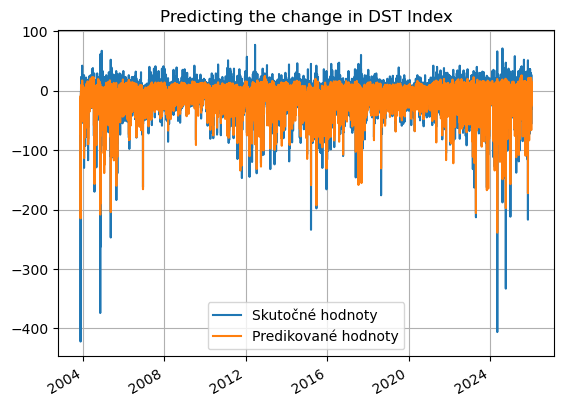

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.8973045072511536
MCC=0.6836970589437813
Výkon NN:
MAE: 6.0254, MSE: 92.3898
Perzistentný model:
MAE: 7.2032, MSE: 134.9898
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 16.35%
MSE Improvement: 31.56%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step 

710/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 48s 53ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step 

 40/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step 

  3/759 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step 

573/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 12:38 847ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step   

  3/896 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 22s 54ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step 

715/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 51s 55ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 41s 187ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step  

  5/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step 

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step 

 10/759 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 23s 55ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step 

580/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step


Shapes LSTM:
train: (229332,) (229332,)
val:   (57315,) (57315,)
test:  (194176,) (194176,)
Global sigma (LSTM errors, scaled): 0.5291516
Shapes GP:
X_gp_train: (286647, 24)
y_gp_train: (286647,)
X_test_gp: (194176, 24)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.46**2 * RBF(length_scale=0.437) + WhiteKernel(noise_level=0.635)


Global sigma (LSTM errors): 11.643411
Hybrid prediction with smoothed, inflated interval ready.


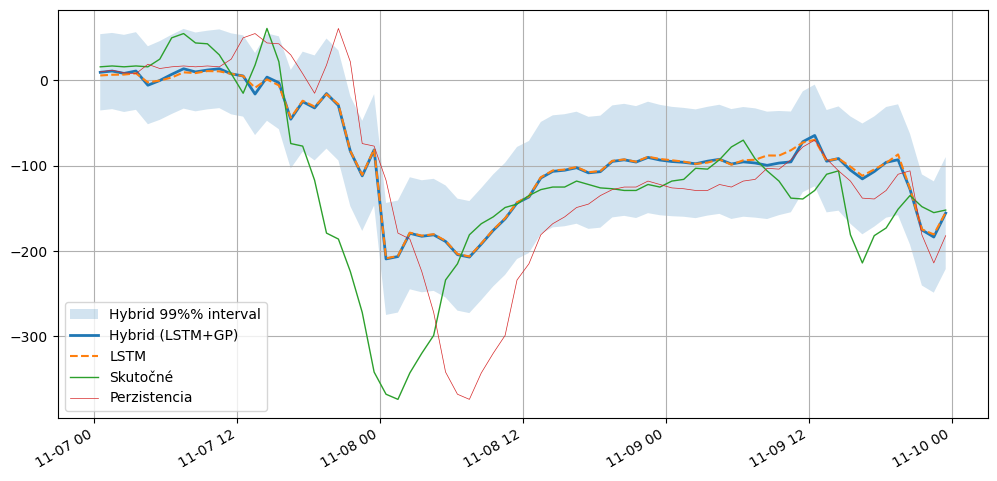

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 101.6487
MAE: 6.4486

--- Klasifikačné metriky (Prah: -20.2 nT) ---
Matthews Correlation Coefficient (MCC): 0.6654

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      144365 |        7674
Skutočná 1 |       13481 |       28645

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.91      0.95      0.93    152039
   Trieda 1 (Búrka)       0.79      0.68      0.73     42126

           accuracy                           0.89    194165
          macro avg       0.85      0.81      0.83    194165
       weighted avg       0.89      0.89      0.89    194165



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.8973244405531378
MCC=0.6837516006274243
Výkon NN:
MAE: 6.0254, MSE: 92.3898
Perzistentný model:
MAE: 7.2032, MSE: 134.9898
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 16.35%
MSE Improvement: 31.56%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9167    0.9557    0.9358    152039
           1     0.8112    0.6866    0.7437     42126

    accuracy                         0.8973    194165
   macro avg     0.8639    0.8212    0.8398    194165
weighted avg     0.8938    0.8973    0.8941    194165


===== LSTM+GP =====
ACC=0.8910462750753225
MCC=0.6653826810783543
Výkon NN:
MAE: 6.4486, MSE: 101.6487
Perzistentný model:
MAE: 7.2032, MSE: 134.9898
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 10.48%
MSE Improvement: 24.70%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9146    0.9495    0.9317    152039
           1     0.7887    0.6800    0.7303     4212

/tmp/ipykernel_1108154/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_1108154/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
72,2026-04-27T18:52:50,LSTM,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.895297,0.677676,"{""text"": "" precision recall f...",6.211522,95.578536,7.203881,135.014157,13.775340,29.208508
73,2026-04-27T18:52:51,LSTM+GP,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.888844,0.655119,"{""text"": "" precision recall f...",6.465791,102.121241,7.203881,135.014157,10.245727,24.362568
74,2026-04-27T19:54:18,LSTM,18.0,6.0,DST+6,OMNI2_all,-20.0,-20.1,0.896421,0.681458,"{""text"": "" precision recall f...",6.087973,93.442580,7.203913,135.016377,15.490746,30.791670
75,2026-04-27T19:54:18,LSTM+GP,18.0,6.0,DST+6,OMNI2_all,-20.0,-20.1,0.888387,0.661027,"{""text"": "" precision recall f...",6.432398,100.433594,7.203913,135.016377,10.709667,25.613769
76,2026-04-27T20:04:15,LSTM,18.0,6.0,DST+6,OMNI2_all,-20.0,-20.1,0.896421,0.681458,"{""text"": "" precision recall f...",6.087973,93.442580,7.203913,135.016377,15.490746,30.791670
77,2026-04-27T20:04:15,LSTM+GP,18.0,6.0,DST+6,OMNI2_all,-20.0,-20.1,0.888387,0.661027,"{""text"": "" precision recall f...",6.432398,100.433594,7.203913,135.016377,10.709667,25.613769
78,2026-04-27T21:28:34,LSTM,24.0,6.0,DST+6,OMNI2_all,-20.0,-20.2,0.897324,0.683752,"{""text"": "" precision recall f...",6.025367,92.389838,7.203240,134.989823,16.351977,31.557923
79,2026-04-27T21:28:34,LSTM+GP,24.0,6.0,DST+6,OMNI2_all,-20.0,-20.2,0.891046,0.665383,"{""text"": "" precision recall f...",6.448601,101.648705,7.203240,134.989823,10.476382,24.698986
80,2026-04-27T21:29:52,LSTM,24.0,6.0,DST+6,OMNI2_all,-20.0,-20.2,0.897324,0.683752,"{""text"": "" precision recall f...",6.025367,92.389838,7.203240,134.989823,16.351977,31.557923
81,2026-04-27T21:29:52,LSTM+GP,24.0,6.0,DST+6,OMNI2_all,-20.0,-20.2,0.891046,0.665383,"{""text"": "" precision recall f...",6.448601,101.648705,7.203240,134.989823,10.476382,24.698986
